In [5]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
%matplotlib inline

In [6]:
import struct
import numpy as np

def loadlocal_mnist(images_path, labels_path):
    with open(labels_path, 'rb') as lbpath:
        magic, n = struct.unpack('>II',
                                 lbpath.read(8))
        labels = np.fromfile(lbpath,
                             dtype=np.uint8)
    with open(images_path, 'rb') as imgpath:
        magic, num, rows, cols = struct.unpack(">IIII",
                                               imgpath.read(16))
        images = np.fromfile(imgpath,
                             dtype=np.uint8).reshape(len(labels), 784)

    return images, labels

In [7]:
X, Y = loadlocal_mnist(
        images_path='train-images-idx3-ubyte', 
        labels_path='train-labels-idx1-ubyte')

In [8]:
print X[12:13]
print X[:].mean()
print X[:].max()

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  12
   99  91 142 155 246 182 155 155 155 155 131  52   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0 138 254 254 254 254 254 254 254 254
  254 254 254 252 210 122  33   0   0   0   0   0   0   0   0   0   0   0
    0 220 254 254 254 235 189 189 189 189 150 189 205 254 254 254  75   0
    0   0   0   0   0   0   0   0   0   0   0  35  74  35  35  25   0   0
    0   0   0   0  13 224 254 254 153 

In [9]:
print('Dimensions: %s x %s' % (X.shape[0], X.shape[1]))
#print('\n1st row', X[0])

Dimensions: 60000 x 784


In [10]:
records_num, features_num = X.shape
print (type(X))

<type 'numpy.ndarray'>


In [11]:
import numpy as np

print('Digits:  0 1 2 3 4 5 6 7 8 9')
print('labels: %s' % np.unique(Y))
print('Class distribution: %s' % np.bincount(Y))

Digits:  0 1 2 3 4 5 6 7 8 9
labels: [0 1 2 3 4 5 6 7 8 9]
Class distribution: [5923 6742 5958 6131 5842 5421 5918 6265 5851 5949]


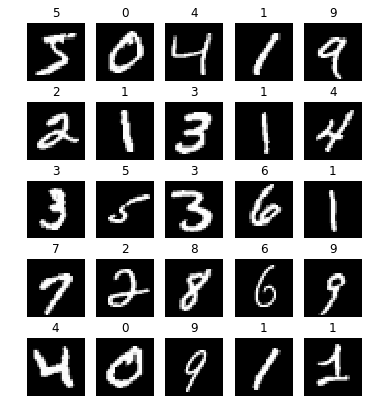

In [12]:
plt.figure(figsize=(6, 7))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(X[i].reshape(28, 28), cmap='gray')
    plt.title(Y[i])
    plt.axis('off')

In [13]:
def display(i):
    img = X[i]
    plt.title(Y[i])
    plt.imshow(img.reshape((28,28)), cmap=plt.cm.gray_r)

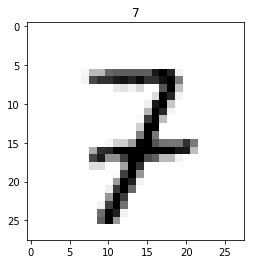

In [14]:
display(2018)

In [15]:
print (28*28," features")

(784, ' features')


# Try to run model

In [16]:
record_num, features_num = X.shape
print record_num, features_num

60000 784


In [17]:
bias_f = np.ones((record_num, 1))
X = np.hstack((bias_f, X))

record_num, features_num = X.shape
print record_num, features_num

60000 785


In [18]:
def my_accuracy(y_pred, y_true):
    counter = 0
    for ind, elem in enumerate(y_pred):
        if elem == y_true[ind]:
            counter += 1
            
    return float(counter)/len(y_pred)

In [19]:
def my_model(features, weights):
    inner_sum = 0
    
    for ind, elem in enumerate(features):
        inner_sum += elem * weights[ind]
        
    return inner_sum

In [20]:
def predict(X, weights):
    predicted_values = []
    
    for record in X:
        result = my_model(record, weights)
        predicted_values.append(result)
        
    return np.array(predicted_values)

In [21]:
def init_weights(features_num, a, b):
    return a + (b - a) * np.random.random(features_num)

In [22]:
records_num, features_num = X.shape
print records_num, features_num

60000 785


In [23]:
def my_loss(predicted_value, true_value):
    result = (predicted_value - true_value) ** 2        
    
    return result

In [24]:
def my_loss_fun(predicted_values, true_values):
    loss_sum = 0.0
    
    for ind, elem in enumerate(predicted_values):
        loss_sum += my_loss(elem, true_values[ind])
        
    return loss_sum / len(predicted_values)

In [25]:
def loss_in_point(X, y, weights):
    predicted_values = []
    
    for record in X:
        result = my_model(record, weights)
        predicted_values.append(result)
        
    return my_loss_fun(predicted_values, y)

In [26]:
def mse_grad(X, y, model_weights):
    records_num, _ = X.shape
    current_loss = loss_in_point(X, y, model_weights)
    y_pred = predict(X, model_weights)
    grad = -2.0 / records_num * np.matmul(y - y_pred, X)
    
    return grad, current_loss

In [27]:
def num_gradient(X, y, model_weights, w_delta=0.01):
    current_loss = loss_in_point(X, y, model_weights)
    weights_delta = model_weights[:]
    grad = []
    
    for coord in range(len(model_weights)):
        weights_delta[coord] += w_delta
        delta_loss = loss_in_point(X, y, weights_delta)
        deriv = (delta_loss - current_loss) / w_delta
        grad.append(deriv)
        weights_delta[coord] -= w_delta
        
    return np.array(grad), current_loss

In [28]:
def grad_descent(X, y, initial_weights, learning_rate=0.1, iter_num=1000):
    opt_weights = initial_weights[:]
    
    for iteration in xrange(iter_num):
        grad, current_loss_val = mse_grad(X, y, opt_weights)
        print "iter: ", iteration, "loss_val:", current_loss_val
        opt_weights -= learning_rate * grad
        
    return opt_weights

In [29]:
def reading (Y,number):
    massiv=np.copy(Y)
    for ind,elem in enumerate(massiv):
        if elem ==number:
            True
        else:
            massiv[ind]=0
    return massiv

# Train and val 

In [30]:
X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.25, random_state=1)
print X_train.shape
print y_train.shape

(45000, 785)
(45000,)


In [31]:
def mse_grad_regul(X, y, model_weights, lambda_coef = 0.1):
    records_num, _ = X.shape
    weights_grad = 2.0 * lambda_coef * model_weights[:]
    weights_grad[0] = 0.0
    current_loss = loss_in_point(X, y, model_weights)
    y_pred = predict(X, model_weights)
    grad = -2.0 / records_num * np.matmul(y - y_pred, X) + weights_grad
    
    return grad, current_loss

In [32]:
def grad_descent_regul(X, y, initial_weights, learning_rate=0.1, iter_num=1000, lambda_coef = 0.1):
    opt_weights = initial_weights[:]
    
    for iteration in xrange(iter_num):
        grad, current_loss_val = mse_grad_regul(X, y, opt_weights, lambda_coef)
        print "iter: ", iteration, "loss_val:", current_loss_val
        opt_weights -= learning_rate * grad
        
    return opt_weights

# For 2

In [36]:
y=reading(y_train,2)
current_number=np.where(y==2)
current_number_train=np.where(y_train==2)
print current_number_train[0].shape
print current_number[0].shape
print y.shape

(4472,)
(4472,)
(45000,)


In [34]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_2 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 0.39534305898780947
iter:  1 loss_val: 0.3559658580187137
iter:  2 loss_val: 0.3396720265692197
iter:  3 loss_val: 0.3296587722009655
iter:  4 loss_val: 0.3216142898000768
iter:  5 loss_val: 0.3144132449391122
iter:  6 loss_val: 0.30774461028848477
iter:  7 loss_val: 0.3015067748800715
iter:  8 loss_val: 0.2956531955824203
iter:  9 loss_val: 0.29015291669507826
iter:  10 loss_val: 0.2849803835656915
iter:  11 loss_val: 0.28011273399545983
iter:  12 loss_val: 0.27552900501312416
iter:  13 loss_val: 0.27120983623890543
iter:  14 loss_val: 0.26713730745968384
iter:  15 loss_val: 0.26329481740224986
iter:  16 loss_val: 0.25966697941459516
iter:  17 loss_val: 0.25623952733371924
iter:  18 loss_val: 0.2529992293419259
iter:  19 loss_val: 0.24993380880783175
iter:  20 loss_val: 0.24703187145004563
iter:  21 loss_val: 0.2442828382828785
iter:  22 loss_val: 0.24167688386553488
iter:  23 loss_val: 0.23920487942072077
iter:  24 loss_val: 0.23685834042606543
iter:  25 loss_val: 

In [37]:
predicted_labels_2 = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights)
    predicted_label = predicted_score>0.7 and 2 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

0.9427950564575094 2 2
0.3158489196269726 0 0
0.5485753982276835 0 0
-0.05323074475814745 0 0
-0.019239998910482687 0 0
0.22604333615033964 0 0
-0.023519266721192682 0 0
0.014844551656433693 0 0
-0.1518868169998638 0 0
-0.3372527092035487 0 0
0.11849579737464834 0 0
0.5999600688744747 0 2
0.20797088832319524 0 0
-0.1817187718009683 0 0
-0.06366356609919835 0 0
0.1782382785048165 0 0
-0.13470480684849187 0 0
0.2535495480969702 0 0
0.17521184132755707 0 0
0.4188078272775539 0 0
0.20066304729068438 0 0
-0.20430670335891837 0 0
-0.21305362031423164 0 0
0.18721961422358918 0 0
0.010156972439995426 0 0
-0.20337311864829913 0 0
0.11928618892484512 0 0
0.3192369080716088 0 0
0.35763830644332484 0 0
-0.2190832519541457 0 0
0.401150560930054 0 0
-0.26061634427238595 0 0
0.4163375422584647 0 0
0.06552075178800736 0 0
-0.01635535062701547 0 0
0.008451243428549755 0 0
0.20911430113196014 0 0
-0.15450193320098046 0 0
0.0646958166920272 0 0
-0.12969494822726516 0 0
0.1698993768730722 0 0
-0.330918275

0.494504598903645 0 0
0.282605155847146 0 0
0.5279647290017259 0 0
0.1045801387956321 0 0
1.526860449411873 2 2
0.05650279516337798 0 0
0.3343451203493377 0 0
-0.09938396484878911 0 0
0.7057141104498673 2 0
0.20861101339027827 0 0
1.706412795012273 2 2
-0.13821757926806233 0 0
0.10653602985402554 0 0
-0.07389203096547795 0 0
0.4689969009428202 0 0
0.22400491327303457 0 0
0.2013363196600429 0 0
0.23712842813334692 0 0
0.08558909627865025 0 0
0.2917932877927075 0 0
0.09161363891604404 0 0
1.2331699252976163 2 2
0.1429738798204794 0 0
0.19611635985453438 0 0
0.07581888333167314 0 0
0.12936053046321683 0 0
-0.4046208209727728 0 0
-0.05669205007534823 0 0
-0.26858611293105555 0 0
0.2544917168544195 0 0
0.08188790397301422 0 0
0.8085016921889546 2 2
1.3720573417622892 2 2
0.26161971462621053 0 0
0.04997297167189729 0 0
0.05666495527610383 0 0
-0.01400549278385476 0 0
0.01872487554979708 0 0
-0.1930770260952724 0 0
0.033103945798752255 0 0
0.18435402832218498 0 0
0.05017243683844903 0 0
0.160

0.042589369444228115 0 0
0.23529354606563643 0 0
-0.07913756491140733 0 0
0.15007776449046642 0 0
-0.21331222556627102 0 0
0.10624265943882573 0 0
-0.18625653657516833 0 0
0.042267904263889294 0 0
0.7835937437180752 2 2
-0.13411600471518026 0 0
1.6753005495580147 2 2
-0.40135585232267673 0 0
0.7291349404148347 2 0
-0.05153714191834075 0 0
0.6918534489035538 0 0
0.30502227555940997 0 0
1.1874593353014415 2 2
0.2913224980987899 0 0
0.20458811590765802 0 0
0.017763389287021612 0 0
0.4986504429442247 0 0
-0.09471838250207446 0 0
0.02336004456093342 0 0
0.49913759350597287 0 0
-0.29690559172194914 0 0
0.06280913947906806 0 0
0.9848819771649258 2 2
0.16137775997401407 0 0
-0.2742410048373299 0 0
0.3798083863814873 0 0
-0.1167390793300194 0 0
1.5751714348148116 2 2
0.6502670013315909 0 0
-0.23128497121250985 0 0
1.6507169967897932 2 2
-0.4505336366323889 0 0
0.620634070830981 0 2
-0.06419147093355815 0 0
0.024126815403591736 0 0
0.37422860225383603 0 0
0.06300253069958998 0 0
0.04218119435151

-0.12169200669411132 0 0
0.20263666615753287 0 0
0.10373443732636424 0 0
0.9084606375474865 2 2
0.5114650504301836 0 0
-0.1888032081524086 0 0
0.020986785901671818 0 0
-0.13543748722761295 0 0
0.06463923152742601 0 0
1.0137036975189153 2 2
0.3691968103007368 0 0
-0.255617086382743 0 0
0.41137961698172437 0 0
0.14559118497108495 0 0
-0.1759840837219804 0 0
0.1337177031072087 0 0
0.08675333960008547 0 0
0.2778662218561648 0 0
0.3488942208852281 0 0
1.0422292833225604 2 2
0.19752631901656795 0 0
0.22136958766895776 0 0
0.016168461001611373 0 0
0.33012414796027445 0 0
-0.14536546989716054 0 0
0.10591177739826631 0 0
0.17175548425313192 0 0
-0.10884732178753176 0 0
-0.005021572077631424 0 0
0.353735963533435 0 0
0.3342689748089925 0 0
0.3655356161583901 0 0
-0.30957479919084196 0 0
0.24346525796136403 0 0
0.15149759804223842 0 0
0.3257921524203831 0 0
0.11293910094608652 0 0
0.25027189969372865 0 0
0.020785909110909735 0 0
0.5593257434448301 0 0
0.32388774549019317 0 0
0.0380680244615019 0 

0.8942274228061311 2 0
-0.13927684888012654 0 0
0.16245520916728118 0 0
0.2554348893371118 0 2
-0.4106207155839452 0 0
0.0811056296979837 0 0
-0.013115312366851612 0 0
-0.051414544422400184 0 0
0.06581174855985443 0 0
0.263360804206039 0 0
0.039619665540990265 0 0
0.3198588715935506 0 0
0.14051596335624658 0 0
-0.12535616174888076 0 0
-0.2360150161002645 0 0
-0.3508000534416603 0 0
1.5336187731106037 2 2
0.3562612929591486 0 0
0.40981720142741945 0 0
0.1834422931582847 0 0
0.04365069352224494 0 0
-0.08083396902874451 0 0
0.6379102794400562 0 0
-0.7877108769970839 0 0
0.10586090554028584 0 0
0.09093768141781149 0 0
0.2319172578347226 0 0
-0.1299103255397624 0 0
-0.12760745138422977 0 0
0.19329226686144294 0 0
0.07693088780144261 0 0
-0.35810412325827956 0 0
0.1001331687980784 0 0
-0.0018366368452736067 0 0
1.2796065654188569 2 2
0.2698168735360386 0 0
0.374983341016621 0 0
0.5518964455547131 0 0
-0.006574968759015438 0 0
0.3544717011011788 0 0
-0.12266347578646351 0 0
-0.122201819198275

0.016580355189579628 0 0
0.121388783942405 0 0
-0.041343893335954285 0 0
-0.021500173187636785 0 0
0.605287725325253 0 0
0.195095755713907 0 0
0.11651767215295979 0 0
-0.26517731803004835 0 0
0.14431772091083803 0 0
0.190283879312782 0 0
0.025669988952789723 0 0
-0.014003907766780333 0 0
-0.0797811034468155 0 0
0.17663502920538499 0 0
0.37054113230776803 0 0
0.13221148381742767 0 0
0.053250436215512106 0 0
0.0689627639948003 0 0
0.004881155988271977 0 0
0.22304639143111682 0 0
-0.14531734473507643 0 0
0.020737436638617764 0 0
-0.018929197848081513 0 0
0.07892952956467328 0 0
-0.20004042932009436 0 0
-0.0840621447669679 0 0
0.07266113608768279 0 0
0.1944439503271025 0 0
0.20733862513951642 0 0
0.04552956720697988 0 0
0.09353442491708433 0 0
0.44295413469029454 0 0
0.04506109493367876 0 0
0.14202225571519134 0 0
0.1477189976677964 0 0
0.6777930622809335 0 2
0.05304008681772782 0 0
-0.28720358349908637 0 0
-0.09567655830428363 0 0
-0.11917792442881489 0 0
0.6566165876209675 0 0
0.12123110

0.45443575444919787 0 0
0.06630083819130117 0 0
0.526160155489555 0 0
-0.10591473349611169 0 0
0.270609973322086 0 0
0.26086842809846644 0 0
0.16498451714386678 0 0
0.3847713609591975 0 0
0.2192280680894918 0 0
1.6499298115920324 2 2
0.20740219745265281 0 0
0.35610974172286725 0 0
0.7491647874755677 2 2
-0.33634226284327196 0 0
-0.21306341679592583 0 0
-0.10702214985738855 0 0
0.22480506076110496 0 0
0.1675300627716432 0 0
-0.37344425097070744 0 0
-0.19280359416144743 0 0
0.1602462229016788 0 0
-0.1811326067363678 0 0
-0.11364230090334053 0 0
0.04877293735261303 0 0
0.4682125014187873 0 0
2.043324350897978 2 2
-0.24186539998683232 0 0
0.04565341944933134 0 0
0.07309693836589466 0 0
-0.009282271978641527 0 0
0.0989643344942511 0 0
1.6713135032244815 2 2
0.06408704610083502 0 0
0.15930004053881533 0 0
0.6227654009610262 0 0
0.17195584758789365 0 0
0.13939959346516184 0 0
0.019451775889972683 0 0
0.7073575389893558 2 0
-0.02688937376012303 0 0
0.07337775095511764 0 0
-0.14500731905598346 

0.03232035343256714 0 0
0.014115706087072428 0 0
0.06228080203021886 0 0
0.12922743188017097 0 0
-0.017500859004483456 0 0
0.8751772933087008 2 2
-0.10590670959104517 0 0
-0.16491169531977543 0 0
-0.1360824615395797 0 0
0.25867580777543087 0 0
-0.2099897813865312 0 0
-0.2772534802693457 0 0
0.08125845201721002 0 0
0.06400036581663071 0 0
0.36279114796370654 0 0
0.07763542884419233 0 0
0.5498145572221287 0 0
0.0750256154343811 0 0
0.08780420236425356 0 0
-0.020035942865091184 0 0
0.18865108564777802 0 0
0.06162296531423456 0 0
0.13883448767486292 0 0
0.2388974018000196 0 0
0.41361453743999554 0 0
0.020104232664142956 0 0
0.1736068413606319 0 0
0.5703769430500235 0 0
-0.04469560462917729 0 0
-0.0207553157759674 0 0
0.23866124507667416 0 0
0.031457011184218536 0 0
-0.19892587761358713 0 0
0.426046822519033 0 0
0.9210331374612752 2 0
0.09014714938236316 0 0
0.0006496137942618443 0 0
0.12503655950533518 0 0
-0.032799120947818144 0 0
0.12003309517979692 0 0
-0.33147252182329273 0 0
1.0911449

0.6569620418019968 0 2
-0.12321432095671617 0 0
1.337397379480314 2 2
-0.3803253681992534 0 0
0.17575490355428225 0 0
0.10208039309631796 0 0
-0.042678661205386534 0 0
-0.025756876375035462 0 0
-0.004031667830040006 0 0
0.22506475615203683 0 0
-0.232868456817029 0 0
0.10315785082172485 0 0
-0.23651310782026838 0 0
0.2965174723410747 0 0
0.1737518835044888 0 0
0.29613246736888077 0 0
-0.07604890822030275 0 2
0.015257735474351358 0 0
0.4197709773399029 0 0
0.15314402329732435 0 0
0.02287323029552204 0 0
-0.07296585838213981 0 0
-0.2102569868873444 0 0
0.3584968188503319 0 0
0.46285189951843997 0 0
0.006040952173815204 0 0
0.9238504039453372 2 2
-0.04794703353050894 0 0
1.2806411000134206 2 2
0.006443011742840544 0 0
0.4236813508683748 0 0
1.1427089919747513 2 2
0.12927347042811532 0 0
0.0474983224698646 0 0
0.09259824652318856 0 0
0.17396786806926737 0 0
0.3542790924231626 0 2
0.15917164476866727 0 0
-0.32189502587216295 0 0
1.7851638404581034 2 2
-0.2478136945005663 0 0
-0.0620266978122

-0.01197879575362456 0 0
0.10161593295314561 0 0
0.7683734208582743 2 0
-0.2371218672763889 0 0
0.6897752001087081 0 0
-0.37835366650080626 0 0
-0.043751763540650246 0 0
0.22519501513966292 0 0
-0.08367609199624781 0 0
0.06584200443039981 0 0
0.40454340574278513 0 0
1.5631374589917373 2 2
-0.3069864602737 0 0
0.37469836272789553 0 0
0.005114770959937377 0 0
0.8854563968316596 2 2
0.0816877884561214 0 0
0.08883225032055614 0 0
1.0345329003785888 2 2
0.400284865403691 0 0
0.46508596160856003 0 0
0.00907551059117497 0 0
0.09438559009732701 0 0
0.3809046830943361 0 0
0.8605751892601716 2 2
-0.5333125942113228 0 0
-0.1081901773657447 0 0
0.04147147795511293 0 0
0.32670971569085516 0 0
0.3671442769550874 0 0
0.31834744417293914 0 0
0.5494250211608342 0 0
0.005559941033253229 0 0
-0.16051803243967425 0 0
0.1063917932297357 0 0
0.18788808481994168 0 0
0.22701909154081792 0 0
0.9521780014009177 2 2
0.2148231544395223 0 0
-0.23653944918318223 0 0
-0.023962990482433895 0 0
0.09149336206430125 0 0

0.14255605397882093 0 0
-0.05674709906723023 0 0
0.09398776893954719 0 0
-0.20621504569417462 0 0
0.3834085157956418 0 0
0.010842317772605801 0 0
0.2201631717779828 0 0
0.17187362996219965 0 0
0.10893195052414412 0 0
0.33326369842298587 0 0
0.14027373806662655 0 0
0.06766377320505217 0 0
0.15783430034753324 0 0
0.026318444524277052 0 0
-0.050663509717030236 0 0
-0.0819951967262587 0 0
0.18433649172234834 0 0
0.10867879121408076 0 0
0.03174702095826355 0 0
0.5063754826792167 0 0
-0.0553131236142555 0 0
0.18693175369609633 0 0
0.27630178098339697 0 0
0.677977561252129 0 0
-0.06704515364383871 0 0
0.062410078795473146 0 0
0.11811022690426458 0 0
-0.14586266595548777 0 0
0.17374210301336748 0 0
-0.07106677127567078 0 0
0.6559018753268723 0 0
0.21640190546057797 0 0
0.528752889751734 0 0
0.106197068928878 0 0
-0.06439004126990035 0 0
0.03166047162582281 0 0
0.34990603038477974 0 0
0.07582334619554261 0 0
0.6190552818922896 0 0
0.22274102870623846 0 0
0.24929925091109403 0 0
0.43665404499719

0.5494105358224386 0 0
-0.04716283690458707 0 0
0.8933299786279462 2 2
0.12887479532579182 0 0
-0.0348945457873619 0 0
1.3799564195776184 2 2
0.7255266865018706 2 2
0.007570429831677103 0 0
0.9044133974368148 2 2
0.034327368585078004 0 0
-0.13223664910024036 0 0
-0.11696296952217723 0 0
0.08684563613357135 0 0
1.4073048974692381 2 2
-0.029044940455977164 0 0
0.04713323630718479 0 0
0.4021222577889406 0 0
-0.1828596164002141 0 0
0.1212420712693775 0 0
-0.1832110634331509 0 0
0.17829792697934482 0 0
0.09025693403332043 0 0
0.2888092397944599 0 0
0.6141859593554133 0 0
0.07975983598256868 0 0
1.4002874036969086 2 2
0.0978234311656313 0 0
0.1727697519647363 0 0
0.03561152071139405 0 0
0.4499646747952788 0 2
1.4154776161809879 2 2
0.06412514090913111 0 0
0.15750671340576336 0 0
0.04775860922007266 0 0
0.03688404464352393 0 0
0.08986744494187353 0 0
-0.41171533439583713 0 0
0.269426346274135 0 0
-0.11042163499356124 0 0
-0.017336718970704348 0 0
0.5287621919341071 0 0
0.3610119137867972 0 2


-0.31532264323249487 0 0
0.24419124497042458 0 0
-0.12270189070957883 0 0
-0.3277150173848019 0 0
0.2633691606751574 0 0
-0.20450964103383215 0 0
0.09007758358692734 0 0
0.30081830240113105 0 0
-0.5104352270067954 0 0
0.03748786914841081 0 0
0.12107106130674886 0 0
0.5808775891725874 0 0
0.30403512778276076 0 0
-0.10425711604811422 0 0
0.13274316196201127 0 0
0.38020526698830975 0 0
0.3109060386004459 0 0
-0.15642002686940593 0 0
0.42485716411170277 0 0
0.4979530030648723 0 0
0.11069747341331385 0 0
0.50160783071019 0 2
0.22402095848735856 0 0
0.30703097283961234 0 0
1.3095034451999548 2 2
0.25622252364330406 0 0
-0.2020242319967253 0 0
0.3098322188139361 0 2
0.15075842063573977 0 0
-0.3490178568361968 0 0
0.07817836829935508 0 0
1.550370198330935 2 2
0.19933096655008498 0 0
0.25088348459806964 0 0
-0.15040212637346392 0 0
0.41530457197950277 0 0
0.11672749996834134 0 0
0.10434475569405957 0 0
0.34094605036044395 0 0
-0.19763133220813509 0 0
-0.21479714523044033 0 0
0.3386196652959349 

-0.02361405780565361 0 0
-0.02486179323511856 0 0
0.09040539626066829 0 0
0.05740593044149931 0 0
0.20869123109207427 0 0
0.34770930993086924 0 0
0.09969269648154461 0 0
-0.1341010960885621 0 0
-0.03382305828402852 0 0
-0.06168862103147951 0 0
1.5253255023022496 2 2
0.6297871871998083 0 2
0.18030732897923707 0 0
0.28814748595855355 0 0
-0.18275192500681267 0 0
0.6067185406014277 0 0
0.19110434717075828 0 0
1.597940702592318 2 2
-0.4400220964096705 0 0
1.12021391173952 2 2
0.032669086985258236 0 0
0.16230455146724423 0 0
0.10956720234133667 0 0
-0.11924451443848741 0 0
-0.35604171446515037 0 0
0.15025497104348284 0 0
-0.03746591488508245 0 0
0.17249761963500862 0 0
0.12661139535379254 0 0
0.03944922973851947 0 0
0.18267440683060107 0 0
0.13424994340678126 0 0
0.0005373818837179083 0 0
1.4431455698324134 2 2
0.18686923994146482 0 0
-0.014058037661289395 0 0
0.15108329100974335 0 0
-0.0622250341402284 0 0
0.14857523335632142 0 0
-0.49443387944845457 0 0
0.06724944438665283 0 0
0.961273158

0.3688285682643019 0 0
0.19619908722603097 0 0
-0.06283461362037163 0 0
-0.07080330024858106 0 0
0.07159775414741161 0 0
-0.11992186897745334 0 0
0.17711888756059077 0 0
0.09511275797698689 0 0
-0.35415759820895254 0 0
-0.00036451187896209113 0 0
1.3288750159198586 2 2
0.8224173846680942 2 2
0.30513768821223947 0 0
0.2824630944820803 0 0
0.1570528670064641 0 0
0.09205638061406729 0 0
0.4825933272238958 0 0
0.31389359881370177 0 0
0.4657479363888846 0 0
0.4339437047494721 0 0
0.8096305628591746 2 2
0.2470340953290951 0 0
0.1021064206079854 0 0
0.07997146489579425 0 0
1.1316952942184648 2 2
1.3787455961063182 2 2
-0.23043615978844995 0 0
-0.1831497677547164 0 0
-0.1001140618821857 0 0
0.03189981436655578 0 0
0.05425002949283233 0 0
0.15503618780869768 0 0
-0.166399446819963 0 0
0.633496573868399 0 2
0.13345931283670528 0 0
0.01443565656143407 0 0
-0.2437937288520566 0 0
0.56523662165843 0 2
-0.22918323683495348 0 0
1.97894313098691 2 2
0.04749601849896298 0 0
1.4706858541437373 2 2
-0.42

-0.2914499940927808 0 0
0.41322219755640893 0 0
-0.24662617505657639 0 0
0.09142149013523644 0 0
0.22297585362296712 0 0
0.37503290732946465 0 2
-0.08869769833181501 0 0
0.31881817615577146 0 0
0.24015375151765497 0 0
0.1041510891608577 0 0
-0.32439104500915533 0 0
0.5812708101058315 0 2
0.392851992122545 0 2
0.18271084946220648 0 0
0.05897109202472517 0 0
-0.031510959360074864 0 0
-0.25452192408555935 0 0
-0.20191768707215135 0 0
0.10533742331601677 0 0
0.4580931078477643 0 0
0.31060757191902216 0 0
-0.10405901492582902 0 0
-0.29998843160924576 0 0
0.05734010786550808 0 0
-0.3518010608772833 0 0
0.13316133578190154 0 0
0.29645954367316185 0 0
0.3563583471596554 0 0
-0.057822579950747195 0 2
-0.003448684703788906 0 0
-0.23177225627865722 0 0
0.2163304732830105 0 0
-0.22571742456985247 0 0
1.6625054656943639 2 2
0.785928759560432 2 2
0.6875865611932895 0 0
0.2900946816339859 0 0
0.10530141758245759 0 0
-0.08711475576078845 0 0
0.5254923623209009 0 0
0.13997127646924185 0 0
0.09686939095

0.015630793187729898 0 0
0.2180632660279202 0 0
0.6232631823462033 0 2
-0.1527959928505345 0 0
0.5353534757854933 0 0
-0.06301977351999 0 0
0.12123409421580474 0 0
0.002267385009982579 0 0
0.18364592285659295 0 0
-0.2743243871646784 0 0
0.257213362553304 0 0
0.8139261378724071 2 2
0.15210761648651352 0 0
-0.006363266414960953 0 0
0.4411007915451255 0 0
1.1380263223291827 2 2
0.24846541008128512 0 0
0.5931333563042956 0 0
-0.03444613549475519 0 0
0.0106197886687898 0 0
0.43312208677547676 0 0
0.11766276610040552 0 0
0.20006266735567438 0 0
0.08692908824294487 0 0
0.4446540709560153 0 0
0.2109857234220902 0 0
0.10106771106558786 0 0
-0.07203683366804695 0 0
0.0724732229227053 0 0
0.06678661772165997 0 0
-0.25848252284003603 0 0
0.26914596263720236 0 0
-0.3633738955880809 0 0
0.557733091793782 0 0
0.9900585123345059 2 2
0.1863955148481332 0 0
-0.06449342936075775 0 0
0.19893308908090612 0 0
0.2740947051495224 0 0
-0.4214185051131825 0 0
0.2624121332684986 0 0
0.4601966633998026 0 0
-0.153

-0.21163011120642064 0 0
0.49883121174403694 0 0
-0.14145615857155835 0 0
-0.0884318331892467 0 0
-0.09381551646590583 0 0
-0.10977382058065915 0 0
0.21561487739678933 0 0
0.26180342889265984 0 0
0.012431930576861644 0 0
0.21319564167291336 0 0
-0.07866084410861128 0 0
-0.08670502261411424 0 0
-0.12645444563792335 0 0
0.05673465469610288 0 0
1.4992567242815107 2 2
0.6333263506135393 0 0
0.12139980377944858 0 0
0.5235636440775423 0 0
-0.010116584570832868 0 0
1.7008180689420553 2 2
-0.15950177030437163 0 0
-0.04119967175289904 0 0
0.2699641823673837 0 0
0.43984492292801075 0 0
0.5297628490773499 0 0
-0.11596136379098129 0 0
0.9329511090963695 2 2
0.5435774314921495 0 0
-0.1669173535769364 0 0
0.4009925993578908 0 0
0.01699975054161022 0 2
-0.18361074463658736 0 0
0.07364427552494993 0 0
0.15332276689610413 0 0
0.2049341977309553 0 0
0.42545676260924886 0 0
0.2966794562389374 0 0
0.008387130452414482 0 0
0.09230465385627935 0 0
-0.14963149600928952 0 0
0.11575367087345952 0 0
0.011496537

-0.007326319555000155 0 0
-0.1478445982191834 0 0
0.14864171252559552 0 0
0.1292824299150666 0 0
0.8484574368013033 2 0
-0.05017192483970722 0 0
-0.016894222855908355 0 0
0.03353748832300621 0 0
-0.303858744627931 0 0
-0.019023978047769584 0 0
-0.08387505283136965 0 0
-0.1490858340626766 0 0
1.3571255572176832 2 2
-0.34315319030125896 0 0
-0.05984919805202863 0 0
0.1999618168090148 0 0
0.1931898790427751 0 0
0.3032421560502841 0 0
-0.13404287171148385 0 0
0.25291483656727365 0 0
0.36031873658464325 0 0
-0.3681274833966194 0 0
-0.15341958233209121 0 0
-0.24437944026888467 0 0
-0.013395430512513304 0 0
-0.10678388508447201 0 0
-0.1689561486999051 0 0
0.18300911190758887 0 0
0.04376594184897908 0 0
0.12063090775229551 0 0
0.23567259480155248 0 0
0.13337065639812692 0 0
0.5512768540388855 0 2
-0.009925778377820594 0 0
0.7230841195868426 2 2
0.033703534485272704 0 0
0.1166870201018958 0 0
0.5005509796606074 0 0
0.27337160520228654 0 0
0.013587322064766682 0 0
-0.2530209107070278 0 0
-0.0820

0.13801522896258256 0 0
0.05857502477137029 0 0
0.001728412468023694 0 0
0.43094218856458144 0 2
1.1496422436668585 2 2
0.14236490941207613 0 0
0.032362006118964885 0 0
0.5552878057785938 0 0
-0.18417791767923705 0 0
-0.06189752260030704 0 0
0.48861330593941893 0 0
-0.05050993612204071 0 0
0.2503483687833294 0 0
0.22700132425097774 0 0
-0.1111030426240417 0 0
-0.123759597480355 0 0
-0.0663649480879165 0 0
0.7195569416156649 2 0
0.579306614920029 0 0
0.3050858309858507 0 0
0.07196883164479075 0 0
0.015234727233391141 0 0
0.10698362066334291 0 0
-0.021001862940851216 0 0
0.06672049668949438 0 0
-0.36098576198212123 0 0
-0.07834789095644511 0 0
-0.01314264330913939 0 0
0.0904148699068056 0 0
0.17504372022570688 0 0
0.14688792001570167 0 0
0.14593436464705012 0 0
0.31570512719358873 0 0
0.06160778944684316 0 0
0.11648468536434563 0 0
0.028385840730376345 0 0
-0.20599815208198705 0 0
-0.012409973222295053 0 0
0.4201199902620421 0 0
0.2189103379975486 0 0
-0.21566600010444542 0 0
0.172994502

-0.018960286410185653 0 0
0.10181849435598755 0 0
-0.12566560418939923 0 0
1.0780923538578517 2 0
1.3323260867017828 2 2
0.8394839766942944 2 2
0.3613437117863819 0 0
0.04972135070491782 0 0
-0.05743267953324908 0 0
1.328490117722185 2 2
-0.0782568557695086 0 0
0.045506581876492695 0 0
0.03451674558975668 0 0
-0.08585287260331384 0 0
0.5702173136281512 0 0
0.10954295591987635 0 0
0.23070991697653678 0 0
-0.1349721947853406 0 0
0.24745255468777305 0 0
-0.042452022310090765 0 0
0.3181800982325989 0 0
-0.20493703588885798 0 0
0.2552531256077372 0 0
0.5958744262843103 0 0
1.29900464820718 2 2
0.21543201727341982 0 0
0.29642124814144793 0 0
0.4038285473605893 0 0
-0.3226756366098917 0 0
1.4930167969538644 2 2
-0.12206302140987531 0 0
-0.04720252674110365 0 0
0.145599995127782 0 0
0.017103175691942776 0 0
-0.1573736473117222 0 0
0.09199755658388097 0 0
-0.22830225361501025 0 0
0.22697652149459283 0 0
0.07357586824769144 0 0
0.6038289864859713 0 0
0.5577820219039313 0 0
0.2957108859335036 0 0

0.16968364366337665 0 0
0.03464912813563111 0 0
-0.22953479098360838 0 0
0.1601609140633653 0 0
0.4099694493588319 0 0
-0.13210474477169468 0 0
0.12514675371828862 0 0
0.08990945966324843 0 0
0.3142460300386984 0 0
0.46467900780777127 0 0
0.2541988739580088 0 0
0.033293328211553945 0 0
-0.047609193847535695 0 0
-0.1449274459726378 0 0
-0.018893198627492596 0 0
0.4004795344705276 0 0
0.38455922528051656 0 0
-0.38687792279609595 0 0
0.19957554525807822 0 0
0.10429825906320621 0 0
0.2601297174063666 0 0
-0.01096518062993682 0 0
-0.28513411759627594 0 0
0.19023668750510453 0 0
0.15347145018100528 0 0
0.08835803069184785 0 0
0.012297590143505966 0 0
0.2465155147357698 0 0
0.20911272667497358 0 0
-0.012381777219162336 0 0
0.10643551931864995 0 0
-0.13962963371575896 0 0
-0.7670683161311197 0 0
0.03477309016881783 0 0
0.0605195347747747 0 0
0.2862229470623155 0 2
-0.059417501336268594 0 0
-0.2071810677446862 0 0
-0.14375744411461183 0 0
-0.011582111061026088 0 0
0.09515559648475835 0 0
-0.366

0.10586397191146214 0 0
0.42620108191485656 0 0
0.05482457122588688 0 0
0.46704899248832743 0 0
0.30388809161807356 0 0
0.01964445548095924 0 0
0.19855196584475274 0 0
0.3286954963670335 0 0
0.35227400052350755 0 0
-0.07916611376993005 0 0
1.1643149792515337 2 0
0.013192602973347203 0 0
0.006339936467382343 0 0
0.3029256588541879 0 0
0.5296850461683943 0 0
0.27166533012143806 0 0
0.08927309036858766 0 0
0.6726989827063089 0 0
0.27382826752024975 0 0
0.8686404832782731 2 2
0.4388605991058112 0 0
0.34367384878917784 0 0
-0.13290100501860055 0 0
1.0415411105188934 2 2
-0.3601020111342786 0 0
-0.2337185146685488 0 0
0.27328795875213685 0 0
0.230739225092912 0 0
0.09499446180112828 0 0
0.03086125892663305 0 0
0.49831079474823237 0 2
0.4897992157696236 0 0
-0.3868054699388734 0 0
0.36133592315819735 0 2
-0.36817777686625314 0 0
1.016332832104573 2 2
0.29608811358301623 0 0
0.07881332445541331 0 0
-0.13596672155443873 0 0
-0.1766808201865583 0 0
0.27049257449409014 0 0
0.12347189316893019 0 0

0.2104514658602004 0 0
0.21217558747939283 0 0
-0.015073023791104749 0 0
0.19781288206485909 0 0
0.1896472388241826 0 0
1.3054819417587151 2 2
0.1460977205114433 0 0
0.303299788486791 0 0
1.1200951215038224 2 2
0.3954701349083809 0 0
-0.008079569993803387 0 0
-0.18108370418110495 0 0
0.10719276043861528 0 0
-0.013082620682767783 0 0
0.08272637509161225 0 0
-0.15608069932139876 0 0
0.022120221081235465 0 0
0.17759976498990143 0 0
0.1266691366962447 0 0
0.182684165691626 0 0
0.007750309227190918 0 0
0.24294971387658265 0 0
0.15296428123613293 0 0
0.2388506141309406 0 0
0.22643517291498894 0 0
0.26151531927509536 0 0
0.2668293294159559 0 0
0.5129760237871517 0 0
-0.05006460488366313 0 0
0.9617449381066502 2 2
-0.13250593835415433 0 0
0.1690131215666215 0 0
0.08040313234231217 0 0
-0.09911896297926227 0 0
0.2336656366905994 0 0
0.044921335522374886 0 0
-0.07184080290292227 0 0
0.16287722557455175 0 0
0.4878716179672224 0 0
0.11293814715742904 0 0
-0.2743315702229102 0 0
-0.1157743440494751

0.33991332259112134 0 0
-0.4529278215371047 0 0
0.24589115531579336 0 0
-0.5970818910433545 0 0
1.174458373540484 2 2
0.16828144463618766 0 0
-0.3955003768012619 0 0
-0.18827170804726298 0 0
-0.15881161104035127 0 0
0.14168050028055498 0 0
0.14288808759816746 0 0
0.25296878493245145 0 0
1.1973667706371305 2 2
0.3446531916180018 0 0
0.06236124650188549 0 0
-0.007648501724440992 0 0
0.060013535068003124 0 0
1.1470727624732442 2 2
0.20361115892598558 0 0
-0.1747331247309095 0 0
-0.1160117902851096 0 0
0.02521507236939609 0 0
-0.09977226987180575 0 0
-0.04299568778574561 0 0
-0.4111221318163231 0 0
0.23103007058080488 0 0
0.12445959751282189 0 0
-0.09320146362653031 0 0
-0.15942360196067937 0 0
0.09943960778761782 0 0
-0.3400025505575517 0 0
-0.44107022882053054 0 0
-0.02959651511024737 0 0
0.0571246886117578 0 0
0.030124691741464885 0 0
0.15377550551700936 0 0
0.15948886551519034 0 0
-0.08841544481000342 0 0
1.8070243785097804 2 2
1.5027855228332045 2 2
0.1964339040415876 0 0
-0.097343133

-0.06135683693452598 0 0
-0.08076269493504576 0 0
0.37742573822768366 0 0
0.09658407298662074 0 0
0.018891621861928796 0 0
0.09946742226973274 0 0
0.023904940222072072 0 0
0.27518956671383416 0 0
-0.3237491552678918 0 0
0.2697663454210601 0 0
-0.10529512165928731 0 0
0.31068181535306705 0 0
-0.2903221937903251 0 0
0.5923815230927356 0 2
1.1273429683878384 2 2
0.4427378979128079 0 0
0.01804091247002349 0 0
0.2758263987540702 0 0
0.17446445956987047 0 0
0.7971993827086391 2 2
0.711885832583803 2 0
-0.18563673952853652 0 0
-0.10358345662397232 0 0
1.9435337086465547 2 2
-0.12749288367600908 0 0
0.04591688296203344 0 0
0.1405459708133156 0 0
-0.12627666425573314 0 0
-0.0033945848156809095 0 0
0.751494218102156 2 0
0.2666528931513696 0 0
0.9294691844060468 2 2
-0.07850979351098404 0 0
-0.3599245824948059 0 0
0.7248424524343398 2 2
0.00847100945941913 0 0
-0.1757337950831179 0 0
0.17505882808138876 0 0
-0.024844186433183243 0 0
-0.08286633576836351 0 0
0.3156026641415779 0 0
0.72022749664505

0.8448631864609563 2 0
0.014131706764309306 0 0
0.12760196369039173 0 0
1.0762710280917989 2 2
0.041206930628200154 0 0
-0.02182338409970202 0 0
-0.0016689509098874547 0 0
0.1713191994240818 0 0
0.36421972322569557 0 0
-0.1488301658734601 0 0
-0.46125209493317043 0 0
-0.1533283396647678 0 0
2.060632497577337 2 2
0.27035082607803995 0 0
0.591404329690568 0 0
0.0978242081799345 0 0
-0.025652870112291934 0 0
1.1963972791050481 2 2
-0.08080057996788607 0 0
0.4185164908423155 0 0
0.005097443191190648 0 0
0.3858409386444545 0 0
-0.017474129640586828 0 0
0.020971410885721086 0 0
0.19198466351129148 0 0
0.22244704683206126 0 0
-0.17882374875296592 0 0
-0.26453512597387596 0 0
-0.39266439171988754 0 0
0.23884788128488021 0 0
0.31364628524842486 0 0
0.3256553024742422 0 0
0.4423952039165563 0 0
0.30906646736804494 0 0
0.30789253192114713 0 0
-0.2017401036749975 0 0
0.24867403853216347 0 0
-0.04790747634763137 0 0
1.1885062480456317 2 2
1.4207399474294227 2 2
0.061155826599401324 0 0
1.8822739709

0.996084123242305 2 2
-0.014177900243466837 0 0
-0.03755701128917036 0 0
1.3201616637289106 2 2
-0.14331513327211357 0 0
1.0014904275690029 2 2
-0.06320304433785617 0 0
-0.31778991391284556 0 0
0.07454630604906462 0 0
0.4749532980043472 0 0
0.383758066093375 0 0
0.1424402669812446 0 0
0.5775320386423923 0 0
0.23303388669448724 0 0
0.06963272799248567 0 0
-0.08931882033438653 0 0
1.084004108070958 2 2
0.019850516017801544 0 0
0.08596016457011857 0 0
-0.017618065204364885 0 0
0.14271109970457332 0 0
0.02889452132912402 0 0
0.1311354128464523 0 0
-0.20526024666863113 0 0
0.46782343459134657 0 0
0.1912306710488608 0 0
-0.42703507816621133 0 0
0.1332705271732209 0 0
0.006317590042885764 0 0
0.022419974726419586 0 0
-0.24818902404793325 0 0
-0.15210651640484787 0 0
-0.03267841860317315 0 0
0.015397740424423014 0 0
0.0481900566718024 0 0
0.0864832075129109 0 0
0.40588407827931006 0 0
0.0773195932298196 0 0
0.06649091956336373 0 0
0.19090253359020998 0 0
1.1131202958601822 2 2
0.19616356087163

0.7406760444118883 2 2
0.21447169292666532 0 0
0.1748716366382689 0 2
-0.060143599316353595 0 0
-0.09009855454236367 0 0
0.10378060107949544 0 0
0.49256391505446906 0 0
0.08470599560318468 0 0
0.006432827840326236 0 0
-0.15577341576490944 0 0
-0.15926925220163898 0 0
-0.03223166074458749 0 0
-0.075388193364456 0 0
0.35794659907795684 0 0
-0.010117530810396045 0 0
2.000996637783037 2 2
-0.027745840431079777 0 0
0.3218766793980035 0 0
-0.00203208038914185 0 0
0.2015091442674708 0 0
0.36427717808961324 0 0
-0.4016776390810925 0 0
-0.06842988028560167 0 0
0.15573782090417576 0 0
-0.41987385585443915 0 0
0.23918299191171638 0 0
0.4675429436412859 0 0
-0.17539770679820746 0 0
0.10043863609363363 0 0
0.15061691972929606 0 2
-0.20879703377869913 0 0
0.11571625180368174 0 0
0.3295300110214489 0 0
0.5416520943509104 0 0
0.20046004513031754 0 0
0.2676130856118788 0 0
0.31748800438135993 0 0
-0.012354814682887872 0 0
0.7019546432851087 2 2
0.07275333925112826 0 0
-0.10566314779401897 0 0
-0.030541

0.32019696773434175 0 0
-0.5081409966549457 0 0
-0.19735420980670293 0 0
0.12536588774212654 0 0
0.3461299241659313 0 0
0.007308977757737456 0 0
-0.09909937863550466 0 0
-0.009317359931414837 0 0
0.12532186549835414 0 0
1.0898935044847349 2 2
1.1892813223461602 2 2
0.14495675415233533 0 0
0.30206547420904495 0 0
-0.2985026293264022 0 0
-0.37360411196050725 0 0
0.14171066444162805 0 0
0.16544231864072853 0 0
0.2923830892451942 0 0
0.1047429305956574 0 0
-0.02787980550550737 0 0
0.06925903588896097 0 0
0.41513934180384626 0 0
-0.4381684771644995 0 0
-0.06336782440207002 0 0
0.6989357171317008 0 0
1.2556391747146212 2 0
0.20995031472966674 0 0
-0.15694503726973721 0 0
0.08685407189818743 0 0
0.23776503775774788 0 0
0.25676801253722675 0 0
0.0299784736483517 0 0
0.21064834304588914 0 0
0.5145953661460202 0 0
0.40055932278209677 0 0
-0.21310646577629766 0 0
0.3157353430409339 0 0
0.18587542027030166 0 0
0.3547905431823481 0 0
1.3240249366713024 2 2
1.4148376207263853 2 2
-0.0468030945306225

0.029211095474965403 0 0
-0.43127451119085386 0 0
0.42166597156786 0 0
0.05100612376300414 0 0
0.2282102750115304 0 0
0.3631050169216526 0 0
0.2541363538103368 0 0
0.04446223939566246 0 0
0.570175456874653 0 2
-0.08698306694086852 0 0
-0.04641354166168849 0 0
0.02197640801495766 0 0
0.5115906343970995 0 0
0.065707470075578 0 0
0.475101245593934 0 0
-0.07874100861488187 0 0
0.306216680112478 0 0
-0.14443989423727668 0 0
0.7403956071474941 2 2
0.28330115659916955 0 0
0.3814174239636884 0 0
-0.3320529455361762 0 0
-0.15304011698284117 0 0
1.0825318455838506 2 2
-0.0035871376022303756 0 0
0.2518869448098967 0 0
1.371961038313423 2 2
-0.4018628246844791 0 0
0.2323993349165223 0 0
0.3001084542804415 0 0
-0.3799672860253666 0 0
0.076509104316614 0 0
0.16978775219804737 0 0
0.1345263318718127 0 0
0.12106487259387563 0 0
-0.20217894663545857 0 0
1.4062703300422439 2 2
0.31937501402957497 0 0
0.5513582243233437 0 0
0.02868961527616201 0 0
-0.08704516440072876 0 0
0.2321400223493461 0 0
0.7860973

0.030649112897687143 0 0
0.2893711165819902 0 0
0.25640307489487335 0 0
1.0008007690083607 2 2
-0.0677320658119841 0 0
-0.28986804992362836 0 0
0.27431903859802376 0 0
0.18354501647861443 0 0
0.49248242166966577 0 0
0.6730734918237762 0 2
0.292648963781721 0 0
0.3091376191564469 0 0
-0.09517659219989916 0 0
-0.3414099096892781 0 0
0.11521228291858839 0 0
-0.1815895228077442 0 0
0.09106309114081786 0 0
-0.023879423980362257 0 0
-0.037821891943643035 0 0
-0.04146061936100067 0 0
-0.08175381535449079 0 0
0.3399019914192317 0 0
0.31419939208797476 0 0
-0.10300173865020602 0 0
1.5950090053404393 2 2
-0.33337158265477895 0 0
0.2156368566805833 0 0
-0.12990981714583483 0 0
0.43246516074136865 0 0
-0.13503771265423303 0 0
0.20778633521142623 0 0
-0.1298187306380646 0 0
-0.13422559138135462 0 0
0.6280262665412963 0 0
0.07939246988611205 0 0
0.2850284573884 0 0
0.21644484425920574 0 0
0.8033572811760189 2 0
0.6248569157070956 0 2
0.08182771272885576 0 0
0.34339964883123697 0 0
0.2553686664546629

1.892667419521267 2 2
0.8083016312719035 2 2
0.2969132597851454 0 0
-0.049403669571817466 0 0
0.018339161551393358 0 0
-0.4630902810405856 0 0
-0.7849646080511736 0 0
1.1589218417773886 2 2
0.28767176387233206 0 0
0.07674843612970093 0 0
-0.0807628490724616 0 0
0.44911252320467826 0 0
0.20280839187351477 0 0
-0.05497604014451034 0 0
0.3031749457631171 0 0
0.06760628689485222 0 0
0.10789722939011773 0 0
0.1485678016660149 0 0
0.1936878534959391 0 0
-0.10016988533885599 0 0
-0.07945315885448657 0 0
-0.2439671268420695 0 0
0.30524288326158333 0 0
-0.10975456117456542 0 0
-0.057858939904432374 0 0
-0.42362083291604224 0 0
0.49036866700771725 0 0
0.04731748985581918 0 0
0.11873295603414276 0 0
-0.16032990314866546 0 0
-0.01761480929163684 0 0
0.11093219106092048 0 0
0.15860479835529392 0 0
0.007541616606871329 0 0
0.07348395425369618 0 0
-0.18726545621875829 0 0
-0.008990203575738067 0 0
0.17626602000334074 0 0
-0.1975229369250918 0 0
0.14415080710886652 0 0
0.22616540990732922 0 0
-0.22995

0.1794061344187937 0 0
-0.0004802712754178469 0 0
-0.3482351772797602 0 0
0.46416405897429025 0 0
0.1707567119969625 0 0
0.2167491414805409 0 0
-0.0589659220988181 0 0
-0.010589165742447332 0 0
-0.13830283877473856 0 0
0.4121362280479936 0 0
-0.1254745536102676 0 0
-0.07217310929632943 0 0
0.8783565081445635 2 2
0.6151596880594772 0 0
-0.09990985185906079 0 0
-0.1431114392968591 0 0
-0.14515593391520018 0 0
0.24368293741957606 0 0
0.2721637068353242 0 2
0.04865207292242044 0 0
0.06612358233416894 0 0
-0.034035145292353144 0 0
-0.16591764165656903 0 0
0.6465238997688106 0 0
-0.18926338376581148 0 0
0.06489100109159819 0 0
-0.03080177786526965 0 0
-0.15467492351653983 0 0
1.2386131150251596 2 2
0.9297447639975379 2 2
0.38007357551078363 0 0
1.2280777214866674 2 2
0.4491147784819124 0 0
0.453166429288053 0 2
0.03210174497472189 0 0
0.3990874587670686 0 0
0.4273621906754889 0 0
1.5856147882507088 2 2
0.19522313126977447 0 0
-0.5507777451835139 0 0
-0.01967457691831321 0 0
-0.19194128819850

0.10534115352020747 0 0
0.22007284387262507 0 0
-0.07194626757016802 0 0
-0.025224072116509733 0 0
-0.043666230258791586 0 0
-0.2316979064243681 0 0
0.26148441308234643 0 0
0.48695774701158073 0 0
0.32629460821681716 0 0
0.10190778593095814 0 0
0.14834561092684176 0 0
1.1970413575419243 2 2
1.3068164753521152 2 2
0.3459802586925581 0 0
0.291055267800525 0 0
0.05286700858578652 0 0
1.0438780172032025 2 2
2.4211512829903943 2 2
0.1109755754534493 0 0
0.7622730718927326 2 2
0.09903930967290211 0 0
-0.09285957437581197 0 0
0.1422826686106219 0 0
-0.022053423085925672 0 0
-0.02921413597084736 0 0
0.5671767206145937 0 0
-0.09686359218720149 0 0
-0.09479901242862245 0 0
0.03381138427976567 0 0
0.2993953076769785 0 0
0.14340656954385206 0 0
0.31664728274876874 0 0
0.2808319712399266 0 0
0.2157032801770947 0 0
-0.062491196741071946 0 0
0.34108192936731707 0 0
-0.38249264599632765 0 0
-0.1473918983491889 0 0
0.7490368656950805 2 2
-0.10630779908247041 0 0
-0.019528778355832783 0 0
0.312400784442

0.02104615038644175 0 0
0.11143491012825278 0 0
-0.08970447500946696 0 0
0.39511030330456665 0 0
0.5824116301785656 0 0
-0.10281305524453442 0 0
0.0702330965668617 0 0
0.4261915920303097 0 0
0.015557438822634658 0 0
0.145630745984396 0 0
0.18985844891397777 0 0
0.10812221323735278 0 0
1.377820412006203 2 2
0.14338581720915322 0 0
0.07129347505655019 0 0
-0.03571269738965111 0 0
1.6529440514335743 2 2
0.3457401655280833 0 0
-0.10948443514745636 0 0
-0.1962323312327431 0 0
0.08052928984276907 0 0
0.01934746038878222 0 0
0.5106610939861943 0 0
0.15853830259701093 0 0
0.3239620035422307 0 0
0.0912405884163497 0 0
1.7747310873677018 2 2
-0.05199334874761435 0 0
0.11330156016592854 0 0
-0.03886850055688857 0 0
-0.08007132715914933 0 0
0.08889329017512171 0 0
0.12542286010968273 0 0
0.5844884687007779 0 0
0.4202607559154915 0 0
-0.0016061479236093594 0 0
0.1273281060640042 0 0
0.20646071391621723 0 0
0.03466605260454573 0 0
-0.21133025446451728 0 0
0.06605987445133599 0 0
-0.02932751718969833

0.033759625815734974 0 0
-0.07106105967241173 0 0
-0.3715415922043869 0 0
0.2053563213894591 0 0
0.9768351939649189 2 0
-0.07550486098781163 0 0
0.19432931760197986 0 0
-0.24890573949921513 0 0
1.2430145871564566 2 2
0.40764992303364334 0 0
1.8189717090733193 2 2
-0.09794063814505796 0 0
0.05651458961129039 0 0
0.5291887509717766 0 0
0.31037436049312117 0 0
-0.10104886161908205 0 0
0.0460198467820188 0 0
0.4379070650090165 0 0
0.2767916408994454 0 0
0.10835393700382143 0 0
0.06203636231527594 0 0
0.12531403774229244 0 0
-0.15031453274689116 0 0
0.056098541638967624 0 0
0.3878920462547747 0 0
0.912609673661477 2 2
0.6706400576623255 0 0
0.3173216566169072 0 0
0.3942582543880379 0 0
0.08391728669977298 0 0
0.2508934777445313 0 0
-0.1683145485804734 0 0
-0.2536561628640164 0 0
0.1090908130435936 0 0
0.30156337520332765 0 0
0.1284676917184453 0 0
0.06946585209496114 0 0
0.11541391926092956 0 0
1.0549321379114664 2 2
-0.04000861941175208 0 0
0.30493106603857206 0 0
0.20673681545208428 0 0
0

-0.022495992973986946 0 0
0.031014741543843694 0 0
-0.026570839514567207 0 0
0.5889268001091152 0 0
-0.3065992230336514 0 0
0.16346347874226905 0 0
0.5181682998826035 0 0
0.48688746791487464 0 0
1.369763126305327 2 2
0.706410546388917 2 0
0.12027295645668042 0 0
0.013625648406285605 0 0
0.9103607044422226 2 2
0.18006818318813572 0 0
0.06324648044858662 0 0
-0.4377938807746957 0 0
0.0814406764871676 0 0
-0.32065807003842495 0 0
0.0718657078568281 0 0
0.21784597913964493 0 0
0.21332029125401664 0 0
-0.15385640814436372 0 0
-0.11078537109353276 0 0
0.0787506210595051 0 0
0.150589589269321 0 0
0.2091178069484844 0 0
0.08351745402215771 0 0
0.8445335400107608 2 2
0.047825257017701996 0 0
1.6970729709665489 2 2
-0.08251952587741072 0 0
-0.241903465917324 0 0
0.29652111520286395 0 0
-0.15248112411363463 0 0
0.07672253648534443 0 0
1.1526347887341952 2 2
0.6655718115266932 0 0
0.12192665653379277 0 0
0.11187422483344173 0 0
2.089389578112576 2 2
-0.10734109620210126 0 0
0.15686565503999852 0 0

0.5565050389523162 0 0
0.16589759969894158 0 0
0.032182614858641434 0 0
0.43937138789323843 0 0
0.12262463729993535 0 0
0.023791275791606847 0 0
0.25176817869158347 0 0
0.05824315125591245 0 0
-0.08713755794168235 0 0
0.07128481157206189 0 0
-0.17434366843144675 0 0
0.23762675376774284 0 0
-0.02649031658258103 0 0
0.1997578909388655 0 0
0.262170250390964 0 0
0.06007945695926093 0 0
0.11535869441745987 0 0
0.2815997997654823 0 0
-0.04882433013757241 0 0
-0.009313474803138556 0 0
0.32664724545439056 0 0
0.3012129254867166 0 0
0.18242412507110603 0 0
-0.09746098207829047 0 0
0.417714255577652 0 0
0.07526737269393076 0 0
0.5619535714385138 0 2
0.4437303099450031 0 0
0.2842347964602474 0 0
0.2838234553158638 0 0
0.1170005778701084 0 0
0.36899150503915396 0 0
0.28685849125340207 0 0
-0.2842733781348482 0 0
-0.26811720751125 0 0
0.4494183180958611 0 0
0.6911435499732862 0 2
-0.2263054038396348 0 0
0.06037670764956002 0 0
0.4047380831445736 0 0
-0.1424274790062414 0 0
-0.3934938869481509 0 0
0

0.0887660513702486 0 0
0.09956265089995267 0 0
0.10430718025608601 0 0
0.036679071475951355 0 0
0.28774032459334603 0 0
0.12915584915561257 0 0
0.2473878139091118 0 0
0.48822771841483603 0 0
-0.1321375348881828 0 0
0.0038323891037636286 0 0
0.05865688076624693 0 0
0.5612816872909971 0 0
0.09633677986477081 0 0
-0.1810313496282342 0 0
0.09841772336320978 0 0
0.4342026381157953 0 0
0.1740213294018227 0 0
0.2614745976728739 0 0
0.07708544512872399 0 0
-0.21475384349904011 0 0
-0.10170213602109845 0 0
0.41215066947917367 0 0
-0.5864714651201274 0 0
0.028207258226211562 0 0
1.592064141939224 2 2
1.0425296018277739 2 0
0.058445154505415986 0 0
-0.23671297289558205 0 0
0.08877768683661785 0 0
0.004500389337740251 0 0
-0.12885401388092235 0 0
0.16837952933958997 0 0
1.3396902667060606 2 2
-0.11756875817212124 0 0
-0.04707347413373753 0 0
0.5347549526081034 0 0
-0.1297798764982229 0 0
0.04798202131953707 0 0
0.03393214960027772 0 0
0.8938846196860336 2 2
0.13692714552578206 0 0
0.67893265438044

0.027961695040355884 0 0
0.07558679598313119 0 0
-0.18720918358512093 0 0
0.03515023946400877 0 0
-0.07971241405239776 0 0
0.1560696038236018 0 0
-0.39622784417661916 0 0
0.050220439521614896 0 0
0.6558448193282196 0 2
0.06105462347796478 0 0
0.36496762949394934 0 0
-0.0499742228638174 0 0
-0.2564599519022089 0 0
0.09396721629215281 0 0
0.26907782851876194 0 0
2.2728271797163293 2 2
0.16592851302270653 0 0
-0.026832674559469055 0 0
-0.12283694298144733 0 0
0.2917854910662759 0 0
0.2835655089751221 0 0
0.4897488128384957 0 2
0.08609467775991643 0 0
0.3071991848924108 0 0
0.07648756638855994 0 0
0.6818477651752198 0 0
0.1453457794207367 0 0
-0.008088186688127115 0 0
0.13621220776360723 0 0
0.4986220157503074 0 0
0.055682384880691355 0 0
1.208253024739869 2 2
-0.1369106950543736 0 0
1.1127870392739225 2 2
0.013926361828511896 0 0
-0.2291078248080476 0 0
0.05193128562711749 0 0
-0.059021937935733945 0 0
0.4238222628086096 0 0
0.11509790207915689 0 0
0.548331154016143 0 0
0.5889621444913301

0.043359659463684086 0 0
0.1299742137237235 0 0
0.28393411233934235 0 0
0.37295993885149814 0 0
-0.06353522520064006 0 0
-0.23995976197604788 0 0
0.4401992994754273 0 0
0.6665634509776529 0 2
0.05325515610730014 0 0
0.08040628357959628 0 0
0.19267845066752734 0 0
0.14926948658166483 0 0
-0.19410763085234392 0 0
0.013060329059661417 0 0
0.017765131033216586 0 0
0.10534963207067058 0 0
-0.3181687401694862 0 0
0.5590173048211223 0 2
0.14285829598692662 0 0
0.03694913392571452 0 0
0.13488523987225928 0 0
1.8350545598398265 2 2
0.33241247424503756 0 0
0.8569803159662479 2 2
0.046919808121586165 0 0
-0.11298801343035259 0 0
0.27384790921989194 0 2
0.36956072387108496 0 0
-0.5660394251454484 0 0
0.02697900823093829 0 0
0.3052526882473594 0 0
0.3326187168862752 0 0
0.01874876447883912 0 0
0.6818831918927298 0 2
0.41253564410851484 0 0
0.17861505956448845 0 0
0.5333583323180313 0 2
-0.010562566378834418 0 0
-0.002759749075101015 0 0
-0.008045113170387091 0 0
-0.32786143365451426 0 0
0.255343607

-0.17541014371474534 0 0
-0.05445607783464506 0 0
0.06063243040553871 0 0
0.011430625059996065 0 0
-0.13628502738079712 0 0
0.09719099795216027 0 0
0.04285824117442016 0 0
0.20839622793624107 0 0
0.23231814391157932 0 0
-0.2360184546456655 0 0
-0.01839224159545264 0 0
0.1813050031839551 0 0
1.3320016076406185 2 2
0.027148646463779957 0 0
1.1094837180489996 2 2
-0.04882264482227705 0 0
0.30779710416096095 0 0
1.917451732604129 2 2
0.7414206570055987 2 0
1.1298764648641948 2 2
0.6432754433030015 0 0
0.1818441001435951 0 0
-0.2670377506750076 0 0
0.03208792083396195 0 0
0.16801973011191687 0 0
0.6431197770129832 0 0
0.10147884977851326 0 0
2.189920898733747 2 2
0.009037960634042518 0 0
0.046612630121815296 0 0
0.3441793710373853 0 0
1.0892341349206367 2 2
-0.016522353559470272 0 0
0.053454499654091416 0 0
0.9000206281972472 2 2
0.16529370609424757 0 0
0.4200849398194645 0 0
-0.108035148502097 0 0
0.10651876778452866 0 0
0.07424413348105785 0 0
0.013694221824855917 0 0
0.04441984477538625 

-0.007900775828776093 0 0
0.15663969628947616 0 0
0.23077123792027807 0 0
0.09308901964352387 0 0
-0.00452338299306021 0 0
-0.3382164306651667 0 0
0.4110814587628898 0 0
0.17565902265801364 0 0
-0.1632356548271121 0 0
0.32161131580900904 0 0
0.8168551224727648 2 2
0.25094964583862 0 0
-0.1383281280722426 0 0
0.1920065282338691 0 0
-0.159311138385704 0 0
1.1456493095028493 2 2
-0.42143916236900464 0 0
0.10113084549825938 0 0
0.1588553295979078 0 0
-0.18506281218557932 0 2
0.08808403835715672 0 0
0.08029933105193271 0 0
-0.04036837560630925 0 0
-0.0006114191327523826 0 0
0.4256920750184633 0 0
-0.08231670615375365 0 0
-0.07380548894143467 0 0
-0.08007338646416903 0 0
0.24526212819865423 0 0
0.23403164920190356 0 0
-0.15513162655470425 0 0
0.2525672205116481 0 0
0.21571379956496176 0 0
0.3595813139690435 0 0
0.04783513394502208 0 0
0.07383057192553566 0 0
0.23342125663910118 0 0
0.5597254922326681 0 0
0.49923515606942603 0 0
0.04971406970803317 0 0
1.1721996638689967 2 2
1.672430334256875

0.1960804325979478 0 0
0.9640719295003914 2 2
-0.18978952350752057 0 0
0.03876577637226397 0 0
0.40441453472684485 0 2
1.65184018520864 2 2
-0.22093720935320293 0 0
0.5961240976057532 0 2
-0.4157798117480181 0 0
-0.053253911277311966 0 0
1.2135661218467915 2 0
0.250095561712543 0 0
0.24266679788459022 0 0
-0.09774573893984803 0 0
0.27257204379593974 0 0
0.1144326792465611 0 0
-0.16881673069646297 0 0
-0.10953656433271594 0 0
-0.05485454191079029 0 0
0.406926423792569 0 0
0.02431488607652341 0 0
-0.07025582545812245 0 0
0.16988197969311528 0 0
0.09128506711307247 0 0
-0.24981108511672293 0 0
0.08343727151406596 0 0
0.18533574349363188 0 0
0.4298362439278233 0 0
-0.2515250142019882 0 0
1.2674956305508207 2 2
0.42549467054442197 0 0
0.04207271024047361 0 0
0.06232787659357086 0 0
0.4401750825645297 0 0
0.06774385501042944 0 0
0.36583402580970814 0 0
0.1992741355797428 0 0
-0.07865192257429265 0 0
-0.09325041294222591 0 0
0.7187490527222953 2 0
0.9212524717202384 2 0
0.2742764242295669 0 0

0.028654364373820657 0 0
-0.27645552121567685 0 0
0.196439186983713 0 0
0.11303867960768853 0 0
0.24532923778812232 0 0
0.18908353767507435 0 0
0.014845686944993485 0 0
0.022838130883266687 0 0
-0.5288133785203599 0 0
0.46222803647435484 0 0
-0.1105044284385067 0 0
0.4390127817424508 0 0
0.08653920203927651 0 0
-0.2190210687534635 0 0
0.17429984893723618 0 0
0.40001856622528575 0 0
0.10222456694575346 0 0
-0.03501187547682377 0 0
-0.36869357676495873 0 0
0.36611815209545145 0 0
0.23046140901681383 0 0
0.029021983104670076 0 0
1.6616390849934213 2 2
0.35431345536491965 0 0
-0.2176894606887229 0 0
0.35941889288715584 0 0
0.34853879715291103 0 0
0.9484462214050028 2 2
-0.05608773985419898 0 0
0.26820187889475966 0 0
-0.1463193423148013 0 0
-0.43179564138420073 0 0
1.5631582117540541 2 2
0.07803131707941637 0 0
0.06113380055051946 0 0
1.5550271885263791 2 2
-0.2643752541255473 0 0
-0.2508695472781179 0 0
0.04576777223941171 0 0
0.6551310783771883 0 0
-0.22268149952011448 0 0
0.481048912322

-0.3936725200292019 0 0
-0.3097550502841688 0 0
0.12578791702638137 0 0
0.10597294577940451 0 0
0.16789596976784507 0 0
0.16345316593157944 0 0
0.07979537408093539 0 0
-0.0985309920945887 0 2
0.1942298594606892 0 0
0.1860296189360348 0 0
-0.12838356378179627 0 0
0.2409776295209904 0 0
-0.05757149679638441 0 0
1.1077284365950097 2 2
-0.1218956414690375 0 0
0.07351735849860459 0 0
0.05786066137939621 0 0
0.18900590418203544 0 0
0.46380506063816446 0 2
0.835874685044086 2 0
0.7318641609909222 2 0
-0.09344255771871064 0 0
0.5657434801188569 0 2
-0.02763910985455391 0 0
0.13385149799655222 0 0
-0.011546664827995823 0 0
0.26743866319364296 0 0
-0.4401440639985206 0 0
0.5072287762354144 0 0
1.4890779189598962 2 2
1.5269779940174892 2 2
0.5795788151497172 0 2
0.20941370287051003 0 0
0.0363668099875159 0 0
0.3620597652823641 0 0
0.13320794005817055 0 0
0.03263186205472783 0 0
0.3023887801798023 0 0
-0.08006732709163186 0 0
0.2835521715969355 0 0
0.2423247642702278 0 0
0.11602334168750578 0 0
1.

0.2872085932060455 0 0
1.4515645529995869 2 2
0.5081375429474562 0 2
1.3425523171459646 2 2
0.019780401268140606 0 0
-0.6502751906401224 0 0
-0.022685628348761634 0 0
-0.0034751372149133273 0 0
0.3397271468747888 0 0
0.1971037275102622 0 0
-0.035496063981484555 0 0
1.1422969203926459 2 2
0.2970172099035845 0 0
0.8805315186624927 2 2
0.018048781012109213 0 0
0.12205866307916 0 0
-0.20040498043059776 0 0
0.5050881492407063 0 0
0.1915129115737591 0 0
0.2365529841279855 0 0
-0.0023554380688389897 0 0
0.1653434465474784 0 0
0.025603512706672084 0 0
0.5896316122325038 0 0
0.25847244026183286 0 0
-0.2650767461056258 0 0
0.8229761187874617 2 0
0.1786918747790054 0 0
-0.009201345713437151 0 0
-0.12265118308924687 0 0
-0.2767800174714789 0 0
0.14887110167292197 0 0
0.10301410926601971 0 0
-0.15766142677384037 0 0
0.14443100539104778 0 0
0.08156795842972404 0 0
0.6199092982667427 0 2
-0.21474644708711813 0 0
0.06546041463935935 0 0
1.5026278660620158 2 2
0.6544644145631712 0 2
-0.1585617118618873

0.0048831622547564554 0 0
1.0714010334611193 2 2
0.10370834301453234 0 0
0.04026031696565784 0 0
0.1463542234819765 0 0
0.11491020409056389 0 0
-0.21883757603848888 0 0
0.3935420472429369 0 0
0.5538548739855955 0 0
0.2196054950199458 0 0
1.62904961356279 2 2
1.1661010033967893 2 2
0.07134259278665374 0 0
0.06363392121317621 0 0
0.11143554490052181 0 0
1.1681236060362608 2 2
0.95956575734548 2 2
0.9259453977863958 2 2
0.11081431453405109 0 0
0.49491057648325 0 0
0.1427467499886496 0 0
0.4720102286149802 0 0
-0.21795545888563458 0 0
-0.05234856519797564 0 0
0.36735886337445056 0 2
0.3161755142543913 0 0
0.49859662642464714 0 0
0.13208667418022335 0 0
0.27632650752642235 0 0
0.1284897977510483 0 0
0.017725140324936595 0 0
0.010772490154992615 0 0
-0.1310365163855619 0 0
-0.24399959374014696 0 0
0.26952963791328405 0 0
-0.14431803248582376 0 0
0.15094190084918724 0 0
-0.046343875979824346 0 0
0.19678012950565454 0 0
0.10939456867135927 0 0
0.3062416700970656 0 0
0.045010504511905906 0 0
-0

0.08650661986885018 0 0
-0.1433342786058278 0 0
0.6203022255092808 0 0
0.2760338078756783 0 0
0.2362457556164105 0 0
-0.3210375528759635 0 0
0.18013105491507872 0 0
0.030764445186442897 0 0
1.1727762212411788 2 2
0.0627527106934979 0 0
0.18165777431505525 0 0
-0.12891302452125716 0 0
-0.25882463017023827 0 0
-0.1346915868270125 0 0
0.03608889403510211 0 0
-0.35696919719518605 0 0
0.03140393292323357 0 0
-0.05203150208910888 0 0
0.01611118950646477 0 0
-0.014945270600568168 0 0
1.4520834583527906 2 2
1.098884952060948 2 2
0.398406917281303 0 0
0.1193731325376426 0 0
0.01310370757042352 0 0
1.1851308308596076 2 2
-0.13520551398829173 0 0
0.40796608064575896 0 0
-0.2861638358735811 0 0
0.8844919567263817 2 2
-0.06341428660680118 0 0
0.15424339982465796 0 0
0.023914830426479315 0 0
0.027656045987935297 0 0
0.25675805162710036 0 0
-0.025432068175955398 0 0
1.4982558391648277 2 2
0.4452565958026605 0 0
-0.007657953505292128 0 0
0.0739832831692047 0 0
0.4244072919511025 0 0
0.0158246272115761

0.2162260934817428 0 0
0.20370331897763233 0 0
-0.15480913694713463 0 0
-0.10799305891166616 0 0
0.14434391272087638 0 0
0.1882782840391841 0 0
-0.24978015271054793 0 0
0.07587666449571692 0 0
0.10977734936194501 0 0
0.062063109022002814 0 0
0.4893093222658755 0 0
-0.41292694380237016 0 0
0.09333865108863817 0 0
0.04373625532747433 0 0
0.10676249837932247 0 0
0.0775333756233402 0 0
0.9753453345989634 2 2
0.44294027814022535 0 0
0.032471382642220506 0 0
1.1576529269419085 2 2
-0.36940603516465453 0 0
1.124330667633177 2 2
0.20570775620906664 0 0
0.4076731862848064 0 0
0.17114771643021853 0 0
0.33771604019059526 0 0
-0.36988256060072694 0 0
1.092790747905929 2 2
-0.030581354696616984 0 0
0.2878802564867464 0 0
0.2943719732013073 0 0
-0.017746247484367556 0 0
0.6815923316524866 0 2
0.052569648968600946 0 0
0.22163753781173542 0 2
0.049590677038390034 0 2
-0.07882289145212822 0 0
-0.1320596213482398 0 0
0.35081100470668414 0 0
-0.2244990796745799 0 0
0.27849620729329994 0 0
0.1932577183028

-0.17013930152483625 0 0
0.75183846727206 2 0
0.08578040220691804 0 0
-0.2190864449203224 0 0
0.3372847736181399 0 0
-0.09074580262181933 0 0
-0.24140487361444815 0 0
-0.052406373827612186 0 0
0.09388200761478818 0 0
0.048166759294440045 0 0
-0.010712241454585481 0 0
0.23214767421756902 0 0
0.2392988612932986 0 0
0.16463220843845497 0 0
0.039804658367989514 0 0
-0.0064136495728470185 0 0
0.6042276689239695 0 2
-0.13324115775572526 0 0
-0.06762345430094406 0 0
0.08721545253162442 0 0
0.06789489377070147 0 0
-0.48890771681328443 0 0
0.3453408760124531 0 0
0.04312595865807995 0 0
-0.28429293748002865 0 0
-0.06835304948713233 0 0
0.18912037464107284 0 0
0.18503419012482145 0 0
0.270439563683795 0 0
-0.1583768861638724 0 0
0.2877252101875847 0 0
1.3657014541423087 2 2
0.2879881197115585 0 0
-0.18374533627793285 0 0
0.2663741471337841 0 0
0.06619057054659136 0 0
1.4422875834596627 2 2
0.1939930365685954 0 0
0.004267179524540944 0 0
0.1265168849456825 0 0
0.14386658477122635 0 0
-0.0778024423

0.006093268426589879 0 0
0.11535044776712756 0 0
0.08108524924638358 0 0
-0.46169686752993266 0 0
0.1513988161093167 0 0
0.502636677041501 0 0
1.0538645984497552 2 2
0.23010455621652573 0 0
-0.021561297266527397 0 0
-0.13403813017685046 0 0
0.9138475799686098 2 2
-0.20008879634850732 0 0
1.01102675333916 2 2
0.3495650118154385 0 0
0.22139885393083122 0 0
-0.04518128998540007 0 0
0.2816351785020231 0 0
-0.11808520080677361 0 0
0.10794664263709915 0 0
-0.15593849084572403 0 0
-0.094195410959864 0 0
0.063674745948645 0 0
-0.1670951609426723 0 0
0.45528359346109887 0 2
0.3559519345291534 0 0
-0.030693340175052822 0 0
0.04126858456059089 0 0
-0.16849071455176626 0 0
0.7724232654789017 2 2
1.5227526205745747 2 2
1.3280281488624224 2 2
0.8820156351998822 2 2
0.938302710770828 2 2
0.6285313079078262 0 0
0.004493067796092799 0 0
0.2438485620145065 0 0
1.6310487760711398 2 2
0.025440935833559043 0 0
0.10025951645726248 0 0
0.0974072307271876 0 0
1.479242497668948 2 2
0.06158117386172157 0 0
0.10

0.24171205555356198 0 0
-0.1301438922846669 0 0
0.7863613004188535 2 0
0.14519743204046037 0 0
0.20893051938979382 0 0
0.47189770852042 0 0
-0.02222389511926464 0 0
0.18457406491614634 0 0
1.2151397792617347 2 2
0.023172179295132864 0 0
0.14160638395944158 0 0
0.4050779996963553 0 0
-0.3628888900366895 0 0
1.1022453978043483 2 2
0.3281475924225464 0 0
0.10837221980991377 0 0
-0.15518180264290835 0 0
-0.13195412666637557 0 0
-0.1045797750563558 0 0
0.08689877323032062 0 0
-0.07345095160458336 0 0
0.07164656149085216 0 0
-0.03572716625245382 0 0
0.17888192183113155 0 0
-0.7051475538728067 0 0
0.2104909108977788 0 0
0.10005855511466154 0 0
-0.13525235969763974 0 0
-0.2770947224796283 0 0
0.36177344569028747 0 0
1.5971839546711233 2 2
-0.49654122470778456 0 0
0.23193276456243095 0 0
0.10295182353506072 0 0
0.21836366930241746 0 0
-0.10658425239993219 0 0
-0.16096633501611807 0 2
1.2652382863839176 2 2
-0.16152289008937684 0 0
0.16784680066297736 0 0
1.7062800698321863 2 2
0.277620195486342

0.05751858050923741 0 0
0.6954971214319178 0 0
0.16543542887524393 0 0
-0.208864901090727 0 0
-0.0986707837944528 0 0
0.025995784937546097 0 0
-0.32787336985599286 0 0
-0.17364064451781194 0 0
0.08580555944789421 0 0
0.09402241115084288 0 0
0.36966539031930634 0 0
0.7060700385451086 2 0
0.18818758312854694 0 0
0.21949284572262595 0 0
0.12994409010989943 0 0
0.2652666970124371 0 0
0.173543577172946 0 0
0.13375138200319575 0 0
-0.18617884036293117 0 0
0.06045239045046706 0 0
-0.7115838123757497 0 0
-0.1993504945126279 0 0
0.08693364324474617 0 0
0.23586118405163423 0 0
-0.2092355757270744 0 0
-0.08450798933806566 0 0
0.02868334541185715 0 0
-0.054413569781795235 0 0
0.3688331821511795 0 0
-0.4332857973054541 0 0
0.13557532460833016 0 0
1.8541504592949865 2 2
0.23011361490014762 0 0
0.0751632702062238 0 0
0.06113826931554665 0 2
-0.08679678245866099 0 0
-0.07620439830256968 0 0
0.19466364634182826 0 0
0.30866366729639344 0 0
0.09788024973226658 0 0
1.0664408175817104 2 0
-0.10160595728389

-0.13181720363722607 0 0
0.12029748412026336 0 0
0.06685527480340206 0 0
-0.081618585558922 0 0
0.3273143011743319 0 0
0.13121454467057125 0 0
-0.0820231994825923 0 0
0.1385624896545812 0 0
0.8195989240040151 2 2
0.06965444677055305 0 0
0.15605071179391145 0 0
1.266068567485112 2 2
0.13366291379721923 0 0
-0.09402768570630662 0 0
-0.17070355898884482 0 0
-0.01581716834225849 0 0
0.28540072339917816 0 0
-0.3378690047187532 0 0
-0.15180497395032533 0 0
-0.13416213450005196 0 0
0.24034724701839325 0 0
0.1744000455478549 0 0
0.07454331800105313 0 0
0.32266955084649074 0 0
0.2693257444503107 0 0
0.6572727750612118 0 2
-0.2223884655575445 0 0
-0.2548328356028193 0 0
0.5020665570454713 0 0
0.04859066897333387 0 0
0.47109209669977764 0 0
-0.4256777065028768 0 0
0.048770081303107844 0 0
0.03342350804423282 0 0
0.2585437393564041 0 0
0.39777276137985307 0 0
0.021970149932364225 0 0
0.13878825411452692 0 0
0.31500652848373706 0 0
-0.18372842257811767 0 0
1.8240721361162808 2 2
0.33694670444691827

0.29730063175927657 0 0
0.20453090187344972 0 0
-0.13016169683281512 0 0
0.20818804328227572 0 0
0.2818948200805387 0 0
0.1491102951332609 0 0
2.486576691933569 2 2
-0.055579199807664306 0 0
-0.002419012139404997 0 0
-0.1229023854451964 0 0
0.014480890087896506 0 0
-0.26592939544000826 0 0
0.7785038878282272 2 2
-0.10279124708951193 0 0
0.0873021348971875 0 0
-0.061567394487515276 0 0
0.13980648589329792 0 0
-0.057256811804027447 0 0
0.8082819779678804 2 0
0.8110713521643275 2 2
0.5473226658399517 0 2
1.5007289759729103 2 2
-0.10519813955095292 0 0
0.2248691463568058 0 0
-0.01285238788302344 0 0
0.27954189684206926 0 0
0.28827488433787923 0 0
0.0471565680233678 0 0
0.002561125205038892 0 0
-0.24002827797101897 0 0
0.6088555070742353 0 0
0.010632609703185553 0 0
1.5003156967243583 2 2
-0.2945842447393348 0 0
0.08945342327813209 0 0
0.2254058014335316 0 0
0.3785001748376967 0 0
0.039050274260078545 0 0
-0.14752257447027345 0 0
-0.2648684343237139 0 0
0.9549134487704853 2 2
0.355789559897

0.2442252679895572 0 0
0.20893637311904684 0 2
-0.24822389876793172 0 0
-0.15889905112739963 0 0
-0.04649381126602431 0 0
-0.44297064908261774 0 0
0.19050650994115917 0 0
0.647926756881925 0 2
2.256956609913878 2 2
0.3003025255548684 0 0
0.006927783561747936 0 0
0.08597682652108479 0 0
1.8510902948626196 2 2
1.0969856673018763 2 2
0.24441230589881205 0 0
0.29274677061942866 0 0
-0.09831934581290534 0 0
0.025552005635770897 0 0
0.22211184621640587 0 0
0.4869020343073525 0 0
0.7526038756173259 2 0
-0.28313656532069137 0 0
0.8568309035551678 2 0
-0.07477349996581688 0 0
0.021188795619790143 0 0
-0.13799867679273306 0 0
0.36517074905195473 0 0
0.2210302031519309 0 0
-0.10799587098922263 0 0
-0.0422204542895862 0 0
0.25023958981978184 0 0
0.027301306992895676 0 0
0.32150133425827826 0 0
0.06887241297732326 0 0
0.19994747555783554 0 0
-0.0010305716737444189 0 0
0.6731439041952425 0 2
1.351620056525765 2 2
0.09280073846268191 0 0
-0.00017261643772776745 0 0
0.08244393669970956 0 0
0.250689012

0.1577473569826487 0 0
1.4087308274929522 2 2
0.10845310678326163 0 0
0.12827348944813563 0 0
0.09006152341176558 0 0
0.33827611046669753 0 0
-0.21318243753428273 0 0
-0.08088731164733126 0 0
-0.00248666870836938 0 0
0.10009456523808782 0 0
0.2536415507727819 0 0
-0.19922990794292664 0 0
0.15053496592161247 0 0
0.5196210527481177 0 0
-0.1109631737779042 0 0
0.030223827277046846 0 0
0.23663541330145435 0 0
0.02730198892754047 0 0
-0.06679495631016102 0 0
0.8831350812200254 2 2
-0.29688666391557805 0 0
0.27912674512065366 0 2
-0.05074948924844425 0 0
-0.32048897254194675 0 0
0.2576593803911917 0 0
0.21354961034774395 0 0
0.3297145071330343 0 0
0.28430623180321 0 0
0.17254391637639283 0 0
-0.383049433249812 0 0
0.07495262172649131 0 0
-0.030397156372604157 0 0
0.5584770609852377 0 0
0.09842022451061767 0 0
1.1629276486883229 2 2
0.19605666882543346 0 0
0.10981425573713914 0 0
0.4071353949520242 0 0
0.3272961575866481 0 0
-0.007172233050515481 0 0
0.1939535283831717 0 0
0.48169605543685595

0.11026477679086008 0 0
-0.06344323084765788 0 0
0.36835611549464137 0 0
0.4955850444124362 0 0
-0.00596349620374548 0 0
0.10784646026721886 0 0
0.9326377894793736 2 0
-0.4371873595540015 0 0
-0.04824552952817435 0 0
0.1622049286808072 0 0
-0.11075195345771867 0 0
0.02641992430631448 0 0
1.5266792226789565 2 2
0.046479099921808015 0 0
0.035135922198291106 0 0
0.11544284000881412 0 0
0.7207837054435142 2 0
0.3013587964226795 0 0
-0.1317796295504352 0 0
-0.014555990507105317 0 0
-0.13006287795614357 0 0
0.9683250220244037 2 2
0.08423283885734602 0 0
-0.029043183188300545 0 0
0.04583574633343325 0 0
0.4895233497403224 0 0
0.481341289135996 0 2
0.2541822467017355 0 0
-0.055598515103837884 0 0
0.07786534500933398 0 0
-0.2655355178557099 0 0
0.15291923537715468 0 0
0.027696479675579443 0 0
0.2780188865941113 0 0
-0.10112776708232005 0 0
0.045580233386998376 0 0
-0.01563371330124264 0 0
0.2853730381574017 0 0
0.21268339497014782 0 0
0.6254279899007005 0 2
-0.013077923315742793 0 0
-0.03770585

0.37998646472213327 0 0
0.9126840766261943 2 0
0.19848275132486398 0 0
0.5213928809548115 0 2
-0.16657349893722584 0 0
0.0698018497432423 0 0
-0.1298931754266352 0 0
0.7117918013468895 2 2
0.043771559246424 0 0
-0.23764271374341556 0 0
0.06558642684229969 0 0
-0.2614547996078676 0 0
0.3813054784001282 0 0
0.10084790396054678 0 0
0.07300038664271112 0 0
-0.030360681980998592 0 0
0.09805781944849869 0 0
0.22635659062167895 0 0
0.24646845431109393 0 0
0.03678270779518139 0 0
0.06830040689040878 0 0
-0.324862928556285 0 0
0.42768887508728953 0 0
-0.05892647689658147 0 0
0.3814607469143901 0 2
-0.20621361407367747 0 0
0.43202655105635807 0 0
0.020951007657679453 0 0
0.20188674095674325 0 0
0.721630300628347 2 0
0.023339585968235026 0 0
-0.14170399437171918 0 0
0.5885951451892751 0 0
1.4653047734363212 2 2
-0.006450574255759535 0 0
0.14789271015191768 0 0
-0.10461507444858457 0 0
0.577797366159343 0 0
0.052258847165483985 0 0
0.3036071282154844 0 0
0.16028081887627937 0 0
0.03960162329642759

-0.4883462118480744 0 0
0.22833997082188184 0 0
1.0311567507961024 2 2
0.7400117874807712 2 2
0.11083191712226903 0 0
-0.1768367282219174 0 0
-0.025753252364638945 0 2
-0.1757431423731153 0 0
0.18734510596598963 0 0
0.2931006864677769 0 0
1.1680183251708591 2 2
0.40174153646901867 0 0
0.31993890628198796 0 0
0.2065460833046806 0 0
-0.04580590085762095 0 0
-0.06615459302722734 0 0
2.2519143549729317 2 2
-0.07667252617092228 0 0
0.3188620557943458 0 0
-0.14147321009323738 0 0
0.07099913489774859 0 0
0.30901317007610163 0 0
0.08269569038325097 0 0
0.34796929233515456 0 0
-0.026799092374549503 0 0
-0.0010503534331805237 0 0
-0.06727299629785381 0 0
0.1600626119603384 0 0
0.008556483532576088 0 0
0.11163230375446165 0 0
-0.0872382486935861 0 0
-0.34179851166115294 0 0
0.21882320727826066 0 0
0.011742278338525201 0 0
0.04258345616520545 0 0
-0.003552309486468619 0 0
0.4291656585308827 0 0
0.5222349565963111 0 0
0.28817897748795757 0 0
0.046143431705806544 0 0
0.04188551314527581 0 0
0.193251

0.29169783133274124 0 0
0.065173959398915 0 0
0.05380503567207588 0 0
0.0023314560341533824 0 0
1.2903173254843092 2 2
0.03933067965846047 0 0
0.5388349527341777 0 0
0.5461454706587612 0 0
0.12487094021782454 0 0
0.45455488993040083 0 0
-0.1600179031614059 0 0
0.622031698573384 0 2
0.680431874610133 0 0
0.5807326547473521 0 0
-0.14417696464746307 0 0
0.2748566197424942 0 0
0.491084144220953 0 0
0.31027310085075144 0 0
0.8223496036685458 2 2
0.37410414572335804 0 0
0.1177826196588077 0 0
1.5017335301246384 2 2
0.01058988022607676 0 0
-0.2301668901045334 0 0
-0.1940554980307032 0 0
-0.13672554422153518 0 0
0.23783454513995067 0 0
-0.09574063866199865 0 0
0.9850371821007305 2 2
0.04042331059697936 0 0
0.30442214892794883 0 0
0.06493122247085588 0 0
0.22477668066203244 0 0
0.32478035736754113 0 0
-0.3238142583653613 0 0
-0.12798287037346906 0 0
0.16551245264411185 0 0
0.04905400394486429 0 0
0.2533111702046808 0 0
-0.3097296102453027 0 0
0.22057334300533807 0 0
0.20766939747545135 0 0
-0.0

0.02192961772509449 0 0
1.7568461641935087 2 2
0.12035711307335183 0 0
0.6649459622012178 0 2
0.24536919415418454 0 0
0.10205465923288769 0 0
0.13287698357930966 0 0
0.057823915217735965 0 0
0.0409650476961124 0 0
0.5827323071175069 0 0
0.35203690487063927 0 0
-0.10940152479488559 0 0
-0.181968211917548 0 0
0.014547621216354101 0 0
0.10703693298603512 0 0
0.030333734762896403 0 0
-0.06413791479713908 0 0
-0.06653277458729295 0 0
-0.0791675069940646 0 0
0.1591356052544919 0 0
0.35194525324141834 0 0
0.534029885175477 0 0
0.26151962969083103 0 0
0.2406175716099973 0 0
0.017845917028755952 0 0
0.6238714508825313 0 0
0.10023935602607953 0 0
0.18470081025011215 0 0
0.04292636769270026 0 0
0.06596456655472427 0 0
-0.3923234277371546 0 0
0.3279443870380349 0 0
0.35228426447635836 0 0
-0.31632633868408216 0 0
0.9546720123201982 2 2
0.1517116858048084 0 0
0.4714582529148976 0 0
0.12632931160422523 0 0
0.3230513099626014 0 0
0.14996182539922961 0 0
-0.13158332472663356 0 0
0.0011542435353781443 

0.027000611732045172 0 0
0.011361372391955718 0 0
0.29893809809149413 0 0
-0.22569451939657506 0 0
0.26029810174178847 0 0
0.07203054680571641 0 0
-0.1349400630760754 0 0
0.22696459902981433 0 0
0.26013235796736733 0 0
-0.046727121237823965 0 0
0.09658630284228702 0 0
0.7622366682446883 2 2
-0.12408867159272435 0 0
0.2243753785577444 0 0
0.25181103566679525 0 0
-0.1284236573533803 0 0
-0.08738592287875667 0 0
0.10017086313023234 0 0
-0.5305772508398687 0 0
0.07037542403915169 0 0
0.07493576127832868 0 0
-0.10531748971410375 0 0
0.07703534572242732 0 0
0.022947741109446862 0 0
1.5875287238631919 2 2
0.10949315487080818 0 0
1.0005395097169605 2 2
0.22735092590085848 0 0
-0.0012467499768850886 0 0
0.15760820696537786 0 0
-0.5092024379857685 0 0
-0.1350481858467906 0 0
0.7217251100036526 2 0
0.2504361308633197 0 0
-0.008439030552361945 0 0
0.03189673921379592 0 0
0.4063641973730889 0 0
0.2788206517841258 0 0
0.7588041655076644 2 0
-0.1304304698562104 0 0
0.36013045304709984 0 0
0.222100080

0.4453792621167339 0 0
0.36291242823471204 0 0
0.07833550726702035 0 0
-0.07722687511129395 0 0
0.06541473973405171 0 0
0.22496492059015388 0 0
0.14993026910570753 0 0
-0.12090250750494143 0 0
-0.09155356896605713 0 0
-0.13483520453765901 0 0
0.11275973934779979 0 0
0.5492382724865188 0 0
0.3087645221383757 0 0
0.27510064326742284 0 0
0.23379281435872484 0 0
-0.033372899745757106 0 0
-0.10314655749880909 0 0
0.24792483984041083 0 0
0.17572111614365427 0 0
-0.0823456246834737 0 0
-0.32964377818657414 0 0
0.38300898737566935 0 0
-0.2028401441332029 0 0
0.08999536533931848 0 0
1.0561323521744832 2 2
1.2007474201622268 2 2
-0.2985802555792031 0 0
-0.36179944488080207 0 0
0.18877690274045264 0 0
-0.1269956271305643 0 0
0.11249309041678256 0 0
0.30692840134150107 0 0
0.282902661948899 0 0
0.1141000570743958 0 0
-0.09775097020002259 0 0
0.07188183018561592 0 0
0.3727536648570758 0 0
1.4842107727547411 2 0
-0.09420107881214704 0 0
0.26838154570051204 0 0
0.7451527806050459 2 0
0.25755042221746

0.29936861135103293 0 0
-0.04945638741132985 0 0
0.44810222739838274 0 0
1.4525104201478094 2 2
0.31559697626198235 0 0
-0.232567410456012 0 0
0.3646257303652822 0 0
-0.017110372331346182 0 0
0.30254436730756096 0 0
0.1721647720474498 0 0
-0.36536577486648125 0 0
-0.15365098164145335 0 0
-0.12313558351699636 0 0
0.11978016502646188 0 0
-0.09631006707930091 0 0
0.09978212303431115 0 0
0.18674577269755513 0 0
0.2706989765451898 0 0
0.0704442743474297 0 0
-0.00019882493608737705 0 0
0.12285489352747551 0 0
-0.38843001783920195 0 0
0.3368776558809368 0 0
0.6893869631797103 0 0
-0.06008827695037519 0 0
-0.2050561778658698 0 0
-0.13823718342500024 0 0
-0.2081024209623749 0 0
1.233006755621097 2 2
-0.2321236885951532 0 0
1.4359830568261465 2 2
-0.19077784730683045 0 0
1.4155169107395187 2 0
0.45618656890270043 0 0
1.0366048566796688 2 2
-0.19385162697643205 0 0
0.2711050295721838 0 0
0.02660495544351466 0 0
-0.04042929713305666 0 0
-0.14450140976454084 0 0
1.388219643007006 2 2
0.199043567597

0.31138246242999684 0 0
-0.32825738624925466 0 0
0.07145742565476104 0 0
0.1987041021447051 0 0
-0.13844219477429373 0 0
0.37809630653780923 0 0
0.1802927505581402 0 0
-0.09255352197151302 0 0
0.11036617755078872 0 0
0.41730899506677827 0 0
0.3317903227535883 0 0
0.8369407494143417 2 2
0.10540445053197073 0 0
-0.23766831965204144 0 0
0.4919568807085209 0 0
0.11206076923208474 0 0
0.09985387003807422 0 0
-0.20919090393983303 0 0
0.326675698138449 0 0
0.30823664971706566 0 0
0.15055401961008485 0 0
0.2966136403428228 0 0
-0.16615642754827736 0 0
-0.24970869592679917 0 0
0.233569695918687 0 0
-0.12752772008569666 0 0
0.06172838904476971 0 0
0.1668128597171807 0 0
-0.2537222521867424 0 0
0.2016444843851384 0 0
0.5444135851742955 0 0
0.018212386344075293 0 0
0.235438817917844 0 0
1.7487361134351456 2 2
0.018547953491433157 0 0
-0.1405009626390319 0 0
-0.2774850499445209 0 0
0.2910129200176034 0 0
0.3990779542947268 0 0
-0.10360415198147585 0 0
-0.08913605272100265 0 0
0.3852647319689914 0 0

-0.2837025352137141 0 0
0.05582174919575688 0 0
-0.16734552112566778 0 0
0.09341166365119054 0 0
-0.3083423967770678 0 0
0.07335404909343457 0 0
-0.06356152762175597 0 0
0.03274894338595282 0 0
0.39202627017035124 0 2
0.3342728151439967 0 0
-0.0011579326464800667 0 0
0.37695516082123254 0 0
-0.38823921942111933 0 0
-0.09012620466469635 0 0
-0.05167372621613929 0 0
-0.042346077473339745 0 0
-0.07195083362747287 0 0
0.03892728393243626 0 0
0.2599202349847096 0 0
-0.13879954528692906 0 0
0.11446264257934405 0 0
0.09326858107273657 0 0
-0.304052468983678 0 0
0.3784460216826457 0 0
0.4578315037052064 0 2
0.36126509892375236 0 0
0.607508459749672 0 0
0.9020548644180205 2 2
-0.11296201218268001 0 0
-0.24321511842215116 0 2
0.5138653252034544 0 0
-0.28645314583626635 0 0
0.5887230244944505 0 0
0.010977852495615779 0 0
0.05975225331335344 0 0
-0.39734989498508366 0 0
1.5776331686283307 2 2
0.07808238287898672 0 0
-0.16511671656343882 0 0
-0.13234036769180596 0 0
0.25200614852358344 0 0
0.071304

0.25357530855725 0 0
0.18074878290411592 0 0
0.059978781744553254 0 0
-0.007356488962887157 0 0
-0.10249747944421674 0 0
0.31327572117987595 0 2
-0.37044813691239203 0 0
0.1357565168591178 0 0
-0.005386101194810537 0 0
-0.1895969638470207 0 0
1.6595637000895922 2 2
0.09627545437849822 0 0
-0.2707212451053822 0 0
-0.04593199469211834 0 0
-0.07275646167740929 0 0
0.2087070474796086 0 0
0.34520717456400535 0 0
0.3437527988972627 0 0
0.7654093854090842 2 0
0.15923736252513876 0 0
0.0015951653303112685 0 0
-0.2642187789615313 0 0
0.15048402533162294 0 0
0.4902099676029484 0 0
0.1735698220891295 0 0
0.12416643465455299 0 0
0.04843820978168181 0 0
0.4962507508199571 0 2
0.26338529293246543 0 0
0.3576416245730083 0 0
0.17538241797418128 0 0
0.27178954685193646 0 0
0.06871758826840872 0 0
0.20905503780085466 0 0
-0.3372087757247846 0 0
-0.25873178691074533 0 0
-0.12210832602071256 0 0
0.04894268873957309 0 0
-0.00011634473644264113 0 0
0.7141380426957611 2 0
-0.17646772957764267 0 0
-0.22974264

1.0124610681148576 2 2
0.013500248156009318 0 0
0.6627399374753475 0 2
0.12411773168615471 0 0
0.06308813725035448 0 0
0.05732161519969393 0 0
0.9623390618012916 2 2
0.17966079885498057 0 0
0.4774796649525312 0 0
-0.3177876363154554 0 0
0.0399154444659541 0 0
0.23395859649419756 0 0
0.27302752101704014 0 0
0.17843032949769422 0 0
0.14197373997187263 0 0
-0.6004393596732451 0 0
0.18744287499240228 0 0
-0.8763720798580873 0 0
0.03601549433068446 0 0
0.37166250279011653 0 0
-0.062402923006216644 0 0
-0.09800803471518375 0 0
0.10623795489676036 0 0
0.12343442226675587 0 0
-0.024001712944663006 0 0
0.13891482188420665 0 0
0.4554895469760222 0 0
0.9134745918473436 2 2
-0.14741764893897877 0 0
-0.12523102944934356 0 0
0.21895203572294838 0 0
-0.509005548053371 0 0
-0.19044264314357437 0 0
0.19086144932908802 0 0
0.440480216295935 0 0
-0.24902555677904872 0 0
0.541345610253022 0 0
0.3158712502266431 0 0
0.06075489047414811 0 0
0.013993422404591999 0 0
0.14970963983035052 0 0
0.7175467750943341

0.17167666750608834 0 0
-0.14940703176140935 0 0
0.37946167331027336 0 0
0.1089948595182725 0 0
-0.07826019129821685 0 0
0.4943701692296734 0 0
-0.379600839101308 0 0
0.43217235867450626 0 0
0.18591764616533116 0 0
0.9951967519757725 2 2
-0.17668111080964605 0 0
0.10452694181136361 0 0
0.07315512093721735 0 0
-0.122552076457516 0 0
0.05739537484110727 0 0
0.5501714242528446 0 0
-0.04677823573746139 0 0
0.07777885584990353 0 0
-0.006350347462767771 0 0
-0.0985687223463406 0 0
-0.39607697871930286 0 0
0.015954590864414305 0 0
0.32025190228341444 0 0
-0.029084030340617205 0 0
0.5775672656941874 0 0
0.9784300498834562 2 2
0.26582468057540476 0 0
1.0901958876340194 2 2
-0.20669369520042988 0 0
0.15993501300080298 0 0
-0.11605762525840936 0 0
-0.19232246266612327 0 0
0.24720206712099693 0 0
0.21441017755967984 0 0
1.686800364407595 2 2
0.18708052496334646 0 0
-0.2870089922489406 0 0
-0.061468697541812445 0 0
-0.015608877416147455 0 0
0.4595773930581819 0 0
0.29815583478212576 0 0
0.122862379

-0.23102482690770748 0 0
0.8426467349877466 2 0
0.046558900326038856 0 0
0.27821916039678585 0 0
0.2868179636716741 0 0
0.003978683343825308 0 0
-0.3410080907410245 0 0
0.20093133556731815 0 0
0.21617381555379106 0 0
-0.11509475473607227 0 0
0.1849324468420501 0 0
0.2762489088754357 0 0
0.9174724632810793 2 2
0.23247295055621425 0 0
-0.3976201465153473 0 0
0.09623982953404801 0 0
0.088995915081564 0 0
0.2845039164941648 0 0
0.2717228759192963 0 0
0.47375083578602795 0 0
0.17788150598573743 0 0
0.10140530047752225 0 0
1.7883620658545558 2 2
0.06251077071732672 0 0
0.05303835371876943 0 0
0.025267963153911756 0 0
0.04464943347377222 0 0
-0.04411276679527672 0 0
0.4308952390576732 0 0
-0.05427496160036461 0 0
0.18436971778861241 0 0
0.017235771749267936 0 0
0.19406140085971818 0 0
0.09138041594537717 0 0
0.2999406321776598 0 0
1.1796139429723274 2 2
0.07823180481971363 0 0
-0.27428677060265316 0 0
0.1780245699772102 0 0
0.08345497609489175 0 0
0.1370941693658019 0 0
-0.2711711264904823 0 

0.3645090051980757 0 0
0.20604333818393736 0 0
1.4418058842754058 2 2
-0.09790441545656071 0 0
-0.24186336172689982 0 0
0.16898389661035307 0 0
0.48863948508007937 0 0
0.17398765416409287 0 0
-0.32003656658778346 0 0
0.4056786290045829 0 0
0.09954898634264747 0 0
0.0030331397749398976 0 0
-0.2998395205582728 0 0
0.05949998427721768 0 0
1.413300330647388 2 2
0.3650162759925986 0 0
0.04390435854397138 0 0
0.2923515681457223 0 0
0.31410401641975627 0 0
0.16697263458021183 0 0
-0.08444535448978914 0 0
0.09067150218712544 0 0
0.0786930792122062 0 0
0.1735058078204784 0 0
-0.2584238646570963 0 0
0.1050878333519365 0 0
-0.0718856099605764 0 0
-0.046940550103723604 0 0
-0.22121385492909312 0 0
0.1256010751784677 0 0
0.06932523760413518 0 0
0.0572575882732562 0 0
0.9298970472553483 2 2
-0.38109739451298336 0 0
0.27555838509695285 0 0
-0.2276874211503035 0 0
0.20231823694450807 0 0
0.18868174941727797 0 0
-0.05928294448393881 0 0
3.7008138061874184e-05 0 0
0.14864249761889664 0 0
-0.134605494253

0.09108989820939041 0 0
1.8566866629494858 2 2
0.04464394825403946 0 0
0.6725226247717173 0 0
0.004150211327975108 0 0
-0.2092685511236387 0 0
0.27738390738495117 0 0
-0.12596272754767618 0 0
0.09355585564790167 0 0
-0.08803762078164085 0 0
-0.07059366336663443 0 0
0.5152822962258891 0 0
0.07461803826590384 0 0
0.16632713455753545 0 0
-0.13161910457969705 0 0
0.29107013141839894 0 0
0.13053380586120497 0 0
0.1707387196654608 0 0
0.15336614177549213 0 0
0.11067229911815399 0 0
-0.36451924184387374 0 0
-0.13705828096763154 0 0
0.3281832512967166 0 0
0.10219210760762157 0 0
0.21196569019497805 0 0
0.374729532581137 0 0
-0.3461534789272918 0 0
0.030210415841717367 0 0
0.3131921121123804 0 0
0.25835858756775537 0 0
-0.024870789382042374 0 0
0.2553067522410564 0 0
-0.04187912178218118 0 0
0.026648421348778793 0 0
0.2709965846851388 0 0
-0.28626343442758906 0 0
0.23887611537663367 0 0
0.0862261216865081 0 0
0.6245279088878479 0 2
0.6260338757997209 0 0
0.3974467285765847 0 2
0.223460378704890

0.4135471293432145 0 0
1.0841635674371344 2 2
0.5631690190635044 0 0
0.14261241436619568 0 0
0.2685098138559914 0 0
0.35196369175612935 0 0
0.018344611790666206 0 0
-0.034638491348746685 0 0
0.10973928956793527 0 0
0.24055889695101101 0 0
0.11794780673524102 0 0
1.5704132370243336 2 2
0.22724276030128027 0 0
0.06124971093595055 0 0
-0.2719137302799174 0 0
-0.13041750053119938 0 0
0.16013059470039048 0 0
-0.8619705408476905 0 0
0.7083681723431597 2 2
0.05194600302439065 0 0
-0.226587793075629 0 0
0.06071968204556151 0 0
-0.06431424709214706 0 0
-0.3776602134577586 0 0
0.10197380501139199 0 0
0.24042473176539506 0 0
-0.14470208474391874 0 0
-0.04783292647565038 0 0
0.1435868838602174 0 0
0.3066903882100461 0 0
1.3081713025993336 2 2
-0.15363966878862617 0 0
0.0015252711161567116 0 0
0.14989854107351136 0 0
0.0577713127160374 0 0
0.20655293703570154 0 0
0.11457630132268673 0 0
0.11204359716144552 0 0
-0.759582991360033 0 0
0.30363680277687977 0 0
0.0889146657485213 0 0
0.6833789149428943 

-0.17537303650705083 0 0
0.30667807307603745 0 0
0.07414016681039565 0 0
-0.056382266805072696 0 0
-0.08290686290445391 0 0
-0.037674535112688444 0 0
0.05393759414303539 0 0
-0.013977714199943972 0 0
-0.20216522248116742 0 0
0.30001834379412595 0 0
0.0036932694074042274 0 0
0.2799602240587492 0 0
-0.2284292881172691 0 0
1.2469201015526905 2 2
0.5852169933145794 0 2
-0.055113822839276974 0 0
0.13974913653047238 0 0
-0.31509198630780666 0 0
0.2549135989929651 0 0
0.17833980078166511 0 0
0.5550808461905291 0 0
0.20525022254816477 0 0
0.3966037207393922 0 0
-0.08424917775639652 0 0
0.9583857743216425 2 2
-0.4103155076192643 0 0
1.2262737432686193 2 2
0.20427698280686352 0 0
0.3664737536768421 0 0
-0.28487567316754236 0 0
0.028915754870529574 0 0
0.24172611842081296 0 0
-0.022591911762055186 0 0
0.5413137465728021 0 0
0.7190638326140866 2 0
1.3642304823533127 2 2
0.11716628343792357 0 0
0.8998800141688933 2 2
0.15818767382556972 0 0
0.27547710328923825 0 0
0.04924809863869662 0 0
0.07205915

0.10264617593407824 0 0
0.015789133991622035 0 0
0.3583886541752162 0 0
-0.1207094339447821 0 0
-0.09612942093309661 0 0
1.6811278742427833 2 2
-0.533221894657394 0 0
-0.023998936886366493 0 0
-0.058036153878342316 0 0
0.4043963345168487 0 0
0.1022824661523023 0 0
0.14014562422686228 0 0
0.4673693231525393 0 0
0.4707843331873688 0 0
0.06219192066155066 0 0
0.12268206318599538 0 0
0.186055754256477 0 0
1.0189028656760568 2 2
0.1702639898497082 0 0
-0.15422481833746873 0 0
0.05672629496000732 0 0
-0.2755111058404665 0 0
-0.04616273604105842 0 0
-0.35826163842609293 0 0
-0.314970972134627 0 0
-0.017389729642229 0 0
0.29565824240920796 0 0
0.15148898987168877 0 0
-0.04076804053037106 0 0
-0.010584637532200031 0 0
-0.001596657962746345 0 0
0.4059926218952537 0 0
-0.02817891721708682 0 0
-0.1493513240129042 0 0
-0.11379118804591165 0 0
0.17947775899603477 0 0
0.0985623525237456 0 0
-0.004857160138500916 0 0
-0.31405199160783637 0 0
0.005028674255774282 0 0
0.03671525434798217 0 0
0.109909616

0.005147849538587285 0 0
0.2322523783112917 0 0
0.6594589676744005 0 0
-0.36699380281263133 0 0
0.23162990405472308 0 0
0.13627189906157727 0 0
0.012604812192243018 0 0
0.18114529376108757 0 0
-0.2824742791116586 0 0
0.39649872613669246 0 0
0.04377640266621546 0 0
0.000940353348342982 0 0
-0.08854682492559722 0 0
-0.04893301617511121 0 0
0.24328720416103186 0 0
0.0723423603968055 0 0
0.0653754811029639 0 0
0.17214541283135137 0 0
0.7325051741151947 2 0
0.5627910350617937 0 0
-0.06164600906902033 0 0
0.2331906853891624 0 0
0.5784896991988829 0 0
0.2735923199142326 0 0
0.002207963796146518 0 0
-0.015555673018082061 0 0
-0.0002408070680540215 0 0
0.30296576948253195 0 0
0.06443315973767202 0 0
-0.2931166783529296 0 0
0.18595706375045032 0 0
0.0005597477207213471 0 0
0.27558099754487003 0 0
0.0061016765955107495 0 0
-0.13885881645123846 0 0
0.08406690414658971 0 0
-0.09890241042290043 0 0
1.0403949164345752 2 2
0.6073864740962724 0 0
0.20699005503825593 0 0
0.29912025720203106 0 0
-0.05181

0.0797890304527915 0 0
0.47651095933252524 0 0
0.5246533635042907 0 0
-0.2872441300386596 0 0
0.050769689516079075 0 0
-0.044246891905366216 0 0
0.0491044202500899 0 0
0.14516671187577418 0 0
0.27562618408382417 0 0
-0.004659047104843494 0 0
-0.6292918652427043 0 0
0.4179559980850252 0 0
0.1341895447292462 0 0
0.2992506075643342 0 0
0.09129967669612316 0 0
-0.010752396871101936 0 0
0.40355395087415086 0 0
-0.2387182581552002 0 0
-0.12903450903363514 0 0
0.016903859935411436 0 0
1.3353654176087797 2 2
0.8741437669302832 2 2
0.002582195672740319 0 0
-0.08165537383496585 0 0
0.26856689951680507 0 0
0.11468544894788141 0 0
-0.369868159934051 0 0
0.3762768003177062 0 0
0.23588649669159695 0 0
0.2043022979891287 0 0
-0.0340374473329002 0 0
0.2220591233207536 0 0
0.36969750100280485 0 0
0.27939372555595104 0 0
0.7719484980110315 2 2
0.36023689390964275 0 0
0.4032426442240488 0 0
1.7224014519067181 2 2
-0.34279881505531457 0 0
-0.008725233014861741 0 0
0.5266446259123572 0 0
0.307633434231058 

0.09100878887320214 0 0
0.18547809715276678 0 0
1.0432455968839651 2 2
0.033837635280981236 0 0
0.4984578226547602 0 0
0.08335983751117987 0 0
-0.14801152975038262 0 0
0.8434166623629513 2 2
0.1828182805100673 0 0
0.16662373351886572 0 0
0.8232273359665434 2 0
0.15801654777996363 0 0
0.10357469957211077 0 0
-0.16495192912141143 0 0
0.38257680549812445 0 0
0.3315038156072061 0 0
0.17296074490478291 0 0
0.16234811492835455 0 0
0.06855481427415698 0 0
-0.06900191675311616 0 0
0.2943484490262435 0 0
0.21128973539517376 0 0
0.20502902465815834 0 0
-0.06596260504878651 0 0
0.13650594571929342 0 0
0.4736011402132603 0 0
1.2898487208718707 2 2
0.4195185563254087 0 0
-0.21630530731633657 0 0
-0.20668839424362384 0 0
-0.004981956824771627 0 0
0.12097294397476037 0 0
0.5039059213295869 0 2
0.12455627059879776 0 0
-0.05355074513941331 0 0
1.29506846827736 2 2
0.10552113677702271 0 0
-0.09165597996558682 0 0
0.1723223076079925 0 0
-0.03518686347574189 0 0
0.6238813740275863 0 0
0.2159554473266008 0

0.37716838255768964 0 0
-0.15248058339024462 0 0
-0.09279439354775526 0 0
0.2201331033059122 0 0
-0.034244683230272424 0 0
0.1476839230456674 0 0
1.5297366131119352 2 2
0.3881824081813857 0 0
0.23494032280634258 0 0
0.4681824293205355 0 0
-0.15759311419501343 0 0
0.061974786538862674 0 0
-0.11081128441525466 0 0
0.020185827601081126 0 0
1.0171377470015326 2 2
-0.09173698917769052 0 0
-0.06001029633865708 0 0
-0.07626612130564817 0 0
-0.08833124454606235 0 0
0.4017275996005791 0 0
-0.02609180617580957 0 0
0.07331467963994277 0 0
-0.15174393316669416 0 0
0.4947436409868322 0 0
0.2444261278272957 0 0
0.21056500525574307 0 0
0.09359092125387695 0 0
0.5721161470739435 0 0
0.33447097912539325 0 0
-0.004016811896118325 0 0
0.38023616069304256 0 0
1.2087068842511215 2 2
0.004505931260647512 0 0
0.10776588805758232 0 0
-0.015402498240600122 0 0
-0.2226871569772949 0 0
1.336961533966865 2 2
0.03849152783114691 0 0
0.10514630654797544 0 0
-0.17086808184338936 0 0
0.312698413171328 0 0
0.009379216

0.12774260011618094 0 0
-0.08197497741125098 0 0
0.02460131325091941 0 0
0.37902066687318164 0 0
0.01075658277796869 0 0
-0.001573509231932268 0 0
-0.37395858823959044 0 0
0.13751735349291155 0 0
-0.0992626939918447 0 0
0.32721205013018745 0 0
0.42575839972844864 0 0
0.16908007861611396 0 0
0.41896993403875715 0 2
0.24628657668590057 0 0
-0.05176323972163155 0 0
0.4964934192283121 0 0
-0.012125307908633698 0 0
-0.28402879048834073 0 0
0.3732735268123283 0 0
-0.3344054302718989 0 0
0.49448976825718566 0 0
-0.03267388227728264 0 0
-0.05144480193760107 0 0
0.7828447044460819 2 2
-0.005383641509590427 0 0
0.45897416671263364 0 0
0.08261283929671677 0 0
0.09352284233608064 0 0
0.06321489176366898 0 0
-0.2529060994314354 0 0
0.046332146146098256 0 0
0.5397050246649631 0 0
0.13957695548143814 0 0
-0.032285780304318445 0 0
0.4985311505923496 0 0
0.49163114365075095 0 0
0.10385329638033328 0 0
-0.22562293210931683 0 0
-0.13393402344074246 0 0
0.06589903283233758 0 0
0.0001619323282299899 0 0
0.

0.01062988330403683 0 0
0.04486371834173123 0 0
-0.2278010181842395 0 0
0.16420614676676623 0 0
0.047372381749884784 0 0
-0.16403523994571712 0 0
0.34081776903945027 0 0
0.06167508744044103 0 0
0.5237201583470598 0 0
0.986302648439183 2 2
0.057153794643285995 0 0
-0.06513196752161396 0 0
0.09118059747633794 0 0
0.2758320057392406 0 0
-0.06003020401588968 0 0
0.9810553419484461 2 0
0.11774324098945332 0 0
0.19715371198732667 0 0
-0.34990774036877725 0 0
-0.25476038988812166 0 0
0.2494100528068185 0 0
0.061811616237420895 0 0
1.6116695736959314 2 2
-0.012118369521492332 0 0
-0.12291189382523668 0 0
-0.25190654293018977 0 0
0.2623158602427524 0 0
0.8840598961722993 2 2
0.047231888779104565 0 0
0.12439515836118545 0 0
-0.4495185931443849 0 0
0.3288553806847019 0 0
0.1157940022362581 0 0
0.03371872835093598 0 0
-0.05664325185013894 0 0
0.6622777721867046 0 0
0.2082480388659883 0 0
0.08129502315673964 0 0
0.29325916655288975 0 0
0.3783169227385069 0 0
0.22620189243743075 0 0
0.24268808331602

0.10615952735264793 0 0
0.1461225531867912 0 0
1.284060060264604 2 2
0.5021416578208556 0 0
0.15095673079741104 0 0
-0.1523109290491539 0 0
0.8236142123164927 2 0
0.24363578381118084 0 0
0.1751635152382492 0 0
0.04183567682446793 0 0
0.08359531013041477 0 0
0.07877210552784583 0 0
0.552186177352808 0 0
0.42318740244478703 0 0
0.38384801551794523 0 0
0.23844679813458625 0 0
0.003262689557288062 0 0
0.12725849627589797 0 0
0.2631125745165603 0 0
0.1157817818831019 0 0
1.5497178024237281 2 2
0.2666837301080802 0 0
0.052175536143835764 0 0
-0.04135835547888506 0 0
0.1876618038229309 0 0
1.0215058036080897 2 2
-0.18241592516279959 0 0
0.26112278059540667 0 0
0.05378147000025514 0 0
0.6687351975794483 0 0
0.027700037306179502 0 0
0.04718641047392741 0 0
-0.0045477055942045545 0 0
0.06906878947481249 0 0
-0.018082279047874704 0 0
0.40909083503182464 0 0
0.11107678490081967 0 0
-0.1714710651376196 0 0
0.018288741133521955 0 0
-0.019214765668844648 0 0
0.3320005019870446 0 0
0.2321825997940312 

1.16593643353456 2 2
0.22274321063522926 0 0
0.6089414086640944 0 0
0.056099311280037326 0 0
-0.15146499225747004 0 0
-0.3246921360085545 0 0
0.25679339824400543 0 0
0.018143123023914652 0 0
0.031561305082915686 0 0
-0.22039032291023755 0 0
0.22851268252504306 0 0
0.05298092220373697 0 0
0.09438637619402276 0 0
0.20573739724004805 0 0
-0.10352698135614259 0 0
-0.6601753017200148 0 0
1.5499509870554435 2 2
-0.03450556037289107 0 0
0.32182093429916375 0 0
0.1920925990679476 0 0
0.03630569110225726 0 0
0.02697728553789527 0 0
-0.27214941101248274 0 0
-0.15121896493782108 0 0
-0.0960850544426505 0 0
0.19458859923102476 0 0
0.0777499407355314 0 0
0.026501761722624455 0 0
0.192976894969812 0 0
0.43634519879254496 0 0
0.18077343968161685 0 0
0.1392370560180701 0 0
-0.03908227122188584 0 0
0.23525361181989304 0 0
0.6964347210997536 0 0
0.012130910769973777 0 0
0.12754673751567996 0 0
-0.17709487059347165 0 0
-0.1195656512518134 0 0
0.22270974787998216 0 0
-0.31961888470960087 0 0
1.49893355465

0.6706498331868135 0 0
-0.594299458050212 0 0
-0.09847514950894795 0 0
0.10975251784683468 0 0
0.15877038694267406 0 0
0.17456515915113463 0 0
0.5449796078992757 0 0
-0.12400425851831667 0 0
0.5176426376568133 0 0
-0.5300435009564834 0 0
0.04773475227788734 0 0
0.10217771894933901 0 0
-0.021909914111754168 0 0
-0.16803587232765543 0 0
0.034704423743492606 0 0
-0.46609426925806907 0 0
2.0095927436353 2 2
-0.5347564382254079 0 0
0.2521170408331978 0 0
1.305317798215323 2 2
0.03201046851037832 0 0
-0.24934568972161247 0 0
0.49132978414378436 0 0
0.018906790019013582 0 0
0.13105140386980796 0 0
0.04115071809958071 0 0
-0.07863196753895092 0 0
0.03897848444778017 0 0
1.0641768150311997 2 2
0.1145563629342394 0 0
1.206997598892044 2 2
2.088742096229635 2 2
0.7071036494848124 2 2
0.10211684641708864 0 0
1.7722411049094353 2 2
1.3343727070157716 2 2
0.11073243200633089 0 0
-0.19738626646197427 0 0
0.04045280876469736 0 0
0.24932473760101895 0 0
-0.06299325234276623 0 0
-0.41685288220503564 0 0

0.09233489769991005 0 0
1.6220169512609026 2 2
0.46200796805685374 0 0
0.2006429491983479 0 0
-0.31410079530961416 0 0
0.09908531542486199 0 0
-0.08184863838815108 0 0
0.11629729435583606 0 0
-0.2558474274199468 0 0
0.8059883262562745 2 2
0.016534958349282532 0 0
-0.05086448876743237 0 0
-0.25641885555196964 0 0
-0.04548896760948106 0 0
0.008922610912941234 0 0
0.15496417193414502 0 0
0.053158919004257496 0 0
0.06353880505994823 0 0
0.15138909021745206 0 0
0.04359073170938852 0 0
-0.09594847594320179 0 0
-0.23675740173004722 0 0
0.30276030515383323 0 0
0.01671043271708827 0 0
0.04799947285365205 0 0
-0.07789076212404004 0 0
0.26360896648225235 0 0
0.13071747315011562 0 0
0.2227621792666824 0 0
0.13053946507790382 0 0
0.06249149248658448 0 0
0.012139854006359339 0 0
-0.14230836860556273 0 0
0.12716923801118676 0 0
0.3546268035981934 0 0
0.1638213382999358 0 0
0.028443218369372893 0 0
0.09059468414856257 0 0
-0.33602066148807996 0 0
0.08743867687164239 0 0
-0.051857272853192346 0 0
0.368

-0.0658199881006149 0 0
0.4004691912466571 0 0
0.13880046328761092 0 0
0.11925773557124326 0 0
-0.12260918334791719 0 0
0.17063772532577454 0 0
-0.06496117015181549 0 0
-0.09199993791078315 0 0
-0.030682106816236412 0 0
0.20692092391980596 0 0
-0.23873152417018598 0 0
-0.1045384968090715 0 0
0.19197528922252863 0 0
-0.41961000552560895 0 0
0.3023930697932377 0 0
-0.045098451670613555 0 0
0.43483221697708707 0 0
0.0590613635250388 0 0
0.3238404220832433 0 0
-0.12723338105221677 0 0
-0.007418004511428642 0 0
-0.06033479919961352 0 0
-0.2338002003217523 0 0
0.10639467171704202 0 0
-0.13561453636569984 0 0
-0.08391381800918783 0 0
-0.11350084528145797 0 0
-0.22519512530730734 0 0
0.03873991104204251 0 0
0.07354725751587537 0 0
0.011954292863093569 0 0
0.2637845120757462 0 0
0.03714835457446934 0 0
-0.03478693998288629 0 0
-0.16713538951431692 0 0
0.23253497693712044 0 0
0.0778688829967723 0 0
-0.015412617522547701 0 0
-0.28033016961097534 0 0
1.2601991687126566 2 2
-0.04117099128814771 0 0

0.1523462832673805 0 0
0.1685918034562031 0 0
-0.1584652538831817 0 0
0.1930874031007026 0 0
-0.02512131851749534 0 0
-0.41762844771419994 0 0
0.054858966125562965 0 0
0.15399237505031416 0 0
0.3049464253853771 0 0
0.27322782333820006 0 0
-0.0874392101382006 0 0
1.5394063896564736 2 2
0.6445783066588617 0 0
-0.02789026434194247 0 0
-0.25338291645615585 0 0
1.1950971372553183 2 2
0.15108423756788475 0 0
-0.12291625472636798 0 0
0.06705618893294375 0 0
0.4874121594191904 0 0
0.033749907147671517 0 0
0.10141218153975817 0 0
0.05672169776771958 0 0
0.151079201450558 0 0
1.4504387941085874 2 0
0.18027995932320623 0 0
0.018565365903033326 0 0
0.018381655267893218 0 0
-0.0951021156662003 0 0
0.23843514268241775 0 0
-0.5260569509378946 0 0
-0.4297238039927895 0 0
0.014105115232599686 0 0
0.1559550980430052 0 0
0.27404121932994013 0 0
0.4433294558517673 0 0
1.427774519094776 2 2
0.769518271974742 2 0
0.2808874928146151 0 0
-0.1062418573394379 0 0
-0.3223286864163576 0 0
0.1338031431766847 0 0
1

0.03642691107113364 0 0
0.30322286760164585 0 0
0.44159778282009243 0 0
0.4261761775102514 0 2
-0.467899926071171 0 0
-0.05203416829196888 0 0
0.06876708149285411 0 0
-0.11904641245093135 0 0
0.41141643690962654 0 0
-0.3439030479925634 0 0
0.19570121262890422 0 0
-0.056707700015286785 0 0
1.2154876873827818 2 2
-0.0842800373169299 0 0
0.63224357910163 0 0
0.12551321050000472 0 0
-0.03433628156554764 0 0
-0.06955699426457869 0 0
-0.1694880748765657 0 0
1.1288893358050844 2 2
-0.22608920766244212 0 0
0.11586311909792882 0 0
-0.19695017459607794 0 0
-0.3384877023658534 0 0
0.4555829515324672 0 0
0.20905193588759516 0 0
0.2797669853618305 0 0
0.7277704023299071 2 0
0.3857850425127801 0 0
1.5969697978257829 2 2
-0.5421856111540528 0 0
-0.3337392249278047 0 0
0.2639908460147884 0 2
-0.18179175464248878 0 0
0.04713595900072614 0 0
0.3119667762274046 0 0
1.4514182265263553 2 2
0.22509837275153047 0 0
0.044871567906317376 0 0
-0.2767979236763043 0 0
0.1848984218298887 0 0
0.3812997900317348 0 0

0.05115445065425453 0 0
-0.21705208204793142 0 0
0.0576452510366119 0 0
-0.045113439943777964 0 0
0.02589726484018826 0 0
1.38327303997709 2 2
-0.13805048918323526 0 0
1.823616179826081 2 2
0.20084781761949252 0 0
0.0462126684782864 0 0
0.0274392765612617 0 0
0.007000259619781294 0 0
0.11913448420232216 0 0
-0.03989075553427957 0 0
-0.0028454748286647308 0 0
0.08716350784644565 0 0
-0.24667666253855508 0 0
0.06424136552540716 0 0
0.35545149591814257 0 0
-0.19615701586522408 0 0
0.31029230878380903 0 0
-0.18242394193111874 0 0
0.04294980419039278 0 0
0.6511873644896601 0 0
0.20532143080079504 0 0
-0.016692956770794406 0 0
-0.02225009601714937 0 0
0.19071425965730873 0 0
0.523619470392895 0 0
0.07295715832735837 0 0
0.03964030029755553 0 0
0.09385374381891913 0 0
0.3876641797870492 0 0
0.11060520694429603 0 0
-0.3664448367823846 0 0
-0.15276846234955463 0 0
0.5242654756004795 0 0
0.1347787477778595 0 0
-0.3476435544989075 0 0
0.5850130352335986 0 0
0.9141543122794549 2 2
-0.4770148712604

-0.09185251119173955 0 0
0.5712428214253629 0 0
-0.009611420312552613 0 0
0.03020275192177698 0 0
1.2142220332340583 2 2
0.138363216654612 0 0
0.35019963668707055 0 0
0.19365500819171622 0 0
-0.6146882046639405 0 0
0.04607062323167474 0 0
0.2403512032467626 0 0
0.08897147143986305 0 0
0.05682888026053975 0 0
-0.050439971537303535 0 0
-0.18915638413108524 0 0
0.0006221318202976745 0 0
0.21676845923003257 0 0
-0.030672722300772167 0 0
-0.4003579506056813 0 0
-0.09689517756823696 0 0
-0.03961201220449372 0 0
-0.024885536290176386 0 0
-0.24735877345607354 0 0
-0.37700056444743985 0 0
0.27099486107174575 0 0
0.5917312843714704 0 2
0.10236979596107253 0 0
0.0534763058213161 0 0
-0.023666098490824537 0 0
-0.1382679022321993 0 0
0.2940728755730116 0 0
0.3520397140828074 0 0
-0.32832283269744317 0 0
-0.3509515852372179 0 0
0.41996515367271237 0 0
-0.19165005439545577 0 0
0.08678491270723712 0 0
0.1419804546717425 0 0
-0.16467267758348486 0 0
0.3108005720460926 0 0
0.04656823631777735 0 0
-0.172

-0.40720778544822583 0 0
0.22992702758845476 0 0
0.12363917773393888 0 0
0.2084824758827205 0 0
-0.1534737288937523 0 0
0.4959947853664364 0 0
0.08994141704939214 0 0
0.21019934424616696 0 0
0.08020032975656997 0 0
0.23259862692843072 0 0
-0.26525148402794285 0 0
-0.01704534612376328 0 0
0.1926876945956903 0 0
-0.1065514910237458 0 0
0.37955989949201496 0 0
-0.13468321183162796 0 0
0.07522269414678695 0 0
-0.2099826256783746 0 0
0.41304948143446807 0 0
-0.06736779863523529 0 0
0.5245741415247276 0 0
0.2333747245847399 0 0
-0.25070368742461074 0 0
1.6045448080272744 2 2
0.7859760033286144 2 2
0.044086871168399135 0 0
0.24957647626357232 0 0
1.3218739995589899 2 2
0.04469334771436062 0 0
0.0040226004323899505 0 0
-0.019174295706746988 0 0
0.19801701632888444 0 0
-0.22357025982030743 0 0
0.21455811897919672 0 0
0.3384126241168225 0 0
0.1536552406244727 0 0
0.09262856010199202 0 0
0.14710896867924178 0 0
0.0725791400068604 0 0
0.7064653082722177 2 2
0.5241870417885768 0 0
0.034854419675215

-0.00280875912941354 0 0
-0.030603109782632167 0 0
0.09645156906192938 0 0
0.3918232129995 0 0
0.5397620713529095 0 0
-0.1295959175813237 0 0
0.1448183892636155 0 0
1.3019387070123265 2 0
0.2910786793849951 0 0
-0.2689129441350594 0 0
-0.195980345690807 0 0
-0.021760423998252624 0 0
0.3272844558338571 0 0
-0.1295338360175457 0 0
0.17292923306865673 0 0
0.07926706836654798 0 0
0.4719975665477184 0 0
0.7882092785323814 2 2
-0.3389381324751013 0 0
-0.1168602590441239 0 0
1.8490146231462192 2 2
0.43977892699157956 0 0
0.04721563407243023 0 0
-0.03243902471325579 0 0
0.062044920360524204 0 0
0.2516901132643872 0 0
0.13865252382432267 0 0
0.4475869007496377 0 0
0.577710034957043 0 2
0.21166656062726336 0 0
0.39730941812748594 0 0
0.7029733432805082 2 0
0.06342911976733877 0 0
0.22999115612474144 0 0
-0.018286852173969907 0 0
-0.03534822360208737 0 2
0.0726365737426357 0 0
0.028836455749424558 0 0
-0.0315971662491472 0 0
1.4779314172148343 2 2
0.02918285511528859 0 0
0.2374914912692437 0 0
-0

0.06832706383882953 0 0
0.09304631347886264 0 0
0.45385223395585267 0 0
0.12247889865320051 0 0
0.1315052550292718 0 0
-0.2023464921939897 0 0
-0.21035868396360297 0 0
0.3800291236602655 0 0
-0.008182235306622078 0 0
0.08860424040481925 0 0
-0.06328808069161435 0 0
0.8593698809184511 2 0
-0.12772942620725133 0 0
-0.15789201262465424 0 0
0.46993438323634235 0 0
-0.17381277998729175 0 0
0.2737687249827313 0 0
0.17320147531099564 0 0
1.278385215594944 2 2
0.40649809765383316 0 0
1.1375835232082852 2 2
0.9366370874191484 2 2
0.07324867501174509 0 0
-0.017008227769710487 0 0
0.11021210132329483 0 0
0.2894774196801407 0 0
-0.04903428527029655 0 0
0.5218084444298935 0 0
-0.01344908186168903 0 0
-0.4016592498187969 0 0
0.3631662523768914 0 0
0.06462834533993861 0 0
0.061015436185573986 0 0
-0.08805926599526127 0 0
-0.17604490631200925 0 0
0.17568290611091775 0 0
0.26931407044851446 0 0
-0.018392657208066186 0 0
0.06779376009818512 0 0
-0.07487262096082258 0 0
0.2153946452989651 0 0
0.256477496

0.5911448221607448 0 2
0.027616735425556038 0 0
0.09636348393612336 0 0
0.09246687255242582 0 0
-0.04464260977046852 0 0
0.6203862107823497 0 0
-0.17346948551049327 0 0
1.8464308974753072 2 2
0.03740181257229021 0 0
0.1804463789642111 0 0
0.13368254253107897 0 0
0.0004248421435446737 0 0
-0.00990742006905355 0 0
0.01239481340055225 0 0
-0.1711210906994462 0 0
0.37118342870833265 0 0
0.13258053615144308 0 0
0.15508686156798612 0 0
0.8549838480940313 2 0
0.026193543206765136 0 0
0.04692205552607579 0 0
0.2932983769279184 0 0
0.6787340737822704 0 0
-0.16337999922294166 0 0
0.18117661043111447 0 0
1.1120490535455623 2 2
0.35401497148130245 0 0
-0.1981769089755863 0 0
0.3419347713710586 0 0
-0.21309897626473628 0 0
0.2556358055539267 0 0
-0.2211605936859756 0 0
-0.2014549855558775 0 0
0.2972860102702168 0 0
0.7095713402500761 2 0
0.4632395660197594 0 0
-0.4443427500867789 0 0
-0.106341242631541 0 0
-0.3874466939444149 0 0
0.08749799775259189 0 0
0.20605434844618112 0 0
-0.1210671250311788 0

0.20883384474332448 0 0
0.34867535796829685 0 0
1.3766047849234704 2 2
0.0819253445421678 0 0
0.22460306395847363 0 0
0.023918753943184934 0 0
0.15914504116805459 0 0
0.3865882074723231 0 0
0.13777682216177659 0 0
0.4429600554214926 0 0
0.8123135725253501 2 2
0.2838833179964897 0 0
1.2164393913836136 2 2
0.11267998379158914 0 0
0.9997544072511627 2 2
0.0008329813181147255 0 0
0.3548558784441261 0 0
0.30758779325822644 0 0
0.1330320402719921 0 0
-0.043435067327849436 0 0
0.2855933077774448 0 0
0.11012867155383471 0 0
0.19654616394731628 0 0
0.5184437215757179 0 0
0.008129683601783523 0 0
0.32225694028649987 0 0
0.1007093016819417 0 0
-0.25866109091249645 0 0
0.06404356769570807 0 0
0.04020375229063855 0 0
0.1627341679871958 0 0
0.37683626486423766 0 0
-0.04871286681734832 0 0
1.3226278539167649 2 2
0.2837505803584195 0 0
0.06823403723036905 0 0
0.4859345123722088 0 0
0.0747376835634591 0 2
1.0126054055689027 2 2
0.2484601237857769 0 0
0.33293134921333317 0 0
-0.0451951155764625 0 0
0.56

0.08162936561474358 0 0
-0.08232765138040105 0 0
-0.011615034102751413 0 0
-0.1841576360754912 0 0
-0.012327435760696961 0 0
-0.09721742840765304 0 0
0.0852678258791679 0 0
-0.06355357876297209 0 0
-0.365791558849125 0 0
0.20068687696737159 0 0
-0.008427160630001169 0 0
-0.0415807776507783 0 0
0.49141642132446595 0 0
1.197066081518402 2 2
0.1702204697005892 0 0
-0.11622316543705984 0 0
-0.12637284463403162 0 0
0.1519628164652748 0 0
0.4047760305394846 0 0
0.7636917596656585 2 2
0.14740378908064986 0 0
1.1420660758347518 2 2
-0.2820086055751571 0 0
-0.0018019067893545548 0 0
0.13197262584947414 0 0
0.16389176421466303 0 0
0.00016606976021437412 0 0
0.6104085098612476 0 2
0.6126158591823303 0 0
0.21577535603994571 0 0
-0.15956438741621506 0 0
0.28672168257053354 0 0
1.2889021889882617 2 0
0.08197345999258288 0 0
-0.007161103861637458 0 0
-0.11967308245734193 0 0
0.24834656089497392 0 0
-0.24161085891186718 0 0
-0.0947676541692041 0 0
1.011766245177866 2 2
0.1584083677053892 0 0
-0.270998

0.45904231719038596 0 0
-0.44967255630186326 0 0
0.3844714238647953 0 0
-0.15689501358692506 0 0
0.04831350843968494 0 0
0.33183095871031965 0 0
0.1112516771556758 0 0
0.19334154999729483 0 0
-0.09123080960782537 0 0
-0.21059472551791938 0 0
-0.027703264324876624 0 0
0.7288141314258344 2 2
0.16693664245283737 0 0
0.6169080349068291 0 2
-0.05655690948831283 0 0
-0.13872496909604687 0 0
0.02749843069915417 0 0
0.39898966706819416 0 0
0.3057101914080125 0 0
0.3054565123670743 0 0
-0.0476638993034774 0 0
0.2829520591449266 0 0
0.16029224289061872 0 0
-0.29665040997804476 0 0
0.24125761717935018 0 0
0.3066446845560702 0 0
0.2284262606004169 0 0
0.04751897540827917 0 0
0.17306687173572308 0 0
0.038143392360634056 0 0
-0.1510821844976293 0 0
0.26882123111281636 0 0
-0.12656504004253208 0 0
0.32213632220051747 0 0
-0.005127510998604333 0 0
0.11791706411856777 0 0
-0.038947725395951836 0 0
0.09632310332731468 0 0
-0.06797898497146845 0 0
0.42377737171633073 0 0
0.4708482528343392 0 0
-0.0382757

0.08883245058992749 0 0
-0.15219151871359685 0 0
-0.12968618912868346 0 0
0.01144205646416178 0 0
0.295459676345265 0 0
-0.06348867302351835 0 0
-0.10019050892458375 0 0
0.35815933419076385 0 0
-0.028190160701206526 0 0
0.32123058495848367 0 0
0.24077123855615673 0 0
-0.44648687312735325 0 0
0.0808222232506906 0 0
1.269726407684732 2 2
-0.05474159097238629 0 0
0.06529513278814103 0 0
-0.0002794811997640347 0 0
0.17209704236636014 0 0
-0.26856347646134876 0 0
0.1845356592644427 0 0
0.11951570619667645 0 0
0.3555208847891298 0 0
0.8843961707557344 2 2
0.18240783417397752 0 0
-0.15220230486211656 0 0
-0.3777318215676568 0 0
-0.053738148664785504 0 0
0.07433015336462583 0 0
-0.002788159808439034 0 0
0.22674193269387813 0 0
0.08357899911836138 0 0
0.04199649394623541 0 0
0.09005966277415375 0 0
0.4343795951880709 0 2
0.2344930355309074 0 0
0.27897508003403665 0 0
0.06365238385958874 0 0
0.5645705268227367 0 0
1.1746158577964725 2 2
0.30645630693245923 0 0
0.2353683991168405 0 0
-0.067661711

-0.18047717800632465 0 0
0.5574861517905318 0 0
-0.1637772107741437 0 0
-0.018490996656232314 0 0
0.190749219557139 0 0
0.06311463410017405 0 0
0.5686929396648807 0 0
-0.09179083351083803 0 0
0.8198402824488609 2 0
0.668724107597693 0 0
-0.34735191183732017 0 0
0.4545935977075143 0 0
0.43419641684287597 0 0
0.058088536805199736 0 0
0.21308810710635107 0 0
1.3280992846242454 2 2
0.42858280991662145 0 0
0.5042218581057988 0 0
0.16384176425884384 0 0
0.1903800548019871 0 0
-0.220607866005146 0 0
0.2811223816737702 0 0
0.3401673337712884 0 0
-0.47066244755722997 0 0
0.2658774900270471 0 0
0.13844467301252056 0 0
0.13750781612069135 0 0
0.30004809198533383 0 0
0.052338391291487325 0 0
-0.012735659991122632 0 0
-0.38842891270020435 0 0
0.20947866658672998 0 0
0.9630518548314366 2 2
0.2469385105859599 0 0
0.17138235555608952 0 0
-0.1778463600767381 0 0
0.166333968636175 0 0
-0.09412715542687142 0 0
0.013401115788663463 0 0
0.2344863506144706 0 0
0.7549125892994887 2 2
0.2382099369114301 0 0
0

-0.5148284844254571 0 0
0.8433545667156693 2 2
0.8118062052470231 2 0
-0.1924120710251934 0 0
-0.054618820361388404 0 0
0.17366868770502247 0 0
0.07738188176823717 0 0
0.1679461850530137 0 0
0.31198123935513433 0 0
0.4111573584710767 0 0
-0.026657007067512787 0 0
0.09431969359151823 0 0
0.1145718344649155 0 0
-0.036545418730635104 0 0
0.2931510960132354 0 0
0.27226031867633815 0 0
0.1302180333330941 0 0
0.6077927255026337 0 2
0.07659905752165612 0 0
0.3389390898537513 0 0
-0.23305559695047462 0 0
0.1576655767411037 0 0
0.18783468702858172 0 0
0.34563235309182383 0 0
0.529249702840542 0 0
0.15474472934730032 0 0
-0.04649956176526735 0 0
-0.22023255791333549 0 0
0.3391112667073721 0 0
0.061907006526917205 0 0
-0.3147469271662133 0 0
-0.308296930043237 0 0
-0.17019460804284037 0 0
0.30445471542050284 0 0
-0.16280101223023216 0 0
-0.011363779201155126 0 0
0.0665749716127976 0 0
0.21098941848568467 0 0
0.5655933131226794 0 2
-0.30872825925449127 0 0
0.15997927396500236 0 0
0.181123613826845

0.18872294887843352 0 0
0.0008522200802642968 0 0
0.4605332514389332 0 2
0.35720711241090813 0 0
0.031518608444113805 0 0
0.3830274360293473 0 0
0.20832015197070544 0 0
-0.233032118153367 0 0
0.07920080905542323 0 0
0.29214874917059386 0 0
0.019548744901497064 0 0
0.02508252252406102 0 0
0.22781050286965873 0 0
0.012720013646736366 0 0
-0.22376676355970668 0 0
0.05887034112925236 0 0
0.12184097884930657 0 0
0.24031825052972391 0 0
0.19500472010742115 0 0
0.03136171257289284 0 0
0.05655935967723409 0 0
0.15904544686783048 0 0
0.35303110395690546 0 0
0.32742722239364896 0 0
0.254697288944552 0 0
0.026629329994233616 0 0
0.45742151736898007 0 0
0.49371184797535694 0 0
-0.04641184903707958 0 0
-0.16262957542738163 0 0
1.012494303761102 2 2
-0.08329635454023505 0 0
1.2443682526046036 2 2
0.8501146295926854 2 2
0.04037014300647941 0 0
-0.024102922904975524 0 0
-0.3814338074188089 0 0
0.622397076244377 0 0
-0.2974929325056477 0 0
-0.06414581134505724 0 0
0.16052764258338875 0 0
0.046066157154

0.027260540556993028 0 0
0.0038053638009303715 0 0
0.04228388379817923 0 0
0.5572874120685987 0 0
0.26172901315795966 0 0
0.03908964622364081 0 0
0.051880011838459014 0 0
0.20766287493861005 0 0
0.11884139976491497 0 0
0.30349477998401625 0 0
1.1434852974521894 2 2
0.017335250619772893 0 0
-0.004930670995421017 0 0
0.05427399448798387 0 0
0.2661907706173874 0 0
0.012874357894174621 0 0
0.26788655169125963 0 0
-0.015642766926827836 0 0
-0.08520940193582287 0 0
0.27926960616607016 0 0
0.12181064660534252 0 0
0.1151060674425468 0 0
0.28817216792521694 0 0
-0.04614796657338974 0 0
0.2809234036403326 0 0
-0.16768090247128042 0 0
0.14327678501357421 0 0
0.05201743896647496 0 0
0.19570115065820448 0 0
-0.10373318903756847 0 0
0.05695987163968998 0 0
0.37150021935368005 0 0
0.28510901428141666 0 0
-0.019237035610503623 0 0
0.11198908974053767 0 0
0.08146456428179544 0 0
-0.19566422780773723 0 0
-0.40703033698814284 0 0
-0.2941859403767784 0 0
0.07122645528769452 0 0
0.3534881300707695 0 0
-0.3

0.9099314038261105 2 2
1.290236891875304 2 2
-0.0706356181468507 0 0
0.24486825674238058 0 0
0.2691188009912357 0 0
-0.6081941093467845 0 0
-0.018403591572838593 0 0
0.2814292093652025 0 0
0.3003650564838428 0 0
0.6098949357483501 0 0
0.07239964755287258 0 0
0.014073125512705184 0 0
0.20172118751872395 0 0
-0.07078885060286921 0 0
0.0022006471317935284 0 0
0.4686204488888712 0 0
0.10570160462157747 0 0
0.1534325095245685 0 0
-0.044002669890759114 0 0
0.07437443141441129 0 0
1.2109953374849725 2 2
0.20318955563249969 0 0
0.3035104121174665 0 0
0.6322175811632662 0 2
0.47714167122715456 0 0
0.1477018877629248 0 0
-0.049050001738121685 0 0
0.05796459003511947 0 0
-0.19522411139961787 0 0
-0.4221039943211227 0 0
1.4485067623929762 2 2
-0.3071647417107707 0 0
-0.3279714982490576 0 0
-0.35815622821350546 0 0
-0.20047905604333344 0 0
0.11929203377570687 0 0
0.15617716785189412 0 0
0.025103576503427257 0 0
1.479915990964604 2 2
0.07464997989818259 0 0
-0.15654171566671404 0 0
-0.50886096247723

0.061624075164928564 0 0
1.2878556872006546 2 2
-0.11977529904230202 0 0
0.2408049079649681 0 0
-0.3529912459237129 0 0
0.2536703901899135 0 0
0.05885982553985692 0 0
0.09906711754528393 0 0
-0.03790709885428321 0 0
0.04258597738491056 0 0
0.23949664411199298 0 0
0.09409320010944906 0 0
0.17408906898204973 0 0
0.31102658297249147 0 0
-0.10431783674774035 0 0
0.17770256461290898 0 0
0.087777353484206 0 0
-0.055652582021327605 0 0
0.027531040804939136 0 0
0.11773997328239275 0 0
0.8167506370311481 2 0
0.06871180864151512 0 0
0.11241095780765063 0 0
-0.06446614223653883 0 0
1.1975607793766114 2 2
-0.15728630376228633 0 0
0.18951252126325394 0 0
-0.15234032860459984 0 0
0.0954183751915233 0 0
0.5986221550709815 0 0
0.3907525346167467 0 0
0.2608234891939808 0 0
0.10622712299201761 0 0
-0.37065541924556994 0 0
0.045834422959934215 0 0
0.4217426270561018 0 0
0.17155928082153934 0 0
-0.026902809706445614 0 0
0.30132859836691156 0 0
0.0011288861151164337 0 0
0.007454138712706717 0 0
0.497542762

0.12758802254257576 0 0
0.26538850429046307 0 0
0.28128787145176826 0 0
1.9720374185886762 2 2
0.28919877060761096 0 0
0.26257422085763327 0 0
0.6025611251715437 0 2
-0.8785571828100035 0 0
0.21041013894543756 0 0
0.18836645936137494 0 0
0.9189020588226569 2 2
0.6764824659405693 0 0
0.1336168412391919 0 0
1.5207273272636612 2 2
0.13880527820835525 0 0
-0.17617549281973863 0 0
0.17070186705595744 0 0
0.008975396072155275 0 0
0.13509712341697686 0 0
-0.21174639947067775 0 0
-0.24621376511683943 0 0
0.37656008240899197 0 0
-0.01944155232122423 0 0
0.16159112229682407 0 0
-0.03998506257903214 0 0
-0.562043864818865 0 0
-0.0010334130157134622 0 0
0.2675633182461727 0 0
0.642407464071551 0 0
0.010773866568509708 0 2
0.00839253755015747 0 0
0.4575256699072275 0 0
0.018685193450259558 0 0
-0.037046691495137 0 0
0.05445347377729789 0 0
0.2252675136067839 0 0
0.2520527539668063 0 0
0.6080295342502013 0 0
-0.2726888687781288 0 0
1.2650980889067172 2 2
-0.23590018288635523 0 0
0.0832512837423762 0

0.3615195766029367 0 0
-0.44950184813659044 0 0
0.3122636964203553 0 0
1.3116134300829865 2 2
0.28715985861598026 0 0
0.49214938686986637 0 2
0.037922103318144676 0 0
0.2513461901930629 0 0
0.12887139552554272 0 0
0.02092442129290421 0 0
0.1333660661860624 0 0
0.37079417383220015 0 0
-0.19050354147644405 0 0
0.1142172506118874 0 0
0.21893354402367915 0 0
0.12160581691090469 0 0
0.051187215431186 0 0
-0.0032925901657106533 0 0
-0.006925505961289001 0 0
-0.14051949470981415 0 0
0.019425457233179188 0 0
0.5107614828138464 0 0
0.5400650419320894 0 2
0.24983055040556987 0 0
0.44479393761145436 0 0
0.252403940073546 0 0
0.5230329538560011 0 0
0.39019815769625105 0 0
0.3223182194784358 0 2
-0.2633090854696603 0 0
0.20445951675055846 0 0
-0.09327638410713786 0 0
0.40732290104371915 0 0
0.7176515023006189 2 2
0.07091789823384526 0 0
-0.12656001145326118 0 0
-0.25769071501354807 0 0
-0.3337947319183295 0 0
-0.13082859636711516 0 0
0.11217638683814127 0 0
0.30541304453697593 0 0
0.289917003391215

0.472915135647342 0 0
1.8261262920506438 2 2
0.07851010720982668 0 0
0.01740028754147487 0 0
-0.1417272626264569 0 0
1.0249995688448665 2 2
0.21578255027227589 0 0
0.27030539806148723 0 0
-0.10664841962511726 0 0
1.4226423660111462 2 2
-0.05797071656376893 0 0
0.2434951458134799 0 0
0.23961137239981112 0 0
0.2859068519802425 0 0
0.26506899564811426 0 0
0.3180924294692308 0 0
0.5666751305089047 0 0
0.029095767869204134 0 0
0.08582556298060258 0 0
0.207685796263348 0 0
0.2567335352341522 0 0
0.12997707573111708 0 0
0.18124405001501984 0 0
-0.13374378454889038 0 0
-0.3809689223050525 0 0
0.008576686792438802 0 0
1.0581654031398835 2 2
-0.20448307596111015 0 0
1.1071463389954466 2 2
0.44438445250125874 0 0
0.3497507040599812 0 0
0.0648983762964156 0 0
-0.37397384585924864 0 0
1.0974420688996815 2 2
0.12505760591183188 0 0
0.2639577918717735 0 0
-0.1570600990800716 0 0
-0.01235154554420809 0 0
2.011733404968498 2 2
-0.1907225393409622 0 0
0.22054510445649203 0 0
-0.14687945929262528 0 0
0.1

0.44369053786778795 0 0
0.6930807123172184 0 2
0.19014900793371042 0 0
-0.04212150660510841 0 0
0.06614111897587767 0 0
-0.002857432104104425 0 0
0.3528027278598841 0 0
0.023649976374997925 0 0
0.5320613579166383 0 0
-0.08073213307713736 0 0
0.22021853296681992 0 0
0.04641483351142747 0 0
-0.3587589438351257 0 0
0.19745609776713904 0 0
-0.15355079122491758 0 0
0.06400295033087951 0 0
-0.3663123324797125 0 0
-0.08746603329175134 0 0
0.06759028559272984 0 0
0.08047041313474006 0 0
0.19220347158726742 0 0
-0.029556603894661228 0 0
-0.03565836755037266 0 0
0.010416607422164064 0 0
-0.020243612739011763 0 0
1.003892941411834 2 0
0.4762334253490938 0 2
0.13258773603028814 0 0
-0.0020588774358687783 0 0
-0.1831242627026901 0 0
0.03323387113485425 0 0
0.2584502446945867 0 0
1.2605658004845621 2 2
-0.14067746932505457 0 0
0.13455540120339027 0 0
1.2047791380040036 2 2
0.013704383533019312 0 0
0.11347718771233085 0 0
0.29266404832971116 0 0
-0.12846368366540517 0 0
0.021727625295069355 0 0
0.041

0.264922640027495 0 0
0.1454396205490544 0 0
0.017635608501431237 0 0
-0.316316064273702 0 0
0.8078655559150332 2 2
0.14219720300493044 0 0
0.3329355550313563 0 0
0.15258580961135187 0 0
-0.1825401902035015 0 0
0.1869486925530763 0 0
0.11762830575602323 0 0
0.658679726524134 0 0
-0.00547149411268207 0 0
0.00709599442370097 0 0
1.0166482524550375 2 2
0.548467026101698 0 0
0.8415793350601027 2 2
0.019770785776942384 0 0
0.07468405408555383 0 0
0.33652505589613096 0 2
0.47676524722793 0 2
1.373757276290152 2 2
0.03453914980169859 0 0
-0.038214816388037226 0 0
0.08003870424988008 0 0
0.13794280956043747 0 0
1.0293414656790632 2 2
0.12155918921107652 0 0
0.3722156527917869 0 0
-0.14957937875267627 0 0
0.3500390216244718 0 0
0.8659372418170332 2 2
0.25239655888803203 0 0
0.06806854892112564 0 0
-0.33587435536754773 0 0
-0.007307743207998988 0 0
0.6717178068912905 0 0
0.3189573832009919 0 0
0.37061405853615775 0 2
0.07188289117178415 0 0
-0.005378832758618168 0 0
0.5434858332929292 0 0
0.3567

0.03897906825560476 0 0
0.13021433445994784 0 0
0.34894755931532717 0 0
0.9092598893078409 2 2
0.11290781830313511 0 0
-0.030777698778017653 0 0
-0.06698566655500529 0 0
0.006097888339078002 0 0
0.09750930693073626 0 0
0.09714472008141264 0 0
-0.1313617767474957 0 0
0.18090895324354864 0 0
-0.12243124070641417 0 0
0.4780732378738111 0 0
0.24133851026780506 0 0
0.16427294243069895 0 0
-0.21830262700114286 0 0
0.462613399163447 0 0
0.7859448996648687 2 0
-0.328828873352816 0 0
-0.0503383628692647 0 0
0.10124057509850448 0 0
0.12807191516133734 0 0
0.368703903135016 0 0
0.1307982570189432 0 0
0.11093724410965922 0 0
-0.13585100070696035 0 0
1.7396675190639306 2 2
-0.44757344965170753 0 0
0.134523239613371 0 0
0.315425139966062 0 0
1.3804182137983103 2 2
-0.2194605885961519 0 0
-0.068173779193431 0 0
0.22927912689131005 0 0
0.21639886654674526 0 0
0.11083767279034641 0 0
0.11494353636193129 0 0
1.056439888116841 2 2
0.9715997411066299 2 2
0.13659431779351372 0 0
-0.1757789222095422 0 0
0.0

In [38]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.964866666667


In [40]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.98      0.98      0.98     40528
          2       0.85      0.79      0.82      4472

avg / total       0.96      0.96      0.96     45000



In [43]:
np.savetxt('w2.txt', (opt_weights)) 
print opt_weights

[ 3.57284547e-06  3.85594120e-06  1.92576667e-06  1.68876671e-06
 -3.74811963e-06 -8.74960202e-07 -3.00102089e-06  3.25285462e-06
 -2.30914616e-06 -1.58374421e-06  1.32235099e-06 -1.03252839e-06
  9.52367768e-07 -1.31356241e-06 -3.41707264e-06  3.26598605e-07
 -1.27285811e-06 -3.87027592e-06 -1.14181774e-06 -2.17541029e-06
  1.07671528e-06 -2.16062522e-06 -3.52909662e-06  1.82650221e-06
 -3.31217338e-06  4.53935631e-06 -2.35573806e-06 -4.64541867e-06
 -7.99297473e-07  4.69443406e-07  1.76016684e-06 -6.03946834e-07
 -4.88047960e-06  1.00648842e-06  3.54040339e-06 -3.40745731e-06
 -2.30387503e-07 -5.03664925e-06  1.18553151e-06  1.51699094e-06
  1.32543649e-06 -6.47874268e-06 -6.25504182e-06 -1.32147474e-06
 -1.04013227e-06 -3.18412511e-06 -6.15379364e-06 -5.69187658e-06
 -3.91775395e-06 -3.07283119e-06 -7.06105477e-07 -1.96867450e-06
 -1.18142921e-06  2.72716358e-06 -6.32575076e-07 -4.88255961e-06
  3.81904682e-06  4.62169506e-06  2.64260583e-06  2.41882943e-06
  4.87234853e-06  5.31007

# For 3

In [70]:
y=reading(y_train,3)
current_number=np.where(y==3)
current_number_train=np.where(y_train==3)
print current_number_train[0].shape
print current_number[0].shape
print y.shape

(4589,)
(4589,)
(45000,)


In [71]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_3 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 0.9185756441346469
iter:  1 loss_val: 0.8208398695574097
iter:  2 loss_val: 0.7803147215959925
iter:  3 loss_val: 0.7555218442682654
iter:  4 loss_val: 0.735793313684299
iter:  5 loss_val: 0.7183237333159359
iter:  6 loss_val: 0.7023194374007299
iter:  7 loss_val: 0.6875063083870224
iter:  8 loss_val: 0.6737487894052058
iter:  9 loss_val: 0.6609522248794173
iter:  10 loss_val: 0.6490374772047002
iter:  11 loss_val: 0.637934011908293
iter:  12 loss_val: 0.6275777303017905
iter:  13 loss_val: 0.617910048220539
iter:  14 loss_val: 0.608877325035497
iter:  15 loss_val: 0.6004304116525475
iter:  16 loss_val: 0.592524255885143
iter:  17 loss_val: 0.5851175470789909
iter:  18 loss_val: 0.5781723931726565
iter:  19 loss_val: 0.5716540264573432
iter:  20 loss_val: 0.5655305352640384
iter:  21 loss_val: 0.5597726192156287
iter:  22 loss_val: 0.5543533659343244
iter:  23 loss_val: 0.5492480472950282
iter:  24 loss_val: 0.5444339334885652
iter:  25 loss_val: 0.5398901233153433
i

In [77]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_3)
    predicted_label = predicted_score>1.3 and 3 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

-0.2988079785464032 0 0
-0.004334638946557819 0 0
-0.014151312346106748 0 0
-0.28965610481815485 0 0
-0.5698975581980804 0 0
-0.23626523284698564 0 0
-0.25687546148135026 0 0
0.2088619605009043 0 0
0.3287931627183674 0 0
0.03362908658478696 0 0
0.28824338049593856 0 0
0.7508608053765327 0 0
0.6563891379076456 0 3
0.2737424024953647 0 0
2.0531707296561303 3 3
-0.0966992701834965 0 0
0.5937066738202565 0 0
2.4821797703645814 3 3
2.209685252171639 3 3
-0.0837709308368574 0 0
-0.16295913970995868 0 0
1.1129880209122964 0 0
1.5367203056747847 3 3
-0.0022953780580797158 0 3
0.8348538217297564 0 0
0.3052185531313073 0 0
0.5220446095710618 0 0
0.2704826811369236 0 0
0.6817416580761327 0 0
2.210041773931093 3 3
0.7490636774230802 0 0
0.3295857580430246 0 0
-0.011255490714441058 0 0
0.6344090139253228 0 0
-0.24449303422956273 0 0
-0.31458581219981796 0 0
0.25090287508313364 0 0
0.9238884776652383 0 0
0.4373658763925597 0 0
1.1950552891449457 0 0
0.0220626113553253 0 0
1.5685378310964146 3 0
0.86

0.2874897854754975 0 0
-0.24231910032102488 0 0
0.05176937162142305 0 0
0.35013930543198085 0 0
0.7395550547795238 0 0
0.22010870526735 0 0
-0.07059238347073561 0 0
0.09730709659032367 0 0
1.1901458663649025 0 0
0.8790736905220645 0 0
-0.4102194709776355 0 0
-0.4111634923667548 0 0
-0.3042058940622033 0 0
-0.042340607888035446 0 0
0.3949066613031384 0 0
0.13547194582980213 0 0
-0.14820801343340534 0 0
0.41418778679386026 0 0
-0.052195216585126325 0 0
0.7004734177811974 0 3
0.26791197856091903 0 0
0.23312637743766218 0 0
0.5578070427241236 0 0
0.2549862903662791 0 0
-0.41380460928060175 0 0
-0.7048758004297082 0 0
-0.230705460401583 0 0
0.03772861157809263 0 0
0.07499510159547315 0 0
-0.2193829891982236 0 0
2.1739159391387184 3 3
0.636240197424851 0 0
0.06459949840020546 0 0
-0.36690047652661545 0 0
-0.5749018762771788 0 0
0.37307635455587396 0 0
-0.042097681993589736 0 0
0.20793660241881268 0 0
-0.3680977503002043 0 0
0.13255817635903092 0 0
0.22511443880765308 0 0
0.07177851430243573 

-0.2962903792040664 0 0
0.17430853636573163 0 0
1.4026630469398045 3 3
-0.22309674624833523 0 0
-0.414539399688478 0 0
-0.2862990471146931 0 0
1.3206336643127943 3 3
-0.22789493050067905 0 0
0.10682423804418557 0 0
0.485106139005073 0 0
0.718269033401457 0 0
0.26647618326761646 0 0
0.4013208680658877 0 0
0.8802735080783424 0 0
0.10896487877367579 0 0
-0.1392076379219372 0 0
-0.040660656711552126 0 0
0.29527510137486745 0 0
0.32236627465746837 0 0
0.027898534160562673 0 0
-0.2009923968464549 0 0
0.3834000858444209 0 0
-0.35861817860780887 0 0
0.15489324017732645 0 0
-0.23560354949880352 0 0
-0.040806428763535775 0 0
1.488832462770537 3 3
-0.13820129549974927 0 0
0.3463185187154839 0 0
0.6960002743455921 0 0
0.3604212379021604 0 0
1.2044551708780735 0 3
0.10950781874852153 0 0
-0.10550016151075285 0 0
0.6283009889212583 0 0
-0.1183739204240633 0 0
-0.01493695047820485 0 0
-0.3151010305669755 0 0
-0.45563873279590156 0 0
-0.14632838037862891 0 0
0.833295600945027 0 0
0.5421335914689277 0 

-0.14954634130905875 0 0
0.016418203752260364 0 0
0.49648069573047393 0 0
0.8038753732083086 0 3
-0.055768269610490695 0 0
-0.11836588214143258 0 0
0.42927603246229423 0 0
0.7367829164562073 0 0
0.13038686075856049 0 0
1.5873249973347563 3 3
0.2121445937334644 0 0
0.17670348058848379 0 0
-0.5611577172280231 0 0
0.5220256025177143 0 0
0.9968480035969463 0 0
0.35830161596335536 0 0
0.05384147186574675 0 0
-0.09087346118070116 0 0
-0.21471358614314626 0 0
0.34560410876923486 0 0
-0.27964100096866096 0 0
0.16580485697295622 0 0
-0.5319258259575973 0 0
0.2301165673944112 0 0
0.314023417017557 0 0
-0.20076801199852154 0 0
-0.4997349605399138 0 0
0.8218524694200264 0 0
0.4807509953687826 0 0
-0.04344769776135262 0 0
0.2546885257862331 0 0
0.5050316793818463 0 0
-0.2689053542619247 0 0
0.5295420954862676 0 0
-0.25225424279530906 0 0
0.16514132869459464 0 0
-0.04560404753644713 0 0
0.20899454505650739 0 0
0.7431576246001982 0 0
-0.05881109949065467 0 0
1.1482138479246948 0 0
2.319164110820124 3

-0.02461842714956605 0 0
-0.2005927697603783 0 0
0.16757518229175822 0 0
2.5022432230005465 3 3
0.322238731259978 0 0
-0.441332293740585 0 0
0.07662736421266383 0 0
0.03392841160297719 0 0
-0.07794611186643569 0 0
1.4571737426970541 3 3
1.3725180539628712 3 3
0.8741318553441877 0 0
0.9599865080135297 0 0
0.7928070038439509 0 0
1.043000141865576 0 0
0.6317957456549494 0 0
0.7113523943910917 0 0
0.1007447856999719 0 0
0.6969100872008656 0 0
1.624319853686654 3 3
0.45325275283587874 0 0
0.7346929358531472 0 0
0.047991442346574605 0 0
-0.4407974953592173 0 0
0.7171822609312518 0 0
-0.13222685397138434 0 0
-0.26896293696144496 0 0
0.9652104356176874 0 0
0.11984783667382463 0 0
0.8566931781092204 0 3
1.7885549062942603 3 3
-0.049206680465044575 0 0
0.12556266744425554 0 0
0.33255863196798896 0 0
0.15266313871463671 0 0
0.027377605460987196 0 0
0.2390417984318775 0 0
0.15999968979057988 0 0
0.08694461854982267 0 0
0.5474917413545517 0 0
-0.4430635179996977 0 0
-0.06734749213411707 0 0
-0.4651

0.2494205383141823 0 0
0.10129359941369644 0 0
0.2414555662971477 0 0
0.08105497912180705 0 0
0.3949507900366533 0 0
0.14976074564572264 0 0
0.17669567285463983 0 0
0.9139190657843581 0 0
0.02335263087559482 0 0
1.0643191961444014 0 0
0.29177233753764387 0 0
0.5618403955965108 0 0
-0.2059696624148301 0 0
-0.27857011254593256 0 0
-0.22302608819354855 0 0
-0.028059283136633875 0 0
-0.8245268964863758 0 0
-0.7839200315513328 0 0
0.46427300005203137 0 0
-0.025555864691937758 0 0
0.9636264741990025 0 0
0.17547212332617124 0 0
0.34708044990983816 0 0
0.5104023945335259 0 0
0.4568121834946281 0 0
0.21727636035873385 0 0
0.18750485783253965 0 0
0.2310729578148887 0 0
0.6981518599244537 0 3
0.4930398342828241 0 0
1.0502680424829531 0 0
-0.42167943796987073 0 0
0.9153761024004862 0 0
-0.6962438646468223 0 0
0.5179187618693619 0 0
0.308372032243256 0 0
-0.011635147048110682 0 0
0.6232086464307677 0 0
0.147310351655924 0 0
0.28354971699322795 0 0
-0.17504050707539692 0 0
0.12257773930738794 0 0
0.

0.05021326730223148 0 0
0.31722559096874503 0 0
0.49719197276105315 0 0
0.7091087734414463 0 0
0.45910851028768423 0 0
-0.2702703077214092 0 0
-0.5095657200442035 0 0
-0.46352357983725667 0 0
-0.4570884035279399 0 0
0.8096694148429774 0 0
-0.2736075646012768 0 0
0.12266042898506543 0 0
0.3008394484213322 0 0
-0.27633935452369024 0 0
-0.26956728337315183 0 0
0.8102010794496378 0 0
0.07744858727770856 0 0
0.32216390073599865 0 0
0.27613760444678387 0 0
0.07884460066780118 0 0
0.41306695927713166 0 0
0.5437557139057662 0 0
0.2291896072302898 0 0
0.33655999189828767 0 0
2.188579039204686 3 3
0.08460144559865114 0 0
0.14597896402125496 0 0
0.007734767388284682 0 0
0.23582114405398458 0 0
0.6679185106195095 0 0
-0.4432868170002233 0 0
0.4928446206144708 0 0
-0.04176678039820461 0 0
1.8254065215788937 3 3
0.06846317196010906 0 0
0.04996995381027935 0 0
0.6261200337602155 0 0
0.1375021328277814 0 0
0.6163485957734484 0 0
0.9845896214428651 0 0
1.2454566758024355 0 3
-0.31907599724948077 0 0
0.

-0.2164372767785619 0 0
2.2288589223115713 3 3
0.3564297529290779 0 0
-0.4412196407333761 0 0
0.20572810944609754 0 0
-0.41213507905409186 0 0
-0.14454782566554886 0 0
0.011529330793995696 0 0
0.8164825571867119 0 0
0.1367605919235844 0 0
0.879075303919098 0 0
-0.11749924725177184 0 0
0.3335784019879762 0 0
-0.0605406980790862 0 0
-0.06265241147184648 0 0
0.26110505537876516 0 0
0.447673974586446 0 0
-0.01513791797575724 0 0
0.23135607203762626 0 0
0.3009544171610965 0 0
0.5318662943266972 0 0
-0.20591569451292702 0 0
-0.21974358315612932 0 0
-0.06635553211569846 0 0
0.13165242343217612 0 0
0.002251624922815576 0 0
0.16687154160950943 0 0
1.061994283595469 0 0
0.7494391899481407 0 0
0.06607890538028337 0 0
0.8224370890710797 0 0
0.011710546880835285 0 0
0.010843555841867981 0 0
0.40547806111763957 0 3
1.9701129909223947 3 3
-0.3721585867493965 0 0
0.18404959929616155 0 0
2.2563823649051993 3 3
1.0840150761583935 0 0
0.03500279147075191 0 0
-0.12119490019616722 0 0
0.1856346549535509 0 

0.32824574998895073 0 0
0.18960400739804836 0 0
0.03341807396397272 0 0
0.06929940947396858 0 0
0.12279793405179228 0 0
1.242693066369347 0 0
0.5260049298988436 0 0
1.3293976388142228 3 3
0.056152363999423874 0 0
0.2556586591579643 0 0
0.39385901448527105 0 0
1.0120808089111843 0 0
1.9083057291198657 3 3
1.4438981879582324 3 0
-0.057356942686334525 0 0
0.08217327043279578 0 0
0.06031882553850373 0 0
0.7836260433587466 0 0
-0.3109171915442989 0 0
-0.1873562563015906 0 0
-0.154918244062098 0 0
0.25859641302219827 0 0
0.09765504737329997 0 0
-0.6006852269989217 0 0
0.23339258786022812 0 0
-0.6659024326220883 0 0
0.3030892659684192 0 0
0.20022369847297727 0 0
-0.06476504599061898 0 0
-0.6853740780478371 0 0
0.2611779469603031 0 0
-0.316353793089805 0 0
-0.15992916999136864 0 0
-0.33075143653901584 0 0
0.7262907455975154 0 0
-0.03092887030452164 0 0
0.42051859259226654 0 0
0.06876683418663354 0 0
0.03953112735513401 0 0
-0.5616145115441505 0 0
-0.4655377432268456 0 0
0.5252857578511632 0 0


1.5902402591845692 3 3
-0.027027750410540848 0 0
0.46895362032198457 0 0
0.9084617051241349 0 0
0.17553433872156027 0 0
0.1617017072817176 0 0
0.005916051689015198 0 0
-0.7455152787140396 0 0
0.13569889856746573 0 0
-0.07967023303986384 0 0
0.22907237505533484 0 0
0.3074886205328613 0 0
-0.08994270802187705 0 0
-0.0609877657349809 0 0
1.6764714635468037 3 3
-0.3610171407000794 0 0
0.2600942590317909 0 0
-0.21589368610639706 0 0
0.7297226024894113 0 0
-0.3882001139495854 0 0
0.16633389755442896 0 0
0.2958940910525068 0 0
-0.04280929048843305 0 0
-0.2753009788616806 0 0
-0.4012908895937715 0 0
0.4480585340824533 0 0
-0.13194543952590546 0 0
1.2064852194332638 0 3
-0.22327967556310097 0 0
0.18221878578151546 0 0
0.07915531183865628 0 0
0.25345106848567894 0 0
0.877644558808568 0 0
-0.30048384172371406 0 0
0.10486063319094965 0 0
0.22862301969737345 0 0
-0.006707433907799084 0 0
0.028505889798859096 0 0
-0.4589105109284905 0 0
0.43510093109692594 0 0
0.25572982939417477 0 0
-0.094100803860

0.04218697251110008 0 0
0.4388793286291438 0 0
0.184799621789142 0 0
0.10390907299009536 0 0
-0.1810137260817003 0 0
0.4461369283918549 0 0
-0.13244561622870568 0 0
1.4909466177664612 3 3
0.1571271547606028 0 0
0.2304123502503491 0 0
-0.10050136975343665 0 0
2.031483119805084 3 3
0.28886213083379136 0 0
-0.07436452530182873 0 0
0.08390550439809243 0 0
-0.5517160579258502 0 0
0.4276640884792839 0 0
-0.2746431337535508 0 0
0.8502867508116887 0 0
1.627512026444723 3 0
-0.041661508444744026 0 0
0.5147787100682205 0 0
0.42222644870761467 0 0
-0.220557202539918 0 0
0.8008524068578149 0 0
-0.05510994409342554 0 0
0.6505773376822933 0 0
-0.2722973133489178 0 0
1.1024543006166627 0 3
0.4302089431160761 0 0
0.6240764264107072 0 0
0.17344671932307287 0 0
-0.32623932189252636 0 0
-0.34978432736738263 0 0
0.3743543986820076 0 0
-0.10500752246268741 0 0
0.04676592123198801 0 0
1.907847790349522 3 3
-0.0813645609986014 0 0
0.07021225693719323 0 0
0.08675449629378529 0 0
0.06207038968827958 0 0
0.1179

2.145083849609434 3 3
-0.09333572759449082 0 0
0.45061745609419196 0 0
1.6438809167817787 3 3
-0.6004237299002606 0 0
0.1875275619804617 0 0
0.7274481532214296 0 0
0.13400469054732028 0 0
0.004514281304155775 0 0
0.3886048180232965 0 0
-0.06371398062354572 0 0
0.11347363563136886 0 0
-0.04941435531064204 0 0
0.39631765995335955 0 0
-0.44318007462411707 0 0
0.45320940788618 0 0
-0.2499104561304885 0 0
-0.18539501511110623 0 0
-0.023750044277806064 0 0
0.09606447655803432 0 0
0.05630612531429293 0 0
-0.6678306767105969 0 0
0.37855211808717937 0 0
-0.06780125227336511 0 0
1.9086701551752263 3 3
0.7163310102541991 0 0
-0.236879489237609 0 0
1.5869696788297412 3 3
-0.2737865329699865 0 0
0.8232746530994424 0 0
0.5202755194314893 0 0
-0.5483295625394041 0 0
0.40464508408941957 0 0
0.5529320064077526 0 0
-0.27245754403316447 0 3
-0.20532811907875256 0 0
0.5834116460575136 0 3
-0.4426380759295618 0 0
0.46140277215089087 0 0
0.13993324964198894 0 0
0.08547795874142629 0 0
0.8308270946753216 0 0

0.62297497950403 0 0
-0.020100219027128975 0 0
-0.19457728254691048 0 0
0.10750676477168876 0 0
-0.21429293573103753 0 0
0.2768876682079624 0 0
-0.04365969901853341 0 0
-0.02287908952561829 0 0
-0.1315655842417161 0 0
1.7136993539741867 3 3
-0.007544729224066791 0 0
0.2582241190258115 0 0
0.10565908974920162 0 0
1.0007466591556617 0 3
0.2440425621777045 0 0
0.09002893100996394 0 0
-0.07423132095898101 0 0
0.24860339656726035 0 0
0.2884730568317469 0 0
-0.295388104759106 0 0
0.052897244537546746 0 0
1.0833782978747737 0 3
-0.24155673621562715 0 0
1.8355544309962497 3 3
0.21470050809117025 0 0
1.790736175876885 3 3
1.281538894369306 0 0
-0.017522799367576294 0 0
0.32016345322012163 0 0
0.4927555793768859 0 3
0.11065299325363408 0 0
0.046050246395807015 0 0
0.08177245432921636 0 0
0.011261824097055532 0 0
0.2757307469500036 0 0
-0.021058389362496755 0 0
0.2883176615794003 0 0
-0.10913125856898762 0 0
-0.05389880239801081 0 0
-0.4304608273595749 0 0
-0.3210145870864406 0 0
2.48346808755744

0.40597235479372296 0 0
1.153545601083408 0 0
-0.24248870149685064 0 0
1.697876635197335 3 3
0.4311969972383171 0 0
0.7974626619826463 0 0
-0.0556674593996028 0 0
1.8430350508443483 3 3
-0.32177180529599847 0 0
0.3773320323800342 0 0
0.030786852100725397 0 0
1.3852073434215126 3 3
-0.11104371157172925 0 0
0.019666972163202276 0 0
0.6646607912155186 0 0
0.7426857444892533 0 0
-0.2091300133196871 0 0
-0.08689952956140516 0 0
0.1595399232419579 0 0
0.12721268648488662 0 0
0.2808673350066338 0 0
0.5389936853985599 0 0
0.8416907872542233 0 3
0.06330333298365746 0 0
-0.5399519643575096 0 0
-0.4779929915086641 0 0
-0.030557779214226175 0 0
1.0900127147070167 0 0
0.08443954305757058 0 0
0.15628215743721122 0 0
-0.3787032147092839 0 0
0.0862673614167741 0 0
0.08676350053313454 0 0
0.15322712731210603 0 0
0.27784212561737126 0 0
-0.437470044911402 0 0
-0.024050710034667057 0 0
0.20709177445590454 0 0
-0.9260748240634444 0 0
-0.03814318736088382 0 0
-0.1621616411636782 0 0
1.230471266449912 0 3
0

0.1025051087519355 0 0
0.03350960157962251 0 0
-0.16312608626782168 0 0
0.302249281566624 0 0
0.2388116152308573 0 0
-0.1493496771979057 0 0
1.9638726435502547 3 3
-0.19471971469420804 0 0
0.15892121574008602 0 0
0.46799513429130346 0 0
0.6253380755933927 0 0
0.45228323635436174 0 0
-0.17240383175734386 0 0
0.6981827334134927 0 0
2.1303936884504666 3 3
-0.0034179422277945417 0 0
1.5933270066315766 3 3
1.0549413293273744 0 0
-0.20828667351183514 0 0
-0.0903898668592059 0 0
0.1596197372972965 0 0
0.11845583382120017 0 0
0.09360279573428908 0 0
0.0051276271826774305 0 0
0.3026661990147189 0 0
0.6664973801543235 0 0
0.49894721409835274 0 0
0.14061539610223722 0 0
0.4184798977904132 0 0
0.19057597957397573 0 0
0.1559177764604113 0 0
0.6123222912855222 0 0
0.06591633918278983 0 0
-0.19091538198910524 0 0
0.4348050922686253 0 0
-0.4641494688940224 0 0
0.3436797124185125 0 0
0.03212387884065636 0 0
0.7691526194984278 0 0
0.12024380505630541 0 0
0.008136314641285647 0 0
-0.43941992359415905 0 0

1.0685278661834177 0 3
0.28747502061172736 0 0
0.4550949575529468 0 0
-0.8074973586338562 0 0
0.4549833547737859 0 0
0.28512695835862395 0 0
0.7494987455081327 0 0
-0.1268585386690664 0 0
0.43390844167060244 0 0
0.3375554827758803 0 0
-0.1832273777059473 0 0
0.18840361058770708 0 0
-0.14037613065336646 0 0
-0.13557418921614778 0 0
-0.09939559842084526 0 0
0.08953290120603047 0 0
1.2253994917384443 0 0
0.20395512404084967 0 0
1.91288940316752 3 3
-0.0011531161871132698 0 0
0.25596988905907664 0 0
0.19793898560727824 0 0
-0.22251579456568624 0 0
0.3568473350518179 0 0
0.2306797566586762 0 0
-0.6060564827107422 0 0
-0.32820064986681863 0 0
-0.11367687382812793 0 0
0.6128733981393959 0 0
-1.5209564499797834 0 0
-0.32402039376360636 0 0
0.1341431105609753 0 0
0.7582017868636441 0 0
-0.16090034814099236 0 0
0.1679736095449726 0 0
-0.5682604706374296 0 0
1.4397031349664065 3 0
-0.1965108875373102 0 0
-0.12425202268931701 0 0
0.12067094605406753 0 0
-0.30538603722035523 0 0
0.4091192162382564 

0.05896796194253456 0 0
0.698128902806102 0 0
-0.003638381479779973 0 0
0.860124281483008 0 0
0.9104383745164453 0 0
0.08789198842284254 0 0
-0.3858005126099302 0 0
0.4113042540122519 0 0
0.5107371738468278 0 0
1.1460628184641393 0 3
-0.1718607981692333 0 0
0.35445866232854345 0 0
-0.4456496942256615 0 0
-0.15845105247416297 0 0
0.11811568205522835 0 0
-0.39226573622852284 0 0
0.23401914679367083 0 0
-0.1159785473659536 0 0
-0.17783837759726753 0 0
0.24332128626383523 0 0
0.4481575850466931 0 0
-0.15718390177977698 0 0
0.2303489176681738 0 0
1.465105426986562 3 3
1.067997491550073 0 3
1.4350127658755065 3 3
0.3514854065271981 0 0
2.9851695113619323 3 3
-0.12922790686259913 0 0
0.2951371555778649 0 0
0.14905898757021557 0 0
-0.5071780065309227 0 0
0.4655316952377326 0 0
0.07746556175959253 0 0
0.5408360412033384 0 0
-0.04742956899898343 0 0
1.1327298611844139 0 0
0.4568083191137308 0 0
0.030919484295633248 0 0
0.00724477856051956 0 0
0.447662570073637 0 0
0.7129570901322451 0 0
-0.03067

0.8936254729241339 0 0
-0.338854215881695 0 0
-0.24518505282543046 0 0
0.14178382454242608 0 0
0.7635678475976885 0 0
-0.05685151122029767 0 0
0.11186623902027461 0 0
-0.28174558840962877 0 0
0.2408442009808949 0 0
0.5370405600927034 0 0
0.11763762119561277 0 0
1.4175110189623719 3 0
0.08395999019184591 0 0
0.7011348329327068 0 0
0.07973209099012914 0 0
0.9457276880077321 0 0
-0.3872797251438459 0 0
-0.03771927546666416 0 0
-0.0851056899457929 0 0
-0.3386980451842078 0 0
0.1931878256658239 0 0
0.6053699995562796 0 0
-0.025634961670951098 0 0
-0.043906828574943005 0 0
0.356827586218346 0 0
0.848946311341569 0 0
-0.3327643214385625 0 0
0.18722903648999698 0 0
0.20248771960864864 0 0
0.07608200919491231 0 0
-0.0735355007428851 0 0
0.022456465816531327 0 0
-0.4891679092170961 0 0
0.3978444827492071 0 0
0.31390250333718317 0 0
-0.25195410867378437 0 0
0.5559182638018596 0 0
-0.005055394541769777 0 0
0.10382644751365581 0 0
1.7370845901901475 3 3
1.621306446545456 3 3
-0.30460604285361 0 0
-

0.9096131128487829 0 0
0.06356184377562325 0 0
-0.23387321640012604 0 0
-0.299039732787234 0 0
-0.019542982331066657 0 0
0.2422130224450121 0 0
0.12462825199291738 0 3
0.4380733852177728 0 0
0.03852196537533115 0 0
0.980769533635828 0 0
1.8362372361594028 3 3
-0.3258254237454956 0 0
1.0061611319874582 0 0
0.06185916583961625 0 0
0.7911504707538263 0 0
-0.10475847653476622 0 0
-0.004364380144647303 0 0
0.2146819691348761 0 0
-0.8251763930967498 0 0
0.06742538748519725 0 0
-0.21040489046205513 0 0
1.0117927928220667 0 3
-0.22941906330925646 0 0
1.2119277017119492 0 0
-0.1305645908854776 0 0
0.3121685482300807 0 0
-0.1411179297816809 0 0
0.5204693808455371 0 0
-0.15329168091839188 0 0
-0.03538796539551743 0 0
0.033783528924018424 0 0
0.4497977848109033 0 0
0.6695169064748951 0 0
-0.24317752084245484 0 0
-0.052230807985940764 0 0
0.4874885609322737 0 0
0.0376608452814001 0 0
-0.8863508341395312 0 0
0.759980077769462 0 0
-0.8194541390654828 0 0
-0.6122060949432915 0 0
0.24464097997612985 0 

-0.10923481224850468 0 0
0.027210988684257094 0 0
0.20037058308663316 0 0
1.7204072098661243 3 3
0.9875030252037816 0 0
-0.4420150737667968 0 0
0.8061013836301977 0 0
-0.07359906465918013 0 0
0.6762565850936528 0 3
0.09854326574461778 0 0
-0.16982753283442134 0 0
1.8596625837006104 3 3
-0.12410589716837288 0 0
-0.2092712445045111 0 0
0.35860535392245224 0 0
-0.22282176226150385 0 0
0.853969671789573 0 0
0.2758044805199953 0 0
0.6395682238204963 0 0
0.07693157878566045 0 0
-0.19897250448277295 0 0
0.6405353314720402 0 0
0.33522685344328307 0 0
0.5943421293176754 0 0
0.11993575883135733 0 0
-0.39605055603079203 0 0
-0.7316250745454661 0 0
0.060266220324032796 0 0
0.2328189475154777 0 0
0.6806215673362032 0 0
-0.26464044813679166 0 0
-0.09463251713727341 0 0
0.06620678260910837 0 0
0.6317633747084852 0 0
0.7729786959729741 0 0
0.05087311836352422 0 0
0.1844239396291391 0 0
-0.3887301073787989 0 0
0.245359278806827 0 0
0.018983184849019456 0 0
0.25166868099083156 0 0
1.158138928941913 0 0


0.17723781340177538 0 0
-0.01698721245617656 0 0
0.7429719348537807 0 0
0.20128872172989667 0 0
-0.5141098647783613 0 0
0.607949021952615 0 0
1.5816329201316148 3 3
0.4197587369362793 0 0
0.5562826957440538 0 0
0.8807994615127406 0 3
-0.03128845897885117 0 0
-0.20624297757742718 0 0
0.11128928939516362 0 0
0.5773610399241929 0 0
1.8827845049847511 3 3
0.1094154475283474 0 0
-0.3854378593704616 0 0
0.40949878598041795 0 0
0.737513382499866 0 0
1.0107905975633231 0 3
0.4751987124237534 0 0
0.13738119119853925 0 0
-0.33003580412579125 0 0
-0.03110672831218706 0 0
-0.4564207670437478 0 0
0.01798782020276189 0 0
0.6013737331811799 0 0
1.1688048313636468 0 3
0.06112647788169472 0 0
0.11036614967099825 0 0
0.006151016847614762 0 0
-0.14066736203307387 0 0
0.2350902678107759 0 0
-0.000875505711788962 0 0
0.11026889012290507 0 0
0.27554179960707786 0 0
0.09431139847938746 0 0
0.11552356704322381 0 0
0.03536538185606659 0 0
0.3560605195969612 0 0
1.1315571834683387 0 0
0.16559004019914472 0 0
-0

0.5556661207290864 0 0
0.21908794277875906 0 0
-0.08162203129477608 0 0
-0.19105408924459655 0 0
0.35106170672296866 0 0
0.38802049299829183 0 0
1.177313290128023 0 0
-0.09412363394716074 0 0
-0.5370198509191064 0 0
0.08140883907956055 0 0
0.838204179637022 0 0
-0.09518821130094764 0 0
0.23350969817051648 0 0
0.09800472062853628 0 0
0.7440255958343107 0 0
1.1745639009604538 0 3
-0.0126467414804596 0 0
-0.558870512692568 0 0
0.16280993395576948 0 0
1.5560922284534138 3 0
-0.024483123223878148 0 0
-0.1643533759008648 0 0
0.06760946048813074 0 0
-0.3761880367113403 0 0
1.5317937841243394 3 3
1.313379849800915 3 3
2.306693808046275 3 3
0.35942249894500045 0 0
0.0917380453187851 0 0
2.0137460505339817 3 3
0.7127161180980112 0 0
0.25441416987797344 0 0
0.1211517611922327 0 0
1.2423817852649044 0 0
1.1974731086814978 0 3
0.1373864221190531 0 0
-0.004656730644558909 0 0
0.19280430495719253 0 0
0.3140055142450264 0 0
0.6467145086177114 0 0
0.3480161609039643 0 0
0.08857661387616853 0 0
0.597811

-0.26470594762580474 0 0
-0.3596078883405919 0 0
0.31232057175049094 0 0
0.12478168544709649 0 0
-0.4388410283067 0 0
0.1212693590184147 0 0
0.7730187438116612 0 0
-0.23218190227393007 0 0
0.3072770116636361 0 0
0.6199016930191202 0 0
2.2236244654720707 3 3
-0.04046771772928755 0 0
0.19794757827552112 0 0
0.887283660196276 0 3
-0.2672224612459067 0 0
-0.20307282977961574 0 0
0.0510720053905781 0 0
-0.02277003470819606 0 0
0.3461593425687786 0 0
0.20540457161066192 0 0
0.09770695814081896 0 0
-0.10725103007865476 0 0
0.6153492962554757 0 0
0.18861454180934925 0 0
0.1718589561343601 0 0
0.1636741838954636 0 0
0.0436357066235538 0 0
0.32798494174895904 0 0
-0.209869510801019 0 0
1.4753698869965775 3 0
0.4010633963817574 0 0
0.8751103607671387 0 0
0.4576358772795737 0 0
0.5622060560574254 0 0
-0.177209160816518 0 0
0.6230420713374883 0 0
0.19092446090634327 0 0
0.18014544932373563 0 0
1.9554452074239481 3 3
-0.48225788491558214 0 0
0.15696980793852947 0 0
0.19327639977138955 0 0
0.50941228

0.2285074438657763 0 0
2.603506959295667 3 3
0.7119766593617411 0 0
0.3713440325413435 0 3
0.17131176427077674 0 0
0.2496763187427376 0 0
-0.19675728179023572 0 0
0.3362832015005753 0 0
-0.06919617356408025 0 0
0.030010925068268874 0 3
0.04726513256930715 0 0
-0.2587673440131199 0 0
0.258036851961909 0 0
0.15898154793298588 0 0
0.1217991873732191 0 0
0.3543473185748374 0 0
-0.20753565746168529 0 0
-0.29582423635799204 0 0
1.7418759288044645 3 3
-0.22992321348198236 0 0
-0.314249131747867 0 0
-0.11102279403939892 0 0
0.326752150804245 0 0
-0.33633312543597443 0 0
-0.23629677814996486 0 0
-0.08657391213141337 0 0
0.1539285628851812 0 0
-0.01020993563540392 0 0
0.1684839093533561 0 0
0.4605804826504005 0 3
0.15156120394859207 0 0
-0.39780995623863413 0 0
-0.05221975591606275 0 0
0.1196909631623056 0 0
-0.19708599468006213 0 0
-0.27518823382493257 0 0
0.08135956952339242 0 0
-0.04343858419463456 0 0
0.06383355703466334 0 0
0.4753793507091892 0 0
0.4589842119115921 0 0
0.6699830062324447 0 

0.6542797959264002 0 0
0.5820162232706488 0 0
-0.17248608725221942 0 0
-0.23257898766868232 0 0
0.0865712537233661 0 0
0.18956360222586097 0 0
0.17965061568356872 0 0
1.4198140629959368 3 3
0.1089858357001857 0 0
0.5779749896025147 0 0
0.10398326538505122 0 0
-0.19603889071359035 0 0
0.8633661887446976 0 0
0.11358055911305813 0 0
1.2957070454367932 0 0
0.022827046009479227 0 0
0.7194066865500843 0 0
0.8510709483805653 0 3
0.48296613729635735 0 0
0.33346054713157686 0 0
-0.3216654784468568 0 3
-0.18882530171373016 0 0
0.05497786786708381 0 0
1.1522521182703775 0 3
-0.11257419637374222 0 0
-0.2590486628211773 0 0
-0.3216622146705785 0 0
0.15802674716572115 0 0
-0.14645658602560993 0 0
-0.30017897057742127 0 0
0.5109736561466155 0 0
-0.8905643144853875 0 0
-0.4193946589038554 0 0
0.12350254304264993 0 0
-0.2811001100588506 0 0
0.18357157679847405 0 0
1.2251856874708107 0 3
-0.26800953168023806 0 0
2.165068284322096 3 3
-0.19792825544361087 0 0
0.1280293596769199 0 0
0.6725272363846663 0 0

0.2482411351347901 0 0
-0.17349360937621947 0 0
0.251045268743326 0 0
-0.2928793289139408 0 0
-0.12429680495796336 0 0
2.420111395312579 3 3
0.10222409474425259 0 0
-0.07195348048648871 0 0
0.514293817040256 0 0
0.5110589636075294 0 0
-0.32241647183103916 0 0
-0.08269018676046605 0 0
-0.17647722523290785 0 0
0.9506087525497594 0 0
0.04997458041262234 0 0
2.219575971653681 3 3
0.10353787707461361 0 0
0.03602806681149809 0 0
-0.06151184534662618 0 0
0.49716522308680383 0 0
0.16958976312506233 0 0
-0.15509832111935629 0 0
0.23885687291476504 0 0
0.12662789709571456 0 0
0.3788030159116683 0 0
0.6499300635264265 0 0
-0.08390058065823083 0 0
-0.1354674888347992 0 0
0.15422422366436353 0 0
1.6425987638525774 3 3
0.27395272150669864 0 0
0.7337593915792824 0 0
1.127904507609023 0 3
-0.48993412881337894 0 0
-0.6827916253882055 0 0
0.6592892528456487 0 0
0.6332956433544659 0 0
0.20549444769524036 0 0
0.12978705298091223 0 0
0.13981407680216051 0 0
0.30052664095636356 0 0
0.5576522517059287 0 0
0.

0.04749459920156828 0 0
0.6449691891194838 0 3
-0.15915737579574374 0 0
0.22941080474610434 0 0
0.15256088980735183 0 0
0.05128160250624875 0 0
-0.8842992575199062 0 0
0.5032979877654049 0 0
0.5312704829008684 0 0
-0.13503447089684456 0 0
0.5752537463241678 0 0
0.8062609321014337 0 3
-0.6254365897646963 0 0
-0.3241897068944531 0 0
0.28603960353913593 0 0
-0.4712886239140214 0 0
0.86937809769856 0 0
0.08149938714236772 0 0
-0.2645573506413391 0 0
0.6303820592483155 0 0
-0.0032003996187648506 0 0
0.584130739446444 0 0
0.3749819033979013 0 0
-0.06138079865348623 0 0
1.0630933216005323 0 0
-0.5742118220744191 0 0
-0.1504398326006468 0 0
0.20860206717902652 0 0
0.04301814928731346 0 0
0.17922637976935993 0 0
-0.19861899976265635 0 0
0.5181466508127539 0 0
1.7270112079248252 3 3
0.17338255578289102 0 0
0.29248092470150644 0 0
0.8767344108723103 0 0
0.6716305970086165 0 0
0.33732993836388875 0 0
0.11558113245662625 0 0
0.6901212063936283 0 0
0.6111164171581638 0 0
0.1671108466732495 0 0
1.769

-0.19453203128259294 0 0
0.03769768589987756 0 0
0.08005447764789482 0 0
-0.5979958206585275 0 0
-0.2685790036033508 0 0
1.674303433134649 3 3
0.24536418958670417 0 0
1.827982012500524 3 3
-0.15659753642933316 0 0
0.41795543681990843 0 0
0.7138102001605963 0 0
-0.383369867725549 0 0
1.555609172612612 3 0
-0.04635244397982294 0 0
0.5647411104122707 0 0
-0.3861003390997109 0 0
-0.05673757010339139 0 0
0.3607488140166951 0 0
0.37462341659935305 0 0
-0.07321790051655978 0 0
-0.04515587067577159 0 0
0.2086929000993874 0 0
0.47372095916445534 0 0
0.3540629363483018 0 0
-0.04168876289836013 0 0
0.40523768208511124 0 0
-0.04384328131869499 0 0
0.22227498617615823 0 0
-0.0014139997612057113 0 0
-0.38828160588252697 0 0
-0.1591473175628251 0 0
0.7421173592570977 0 0
0.7348566670243393 0 0
-0.12436052745700174 0 0
-0.07735754257931332 0 0
0.5231066899817667 0 0
2.08603582064819 3 3
-0.19420359510470242 0 0
-0.21306537380467566 0 0
0.14602528527054745 0 0
-0.07233265199748802 0 0
0.322910080004092

-0.13742442749501055 0 0
0.8367016295287178 0 0
0.17294487564933317 0 0
-0.31254182843324235 0 0
-0.269596462541206 0 0
-0.2970098522540433 0 0
-0.27786259932941165 0 0
0.5355636061212278 0 0
0.22615540510493276 0 0
-0.1728909292910066 0 0
0.4938268471553574 0 0
0.634918471741756 0 0
0.31803816502215215 0 0
-0.17485013183880813 0 0
0.3828505194339806 0 0
0.2272138466529638 0 0
0.09361040215441009 0 0
-0.15883657074926041 0 0
0.3266024004177092 0 0
0.8736236208150525 0 0
0.6705366044178764 0 0
-0.09015039225843544 0 0
-0.06237446814343369 0 0
0.05128865320555134 0 0
0.9705685687399829 0 0
-0.23070790939988586 0 0
-0.17399847564827106 0 0
0.654743658222746 0 0
-0.21397422134580882 0 0
0.15428383929356337 0 0
0.5700940380613356 0 0
0.05121746341095114 0 0
0.35680413718330134 0 0
-0.744304381794573 0 0
0.036346227767464205 0 0
0.2664422209785865 0 0
-0.06927437974903401 0 0
-0.14022856209465295 0 0
0.06114674625922744 0 0
0.07334147916748347 0 0
0.31608256130553836 0 0
-0.12237505314819883

1.4217179417490369 3 0
1.1733830718116462 0 3
0.5123007503735638 0 0
-0.08332142478239862 0 0
0.4681247775662526 0 0
-0.15751760076082513 0 0
0.32137284234371893 0 0
0.37783028256211376 0 0
0.4119608934820829 0 0
2.3137290172398814 3 3
-0.21126837439623186 0 0
0.6171102261867282 0 0
0.05908878328942168 0 0
0.5857680428021961 0 0
0.19347008224887896 0 0
-0.14767978862460202 0 0
-0.4424922539611502 0 0
0.17078850799483491 0 0
0.14814578440926263 0 0
0.05405453162806378 0 0
1.9776537036361392 3 3
-0.3808821486535505 0 0
0.5005825376563271 0 0
-0.616738069440313 0 0
0.42232682364683344 0 0
-0.18284176531754218 0 0
-0.017800783908634054 0 0
0.06027388010060389 0 0
1.540502878505466 3 3
0.2014001444413914 0 0
-0.09009605635733092 0 0
1.2809547786446676 0 0
0.5209901041638252 0 0
1.831386915362914 3 3
0.32159603086042854 0 0
0.7011984249748838 0 0
-0.2594336226159226 0 0
0.8068892362426099 0 0
3.096344169314416 3 3
0.10762211003370413 0 0
2.139440237267166 3 3
0.20276506300951289 0 0
0.150480

0.15427275136010715 0 0
-0.4151354757660837 0 0
-0.24111871445619107 0 0
2.490352854349826 3 3
-0.7689924746223671 0 0
0.5126225633578605 0 0
0.6711588803173261 0 0
0.13120621522388262 0 0
0.2717251142193857 0 0
0.3526507952064243 0 0
0.2943827147423449 0 0
-0.20060395906296288 0 0
0.27742780548492574 0 0
-1.249859028151728 0 0
0.19611439908250983 0 0
0.28590721902064914 0 0
0.12265274407248276 0 0
0.5592876100967719 0 0
-0.8555367534135371 0 0
0.1504546512268335 0 0
0.052842438069476375 0 3
0.14612287835028726 0 0
0.3540207014364393 0 0
-0.2162013842853206 0 0
0.2022620646815105 0 0
0.2738934424848235 0 0
0.24085299819584202 0 0
-0.2446876482233083 0 0
-0.09867193250089276 0 0
0.35606729756308375 0 0
0.6139520728707224 0 0
-0.26022209489185555 0 0
-0.4228960790582459 0 0
0.7359390844611612 0 0
0.3118926835170595 0 0
0.259590509639404 0 0
0.11016589331880261 0 0
0.9751314228566067 0 0
0.6002729409946709 0 0
-0.7201974254978004 0 0
0.6682364017833279 0 0
2.6929303593491056 3 3
-0.017776

0.2868825385319392 0 0
0.270384093233996 0 0
0.0816274656407089 0 0
-0.1502447487152324 0 0
0.23952473407604127 0 0
0.012689310193383957 0 0
0.1741011773385573 0 0
0.29827356207862865 0 0
0.5473285089337849 0 0
0.5410415585433354 0 0
0.7514474919158033 0 0
0.09848751004073734 0 0
0.49604163135420876 0 0
0.25938619072024627 0 0
0.6391937588124527 0 0
0.010297847514805834 0 0
0.21453541442012103 0 0
0.3868293409995992 0 0
-0.5316280055130025 0 0
0.7568923490896293 0 0
-0.07357641172082731 0 0
0.3682611791742508 0 0
-0.07891506371866203 0 0
-0.06443521283747224 0 0
0.3325351660805679 0 0
-0.003126013695866357 0 0
0.7522850417926967 0 0
0.265362804829088 0 0
-0.07585391478325383 0 0
0.005255155761049558 0 0
-0.50000062897673 0 0
-0.14021747211890664 0 0
-0.10521275087081365 0 0
0.18109291549024462 0 0
-0.33274132702541653 0 0
0.27146610988436387 0 0
0.2030870920000586 0 0
1.0472444371495657 0 3
0.42631883766615497 0 0
0.7500724466728477 0 3
-0.7428091518561302 0 0
0.6816470282892692 0 0
0.

0.1396395136328799 0 0
0.014871784037135127 0 0
0.7495990748185769 0 0
0.3061253553401021 0 0
0.058121853181703875 0 0
0.11240469485715414 0 0
2.5492988731057458 3 3
1.5994244463731435 3 3
-0.15714445271730437 0 0
0.1424466211880314 0 0
-0.018046372590850263 0 0
0.11692685839274145 0 0
0.19911955364932862 0 0
1.1540986783886604 0 3
-0.3479652384802141 0 0
0.1504981837634605 0 0
1.1850476006672113 0 3
-0.680712262367014 0 0
0.7516698077697218 0 0
0.7789694890468744 0 0
0.5805345231356497 0 3
1.2099192665997647 0 0
0.476973852066181 0 0
0.4340797999349961 0 0
0.39099161660475895 0 0
0.3488054640123802 0 0
2.207029827544521 3 3
0.9882853590780324 0 0
0.05745420602166739 0 0
0.38697490177631244 0 0
1.2404642583826515 0 0
-0.020476775231101307 0 0
-0.18024745804723988 0 0
0.34680799119199485 0 0
0.24878745939059585 0 0
1.4322904500974063 3 3
1.918726018868421 3 0
0.22318454080483052 0 0
-0.2733801014366318 0 0
0.06287246995371801 0 0
0.34948229571816714 0 0
0.39977361862736877 0 0
0.0521031

0.1897757105443383 0 0
0.13819479681133015 0 0
0.7569229013852373 0 0
-0.253716511025644 0 0
0.4379038453347336 0 0
-0.03028577687969696 0 0
0.7113590604429895 0 0
0.3266366496148646 0 0
0.8736806113675079 0 0
0.39702055688770344 0 0
-0.12710821465326322 0 0
-0.4707620855602446 0 0
-0.47932576558457496 0 0
0.1231444206522854 0 0
0.7674151068668305 0 3
0.29391274945695783 0 0
0.1839821756762571 0 0
-0.557351709266494 0 0
0.5431237171278795 0 0
-0.08199461966296032 0 0
0.4075500888420131 0 0
-0.01297306805821672 0 0
0.053911932559478716 0 0
0.03825422634466222 0 0
1.1049898642061062 0 3
0.14073682406916216 0 0
1.572637544840293 3 3
0.8655917888363894 0 0
0.29173768661003296 0 0
1.9668012362559066 3 3
0.5132320424390386 0 0
0.7717044497050648 0 0
-0.2183955663469424 0 0
0.10824648765215272 0 0
-0.781548488928116 0 0
0.4232847356079444 0 0
0.06543276839558354 0 0
0.09968447476580303 0 0
-0.22876108249006447 0 0
0.45664368039047154 0 0
1.972120967132667 3 3
0.12962654465572165 0 0
0.3865000

0.6798214005145454 0 0
0.3838247609419727 0 0
-0.29623691119945883 0 0
-0.120545933480095 0 0
0.4071895572179453 0 0
0.08717254154418665 0 0
-0.3274742652865943 0 0
-0.07035476405974327 0 0
0.7879380909790731 0 0
0.0046435497488869285 0 0
0.3300499301710195 0 0
-0.3339260868971438 0 0
0.29478829594329464 0 0
0.24388759581041514 0 0
2.383817270386143 3 3
1.0042975451497738 0 0
-0.48699403319486195 0 0
0.9761316513081324 0 0
-0.4866830613408673 0 0
0.6942244873768244 0 0
0.022621440971507097 0 0
-0.08909290424477422 0 0
1.0429166454705447 0 0
-0.37398374546970387 0 0
0.4775325504783061 0 0
-0.1592548416430876 0 0
1.6649714860493992 3 3
-0.014756600471107828 0 0
0.3928697330383698 0 0
0.2909489755236856 0 0
-0.035373006342735644 0 0
-0.28531602583021837 0 0
0.9132248419041235 0 0
-0.34031047217144333 0 0
0.7623026275705369 0 0
0.1788266399371313 0 0
0.16003054826444285 0 0
0.08739880411924675 0 0
-0.5215214677160619 0 0
0.9392908037245012 0 0
0.23542996237685831 0 0
0.18308703220624287 0 

0.4533948041436213 0 0
0.43047703048262664 0 0
0.3974754377695604 0 0
0.6196351303031957 0 0
0.1492880292144919 0 0
0.25496087835070763 0 0
0.39290171587728473 0 0
0.12292530549771367 0 0
0.12124542760048779 0 0
-0.03793174860459061 0 0
0.18126891701811218 0 0
0.01712059393272817 0 0
0.5756555601097335 0 0
-0.39574790182785574 0 0
-0.4000042184719577 0 0
0.911534596597622 0 0
0.07534721613184367 0 0
-0.22607580989040954 0 0
-0.3300156681098649 0 0
0.4643042188657606 0 0
0.3077489711326131 0 0
0.2454240127476134 0 0
0.22749505097067108 0 0
-0.30901913855614477 0 0
0.4164026282503802 0 0
-0.5152872455894164 0 0
0.13765172735673764 0 0
0.6144754295596689 0 0
-0.542721388561265 0 0
0.13984883327291914 0 0
0.07660038339363387 0 0
0.3840664761466029 0 0
1.0160785318918746 0 0
1.9639991712346383 3 3
0.2829108975523186 0 0
0.20655050799677654 0 0
-0.5504141651000314 0 0
0.9149685244021944 0 3
0.2860067410899925 0 0
0.34973042876168337 0 0
-0.5580897229025356 0 0
0.921988612204337 0 3
0.9055284

0.1649757734727843 0 0
1.8998801402830605 3 3
0.6013587567211351 0 0
-0.2668099492811085 0 0
-0.02315124479575316 0 0
-0.2901338573325931 0 0
0.054934137958100225 0 0
0.104734817252378 0 0
1.0759002037968102 0 3
-0.30744110726388324 0 0
0.03954296564756107 0 0
-0.46007901720429106 0 0
0.46236495444400205 0 0
0.7153911776620744 0 0
0.46658834856971737 0 0
0.06269469506150546 0 0
0.8806054519116902 0 0
0.06423374123248028 0 0
0.3639960205035874 0 0
0.25604521846134287 0 0
0.2808073764116408 0 0
0.4042152963813383 0 0
0.5785543382537336 0 0
2.128346629753621 3 3
0.2366206947707807 0 0
-0.0054598019574590454 0 0
0.4529437805553741 0 0
-0.16955184441286558 0 0
0.09791494101523872 0 0
0.23422560626871491 0 0
1.2591610243686349 0 3
-0.17580718347986057 0 0
0.21618371701178976 0 0
0.2849000266605241 0 0
0.0502450455512334 0 0
1.9652009309391245 3 3
0.2530017023427909 0 0
0.24377734936517917 0 0
0.17728889546432533 0 0
-0.23418939078970102 0 0
-0.02897898549635904 0 0
1.7585367473379203 3 3
-0.

1.2609673619133641 0 3
-0.14372725733347405 0 0
1.4974992828727425 3 3
-0.10744938876938175 0 0
0.8259177556514281 0 0
-0.18838036020749085 0 0
0.07238869361801038 0 0
0.38170392624282384 0 0
0.5393902670173123 0 0
0.22012861939762446 0 0
0.2540903938044188 0 0
0.5467271635996139 0 0
1.2238276583317549 0 3
0.15421773058962265 0 0
0.09192567866535693 0 0
0.11996167937840614 0 0
0.3268194819796417 0 0
0.6713971741068708 0 0
0.01646315581172922 0 0
-0.27343204155217243 0 0
0.08020119396003014 0 0
-0.2991822390681449 0 0
0.14386763151978388 0 0
0.05882823804568475 0 0
0.6063049128701651 0 0
0.06061674048402333 0 0
-0.5055892314292533 0 0
0.5871198337578248 0 0
-0.19109734707587817 0 0
-0.5394884742810984 0 0
0.25038703391668293 0 0
0.05571650478385969 0 0
-0.1919806915603854 0 0
0.1815116304256411 0 0
-0.005180467578846778 0 0
-0.33689347163377215 0 0
0.19165213247638443 0 0
0.37762214843668374 0 3
0.02312232249677912 0 0
0.6167212451897763 0 0
-0.08015738185055774 0 0
-0.13626982492585235

1.8075868698277706 3 3
-0.4682165946793967 0 0
0.10482360276733742 0 0
0.21736619001288907 0 0
-0.04919809520701646 0 0
1.1118248915432716 0 3
0.09206806416566349 0 0
0.4333268610789649 0 0
0.0760560653650189 0 0
0.23189284423150233 0 0
0.08561857445522245 0 0
0.06401262674034361 0 0
0.39574592984162327 0 0
-0.03778946155796312 0 0
-0.2936372523768794 0 0
0.3732145784029869 0 0
0.21825701384884938 0 0
-0.003881430310181371 0 0
0.25078560405986483 0 0
-0.7684650245373641 0 0
0.12411390074315987 0 0
-0.17962209488756314 0 0
0.09509839871965967 0 0
1.1993745802597575 0 0
0.3868773862847032 0 0
0.10833568387750624 0 0
-0.3324496068216645 0 0
0.07719766206323961 0 0
0.8032471783247903 0 0
0.4195662087025778 0 0
0.20934832492908673 0 0
0.15380462356208155 0 0
-0.5550033353558379 0 0
0.5203118146634718 0 0
0.16820810067538938 0 0
0.7071272551812038 0 0
0.8717698485714631 0 0
-0.3311639550216015 0 0
0.6075082736807834 0 0
1.0396158927050891 0 0
0.9352937170194333 0 0
0.34055069790376835 0 0
0.

1.7909590027278743 3 3
0.247911063052999 0 0
-0.012319114766972328 0 0
0.06353223897307929 0 0
0.3553499735652037 0 0
0.1779084284048858 0 0
1.0594130862022109 0 0
-0.16899980745505286 0 0
-0.09661790479653415 0 0
-0.1438907333671076 0 0
-0.061112714225412146 0 0
0.14264160474814927 0 0
-0.26021201322230797 0 0
-0.005535691423762641 0 0
-0.4848846258115065 0 0
1.2870984925464015 0 3
0.4965551144064208 0 0
0.15642442706114162 0 0
0.04838677543772027 0 0
-0.22498357023794885 0 0
0.40701147231302043 0 0
2.1506997795864544 3 3
0.1435115310299304 0 0
-0.3913302005431718 0 0
0.2721258158676244 0 0
0.16776272992543578 0 0
-0.370262927800316 0 0
0.26216220441786614 0 0
-0.08088616284323027 0 0
0.42707529934169586 0 0
-0.38403629685064106 0 0
0.12491496730800214 0 0
1.2952899448865955 0 0
-0.2303284339931523 0 0
-0.06671028590614582 0 0
0.23221400877004764 0 0
0.6298610018117117 0 0
-0.18417690697461783 0 0
0.21925771136500283 0 0
0.45670658248760687 0 0
0.7232899986934198 0 0
0.449092756415668

1.6038955823863967 3 3
0.22369443631487518 0 0
-0.044716150910931125 0 0
0.04544768069060623 0 0
0.19655581890597862 0 0
1.7122745920134024 3 3
0.22791908752626922 0 0
0.8533025842193636 0 0
0.09387212030742954 0 3
1.4390119509801873 3 3
1.9043702015686619 3 3
-0.18041971763079487 0 0
0.17643349683420512 0 0
0.012431548891658107 0 0
1.6017568484670077 3 3
0.1675288601060574 0 0
2.1134007905559513 3 0
0.9580459848392768 0 3
0.1857691003562011 0 0
0.12308468096155542 0 0
0.11946536853476847 0 0
-0.12928343049296775 0 0
-0.08956188346741886 0 0
1.5089975312137645 3 3
-0.3368056354419935 0 0
1.741255674783835 3 3
0.06823534339188311 0 0
0.4760792115841349 0 0
-0.18558318719762715 0 0
-0.03548507000859936 0 0
0.17071579890508307 0 0
0.3268512713650499 0 0
0.7704498791895401 0 3
1.237097231061057 0 3
0.13375576715302886 0 0
-0.063106753061442 0 0
-0.3872605206948513 0 0
0.1900710368793985 0 0
0.9151770912025189 0 3
-0.4864513403337384 0 0
-0.1172066770664773 0 0
-0.43688649597349355 0 0
0.25

0.861577020867024 0 0
0.0018039397252737899 0 0
0.9689849740058326 0 3
0.24073615662240092 0 0
0.027936238325660237 0 0
0.12768585019306855 0 0
1.5896829435276039 3 3
0.1702477186639917 0 0
0.3956256928001715 0 0
1.7526353769645844 3 3
1.4476307989935617 3 0
1.0732142323873572 0 3
0.31286845747840647 0 0
0.02013849379059904 0 0
0.4404952193247889 0 0
0.1973243872206438 0 0
-0.22922272261203136 0 0
-0.11381898531102215 0 0
0.10523631774751417 0 0
2.8195414174032662 3 3
2.10703984719253 3 3
-0.49451258743707693 0 0
0.4723541727155765 0 0
-0.0075168032774004 0 0
0.6082014643966046 0 0
2.373639764716354 3 3
-0.700649011069035 0 0
0.5323441277605796 0 0
-0.15032484855521758 0 0
0.15469039483351377 0 0
0.49399041575216357 0 0
-0.16093671154486128 0 0
-0.03831239980717244 0 0
-0.10332845689005037 0 0
0.10014780707047957 0 0
-0.15206908439168357 0 0
0.0924535712719442 0 0
1.2235036052564403 0 0
0.12148685590064509 0 0
0.5325416645596297 0 0
0.30107631951017866 0 0
0.342738316908497 0 0
0.79811

2.1745046245201167 3 3
0.01647486019443427 0 0
0.17748653406922577 0 0
0.2348454263668371 0 0
-0.027836942016582787 0 0
0.2845795852385226 0 0
0.20587231067886247 0 0
1.0681006008905687 0 0
0.9249780727713829 0 0
0.13170615143123426 0 0
0.16377120642972706 0 0
-0.05994115850119357 0 0
0.026278558902413804 0 0
-0.27600877963705744 0 0
0.19964126007233987 0 0
0.05065456487150571 0 0
-0.02188284107411127 0 0
0.2470330165501118 0 0
-0.013868168028880037 0 0
0.5323278934530424 0 0
0.3988851830426426 0 0
0.8141729998553049 0 0
0.3510360207149475 0 0
-0.1320291870082641 0 0
0.15933522847294254 0 0
0.24854281402492415 0 0
1.355414707400873 3 3
-0.28432250246962226 0 0
0.23855820392097987 0 0
-0.5564038534851519 0 0
0.08540931419257389 0 0
-0.07763368241510168 0 0
1.5610800959470084 3 3
0.20831498753773228 0 0
-0.4080358385028705 0 0
0.7087387728789767 0 0
1.1410576855284833 0 0
0.24031210910735543 0 0
1.0742024272323873 0 0
-0.08656013356090786 0 0
-0.24735322243540964 0 0
0.28004209570861643 

-0.13007488490372857 0 0
1.1460221499387226 0 3
0.34095585846108173 0 0
0.007057888047793306 0 0
1.3289414274604594 3 3
0.32411765805413095 0 0
-0.535689656990426 0 0
0.960611200817542 0 3
-0.6362898299411308 0 0
-0.17359862099902748 0 0
0.11621084121773201 0 0
-0.15454010945042265 0 0
0.7811686736535699 0 0
0.4703123187052417 0 0
0.3037538025483206 0 0
0.5209066646847361 0 0
0.5766728409292143 0 0
0.3521931708041737 0 0
0.3752795715130907 0 0
0.8446938251675674 0 0
1.4815430250455592 3 3
1.1814683443838692 0 0
0.28591769467188083 0 0
1.6592542604912934 3 3
0.12377509357959343 0 0
0.22753223728814814 0 0
-0.024443823247028977 0 0
0.3706165272631482 0 0
1.9486445847743155 3 3
0.4693659543875348 0 0
0.03718614694298213 0 0
0.0004028130434575901 0 0
-0.5650917244518177 0 0
-0.07121279825495776 0 0
0.10905955557034713 0 0
-0.5007395380866695 0 0
0.3803736103603559 0 3
0.4175483382448057 0 0
1.2490490482530345 0 3
0.33496090809280876 0 0
0.15944887674544833 0 0
0.07655280607149582 0 0
0.224

0.02116553813460509 0 0
2.0377418658437763 3 3
0.2930661805539026 0 0
-0.047893693207711564 0 0
0.15233965871181918 0 0
0.04083875362032913 0 0
-0.09959171974413944 0 0
0.20167659285157172 0 0
0.2872470909247721 0 0
0.5372126710119522 0 0
1.2060197023113681 0 0
-0.49908385783243775 0 0
0.3199442405153334 0 0
0.14038942623348089 0 0
-0.2960111324114155 0 0
0.07701966326172872 0 0
0.19590006217236342 0 0
-0.06501889798296852 0 0
0.44120576140080103 0 0
-0.0939690494315655 0 0
0.33360698189585547 0 0
0.08040488073586187 0 0
0.26678072745568443 0 0
0.292775059099604 0 0
1.0352715178563447 0 0
-1.0068357253991038 0 0
0.7818446593590062 0 3
-0.07444951737508038 0 0
0.18055307379251656 0 0
0.3778607797302298 0 0
0.0470078540966081 0 0
-0.24597365422371392 0 0
0.20014392870377817 0 0
-0.6269011416151585 0 0
-0.29624862674256136 0 0
-0.24465926818343867 0 0
0.2983490854138496 0 0
0.2897327741695939 0 0
1.1033615926992522 0 0
0.6093118568793812 0 0
0.23315327535415406 0 3
0.13595770088134868 0 0

0.10938916483068722 0 0
2.06940313415057 3 3
0.8236295001609023 0 3
0.2052507213738786 0 0
0.5459486640749031 0 0
0.21619037875495722 0 0
-0.03498641595682214 0 0
-0.34178299281010177 0 0
0.41460088599950906 0 0
0.6980837350261115 0 0
0.4664038499964349 0 0
-0.03957193228029847 0 0
0.11333836465178151 0 0
-0.021588695490671588 0 0
0.9423262420555494 0 0
1.964692207823258 3 0
0.39216295730219425 0 0
0.09421278040125988 0 0
0.6291198204821755 0 0
-0.4183200737763651 0 0
-0.7200794082378836 0 0
0.3532855598121431 0 0
0.5548228224088397 0 0
-0.0492931818381095 0 0
2.598523782480289 3 3
0.4639209224366384 0 3
-0.3817475602519013 0 0
0.06385310895626545 0 0
-0.1444816833614759 0 0
0.583633762277126 0 0
-0.47820229284694793 0 0
-0.5562333799250718 0 0
0.08735830370248183 0 0
0.2295600889384224 0 0
1.594064902171382 3 3
-0.022564722770546435 0 0
-0.05894188654018876 0 0
-0.065335961876225 0 0
0.3853645967560867 0 0
-0.16622295543496282 0 0
-0.378053541894658 0 0
-0.16522345457698298 0 0
0.0852

0.21686098262924766 0 0
2.606326858726626 3 3
0.3374779692827151 0 0
0.30882003754019355 0 0
-0.405696052202942 0 0
-0.06068316373252285 0 0
0.6235347046668241 0 0
-0.07617355545878068 0 0
0.770806863987242 0 0
0.07503580335566405 0 0
0.13955674006248736 0 0
0.10437138197793411 0 0
0.285957579975415 0 0
0.16257569280712983 0 0
0.292357577967435 0 0
0.22698597990649652 0 0
-0.18144567184784846 0 0
2.259692877237931 3 3
0.2725344548349456 0 0
0.4182862936274305 0 0
0.06294277143860051 0 0
0.7816794740982824 0 0
0.16530612572848774 0 0
0.23613952238445138 0 0
-0.4868578818865493 0 0
0.1380746463691899 0 0
0.3047682934092359 0 0
0.19991009973116627 0 3
-0.4757815750200001 0 0
-0.0348545037812171 0 0
-0.270094784153493 0 0
0.8447922918118547 0 0
-0.21723836513306014 0 0
0.6144059739046605 0 0
0.48537723158930246 0 0
1.1982149786325365 0 0
0.47740213531793907 0 0
0.041330485719855564 0 0
-0.07528319608381027 0 0
0.01683767868336029 0 0
-0.10044780844421568 0 0
0.23188150307550212 0 0
0.50764

0.22009765996851988 0 0
0.15091683099995876 0 0
-0.5539018801789445 0 0
-1.2339627090243734 0 0
0.40175725974056875 0 0
-0.5518935015026049 0 0
1.5549843570055875 3 3
0.129597950981476 0 0
-0.02766689361307911 0 0
0.18993801560788884 0 0
1.2668587364936907 0 3
0.3514944244264891 0 0
0.15908655737452232 0 0
2.0919554503878395 3 3
-0.4888109832882621 0 0
0.382287536041651 0 0
0.28190264867759834 0 0
0.20801644815526021 0 0
2.0444582430519174 3 3
-0.05342141301209282 0 0
-0.030426852852681048 0 0
0.5019624383737636 0 0
0.4064451517691112 0 0
-0.050941261184001926 0 0
-0.5551223998390857 0 0
0.05052679859745076 0 0
-0.4793424999243424 0 0
0.7323111119505534 0 0
0.43558941650269767 0 0
0.19786037798673214 0 0
1.7704213153651835 3 3
0.13806373845517703 0 0
1.998749706860502 3 3
0.7868141020795882 0 0
-0.0926844969161483 0 0
0.12290531962125179 0 0
-0.07392813501617738 0 0
-0.08891337682498551 0 0
-0.42068620422080255 0 0
0.15275840032612897 0 0
-0.20261480112869973 0 0
1.4258299646697818 3 3

0.46266231578727907 0 0
-0.014642244051903454 0 0
0.11940064391558008 0 0
0.14944532770153593 0 0
-0.1141815662549659 0 0
0.8762270456788329 0 0
0.22092730660954857 0 0
0.4707135642830739 0 0
0.22382790600746283 0 0
-0.4265200756287703 0 0
0.12140828361853281 0 0
0.22884989677766024 0 0
0.11502947288312572 0 0
1.2319713221343513 0 0
-0.13753718298247053 0 0
0.31605682758574405 0 0
0.04166485392542321 0 0
-0.10971747098029903 0 0
0.895412383752219 0 0
0.22369118145629954 0 0
-0.017412121763130794 0 0
0.26298488439896334 0 0
0.11337489352283499 0 0
1.618987143730319 3 3
0.18996955107865374 0 0
1.3971898288727178 3 3
0.13856228235589924 0 0
0.22401787336713588 0 0
-0.3591822799708743 0 0
0.17293856728679388 0 0
0.27144118303614584 0 0
0.4393308417644574 0 0
0.16627046982012572 0 0
-0.35301026770463484 0 0
0.690794751898562 0 0
-0.23094542645866908 0 0
0.3443279457976653 0 0
0.5127648612708364 0 3
-0.07691092354118426 0 0
0.20966788270475267 0 0
-0.12074948465366091 0 0
0.39035138797933433

0.8621797680070608 0 3
0.0341994096083185 0 0
0.11296505452798912 0 0
0.6736653158458791 0 0
0.39933312479904437 0 0
0.6986279695984096 0 0
0.19034840095164904 0 0
0.3305783273738747 0 0
-0.07625428925397623 0 0
0.40195124714860636 0 0
1.296136528741124 0 3
0.22613310414188953 0 0
-0.036872842970453415 0 0
1.1580718775720233 0 0
0.6046746240952225 0 0
-0.06689402017440144 0 0
1.0863174179875745 0 0
0.21576970256448227 0 0
0.35350038409491696 0 0
2.1948404305203337 3 3
0.4407499270218775 0 3
0.40469041095981134 0 0
0.4602983841735015 0 0
-0.022060287009105162 0 0
0.16175477788433767 0 0
1.1004476810363792 0 0
-0.3466166671302519 0 0
-0.11285296297983397 0 0
-0.04290632811395203 0 0
-0.1527598656631384 0 0
0.0030177133766611294 0 0
0.2433268415128796 0 0
0.149131896036075 0 0
-0.6021046180342337 0 0
0.14131169943190242 0 0
0.4373233210009295 0 0
1.5231637382252412 3 3
1.4127059157844453 3 0
-0.3483584550163314 0 0
-0.4720853390426171 0 0
2.247452334275513 3 3
0.1435170870891073 0 0
1.848

0.28403217530008945 0 0
-0.2634613763826783 0 0
-0.1347922195425589 0 0
0.9293372208969515 0 0
0.5640921258874836 0 0
0.09973737967974278 0 0
0.14246494013462377 0 0
-0.18886452705345155 0 0
0.5890646890377562 0 0
-0.3025688686226491 0 0
-0.2786647180761009 0 0
-0.07250695291096836 0 0
0.6600605412703794 0 0
-0.14585071990303955 0 0
0.13255636319702352 0 0
-0.04186873345286218 0 0
0.17573379559390445 0 0
0.5261376504754292 0 0
0.28343131751055634 0 0
-0.3599320306066885 0 0
-0.5286937531949364 0 0
0.13643792931802975 0 0
-0.05924925366598699 0 0
0.7962540248917126 0 0
0.5211619711127077 0 0
0.8944619972344747 0 3
-0.22788114160982748 0 0
0.36990625735604055 0 0
0.3321839313940743 0 0
0.15617217817246926 0 0
0.26883751290763525 0 0
-0.2364053852001554 0 0
-0.02658928841461861 0 0
0.17918761646906267 0 0
0.3521878485371656 0 0
-0.40813380746100825 0 0
-0.02539231484976355 0 0
-0.09305390841393046 0 0
-0.4015250126819648 0 0
0.5996411173969548 0 0
-0.09461432267922203 0 0
0.20780475922078

-0.11998620935239833 0 0
0.2651451470206139 0 0
-0.07720261351524979 0 0
0.17316331821998626 0 0
-0.29804601487247767 0 0
-0.1991417086802226 0 0
0.05631854452156257 0 0
-0.30791387697714095 0 0
1.0421521780597431 0 3
-0.25012759160365317 0 0
0.29934791005488165 0 0
0.08344281105918525 0 0
0.13860497960888551 0 0
-0.6175330869934483 0 0
-0.2519382415710798 0 0
0.014065279492394264 0 0
0.007059624382570196 0 0
0.21012752458402353 0 0
0.23891297488751892 0 0
0.16152613965325344 0 0
0.16961468472925637 0 0
1.142489722116773 0 3
-0.11670151064087583 0 0
1.371825948894645 3 3
0.12209953834042006 0 0
2.2084688931483702 3 3
-0.12500229380136707 0 0
0.09172627412108011 0 0
0.49048704525657233 0 0
-0.3806663416543208 0 0
-0.7369430042356702 0 0
0.0882554971534059 0 0
0.4944546709352816 0 0
-0.004420918455981532 0 0
1.7303335879638548 3 3
0.4944994542037391 0 0
0.29196950644965275 0 0
0.2361178790917934 0 0
0.08940898262676024 0 0
0.8700212291686609 0 3
-0.258585664873611 0 0
-0.4537987611450934

2.0643954753128955 3 3
0.5083107053484697 0 0
0.463732065762372 0 0
0.008959323818849849 0 0
0.18637851769875655 0 0
-0.018099552621324025 0 0
0.577328895073679 0 0
0.1972589994676363 0 0
-0.031259765676659876 0 0
0.09116497916904326 0 0
-0.31288668412293996 0 0
0.540274257923902 0 0
0.060745229583665725 0 0
0.32761515308895167 0 0
0.13903045293593164 0 0
-0.12056241688686273 0 0
0.3441053528810698 0 0
0.1672169538923916 0 0
1.9111268138331372 3 3
0.34753482706328337 0 0
-0.31930367082345346 0 0
-0.08757384805116283 0 0
0.0512026813565472 0 0
-0.6415850064596526 0 0
0.037364698228052835 0 0
0.12846554511824376 0 0
0.08240036429240491 0 0
0.12796092785930926 0 0
0.04581518505709013 0 0
1.0293892006518894 0 3
0.5030780786393257 0 0
-0.44619978449945763 0 0
0.3856911778126174 0 0
0.08639048045836019 0 0
1.6608959668882406 3 3
0.06496018293867944 0 0
-0.29814641134795583 0 0
-0.04532171659331989 0 0
0.025073211067192944 0 0
-0.03473544419761874 0 0
0.27504268745192373 0 0
0.488425582968524

0.0907706738419517 0 0
0.20851765956759943 0 0
-0.05008948902001896 0 0
0.30325247428779245 0 0
0.057532312654569935 0 0
0.5386102228537917 0 0
-0.03706738043263121 0 0
0.10896011299038653 0 0
0.34389869964567754 0 0
-0.18996334306754473 0 0
-0.3419038619298431 0 0
1.7711597164099488 3 3
0.713852504122331 0 3
-0.43640605812418254 0 0
-0.07435145498971371 0 0
-0.11571593556840039 0 0
0.43096607377865204 0 0
0.12187392186925268 0 0
-0.5283861449237622 0 0
-0.5531756682864987 0 0
1.4445877399964433 3 3
0.15349111337776353 0 0
1.521466720546158 3 3
0.8822517625686684 0 0
0.44230992685643855 0 0
-0.32240743420193607 0 0
0.2237648710630946 0 0
0.14027156484015935 0 0
0.06074174204225481 0 0
-0.47549280351561285 0 0
0.04375056294147064 0 0
0.5661621634832988 0 0
1.545277661727284 3 0
0.9660032671547117 0 0
0.09255433345642268 0 0
0.9240478146260185 0 3
0.1438958286322337 0 0
0.26354228296095794 0 0
0.28262756842450765 0 0
0.908897141430579 0 0
0.21269372476490664 0 0
0.4182407867848506 0 0
-0

0.3431800131207538 0 0
0.1502495356841199 0 0
0.2233709287346719 0 0
0.6987511318950832 0 0
1.6284560689492762 3 3
0.2371934048356626 0 0
-0.11022482280303787 0 0
-0.08996864663939569 0 0
0.8980049979510702 0 3
0.17344493534186164 0 0
0.5961403061591881 0 0
0.2418936545032249 0 0
0.1244118887375606 0 0
0.22509980761603648 0 0
0.10738546182091342 0 0
-0.23290971301272673 0 0
-0.08578915376758203 0 0
0.13553935189993901 0 0
0.3517904778841708 0 0
0.548643575008323 0 0
0.12854197294234634 0 0
0.2434982011217544 0 0
0.5335793282041208 0 0
0.031327971821482885 0 0
0.21503339373388033 0 0
-0.017833544644389007 0 0
0.384598328137391 0 0
0.059257681097754804 0 0
-0.05339697731926207 0 0
2.5123335944128167 3 3
1.7336321025810146 3 3
0.9182071998502742 0 0
0.01614400304285003 0 0
-0.04102117016407057 0 0
0.5533334553800959 0 0
0.06767875729885854 0 0
-0.06535229773225273 0 0
-0.3652628582940478 0 0
-0.28138766934239745 0 0
0.1286162261135567 0 0
-0.38792563484528686 0 0
0.1549144416245297 0 0
0.

0.23127050359916432 0 0
-0.5065324282338383 0 0
0.11073577464201094 0 0
1.7238828611434593 3 3
2.0444593434814684 3 3
0.20277467573599098 0 0
0.16163871335521957 0 0
0.4981432500736539 0 0
0.31270653480265176 0 0
0.06528495034692616 0 0
1.7942241775824408 3 3
0.5303816612005247 0 0
0.46088660907862244 0 0
0.2028186297179512 0 0
0.24759368233253876 0 0
1.1396391446109628 0 0
0.05389520003236436 0 0
0.10820079438515809 0 0
2.3663334674941545 3 3
0.1592600326600209 0 0
0.27558115834334007 0 0
0.22281548583735034 0 0
0.060098313890613195 0 0
0.07517702701893027 0 0
0.012182244371384394 0 0
0.2138019585703895 0 0
-0.6751310191988081 0 0
0.33249542692491907 0 0
0.06876880290541659 0 0
0.2685889364084134 0 0
1.0007720301432457 0 0
-0.3839411114842534 0 0
0.3576877522635761 0 0
0.6750008677921958 0 0
-0.02195798550557477 0 0
0.21109145456259928 0 0
1.0899825535637502 0 0
0.26535010996912406 0 0
0.33884092593043247 0 0
0.9428521918083127 0 0
0.060642537816983026 0 0
-0.04109597520711812 0 0
1.0

0.9644112867157466 0 0
-0.4120885522486108 0 0
-0.06506112578145894 0 0
0.20892280159759882 0 0
-0.6483566470639559 0 0
-0.10317393878260117 0 0
0.8558915787878199 0 0
1.327325001408783 3 3
0.12472977847727326 0 0
-0.2450430144823617 0 0
0.14699904226483346 0 0
2.162974839872366 3 3
0.4017858290486659 0 0
0.11556617799380804 0 0
-0.35327842744818955 0 0
0.039269270111193216 0 0
-0.346074138839951 0 0
-0.3294557367894977 0 0
-0.7249217999510285 0 0
-0.17600544643070357 0 0
0.28119089343043463 0 0
0.22566899425281747 0 0
1.4322960491322096 3 3
-0.27695903254789195 0 0
-0.8837265157241602 0 0
-0.0921668459159251 0 0
0.45423695997710345 0 0
0.6394858125875499 0 0
0.06618784735763042 0 0
0.1774073255577501 0 0
-0.4705829635891712 0 0
0.005660651379367589 0 0
-0.45881011191515325 0 0
0.16547497445039522 0 0
0.6537837892785127 0 0
0.006014137584965371 0 0
0.054689587730565384 0 0
0.3713295648950796 0 0
1.018587238772357 0 3
0.5375684466246008 0 0
0.05655770223686062 0 3
-0.0291065612279153 0 

0.20023857050479235 0 0
0.43582035051984425 0 0
0.016355716083264152 0 0
0.10257082924407508 0 0
0.564560378773598 0 0
0.8745592171457911 0 0
-0.05808477360749768 0 0
0.34780970488654733 0 0
0.7471031307122025 0 0
-0.3837146457874627 0 0
-0.25173680450508984 0 0
0.022345562194831473 0 0
0.13261225264088494 0 0
0.5345997369837416 0 0
0.25543354522464595 0 0
-0.06977667246701844 0 0
-0.1480048638861935 0 0
-0.8954027138287641 0 0
1.721192190012755 3 3
-0.05924976400613205 0 0
-0.14264931380721932 0 0
1.0411383490062402 0 3
-0.04900658735560865 0 0
0.04649309165004819 0 0
0.003841899022136916 0 0
-0.30718255697617164 0 0
-0.23458318428098196 0 0
-0.5404848283463941 0 0
0.18067527233092207 0 0
0.24474137924952188 0 0
0.13612779413532086 0 0
0.17929974421439412 0 0
0.1884703399482046 0 0
-0.018147318499585192 0 0
0.145347114373404 0 0
0.08538817088064714 0 0
0.15217104386509453 0 0
0.9720709088211616 0 0
0.3718473515718118 0 3
1.6906071169389394 3 3
-0.2670642013113524 0 0
-0.09665176352813

0.35314621791911166 0 0
-0.1353284033543573 0 0
-0.4956112398510066 0 0
0.5756716717828512 0 0
1.855832706101095 3 3
0.4347264667018107 0 0
0.8975993585755538 0 0
-0.3731884469104272 0 0
-0.2505263622468934 0 0
0.3700232050397825 0 0
0.27297088072826287 0 0
0.46918258762587317 0 0
-0.0010861345344393399 0 0
0.2896649475135595 0 0
-0.1661749161475562 0 0
-0.29505796632547054 0 0
-0.3789452629339643 0 0
0.6178533016705723 0 3
0.8906006727275284 0 0
0.3005141255840826 0 0
0.14303711188127835 0 0
-0.5314482979272779 0 0
0.46075574981285394 0 0
0.13036405541397805 0 0
-0.3108506389583653 0 0
1.8892193350459163 3 3
0.15006149976729305 0 0
0.19818726514738522 0 0
1.6397594736087804 3 3
-0.4007049186689647 0 0
-0.35397894233672417 0 0
0.8122301335562697 0 0
0.3509491681303317 0 0
-0.0705641750445623 0 0
0.08942491181071888 0 0
0.4831991884205929 0 0
0.17108236224060652 0 0
1.3649640601115591 3 0
0.3280649242842543 0 0
0.31626475914671687 0 0
-0.09468634699657759 0 0
-0.15357700129243218 0 0
0.

0.849510499352773 0 0
0.5161816090150549 0 0
0.6226325191842564 0 0
-0.090906530347019 0 0
-0.49139768997080474 0 0
0.16125953767905635 0 0
-0.29796944646353374 0 0
-0.28339138218462745 0 0
0.00775662166525316 0 0
0.8326816863437093 0 0
1.8225638985115706 3 3
-0.2998535221514459 0 0
1.4941389006889305 3 3
-0.2541067052523417 0 0
0.014921685269411105 0 0
0.009535958969270855 0 0
-0.06486212696792448 0 0
-0.5641430324949639 0 0
-0.1606610162507869 0 0
-0.5818552328253123 0 0
0.3609373566906016 0 0
0.14467797610224614 0 0
-0.09801149861518603 0 0
0.9411148351508685 0 0
0.2418377305347644 0 3
0.18588873138026385 0 0
-0.21530232767805596 0 0
-0.168822608276453 0 0
0.7102644255211193 0 0
-0.0367947194074868 0 0
-0.16397820358924423 0 0
0.4788711103181812 0 0
0.1588106129354283 0 0
0.4304081965266115 0 0
0.10335861084885248 0 0
0.19317679514062358 0 0
-0.4181909011172397 0 0
-0.31192731344341973 0 0
-0.22176952506800385 0 0
-0.036762444187021306 0 0
0.6726904720694209 0 0
-0.11315120060527703

0.027209003881184968 0 0
-0.04272022990091344 0 0
0.2008564944509824 0 0
-0.29132837013395385 0 0
-0.3318729564334963 0 0
0.35414100069308585 0 0
0.4573728489133036 0 0
1.9865275477495181 3 3
0.3363681837896238 0 0
0.4769354897966268 0 0
0.3716055201691729 0 0
0.7098670993456042 0 0
0.21632156317157633 0 0
-0.26298228314245936 0 0
1.2668329416096513 0 3
-0.21890054225483324 0 0
-0.5031432722853 0 0
-0.3825397172910652 0 0
1.5056953439619167 3 3
-0.058564080347250275 0 0
1.7578724908065348 3 3
1.7434014640828392 3 3
0.04246228674007325 0 0
0.25525333707928544 0 0
0.1884559155977344 0 0
0.4018516116000577 0 0
0.08908229135298346 0 0
0.12815438067630297 0 0
3.1160265715981885 3 3
0.3600956270997689 0 3
-0.19029730610173312 0 0
0.2679467217326281 0 0
0.9116860956532907 0 0
0.24788879700270516 0 0
-0.15290351468786462 0 0
0.3604452772843883 0 0
2.6258113717533504 3 3
-0.5628755116480484 0 0
0.15414918216347873 0 0
1.8249536342327377 3 3
0.6410375056802964 0 0
-0.17085139240998443 0 0
0.4705

-0.36549444054772595 0 0
-0.1343292617871082 0 0
0.18093206264842385 0 0
0.01204930862113047 0 0
-0.1841028592536931 0 0
1.1734972436810733 0 0
1.0240659777811143 0 0
0.04674789518620126 0 0
-0.42435744637131534 0 0
0.21930569297691554 0 0
0.5833747901945303 0 0
0.5224045082945185 0 0
0.21878491397177802 0 0
1.2574530526016066 0 3
-0.2597879032521907 0 0
-0.4133993325763999 0 0
-0.04448742697775411 0 0
-0.7873313034015031 0 0
-0.39807553457284156 0 0
0.09247049423377025 0 0
1.5410954975820723 3 0
1.0400147824840105 0 0
0.6643713320910035 0 0
0.3692135369891907 0 0
0.2641578550165122 0 3
1.571437422248326 3 0
0.3881596977698846 0 0
-0.005540028901327654 0 0
-0.02233340639391488 0 0
0.6040613614107122 0 0
0.8033562456970547 0 0
0.3008479272879336 0 0
-0.3592155243646973 0 0
1.2382706337145204 0 3
0.5643603530475346 0 0
0.07435559307995834 0 0
-0.12726682213613447 0 0
0.2668991226055849 0 0
-0.05089224822663446 0 0
0.507566955548336 0 0
0.3137639155088299 0 0
0.14157928335312975 0 0
0.627

0.0691684115093798 0 0
0.6437012700877008 0 0
0.15313632537044686 0 0
0.0593411773337164 0 0
0.04451685066346871 0 0
-0.8721068215535652 0 0
-0.5418584796955406 0 0
-0.37179885862833256 0 0
0.757734318727696 0 0
0.32626509410533905 0 0
-0.14529462853260475 0 0
-0.48368041583201443 0 0
0.197906362086072 0 0
-0.33584115150879207 0 0
1.8809413696394468 3 3
0.020714729127560248 0 0
-0.020752050278760745 0 0
-0.36849495129690807 0 0
0.040215188582819784 0 0
-0.28414158029977504 0 0
-0.1099499567566831 0 0
-0.09339350801807242 0 0
0.28158462194984546 0 0
-0.5085188752693647 0 0
0.6596239150562321 0 3
0.15062992811840714 0 0
0.6868614986330263 0 0
0.5527612640204896 0 0
0.04840542496240262 0 0
0.6174249943706508 0 3
0.3462814919272796 0 0
0.11147761020827227 0 0
0.14537974220235678 0 0
-0.32917298379246107 0 0
-0.029800641548502406 0 0
0.06703786827134381 0 0
1.230693061997082 0 0
-0.05100547722093322 0 0
0.15319469090096957 0 0
0.5485928780329312 0 0
0.6608467680293654 0 0
0.6779877898838875

0.19654071654245572 0 0
0.05956984830309579 0 0
0.37293760742191323 0 0
0.0626806095477243 0 0
0.09185121731982199 0 0
-0.6319449155698156 0 0
0.18734851209404546 0 0
0.30945176085550696 0 0
-0.0382890319749839 0 0
-0.11756970638941697 0 0
1.4784669078781625 3 3
-0.0315453254156264 0 0
0.5153783154114734 0 0
2.494446110546073 3 3
1.3654842030813616 3 3
1.6236220751451633 3 3
-0.600362579678123 0 0
0.7456629244837213 0 0
-0.06274058323717382 0 0
-0.5151818625057715 0 0
0.10868812008823586 0 0
0.14486611472996205 0 0
0.25000615255645825 0 0
-0.023836345221443633 0 0
0.35504737522709623 0 0
0.5336071672508167 0 0
-0.14248765474169267 0 0
0.4844213878222174 0 0
-0.770661240251932 0 0
-0.033825630388346635 0 0
-0.7268727736843148 0 0
-0.5246175203498534 0 0
1.4566360334602255 3 3
0.14683908454745487 0 0
-0.17943543649106952 0 0
0.07732194108690353 0 0
-0.714187966253038 0 0
-0.3371729840759061 0 0
0.4900068102042314 0 0
0.47334083378251596 0 0
0.24888734122365558 0 0
-0.1938810434606625 0 0

0.0856109269965485 0 0
0.07754810477703378 0 0
0.1953252143428993 0 0
1.6925966363514096 3 3
-0.10573442751827539 0 0
-0.2540114193559473 0 0
0.2575377970992601 0 0
0.9622855200924969 0 3
0.2123773024827037 0 0
0.28763325389875255 0 0
0.4588308335471363 0 0
-0.5824955705075133 0 0
2.365293001999283 3 3
-0.5570397119052013 0 0
-0.019052359150556305 0 0
0.044979712075927186 0 0
0.7955175659182276 0 3
-0.12323707944199062 0 0
-0.4523677263630567 0 0
0.5106070066619562 0 0
1.9621754500726492 3 3
0.26646504967474505 0 0
0.9370687817093611 0 0
0.4456984337559272 0 0
1.2995587160211515 0 0
0.3018478913965578 0 0
-0.12924969672843706 0 0
-0.35727694488461437 0 0
0.6006680559256214 0 0
-0.26453199115526116 0 0
0.2151886049842197 0 0
1.066069951141027 0 0
-0.32359737766773233 0 0
-0.516835329322635 0 0
1.812989236452916 3 3
-0.7578773855926105 0 0
-0.1206943035990011 0 0
0.02875654651143797 0 0
-0.27171645922884785 0 0
0.6170316954310308 0 0
0.5029706812927832 0 0
-0.48591014062606874 0 0
0.1770

0.9221099774056387 0 0
0.197710750944751 0 0
0.2646782651526928 0 0
0.48278604156975835 0 0
-0.0024760172978747557 0 0
-0.3337821247972276 0 0
-0.12372384355194656 0 0
0.32874166557756007 0 0
-0.5454971644481804 0 0
1.781877712053634 3 3
0.33642939949736267 0 0
0.22185416467439847 0 0
-0.1473430538869474 0 0
0.47432182158474034 0 0
-0.10528237013515486 0 0
0.2844187083423 0 0
0.03131423943605637 0 0
1.2605022229937812 0 0
1.272290220933954 0 3
-0.04099648957966113 0 0
0.6699312525437828 0 0
-0.12567777786239154 0 0
0.24511701249848344 0 0
0.05430110883943693 0 0
0.21244410866709246 0 0
-0.11880792700586837 0 0
1.3832268290948404 3 0
0.13273831282749074 0 0
-0.7126857836652519 0 0
0.37554513051467525 0 0
-0.29094312097952296 0 0
-0.0006876169930508998 0 0
0.49672731288799926 0 0
-0.1981167265074084 0 0
0.35084393573178196 0 0
-0.1086193815946354 0 0
0.23522389498199262 0 0
0.5420435280695619 0 0
0.1455028171340651 0 0
-0.7434497440815923 0 0
-0.20115785552763343 0 0
0.2450618529656968 0

0.1440608246167678 0 0
0.17592621797273464 0 0
-0.8557899654586695 0 0
1.6562499761312794 3 3
-0.3752252044450895 0 0
1.7515546613033766 3 3
-0.44712345611877863 0 0
1.5973857067885615 3 0
0.2975996018208703 0 0
0.2488253532796802 0 0
-0.29207632756740026 0 0
2.6109209721613476 3 3
-0.3152531254428777 0 0
-0.19848274838315352 0 0
0.1473342454535725 0 0
0.10751851024758415 0 0
-1.0705988537569824 0 0
0.5125615280885291 0 0
0.15514303563203657 0 0
0.6113624205302647 0 0
0.5105840851681374 0 0
-0.008230534050250036 0 0
0.3392397879890534 0 0
0.1697507848682966 0 0
0.6563756011965335 0 3
0.24640943029586987 0 0
0.02723482750884934 0 0
0.05623818819778931 0 0
0.09080346642762457 0 0
-0.7438942969699069 0 0
-0.366674015328878 0 0
-0.2977740341402927 0 0
-0.1450967553525251 0 0
1.1142125823138267 0 0
0.2212073992486068 0 0
0.04622553142896049 0 0
-0.40005678496125363 0 0
0.4313658214796645 0 0
0.8964213700691659 0 0
0.6137137495624303 0 0
-0.0725559774985013 0 0
-0.00530339012027603 0 0
2.357

0.010993979374827588 0 0
0.3124512574320099 0 0
-0.3311250633207116 0 0
-0.2592526324400922 0 0
1.310428040846157 3 0
0.12199145026235649 0 0
0.4762080984475112 0 0
0.8557343640960748 0 0
1.27431523777289 0 0
-0.18382640193686658 0 0
0.05662661217585555 0 0
0.17610208806811423 0 0
0.190978263828104 0 0
0.1770881874843117 0 0
0.27515640935180213 0 0
0.3484127211464158 0 0
-0.35551446689145577 0 0
2.201993122906063 3 3
-0.5840157901081192 0 0
0.29399687748996417 0 0
1.474315803818863 3 0
-0.11087095811959628 0 0
1.0364548611700684 0 0
0.9832479249540892 0 3
1.5542018639443906 3 0
0.505208309996295 0 0
-0.07393198256053936 0 0
0.2146712800066779 0 0
0.19150696066596737 0 0
1.0290627224557007 0 0
-0.03394549144293548 0 0
0.2173506129233767 0 0
-0.12114217000813071 0 0
-0.15038076588399657 0 0
0.18720172639899696 0 0
0.9934449770233263 0 0
-0.4865889403934709 0 0
1.1319640963610316 0 3
0.10299682329962086 0 0
0.18523985595660197 0 0
-0.4411423260445125 0 0
-0.4348198341667567 0 0
-0.3912188

0.17797626096804994 0 0
-0.13829040168102794 0 0
1.050527401572789 0 0
-0.3901353164258565 0 0
0.701172326755489 0 0
0.80422170189223 0 0
0.21248405333771486 0 0
0.2740946114675129 0 0
-0.09660641589516812 0 0
0.157126341622366 0 0
0.4880203741946423 0 0
0.014187779656100663 0 0
0.36612463687772145 0 0
0.1544791377254564 0 0
0.19320048478089905 0 0
0.19697738048460345 0 0
0.3113887138088393 0 0
0.4400903962820478 0 0
-0.22255991012237197 0 0
0.013326033953888698 0 0
0.12700012778628225 0 0
0.09608386930171128 0 0
0.607478111923023 0 3
-0.06225237673696593 0 0
2.4727781385247765 3 3
1.5726918410986064 3 3
-0.139708426268652 0 0
-0.5048185040851033 0 0
0.40522700747594753 0 0
0.4125261231459113 0 0
0.33363353672451057 0 0
2.230736677740804 3 3
-0.04334729782560317 0 0
-0.25587758827227197 0 0
0.6990140191564602 0 0
-0.2279735066925243 0 0
0.3053834586492704 0 0
0.33095902704357316 0 0
0.9149264589124226 0 0
0.03203847079501427 0 0
0.34046994249314394 0 0
-0.02927184878354012 0 0
0.784802

0.6714295937384076 0 0
0.16621305996364683 0 0
-0.20842738659422105 0 0
-0.23451683039676124 0 0
-0.07936078015038114 0 0
0.030692653315902117 0 0
0.7259204418348264 0 3
0.886643085631717 0 0
-0.13254649107760524 0 0
0.04483134520918982 0 0
0.5880453505679061 0 0
0.17046593910942903 0 3
-0.33133874164059085 0 0
-0.30529448115037816 0 0
-0.3805874924719374 0 0
-0.22565171205661855 0 0
-0.35362419403924844 0 0
-0.18944350537070112 0 0
2.6413839695907946 3 3
0.38114163172007637 0 0
0.631720430449426 0 0
-0.0308854928179908 0 0
0.20416634559737318 0 0
0.18072018342804388 0 0
0.4363716202282264 0 0
-0.30312582934528015 0 0
0.37092513484520717 0 0
0.6502979736346695 0 0
0.09863838641907864 0 0
0.010834841286030478 0 0
0.08921117848888246 0 0
-0.03258927712046555 0 0
-0.683498144578901 0 0
0.3602764123294313 0 0
0.2988187512367931 0 0
-0.5780950893698391 0 0
1.7163406882780112 3 3
-0.3838386497463373 0 0
0.3786192805304125 0 0
-0.07756536978296827 0 0
1.7696279138280995 3 3
-0.154787727058951

0.7202851671636221 0 0
0.4123416546555691 0 0
0.15949019764742203 0 0
-0.522772445079467 0 0
0.6135163871847139 0 0
0.2745922278836238 0 0
0.0388509900882883 0 0
0.9224690576183374 0 0
0.34493969393373186 0 0
-0.8284746090062581 0 0
0.18062081520326223 0 0
1.2410037803280107 0 0
0.9216291589792892 0 0
0.19199888150230476 0 0
0.22393037157148882 0 0
0.22234667731488822 0 0
-0.20516645236833603 0 0
0.4529125534279575 0 0
0.6412239378591099 0 0
0.6303922901416688 0 0
-0.04880233221300636 0 0
0.04029672910788478 0 0
0.6084074944854566 0 0
0.2549465709844684 0 0
-0.025559445548624878 0 0
0.5058958501479478 0 0
0.42976125919548747 0 0
0.5863246590097333 0 0
0.08379287133634342 0 0
1.9654421816028478 3 3
0.5937903935856544 0 0
-0.37461115118844607 0 0
1.415302108531472 3 0
1.117463746669611 0 0
0.39093226140132314 0 0
1.8223073894970385 3 3
-0.1878372818482314 0 0
-0.795942107631218 0 0
-0.6772767582403758 0 0
0.6909922866534944 0 0
-0.1139674679493717 0 0
0.25680965859191857 0 0
0.3127210647

0.20345793092666084 0 0
0.036113613845771636 0 0
0.44949196387234946 0 0
-0.2628324588482733 0 0
0.013030302830290079 0 0
0.16030924876549135 0 0
-0.3883510445592422 0 0
0.25936697233094624 0 3
0.10820405891613392 0 0
-0.053739296443451344 0 0
0.9951867453261453 0 0
0.39745174591428784 0 0
0.14577698895805943 0 0
0.4909935798686481 0 0
0.05844176050955054 0 0
-0.20112211544698266 0 0
0.26422366734998237 0 0
0.8190265465441509 0 0
0.9302668536367261 0 0
1.7732696143078135 3 3
-0.4241732841051435 0 0
0.1965817563550599 0 0
0.3430907907990912 0 0
-0.33407002801050334 0 0
1.5656687533524285 3 3
0.2054378465190601 0 0
-0.10609318099706229 0 0
0.5609597512989564 0 0
1.0044257326328951 0 3
0.2207320930182239 0 0
0.20536656474286977 0 0
-0.10978738157671156 0 0
0.5290171736515376 0 0
1.1866878010500317 0 3
0.43532795727674417 0 0
0.2359411093213503 0 0
0.7219430097196381 0 0
0.40910323980027713 0 0
0.12401896936146527 0 0
0.21992554290039237 0 0
0.20041584146108402 0 0
0.6003831669883277 0 0
-

-0.16633941784365508 0 0
-0.529086865023553 0 0
-0.75634102604211 0 0
1.430339404320846 3 3
-0.4034974259814903 0 0
-0.4574488897147995 0 0
0.4077084824382958 0 0
0.3452801448740763 0 0
-0.10624187372452915 0 0
0.1833904454423531 0 0
-0.04210925452244915 0 0
0.803334493937777 0 0
0.0784206947379934 0 0
-0.001444187150011402 0 0
-0.43573558084635283 0 0
-0.24320933734096253 0 0
0.3772197163294011 0 0
0.17784498551974612 0 0
0.6681757437668463 0 0
0.19352860957181406 0 0
0.3875685539549309 0 0
-0.14816560654916647 0 0
0.7034566697080329 0 0
0.6698435876803082 0 0
0.31336119481583763 0 0
0.35832208366311197 0 0
0.3538101755864024 0 0
0.5824421181474188 0 3
2.0814381889278764 3 3
0.4551635421409255 0 0
-0.4166370210338187 0 0
0.37089153176673967 0 0
0.22782232059833823 0 0
1.1060395759171127 0 0
0.2873318052315373 0 0
0.048524580890663103 0 0
-0.40997426559705735 0 0
0.24927160640912843 0 0
0.4399579287598205 0 0
0.21818148841217333 0 0
1.4780973837543172 3 3
1.9726075099213938 3 3
-0.0891

-0.08242827230355057 0 0
0.4503180486196738 0 0
0.687530548608209 0 0
-0.0059256382431178934 0 0
-0.21840143435911263 0 0
-0.07211391629593271 0 0
0.5500648199438948 0 0
0.5035929885168171 0 0
-0.5344155991673414 0 0
1.1672549018820548 0 3
0.5416896260060315 0 0
0.8181422474355341 0 0
0.1012807796718438 0 0
0.06993750037535099 0 0
0.6789153843652874 0 3
0.2452751474217333 0 0
-0.6909943016233627 0 0
-0.15567689277075 0 0
0.13143708686530656 0 0
-0.1413306942948901 0 0
0.6853387848262718 0 0
0.0734707357985335 0 0
-0.32967173695762747 0 0
0.09835136830189811 0 0
0.7015980825048713 0 0
0.26666291817382015 0 0
0.12756826661276577 0 0
0.18297790068786435 0 0
0.13746289664964906 0 0
0.1744991021697816 0 0
0.18751072602605967 0 0
-0.0010595212030885034 0 0
0.3711381869658922 0 3
-0.08493668602194362 0 0
0.15766450103069196 0 0
-0.3888661091489601 0 0
0.7762608332750642 0 0
-0.1024048794232378 0 0
-0.24625027603717878 0 0
0.324073411058045 0 0
0.3231828205382783 0 0
0.5669376311599242 0 0
0.4

0.21207614643090686 0 0
-0.11121045902435424 0 0
-0.3071491676543283 0 0
0.050262591046459505 0 0
0.34639981447984175 0 0
0.6321463408292036 0 0
0.23019408119416654 0 0
0.39138130126638726 0 0
0.6801344148026022 0 0
0.41262430836394387 0 0
-0.3569959138455732 0 0
-0.16929881495797844 0 0
0.13932899455795825 0 0
1.239329108860691 0 3
0.08254295889948227 0 0
-0.18602200868506277 0 0
0.06100709332975466 0 0
-0.42778802618708317 0 0
0.30011113071819867 0 0
-0.2418443029021061 0 0
0.620746719837047 0 0
-0.31591467488308345 0 0
-0.5620563726231489 0 0
0.742954939746537 0 0
0.38496869470329104 0 0
-0.5065104499677526 0 0
0.19101997552481192 0 0
0.25961509852075554 0 0
1.8869944497800903 3 3
0.820803251621864 0 0
-0.14054566325733872 0 0
1.1514880262804452 0 0
0.09384553465910565 0 0
0.7282745725927354 0 0
1.9045762576885872 3 3
0.015027301183486802 0 0
0.4488472852317121 0 0
-0.0018090025113922678 0 0
0.1300597751748346 0 0
-0.306136739122328 0 0
-0.16166859869893652 0 0
0.3485417410614765 0 

-1.0259109785091804 0 0
-0.4188241810378968 0 0
0.1825552791646482 0 0
-0.1502624290074465 0 0
1.7891735934886674 3 3
0.9210528230466123 0 0
1.0435401444301367 0 3
1.7167105355245358 3 3
1.0454922486378628 0 0
1.3067404973866186 3 0
-0.3218355091162551 0 0
0.0654555252866679 0 0
0.17555976375777996 0 0
0.16682342006708864 0 0
0.2784508607460443 0 0
0.2156500705346084 0 0
-0.18993345684456533 0 0
-0.08333082734903224 0 0
-0.26952946708066106 0 0
-0.10124829404163999 0 0
0.23805660618340055 0 0
-0.3097557719375352 0 0
0.21159408274200284 0 0
0.8447352992619613 0 0
-0.6506881454529277 0 0
-0.31832192973181495 0 0
0.3189061486257585 0 0
0.25589830222605187 0 0
-0.42134109481180826 0 0
-0.14658988082308236 0 0
1.177825726275506 0 0
-0.2974106137372247 0 0
0.4212890124784079 0 0
2.673905869198499 3 3
-0.07428268751892232 0 0
-0.21215272941720553 0 0
-0.28070651981580075 0 0
-0.5229486776985577 0 0
0.17259518458784992 0 0
0.23673816426809619 0 0
0.3344793724156086 0 0
1.5053534803561959 3 3
0

-0.35064615791478515 0 0
-0.6213954108443126 0 0
0.2725877721956033 0 0
-0.29273506936447014 0 0
0.19773832461893504 0 0
1.8383303980279542 3 3
-0.06717860908930443 0 0
0.32682513364817006 0 0
0.3012544738159135 0 0
0.3485484733141009 0 0
-0.8201524192119393 0 0
0.052981263622821906 0 0
-0.2626826620211748 0 0
0.10935907763930437 0 0
-0.3398067777196824 0 0
1.820948092846515 3 3
0.6675292830850335 0 0
0.2953790900644685 0 0
-0.10874646433153241 0 0
0.7037388538031851 0 0
1.8040760524017956 3 3
0.606244821526013 0 0
-0.050165215185249114 0 0
0.5947296987917287 0 0
-0.4373910448369871 0 0
-0.6213771485512687 0 0
-0.2699208601663382 0 0
0.05447620761308822 0 0
0.3589349738472489 0 0
-0.26948459388563906 0 0
-0.043488216732561875 0 0
0.4486924712966761 0 0
0.6577366485249775 0 0
0.015080022360845291 0 0
-0.2161311371373287 0 0
-0.0871090315036261 0 0
0.04146516057527387 0 0
-0.5453740439088723 0 0
0.6638275408399968 0 0
0.9341764574678627 0 0
-0.29647285324842715 0 0
-0.2217949178082442 0 

-0.11138144786736592 0 0
0.06753327949822878 0 0
-0.05202085110524334 0 0
-0.6273140838034518 0 0
-0.11081240716353705 0 0
1.9617844340625783 3 3
0.33975474620019946 0 0
0.4396185082547954 0 0
-0.0073553157217459645 0 0
-0.38364838528453926 0 0
0.12142110838444643 0 0
0.39111456707963005 0 0
0.36587421315334423 0 0
0.9933705822279714 0 0
0.11163033485826106 0 0
0.4741883621098438 0 0
-0.19750795619037437 0 0
0.1846907708701762 0 0
0.143283778936475 0 0
-0.21980249113451508 0 0
-0.0038180460779338055 0 0
-0.40360640886715343 0 0
0.069646286165161 0 0
-0.3544957402901842 0 0
0.07645821740026551 0 0
-0.04736184692091073 0 0
0.2823650239572441 0 0
-0.716488957326396 0 0
2.6212995669758175 3 3
0.9919593437811528 0 0
0.404893216256624 0 0
2.1493948081822527 3 3
-0.1920408589333022 0 0
0.17822992011531436 0 0
0.5082426760835619 0 0
-0.10288153092470026 0 0
0.2823037655765801 0 0
0.5856744591928068 0 0
0.2892821743000196 0 0
0.4109213408254512 0 0
0.09206199983018493 0 3
0.6478983451416939 0 3

0.13530620181542696 0 0
0.19115989462675784 0 0
-0.16606877981521512 0 0
-0.06370553532838837 0 0
0.10938918875706283 0 0
0.1485727857134393 0 0
-0.5796945917767872 0 0
0.01139878024284394 0 0
-0.23038043732405336 0 0
-0.01664890480862817 0 0
0.4449812438720567 0 0
1.1033957700870385 0 0
0.14510466752624923 0 0
-0.5439616088618816 0 0
0.37744409472520024 0 0
0.5686508425602619 0 0
-0.45900297641908766 0 0
-0.25258003822839437 0 0
0.007990965571875695 0 0
-0.6577781870346266 0 0
-0.3696867194905758 0 0
1.2502315073816492 0 0
0.6014713916190464 0 0
0.5022554410717575 0 0
-0.19305135281745012 0 0
0.49341915853982815 0 0
0.5273787441672555 0 0
-0.038223234423419704 0 0
0.2040125980946695 0 0
-0.3423968235515646 0 0
0.02557951157930237 0 0
-0.5021592602222958 0 0
0.04273534742113899 0 0
-0.16809098430760366 0 0
-0.10260621979398436 0 0
0.11745928596296376 0 0
0.12881045740467917 0 0
0.15227025327743163 0 0
-0.025434857945362203 0 0
-0.2983992652093371 0 0
0.004796022938737374 0 0
-0.0551245

-0.6484069949529465 0 0
1.4042278335479979 3 3
-0.13627324432497126 0 0
0.04545844099000663 0 0
0.6609277779527138 0 0
2.0819380284721536 3 3
-0.3486702186057365 0 0
0.3077843634367147 0 0
0.2408249491916347 0 0
-0.12032542831939912 0 0
0.4155987819372012 0 0
0.48408199413766134 0 0
-0.05956828585687716 0 0
0.2874975514424555 0 0
0.21112842734255366 0 0
0.4792407599757152 0 0
-0.00888344004671221 0 0
-0.3755330864489368 0 0
-0.030447665813394437 0 0
0.18201334956540044 0 0
0.6624307427191836 0 0
-0.13252975388407098 0 0
-0.08795749194002336 0 0
-0.3338456792947588 0 0
-0.6862296175114662 0 0
-0.4417203081000549 0 0
-0.2129320696746649 0 0
0.01672328400889899 0 0
0.7917602183209314 0 0
0.5824531838488979 0 0
0.2023334264233013 0 0
-0.03582993304608939 0 0
-0.16615249307438956 0 0
0.04323768549043411 0 0
0.05385712442782069 0 0
0.3850108785533108 0 0
-0.040804455445682564 0 0
-0.08266050969964658 0 0
0.13539357594120835 0 0
-0.15470609047078973 0 0
1.2045781856146054 0 0
0.32029893421006

0.36683335971601955 0 3
0.19301602413847319 0 0
0.04728816276468475 0 0
0.3168839660828735 0 0
0.004134918377638624 0 0
0.2112976022820075 0 0
-0.11250318636333606 0 0
0.12727649969517899 0 0
-0.13248655694019318 0 0
0.20982663293990028 0 0
0.207840534489203 0 0
0.31541659860782156 0 0
0.044606796210631496 0 0
-0.511720321448216 0 0
-0.30121627233653364 0 0
0.0497259812472486 0 0
0.5868470235057516 0 0
0.8023189153351838 0 0
-0.3744259786065917 0 0
-0.0003575408575387912 0 0
-0.4627275961563871 0 0
0.16534933271738436 0 0
0.04283667395660533 0 0
0.3144594271220267 0 0
-0.0076221379688006415 0 0
-0.10162783528844485 0 0
0.3037149007299319 0 0
-0.02858619525487576 0 0
0.05645877007638334 0 0
0.11356054965450911 0 0
-0.016466826623852095 0 0
0.0006339313465467717 0 0
0.39302925183525184 0 0
0.01397475428848477 0 0
0.6837900262297796 0 0
0.18346601644216368 0 0
1.8710503294086354 3 3
0.29785535569787963 0 0
-0.11970887647465107 0 0
-0.7114218057198021 0 0
-0.2851043956434818 0 0
1.68730608

-0.10490942175403817 0 0
1.1326959343279606 0 3
-0.1269709232304283 0 0
0.0158489046977517 0 0
0.6278379371714148 0 3
2.173977059444334 3 3
0.05797526253403113 0 0
-0.3016993346440248 0 0
0.43094488357278243 0 0
1.5202824507734665 3 3
1.7703024283160098 3 3
-0.09667503913695755 0 0
2.3366584321821873 3 3
-0.054607108754217294 0 0
0.9185766361185557 0 3
-0.184704365898908 0 0
0.21773712875355983 0 0
0.604546408900325 0 0
0.8768432812191808 0 0
0.6186884472476615 0 0
1.022476608443938 0 0
0.2545094753814905 0 0
1.5265267430504215 3 3
0.1885890865053025 0 0
1.8746151252288001 3 3
0.8162642286198266 0 0
0.47977613154765636 0 0
0.012689599506896868 0 0
1.02146426116569 0 0
0.23751848880267354 0 0
2.5079256049932197 3 3
-0.1986211722982133 0 0
-0.2999768000009131 0 0
0.7312733851283875 0 0
2.036666635968172 3 3
0.08787362249555655 0 0
0.494602391734043 0 0
1.2741265524813181 0 0
0.272092152703197 0 0
0.23442170715344526 0 0
0.2515633898622772 0 0
0.1450507719117978 0 0
-0.11064981251520381 0

0.0513205350384484 0 0
0.1559419610947608 0 0
0.3062535559670536 0 0
0.41015731600755595 0 0
-0.13477111562586785 0 0
0.20640763616045177 0 0
-0.5916421314880257 0 0
0.2415999898660538 0 0
-0.02485046001892589 0 0
0.29304582973185783 0 0
0.4362932466719327 0 0
0.9900472907387354 0 3
-0.024645642047974984 0 0
0.99539344354133 0 0
1.9161668791443454 3 3
-0.11948910232667476 0 0
-0.13749803161156343 0 0
0.5323259846712474 0 0
0.26180665788866714 0 0
0.3351748616761971 0 0
0.14507063751814828 0 0
-0.4783732529042612 0 0
0.2573299060997862 0 0
1.5247310231177618 3 3
0.418865754610323 0 0
-0.06758216712825284 0 0
0.0673057163049873 0 0
-0.10952411926162907 0 0
0.036127057518884335 0 0
0.11399318326399313 0 0
0.012073893987166824 0 0
0.23898628179865983 0 0
-0.03014988671003296 0 0
0.26429653855908153 0 0
0.8150780925638716 0 0
1.064253119692638 0 0
1.0982429595472418 0 3
-0.2063015720238177 0 0
-0.2722524151453136 0 0
-0.3727415043856861 0 0
0.3904384340293932 0 0
0.3770634816396401 0 0
0.70

-0.5175905689869825 0 0
-0.014226448918628155 0 0
0.5128735609347953 0 0
1.9787434080954291 3 3
0.9134259591725153 0 0
0.7912207111818916 0 0
-0.3644197720217638 0 0
-0.35877558967755846 0 0
0.6217214864474986 0 0
-0.2544663031647727 0 0
0.37383435418554106 0 0
1.113132921386308 0 0
0.9032024407122445 0 0
-0.6904372425926149 0 0
-0.04867752165121179 0 0
0.40815850548441446 0 0
0.09942107974333812 0 0
0.2716680662942112 0 0
0.1138617183011817 0 0
0.6958388256426368 0 0
1.3381834739748626 3 3
0.8938403715603189 0 0
0.23480114027700755 0 0
-0.3517919962041103 0 0
-0.34405972636572285 0 0
0.2530630457018888 0 0
-0.09640296172034545 0 0
0.7461052755953337 0 0
0.07659927569685546 0 0
0.2661385538254169 0 0
1.0540695483711602 0 3
-0.3022182368350082 0 0
0.050827194027064496 0 0
1.586283968345279 3 3
0.7972697698461111 0 0
0.5938335467697529 0 0
-0.1457782456039044 0 0
-0.006715958255862439 0 0
0.5270148360850133 0 0
0.21889486816401887 0 0
-0.10116996885723789 0 0
-0.10630975380201543 0 0
0.6

0.1296322943200569 0 0
-0.24657929776339357 0 0
-0.025685385334590013 0 0
0.7555742460306646 0 0
0.168432656368755 0 0
0.12686563031895848 0 0
-0.0005810064204489602 0 0
0.17348891433610114 0 0
-0.28938538788185125 0 0
-0.04084009937423127 0 0
0.08254184605000799 0 0
-0.061481974763906294 0 0
0.030252231504766722 0 0
0.2719608247012943 0 0
2.2887170964283734 3 3
0.0757823784583854 0 0
0.07395806168504102 0 0
-0.20746170623557053 0 0
0.2027486832713595 0 0
0.24204297665850183 0 0
1.0941838960487487 0 0
0.031617640568901324 0 0
0.7155315865221724 0 0
0.061051916586659344 0 0
0.2541155988271849 0 0
0.07816013779254423 0 0
0.13150484077299532 0 0
0.16011492062837587 0 0
-0.16196020153738033 0 0
-0.07829548411699454 0 0
0.21896204285872345 0 0
0.5647937892328028 0 0
-0.31941806674457796 0 0
0.09894747085101462 0 0
0.6827599135370882 0 0
0.20981905935672032 0 0
-0.4496275078457661 0 0
0.1416483505499554 0 0
-0.15290367648264 0 0
-0.33212382001639906 0 0
-0.22533225714126603 0 0
-0.1391437162

0.1910947103710273 0 0
0.1457348011701381 0 0
-0.3394735430024019 0 0
0.20939745922844183 0 0
-0.03420766532204033 0 0
0.5442117205241896 0 0
-0.02727869841129539 0 0
-0.01457539828899477 0 0
0.15631621367696058 0 0
0.4431082719845835 0 0
1.677824892811367 3 3
-0.1765701762700968 0 0
0.4771172350881284 0 0
0.4011001718243986 0 0
-0.8284252249853379 0 0
1.5242285614338398 3 3
2.0115399044950655 3 3
0.27809481266573327 0 0
0.26023149899847964 0 0
0.15053435833893974 0 0
0.12927102922345404 0 0
0.48255777509265557 0 0
-0.15124544178394964 0 0
1.887253721394594 3 0
-0.18589453433749478 0 0
-0.2910077512957137 0 0
-0.06121950828712389 0 0
0.6776986793108791 0 0
0.05644396034040782 0 0
1.3858821679014486 3 0
0.0829705126519447 0 0
0.22858366948470357 0 0
0.2592732545255706 0 0
1.9528588079935112 3 3
0.3242967671244879 0 0
1.1524289152548195 0 3
-0.2305477511128464 0 0
1.5584087273895524 3 3
-0.2847903266025289 0 0
0.3295774853500088 0 0
0.31225036931898575 0 0
0.35048046854294995 0 0
0.66230

0.13151203881493762 0 0
-0.38680293774650987 0 0
0.025397862020688597 0 0
0.11824551400221958 0 0
-0.3447010246291549 0 0
0.4556265056742477 0 0
0.7563897619758797 0 0
0.10191218114421824 0 0
0.5427221159551074 0 0
0.4733527616897387 0 0
0.5532707730102121 0 0
1.7641124614473553 3 3
-0.1457949894432723 0 0
0.4823821589662765 0 0
0.15509075344938064 0 0
-0.27046195722395244 0 0
-0.06526851086735497 0 0
0.24596567805903707 0 0
0.05210135698742692 0 0
0.056722087802932 0 0
1.1897074672622374 0 0
1.2198737172079743 0 0
-0.018056309956962537 0 0
0.4361656824195454 0 0
-0.2791034287009492 0 0
0.26397393384652257 0 0
0.21651240294111931 0 0
0.5463724525619406 0 0
0.5071482662059017 0 0
0.13143972908298604 0 0
0.15605574768668856 0 0
0.2571272721945427 0 0
0.1453313407768459 0 0
0.09819336665988145 0 0
-0.05234492295719792 0 0
0.07692417228980893 0 0
0.4413440682847869 0 0
0.12945355804712186 0 0
0.9040141000982007 0 3
-0.023959192839167583 0 0
0.14665118311242917 0 0
-0.38585773192500117 0 0


-0.7180699354043502 0 0
-1.0382180627577575 0 0
1.387736109546273 3 0
0.6243739085212646 0 0
0.5524475805580346 0 0
0.007174549264189515 0 0
1.5096549802091455 3 3
-0.47566376799933663 0 0
-0.3135598743805428 0 0
-0.06501587139148607 0 0
0.18695594374000207 0 0
-0.10353490731891299 0 0
-0.23395303393665964 0 0
0.24879220541740554 0 0
-0.02076011936425693 0 0
-0.2845096143295918 0 0
0.3704473172481506 0 0
0.10937848204427383 0 0
0.12337934763161369 0 0
2.461971520743314 3 3
-0.19492834939327122 0 0
0.3173586603611482 0 0
0.17966677932655298 0 0
-0.421526393899944 0 0
1.0210668305645456 0 0
-0.29166543505351583 0 0
0.3755716938886301 0 0
-0.2849244637375733 0 0
0.5383785234572835 0 0
0.8997613987367411 0 0
0.14617670400405067 0 0
-0.26353974366653343 0 0
0.4802742577499087 0 3
-0.26510092111858263 0 0
0.3158535902158109 0 0
2.391211596099925 3 3
0.634813671802351 0 0
0.2251674972731259 0 0
0.3788072982597349 0 0
0.3084075812741151 0 0
-0.13123902947260208 0 0
0.47888492784891246 0 0
-0.0

0.032658337880711624 0 0
0.19875017250232474 0 0
1.0143903432688435 0 0
-0.5663121959058773 0 0
-0.12390652413813874 0 0
0.09861508969987506 0 0
1.3589455017541985 3 3
-0.8369425095479133 0 0
-0.09895694502246545 0 0
0.12861375384372475 0 0
-0.39331077489532734 0 0
-0.4349941244118802 0 0
0.4127206035568277 0 0
0.06589980724860013 0 0
0.5081337744496409 0 0
-0.09724894319350508 0 0
0.5144330543564067 0 0
0.98565903544233 0 0
-0.38295260703035927 0 0
-0.005125533886970649 0 0
-0.4794045196426543 0 0
0.6053478617363377 0 0
1.8331009713582371 3 3
1.0131908565462857 0 0
0.08935341928061505 0 0
2.488272842945107 3 3
0.16064712239890894 0 0
-0.2994270606339882 0 0
0.014137640995323851 0 0
0.08976419875236144 0 0
0.019442120930987843 0 0
0.020760031869854676 0 0
0.5705442832134574 0 0
0.10412216403648278 0 0
0.42945401357794477 0 0
2.073973270038666 3 3
0.036558800516389496 0 0
-0.0320584875679287 0 0
0.8071870794498003 0 0
0.5307258390772286 0 0
0.21652854560581292 0 0
0.402562930491828 0 0


0.12537245565401411 0 0
0.43460573996724694 0 0
0.2598061912709616 0 0
0.28469892729319474 0 0
0.08623448212689346 0 0
-0.08225691604969464 0 0
0.07030926078014045 0 0
-0.020559594655437774 0 0
0.6000055802459181 0 0
-0.09013862728400861 0 0
-0.5311791233419215 0 0
0.3946396510979539 0 0
0.37546790918582584 0 0
1.681749158887008 3 3
1.6323459565615255 3 3
-0.16448590175053734 0 0
-0.022568431351852457 0 0
0.09466879517000475 0 0
0.36624128472495604 0 0
-0.8509915083722648 0 0
-0.3924905745931551 0 0
0.13448221522860415 0 0
-0.11077891810842917 0 0
0.07619017972842272 0 0
-0.4156010791972625 0 0
-0.23281977527936137 0 0
1.4646197750205217 3 3
1.3897661220114588 3 3
1.531371486901665 3 3
1.0069244558530717 0 3
0.432461434974998 0 0
1.6424463727842724 3 3
0.06806057490044665 0 0
0.11417813819359121 0 0
0.16436653682505523 0 0
0.5075450080262723 0 0
0.27234868939157747 0 0
-0.05188314745974153 0 0
0.9468788137185284 0 0
3.0455466835832508 3 3
1.643008456146683 3 3
0.23170704549452278 0 0
-

0.16753374900378273 0 0
-0.6752169152457705 0 0
0.1806268692062965 0 0
-0.11523944209178716 0 0
2.0490984728747144 3 3
0.6173001454479919 0 0
-0.10679717711930799 0 0
2.581690176278004 3 3
0.33305457302701724 0 0
-0.13729979687188884 0 0
0.30181400855794105 0 0
-0.23250967859993737 0 0
-0.01157384435997686 0 0
0.14372457238247663 0 0
0.1799544561742333 0 0
1.1038455098565816 0 0
0.11570466833075382 0 0
0.9621335987936708 0 0
1.209227571729853 0 3
0.2167614466630116 0 0
0.5737462469776725 0 0
0.18906358284890912 0 0
-0.15958269587153226 0 0
0.37037011558318733 0 0
0.24384961748097994 0 0
-0.08046955001652445 0 0
1.2321604237782404 0 0
0.3142586140319517 0 0
1.396260017906794 3 3
0.08115048383867972 0 0
0.29386046195367277 0 0
0.1632235517145243 0 0
2.337043900980455 3 3
-0.9342020673697294 0 0
0.07454246915528286 0 0
0.6832663440817514 0 0
0.2716089190914251 0 0
0.2347449421773448 0 0
-0.18903384006978075 0 0
0.11548848721731092 0 0
0.025214224108438096 0 0
-0.4243988988770177 0 0
0.997

0.290579044300662 0 0
0.4015294183904404 0 0
0.2051149867829077 0 0
0.2829296303360456 0 0
0.4757277433194409 0 0
1.4680990812173795 3 0
0.5118037320505766 0 0
-0.0500356126467236 0 0
1.3607509447021953 3 3
0.33785772834204425 0 0
0.7193165015679509 0 0
-0.1827645752143174 0 0
0.28515872978419815 0 0
-0.04273565991920374 0 0
0.09119898532216598 0 0
0.48851812545174544 0 0
0.09131655543943284 0 0
0.3753062618908806 0 0
-0.49545090986737234 0 0
0.30838527529709236 0 0
0.14969566931360856 0 0
1.0044129978622243 0 3
0.004186958608073484 0 0
2.3655740965466805 3 3
0.4078366623110605 0 0
1.1456038348664568 0 0
0.7872323655366403 0 0
0.09542690284511751 0 0
-0.01879006122444228 0 0
1.3655049588780779 3 0
0.2394311565792763 0 0
-0.46780987489572556 0 0
0.014070737829940165 0 0
2.604640322970586 3 3
-0.040140499485709684 0 0
0.5310433145607838 0 0
0.12572595768392297 0 0
0.23140744350518674 0 0
-0.2112496357580471 0 0
0.09236327369465278 0 0
0.16417653262266926 0 0
-0.7347801588151033 0 0
0.288

0.2944081000545894 0 0
0.24661899454390532 0 0
1.4104635670429868 3 3
1.2156333719901933 0 0
-0.5901315251324489 0 0
0.03552444186960504 0 0
0.030381144949104964 0 0
1.5242973251878285 3 3
1.6865922886857014 3 3
-0.352077735491361 0 0
0.20358571756156518 0 0
-0.1079105437246204 0 0
0.4773771386511183 0 0
0.5153777754488176 0 0
0.8183506254329379 0 0
-0.78692397500585 0 0
0.09644836681788355 0 0
0.3397161768177598 0 0
0.7363456784601575 0 0
-0.15462839256344424 0 0
-0.05505769004193379 0 0
0.30356034991071834 0 0
1.1093781325975152 0 3
0.05509590190828101 0 0
-0.11422194359096939 0 0
-0.3700207234460117 0 0
0.7138260716235633 0 0
0.30612891222360666 0 0
0.13560722756302573 0 0
0.4211811647583386 0 0
1.2815488208366572 0 0
-0.6144501002714097 0 0
0.3867656703596268 0 0
0.6331188369556174 0 3
0.7855380886408325 0 0
-0.2227334017904115 0 0
0.9080623318356748 0 3
0.3432878039732059 0 0
1.1287507541247495 0 3
0.018595557071988476 0 0
-0.05653733610439876 0 0
-0.22478899781729206 0 0
1.267554

-0.023766062110213697 0 0
1.6545894304913364 3 3
0.4745984869153319 0 0
0.8471277311946328 0 0
0.23612042764516544 0 0
-0.23478469268404287 0 0
0.5918362937309131 0 0
-0.33062849757925333 0 0
1.4667243965083323 3 3
0.7282483238229568 0 0
0.5362717795649178 0 0
-0.7503904896891261 0 0
-0.009939426798405105 0 0
0.2496102069055927 0 0
-0.08531943817760808 0 0
0.47435034389775727 0 0
-0.2852552437384915 0 0
-0.010855514568300046 0 0
1.3916449039655392 3 0
-0.5506153097636447 0 0
0.16393902298915863 0 0
0.2609004815172485 0 0
-0.12126296470319968 0 0
2.670792819732065 3 3
-0.9984945175316218 0 0
0.14002137406980641 0 0
-0.10827315046676114 0 0
0.04570045404295247 0 0
0.3315324972961565 0 0
1.1331793493285938 0 0
0.32169977202259686 0 0
0.018482330233797466 0 0
-0.19806605493492108 0 0
-0.3660616139837372 0 0
0.03114788969507347 0 0
-0.28476503139863607 0 0
-0.4510366813505179 0 0
1.7850760973439026 3 3
0.028652687994085976 0 0
0.4528345811083313 0 0
-0.13516981068404008 0 0
0.85154057229329

0.49749962563356126 0 0
0.7294507676877308 0 3
0.07951745627750975 0 0
-0.14519796458553252 0 0
0.36944575015770886 0 0
0.36946794676726963 0 0
-0.4992109253472867 0 0
0.5937325391207209 0 0
-0.17558652059793858 0 0
-0.038373072892261766 0 0
0.15766298798956946 0 3
1.0066798342656402 0 0
0.13646901332959804 0 0
1.1938694992066081 0 3
-0.04240077895192509 0 0
-0.010925265015174972 0 0
0.15890020700393706 0 0
-0.35294437430105347 0 0
0.07520986892594002 0 0
0.11125645312740182 0 0
0.23144653087998746 0 0
0.5778112554704904 0 0
0.11337673148906918 0 0
0.37577753737780367 0 0
0.16363607600287175 0 0
-0.37258864263767255 0 0
0.7672378166446676 0 0
0.32721297034933416 0 0
-0.1822251947712431 0 0
-0.20589113862605773 0 0
-0.09261182242339754 0 0
0.05671924038035437 0 0
-0.02428955979072828 0 0
1.0505929891856023 0 3
1.8655739798145339 3 3
1.2942596961104806 0 3
-0.2789099587510445 0 0
2.560691105481351 3 3
0.3897050847158129 0 0
0.11381168473374438 0 0
0.13530048813783627 0 0
2.06338157422413

-0.023392404412622334 0 0
-0.42424262808819446 0 0
0.20734173157903252 0 0
-0.5381318890469177 0 0
0.28200650154025986 0 0
2.1265438608896394 3 3
1.1488011054255796 0 3
-0.5225181800769991 0 0
0.358394433282563 0 0
-0.15060834806233103 0 0
2.405624010175678 3 3
0.012721652035415943 0 0
0.07844497048679851 0 0
0.6445327380918657 0 0
-0.2885802977024073 0 0
0.2886838285682913 0 0
0.17059496263248536 0 0
0.019485129420899982 0 0
0.04003746861551494 0 0
0.37575425518842714 0 0
0.06997801851458374 0 0
0.5680657532130292 0 0
0.21485472914471365 0 0
0.08398543145756306 0 0
3.054575587573274 3 3
0.35186215443346186 0 0
-0.172812714743672 0 0
2.250032050513264 3 3
0.6687484647405643 0 0
0.05202477149995373 0 0
0.33981748931366823 0 0
0.42994146261030225 0 0
0.43084495742888385 0 0
0.14767831977263365 0 0
1.0799428673577856 0 0
-0.0470498120243167 0 0
0.25575946918397824 0 0
0.09854367386670893 0 0
-0.33337021654490956 0 0
0.19126887380024954 0 0
-0.16472747977000596 0 0
0.24663820050589202 0 0


0.16090916922608517 0 0
-0.5627144636941768 0 0
0.07596659792970098 0 0
0.24830454494706383 0 0
0.48233612760764866 0 0
-0.0371768496795253 0 0
0.04919026526607508 0 0
0.45881697006938355 0 0
0.38306385435608015 0 0
0.16192280727500918 0 0
1.763912072056739 3 3
0.016080614863755973 0 0
0.049461176311351523 0 0
-0.6941706926481294 0 0
0.5207140966188001 0 0
0.2784029486519508 0 0
-0.036305494013755726 0 0
0.142354719646304 0 0
0.21799641052814883 0 0
0.15567625529407655 0 0
0.05031518033237434 0 0
-0.2906015363209269 0 0
1.8468676130973476 3 3
0.5741634604009245 0 0
0.324222199119032 0 0
0.12367640325612414 0 0
-0.03462354492175988 0 0
-0.22542949030989837 0 0
1.67106264074346 3 3
-0.17322556535558994 0 0
-0.04781111888019097 0 0
0.32180114181066655 0 0
0.07064029148042052 0 0
0.32680755821553903 0 0
1.4212079218691984 3 3
0.143923958407701 0 0
0.7841427616594396 0 0
-0.2652669099442561 0 0
0.2337717567701986 0 0
0.16722915595435192 0 0
0.4698099163171027 0 0
0.34701074069672366 0 0
0.2

1.4404934628830068 3 3
-0.14153997232892224 0 0
0.17456473662290523 0 0
0.9080138361236676 0 0
-0.2738296792272841 0 0
-0.05505742415118771 0 0
0.60242614059066 0 0
1.0273541335195862 0 0
0.3099294795497551 0 0
0.45716589975468336 0 0
0.2842796140721498 0 0
-0.5557668765649157 0 0
0.4007905834841559 0 0
0.4340844389140714 0 0
-0.21986815452077837 0 0
-0.06217969375871708 0 0
-0.03583013851336143 0 0
0.09984227836752438 0 0
-0.24162746352172418 0 0
0.2796128712015604 0 0
-0.08592465841355197 0 0
0.0566429600211661 0 0
0.6590910836720387 0 0
-0.15729457209745018 0 0
1.1269082574339777 0 0
0.0917885863054473 0 0
0.22347247891642713 0 0
-0.44959363359797117 0 0
0.23993698697975938 0 0
-0.18279579826596745 0 0
0.13854186271186616 0 0
0.16749177192181977 0 0
0.2970816039067845 0 0
1.604180136156925 3 3
0.40444521653057325 0 0
-0.13639395947151517 0 0
-0.5330670568362527 0 0
-0.094708852864296 0 0
1.1188484799328897 0 3
1.329121729892336 3 0
0.15671715378759538 0 0
0.25293094405870464 0 0
0.5

0.93328171380696 0 0
-0.3350109854145055 0 0
0.057898641552610125 0 0
0.5844192831340058 0 0
2.0998498177320744 3 3
0.04875735935428753 0 0
1.290612017417781 0 3
0.24526796109596122 0 0
0.028367412408224657 0 0
2.1549912633505186 3 3
-0.025962484658526384 0 0
0.1217580411842359 0 0
0.018127531904347176 0 0
0.06657811765024525 0 0
-0.46732697771866405 0 0
1.1670146302309914 0 0
-0.34842782698875047 0 0
2.178815254460369 3 3
0.18358860022735987 0 0
-0.1522997361999367 0 0
-0.33898199305124666 0 0
0.010769531550598739 0 0
-0.2252994528699975 0 0
-0.11285041660789585 0 0
0.30687077154559184 0 0
-0.009242510405275028 0 0
0.0633001951237807 0 0
-0.3439219026405899 0 0
-0.8877267295376113 0 0
0.40036652144436646 0 0
1.5511465148235584 3 3
0.40746139133255826 0 0
0.7059060386901554 0 3
-0.17050537322210826 0 0
0.4122656734483124 0 0
0.2885486053788435 0 0
0.03701160456231524 0 0
0.019170686806116083 0 0
0.5116409799669883 0 0
0.5952072530709901 0 0
-0.4005756205918351 0 0
-0.10251038731260435 

-0.367114454291695 0 0
0.33930410807723105 0 0
-0.2486406252655674 0 0
0.02539614684976509 0 0
0.2012668177379111 0 0
-0.1721188051506758 0 0
0.05300793272822587 0 0
0.07437794959843291 0 0
0.7240840940843791 0 3
0.23149441034691765 0 0
0.15984235622292964 0 0
0.021780911509087036 0 0
0.14241436309095906 0 0
0.11489004873485371 0 0
-0.209570638142467 0 0
-0.224841398680554 0 0
0.5835424408020625 0 0
0.19735009331415926 0 0
0.2877755799484539 0 0
-0.07316565661668997 0 0
2.2857620273826975 3 3
0.6090650602479029 0 0
0.4082384221844134 0 0
1.2662111060464143 0 3
0.7317130032602265 0 0
-0.46722022002593283 0 0
0.02161530979778227 0 0
0.002274979571116109 0 0
-0.1790796911204887 0 0
-0.6729499969604774 0 0
-0.13306696877516563 0 0
0.4085267085687284 0 0
0.10243261098420631 0 0
1.248059470541748 0 0
0.5942175841624631 0 0
0.3472763361736039 0 0
0.04794816313837507 0 0
0.4431854812331005 0 0
-0.06296167082067541 0 0
0.18607139178841126 0 0
0.47884873090549496 0 0
-0.18388429681087526 0 0
1.2

0.14654815932995277 0 0
-0.1172189007691367 0 0
0.033904812895732946 0 0
0.007253565654786631 0 0
-0.1334177281588687 0 0
0.31768700970440905 0 0
0.23237728099027957 0 0
0.15307715272156833 0 0
2.4901783047958044 3 3
0.150073248746713 0 0
-0.16088046318543844 0 0
0.8445513900335566 0 0
0.30840269513976604 0 0
1.5129716310602463 3 3
0.05113244024472865 0 0
0.21013698497249744 0 0
0.6145034135994086 0 0
0.028744358106111152 0 0
-0.13485064513129558 0 0
1.1171188525353979 0 0
1.5229293001829618 3 3
-0.14953329692203224 0 0
0.4669663279549148 0 0
0.8654375917252112 0 0
0.6779796392740809 0 0
-0.03974567708509598 0 0
0.582863660813925 0 0
0.46456669577544146 0 0
0.17912334483618583 0 0
0.16622765440537124 0 0
-0.46157990632291035 0 0
-0.32284739606218305 0 0
0.4403490423398157 0 0
-0.16749089435104603 0 0
0.16202367635530845 0 0
0.17556375371985208 0 0
0.2507687514245061 0 0
0.15516461154072303 0 0
0.22711150441541592 0 0
1.0318267060484216 0 0
0.5284422238155497 0 0
1.9636264374090113 3 3


0.4628532403590887 0 0
0.14212008578265375 0 0
0.6738202439540959 0 0
0.1429431543492415 0 0
-0.23036539584116025 0 0
-0.29342750495117087 0 0
-0.20341517070338522 0 0
0.5888373673031685 0 0
1.5204824809800108 3 3
1.8465763522148564 3 3
0.1639173087248133 0 0
0.3658269751931534 0 0
-0.0036021799953220995 0 0
-0.6263307505747607 0 0
0.05136296739028938 0 0
0.13403659820866853 0 0
-0.041232324574400944 0 0
0.2580833909665052 0 0
0.15134690720156774 0 0
0.21545070521688067 0 0
2.0834253483016663 3 3
-0.11568600776583897 0 0
0.4430787141968916 0 0
-0.6951516506907174 0 0
0.5563535452036025 0 0
0.22535404242689885 0 0
-0.26052757009189 0 0
0.3585359302540663 0 0
-0.38441033973295535 0 0
0.2528279970312188 0 0
0.3554068624251536 0 0
1.07622271539449 0 0
0.2568381456624698 0 0
0.38381107873732884 0 0
0.11103642812546442 0 0
-0.3791081552788849 0 0
0.35912429739933793 0 0
0.08017913389033252 0 0
1.0293977627399322 0 0
-0.07624355888406702 0 0
0.4586602787107511 0 0
0.3332548745726533 0 0
0.141

0.3851892353722073 0 0
-0.3504186653771237 0 0
0.35093074091404686 0 0
-0.02018906816500113 0 0
-0.2272908179672481 0 0
0.36554814397271457 0 0
-0.011198384022896937 0 0
-0.14675336573541106 0 0
-0.3905418677430627 0 0
0.997760830101698 0 0
-0.5059951658084644 0 0
0.01700617446936922 0 0
0.5131972395611846 0 0
0.7740068910656024 0 0
2.417818617311916 3 3
0.0018986992295416778 0 0
-0.33935947632916025 0 0
1.3736477887827419 3 3
-0.33689968819024424 0 0
1.556317950875944 3 3
-0.608205598587973 0 0
0.2510088001715549 0 0
0.04244438257558236 0 0
-0.09042170834122523 0 0
0.06143363078583285 0 0
-0.18257183039763902 0 0
0.08660036118548689 0 0
0.1578464955363302 0 0
0.1972212300589801 0 0
1.6214054877680655 3 3
0.2436569161050893 0 0
1.1557394055014207 0 3
0.5110956012824656 0 3
-0.20416328168229278 0 0
0.48514451197100433 0 0
0.8654640213505772 0 0
-0.09263327954355172 0 0
-0.5651415513396777 0 0
0.45014173545953473 0 0
-0.06761535896867574 0 0
0.26647870557535863 0 0
0.7179967368008919 0 0

0.2806664931151653 0 0
-0.3508440946064597 0 0
-0.01221905207886874 0 0
0.05822256041022384 0 0
0.22251065363719713 0 0
0.49103072398912245 0 0
0.17890329310683867 0 0
0.6667856327823594 0 3
0.30430321081672873 0 0
2.4618993935030056 3 3
-0.13162846760904878 0 0
0.2871046918039379 0 0
0.3846316325309814 0 0
0.05191148616798689 0 0
1.645288054728649 3 0
0.0056101951473932305 0 0
0.5551719152333887 0 0
0.027954776563581002 0 0
0.45190604892704717 0 0
-0.26694642336488655 0 0
1.2115479396889204 0 3
-0.19635016810072722 0 0
0.29337843995170815 0 0
0.20270992121295422 0 0
0.30277737642481106 0 0
1.2182674480624573 0 0
-0.22376047206097566 0 0
0.7357898222473541 0 0
-0.38753570516351443 0 0
0.0391998910625163 0 0
0.03133656874352279 0 0
-0.11421552473935939 0 0
0.900809735208518 0 0
-0.08774861239155675 0 0
0.2244789874985613 0 0
0.5318158640665136 0 0
1.0926588003339999 0 0
0.6610149122278649 0 0
1.1686670528626903 0 3
-0.4849665939136316 0 0
-0.3496702548039907 0 0
-0.13728575411412391 0 0

0.9764203764566279 0 0
0.26869861602077705 0 0
1.5191512984138034 3 3
0.030273653758815414 0 0
-0.23099840095882723 0 0
0.5689206432169182 0 0
0.702096171563776 0 0
-0.026035738104728427 0 0
-0.04287035053130116 0 0
-0.08726062954026687 0 0
1.2859834576686608 0 3
-0.14484518551709324 0 0
0.22385650800073023 0 0
-0.0995087670544267 0 0
1.848865683979811 3 3
0.2179347308640637 0 0
0.8494091055061761 0 0
-0.2291765300660651 0 0
0.57352031771759 0 0
0.2579861498154782 0 0
0.47305982863896723 0 0
0.1587935430064979 0 0
0.640488653092457 0 0
0.28989941815958215 0 0
0.11881185922183767 0 0
0.9677645028316442 0 3
1.935048847553387 3 3
0.8255102705924976 0 0
-0.4780664641395149 0 0
0.5182647625586695 0 0
-0.41330993611630373 0 0
2.493058088506868 3 3
1.590553880373838 3 3
0.06896914395026049 0 0
0.3283512148140922 0 0
-0.07523061951405614 0 0
-0.2929510693978914 0 0
0.9346571692185668 0 0
0.4965283055550375 0 0
0.4073501666622988 0 0
0.4475819222252325 0 0
0.11787053240354088 0 0
0.506798959553

0.27552148130156057 0 0
2.179518719877863 3 3
0.18008743211574108 0 3
1.490647665025976 3 3
-0.3962446165028015 0 0
-0.18982525592125152 0 0
-0.03424652854129058 0 0
0.6913355422316321 0 0
0.2745165725621327 0 0
-0.17329319029018495 0 0
1.2333573241245481 0 0
2.3967606376437205 3 3
0.5848374106054507 0 0
0.1710286467871658 0 0
0.023954777173868874 0 0
0.05658890936026756 0 0
-0.05446840880375015 0 0
-0.2152056077152418 0 0
0.24064102599891485 0 0
0.5434055589837499 0 0
-0.08247231218936851 0 0
0.364444486012556 0 0
-0.24036265719898298 0 0
-0.018453296163383596 0 0
0.5477221365098874 0 0
-0.01313536966684776 0 0
0.007261173001689746 0 0
0.1536844474406175 0 0
0.3804555603311015 0 0
2.1282571866933235 3 3
0.24110488795534998 0 0
0.11721025033006308 0 0
-0.03896900054322914 0 0
-0.1676395429601766 0 0
-0.9517207156475226 0 0
0.15508993870886845 0 0
-0.3133056145031695 0 0
-0.2578239893667162 0 0
0.12650933246448035 0 0
-0.014158487111150676 0 0
-0.12005089926007205 0 0
0.1228917034265789

0.5809337340622593 0 0
0.37672740054668713 0 0
0.8217726796124883 0 3
0.3678152524095775 0 0
-0.2713540200562344 0 0
0.19232712235926566 0 0
-0.6386192997596588 0 0
1.8238606252477778 3 3
-0.2711771747156603 0 0
0.40384082021761414 0 0
2.071849355726898 3 3
1.257495627098594 0 3
-0.05325905638188546 0 0
0.06898280601459685 0 0
-0.3712842895140708 0 0
0.35014749899967246 0 0
0.11313260148374919 0 0
-0.4500337356021379 0 0
0.4703945112996657 0 0
0.30268928482063207 0 0
-0.1470997333838952 0 0
1.4703802652278255 3 0
-0.014824144578120816 0 0
0.7969768992279305 0 0
1.4010740988589387 3 0
-0.1165616830963061 0 0
0.01738628670097596 0 0
0.24716919034186566 0 0
0.5197433392450961 0 0
-0.26655156929578544 0 0
-0.013911299149212401 0 0
0.5253051122063099 0 0
0.16085796983823003 0 0
0.7402340258034017 0 0
0.8758380435695801 0 0
0.08271574547299196 0 0
0.1614059405551716 0 0
0.1186695109839924 0 0
0.09771904680733298 0 0
-0.24540597759141203 0 0
0.6673308827459432 0 0
0.07957245758566635 0 0
0.22

0.7854952902378437 0 0
0.4027158660449511 0 0
0.06663663836485402 0 0
1.1934317730785422 0 0
1.0122725278194635 0 0
0.18215873679660477 0 0
0.6179382389263257 0 0
-0.14149337452657365 0 0
-0.0949786514109602 0 0
0.05306097239977654 0 0
0.4156196261144901 0 0
0.11395827368988899 0 0
0.054724566229370664 0 0
0.0999550241140574 0 0
-0.968296405511724 0 0
-0.1415267990183258 0 0
2.166056573889719 3 3
0.023668714810473213 0 0
1.0375584747572204 0 0
0.6825126119056629 0 0
0.20522996088430726 0 0
0.10875996956110345 0 0
0.33026918486710455 0 0
0.9321434380627865 0 0
0.7206946611910345 0 0
-0.5918242511046985 0 0
-0.1224081884377295 0 0
-0.24081772814655208 0 0
0.18401738493853864 0 0
-0.33878787567559976 0 0
0.0071363951762470415 0 0
-1.032529971832652 0 0
-0.6567345379696503 0 0
0.35096435087170996 0 0
-0.03594410543674404 0 0
0.21744582738369964 0 0
0.5309632444105816 0 0
-0.14455634467242676 0 0
0.34633677673249813 0 0
-0.08054172135698236 0 0
-0.13752383342129404 0 0
1.4232724961528809 3 

0.052034031617029936 0 0
0.402417936838664 0 0
-0.22599419976640076 0 0
-0.25893581584604236 0 0
-0.06057698723462532 0 0
0.24603230903397175 0 0
-0.5342520815112786 0 0
0.09802737672512886 0 0
-0.008489184577063404 0 0
0.15829727613989797 0 0
0.3254291929873 0 0
-0.28481867673169314 0 0
0.15765611342706234 0 0
-0.05110304752119644 0 0
0.15479940972868547 0 0
2.113464254477963 3 3
-0.13402262256467184 0 0
-0.29208272072174857 0 0
0.6747234862304724 0 0
-0.2227171958393582 0 0
0.24334258700349473 0 0
0.21555658096085292 0 0
2.4425788263001564 3 3
0.037092422017947935 0 0
0.39537637656357083 0 0
0.4766570301899781 0 0
0.12370921200848999 0 3
0.5915585505531364 0 0
0.24239469406462427 0 0
0.10499332681122606 0 0
1.605312667959217 3 3
0.205670245577189 0 0
0.33756798127252763 0 0
-0.2535010706003892 0 0
-0.5182897877095387 0 0
0.07220578928462468 0 0
-0.02301761511239553 0 0
0.3369803643430731 0 0
0.008040631556369396 0 0
0.33045381583243777 0 0
0.11518741660822078 0 0
0.19212758212919417 

In [78]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.958177777778


In [79]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.96      0.99      0.98     40411
          3       0.89      0.68      0.77      4589

avg / total       0.96      0.96      0.96     45000



In [83]:
np.savetxt('w3.txt', (opt_weights_3)) 
print opt_weights_3

[ 3.23890981e-06 -2.62845419e-06  1.98249351e-06 -9.82827842e-08
 -2.36205259e-06 -5.03998654e-08  3.99181881e-06  1.24636860e-06
  3.45998674e-06  4.54075844e-06 -3.58923096e-06 -3.73624950e-06
 -2.60664048e-06  2.78706249e-07  2.61515968e-06  2.88421015e-06
 -3.74886384e-06 -1.24957392e-06 -3.25246034e-06 -1.05492881e-06
  9.48585287e-07  2.94006483e-06 -2.96576698e-06 -4.57631537e-06
  2.46399012e-06  2.25868030e-06  2.27054528e-06 -6.66232554e-08
  1.16448853e-06  4.19143214e-06 -3.73383253e-06  2.72438697e-06
  2.91463094e-06 -3.55075050e-06 -3.84470082e-06 -3.47807501e-06
 -8.65932896e-07 -4.59737214e-06  1.16496134e-06  2.09745113e-06
  3.90671837e-06  4.67615154e-07  1.30712091e-06  1.64471491e-06
 -3.26075810e-07  4.01512399e-08  5.56328382e-06  2.68362952e-06
  1.72389166e-06  4.57786778e-06  4.38547161e-06  1.40126912e-06
  1.31280578e-06  4.26279602e-06 -3.05153527e-06  2.70919053e-06
 -5.81437169e-07  4.00343596e-06  2.93475585e-06 -4.47026049e-06
  4.10203227e-06 -1.47286

# For 4

In [86]:
y=reading(y_train,4)
current_number=np.where(y==4)
current_number_train=np.where(y_train==4)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(4396,)
(4396,)
(45000,)
[4 4 4 ... 4 4 4]


In [87]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_4 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 1.557533235935683
iter:  1 loss_val: 1.4336073682965444
iter:  2 loss_val: 1.3784009073142864
iter:  3 loss_val: 1.342400595368573
iter:  4 loss_val: 1.3128432990882768
iter:  5 loss_val: 1.2863470944750932
iter:  6 loss_val: 1.2619329830255575
iter:  7 loss_val: 1.2392448810580299
iter:  8 loss_val: 1.2180948974490124
iter:  9 loss_val: 1.1983465539705953
iter:  10 loss_val: 1.1798842367498459
iter:  11 loss_val: 1.1626047027791944
iter:  12 loss_val: 1.146414274353775
iter:  13 loss_val: 1.131227542844199
iter:  14 loss_val: 1.1169665110045335
iter:  15 loss_val: 1.1035598958052957
iter:  16 loss_val: 1.0909425163609083
iter:  17 loss_val: 1.0790547435939593
iter:  18 loss_val: 1.0678420019417436
iter:  19 loss_val: 1.0572543172463131
iter:  20 loss_val: 1.0472459062650803
iter:  21 loss_val: 1.0377748038582892
iter:  22 loss_val: 1.028802524328666
iter:  23 loss_val: 1.0202937537317736
iter:  24 loss_val: 1.0122160702777439
iter:  25 loss_val: 1.0045396902156847
i

In [89]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_4)
    predicted_label = predicted_score>1.5 and 4 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

-0.005027913368672756 0 0
0.48576151900177694 0 0
0.5679580256978615 0 0
2.9667732573448724 4 4
-0.24908667151928707 0 0
0.7036984771152134 0 0
1.104511313733977 0 0
0.6571389029516507 0 0
1.1000646898338773 0 0
1.959762209882413 4 0
0.27086905119040117 0 0
-0.05730706221364546 0 0
0.2013966905639795 0 0
0.36510512305271287 0 0
-0.5018946709302525 0 0
0.22616940782343511 0 0
0.5542429202199048 0 0
1.1994199955680265 0 0
0.6483847489609113 0 0
2.3546118948035506 4 4
0.16618568658144428 0 0
0.06512809860899577 0 0
0.03818102853121353 0 0
0.0988752182599026 0 0
-0.17953241201255246 0 0
1.9594464666522908 4 4
0.9960398705380387 0 0
-0.36314731241463405 0 0
0.8185854344280133 0 0
-0.19017418926115703 0 0
0.5870561849473589 0 0
0.27730438866801205 0 0
0.7022568383641388 0 0
0.9681793289732037 0 4
0.9823401460116008 0 0
0.9840593797575358 0 0
-0.11211105763996869 0 0
0.9444063416845817 0 0
1.6833028520697466 4 4
-0.11196415832861238 0 0
0.5003016648957499 0 0
0.25036079247330106 0 0
-0.054260

0.07851605137310425 0 0
2.424849160630754 4 4
-0.8897646807941922 0 0
-0.010967999862338894 0 0
-0.2252876368372493 0 0
0.1025546953583058 0 0
0.6069440369063875 0 0
-0.010191588064460844 0 0
1.9608128383195997 4 4
0.14661684705643369 0 0
0.8542605652543234 0 0
-0.07048635437720989 0 0
-0.7117714420312877 0 0
-0.17307652134222837 0 0
-0.6458574788430584 0 0
2.335781274754915 4 4
2.286393535953358 4 4
0.39514138478522565 0 0
2.6903203398211843 4 4
1.537820805112514 4 4
-0.5117599785923835 0 0
-0.30969733814567163 0 0
0.6480589816501227 0 0
-0.11759059167154808 0 0
0.15497847595478675 0 0
-0.4901660058813012 0 0
-0.25199999443138715 0 0
0.47945033382114777 0 0
0.784410990265003 0 0
0.3486625070925235 0 0
0.16727615122699235 0 0
1.9180595367974609 4 4
-0.008946642351407987 0 0
0.2529639930939438 0 0
-0.12780905432234277 0 0
-0.36155032112289753 0 0
-0.11064689800445415 0 0
0.8480629027783696 0 0
0.4475318203624196 0 0
0.5623924206436172 0 0
1.3668029909220047 0 0
-0.020679664099305488 0 0

0.17235763175463117 0 0
0.017593764809915553 0 0
-0.17439861580300084 0 0
-0.3968194246338348 0 0
-0.24467801081678464 0 0
1.0189540768425238 0 0
-0.012948543015852576 0 0
0.08485942640151312 0 0
-0.05127952380463674 0 0
1.914583670424893 4 4
0.3223187609926696 0 0
0.12796202424414624 0 0
0.258302163160191 0 0
1.2845127276495096 0 0
0.37132633968270173 0 0
-0.10040707656660336 0 0
0.9617567012693131 0 0
0.14762609119777878 0 0
-0.11637170156359507 0 0
1.7689818110541424 4 0
0.1687106984699016 0 0
0.450156938896941 0 0
0.5912986275032687 0 0
0.17270463864088806 0 0
0.9194406759670187 0 0
0.22741727256528893 0 0
0.8497605546008543 0 0
-0.67529874684852 0 0
0.09994617893001005 0 0
0.10391719155828551 0 0
0.5166161544278813 0 0
0.27797469543112946 0 0
0.027164127269159496 0 0
0.25786008016397083 0 0
-0.2706965282348022 0 0
-0.7151450688923511 0 0
0.8507891055129311 0 0
1.898064193271692 4 0
-0.10008473983288846 0 0
0.6199684576300967 0 0
0.608532816164701 0 0
0.08751087004240825 0 0
0.2253

-0.8546500674462355 0 0
0.5258349348470661 0 0
1.0526202969663205 0 0
0.3977889877818037 0 0
0.14493037121026217 0 0
0.04710576586923528 0 0
-0.13285304107966525 0 0
0.6696496579490837 0 0
-0.15255849170384536 0 0
2.002790883868251 4 0
-0.252714297206283 0 0
-0.08396510490046066 0 0
-0.08303040937662087 0 0
-0.7492591965077452 0 0
0.21532170045929622 0 0
-0.07549168592479358 0 0
-0.3913777787288864 0 0
-0.20389208688138585 0 0
2.6331414132465802 4 4
-0.07067904772922806 0 0
-0.7740915192486834 0 0
-0.3395105322882333 0 0
-0.41274815221583777 0 0
0.5839743033682048 0 0
1.527986544228063 4 0
0.7110018741428029 0 0
-0.4581607009756984 0 0
0.696666929513436 0 0
2.9386748688027255 4 4
1.2319111692545088 0 0
0.2464605649144174 0 0
-1.0295561703365506 0 0
0.6592983766484474 0 0
-0.22223935121665578 0 0
0.02450999490517318 0 0
1.1503574178757825 0 0
0.16751319589588623 0 0
-0.20510407365492897 0 0
2.579516166348662 4 4
0.18578132665488692 0 0
0.7183692806659411 0 0
0.2049690410712887 0 0
0.211

0.21663124964676087 0 0
0.6020082005576227 0 0
-0.07268488982432592 0 0
0.07257110612914927 0 0
0.041919033098688545 0 0
0.020544936327692637 0 0
0.830310325479227 0 4
-0.5650700670623058 0 0
0.01664186443240878 0 0
0.723412221838885 0 0
0.5429776958528844 0 0
0.2632084235564605 0 0
1.3952838226136275 0 0
1.515720299130409 4 4
0.5494398931443419 0 0
-0.04490599226069048 0 0
2.201832392811705 4 4
0.6381787159178224 0 0
-0.33088464041713417 0 0
0.6904141102361759 0 0
-0.19844123153739524 0 0
1.4517860622293737 0 0
0.7019266853166727 0 0
-0.0859243863090241 0 0
0.7850308708999931 0 0
2.961295150479454 4 4
0.16984063111721692 0 0
0.8112178641541714 0 0
0.14503018559125813 0 0
0.1760190887657867 0 0
1.067627277322098 0 0
1.5752923501319338 4 0
0.11067290300243268 0 0
1.0433472559909578 0 0
0.45878766470008936 0 0
0.27401201717897816 0 0
0.15742664748370405 0 0
0.05631104078191854 0 0
-0.6553007947904719 0 0
-0.04147316667641105 0 0
0.44118832191624224 0 0
-0.18612034123390367 0 0
0.24789374

0.006948382370725372 0 0
2.2297750384196173 4 4
0.4699565162406468 0 0
-0.25768580754744846 0 0
0.39014612659567227 0 0
1.2843676946675888 0 4
0.4563269986644447 0 0
-0.19600571365392083 0 0
-0.3654460004072027 0 0
0.23985447880267602 0 0
0.058209645810916685 0 0
1.8385364667985498 4 4
-0.12371890037067247 0 0
-0.32944961475301887 0 0
-0.030668076774490564 0 0
1.7471798714764002 4 4
0.6443751171861043 0 0
-0.7854316238404293 0 0
0.7770845862406743 0 0
-0.5881046279212304 0 0
-0.03806755425693033 0 0
0.41157022672647225 0 0
0.18453595089053623 0 0
0.8602726957024169 0 0
-0.06180163323103951 0 0
0.43522376020630843 0 0
2.272766916622225 4 4
0.14133168808413193 0 0
-0.07597059556330404 0 0
0.560237382611983 0 0
-0.6704402454063352 0 0
0.57218158039325 0 0
-0.1260336557216718 0 0
0.2551744421668968 0 0
2.407421963039469 4 4
-0.36286252127074436 0 0
0.08814810844022192 0 0
0.695018041379777 0 0
-0.48969290546820726 0 0
-0.21789582570302535 0 0
0.1176783111082499 0 0
0.6159813084318344 0 0
-

0.031270872188035266 0 0
0.8622002029260122 0 0
-0.15007302059440444 0 0
0.8006474254492032 0 0
0.21617270161654265 0 0
0.10152824531774464 0 0
0.0064562282269213815 0 0
-0.07233947416496142 0 0
-0.3850130590970666 0 0
0.27354646480049094 0 0
0.6273774714769002 0 0
0.9919647255719607 0 0
0.18176018800997779 0 0
-0.3451644736075557 0 0
-0.09136537073924303 0 0
-0.09731620257436327 0 0
-0.059688204779668956 0 0
0.035738384954180656 0 0
0.6136784266307226 0 0
-0.6118863038565976 0 0
0.0765944173812544 0 0
-0.006759759280619102 0 0
2.136259966024719 4 0
-0.31539016857569097 0 0
-0.1529330216320111 0 0
0.729965112433359 0 0
0.18579477595566268 0 0
-0.5430180428688977 0 0
0.6223509321329815 0 0
-0.5600122692600233 0 0
0.22298775114706684 0 0
0.27586970460222937 0 0
0.22221148727927648 0 0
-0.10893188914836995 0 0
-0.3554524552657686 0 0
-0.04101253478291402 0 0
-0.5646297595038364 0 0
0.1227034122665505 0 0
-0.1781119582534443 0 0
0.856139505727467 0 0
-0.11771470666421355 0 0
1.655678623471

0.8017419959124591 0 0
0.16254878049151306 0 0
0.15280235205390807 0 0
-0.16817000967907933 0 0
-0.2509248513615667 0 0
0.9904495680023846 0 0
0.09732014739737657 0 0
-0.21202358609447716 0 0
2.890029434435792 4 4
0.5252296767550253 0 0
0.008352866539068759 0 0
-0.3140589805019683 0 0
0.9056915774783253 0 0
-0.03290149342722731 0 0
-0.6567954597372941 0 0
0.3380021486636821 0 0
0.41233749635672684 0 0
0.4785762621957268 0 0
-1.0441355793899738 0 0
-0.4667386007930017 0 0
-0.1558776958714262 0 0
-0.21475736649920862 0 0
0.35248190399804036 0 0
1.2567030493941314 0 0
-0.23219008666648885 0 0
0.26748462256230826 0 0
-0.0003580269160584496 0 0
-0.36123054803920174 0 0
-0.28302800998059513 0 0
-0.10446422757541494 0 0
-0.2293595344008608 0 0
-0.40234241594378134 0 0
0.9195587282101259 0 0
0.1151796516445947 0 0
-0.24963423520692574 0 0
-0.04606002413037775 0 0
0.1290925477403478 0 0
-0.03901663154006996 0 0
0.24137560803607733 0 0
0.002020853895918972 0 0
-0.4464360961006332 0 0
0.247936597

0.4250922250140798 0 0
0.026605824106491913 0 0
-0.22154915886461274 0 0
0.020527856442791925 0 0
0.7995640578776273 0 0
0.2594879175734491 0 0
0.7342008546817873 0 0
1.7773825862651427 4 4
0.5346388063079894 0 0
0.8286569935668889 0 0
-0.1436966468425969 0 0
1.0116577790111687 0 0
0.2145555483018983 0 0
0.34030571577136876 0 0
-0.34625281839550753 0 0
0.15036407268359342 0 0
0.40899383944777157 0 0
0.6092329143505094 0 0
-0.05056580926471964 0 0
0.022558625659205998 0 0
0.015038679536628704 0 0
0.4965123759442521 0 0
-0.28868060053320144 0 0
0.7086674006625097 0 0
2.4331267474468743 4 4
-0.16159871319403074 0 0
0.6183302402036013 0 0
0.14967609452502123 0 0
0.20914930410282168 0 0
3.403711905013969 4 4
0.04361240676229464 0 0
0.3039842313489279 0 0
2.4078980720618515 4 4
1.0386013325767591 0 0
0.005894590362050501 0 0
0.09584463088661106 0 0
-0.17628083383687235 0 0
0.5562364350835078 0 0
0.08803155835007957 0 0
0.009287314458293772 0 0
-1.156113491692702 0 0
0.5508201029713492 0 0
-0

0.5137907506967829 0 0
-0.10582532928680254 0 0
0.6402328204410677 0 0
1.9215014902219458 4 4
-0.635460716741294 0 0
-0.010247804991166403 0 0
-0.9726977399994086 0 0
2.5414170434455263 4 4
0.092329451231085 0 0
0.9444276131323098 0 0
-0.8129009965394056 0 0
1.1674534270585901 0 0
0.08217345682765757 0 0
0.5637077617402476 0 0
0.5841312373532962 0 0
2.2214825782988354 4 4
0.698460705249018 0 0
0.9010029066770766 0 0
1.4375472675649559 0 0
0.0744990118696687 0 0
1.3647303522650007 0 4
0.17621341954997108 0 0
1.9746256811693264 4 4
1.4247569774332303 0 0
0.07179519759817458 0 0
0.11157344739069933 0 0
1.0203999167999849 0 0
-0.33319286571682155 0 0
-0.11809397394265342 0 0
-0.04635773250543986 0 0
0.7822135213036907 0 0
2.7491724800288875 4 4
2.972621107121535 4 4
-0.7332351203936153 0 0
-0.33252080837965586 0 0
0.1844116469024023 0 0
0.9610740326798557 0 0
0.6425861070393322 0 0
-0.052435976432618873 0 0
1.0690922917807821 0 0
0.18112669554936464 0 0
-0.08932295144919633 0 0
0.328305316

2.4948199517677647 4 4
0.49254335999517906 0 0
-0.2003452288509947 0 0
0.33205011031473375 0 0
-0.49694706956329354 0 0
0.45707378524256514 0 0
0.41498447715282366 0 0
0.7751340522866752 0 0
1.1326047526490632 0 0
-0.2798029072759852 0 0
-0.3127726005368274 0 0
1.6760906437790095 4 0
-0.11336962026891594 0 0
1.4751098365036357 0 0
0.413042807209861 0 0
0.07729560185462456 0 0
0.18993831732529787 0 0
-0.4650755392238209 0 0
0.6115436764515721 0 0
0.6105814599256079 0 0
-0.010153158872719448 0 0
-0.027420046625185195 0 0
1.1301451052478366 0 0
-0.21457476603795977 0 0
-0.02600436447526221 0 0
-0.17208989846328146 0 0
0.0940945617114524 0 0
0.8854954169644067 0 0
-0.7875875289142966 0 0
0.7675270575728422 0 0
1.5184988479058834 4 4
0.49326989697904017 0 0
0.8408916321673979 0 4
3.2092136935857285 4 4
0.47256797541232565 0 0
0.7773541693156226 0 0
0.036071478086949715 0 0
0.1523781468709111 0 0
0.5059961439518843 0 0
0.8616109856080593 0 0
0.16322719034117752 0 0
0.9907158748910869 0 0
0.2

-0.005850571379897612 0 0
-0.16122820695949816 0 0
-0.9669537253921481 0 0
0.8269756021502664 0 0
0.6656332125926625 0 0
0.028127529482147456 0 0
1.0109250450016054 0 0
1.3225527058398 0 0
0.8737768230514344 0 0
-0.4786298316011867 0 0
0.533604015323558 0 0
2.1795403149944854 4 4
0.010793012199797846 0 0
-0.3791281023841532 0 0
-0.1856135817532261 0 0
-0.012326167824941033 0 0
0.2688412467041404 0 0
1.3497320636149364 0 4
0.04161141050312234 0 0
1.2243883977797063 0 0
0.01576184717570215 0 0
1.742949405959649 4 4
1.2938689964435075 0 0
-0.9438455759921229 0 0
0.4623753633770648 0 0
0.3629126773301025 0 0
-0.21976847983034217 0 0
0.7704377099527145 0 0
0.4387766280500952 0 0
0.47243612324904477 0 0
0.9101773550997216 0 0
0.7716215061491913 0 0
2.0599824784403578 4 4
0.4759684704079185 0 0
-0.10991646785196646 0 0
3.0015515284459893 4 4
1.2400353626152936 0 0
0.6268996960285548 0 0
-0.20310845238851624 0 0
0.7596813177993988 0 4
0.04059463520247156 0 0
0.15598207983856774 0 0
-0.39396419

-0.20881813296776583 0 0
0.13731182401588338 0 0
0.2898469214228548 0 0
0.8722167834492139 0 0
1.0765275640067358 0 0
1.2142892583724119 0 4
-0.4295040358486978 0 0
0.0319699088043972 0 0
0.8970597346880972 0 0
-0.18731135730254606 0 0
-0.053058232189149054 0 0
-0.074886368594313 0 0
-0.03290378458139603 0 0
1.8818787292205061 4 0
2.4540837701809513 4 4
2.195721572003356 4 4
0.254328725453651 0 0
-0.8669482822358603 0 0
0.4142310579332227 0 0
-0.3683684819700998 0 0
0.9594051389913135 0 4
0.5624746173363017 0 0
0.7451546535142827 0 0
0.286670484102548 0 0
0.4318743770489457 0 0
0.16136938046823351 0 0
0.47787771125587936 0 0
0.5390228582080678 0 0
-0.2514883653888927 0 0
0.5456026194331351 0 0
0.7027635038780927 0 0
1.1325951091539623 0 0
-0.4337689507297428 0 0
0.15363693205432613 0 0
0.26574171807183955 0 0
0.5812397059841322 0 0
0.14864519706399226 0 4
0.8037909648551936 0 0
1.088819128627584 0 0
0.045113442192558105 0 0
1.3643085055419064 0 0
-0.08836178371527022 0 0
0.311796840361

0.5879285474402834 0 0
1.599004703764298 4 0
-0.18670330542629926 0 0
0.31286565079741313 0 0
-0.13674565680717277 0 0
0.6770161793510009 0 4
-0.8021702255837607 0 0
-0.18901790073556116 0 0
2.4097897246587596 4 4
-0.5628022168987858 0 0
-0.5054607735092268 0 0
-0.1608240385671331 0 0
-0.1802843617154333 0 0
0.09784343522909353 0 0
-0.6868899572053333 0 0
-0.1845729998193023 0 0
1.5877254096569222 4 4
-0.18044153958003112 0 0
1.7961544510155165 4 4
0.6712650866672749 0 4
1.0919215910410405 0 0
0.015279983647825963 0 0
0.3158522600120677 0 0
0.5765913116671425 0 0
-0.00047987472740341954 0 0
0.1380130616299168 0 0
-0.15885391977375116 0 0
-0.08692269718609158 0 0
1.1725975871887444 0 0
-1.024424558543891 0 0
-0.4874805793729724 0 0
2.557812860296651 4 4
0.24935655687097433 0 0
0.4359260037749039 0 0
-0.19618396912123534 0 0
-0.13173938206089064 0 0
0.744812778199009 0 0
-0.44805146299387616 0 0
0.2687991063637009 0 0
-0.018310130218645252 0 0
-0.7514183209354849 0 0
0.16364602557277724 

-0.3977221316886817 0 0
2.8868770387150127 4 4
-0.19145211715426122 0 0
-0.1554252187473714 0 0
0.569576914916968 0 0
-0.06537979216921701 0 0
0.5037624580446015 0 0
1.1523540048287055 0 0
0.4062586996797637 0 0
-0.5209884273789835 0 0
1.3533972449620182 0 0
0.13006120003265645 0 0
-0.26625550288849414 0 0
1.9138193194495905 4 4
0.445412908740637 0 0
0.2967652650538688 0 0
-0.20140558847240075 0 0
0.554823271676571 0 0
0.17428469022040552 0 0
-0.06058705897090198 0 0
-0.3230603271319807 0 0
0.699643837476298 0 0
-0.6665551264794018 0 0
0.613670930438274 0 4
2.76963904037526 4 4
-0.0696511109029229 0 0
-0.1292647124011624 0 0
0.2152277082620276 0 0
0.0027169964259681663 0 0
1.0361755975052565 0 4
2.4727837207002725 4 4
0.9270195437310024 0 0
-0.1823298817064215 0 0
0.7707496018765906 0 0
1.0202293616862925 0 0
-0.07963367792606944 0 0
-0.23137248070824126 0 0
0.2480068672558385 0 0
1.0176550256338206 0 0
0.436018010279609 0 0
0.8830228064098752 0 0
-0.12746233790375766 0 0
0.05283109016

0.0699814545169435 0 0
0.2103139715106073 0 4
0.3014159136675883 0 0
0.7789301287349045 0 0
0.21624945824748673 0 0
-0.12735893880267588 0 0
0.05522599654769718 0 0
-0.4237728766916025 0 0
-0.07005452513120222 0 0
0.7782564086393612 0 0
1.4135329381747659 0 0
0.5085910399088956 0 0
-0.15191843208692285 0 0
0.2880252746687619 0 0
0.3441419401330189 0 0
0.2607185613057757 0 0
-0.016915433380838975 0 0
0.6364328791922316 0 0
0.7464444633052926 0 0
0.1144086557995689 0 0
-0.6245214116147684 0 0
-0.2584283084610178 0 0
0.05372675844163392 0 0
-0.6588116261972912 0 0
0.3839091317252466 0 0
0.6269066566669276 0 0
-0.17427815624044532 0 0
-0.00039698019338328054 0 0
-0.6527834770404533 0 0
-0.8057606840966485 0 0
-0.10634600633564716 0 0
0.15568997230983714 0 0
0.21711119221664305 0 0
2.33833203424361 4 4
0.036860864163496376 0 0
-0.4605504712787261 0 0
1.2718245414460916 0 0
1.3290272838712354 0 4
0.052066428650288675 0 0
0.6427620543200399 0 0
-0.1305480393350482 0 0
-0.21462625893581008 0 0

0.44674261431021317 0 0
1.031833803719144 0 0
-1.5528716768188409 0 0
1.4869712622289297 0 4
0.016797851838880256 0 0
0.2194434146931658 0 0
0.8720911716130065 0 0
-0.13665029473294196 0 0
-0.5627589860037118 0 0
-0.23840370007425865 0 0
2.8351830614569358 4 4
-0.04309759198232803 0 0
-0.7150724097353263 0 0
1.0164445488323466 0 0
0.15322426931510888 0 0
0.5274112238704357 0 0
0.2335085165230026 0 0
-0.4806789428250405 0 0
-0.09691510887910239 0 0
1.9029179012321835 4 4
1.719539885663353 4 0
0.2760472590820202 0 0
-0.4758604757016965 0 0
0.569465948552177 0 0
0.23079493132681772 0 0
0.5586619070023612 0 0
0.3465701341663331 0 0
0.0813783003830564 0 0
0.29465069502285735 0 0
0.27345636171974796 0 0
-0.4486076476924321 0 0
1.0814413873735718 0 0
0.28718324316672345 0 0
-0.5417870819314993 0 0
0.386457041711018 0 0
1.0203959862831953 0 4
1.5030382408219582 4 4
2.3112757651308136 4 4
-0.18800330534310505 0 0
-0.30528223475438065 0 0
2.7071458216859323 4 4
0.7153197537235431 0 0
-0.22138879

0.2334047502961548 0 0
-0.35216598020052603 0 0
0.5763717875369571 0 0
-0.23126369034439898 0 0
2.561277692497138 4 4
-0.11024867493339145 0 0
1.1872552359767856 0 0
0.4945870858612893 0 0
1.8321495682218158 4 4
0.5313473630959605 0 0
2.0982001922278 4 4
-0.20417054026686238 0 0
0.47814564740333065 0 0
1.1100080194132065 0 0
0.07165325202570777 0 0
0.016290573014207048 0 0
0.25167371802419486 0 0
1.0493648012311325 0 0
0.12283295273297803 0 0
-0.10523486914762059 0 0
0.7901225468578306 0 0
0.9971834005370194 0 0
-0.7741737799610304 0 0
0.7196983987307025 0 0
0.8935384784217048 0 0
0.6631889123485186 0 0
0.3491863284780564 0 0
1.6571892602076426 4 4
2.1161642915216126 4 4
0.7800353760944503 0 0
0.3166423809124536 0 0
1.3088820850239264 0 0
0.03958742557713659 0 0
-0.5010298927483388 0 0
0.35506716734575966 0 0
-0.6345219942438612 0 0
1.1584138185750423 0 0
-0.647997529880788 0 0
1.2905037298885518 0 0
-0.06562901392756014 0 0
-0.08802093917192828 0 0
0.9729793135242403 0 0
-0.1741650440

0.6334330043188342 0 0
-0.32641403841206884 0 0
-0.35696355374857314 0 0
-0.45167847754705087 0 0
-0.4585544724391782 0 0
1.1785843506947653 0 0
0.005783282246802027 0 0
0.17411000147711111 0 0
-0.7131510971738737 0 0
-0.09574831930163492 0 0
0.8072407463757563 0 0
0.8973642357995747 0 0
-0.20447645936623068 0 0
-0.7828944453297039 0 0
-0.1971141722215912 0 0
0.07759422171619282 0 0
1.2081917060696927 0 0
-0.26672307049507926 0 0
-0.25714793951423665 0 0
0.868691920715479 0 0
0.779484810403903 0 0
-0.021803770485142426 0 0
0.169843091322776 0 0
0.5280668555727629 0 0
0.8450875336851463 0 0
0.8296223117592115 0 0
0.29675759175338473 0 0
-0.231393229408692 0 0
-0.40637520834440055 0 0
-0.7741758515483713 0 0
1.2877832718794322 0 4
-0.3529264271989925 0 0
0.5637504231086443 0 0
0.7274633237419939 0 0
0.21372957265362058 0 0
0.5764252429985817 0 0
0.4776708231377847 0 0
-0.20405191276938406 0 0
-0.29559343322364323 0 0
0.13169171165669022 0 0
-0.5890650581865526 0 0
2.1728079999482746 4 4


-0.4136993363972857 0 0
0.006564101765078309 0 0
-0.13710565629298407 0 0
0.1223912976384371 0 0
0.29747801456494766 0 0
0.3998047483583901 0 0
0.5515827732850225 0 0
0.7745681188038049 0 0
-0.34183398502009066 0 0
0.4127216218230918 0 0
-0.04814786046773996 0 0
-1.062141810448726 0 0
-0.5785652329958011 0 0
0.2699848593442347 0 0
-0.0634299074427777 0 0
1.8563304835270242 4 4
0.803531338250666 0 0
-0.8682704684431642 0 0
-0.19954086606236132 0 0
-0.44959450162593567 0 0
-0.3755979985495002 0 0
0.26003680358849424 0 0
-0.35516596163260816 0 0
0.060985797652476435 0 0
0.5913255564442382 0 0
0.5215233494433373 0 0
0.2686278171127405 0 0
0.23118259996118054 0 0
0.5022326534438699 0 0
1.4927498930662537 0 0
-0.6017578918799199 0 0
0.28348555820141047 0 0
0.9765563868606878 0 0
1.297834774142363 0 0
0.5881757077497538 0 0
0.6656806129031484 0 0
1.4378329586471454 0 0
2.1261661549212256 4 4
1.122474795366679 0 0
0.8062711424375928 0 0
0.6435562061842647 0 0
0.36750160468192306 0 0
0.15658114

2.3159510802511916 4 4
0.1795968662409384 0 0
-0.271387705403924 0 0
1.5093344844801162 4 4
0.30940796976944224 0 0
0.8880538745785643 0 0
2.7670205645701276 4 4
1.458548460636689 0 0
0.4204170078658205 0 0
0.7889734395819393 0 0
-0.07024228722021014 0 0
-0.007905822177759387 0 0
2.406244540866972 4 4
0.38056497431783587 0 0
2.728325482432997 4 4
-0.6203667976780385 0 0
0.2653031061612716 0 0
3.3906817385823698 4 4
-0.21436293571744197 0 0
0.09284562135518096 0 0
-0.5173251746644822 0 0
0.6178050662153051 0 0
0.0746890318886902 0 0
0.020244192479608812 0 0
0.733831996756029 0 0
0.1716586378019146 0 0
1.2130276809389502 0 0
0.002325521954011766 0 0
0.13652110349142485 0 0
0.5919793651077864 0 0
-0.04996434660528846 0 0
-0.12247995840416502 0 0
-0.23202469795297137 0 0
1.354120573463061 0 4
2.007820332940357 4 4
0.24559957818853162 0 0
0.2883491314610897 0 0
0.8405486253710588 0 0
-0.3919333812403675 0 0
0.33108904307015546 0 0
1.5817094365460338 4 4
1.963544541755317 4 4
0.7012258220432

0.8307669598021786 0 0
2.3710729357219194 4 4
-0.050539326804335295 0 0
0.6436750265745795 0 0
1.4546985167521223 0 0
1.8476525792229932 4 4
0.3699274717849225 0 0
-0.0112780032937994 0 0
2.5268228988502903 4 4
-0.12090835128156226 0 0
0.8725338424717247 0 4
-2.177490353076801e-05 0 0
1.4992652203695893 0 0
2.2268852908328953 4 4
-0.1566579800437016 0 0
-0.21160757743455338 0 0
-0.37097572003945833 0 0
-0.020848039031290014 0 0
0.6804116507820206 0 0
-0.34534993921678186 0 0
0.6663574057408336 0 0
-0.22650748602516535 0 0
-0.5677857646399803 0 0
-0.4940574520062891 0 0
-0.11514621145827483 0 0
0.9899508720283527 0 4
-0.45641298801672064 0 0
0.21080087904658035 0 0
1.4529816307739498 0 0
2.1719479124529526 4 0
-0.3295833134288607 0 0
0.24622746739940596 0 0
-0.4136128183151372 0 0
1.0959734007530841 0 0
-0.29350300594656187 0 0
-0.3514004058042921 0 0
0.4985096750117422 0 0
0.27065538250443427 0 0
-0.2682184618562626 0 0
1.2935706632185824 0 0
1.4333858904452674 0 0
0.2178993602342392 0

-1.0003564409680397 0 0
-1.1938237328958745 0 0
0.5012701209420077 0 0
-0.024935002862996065 0 0
0.6732598487375075 0 0
-0.3926091421887023 0 0
1.0255917482036556 0 4
-0.14294511544333088 0 0
-0.11638096548300757 0 0
0.129368753475713 0 0
0.18662354968970066 0 0
-0.12416389709780845 0 0
-0.06922400456220487 0 0
-0.3936471587465309 0 0
0.13283527558113187 0 0
0.9209046248332707 0 0
0.5507177759840787 0 0
0.10349784310507973 0 0
1.5472184209813167 4 4
-0.17286466624086771 0 0
-0.1492408085666258 0 0
-0.22686964452917197 0 0
1.640247977071641 4 4
0.5380084126506043 0 0
1.1603866958261153 0 0
0.32687347287995805 0 0
0.30133375179740896 0 0
1.9374041244235003 4 4
-0.1679560499116728 0 0
0.9640725265218787 0 0
0.31213798499708273 0 0
1.8257583472614167 4 4
1.4542573265654328 0 4
0.027349775324789577 0 0
0.1538093883339322 0 0
0.1791624975567236 0 0
0.36481316549040815 0 0
0.32414355006051354 0 0
0.5698248025651522 0 0
-0.47216857439476434 0 0
-0.34031508466395977 0 0
0.4014644321048205 0 0
0

-0.11831756308598722 0 0
2.2256194640574387 4 4
0.26416451423130377 0 0
0.7592968447601902 0 0
0.1270865320435472 0 0
0.2673952459224054 0 0
-0.016081412935567942 0 0
0.3690026269532205 0 0
0.3137858727102641 0 0
-0.13983597890744542 0 0
1.5205486883866561 4 4
-0.6205157899536522 0 0
0.015330158959638872 0 0
0.11948296037891264 0 0
0.590862469334408 0 0
-0.1595484598099777 0 0
-0.22622012358954469 0 0
0.14498548587435162 0 0
-0.028145176624238395 0 0
1.2766131143532256 0 0
-0.9873292105389763 0 0
-0.286709011702912 0 0
0.6849132535470819 0 0
0.31244771369893826 0 0
1.6129728908923986 4 4
0.15270277731627466 0 0
-0.5326294183022039 0 0
-0.20126799765609807 0 0
0.01071790220500371 0 0
0.6316890231206878 0 4
-0.40534625134248314 0 0
-0.26476172468966974 0 0
0.600531500173336 0 0
0.29284738938832705 0 0
-0.12843466118347624 0 0
0.7432121969866768 0 0
-0.19592813386974064 0 0
-0.5033626098435732 0 0
-0.6435638363266977 0 0
0.18139762441481655 0 0
0.04680745406258557 0 0
0.49756207430943816 

1.4607523720579842 0 4
0.11084649126498197 0 0
1.9816342724071498 4 4
0.41754874888236315 0 0
0.012178518038363258 0 0
0.6037922265257067 0 0
-0.18633977663518728 0 0
1.7482371770161442 4 4
0.6052317830037904 0 0
-0.2957926210565247 0 0
-0.12504102155984595 0 0
1.1442244172307336 0 0
1.4404863116035302 0 0
0.39951525457766796 0 0
1.3309975975054416 0 0
-0.1363123319368395 0 0
0.5798241165214559 0 0
1.2867929205734054 0 0
-0.09253076037947147 0 0
1.6014843328215942 4 4
0.3919266122856301 0 0
0.286473724073095 0 0
-0.30781306457070473 0 0
0.3954278152647719 0 0
0.4800870046605173 0 0
-0.11316566473007636 0 0
0.7854173824577898 0 0
0.4009997825823171 0 0
-0.23545094779721515 0 0
0.8069581384753013 0 0
0.9549228505520729 0 0
0.658252190632755 0 0
-0.01960367848374693 0 0
-0.18741832875373374 0 0
0.9103883690737979 0 4
0.46193162632813245 0 0
-0.570352875527113 0 0
0.7254592184923022 0 0
-0.5035276333557469 0 0
-0.29814771113982735 0 0
-0.4405101238930081 0 0
0.3560090129217534 0 0
0.351123

0.608148992396829 0 4
0.045058782104816106 0 0
-0.5792244172545129 0 0
0.6442612747905834 0 0
0.2546738483649492 0 0
0.11775923563607245 0 0
0.2647945759184566 0 0
-1.0281334944080094 0 0
1.0132659390369052 0 0
-0.021980341144668458 0 0
2.7170065379678827 4 4
0.48656070470874985 0 0
0.37632328744105753 0 0
0.8350568252469596 0 0
-0.6218561756578553 0 0
-0.580133982640076 0 0
1.408302349875311 0 4
0.8325171429214802 0 0
0.4134922124792613 0 0
0.9089723332728479 0 0
0.2907651029008083 0 0
0.03207924693982631 0 0
0.13282165593558004 0 0
0.2415346954270732 0 0
1.906336594568598 4 4
0.10523017040255896 0 0
0.6899056863786264 0 0
0.5532122420752597 0 0
-0.233420090758831 0 0
-0.4672531217157438 0 0
1.42116350792647 0 4
0.31092155866116095 0 0
-0.6600950989452924 0 0
-0.2525291703455792 0 0
1.1493839382311895 0 0
-0.09349915950571687 0 0
0.0976135479376612 0 0
1.851251426654451 4 4
0.39858946593713795 0 0
0.6557784682318165 0 0
0.17311363982134928 0 0
-0.10760954608966468 0 0
0.30806145624313

-0.4998985493069444 0 0
-0.5000371323941946 0 0
-0.614672111643293 0 0
0.32505226008716875 0 0
-0.5482364811675566 0 0
0.02317156512397111 0 0
0.08002844639799449 0 0
0.8353186729029257 0 0
0.32554863450358945 0 0
-0.47489863616007283 0 0
0.1349271736377235 0 0
0.9760481440811212 0 0
0.6522752979139712 0 0
1.000796453133856 0 0
-0.6399107299149447 0 0
0.5362394698152012 0 0
1.9108042522426167 4 4
1.1371087167133742 0 0
2.6841842049447915 4 4
0.8239920890056339 0 0
0.6668968378711287 0 0
0.9497886564197138 0 0
0.14556806133856962 0 0
0.21400959980664672 0 0
0.46391264794824516 0 0
0.7762890655041973 0 0
0.2670037445008447 0 0
0.5061124262184564 0 0
-0.16426504279623508 0 0
0.08719193426575399 0 0
-0.4701276821989201 0 0
0.10646540476680029 0 0
0.7766928288463685 0 0
0.04502063769077843 0 0
0.5445215346618026 0 0
1.220563231135827 0 0
0.6649835226325325 0 0
2.5015248337765406 4 4
0.4910689508453111 0 0
0.6076356803879841 0 0
0.1600456588575131 0 0
-0.13204576448246771 0 0
1.2622200900553

1.471363879903256 0 0
-0.2819831296491677 0 0
0.2775381066342703 0 0
0.3007544691932727 0 0
0.8086916080042846 0 0
-1.345107672653103 0 0
-0.5008099640878568 0 0
2.4717007773429556 4 4
1.8859673838224795 4 4
-0.35388574687793717 0 0
0.4165791438412376 0 0
-0.15418015691322617 0 0
-0.388379794420008 0 0
0.22756160543522236 0 0
2.0933305962984337 4 4
0.19466969111278018 0 0
0.6889955987474795 0 0
0.44269622438006456 0 0
-0.3737508373497526 0 0
-1.0797895377046867 0 0
-0.38419723949340007 0 0
-1.2414160067962392 0 0
0.3936158925804737 0 0
0.47556994314939427 0 0
0.7884706876818918 0 0
-0.06338027135403937 0 0
0.6467777049706142 0 0
0.005802546160630089 0 0
0.024320728732596757 0 0
2.258755054464101 4 4
0.4731755909711025 0 0
0.11951179674000056 0 0
0.1304613305324912 0 0
-0.5074776211109473 0 0
1.0918665368201874 0 0
-0.011704491434258703 0 0
0.4077084787493342 0 0
0.07071811992613526 0 0
0.780987513187777 0 0
0.7142653075808459 0 0
-0.06709527028927446 0 0
1.1474757174288677 0 0
0.589228

-0.47765594160615743 0 0
-0.4299724634914674 0 0
0.5257561166142075 0 0
0.10489299144888882 0 0
0.3863011278408683 0 0
-0.34264383356468636 0 0
-0.039250461309667396 0 0
1.1028106250843965 0 0
-0.07039947849652999 0 0
-0.5136006323160783 0 0
0.6192309419716965 0 0
1.0739630459457656 0 0
1.4700569460903405 0 4
-0.2347611946569022 0 0
-0.15472054029598675 0 0
0.6345420719319026 0 0
1.2714769749861117 0 0
0.157317849457187 0 0
1.1010771790020517 0 0
0.7971257002189253 0 0
-0.6935709862923687 0 0
0.531789194788907 0 4
0.17707150455885362 0 0
0.347783695961828 0 0
0.6333237201522695 0 0
-0.49489766179884237 0 0
0.04855038668253099 0 0
-0.26653487638648193 0 0
-0.6742901443189693 0 0
-0.4709782726983453 0 0
0.11050560881000732 0 0
-0.08573222793259885 0 0
0.2112275487021997 0 0
-0.5678776661996842 0 0
-0.12405582439384848 0 0
0.2104279230670733 0 0
0.05621131499818137 0 0
0.7263603409007362 0 0
0.793769212475056 0 0
0.06106326292387216 0 0
-0.2662569824707072 0 0
0.2747058234740876 0 0
0.030

0.8225446879024907 0 0
2.1615128431516655 4 4
-0.11558822401979316 0 0
-0.052877616329590406 0 0
0.02780701245152087 0 0
0.30229007096213595 0 0
0.8062815253629296 0 0
1.2378848646437204 0 0
0.3829147928139823 0 0
0.42167925463595396 0 0
0.1989694924976101 0 0
0.5487416879496162 0 0
0.7603712171304591 0 0
-0.2568769915722096 0 0
-0.3125221845429801 0 0
-0.38852741874168023 0 0
1.0083410462960662 0 4
-0.07482115574786151 0 0
-0.2339707994367665 0 0
0.3940548299791661 0 0
0.0291377717662582 0 0
1.2771779233094103 0 4
0.16963631137617113 0 0
1.058085981231116 0 0
0.27940116374068014 0 0
0.38320646254606056 0 0
-0.03595244171555287 0 0
1.1150007010022653 0 0
0.049787270832734765 0 0
2.6099291183554185 4 4
1.8505581119216985 4 4
0.8992637604918099 0 0
0.08788748534074314 0 0
0.4832458121708176 0 0
-0.07510866536522609 0 0
0.19346353887443635 0 0
-0.37984688158099483 0 0
0.09211064307078472 0 0
-0.5103790562690078 0 0
0.11921018345925273 0 0
-0.124728433717838 0 0
-0.182481291267828 0 0
0.39

-0.134899280410641 0 0
-0.2567414023110874 0 0
-0.4688436887750471 0 0
-0.15990482560842048 0 0
-0.4170634951408127 0 0
0.5170962108809014 0 0
-0.15562203873077862 0 0
0.6448316540101483 0 0
3.1251647678332577 4 4
1.1028254703521165 0 0
-0.05200123676733545 0 0
2.429669746429953 4 4
0.44467972516883647 0 0
0.09608427412781292 0 0
1.2277001491563981 0 0
0.7421797802117617 0 0
-0.5262609297479776 0 0
1.8535041750959644 4 4
-0.44357211064675955 0 0
0.46087350906165775 0 0
-0.8759621556850996 0 0
1.6982735780068594 4 0
-0.7773064821014951 0 0
-0.7689219515428735 0 0
-0.8854105789693005 0 0
0.566686797114298 0 0
1.41072965856445 0 4
-0.19473587914056467 0 0
0.11412928168468986 0 0
-0.2662728911159979 0 0
0.6418531468972372 0 0
-0.4859608008430898 0 0
1.0346393714558362 0 0
2.124018257785312 4 4
0.4625688758096912 0 0
0.8389597175678429 0 0
0.40102445575068957 0 0
0.6054263171124891 0 0
-0.12995241670788338 0 0
2.9171502370062603 4 4
-0.07308659122977265 0 0
-0.3670996114997082 0 0
0.3137047

-0.2756208413062982 0 0
1.6369709464228133 4 4
1.0997187681905138 0 0
1.029112296746655 0 0
0.5940257385999314 0 0
0.07245575095200754 0 0
-0.14948985472574933 0 0
2.8618296389178135 4 4
0.7398335066629697 0 0
-0.1857914575878433 0 0
0.2317936400006471 0 0
0.47578150230049493 0 0
-0.3578993807874346 0 0
0.7519113425067416 0 0
0.49559628843608866 0 0
0.5867344076827891 0 0
-0.12953113237083524 0 0
-0.230642696181571 0 0
-0.1781537644782789 0 0
-0.24674063763406676 0 0
0.6220432987447033 0 0
0.5124817240084661 0 0
-0.3898330189934083 0 0
-0.24455835023863423 0 0
0.14390367965955586 0 0
1.2761672358498855 0 0
0.013699252886046731 0 0
-0.06580966120318445 0 0
1.4578975268497274 0 0
-0.35806150096654027 0 0
-0.08898666695059834 0 0
-0.05467359927577347 0 0
1.581920397178967 4 4
-0.6926380562175868 0 0
-0.13403481377496398 0 0
1.057013582577112 0 4
-0.4037919431043812 0 0
0.017113633763474696 0 0
3.05131138594327 4 4
1.005276657144059 0 0
-0.14394928480616312 0 0
0.3737371175118032 0 0
-0.78

1.2736134721380588 0 0
-0.6100192746177194 0 0
-0.11643821267185728 0 0
0.6067999324106264 0 0
1.7878420875599648 4 4
0.5015344969760415 0 0
-0.006232955115328018 0 0
1.046608626596404 0 0
0.06941992479341212 0 0
0.48731816039462283 0 0
0.3883452069759931 0 0
-0.45534183935189243 0 0
2.1450238921081315 4 4
0.2392548932782039 0 0
0.05119431979705729 0 0
-0.16060944588241582 0 0
0.5988555285041252 0 0
0.8131206175965777 0 0
0.010406876909578767 0 0
-0.0484799558008107 0 0
1.9723037609218368 4 4
-0.681747701180721 0 0
-0.6269782276488443 0 0
0.20724224869110494 0 0
0.6844112338541286 0 0
0.9106564225716046 0 0
2.4453290348310217 4 4
-0.6814755576249529 0 0
1.7390964833964186 4 4
1.5006878793970482 4 4
0.9657374702902428 0 4
-0.5306236435151245 0 0
0.7912393353750318 0 0
-0.03143720453256003 0 0
-0.2579821401047486 0 0
-0.13401326385483175 0 0
0.690430972278331 0 0
-0.6257000941441009 0 0
0.4003957636714366 0 0
0.6637320269598409 0 0
-0.30092338266563823 0 0
-0.3307295870387325 0 0
-0.2285

-0.22460557708785758 0 0
1.9056416262248044 4 0
2.937641229467135 4 4
-0.4820014176426029 0 0
1.0349993071712116 0 0
0.231713249980774 0 0
1.1701227369848008 0 0
-0.1669228499208254 0 0
0.29192488804055666 0 0
0.016472832651864455 0 0
2.9611691787103025 4 4
1.9351622707599787 4 4
-0.5296912690412835 0 0
2.11422451142408 4 4
0.22642265251102023 0 0
-0.6652207921975457 0 0
-0.2792815443686368 0 0
-0.18552114926270344 0 0
0.6480223796103207 0 0
1.0763761792969653 0 0
-0.6207269084711593 0 0
0.11900712558144208 0 0
1.6739636391628931 4 4
0.8620177700769397 0 0
2.565358199387908 4 4
-0.8919074076517666 0 0
0.1879188748798067 0 0
-1.1408374666710694 0 0
1.0833653432670243 0 0
2.522045976971811 4 4
-0.04200853894726259 0 0
-0.6817969479827413 0 0
0.5937898607974307 0 0
0.05105797293579968 0 0
-0.2211798166980835 0 0
-0.18497075624399298 0 0
0.32302634636000693 0 0
0.9930950649188881 0 0
-0.08074665031307054 0 0
0.44150402949756273 0 0
1.808074888440459 4 4
-0.2842516834189773 0 0
0.5590335725

-0.5084296910526759 0 0
0.2893758768739129 0 0
2.0892242039347377 4 4
-0.3437787108993925 0 0
-0.00322960738990221 0 0
0.0029267970570953494 0 0
-0.29282467349341557 0 0
0.24247140491288324 0 0
-0.022953833086542568 0 0
-0.17838936777344525 0 0
-0.42573095697652663 0 0
0.12448606199778506 0 0
0.5504388774598145 0 0
-0.09804971748151309 0 0
0.09447378816166428 0 0
0.16132843139847045 0 0
-0.07776807983056479 0 0
0.8006946075498803 0 0
0.9382825460992797 0 0
0.14449065845191403 0 0
-0.07885169785510507 0 0
-0.9096725489968308 0 0
-0.352561074802495 0 0
-0.08884759293429857 0 0
0.8059633299413996 0 0
0.6148992732593292 0 0
-0.6413597880336973 0 0
2.7252617359884246 4 4
-1.2399769057069259 0 0
-0.8367774765655225 0 0
0.841158840620037 0 0
0.28177926485587507 0 0
0.06971365231674098 0 0
1.8962472651947642 4 0
0.44682987074543107 0 0
0.49994259681614583 0 0
-0.2019202555316 0 0
0.7552086023904058 0 0
0.4584215130933276 0 0
-0.45550918223107645 0 0
-0.07740650070317007 0 0
0.4138725108374301 

0.2021973933820076 0 0
-0.5035127451774014 0 0
1.4770247766760638 0 4
-0.03945568933954967 0 0
1.6355855258735066 4 0
0.14445682451276862 0 0
1.4235246881189498 0 0
0.7194230679961301 0 0
1.129751564932093 0 0
0.832337518159016 0 0
0.4132104214334679 0 0
-0.715263400794749 0 0
-1.5958670411943383 0 0
0.0284304976029329 0 0
-0.5445368905313721 0 0
0.23176978221821126 0 0
0.3318046420378706 0 0
0.19503416944321122 0 0
0.2482765654307689 0 0
-0.29718881751911874 0 0
-0.6962004946421592 0 0
-0.3847905241290456 0 0
0.6133440980475577 0 0
1.034974292279501 0 0
-0.8262712510021644 0 0
0.5427813293811423 0 0
0.6139259822127824 0 0
0.20001384555243754 0 0
-0.27337867956206385 0 0
0.21596123368742678 0 0
-0.2320402365267711 0 0
0.5015255771819459 0 0
0.04454140312955219 0 0
0.31895146315204864 0 0
0.07165929764347534 0 0
-0.3831680097345949 0 0
0.5037567398724585 0 0
-0.04796799988745917 0 0
-0.4006290352500569 0 0
1.418147914191165 0 0
-0.5633788862214552 0 0
0.1281276790699736 0 0
-0.441064807

-0.015127321064216954 0 0
-0.16954894242985033 0 0
-0.0708899896660999 0 0
0.4316960825693536 0 0
-0.07881281524753157 0 0
0.8203952473629089 0 0
0.7769257864628678 0 0
-0.06018017980240834 0 0
0.39029772762419124 0 0
0.25701208037092 0 0
0.06635526150960883 0 0
-0.1350579076411696 0 0
0.6079302333234724 0 0
-0.10204188412470463 0 0
1.375511057044588 0 0
1.4360404306205359 0 0
0.3499519866714225 0 0
0.30164757588156493 0 0
0.11432306813818488 0 0
0.7773474011860441 0 0
0.5809378801839704 0 0
1.0564731041088278 0 0
0.1924429551612908 0 0
-0.0896737651727645 0 0
1.1499195207661788 0 0
-0.38029575717563985 0 0
-0.26672425564466273 0 0
1.2177636097401467 0 4
1.6899873347182734 4 4
0.9788400287962447 0 0
0.26878816032839103 0 0
0.8287452277898762 0 0
-0.6342347927548615 0 0
-0.2447664560580024 0 0
0.26790045107364646 0 0
0.7140886548451255 0 0
0.699636981278508 0 0
-0.45284756705765944 0 0
0.8247722322697776 0 0
0.7278771101613881 0 0
-0.06629262046827153 0 0
-0.3048636397335981 0 0
2.14021

-0.5579423975127145 0 0
-0.49838250325475947 0 0
-0.03620067821830026 0 0
-0.41057682818504276 0 0
3.1549293639388507 4 4
-0.46837192391532523 0 0
-0.32662982816130465 0 0
-0.02788160830114772 0 0
-0.1701073786878794 0 0
0.6174756997120758 0 0
1.483660891878358 0 0
-0.061222396149107725 0 0
-0.3294140590172065 0 0
-0.9905524183155835 0 0
2.190372372254151 4 4
0.05223620178531786 0 0
-0.01639525633448443 0 0
0.31555827630842215 0 0
0.26132453378720455 0 0
0.17066529060054103 0 0
-0.7440535696340917 0 0
0.7700251394441557 0 0
-0.2010050776116253 0 0
0.5184142027997805 0 0
0.06985670236772792 0 0
0.028978995659671106 0 0
0.19918133395763452 0 0
-0.6578026290464786 0 0
-1.1625948598786282 0 0
0.10572563571263494 0 0
0.7409813876415972 0 0
-0.07900636235898047 0 0
0.6931733001796079 0 0
0.33378813921905975 0 0
-0.2634199589711191 0 0
0.3338120439475797 0 0
1.3434790634022227 0 0
0.4572743819485733 0 0
0.4837124383097448 0 0
0.06998908310948272 0 0
-0.8712825659862985 0 0
0.1405782096133757 

-0.07794725249048923 0 0
-0.6733980984836843 0 0
0.2477966896865079 0 0
0.467083861555626 0 0
0.5070881741666761 0 0
-0.30075547390357477 0 0
1.4699406480209207 0 4
-0.02284823462835595 0 0
-0.7041033133981547 0 0
-0.6181297603954392 0 0
-0.3747951284968762 0 0
0.07609591609357644 0 0
-0.22634592850413698 0 0
1.321567436594754 0 4
0.0065450512446908115 0 0
0.7418673596566403 0 0
3.422593499605958 4 4
0.5524301148031485 0 0
-0.02304611157107508 0 0
-0.27122495383659256 0 0
0.42414489720975573 0 0
-0.09533579326998233 0 0
-0.06755529410817142 0 0
0.4029323816035519 0 0
2.702305992131859 4 4
0.23385588918185396 0 0
0.5650294529208121 0 0
-0.7979653369071477 0 0
0.7306894487495257 0 0
0.5682074405773806 0 0
0.294574616909908 0 0
1.0981001559424945 0 0
-0.13115045239616469 0 0
-0.5598990395410329 0 0
0.5180392162196162 0 0
0.36057397827028076 0 0
0.7864171060442305 0 0
-0.41978200178181757 0 0
0.894282028664704 0 0
-0.033129405439920656 0 0
-0.21791547358235733 0 0
0.7778455372233212 0 0
0.

0.10812880327776858 0 0
0.7004242955830159 0 0
0.569629317085347 0 0
-0.12886486129842553 0 0
0.7692977675175239 0 0
0.30694676753270156 0 0
-0.2788972427318071 0 0
-0.021600329292107943 0 0
1.5599204580999784 4 0
0.4963580464108288 0 0
-0.3423532684938684 0 0
0.9772765184543997 0 0
-0.012259278718023268 0 0
-0.34919891236557477 0 0
-0.24127847515500359 0 0
0.7621833745010951 0 0
0.6976175766962678 0 0
0.5455707342283114 0 0
-0.10917192296671137 0 0
0.5705643825047816 0 0
-0.5306828922239802 0 0
-0.5163030653338309 0 0
1.4676214161872863 0 4
0.8391490126695742 0 0
-0.3261516023416745 0 0
0.024176788179816097 0 0
2.3887280197944043 4 4
-0.24564568341571352 0 0
0.2038949321717628 0 0
0.2207242073506963 0 0
0.0384783120041587 0 0
0.021628500473883622 0 0
-0.1952704944785581 0 0
0.287407086380863 0 0
1.7084916052701649 4 4
2.200696222109959 4 4
3.396451460641823 4 4
2.1102280960378756 4 4
0.687078168850569 0 0
0.9151421389710455 0 0
1.2319041597582854 0 4
0.1481012502699042 0 0
-0.51903882

2.7095029046555252 4 4
0.17167210143634723 0 0
0.04915175972197784 0 0
-1.4734395172699415 0 0
0.4781861346228521 0 0
0.05440283487994448 0 0
0.43456472060897744 0 0
0.5530580469335671 0 0
0.5145977396456481 0 0
-0.26364679729847584 0 0
0.9096007395137531 0 0
-0.7430507846453438 0 0
1.395941112826365 0 0
-0.742666114545255 0 0
0.4917567732348796 0 0
1.0988119992006633 0 0
0.6573742276073233 0 0
1.2767600668080976 0 0
0.9666615578984078 0 0
1.482821301300316 0 0
-0.5423028457536909 0 0
-0.0015997389657276245 0 0
0.7452107965017108 0 0
1.5791113191094528 4 0
0.48036474665059375 0 0
0.5878571223346738 0 0
0.07963995053716755 0 0
2.0293137184939187 4 4
-0.265489133750057 0 0
0.655229452487609 0 0
0.6258837137550234 0 0
0.7145345663960733 0 0
0.1071618649236593 0 0
0.07121874027186532 0 0
1.2781742162665006 0 0
0.19426120294816984 0 0
-0.7702001049030157 0 0
0.26470920697151756 0 0
0.8436115818765133 0 0
0.0035496268249513353 0 0
0.422952568472763 0 0
1.9694537002561947 4 4
0.03801850354344

0.46373871884356427 0 0
0.7436743884897248 0 0
1.0805530879194993 0 4
-0.13234156133823946 0 0
1.3891416748409708 0 0
0.9245868536199234 0 0
-0.04068154739337437 0 0
-0.14308249552755603 0 0
-0.7628503249277471 0 0
0.06724035560546526 0 0
-0.04723945984997159 0 0
0.09711526659628933 0 0
0.06963624910544612 0 0
0.3113925572580663 0 0
0.2643708413798045 0 0
0.21616929260573123 0 0
-0.11036871861824525 0 0
0.2115431008383499 0 0
0.7415868946654677 0 0
-0.16521450884557468 0 0
-0.2987610256388137 0 0
-0.2396925571630066 0 0
0.28596568656358445 0 0
0.13465626122183982 0 0
0.7818215614863119 0 0
-0.6806495567844099 0 0
-0.4738647669881681 0 0
-0.48452366207190134 0 0
2.6254203783195025 4 4
-0.06881165421062617 0 0
-1.6063517535656877 0 0
0.48278097718865126 0 0
0.4907196333642664 0 0
2.5713409067140214 4 4
0.7885421140353244 0 0
-0.3082816743236982 0 0
-0.0432688735490163 0 0
0.07680192835126648 0 0
-0.214942400213577 0 0
-0.040967346812658574 0 0
0.5691732043388246 0 0
-0.2551044402719683 0

0.4857686798755857 0 0
0.36924770412754454 0 0
-0.39470016741505376 0 0
0.4785482849096746 0 0
0.30318645873791306 0 0
-0.3146732854223533 0 0
1.3565934531263393 0 4
-0.05303414824924269 0 0
0.1816699274636363 0 0
0.06256524224195739 0 0
0.25896970312857476 0 0
0.8713255634205985 0 0
0.4688796547795392 0 0
-1.4403873555511368 0 0
0.7710629325532509 0 0
1.0697634098846567 0 0
0.26660888276373534 0 0
0.7281506514659528 0 0
0.38027505637586734 0 0
-0.9743271633624254 0 0
-0.866293944154635 0 0
0.5627584662780042 0 0
0.19488919966665816 0 0
-0.029205217416021008 0 0
0.18632677853376173 0 0
0.12933771398062327 0 0
-0.11532358097137235 0 0
-0.24145376980208366 0 0
-0.24495983966225968 0 0
0.4606060005607159 0 0
-0.07795965575777979 0 0
0.5357150567709011 0 0
0.3259670638409045 0 0
1.084186062361166 0 0
1.076588873075201 0 0
1.5122325996730368 4 4
1.6479002158962857 4 4
-0.5202364344354824 0 0
1.209152281920681 0 0
2.1457824552426965 4 4
1.7089817948352661 4 4
0.9032895437454053 0 0
0.8873656

0.2683669723033492 0 0
0.23320906864316102 0 0
-0.161211185897859 0 0
-0.15351999570720284 0 0
0.06610051110398844 0 0
-0.3114169598739929 0 0
0.3302776243012153 0 0
-1.099512376039837 0 0
0.4007567583830423 0 0
0.474636104898415 0 0
-0.4917154840350394 0 0
0.03840617472685769 0 0
1.904471156076834 4 4
0.27556971870591845 0 0
-0.004831466307322829 0 0
0.6872301279177846 0 0
-0.13528626317575299 0 0
0.22550802400001674 0 0
-0.20119176136464087 0 0
-0.027267953299239412 0 0
-0.13926276653594982 0 0
-0.5376980254335479 0 0
1.0930005821455353 0 0
2.2875368928317967 4 4
0.716969345349589 0 0
0.43371429038016185 0 0
0.3959684110522007 0 0
2.3979321957586017 4 4
0.886152296197975 0 0
-0.15472704298763265 0 0
-0.08839108100087172 0 0
2.9511571921821225 4 4
-0.1427962404553084 0 0
-0.08488882388706649 0 0
1.206213054448333 0 0
0.4874909549051561 0 0
0.620081240779977 0 0
0.1231570407650173 0 0
0.4469809731504185 0 0
0.38763947506571583 0 0
0.12718801413396083 0 0
0.41524287727302045 0 0
0.36541

0.01132700324296566 0 0
-0.6881143728920188 0 0
0.6679328481345479 0 0
-0.09037755122747033 0 0
-0.012169817761626912 0 0
0.1923772047490868 0 0
1.144916530657061 0 0
0.44645306389841055 0 0
0.48990699591289955 0 0
1.6847532355174366 4 4
0.046326640744183696 0 0
1.9841993807259348 4 4
-0.2427458787897927 0 0
0.5476656821727405 0 0
2.2053727820544737 4 4
0.7264363810306913 0 0
0.4849649093279074 0 0
-0.4540394790941401 0 0
0.31073943888295447 0 0
2.2508872494636227 4 4
-0.029832189948159858 0 0
0.7973308963872273 0 0
0.17054373675056328 0 0
-0.19600213586841833 0 0
0.3473039393085607 0 0
-0.22620203705341432 0 0
-0.3301688499044883 0 0
2.291000629194948 4 4
0.9730955642247838 0 0
-0.18471644432661294 0 0
0.258343183858998 0 0
2.516862578364701 4 4
1.074659176669294 0 4
-0.07151061529520403 0 0
0.1312994842024122 0 0
1.0510691370144218 0 0
-0.4091120756477628 0 0
0.27666307868977114 0 0
1.5276769925371239 4 0
1.436880919488176 0 0
-0.7766770743157534 0 0
-0.20595244270595203 0 0
1.247093

-0.4776700425890685 0 0
0.39079302326858295 0 0
0.0820819136696882 0 0
1.4735393402403079 0 4
-0.25232704809503204 0 0
0.6027531997110325 0 0
0.15448434337576097 0 0
-0.5012272705684931 0 0
0.401409093759374 0 0
-0.04634788163249649 0 0
-0.3896744599560939 0 0
0.5493450110611724 0 0
1.5684051733579645 4 4
0.8209642685332578 0 0
-0.25765967005831714 0 0
0.5760432964934163 0 0
0.20266468569600957 0 0
-0.17929584436208293 0 0
-0.3338449077000581 0 0
-0.32069357542265026 0 0
1.209588954398407 0 0
0.21957337261593998 0 0
0.46567318247562345 0 0
0.25494101304244443 0 0
0.25400346332799306 0 0
0.35922353763586534 0 0
0.3015642465164026 0 0
-0.3893590128564609 0 0
-1.4068250348605928 0 0
0.7091048191344771 0 0
-0.1302211700451659 0 0
0.5723131940853065 0 0
-0.03452157215698963 0 0
1.1780848267865385 0 0
0.5906685723859416 0 0
0.8147189187065061 0 4
0.6913082015164644 0 0
-0.29059318608810547 0 0
-0.22565782899199138 0 0
-0.14365831191734704 0 0
0.8449099770759894 0 0
0.363404342256049 0 0
-0.2

-0.2536714588351086 0 0
2.8716571687347514 4 4
1.6010571255506174 4 0
0.4861132039012987 0 0
0.5459600278606982 0 0
0.2955851434011946 0 0
1.0902538518013238 0 0
0.0191772514986158 0 0
0.2548069767386044 0 0
0.041986047859283115 0 0
0.21084100559931165 0 0
0.5156186610869457 0 0
0.019762711227611425 0 0
0.023260601462792924 0 0
0.12632477174020018 0 0
-0.20126440990214067 0 0
1.4378294292701388 0 4
-0.4120284437415169 0 0
-0.13387475354657516 0 0
0.30856487998899035 0 0
0.16701395237150385 0 0
-0.8254593127533374 0 0
-0.5780420938577022 0 0
0.2626562246750179 0 0
-0.11372515315945278 0 0
0.8857116665568244 0 0
0.6448538512205391 0 0
0.6151490874287775 0 0
2.209058210451386 4 4
-0.2316528005074153 0 0
0.24095966969454466 0 0
-0.018070926529556122 0 0
0.418763427702999 0 0
-0.5423239614925293 0 0
0.728754542448428 0 0
0.056856775911864166 0 0
0.9607602171628639 0 0
0.1004999901467379 0 0
0.579679986188109 0 0
0.4059765983428131 0 0
0.5464177577371365 0 0
-0.2200620077304312 0 0
1.6333948

-0.27678843929822033 0 0
-0.10465432729518191 0 0
0.24743585145524066 0 0
0.45434205432798186 0 0
-0.6104661199087844 0 0
0.033516689089925084 0 0
-0.0011453319469983357 0 0
0.006786526301026249 0 0
0.18257164573045664 0 0
-0.08962646751909668 0 0
-0.4005620526809358 0 0
0.23810667415416104 0 0
1.380036203792501 0 4
0.4490176664068722 0 0
-0.3681477813864728 0 0
0.5817915532335429 0 0
-0.27203022951131656 0 0
0.6884216812077333 0 0
-0.7920631365901215 0 0
-1.0935628087094036 0 0
0.4200586795522893 0 0
-0.026140617737937095 0 0
1.2647432342783962 0 4
-0.29235574006151144 0 0
0.7029268926538647 0 0
-0.32970974927727836 0 0
0.030242402629495332 0 0
-0.03994770898680752 0 0
-0.3145582149965997 0 0
-0.2599796216878468 0 0
-0.4871480549123584 0 0
0.44035751708932597 0 0
1.0774911787085886 0 0
1.0894960857052627 0 0
0.515704050928542 0 0
0.932830626730031 0 0
-0.717356376555128 0 0
0.9827653613064091 0 4
-0.1201052271283711 0 0
-1.1203718718218967 0 0
0.32864044014444815 0 0
-0.42455659338757

-0.008248097585706398 0 0
0.49966407394898166 0 0
-0.16982250348578423 0 0
1.0718099910990284 0 0
2.163480694150567 4 4
0.2436374637968248 0 0
0.5728103690889114 0 0
-0.17870265860157006 0 0
1.8881689737140033 4 4
-0.44631100863105366 0 0
-0.2680139049942058 0 0
0.5907570996513087 0 0
0.8957581020129503 0 0
0.01722350593015246 0 0
-0.6826300310663334 0 0
0.04506213333208601 0 0
2.2817107347554693 4 4
-0.49003765685436507 0 0
0.6659933488341864 0 0
0.9094083665686366 0 0
0.2159714544323517 0 0
-0.11089153679242394 0 0
1.553908032939765 4 0
0.18069526144599626 0 0
0.42819104976678574 0 0
0.573478009450038 0 0
-0.5498351103491396 0 0
-0.20701730672591964 0 0
0.5968142095532994 0 0
0.3195335387461682 0 0
-0.4289619987025959 0 0
1.2079527463633517 0 0
-0.08326706516355602 0 0
0.03032412440121662 0 0
-0.5563250752014474 0 0
0.1573265086565908 0 0
2.074653161873214 4 4
0.3144435677330856 0 0
-0.4291998573387021 0 0
-0.36992871701625224 0 0
2.4182456575886775 4 4
0.1108883627377797 0 0
0.69159

0.2685179746822818 0 0
0.8517433767677481 0 0
0.6257532684711932 0 0
1.157859447988873 0 0
0.5390291054372388 0 0
-0.011151853744364787 0 0
0.8016667247272713 0 0
1.992189268536778 4 4
-0.3102566547632169 0 0
0.016939699865700993 0 0
0.47776339218933805 0 0
0.15461939161006705 0 0
-0.1187567308101552 0 0
-0.2588857199679555 0 0
-0.6867948419733331 0 0
-0.10510064348991457 0 0
-0.2796894225875949 0 0
1.1774432479893342 0 0
0.4881437632441109 0 0
-0.08241635740345292 0 0
-0.21753449108156434 0 0
0.01852362684059468 0 0
-0.35595614290904426 0 0
0.804336873442888 0 0
-0.4658334055142766 0 0
-0.493120265408423 0 0
0.8419615615598108 0 0
0.8858187740299364 0 0
-0.4852828242256373 0 0
-0.37166734412502334 0 0
1.0558555985225075 0 0
-0.07955854290803238 0 0
-0.24486336895057698 0 0
-0.24008214942954803 0 0
-0.0797019442820484 0 0
0.36160747400376964 0 0
-0.34827121474376505 0 0
0.002019465073224988 0 0
-0.5057583646531927 0 0
2.9241355540380907 4 4
-0.005034044417383258 0 0
-0.0532250784491150

0.20548764955021454 0 0
-0.2890588218323217 0 0
0.15321533633375153 0 0
0.652867706788774 0 0
-0.14751776340557107 0 0
0.06604918933977524 0 0
-0.24429755066758305 0 0
0.4424974752838159 0 0
0.9753130704727278 0 0
0.18629766314052454 0 0
0.7589726723449668 0 0
1.5809109825580117 4 0
0.4911878529331883 0 0
1.371181286162535 0 4
0.051744024066079475 0 0
-0.3768858085676994 0 0
0.11367350636635824 0 0
0.2758307080546407 0 0
0.04038961619291969 0 0
-0.48339982798521 0 0
0.19172948013524665 0 0
-0.06198772164512025 0 0
-0.23096394415333102 0 0
0.10457173544330585 0 0
-0.03580227964858796 0 0
0.17238407948769144 0 0
0.3546756362855405 0 0
-0.5123748615056243 0 0
-0.3441785421233737 0 0
0.03202616677948615 0 0
0.3392725096449901 0 0
-0.04413932417658331 0 0
1.2868287264003373 0 4
0.19489498835096064 0 0
-0.21812670634215733 0 0
0.4832071221409776 0 0
0.5893149947786344 0 0
1.4657820894449476 0 4
2.082086351359143 4 4
0.5327723585937306 0 0
-0.20006767406997678 0 0
-0.09566831875123098 0 0
-0.

2.524320336565426 4 4
-0.4403646520041668 0 0
3.16232518187002 4 4
0.8317729450081222 0 0
2.6499723507350015 4 4
1.9253855015599401 4 0
0.03185266125956373 0 0
0.07106426819723585 0 0
-0.036527585026581405 0 0
-0.3500981526231452 0 0
-0.18266872172553464 0 0
0.6364033897878072 0 0
0.3455232978103248 0 0
0.25319106679492215 0 0
0.5501968223080906 0 0
0.358311618683836 0 0
0.9180064202470979 0 0
1.883677480921594 4 4
0.3618916015215498 0 0
0.0013754424713564555 0 0
0.36984662231143467 0 0
-0.10162912830921055 0 0
-0.9709754602198722 0 0
0.6253026516329878 0 0
3.110210931687266 4 4
-0.3941962024655725 0 0
0.9835342161223514 0 0
0.23224671202051628 0 0
-0.025280198851238743 0 0
0.535325814220497 0 0
-0.38173568184025275 0 0
2.025517778946339 4 4
1.0588302465929318 0 0
0.6915603854818972 0 0
0.4861963267308965 0 0
-0.0153818357810612 0 0
0.9953558697747021 0 0
-0.006367055329570548 0 0
0.7259289957458374 0 0
-0.1379568781710986 0 0
-0.3516099264922551 0 0
0.15764311758677937 0 0
1.834944401

-0.0461128710110904 0 0
-0.06170218006854346 0 0
-0.19211570200427575 0 0
1.9214078300740653 4 0
1.4199834559562534 0 0
0.6666813100938676 0 0
-0.18260738462339265 0 0
0.7577358627821823 0 0
-0.15913632043970968 0 0
0.012873595705903369 0 0
0.1632177970968229 0 0
0.9312200608755729 0 0
0.46877264530369683 0 0
0.2896102503818637 0 0
1.9098120863461308 4 4
-0.14401682210403377 0 0
3.2143095725956092 4 4
1.0489007203352503 0 0
0.4676482155402008 0 0
-0.3617636505546544 0 0
1.6428421980600032 4 0
0.6367104943827666 0 0
0.2526204975547254 0 0
-0.16991333724267146 0 0
1.6332796975019097 4 4
-0.03670926459006661 0 0
0.3508386743780753 0 0
-0.719403831175225 0 0
-0.5036695104453764 0 0
1.0472001067560217 0 0
0.20245569479039618 0 0
0.2670602233164687 0 0
-0.07726299429637135 0 0
-0.171846271984884 0 0
1.0268131466237422 0 0
-0.8017462758272811 0 0
0.8121453148073275 0 0
-0.10535000506092804 0 0
0.10138314723044227 0 0
2.061781227651457 4 4
0.7343370899415942 0 0
-0.3802658437618875 0 0
-0.4031

0.20060498983546687 0 0
0.24566787040708857 0 0
-0.004553190429091284 0 0
0.777922281925262 0 0
0.9826243093835846 0 4
-0.03829612443809953 0 0
-0.6988285502078523 0 0
-0.5636801546099189 0 0
-0.12835429669684975 0 0
2.5105038422578634 4 4
-0.062001076189706364 0 0
1.7452416684922893 4 0
0.6070311961410643 0 0
0.07585763607077134 0 0
-0.6777010643964673 0 0
0.7869078891640585 0 0
-0.5281990863317094 0 0
-0.07481883920876295 0 0
-0.11034045818050428 0 0
1.4586112235812219 0 0
0.5794641266648428 0 0
0.09290299634499087 0 0
1.143703267944394 0 0
-0.02146014145406358 0 0
0.33286236121588086 0 0
0.42058617306807683 0 0
0.5069458544908996 0 0
0.13533741260874663 0 0
0.20390852683053606 0 0
0.6096146008307357 0 0
0.28613062723225036 0 0
2.490596680369337 4 4
0.16638023237079974 0 0
-0.5967235775583583 0 0
0.18764656657275475 0 0
2.783383270110248 4 4
0.6505437869508902 0 0
0.23919503200358683 0 0
1.1743553600709962 0 0
-0.0727753320439955 0 0
0.02369080264136312 0 0
0.2630446627540577 0 0
3.1

-0.43912829174904655 0 0
0.6053100088762903 0 0
0.35696865279916223 0 0
0.20115210031730438 0 0
-0.3065851631510628 0 0
-0.1719519926064628 0 0
-0.12316119751921545 0 0
0.10413608902344419 0 0
1.043534646977502 0 0
-0.25015189257915416 0 0
-0.29620943497333346 0 0
0.6450488287575553 0 0
0.17933346213829657 0 0
-0.16920894577710857 0 0
-0.1564146039566042 0 0
0.15440342645006855 0 0
0.3370386329035626 0 0
-0.12970899819200024 0 0
0.15889428387894805 0 0
0.41924035730070025 0 0
0.4434059376082244 0 0
1.3397896019350382 0 0
-0.18519324853490005 0 0
0.6893794729812512 0 0
-0.26969460203332174 0 0
-0.22199974889966623 0 0
-0.036161783132160945 0 0
0.07318745671719394 0 0
0.4540437377140461 0 0
-0.23706123720915578 0 0
0.42862031160460734 0 0
0.29697501477340366 0 0
0.027303501446721386 0 0
2.1932438288006275 4 0
0.5332748629236006 0 0
0.1523898696989757 0 0
-0.851534333528369 0 0
0.648873154547347 0 4
0.000907330821687642 0 0
-0.2914689494135361 0 0
0.8246442346666724 0 0
0.8337237565348734

-1.0670523099752431 0 0
2.526911298019489 4 4
0.15660952536695463 0 0
1.1845267239667372 0 0
-0.2626692130369992 0 0
1.7165984534479328 4 4
0.42278495567799934 0 0
0.4603366355110681 0 0
1.5800383916420964 4 4
0.22506822221731843 0 0
1.9997098445547279 4 0
0.30664627640485087 0 0
2.0507882202130148 4 4
0.8253289220661411 0 0
1.0663388528474418 0 0
-0.42853057948294754 0 0
2.854915458257895 4 4
0.08561128114233153 0 0
1.0708860553328172 0 4
0.8196505193127418 0 0
1.6175273646234347 4 4
0.8525885978016575 0 0
-0.013902253346062378 0 0
0.045502073182773495 0 0
0.6103105779462233 0 0
2.5885250655037297 4 4
0.20879987354339485 0 0
0.079095595021012 0 0
0.23077682560376728 0 0
0.3598937148887062 0 0
-0.19719878315027878 0 0
0.6662104941337957 0 0
-0.18315114960762846 0 0
0.8579390253734956 0 4
-0.41691834242258924 0 0
1.1338346981956977 0 4
0.6610149460450305 0 0
-0.0668472413469138 0 0
0.06810209881422095 0 0
0.3114544792267805 0 0
-0.38283711626614225 0 0
2.302696381393922 4 4
1.2554988385

0.6458158124469934 0 0
0.6262686099116082 0 0
-0.3581108110432627 0 0
0.9486808821122916 0 0
-0.3329104418866777 0 0
0.1445934094760083 0 0
0.20860605910993 0 0
1.5788774329790114 4 0
1.0223268108824752 0 0
1.121084305806925 0 0
2.717975763322949 4 4
-0.1341645832766888 0 0
-0.05274739272657704 0 0
-0.7250643029476898 0 0
1.7986236813450616 4 4
-0.4612954973116595 0 0
0.4276291799342468 0 0
2.364781196035863 4 4
-0.2657671402234412 0 0
1.662824967496567 4 0
0.5075945526668914 0 0
-0.33162695903160827 0 0
-0.035796735526823865 0 0
0.5870441991020411 0 0
0.8284229538528411 0 0
0.3348603597569228 0 0
0.7130349074396127 0 0
1.8559700227038711 4 4
-0.25916644984668413 0 0
0.9441262491133238 0 0
-1.223749352889855 0 0
1.645195669393197 4 0
-0.07024518235876187 0 0
0.29446859506619705 0 0
-0.212662453510397 0 0
-0.25605303187021305 0 0
-0.04799954376229422 0 0
-0.4117455021057794 0 0
0.3654714309741036 0 0
0.8319025245174376 0 0
0.2017993362574593 0 0
1.1965267632545604 0 0
-0.155716140973661

0.2716792550350273 0 0
0.03439634336781252 0 0
-0.11066119452025813 0 0
2.6427702727363727 4 4
0.8181951776208722 0 0
0.7456578149920389 0 0
1.1778150416688555 0 0
0.0361154788258177 0 0
0.4698665089987217 0 0
-0.149794861787187 0 0
0.5272190027521694 0 0
-0.46305334851758195 0 0
-0.5762912505358958 0 0
-0.08519709636565471 0 0
-1.0186693504657893 0 0
-0.5384551356054158 0 0
1.1837689690754178 0 0
0.023607915994746077 0 0
-0.6645466401286582 0 0
0.08331022612514734 0 0
-0.6113381665449482 0 0
0.5715622586023603 0 0
2.2767357328409212 4 4
0.8144226674170382 0 0
0.09488322835727432 0 0
-0.12089692337593504 0 0
0.23597284517919268 0 0
2.3301924525333786 4 4
2.007401702820716 4 4
0.07095125627490374 0 0
0.022477885675777593 0 0
-0.3169896494149976 0 0
0.4762322005019799 0 0
0.34459337394664663 0 0
0.1669140578485276 0 0
0.03953019724869304 0 0
0.18059564965498096 0 0
0.6856487476927177 0 0
0.1989502386752441 0 0
0.8269059964782127 0 0
-0.0048752232186199534 0 0
-0.18795585953855218 0 0
0.0

1.8871226288564358 4 4
-0.08373360394257096 0 0
-0.6064247629491342 0 0
0.1482237188937198 0 0
0.3069859507116835 0 0
-0.13347861129583885 0 0
0.5980507539521012 0 0
-0.8387813194239118 0 0
-0.14927650317852295 0 0
0.8682524182863157 0 4
0.2691840569158209 0 0
0.06157149660368234 0 0
0.027291662963361975 0 0
0.6786069612578499 0 0
0.30148047478332174 0 0
0.41015287600535083 0 0
-0.5713939600246632 0 0
0.8902311945615574 0 0
2.5334019975866124 4 4
-0.36278646333890247 0 0
-0.321152296851031 0 0
0.3573693523157516 0 0
1.631179335035869 4 4
-0.11826976207867392 0 0
-0.21275194337346542 0 0
1.0880023858639074 0 4
0.3063505965065452 0 0
-0.0010426473184589192 0 0
-0.2584908481683371 0 0
-0.424002047669995 0 0
-0.6447337540632778 0 0
1.097903024259332 0 0
2.114391276440292 4 4
0.21300691567545454 0 0
-0.18330681635984927 0 0
0.7123177819079209 0 0
0.3678727065405251 0 0
0.3901230978279576 0 0
0.09621088654567903 0 0
1.6766514660376286 4 4
0.9641260400424444 0 0
0.6467194498820934 0 0
-0.5289

-0.1184206099561496 0 0
1.9266412846360519 4 4
0.4733519927507311 0 0
-0.3591566663148978 0 0
-0.6523408088165635 0 0
-0.09065522342259011 0 0
1.6651721434494988 4 4
0.5424185875717965 0 0
-0.26709126769049346 0 0
-0.6069286853232957 0 0
2.423938342953746 4 4
0.35968303737172574 0 0
0.7015947060060284 0 0
-0.2409898238560525 0 0
0.8108883842430548 0 0
-0.08118940907571671 0 0
1.8892961091747968 4 4
1.5945355479833458 4 0
0.8264472235271556 0 0
-0.027105524285191133 0 0
0.9485771164538156 0 4
-0.03009037385858555 0 0
2.100561582421886 4 4
2.4961641575439146 4 4
-0.3945005034376548 0 0
2.4125145705575455 4 4
-0.21714584726674258 0 0
0.388525347113951 0 0
0.3089889517023258 0 0
0.6661040042599411 0 0
0.14673480282294044 0 0
1.091274530666807 0 4
0.19127459577557984 0 0
2.2308183518589635 4 4
1.0193554473573292 0 0
-0.354618173561237 0 0
0.657135189385958 0 0
-0.0855839929894824 0 0
1.070516916904548 0 0
-0.034596358509905355 0 0
0.6275977055877077 0 0
0.5535283909194088 0 0
-0.16494321924

0.5732354976636631 0 0
0.3374848639503878 0 0
-0.4762580720974735 0 0
0.29179171945988136 0 0
-0.924968192532114 0 0
0.07688030532167851 0 0
1.066595222708443 0 0
0.2672639399353137 0 0
0.2373459872035661 0 0
0.0738486221623028 0 0
0.8796975340952122 0 0
-0.13100076890214052 0 0
0.029212755968242392 0 0
-0.01985507669372231 0 0
-0.6445782540332986 0 0
-0.5490013405439081 0 0
0.007846301114201794 0 0
0.9989749788830463 0 0
-0.3583185412809115 0 0
0.4436787895728789 0 0
-0.6561821693619966 0 0
-0.7795797882139328 0 0
0.40139006377757175 0 0
-1.1226092606119566 0 0
0.4546876587218155 0 0
0.7955717402350237 0 4
-0.06731559202531445 0 0
-0.01770394658977568 0 0
0.23522620946556524 0 0
0.253276294438738 0 0
1.4002973618471137 0 0
-0.1116462653409646 0 0
0.21905386780037955 0 0
0.6386062903013623 0 0
0.410303616784633 0 0
-0.40204624847921505 0 0
0.2829611157924009 0 0
-0.22875037919107102 0 0
1.1610787632154502 0 0
0.14553004550764684 0 0
0.23735874084276376 0 0
-0.2804777598423165 0 0
0.344

-0.0407637758585955 0 0
0.253474502606059 0 0
1.5592604302313695 4 0
1.1043237979815506 0 0
0.5611454980656163 0 0
-0.13277077409461735 0 0
0.025437891844515448 0 0
0.6557464250830433 0 0
0.11614659134559535 0 0
-0.026229954533896843 0 0
-0.6742655407724918 0 0
0.5759725150434676 0 0
0.07722005863416077 0 0
2.75717567716156 4 4
0.04832870082725311 0 0
0.10828188265153355 0 0
1.324107298771201 0 4
0.12735238313365305 0 0
0.2790227312305628 0 0
1.2824541899055295 0 4
1.1125736476641335 0 0
-0.024403067376387894 0 0
-0.2928879346353494 0 0
-0.34359321197102916 0 0
0.36382243031379713 0 0
0.1200974878776127 0 0
-0.4586935712384909 0 0
-0.042365919904185284 0 0
0.08839382266147802 0 0
2.187558638880662 4 4
-0.01817450137042661 0 0
-0.17104325634291026 0 0
0.0532221972190276 0 0
0.8157361368993663 0 0
1.9352783222112822 4 4
1.3523739372612686 0 0
1.318256450181073 0 4
2.712813698077775 4 4
2.9805506391054175 4 4
0.5635535212913815 0 0
0.14822384737012048 0 0
0.33206031974804073 0 0
-0.115316

0.2582642101459122 0 0
-0.3777061343201479 0 0
-0.1580887927013257 0 0
1.466310619792177 0 0
0.01363486867009603 0 0
0.23225416756661674 0 0
0.15813572461678338 0 0
-0.13233999417871325 0 0
0.18277421507980737 0 0
-0.05677779092486129 0 0
1.6087044873938234 4 0
-0.2316292730072309 0 0
-0.4998179012808066 0 0
0.10972090946580286 0 0
1.2891297619522324 0 0
0.9816783095789149 0 0
-0.2168072957298298 0 0
0.48674299792592907 0 0
2.518439671366761 4 4
1.002885768085917 0 0
-0.2936278298188549 0 0
1.2262126181830093 0 0
0.1360631679413824 0 0
0.7527691702005456 0 0
1.246623776824217 0 0
0.056602378964504485 0 0
0.8653391241576747 0 0
-0.08946565243728782 0 0
0.1126604072904308 0 0
-0.33283060043235557 0 0
-0.04558355126413962 0 0
1.8674375488650938 4 0
0.25641014235722703 0 0
0.11524895689602412 0 0
0.3043763190887655 0 0
-0.08871413866707557 0 0
0.6147493845433406 0 0
-0.08424123863618416 0 0
1.2530194542616666 0 0
0.9916735107602739 0 0
-0.2589673854322303 0 0
0.6277113405689291 0 0
0.30816

-0.06560411041917726 0 0
0.9560796885120667 0 0
1.6331746364665087 4 4
1.7201120115972086 4 4
1.854303125684691 4 4
0.5687649996854253 0 0
0.0218917983133978 0 0
0.4490772687420043 0 0
-0.6063705391442067 0 0
0.32122104352533387 0 0
1.093179041902774 0 0
1.5999288364903528 4 0
0.12480262848488752 0 0
0.053430363514265965 0 0
0.022083318429037442 0 0
-0.03322223240502637 0 0
0.13142483612958689 0 0
-0.20412499029951128 0 0
0.5827795116006963 0 0
1.2274572997924427 0 4
1.067392944880733 0 0
-0.8400282330460491 0 0
0.7075365648080884 0 0
1.093976447561357 0 0
0.42996287889962187 0 0
0.38488968026194836 0 0
-0.07643670385673672 0 0
1.0075528264401412 0 0
-0.12009321007825788 0 0
-0.015200133303756153 0 0
-0.31392319784726885 0 0
0.171643062980406 0 0
-0.6481033019041383 0 0
0.704433420267676 0 0
0.36958273974189876 0 0
1.3383009014832796 0 0
0.4419270565902073 0 0
0.1917925895917528 0 0
1.7550140363558875 4 4
-0.13994673052269088 0 0
0.9430302848065356 0 0
2.2650460759776228 4 0
0.08496988

-0.27308641088996316 0 0
2.009778349956119 4 0
-0.14401672708277807 0 0
-0.3923581495263968 0 0
0.04720258877535876 0 0
0.856788499587096 0 4
0.33038631119642586 0 0
-0.21716528019060968 0 0
1.8049772150696537 4 4
0.5658939310060823 0 0
0.8825921326270093 0 4
-0.10088345740463814 0 0
1.0874362226282754 0 0
0.000903285911851954 0 0
-0.1813412428790246 0 0
-0.3646887019860487 0 0
-0.20663670161774042 0 0
-0.22115268759441287 0 0
-0.06503193328602484 0 0
-0.07129911899171779 0 0
-0.10105592810956879 0 0
0.6114519773201852 0 0
-0.05434781925109473 0 0
-0.1228581832545033 0 0
-0.15002837874677824 0 0
0.23087419081548083 0 0
0.502012958971902 0 0
-0.11812177650657056 0 0
0.46836710270210213 0 0
1.9123777455794346 4 0
0.11548611770378349 0 0
0.4772457261407443 0 0
0.8179114009387195 0 0
0.011013357458251273 0 0
1.1657812145679627 0 0
0.061600021811876536 0 0
0.04310565523396341 0 0
0.013530054533744684 0 0
0.7641469441445304 0 0
-0.21262147289711317 0 0
1.0065462353586987 0 0
0.67285910468498

-0.23362326629087332 0 0
1.549199618633035 4 0
-0.1677442929796916 0 0
1.994880413943991 4 4
0.38614489640275285 0 0
0.2811577688085086 0 0
0.1253652203846191 0 0
0.1971706123805285 0 0
0.01948639402719115 0 0
1.1032702327018056 0 4
-0.3145954599349311 0 0
0.7800993005621297 0 0
0.5432137710432199 0 0
0.6760939818279517 0 0
2.4343555208457235 4 4
-0.6175312402490141 0 0
1.2278701191336472 0 0
0.557954296942227 0 0
-0.05706649151582519 0 0
0.3528493360069482 0 0
-0.5497047015474082 0 0
0.30946080579939567 0 0
-0.392007009194698 0 0
-0.37080111831878587 0 0
0.008194088082988271 0 0
-0.09067753131994762 0 0
1.4982966188363902 0 0
0.7565876538062064 0 0
0.1024688182935666 0 0
0.6421195082287013 0 0
1.657336589159453 4 0
0.30543162905227994 0 0
0.05398663417955895 0 0
-0.395827454406898 0 0
-0.43281757490051687 0 0
-0.4643664378322507 0 0
-0.2093647902604371 0 0
0.03700721855465562 0 0
-0.17618802611791917 0 0
1.2198964489123052 0 0
0.33712258883001506 0 0
0.06047317665130992 0 0
0.67339061

0.19515745074601576 0 0
0.6341024284681922 0 0
-0.28288011642826966 0 0
0.26320296305174856 0 0
0.06653747200227318 0 0
1.2188394009500918 0 0
0.5960355453083372 0 0
0.027078769964085373 0 0
0.4982064594520831 0 0
1.1041306459798104 0 0
0.3324745433027461 0 0
-0.13241398325738862 0 0
-0.15453138450764708 0 0
2.005223164363123 4 4
0.04448210519763944 0 0
2.7816515827411132 4 4
3.3864978823346994 4 4
1.0743599079023989 0 0
-0.7275673819058869 0 0
-0.4204910490308952 0 0
-0.06835677526685256 0 0
0.11773711710538032 0 0
0.259649567038957 0 0
2.5059425331635037 4 4
1.297342677491573 0 0
1.4023595418205335 0 4
2.445868147689732 4 4
-0.17006046947075068 0 0
0.2833250217237055 0 0
0.3541264227329919 0 0
0.05900557473395935 0 0
0.12694663602558698 0 0
-0.21103443992857124 0 0
0.11149539700537768 0 0
0.11309130289477942 0 0
0.2861627152401692 0 0
0.1649169637091333 0 0
0.5718445092163459 0 0
0.20936317623868095 0 0
0.30946393522724885 0 0
0.6768012113234091 0 0
-0.6111309600205183 0 0
0.20761338

-0.7490833504389673 0 0
-0.2045360064232306 0 0
-0.4183431799476791 0 0
1.324158222241041 0 0
0.33216487626947966 0 0
0.15255931823037772 0 0
0.5798402800916561 0 0
2.3026601214074103 4 4
-0.39685394481389225 0 0
0.039357833359228094 0 0
0.3966511043336985 0 0
0.6807366033582629 0 0
2.2089267340336636 4 4
1.2367558577090776 0 0
1.2515794095030064 0 0
-0.23809741867633763 0 0
0.09300601141796364 0 0
2.258304746771137 4 4
0.31943669958849646 0 0
0.08292958166665898 0 0
0.21317918121503537 0 0
0.3094132634414044 0 0
0.37596219504198675 0 0
-0.13926644908177557 0 0
-0.3118947933833501 0 0
0.18614285345687445 0 0
1.1572916255805639 0 4
2.8250876901125523 4 4
0.20960465497494807 0 0
0.6351856781884067 0 0
-0.14351249840317842 0 0
0.7503247578631335 0 0
-0.32633290946566623 0 0
0.7858482863276984 0 0
0.5828309624118376 0 0
0.03569850251115262 0 0
-0.08920515600166246 0 0
2.4287545122943057 4 4
-0.23209798555620384 0 0
0.4108316143844725 0 0
-0.39255002547960804 0 0
-0.30130660526799125 0 0
-0

-0.5613326296840526 0 0
0.8774253056086123 0 0
0.4912533385501943 0 0
0.45604491806901754 0 0
-0.2551236686162984 0 0
-0.4864404680088536 0 0
0.46841947377636817 0 0
0.2636199040810663 0 0
2.3409126523593526 4 4
-0.42101012642815366 0 0
-0.10605952384436791 0 0
0.12267510213888637 0 0
-0.020279740563938893 0 0
-0.2071707631279124 0 0
0.12042736963468262 0 0
-0.2622592618351306 0 0
0.06476155442659375 0 0
-0.670911931060829 0 0
0.8983262133584434 0 0
-0.34493697067460727 0 0
0.9706656189304407 0 0
-1.1856126074539333 0 0
0.07868102347605441 0 0
-1.0000508237885954 0 0
-0.2597574715383039 0 0
0.6952885751439952 0 0
-0.3735797949072223 0 0
1.9156872880904738 4 4
0.022645905120033737 0 0
-0.0084386356941011 0 0
-0.03269357879043055 0 0
-0.2931427726274764 0 0
2.2754234119657415 4 4
-0.08156870807293451 0 0
-0.5168442929930308 0 0
-0.1383145447765409 0 0
0.9916867611512513 0 0
-0.1017763989227848 0 0
1.3713216194400026 0 4
-0.2276054222937738 0 0
0.09364681732711884 0 0
0.34152690860642154 

0.9524742700359379 0 0
-0.5853140573627312 0 0
-0.04103637352226356 0 0
0.844314908928106 0 0
0.1779044896696841 0 0
2.126673034042613 4 4
0.09291306090993719 0 0
0.20222150643367426 0 0
0.8139746406337329 0 0
0.17872259277134786 0 0
1.7932926273724672 4 4
0.9159990961726572 0 0
0.06830006503957398 0 0
0.6861405946999647 0 0
1.102537866735159 0 0
-0.08033368887737122 0 0
0.6657341442184593 0 0
0.8231465004284365 0 0
0.47763875393163774 0 0
1.7372166215960754 4 4
-1.0174098402757399 0 0
-0.08300528348348535 0 0
-0.1358762400088301 0 0
0.2714630286812723 0 0
0.6587675420178931 0 0
0.21239615127391928 0 0
0.0031745909503535065 0 0
-0.07580406971302739 0 0
0.15298651791318296 0 0
-0.2984001683304638 0 0
0.2604145585076663 0 0
0.09002093893393438 0 0
0.25116147091676105 0 0
-0.09509015503484136 0 0
2.0683631366272537 4 4
1.0610509799377248 0 4
0.4214669487132939 0 0
-0.08360310351263711 0 0
2.3854220642915918 4 4
0.5167375928941031 0 0
-0.35027024183584143 0 0
0.48863694207048286 0 0
1.0014

3.1675687455583144 4 4
-0.0103266744970421 0 0
0.20633051530923707 0 0
0.06187217484383825 0 0
1.9305615704273675 4 4
-0.36280087439703806 0 0
0.6724394065990066 0 0
-0.3990516691701152 0 0
-0.1237172526991361 0 0
-0.2552306464027099 0 0
0.19795797019126585 0 0
0.08083457914523422 0 0
0.5967335924400746 0 4
0.5208752522018876 0 0
-0.19831059133465379 0 0
-0.4260473711342088 0 0
0.20043949517840828 0 0
0.8067559739457201 0 0
0.039711232589754966 0 0
-0.4332585849313308 0 0
0.1483863825090049 0 0
-0.3881124359914504 0 0
1.3692097499240592 0 4
-0.18901299647100395 0 0
-0.5440859439136485 0 0
0.051752788043837525 0 0
-0.04029488177874064 0 0
-0.1653006069516593 0 0
0.26705816102991564 0 0
0.9518575934906675 0 0
0.29553918698674925 0 0
0.4898733103544345 0 0
-0.5239406213655642 0 0
0.22888668008298768 0 0
1.1606791828786216 0 0
0.3444681876130178 0 0
0.6155158642948942 0 0
-0.38947734102887477 0 0
1.9426179927585754 4 4
-0.26308859830558684 0 0
-0.24221060005648573 0 0
0.1041450001373326 0 

0.760868639137681 0 0
0.13018632482644366 0 0
1.8319072312854852 4 4
0.8764971802867275 0 0
-0.40838593745640833 0 0
-0.8445238801808296 0 0
0.22390851875235038 0 0
1.0924920393754443 0 0
1.012981812062468 0 0
0.5074016370232842 0 0
0.01709859216787489 0 0
2.1078681114676545 4 4
0.6605323226146455 0 0
-0.09441379489040182 0 0
0.09723876380250868 0 0
-0.6616390393233783 0 0
-0.2840738478154436 0 0
0.06550635086238159 0 0
-0.12043765495058074 0 0
-0.031732196181362235 0 0
0.2002528654509448 0 0
-0.9792916751713117 0 0
2.261710523178434 4 4
1.0526472100887783 0 4
0.44125638841316733 0 0
-0.35396756112582817 0 0
-0.13630849410934928 0 0
0.07458036151440817 0 0
0.8794040030271385 0 0
0.9434240157366907 0 0
0.9996277313359611 0 0
0.4936944594910822 0 0
2.811179154861078 4 4
1.1722129853907317 0 0
-0.4367067751021645 0 0
-0.13718950293655668 0 0
-0.2307688277375957 0 0
0.1627427396754524 0 0
0.10292297944125398 0 0
-0.21646104429832433 0 0
2.077455381997461 4 4
-0.13190265411774724 0 0
0.8368

0.9316372545479071 0 0
-0.22172516942209464 0 0
-0.41572520127734797 0 0
0.6415267499817382 0 0
0.27592888606004273 0 0
0.3826830599381255 0 0
0.8853836587405256 0 0
0.14910708480463922 0 0
0.7901920754550175 0 0
0.44578716485539854 0 0
-0.3305978252672463 0 0
0.13776077825287025 0 0
-0.5472892488955399 0 0
0.15543864088545215 0 0
2.138900963372497 4 4
1.6823675597311627 4 4
2.5231753385822344 4 4
0.2006261012563816 0 0
0.1509859490557907 0 0
1.710653515259293 4 4
0.8604564916576306 0 0
0.12951823214921698 0 0
1.1225116210964896 0 0
-0.09302599678778485 0 0
-0.932209598626108 0 0
-0.2136722226658264 0 0
1.8155889944996952 4 0
0.9724692200898891 0 0
0.08172038875973046 0 0
-0.026418496831975592 0 0
1.898146578147072 4 4
-0.053921403437531976 0 0
-0.37110618967659276 0 0
0.3274704869561079 0 0
-0.6971606669159632 0 0
0.39237648861782515 0 0
1.6127973400915327 4 0
-0.21906409748726904 0 0
-0.03030313963677455 0 0
0.7937387957093597 0 0
1.0842999821699306 0 0
-0.4132058058818881 0 0
0.1702

0.34300156757966077 0 0
0.3810273807530233 0 0
0.045085917693970815 0 0
2.0613316216506825 4 4
0.47539475882557813 0 0
2.1162765344235868 4 4
0.19419813115774215 0 0
-0.24895478388524808 0 0
1.0007356497152777 0 0
-0.28696343853870854 0 0
0.5273360005680932 0 0
1.6681051242564546 4 4
2.5061954438646223 4 4
0.12245549988225107 0 0
0.5635737898692998 0 0
0.19371650781297003 0 0
0.05135873482178909 0 0
1.8123044581871413 4 4
0.6067905062514968 0 0
0.3248241265668696 0 0
0.934117212792894 0 0
0.03437831544634034 0 0
-0.3292392459938672 0 0
0.7448338955571709 0 0
0.154349527794255 0 0
0.44290566395186937 0 0
-0.3489225971725273 0 0
0.5982090992378246 0 0
-0.060072379525124626 0 0
1.4073422976615313 0 4
-0.27641212809983007 0 0
1.9774802239348692 4 4
-0.1623840439906242 0 0
-0.2979068308367694 0 0
-0.5740878390905587 0 0
1.1442457218169364 0 0
0.8154127749988576 0 0
-0.04067727326710836 0 0
0.32120541462452945 0 0
0.4235329757225505 0 0
0.2593396493380465 0 0
0.8490487359198042 0 0
1.0236016

-0.02564065042044173 0 0
0.19648853955841972 0 0
0.8290301719778451 0 0
0.14696939745943988 0 0
1.325013013820927 0 4
0.024350926886056223 0 0
-0.11982651473503658 0 0
0.29737257994750244 0 0
0.17002867078804193 0 0
0.49024139976259706 0 0
0.690458759628199 0 0
0.01130120372178153 0 0
0.2763285783197223 0 0
-0.1482460949268012 0 0
0.706402990114461 0 0
0.8524206263303659 0 0
1.3491018654470073 0 4
0.1534266383669827 0 0
0.37750526356511543 0 0
-0.98049824170847 0 0
1.6771875224533952 4 0
-0.8844235316183763 0 0
-0.18961050447174527 0 0
1.221718973842965 0 0
-0.586183106777018 0 0
-0.0866683020002145 0 0
0.0024779620701965302 0 0
0.1720413825057453 0 0
0.14356630432298556 0 0
0.7484107223746288 0 0
-0.512880636880519 0 0
0.551135910816305 0 0
-0.13457805364295558 0 0
-0.20793043298775224 0 0
1.1198112464895276 0 0
0.5807930191668933 0 0
-0.1527853140740621 0 0
0.3747954590781887 0 0
0.04104307731488272 0 0
2.561455117146315 4 4
0.29529566346323105 0 0
-0.14005104952059283 0 0
0.75419512

0.037679450791538026 0 0
0.4318393518780372 0 0
1.213378426157172 0 0
1.0763512344280675 0 0
1.9937944267116843 4 4
-0.6470243900969542 0 0
0.352282065976533 0 0
-0.23482729760896784 0 0
0.026026160144293025 0 0
-0.18445376570981484 0 0
-0.4455516720668319 0 0
-0.2697424910917686 0 0
3.3658676761146364 4 4
2.9647923045093627 4 4
1.1199457885776773 0 0
-0.48156771186532316 0 0
-0.43615293015125717 0 0
0.4255260800625679 0 0
0.29672707827123307 0 0
0.3871056810288112 0 0
-0.26841619058315225 0 0
0.14118340800134854 0 0
0.21337832217113992 0 0
-0.2281200235312965 0 0
1.720652373531836 4 4
0.07909093332969122 0 0
0.5169426638969951 0 0
0.43788548339004335 0 0
-0.2031512222594429 0 0
1.0411040025873257 0 0
1.327419889647415 0 0
0.3930550060860814 0 4
1.2341072245679694 0 0
0.05485620730147347 0 0
-0.02104788138724149 0 0
2.9838305266657796 4 4
2.0736109438059516 4 4
-0.6138966571304695 0 0
-0.30710740676941994 0 0
1.048186128900458 0 0
0.16644426434635679 0 0
0.40604040236332123 0 0
0.50418

-0.0718974747719272 0 0
0.47821252183533863 0 0
1.3934727466004075 0 0
0.6110121694460305 0 0
0.7487738800721498 0 0
0.3931319045291027 0 0
0.2745456639476163 0 0
0.24502481107031107 0 0
2.33750761371717 4 4
0.5151875032311837 0 0
0.17233472236467767 0 0
0.5970146002985097 0 0
0.6100567778326929 0 0
-0.3353136769108166 0 0
1.960208604558333 4 4
0.17037735991183958 0 0
0.13716254948588485 0 0
0.07761753679155893 0 0
1.1880147960558556 0 4
2.4286324004747883 4 4
-0.07514681213085182 0 0
-0.675425481707715 0 0
1.3886376413605355 0 0
0.9162460176174011 0 0
-0.01159011200590513 0 0
-0.21271806357662204 0 0
0.9529315667257456 0 0
0.37709026104703647 0 0
0.8866508660958998 0 0
0.5913119355805375 0 0
0.15134693429854476 0 0
-0.2578846972140383 0 0
0.32406075226307224 0 0
0.174888235609387 0 0
0.3532028835997363 0 0
0.2311195556719816 0 0
1.161167132110271 0 0
0.24634889130964427 0 0
-0.2427477995836651 0 0
0.11462137990020128 0 4
0.4090878896561499 0 0
0.572284145468288 0 0
-0.0338942689754145

-0.49676128621686144 0 0
0.8094086668019751 0 0
0.8364201735119657 0 0
1.1972722100836184 0 0
2.8106660160856873 4 4
0.031965296108777026 0 0
-0.05455419008037645 0 0
0.2888060910255773 0 0
0.22462634573218784 0 0
0.3661579117759135 0 0
-0.023982679089079584 0 0
-0.0880476780306299 0 0
0.26038726419309954 0 0
0.651278849390287 0 0
-0.32650367810282144 0 0
-0.6102075922538057 0 0
0.5761122381545891 0 0
-0.05760885162950928 0 0
0.33105174883495164 0 0
-0.5790068193081483 0 0
-0.2649638991137202 0 0
-0.15409628189036245 0 0
0.08781334901280628 0 0
0.09690356260023779 0 0
-0.0785123167253628 0 0
-0.24095401032354444 0 0
3.117374132397555 4 4
1.6832015323387324 4 4
0.46013101064815154 0 0
0.28352137404342886 0 0
0.4432181495529375 0 0
0.2999920889527893 0 0
-0.606179656782188 0 0
0.4955372563430663 0 0
0.22731674728460005 0 0
0.06015476167782553 0 0
0.2558014986028825 0 0
1.0974866396227916 0 0
0.7339524152189159 0 0
0.9990288125848293 0 0
0.13477351339801827 0 0
0.7090856163991281 0 0
-0.0

0.3766161778458721 0 0
-0.151716782474251 0 0
0.7331554240238491 0 0
0.18030370023182668 0 0
-0.366662288094477 0 0
0.6494649920043172 0 0
0.184300558584876 0 0
0.4200456729623264 0 0
0.19221743276510186 0 0
1.8857077554070676 4 4
1.2167635662133065 0 0
1.195142290311149 0 0
-0.28119103133098244 0 0
2.0386070309934174 4 4
-0.9962540192023117 0 0
0.01794136149192658 0 0
0.2591472139019845 0 0
0.38179031188221907 0 0
0.24001200083284574 0 0
1.1322089447432881 0 0
-0.04733861569648782 0 0
0.20726213379617872 0 4
-0.5902555225535061 0 0
-0.12116480537198407 0 0
0.5148783758142655 0 0
0.8902243602742356 0 0
0.21648605244118369 0 0
-0.058755796229475236 0 0
-0.5724909070323064 0 0
-0.9891661377578431 0 0
0.33655983138958445 0 0
-0.15158657859083233 0 0
0.3199393465432206 0 0
0.0012131596214875473 0 0
0.4400707362364322 0 0
-0.06241495720347297 0 0
-0.16764700666652463 0 0
-0.10802041108043435 0 0
-0.5882300263723281 0 0
0.2653185583178312 0 0
-0.4589089972332171 0 0
0.2071212758018607 0 0
0.

0.7154268012295197 0 0
-0.07934521042787432 0 0
1.319418906570451 0 4
-0.35995419959521524 0 0
0.519380744016923 0 0
-0.3409138729595353 0 0
0.606881922843777 0 0
0.20144952568629493 0 0
2.801289201423676 4 4
0.5654057296163271 0 0
1.0462813003996776 0 0
0.4085501559598427 0 0
-1.198873013556247 0 0
0.7049874190721953 0 0
2.527291387954037 4 4
-0.16551944727916376 0 0
0.47839687363362693 0 0
0.22946553948663798 0 0
0.8941297295886158 0 0
-0.03915025378276876 0 0
0.3934463112294243 0 0
-0.22198452808650268 0 0
0.9564732528750137 0 0
1.5923307702709453 4 0
-0.39721306119240823 0 0
-0.45642475918522346 0 0
-0.22312589606638772 0 0
0.8251948681335253 0 0
-0.1462903868579598 0 0
0.4977710917694613 0 0
-0.20848196801866736 0 0
0.6832329405865057 0 0
0.5361984025857045 0 0
0.100945159038994 0 0
0.05850513640201799 0 0
-0.36885281785104285 0 0
0.5065432866752024 0 0
-0.1408393014279974 0 0
0.3526964772663685 0 0
-0.2556261032912446 0 0
2.7853701422357675 4 4
0.34510346924695334 0 0
-0.08473352

0.2459372686916873 0 0
1.8329640949444572 4 4
1.3275210201159684 0 4
-0.10780247398831763 0 0
1.7057638812031835 4 0
0.9369874780357307 0 0
0.39177510737236865 0 0
0.18707652597768476 0 0
1.7868477496801995 4 0
-0.3755982873402921 0 0
0.1592628161838267 0 0
-0.4687875578309938 0 0
0.17115511441776393 0 0
-0.0780514658068649 0 0
0.7246919700759398 0 0
-0.4329066703067053 0 0
0.13638753189122318 0 0
-0.0884226059496641 0 0
0.0024104229145279 0 0
0.6924308320377961 0 0
0.9364350434784319 0 0
0.0732255604995913 0 0
-0.5151186587918313 0 0
-1.1288509078726383 0 0
1.776291850721725 4 4
0.5612586942800756 0 0
1.751165362551028 4 0
2.067307134447792 4 4
0.3731867678685718 0 0
-0.16010871323838796 0 0
-0.4495002034557587 0 0
-0.14621117137395473 0 0
1.114298517078267 0 0
0.40604632765065046 0 0
1.1463604231122553 0 0
0.2610849358246043 0 0
-0.46371120297973617 0 0
-0.49598797121466465 0 0
-0.4887748153137747 0 0
-0.14491062450501332 0 0
0.044681075723440274 0 0
0.521600332704341 0 0
-0.19634483

-0.28376554176027274 0 0
0.7951266186083116 0 0
-0.048185537666987695 0 0
1.3426727038535367 0 0
0.6163108880475056 0 0
-0.08314404898024748 0 0
-0.48859919552751724 0 0
1.3132310935064373 0 0
0.3291402563414011 0 0
0.4718036597171009 0 0
-0.2450224284070848 0 0
1.1027005387963973 0 0
-0.5064755291147027 0 0
1.2842009524848212 0 0
3.2205213720317656 4 4
-0.03568910033017638 0 0
0.4688686852230329 0 0
0.06883059072555382 0 0
-0.20025708854923852 0 0
-0.22189187204797675 0 0
-0.052823721578382415 0 0
0.22127597089656703 0 0
2.960161463827184 4 4
-0.2756855146676853 0 0
2.96570089351838 4 4
0.22273070061956166 0 0
-0.5133603105059125 0 0
2.2407505219929167 4 4
2.2605846750550613 4 4
0.2442610593876484 0 0
1.3921633954902919 0 0
0.07415752371092864 0 0
-0.6139016187515567 0 0
0.05170288963240168 0 0
-0.0048003881489247485 0 0
-0.6949813881743373 0 0
1.371508321840144 0 0
-0.30665026340013724 0 0
0.11225891103064374 0 0
-0.16922221753860966 0 0
0.10683176221828813 0 0
1.071159466138752 0 0


1.6452453797260023 4 4
0.02652162290529108 0 0
0.45798385326921975 0 0
2.1589813029475304 4 4
-0.24016695639285093 0 0
-0.29346681013272596 0 0
-0.09029759144424546 0 0
1.3754440754090211 0 4
0.2649114479542367 0 0
0.9729103012036396 0 0
0.2625125341412366 0 0
2.8186540035042253 4 4
2.7069826086430337 4 4
-0.45206961495859344 0 0
0.3878858217761744 0 0
0.1355751610254682 0 0
-0.1216281473556172 0 0
1.353870540462545 0 0
0.7237241733408022 0 0
1.927530934120389 4 4
0.13419659951544977 0 0
0.9756954339293815 0 0
1.4658175204741923 0 4
-0.09608935445267154 0 0
-0.3796504033352368 0 0
0.49296283605859675 0 0
1.581264338534261 4 4
0.5036124335714173 0 0
-0.01257639781750211 0 0
1.2949474263543626 0 0
2.0990121453725146 4 4
0.06312614790834593 0 0
0.025010329115080856 0 0
-0.06532289670443953 0 0
-0.037384968641703334 0 0
0.4299361445585147 0 0
0.9835444793180417 0 4
-0.8027474575008815 0 0
1.773579423325489 4 4
0.9201341705519178 0 0
1.607210913592974 4 4
-0.29210530137051144 0 0
-0.2936197

0.13624577308452995 0 0
0.2791518193672316 0 0
0.7956362960020605 0 0
0.4283563187908796 0 0
-0.9762172872428139 0 0
0.11952202680483871 0 0
-0.231616858672493 0 0
-0.3515177867084056 0 0
-0.37636562201085144 0 0
0.5440535966946155 0 0
0.9116670149748989 0 0
1.4391717711602277 0 0
0.381578821743977 0 0
2.69730624616613 4 4
1.3408859175860708 0 0
0.07908087037633951 0 0
0.6740386154399935 0 0
-0.0865881053950539 0 0
0.7458125154131235 0 0
-0.07798212660244212 0 0
-1.2037619940987423 0 0
0.3290572538225242 0 0
0.382741295133273 0 0
0.9258534837879757 0 0
0.17741453954633762 0 0
0.13742221080382175 0 0
0.5316344144260416 0 0
0.5238458855854484 0 0
0.4374206974336429 0 0
0.512972998098116 0 0
0.1320491344404853 0 0
-0.231011765447291 0 0
2.2711895840440874 4 0
1.8924873914138394 4 4
0.20774688783277276 0 0
0.12737405445205538 0 0
0.05146281991858531 0 0
-0.16891470838384343 0 0
-0.5210539515248824 0 0
0.17915990483760144 0 0
0.6055241614294226 0 0
-0.1687570726193586 0 0
0.1599382428397140

-0.48959395322819155 0 0
2.0928505081449207 4 4
0.8709530374538379 0 0
0.9709106626508669 0 0
0.04104471919280112 0 0
-0.46743150167073116 0 0
-0.25407044253019434 0 0
-0.10306274139345975 0 0
0.19552717408844544 0 0
0.9969496105336966 0 0
0.42904757016562844 0 0
0.4371649046598007 0 0
0.03773885392999635 0 0
-0.4989880275533621 0 0
-0.5953511008897716 0 0
-0.06718900523216052 0 0
-0.10230533066901602 0 0
0.3941147024479399 0 0
1.2997903323310271 0 4
0.47415613914992694 0 0
3.034373946813896 4 4
0.38233007432541066 0 0
0.39970155077718983 0 0
-0.049708472391335 0 0
0.8897710211805235 0 0
0.1442014901544999 0 0
1.4351077389808793 0 0
1.8416949454769864 4 4
1.2432697121376926 0 0
2.280421041750789 4 4
-0.28240858527503265 0 0
0.44075791207014303 0 0
-0.03160063874871568 0 0
0.833915930718272 0 0
-0.23710501286257077 0 0
1.6058626740553767 4 0
1.3986036544133944 0 0
0.6384611984133192 0 0
1.4771593413524444 0 4
0.10549744463267242 0 0
0.3932703950535175 0 0
1.8240693807302601 4 4
-0.85722

-0.0762634203454234 0 0
1.8105186255919261 4 0
-0.36704046785505157 0 0
-0.15234154578546938 0 0
0.07976898795139056 0 0
0.2202727740444816 0 0
1.2105821676471595 0 0
-0.2080642488149 0 0
-0.08597760114325992 0 0
-0.18536420848947147 0 0
-0.3967589389813896 0 0
-0.06994893187525063 0 0
1.9579552003429097 4 4
-0.2211402413883709 0 0
-0.2863091910666703 0 0
-0.2929390951845078 0 0
1.5812506969399478 4 4
0.5450490613401825 0 0
1.110060633122102 0 0
1.1911108364170393 0 0
1.0155464619292316 0 0
-0.23405336200130897 0 0
-0.31175130678303886 0 0
0.5975000962001722 0 0
-0.32613021008662074 0 0
-0.5780484836734603 0 0
0.051820546711587874 0 0
-0.4810736190848995 0 0
-0.7703301316876857 0 0
-0.4840592592106298 0 0
1.972277092047837 4 4
2.4471335014927065 4 4
1.4004848264761598 0 4
0.5999207829045002 0 0
0.21405563738304748 0 0
-0.2909616726826571 0 0
-0.8434320093735225 0 0
0.18692737114226188 0 0
0.01164380051055574 0 0
-0.1941693937242456 0 0
1.0637154593830949 0 0
-0.042898108953826196 0 0
-

-0.13157914511583643 0 0
-0.21655485067018343 0 0
-0.6658715912307509 0 0
0.04769375080351763 0 0
0.853927126873549 0 0
0.5948341920557811 0 0
-0.10276736812264511 0 0
-0.02655048667904081 0 0
0.46241278470183445 0 0
1.0378304156649825 0 4
-1.127491036541682 0 0
0.858138731266033 0 0
0.9951454922914511 0 0
0.41658005350567734 0 0
1.2632526081360145 0 4
0.05253215456969688 0 0
1.5790817052130777 4 0
-0.404081625254011 0 0
0.7920971899510085 0 0
0.27084941079561364 0 0
-0.862980515978357 0 0
0.3766656545306514 0 0
0.765133593549795 0 0
0.07230500816632512 0 0
0.5651672989498872 0 0
0.2911069613647801 0 0
-0.12409576859570909 0 0
-0.09676516614589398 0 0
-0.8903251117611897 0 0
0.6493424580515741 0 0
0.04703539010905944 0 0
0.5709138309729195 0 0
-0.6487703745106373 0 0
0.6088071216932864 0 0
-0.06456984364672784 0 0
0.521587128702121 0 0
0.38288564841656864 0 0
-0.09504296006637708 0 0
0.00456780815999619 0 0
1.0315221336325497 0 0
0.7173063600024427 0 0
2.2078651490733834 4 4
1.40003254

0.14424896075933127 0 0
0.14769172479315412 0 0
-0.14343934124617838 0 0
-0.3904046442713751 0 0
0.24807677468667894 0 0
-0.16578061952288117 0 0
-0.07128313249596463 0 0
-0.9199608803388789 0 0
1.789866766684081 4 0
0.3315366045151734 0 0
1.3144097296951966 0 0
-0.17464136792702895 0 0
0.730547940452445 0 0
0.1608012886489503 0 0
-0.2634509615503563 0 0
-0.08572676670689222 0 0
0.15427984832904024 0 0
-0.1972669732244921 0 0
0.5957057466154393 0 0
0.9929282718242225 0 0
0.35232623237379107 0 0
1.1469624076636005 0 0
0.34226350277501916 0 0
0.19206824966268998 0 0
0.5154783851383901 0 0
0.3965838371721128 0 0
-0.1766974078017253 0 0
-0.3770176941315368 0 0
0.33530056163400696 0 0
-0.13313692178604383 0 0
-0.10487551932362972 0 0
-0.0791353676312902 0 0
0.43564432430224 0 0
0.3498873388723508 0 0
-0.39708532667280405 0 0
1.3799441369688097 0 0
-0.12471649088145839 0 0
0.40641410008863993 0 0
0.2025179619324627 0 0
2.049560970227151 4 4
-0.009186837744474208 0 0
-0.9464272347157041 0 0
0

0.4274684830522131 0 0
0.005247539811485373 0 0
1.1767068904350733 0 0
0.8091154241196795 0 0
0.026283315975724277 0 0
-1.0227850567211252 0 0
2.226964585200059 4 4
-0.028246544054168942 0 0
-0.21956063274404566 0 0
0.10588718449859405 0 0
2.0262736690391425 4 4
0.34122185217600615 0 0
0.25837366916443744 0 0
0.0017344808257399418 0 0
0.12396542609813511 0 0
-0.3291902988785657 0 0
-0.2910894024546631 0 0
-0.16768508034975668 0 0
0.3428420386437361 0 0
0.10150978730271012 0 0
0.8034836386554405 0 0
0.8024247998912446 0 0
-0.7377457162350118 0 0
-0.16629647852290552 0 0
-0.2864281079106 0 0
1.3349274480054476 0 0
-0.5235372700735758 0 0
0.6768206200184846 0 0
0.222236989730926 0 0
0.3339628883112593 0 0
0.03792940290976508 0 0
-0.38512548422430887 0 0
2.268147394940493 4 4
-0.5806888110531981 0 0
-0.5632495619966521 0 0
0.19947224250776147 0 0
0.7384215774393129 0 0
1.441676564785756 0 4
-0.5326314371070067 0 0
-0.025590958019590195 0 0
0.5547169044700052 0 0
0.01985646408239172 0 0
1.1

0.6748410736851895 0 0
0.1647199574867367 0 0
-0.03860205181177838 0 0
0.3148673958425226 0 0
0.20677977872082137 0 0
0.20709314079230584 0 0
-0.23784784648068627 0 0
-0.11033795694381673 0 0
0.038817407706979744 0 0
-0.27043976051074037 0 0
0.22526333583813357 0 0
0.29134010291550505 0 0
0.3845291843705898 0 0
-0.466769885354265 0 0
0.10587271314099281 0 0
0.17987293383728484 0 0
0.8343158026723548 0 0
0.9862233232805968 0 0
0.46764104915308946 0 0
0.8011117882029858 0 4
0.2325848381599671 0 0
-0.18925164157060478 0 0
2.404341086740236 4 4
0.729808079204954 0 0
-0.4356142273064901 0 0
-0.43522456601725495 0 0
0.7713375500307246 0 0
-0.022856672929881194 0 0
0.13072671987692344 0 0
2.9220387225047353 4 4
1.0459163268324065 0 0
-0.23045789735905398 0 0
0.7817676886284642 0 0
-0.30968886591959816 0 0
-0.06340839294035962 0 0
1.0578821934275215 0 0
-0.4991774969493571 0 0
-0.4406754863987981 0 0
0.48390721511891255 0 0
-0.6432674752833513 0 0
0.0016882358519695858 0 0
1.6317228145846754 4

0.7282402948094387 0 0
1.1255144725333173 0 0
-0.22729516010074804 0 0
-0.013828261622303264 0 0
1.2190643365493712 0 0
-0.12874729881330463 0 0
1.3958294201675019 0 0
2.211597500504254 4 4
0.9402483481667026 0 0
0.5358018982628148 0 0
0.524697099731407 0 0
-0.12447588911574678 0 0
-0.19693604031662118 0 0
0.1497847115100816 0 0
-0.48723704407092544 0 0
0.0829657264989591 0 0
-0.5517824665357518 0 0
-0.4695005819887634 0 0
-0.1909432312975464 0 0
0.25155285294789376 0 0
0.4535142262740284 0 0
2.8548699200044343 4 4
0.639623439838678 0 0
-0.1737522111233781 0 0
-0.011958291555531301 0 0
-0.19299016109949987 0 0
0.2075797110992216 0 0
-0.6305958534743443 0 0
-0.27368802426573674 0 0
2.5274686502744492 4 4
0.5352018921619938 0 0
0.5127139392681067 0 0
0.8393548290650545 0 0
0.948601739235877 0 0
0.02065979009034599 0 0
-0.4809627938863408 0 0
1.841211120288893 4 4
-0.320379063666061 0 0
-0.1482983322428301 0 0
0.06272613928434247 0 0
-0.08529303425179216 0 0
-0.7760623382986961 0 0
-0.176

-0.4707130665727866 0 0
0.9559198343501141 0 0
0.8989990929656505 0 0
0.9903120670648669 0 0
1.1253784189294918 0 0
-0.2144935556676462 0 0
-0.26593952495730755 0 0
0.5007405303604583 0 0
0.5613645967835273 0 0
-0.19684835764832212 0 0
0.7632594516422182 0 0
-0.12842370131405356 0 0
1.3743079077283276 0 4
3.0987323048647704 4 4
-0.21312561041804906 0 0
-0.29739640625011443 0 0
-0.024870773589078764 0 0
0.5920154010698538 0 0
1.3843150917885305 0 0
0.6035943616204256 0 0
0.20452225699110935 0 0
0.478988735059009 0 0
1.222446402594224 0 0
0.6342575615450914 0 0
1.4986800227515233 0 0
2.1811426563839835 4 4
-0.42500874284493284 0 0
0.020674694638404087 0 0
0.9111927807125826 0 0
-0.6803072864769574 0 0
-0.3356761263939506 0 0
0.7050104119498012 0 0
-1.2773628441353069 0 0
2.4155353103604393 4 4
0.032890451415901176 0 0
-0.23662386887429818 0 0
-0.09932515794177595 0 0
0.05935345399904158 0 0
-0.273838055568706 0 0
-0.23192506274959984 0 0
-0.07558413146107584 0 0
-0.5094952211581629 0 0
0

-0.5043280211779124 0 0
0.580909829033264 0 0
0.17966489291490345 0 0
-0.6269488337505335 0 0
-0.015963954518855027 0 0
-0.16856213660845054 0 0
0.518343586554859 0 0
-0.1833151869786142 0 0
1.121504517289836 0 0
0.021114993255945683 0 0
0.9008728134316369 0 0
0.5679247342095053 0 0
-0.32381327573645446 0 0
0.4700842166730583 0 0
0.2298939339689158 0 0
-0.37437153309652693 0 0
0.1921256304011625 0 0
-0.6981179903619957 0 0
0.013556098228862631 0 0
0.27076260666296503 0 0
-0.0072026706870500935 0 0
-0.18610536967173047 0 0
0.667831004362784 0 0
0.7717142577829381 0 4
1.0220333180251011 0 0
0.5792661140295087 0 0
0.7267909437084045 0 0
0.6462954665859127 0 0
1.9671749095645665 4 4
-0.3366116367690505 0 0
0.23485309902535004 0 0
0.652556758338309 0 0
2.1798841627134857 4 4
0.7186441044037354 0 0
0.6505092343242884 0 0
0.3142752699483876 0 0
-0.05598250362120859 0 0
-0.19130741103460577 0 0
0.4923676416200433 0 0
0.09973286286680205 0 0
-0.326737329694193 0 0
0.8264939474576957 0 0
-0.5190

-0.4737655560855734 0 0
-0.5063349107628812 0 0
-0.2674585829137916 0 0
1.1473146029929877 0 0
0.2270383944785133 0 0
-0.25328745876064535 0 0
-0.37338759633077906 0 0
0.23195258366878252 0 0
0.6745659487426757 0 0
1.4217559474256947 0 4
0.3467431988879293 0 0
-0.2119611713609037 0 0
-0.18268986096197515 0 0
0.9845402931377609 0 0
1.9981666416611632 4 4
0.7205513003001651 0 0
0.12065665557044396 0 0
0.3702680195793718 0 0
0.651509545999129 0 0
0.9387196874320249 0 0
0.04310517671189945 0 0
1.1833907316642216 0 0
0.4766924335872553 0 0
-0.20077030176690228 0 0
0.3067652909313769 0 0
1.4599396351712481 0 4
-0.08141071514220416 0 0
-0.6317981143098261 0 0
1.012492078185843 0 0
-0.10491805937564172 0 0
0.14360733076580917 0 0
0.5187826080055883 0 0
0.653802896011663 0 0
0.7478365101213988 0 0
-0.42589771834306894 0 0
-1.0184098758159807 0 0
-1.7114502895376997 0 0
1.731362828277368 4 4
0.431124986691054 0 0
1.0248998645654717 0 0
-0.3405751917090398 0 0
-0.7161576028926692 0 0
-0.851113780

3.0095799328959867 4 4
-0.33641588967790403 0 0
1.3309587255315463 0 0
2.509652354976882 4 4
-0.4715685375337791 0 0
0.39249030763688336 0 0
-0.16173601578434024 0 0
-0.23102291027969624 0 0
1.6424566522488313 4 4
-0.19174804071913895 0 0
0.22238968639078052 0 0
0.6926824899552748 0 0
-0.11680540292133652 0 0
0.42218480578190454 0 0
0.41103629813274195 0 0
0.030328487500040004 0 0
0.10424284206506419 0 0
2.0713990340919683 4 4
0.06089114022080134 0 0
1.0572297217268882 0 0
0.3488229054759863 0 0
1.31109736846399 0 0
0.16509211187109593 0 0
0.06350781482931114 0 0
-0.5802529476943987 0 0
0.8026296822672438 0 0
-0.2639591809738493 0 0
0.1574041719784456 0 0
0.11195276895942968 0 0
-0.13577236988657415 0 0
0.19732482803206722 0 0
0.3017414696837687 0 0
2.975571003313855 4 4
1.1014907232014806 0 4
2.6927347531489825 4 4
-0.8561897999637521 0 0
0.8043130745008419 0 0
0.18741524194048365 0 0
-0.7316467058646522 0 0
0.7535771646111424 0 0
0.4218959178868488 0 0
-0.3862811010332465 0 0
0.29196

1.1211107834031755 0 0
0.42831778075541044 0 0
2.083559470777458 4 4
-0.5285463578892259 0 0
0.29089491246148846 0 0
-0.33602226940322877 0 0
1.2663927988808166 0 0
0.2251958789984589 0 0
-0.03140010507946525 0 0
0.40303032237588055 0 0
1.2244843104226926 0 0
0.06486063256178139 0 0
-0.5675898359665507 0 0
0.7237317424304766 0 0
-0.7906118286980077 0 0
1.6692099236641447 4 4
0.14618771880941914 0 0
-0.5488238007478731 0 0
0.28595522799269685 0 0
1.309899177042588 0 0
1.6107739849457205 4 0
1.391542817874427 0 4
0.2541277850105248 0 0
-0.2994032459509512 0 0
0.6274186609576945 0 0
-0.5747035563045888 0 0
0.979802739121775 0 0
-0.18304394756923645 0 0
-0.09699402080526101 0 0
-0.17177248899109004 0 0
-0.2803312509227958 0 0
0.08395246428180482 0 0
2.2340098638795745 4 4
-1.4894310051334674 0 0
1.2351111292841273 0 4
0.20137033838078114 0 0
-0.12160691049713589 0 0
0.48546359958865215 0 0
-0.7226364327452612 0 0
1.0028900888589662 0 0
-0.06153846815010425 0 0
0.09900981906171934 0 0
-0.10

-0.8334617218352336 0 0
-0.5215117710408493 0 0
-0.09691254720769026 0 0
0.4172795881705729 0 0
-0.25167903154143023 0 0
0.48631182798676714 0 0
-0.6778977999963852 0 0
-0.07613048079129373 0 0
0.06317887175979285 0 0
-0.7807074687240704 0 0
1.6617681847778965 4 0
0.3069459477080135 0 0
-0.4646387464219076 0 0
1.1888371826556112 0 0
0.011734552130099461 0 0
-0.02379341748992174 0 0
1.4098244643105617 0 0
-0.0992903146549731 0 0
0.15926942602416014 0 0
-0.45428491118004344 0 0
-0.10485935393659564 0 0
0.7100121579549626 0 0
-0.20185261277789282 0 0
0.33463446814000675 0 0
0.7046172583818203 0 0
-0.1499645998433144 0 0
0.9363660126018725 0 0
-0.14808228736750542 0 0
-0.1843543757473322 0 0
-0.14355529965018568 0 0
0.08356839625395288 0 0
1.638344086695884 4 4
0.021717517586039563 0 0
-0.390882200033205 0 0
0.3105570586841381 0 0
3.174183618307315 4 4
-0.4843507247239305 0 0
0.44613495350915544 0 0
0.2115184875908653 0 0
0.31249325312350457 0 0
0.13515655782176944 0 0
1.7434659700626312 4

0.14321309185811165 0 0
-0.20680379766148962 0 0
0.4827596925976626 0 0
0.9355732049941398 0 0
0.49899185446049993 0 0
0.28899531493620245 0 0
-0.3996283805616742 0 0
-0.07672999514815239 0 0
0.32404955813170566 0 0
-0.8020786326257513 0 0
0.30448792837700384 0 0
0.21612722093809916 0 0
-0.20530912366523763 0 0
-0.3230423414957723 0 0
0.42950420959287844 0 0
0.32390546976023044 0 0
-0.1421763170575545 0 0
0.11631134487055371 0 0
-0.3328000810237701 0 0
0.09490815780403554 0 0
0.4271038451769217 0 0
0.6804928548803558 0 0
0.05460190366806311 0 0
0.2525116191950718 0 0
0.3347598563624388 0 0
1.7909116146437598 4 4
0.018002941203761853 0 0
-0.19488131952449803 0 0
0.2232911589084369 0 0
0.0821988863362133 0 0
0.6051628156035996 0 0
0.2157111829722566 0 0
0.028063310746850645 0 0
0.5224323667858543 0 0
0.840435881548149 0 0
-0.27573246852738215 0 0
0.6440479481098401 0 4
2.372574171745157 4 4
-0.7114232578182355 0 0
0.6725337090454062 0 0
0.8463444977402187 0 0
-0.15949435459330893 0 0
0.8

1.71116016308854 4 4
-0.10544746881229129 0 0
0.40717578109741526 0 0
-0.0014925726861104796 0 0
1.0188735821320365 0 0
0.00848590272308023 0 0
0.8380657629955576 0 0
0.28847123610631364 0 0
0.11716848154016327 0 0
0.039736150959664526 0 0
-0.06593343294834736 0 0
0.3994206476262433 0 0
-0.005584015463304718 0 0
-0.2704952576791061 0 0
-0.2382805631827585 0 0
0.13418370575228797 0 0
-0.039967634640951016 0 0
-0.01648700184962977 0 0
0.27638117819832925 0 0
0.8685501138741832 0 0
0.09470753527352892 0 0
1.6722350957975354 4 0
2.0182107653372374 4 4
1.0055810349984153 0 0
2.4178670906087913 4 4
-0.037904404880504027 0 0
-0.25122455460724424 0 0
-0.3949938310610459 0 0
1.0606268995289792 0 0
-0.11729290855966013 0 0
0.5087045629002339 0 0
-0.02138730122333177 0 0
0.7724426080459553 0 0
0.17559159302761831 0 0
0.36178571350911004 0 0
0.013734380004711735 0 0
-0.474691411820516 0 0
0.28721831770209666 0 0
-0.022005505132964596 0 0
0.7329865725628346 0 0
1.953709721313034 4 4
-0.069669614106

-0.3199747147435481 0 0
-0.529450970335429 0 0
0.4487310936106044 0 0
0.24678724913251818 0 0
-0.5483979348365398 0 0
0.5105518811219569 0 0
0.5839791932991747 0 0
-0.34019569060541305 0 0
1.5544861567617163 4 4
0.4175792381413518 0 0
-0.0298574091582707 0 0
-0.5710430703987514 0 0
-0.2865226826198656 0 0
0.15152569909516317 0 0
0.547419266737244 0 0
0.07102334180705176 0 0
-0.3506238261489917 0 0
0.015137314670163205 0 0
-0.13367284468907478 0 0
0.01614615842925121 0 0
2.3450645629132785 4 4
2.700450111386436 4 4
0.30395814205147237 0 0
-0.850285617031886 0 0
0.9171020948021005 0 0
0.04532035258311322 0 0
0.19024942290611618 0 0
-0.11472224584175972 0 0
-0.43971197564194164 0 0
0.4233809952930991 0 0
0.9881250569165303 0 0
0.48929502628316174 0 0
0.01142451260439973 0 0
-0.3151186801702116 0 0
-0.05754669947503516 0 0
-0.43705305837901587 0 0
-0.23763151018846185 0 0
-0.46162167799003806 0 0
1.7981435068068308 4 4
0.2327276137253572 0 0
0.730262345452373 0 0
0.1798605067774091 0 0
0.4

0.8853235927766897 0 0
0.5801854532645323 0 0
0.9187772610430733 0 0
-0.5189269879074051 0 0
0.6125005724781605 0 0
-0.2467732576504689 0 0
1.1743629013920274 0 0
-0.5200282753835732 0 0
-0.2731815423327753 0 0
0.3045799023555302 0 0
-0.39111002330726935 0 0
2.4408518808231006 4 4
-0.11338945492365715 0 0
0.27509488920872815 0 0
0.11935427693379773 0 0
0.2298283141545228 0 0
0.8013027991961384 0 0
-0.16574258247083437 0 0
1.350878608680997 0 0
-0.003984069169466942 0 0
-0.5859099110962364 0 0
-0.21572092321358535 0 0
-0.534421654535168 0 0
0.41928023741363735 0 0
0.0761003255075539 0 0
-0.4977293566806944 0 0
-0.6795772653169565 0 0
0.9490009967980577 0 0
0.08808742248880111 0 0
-0.44429343226765866 0 0
-0.4082048732359164 0 0
1.4862137576608738 0 0
-0.32026117492330136 0 0
-0.1923686741826931 0 0
0.18993408618336816 0 0
1.6896065122423145 4 4
-0.28735334432036413 0 0
0.11411726147061738 0 0
0.24466314131347724 0 0
0.45201889256292105 0 0
0.25245935295721805 0 0
2.7953556350528643 4 4


0.07730343420905125 0 0
0.45362723841358193 0 0
0.11211893626733459 0 0
1.981296165774741 4 4
-0.6782647507406879 0 0
0.26960276242706144 0 0
-0.16025354394416655 0 0
1.9673763977788619 4 4
-0.1574013957583018 0 0
0.10073445651712636 0 0
0.6881216051839002 0 0
0.9220573336302985 0 0
2.1317604974551947 4 4
0.48543458752081603 0 0
0.6275517002499869 0 0
0.20440348605062075 0 0
0.7101712115059451 0 0
-0.21787387618991638 0 0
0.19017704170761188 0 0
1.3403848949510568 0 0
0.5393016634996789 0 0
-0.17269875978124463 0 0
0.18703839003135483 0 0
0.19208048988475984 0 0
2.4310681575572755 4 4
0.20162483872237436 0 0
-0.11759580650247124 0 0
0.8223627397711856 0 0
0.3412166346511624 0 0
0.11537885631371649 0 0
2.8044530355152486 4 4
0.11887156928931658 0 0
1.074706666270788 0 0
0.19047611866340117 0 0
-0.052936763949960795 0 0
0.15588245761053843 0 0
0.2889520470729038 0 0
0.7931116049418421 0 0
-0.021124186078415055 0 0
0.13557603069274046 0 0
0.329415498286165 0 0
0.7931122600873121 0 0
2.697

0.20828723752343103 0 0
-0.46479554864885264 0 0
0.396033826908031 0 0
0.021811910857252953 0 0
0.32176859232771593 0 0
-0.4735120797392192 0 0
-0.08470537915607346 0 0
0.13552874923438607 0 0
0.743454082016542 0 0
-0.26517873508430784 0 0
0.6070734554947044 0 0
0.1039417620416872 0 0
0.14047236460467272 0 0
0.9970710133122707 0 0
-0.6810513089643793 0 0
0.28321143916670083 0 0
0.013022090412245751 0 0
0.1194507402304275 0 0
0.5350558765505686 0 0
-0.17318085270834252 0 0
-0.2348643141548128 0 0
0.07455155039332712 0 0
2.052308148543241 4 4
-0.4855227931597438 0 0
-0.20461721810933653 0 0
2.7915295954630697 4 4
0.22604287044366872 0 0
2.4031073489360106 4 4
-0.5477819752933905 0 0
-0.3517100896391459 0 0
-0.06759253295231905 0 0
1.2798255833958578 0 0
-0.23622368207169164 0 0
-0.7037292956241228 0 0
0.4942495885866811 0 0
0.40865680101476703 0 0
0.859577994611697 0 0
-0.182053488353718 0 0
0.27757227023133835 0 0
0.06777725561363676 0 0
-0.47707002021267086 0 0
-0.35115173296663355 0 0

0.9930681239726539 0 0
-0.254971242926492 0 0
-0.41089968203707067 0 0
1.613571987941686 4 4
-0.5301706826879653 0 0
0.18131301506244984 0 0
1.1555830035382955 0 0
0.5796400490836924 0 0
1.2672441638994565 0 0
-0.6328524910470791 0 0
0.5254619154742151 0 0
-0.17518029479424527 0 0
0.04169408483683072 0 0
0.10779744884123638 0 0
-0.14151788820441985 0 0
-0.2460787382498999 0 0
1.3573152392562233 0 0
-0.5830517962997932 0 0
1.7668709899903277 4 4
2.8233858080460794 4 4
1.9545228683330127 4 4
0.4630807859752568 0 0
-0.4608500827914347 0 0
0.051004268536780174 0 0
-0.408008991342262 0 0
0.30398041728862346 0 0
0.06449256108457063 0 0
-0.048207307023030596 0 0
0.20243337402543302 0 0
1.1440948798817145 0 0
0.5466267116675595 0 0
1.4584329506817055 0 0
0.4088498187832758 0 0
0.5720289923246485 0 0
-0.7008737648605535 0 0
-0.05002490374832912 0 0
-0.06744021871767836 0 0
0.10512895318960479 0 0
-0.20629846990666073 0 0
-0.021906013237531417 0 0
-0.5195179712471809 0 0
0.327610712522685 0 0
0.

-0.46210768131499397 0 0
1.600181877082485 4 4
0.963902781448111 0 0
-0.7128166077828427 0 0
-0.5966570393248335 0 0
0.3942888563088842 0 0
0.5793817648891104 0 0
-0.48081001977130877 0 0
1.9611083960563056 4 4
0.9800585156900666 0 0
0.2809026123778786 0 0
0.31044228771710236 0 0
1.7769971416356536 4 0
0.7503819657049073 0 0
0.19553861103031173 0 0
-0.5369820944912015 0 0
0.6721157664112468 0 0
-0.05507449143114333 0 0
-0.1281764531290972 0 0
0.03567589429567462 0 0
0.8458981447932613 0 0
0.9458728264338847 0 0
0.01436296447486924 0 0
-0.17899182258614935 0 0
-0.25272488354858963 0 0
-0.17543877604467356 0 0
-0.060566096941785066 0 0
-0.4538661493737183 0 0
-1.2373345645125429 0 0
-0.05642670880118985 0 0
0.2418415929305407 0 0
0.4635059007577352 0 0
-0.08408210531206672 0 0
0.35467714218332436 0 0
0.8613931691007259 0 0
-0.22140280611785548 0 0
0.4577314573865536 0 0
0.17333672100897518 0 0
0.7658570092635443 0 0
0.07706254874657373 0 0
-0.0019277971461897664 0 0
0.3348571118599823 0 

0.5372113514886098 0 0
0.10980945614632645 0 0
-0.8531773109301068 0 0
1.0288958727244841 0 0
0.5717140184169892 0 0
2.440042359156831 4 4
-0.1578955674903478 0 0
-0.2677974018617394 0 0
-0.3646548562170955 0 0
0.4309444192553156 0 0
-0.01163359128077096 0 0
0.5649379933598828 0 0
-0.5030554144664799 0 0
0.32785062899855555 0 0
-0.38970286368785173 0 0
-0.6765341870353482 0 0
0.43794043213641537 0 0
-0.2567773563404142 0 0
-0.35613576899890437 0 0
0.5754544418512861 0 0
0.7202818440850107 0 0
2.109514621499815 4 4
-0.1705641411913999 0 0
0.9561906578961461 0 0
0.582308302405282 0 0
1.048204456423283 0 0
1.0307578500639534 0 0
1.3340077436933144 0 0
-0.2459457019216031 0 0
0.17998988062038085 0 0
0.6795001742905348 0 0
1.2358763834881445 0 0
-0.13314843097978962 0 0
-0.26696013088408305 0 0
0.7497416362138537 0 0
0.16922353312196456 0 0
-0.609324152291749 0 0
0.07795513820308923 0 0
0.18317115878278126 0 0
-0.15054289576987673 0 0
0.02912546007700455 0 0
0.32693793629717355 0 0
-0.20146

-0.26592764083295334 0 0
2.371062695096941 4 4
1.8370848639367308 4 0
-0.06196337791580997 0 0
2.33285401518234 4 4
-0.417679601447668 0 0
0.3586482609764768 0 0
-0.02191630497503033 0 0
-0.6107757961180343 0 0
-0.054845205990942676 0 0
0.15154285757007432 0 0
0.009733827776049083 0 0
0.8165399001698294 0 0
-0.123252804434619 0 0
0.38264474072362514 0 0
0.1747901133182053 0 0
-0.36709188262996345 0 0
-0.6670414473151101 0 0
-0.1722190775886068 0 0
-0.6158215026469972 0 0
1.2484834524682091 0 4
0.7019083423801574 0 0
-0.790506851009402 0 0
-0.5574141826864438 0 0
-0.4019924915297028 0 0
0.015235077478599899 0 0
-0.2768235792239384 0 0
-0.13395530867808286 0 0
0.05535448626429042 0 0
0.196418990194662 0 0
1.0111525289700003 0 0
0.18129092052326276 0 0
-0.37068525977420297 0 0
0.05865560906627596 0 0
-0.1692398709651636 0 0
-0.244366615454398 0 0
0.37886129031230037 0 0
1.0233128460931395 0 0
0.2571266486296501 0 0
-0.06687123246688462 0 0
-0.2253010690872867 0 0
1.7160303439958144 4 4
2.

-0.407751321200806 0 0
0.22920396535597562 0 0
-0.04505689123523138 0 0
0.7826268248789376 0 0
0.3202530070274575 0 0
0.48442974819672857 0 0
1.0411592979182887 0 0
0.5031300475376904 0 0
-0.5584251838503277 0 0
0.5075886766115052 0 0
-0.2784972888091875 0 0
0.5944018625344403 0 0
0.9550766510169312 0 0
-0.011191111654052685 0 0
0.1577275767998407 0 0
0.34187423148744994 0 0
0.6925674508118825 0 0
-0.15620236360183118 0 0
-0.3547925258573288 0 0
0.4030534038856537 0 0
0.1737725887513918 0 0
0.24502911883795805 0 0
-0.04832421863955899 0 0
0.5460756412299018 0 0
0.14768494173264224 0 0
-0.5445243168203581 0 0
0.5137841265075102 0 0
0.4693055972752562 0 0
1.2303613039095007 0 0
1.1181106906298461 0 0
-0.036338985466294584 0 0
1.4180301642919646 0 0
1.81718719727221 4 4
0.5241791744083684 0 0
0.09359277350386207 0 0
0.5346944124658441 0 0
-0.2952589049297726 0 0
0.6485042170344107 0 0
0.30173722585684093 0 0
-0.2488356531398753 0 0
-0.24632631544891967 0 0
0.9621684988463722 0 0
0.4210907

-0.7639410809430964 0 0
0.5890911036628879 0 0
0.5830389093039693 0 0
1.4119650105592816 0 0
1.5633806873442502 4 0
0.745491900265335 0 0
0.9555481231212414 0 0
0.15033420751185964 0 0
0.6810279794544172 0 0
0.7646827089194713 0 0
0.38365406222124865 0 0
1.2780001833890025 0 0
0.6277171727969442 0 0
0.7570987755083932 0 0
0.038002930255073834 0 0
1.6569956199979714 4 4
-0.12995638597960973 0 0
0.4815758989884151 0 0
0.21912477527657873 0 0
0.15206127897350868 0 0
1.0794271953362256 0 0
0.07305721405154414 0 0
-0.41483692319286486 0 0
-0.47884835569525624 0 0
0.6796243992748222 0 0
-0.05668479073724782 0 0
0.595153159347148 0 0
-0.933270779040932 0 0
0.5979104782324836 0 0
-0.8585149753841412 0 0
0.043688762916832484 0 0
0.03903677634274462 0 0
0.42530626918462516 0 0
0.002265029864683604 0 0
0.3878657451596377 0 0
0.373965086708222 0 0
-0.4163520723377885 0 0
1.0058150423583399 0 0
1.4162988685259619 0 0
0.08687297278571122 0 0
0.37374248358647066 0 0
0.3192740982153493 0 0
0.636566077

-0.053496517652281764 0 0
0.4058714041552224 0 0
0.324131751461624 0 0
-0.02074232039792442 0 0
1.4103940519103386 0 4
0.07527118512868312 0 0
-0.20396805906643634 0 0
-0.6607765482781145 0 0
0.1786206092019439 0 4
0.9983767728070188 0 0
0.5512333311004739 0 0
-0.06895468148241513 0 0
0.4818053512086744 0 0
0.10580178067263696 0 0
-0.24751387734583524 0 0
0.4139129531910738 0 0
1.1991112080790922 0 0
0.9860347538893511 0 0
1.3286368244348519 0 0
-0.03535131762429625 0 0
-0.008184181611083237 0 0
0.4977601903716976 0 0
0.4369750221169568 0 0
-0.22732545137810786 0 0
0.16609582331524736 0 0
0.1529019906955639 0 0
-0.022787025641922126 0 0
-0.3003280471683841 0 0
0.6795232114709482 0 0
1.5570097804634198 4 4
0.35395214077161163 0 0
0.697992839255945 0 0
0.8058040734088978 0 0
0.5335576058506263 0 0
0.015487186065945202 0 0
-0.0550828493929787 0 0
0.19128854520140756 0 0
1.8866051395805312 4 0
0.8896473278386368 0 0
2.121173231731092 4 4
0.8515280666284214 0 0
-0.2270987369367482 0 0
-0.40

2.4557180825125564 4 4
1.8907330212076405 4 4
0.048729947250894516 0 0
2.3163840374759337 4 4
1.6431695123400372 4 4
0.19423433488428016 0 0
2.5189808285202737 4 4
0.34312711324619993 0 0
-0.1733934703951482 0 0
-0.20316095122521957 0 0
0.3026614949415377 0 0
-0.0721076456611596 0 0
0.26899945204628145 0 0
0.17199079857286056 0 0
2.087031111316667 4 4
0.5103903022128694 0 0
-0.18681299574381427 0 0
2.1865766378355014 4 4
1.0997113075952394 0 0
-0.04578090053183025 0 0
0.21591951094110018 0 0
0.5152061004596139 0 0
0.11602905698300513 0 0
0.14974376206960247 0 0
2.368562044351638 4 4
0.892115203099005 0 0
0.5555561180889903 0 0
0.8371023788692793 0 0
0.3283766720239924 0 0
0.08662979447351431 0 0
-0.008172310352441266 0 0
-0.17303060163848655 0 0
-0.7141996369347166 0 0
0.4796115771279719 0 0
0.11269592199370185 0 0
0.5699055572013905 0 0
-0.08716915409491632 0 0
0.41509089407752225 0 0
1.0135589956242037 0 0
0.02489610676704852 0 0
-0.07996119843956806 0 0
1.1715882100288912 0 4
2.5820

0.4181883629203672 0 4
1.555610814140528 4 4
0.17931148080833126 0 0
0.7097264064893765 0 0
1.9053612493280876 4 4
0.15522241166940026 0 0
-0.3383907344040122 0 0
-0.8730142128903652 0 0
0.3661131690015566 0 0
0.45811208906891837 0 0
1.1942004593843183 0 4
0.5085687486694844 0 0
0.020084924411276805 0 0
1.56006032997357 4 4
-0.07058304101670274 0 0
1.3510188962073337 0 0
0.6651154041445582 0 0
0.3069965032513086 0 0
-0.18008403992001668 0 0
-0.09822843613610924 0 0
-0.3645424449486781 0 0
0.3557699576916794 0 0
0.4230226657498164 0 0
0.7195942554521246 0 0
-0.07884071540514434 0 0
0.407735500190352 0 0
2.77524324125257 4 4
-0.13795443251633874 0 0
-0.28153166638464827 0 0
0.052721274766164894 0 0
-0.4678079906224441 0 0
1.1955659667157716 0 0
-0.582973581849031 0 0
-0.2058119173231282 0 0
1.1904790031642691 0 4
0.1582410774600645 0 0
-0.3145543474078196 0 0
0.8336407433713527 0 0
-0.6313851454567343 0 0
-0.07828600901387199 0 0
0.28141243932781584 0 0
-0.5745512459752757 0 0
-0.2794604

In [90]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.960577777778


In [91]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.97      0.98      0.98     40604
          4       0.84      0.74      0.79      4396

avg / total       0.96      0.96      0.96     45000



In [104]:
np.savetxt('w4.txt', (opt_weights_4)) 
print opt_weights_4

[ 9.96666062e-07 -4.16852838e-06 -1.11105290e-06 -2.91802569e-08
  4.40843664e-06  2.94342707e-06 -4.41550851e-06 -4.53847532e-06
 -4.93927487e-06  4.70010764e-06  1.71626972e-06  2.14135776e-06
 -4.99875243e-06  2.87314440e-06  1.03227264e-06 -5.03410245e-06
 -5.28766341e-07 -3.63497274e-06 -3.47305661e-06  1.06309114e-06
 -1.34638216e-06 -7.22562065e-07  3.85153740e-06  2.61562838e-07
 -4.96383943e-06 -5.91430391e-07 -1.52955624e-06  4.37882875e-06
 -1.34521470e-06  2.77803756e-06  1.91083081e-07 -2.05300515e-07
  2.11775772e-06  4.76011687e-06 -2.57399738e-07 -9.86879432e-07
 -2.31349938e-06 -5.88841246e-06 -9.52076712e-07 -1.75367635e-06
 -8.90649300e-06 -9.55548533e-07 -6.35822381e-06 -5.86753477e-06
 -3.03661058e-06 -2.29223178e-07 -2.32071553e-06 -3.89369663e-06
  1.55512690e-06  1.58923640e-06  3.11647279e-06  4.01090421e-06
 -3.92505820e-06 -4.28604474e-06 -1.24031698e-06 -3.88055292e-07
 -2.07808705e-06 -3.74707150e-06  3.65215275e-06 -4.30494259e-06
  1.01932573e-06  3.22984

# For 5


In [98]:
y=reading(y_train,5)
current_number=np.where(y==5)
current_number_train=np.where(y_train==5)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(3998,)
(3998,)
(45000,)
[5 5 5 ... 5 5 5]


In [99]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_5 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 2.222125014774603
iter:  1 loss_val: 2.071115724550347
iter:  2 loss_val: 2.0169021738534427
iter:  3 loss_val: 1.9882011947839129
iter:  4 loss_val: 1.966784237225106
iter:  5 loss_val: 1.9479521267234956
iter:  6 loss_val: 1.9304585948036839
iter:  7 loss_val: 1.9139411873108998
iter:  8 loss_val: 1.8982660475416477
iter:  9 loss_val: 1.883360624993227
iter:  10 loss_val: 1.869170791736954
iter:  11 loss_val: 1.8556496932683768
iter:  12 loss_val: 1.842754707092648
iter:  13 loss_val: 1.8304464843917063
iter:  14 loss_val: 1.818688537540495
iter:  15 loss_val: 1.8074469803326343
iter:  16 loss_val: 1.7966903195513109
iter:  17 loss_val: 1.7863892710021614
iter:  18 loss_val: 1.776516592203782
iter:  19 loss_val: 1.767046928878176
iter:  20 loss_val: 1.7579566737196528
iter:  21 loss_val: 1.7492238363300188
iter:  22 loss_val: 1.7408279233751396
iter:  23 loss_val: 1.7327498281161944
iter:  24 loss_val: 1.7249717285469996
iter:  25 loss_val: 1.7174769934355287
iter:

In [109]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_5)
    predicted_label = predicted_score>2.0 and 5 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

-0.14200850508031826 0 0
0.5099415908886871 0 0
0.8264414993315942 0 0
0.6037477287066878 0 0
1.303500349959568 0 5
-0.5394124041528029 0 0
-0.47673529007833304 0 0
0.13939215938606714 0 0
0.6287809642924224 0 0
0.38508324819979395 0 0
0.8625334491420166 0 0
0.28056333806246564 0 0
1.0487298424499232 0 0
0.4974967966946926 0 0
1.0669762986943914 0 0
1.05968243218061 0 5
2.4713244641544785 5 5
0.9682044409143356 0 0
1.0953139243754988 0 0
0.11958385791704876 0 0
0.3795150414399056 0 0
1.3026288070436531 0 5
1.111187884070338 0 0
-0.16483731976123564 0 0
0.41118031919426923 0 0
0.2261726454590558 0 0
0.8101777555350365 0 0
3.070035060398883 5 5
0.6051452776380982 0 0
0.8509198253656475 0 0
1.0460357338939963 0 0
0.7614426057833372 0 0
2.782866659829008 5 5
-0.12464734494093607 0 0
0.40477492341900007 0 0
0.7096099506721398 0 0
-0.571214364392864 0 0
1.4579724142584982 0 0
-0.012620854176396072 0 0
1.346926428730234 0 5
1.4341238595402965 0 0
1.0072647524378906 0 5
1.9010717190292736 0 5


-0.1505893704269691 0 0
-0.8811753627143297 0 0
0.3471084806433192 0 0
0.2985176862714074 0 0
-0.2621805972132244 0 0
0.25503144770554886 0 0
-0.2619408604474735 0 0
0.20218084320569982 0 0
-0.12640377507978892 0 0
0.3838531008921808 0 0
-0.15171857618425297 0 0
0.04510704567423086 0 0
0.34833928998793073 0 0
2.0794903623850773 5 5
0.7274492455172483 0 5
-0.24380408241274973 0 0
-0.5097233879109736 0 0
0.5210230098102127 0 0
0.6074283691761387 0 0
-1.5695580928795922 0 0
1.06068746490816 0 0
-0.3343542178928827 0 0
0.5360984873559501 0 0
-0.009144683002822073 0 0
1.1647185671796947 0 5
0.8353168805216716 0 0
-0.6086608926191425 0 0
-0.14629915078544364 0 0
-1.2118204346837995 0 0
0.7624919257538805 0 0
-0.16168370744794067 0 0
0.1169790810813949 0 0
0.5830915058924732 0 0
0.10158118774654519 0 0
0.3762347454551602 0 0
1.109208296711408 0 5
0.2752497334471894 0 0
0.5155167809051457 0 0
0.8752453217829608 0 0
0.6089811984119516 0 0
0.853186245578249 0 0
0.9023943814841107 0 0
0.482382169

0.5908932694644152 0 0
2.456909359114033 5 5
1.0009077313014105 0 0
0.4497402742715109 0 0
-0.017520145312400346 0 0
0.5366404246718912 0 0
0.8813731464891038 0 0
0.1933691601347521 0 0
0.37399994775803086 0 0
0.1823741428141464 0 0
1.4933189840722478 0 0
0.2702231913267955 0 0
0.7171616843986153 0 0
1.1103670065805746 0 0
0.7663364686241005 0 0
0.4621340351724025 0 0
0.19035300229808017 0 0
0.2610727113508133 0 0
1.1400957327222847 0 0
0.7304339039270452 0 0
1.9244677338560534 0 5
-0.14631102870781404 0 0
0.2501451363282234 0 0
-0.01561018850608989 0 0
-0.458327551398541 0 0
-0.11501205741890592 0 0
1.901318625893295 0 5
0.38553433000871334 0 0
1.2133196576358845 0 5
0.22912427046255246 0 0
-0.9761979194808299 0 0
1.4672972043437509 0 5
1.189550672643891 0 0
0.27133391376888233 0 0
-0.5219586532045409 0 0
0.5647186320687602 0 0
0.07921195172450837 0 0
1.1668616726287908 0 0
-0.546049707823257 0 0
-0.2867859781440464 0 0
-0.299851892783492 0 0
-0.24635898860519004 0 0
-0.09777272479489

2.0821780056702037 5 5
-0.21130297427650827 0 0
0.22710890614688525 0 0
0.12002145091186457 0 0
0.008346117362494536 0 0
1.2698412612549275 0 0
-0.277112776777925 0 0
-0.38761660170440365 0 0
0.356669327410244 0 0
2.6846613527459833 5 5
0.8745195474266967 0 5
0.5176584961865124 0 0
0.42945271085501774 0 0
1.4077193756170976 0 5
1.03784544961614 0 0
2.287813254597509 5 5
-0.15093581847676468 0 0
-0.3957228844635172 0 0
-0.3712028420645853 0 0
-0.25026679140056873 0 0
0.715458681456101 0 0
-0.10723594865845804 0 0
-0.13037699225978422 0 0
0.5228066612773065 0 0
0.8051868836753171 0 0
-0.7214752260642563 0 0
0.8585003189659037 0 0
-0.14187114754564076 0 0
0.9149955858326588 0 0
0.11429797243780926 0 0
-0.5346614216600452 0 0
-0.3979726875731486 0 0
0.0705050903145908 0 0
0.6530026940050733 0 0
2.178672781510206 5 0
-1.0960541843469414 0 0
-0.29375948189399764 0 0
0.5687736945076383 0 0
0.07951509062628061 0 0
-0.2485660819857545 0 0
0.2570646702197758 0 0
0.8618113477796747 0 0
0.41808236

0.7066009766183003 0 0
-0.6375375563241893 0 5
1.6650832872083117 0 0
0.08416568796497316 0 0
0.7504479687916947 0 0
0.6361911714976777 0 0
0.15961052165741185 0 0
0.9628234927622664 0 0
0.40300407802296784 0 0
0.354836125167056 0 0
-0.36385347122964845 0 0
1.4708499136346869 0 0
0.6635272293599457 0 0
-0.39529088792103884 0 0
-0.1555898099774321 0 0
1.6988278503725192 0 0
0.6735447966684273 0 0
0.11984792162210885 0 0
1.592666907293515 0 5
0.20615832876108744 0 0
-0.8296510359093126 0 0
-0.13133077337412297 0 0
0.8230543123702123 0 0
-0.17270568948850193 0 0
0.6744864990974622 0 0
0.3468534421046704 0 0
0.3856352283715113 0 0
-0.20006368833008759 0 0
0.4692483127885572 0 0
0.2727599901258261 0 0
1.8269499373163218 0 5
0.3800564230861471 0 0
-0.03816841128114883 0 0
1.78680857276718 0 0
1.1038434258031413 0 0
1.191582943446615 0 0
-0.6087293677045343 0 0
0.14932287602794364 0 0
0.44378397261470126 0 0
0.17417142270065475 0 0
0.6264004920813445 0 0
0.6288393288654762 0 0
1.9937126269612

0.47238570017011516 0 0
0.8794502274968329 0 0
0.7810323060509801 0 0
-0.39619297321430824 0 0
0.4229695379406162 0 0
-0.5428982194072937 0 0
0.6799577125764619 0 0
0.4487503210440538 0 0
1.475423139110481 0 0
1.0545965505125643 0 0
0.09143672933128652 0 0
0.08801773385860878 0 0
1.1723852758710775 0 0
0.03207278322477662 0 0
0.20637816004907722 0 0
1.0615209325129926 0 0
1.7681725299342748 0 5
0.11457505723487084 0 0
0.042622713361393956 0 0
0.19717105786717223 0 0
1.5795683926248227 0 0
-0.34010921027836444 0 0
-0.2664422835501031 0 0
-0.2625673565719742 0 0
1.2221294488665753 0 5
0.33528764146949686 0 0
1.066539849224702 0 0
-0.15119602996957068 0 0
-0.15798690613064406 0 0
0.8213763779262717 0 0
0.1795525344211086 0 0
0.18837970869358225 0 0
0.8952739456755555 0 0
0.4928771015242525 0 0
-0.12434159489816665 0 0
0.46221810253570766 0 5
-0.29180231517155014 0 0
1.8508324586859046 0 5
0.30613439869165376 0 0
0.33354503865872814 0 0
1.3693896966031023 0 0
1.4572494900248354 0 0
1.05075

0.15046558922684944 0 0
1.0534335864515119 0 0
-0.03071643008553125 0 0
1.487924906768112 0 0
0.8669564631536155 0 0
0.29131247433174934 0 0
-0.11230372389870288 0 0
0.2801338279300999 0 0
2.792600468637501 5 5
1.6939018855612622 0 5
0.7174319979494191 0 0
0.05089124559090448 0 0
0.9971064995081607 0 0
-0.3443562760199543 0 0
0.4129192703637684 0 0
0.11344581749562004 0 0
-0.9815493979924083 0 0
-0.02958169715368455 0 0
0.7868718541296996 0 0
-0.2384026672586396 0 0
2.400075649306094 5 5
-0.13602682728674242 0 0
-0.3352257792145125 0 0
0.4115333271049235 0 0
0.5655011677363797 0 0
-0.8365824848276172 0 0
1.5787291046094982 0 0
-0.09271945384545584 0 0
0.19457108581673127 0 0
3.582925058926189 5 5
0.0633286181742613 0 0
-0.7446437845451753 0 0
0.31344129563393 0 0
-0.9561967437173942 0 0
-0.031249016628233057 0 0
0.9174730155357593 0 5
0.5064525215373965 0 0
-0.18182270441046752 0 0
0.17618621513195945 0 0
0.4251057853329187 0 0
2.461563999066445 5 5
0.2127257784086868 0 0
0.95162196150

0.41996218434127136 0 0
-0.28784436182366785 0 0
0.5755620332871823 0 0
0.3882138939722203 0 0
0.1987472187174305 0 0
-0.08976769849598933 0 0
-0.19143087553535418 0 0
-0.33248745658147344 0 0
0.632238941603168 0 0
0.9299559649267763 0 0
0.27963041115080184 0 0
1.2804957034099835 0 5
0.010693596298485632 0 0
0.9147209415834751 0 0
-0.5490742636731097 0 0
-0.06668108472776345 0 0
0.24601066095896898 0 0
-0.43443633806351734 0 0
-0.19020361436945052 0 0
0.4594348925370783 0 0
0.025278152383124336 0 0
-0.3374113657700387 0 0
1.3542979617530617 0 0
1.565889108561066 0 0
1.015783356523069 0 0
1.328664343376557 0 0
-0.1785733833882645 0 0
0.5416281679085267 0 0
0.46434773159432324 0 0
2.4639833468009833 5 0
-1.4269388107175915 0 0
0.48794335843523245 0 0
1.6294849671334444 0 5
1.016543018895334 0 0
1.3774206857890372 0 0
0.8671539861466759 0 0
-0.09631804069037893 0 0
-0.17278207032669962 0 0
-0.690129046099423 0 0
0.34227810777816486 0 0
0.3329828534277174 0 0
0.21804286390859068 0 0
0.4745

-0.07858674952284235 0 0
-0.3985664234277937 0 0
0.8038687231449387 0 0
-0.31287831234996105 0 0
0.32424025523476513 0 0
-0.18629775781976776 0 0
1.8159766281152516 0 5
0.29242104381669687 0 0
0.6319355456781216 0 0
-0.11116304323612736 0 0
0.7856804375101484 0 0
-0.4743885997937252 0 0
0.5178038021739454 0 0
-0.10407618698993623 0 0
-0.05080829693198082 0 0
0.23432231362492004 0 0
1.127546926560757 0 0
-0.608863998607347 0 0
0.4959352920199566 0 0
-0.6659162380796831 0 0
1.69019171685934 0 5
-0.21066928602680404 0 0
-0.3488495865136554 0 0
0.32240398392580777 0 0
0.537050616958354 0 0
0.03304990555665022 0 0
0.5596537067085606 0 0
0.2909315877742056 0 0
-0.09368563927478595 0 0
0.7249654000277401 0 0
-0.5733692098759863 0 0
0.5405666946718692 0 0
-0.30925240650029484 0 0
-0.24598489352085776 0 0
1.3379109290684945 0 0
-0.5326267462672537 0 0
0.30273096602686617 0 0
-0.002557251216517919 0 0
-0.11148545753661417 0 0
-0.23188936731534338 0 0
0.5030764962419645 0 0
1.208737158606815 0 0


-0.06994045653032419 0 0
-0.018539530185139798 0 0
0.41764442465379265 0 0
-0.0974768855843121 0 0
0.21337691177157844 0 0
-0.11255848171039129 0 0
1.5018609659658455 0 0
-0.29331874393677004 0 0
0.8174922218704074 0 0
1.1752584835694775 0 0
1.469437575383609 0 5
-0.2462205777619394 0 0
0.8448186886838052 0 0
0.1824995831554853 0 0
0.024919177036851817 0 0
0.3003839253371492 0 0
-0.3097322550151372 0 0
1.7006030701138366 0 0
0.5812458271069051 0 0
0.14335634266442793 0 0
0.17057748931750247 0 0
0.4550269394668187 0 0
0.2800635346001658 0 0
-0.1698130625960509 0 0
0.7430129795408201 0 0
0.2115503022135842 0 0
-0.08325963679341475 0 0
-0.10288526956887321 0 0
2.536628951286908 5 5
1.2013689772616243 0 0
1.2550889284566198 0 5
0.6935781808874447 0 0
-0.1405814102585764 0 0
0.40107567140663103 0 0
0.3755656958650317 0 0
0.3544291265405851 0 0
0.6807504793293301 0 0
2.007841510538716 5 5
-0.9743294648071459 0 0
0.6509498105276157 0 0
0.7828870263887485 0 0
1.2009392060571977 0 5
0.444477638

0.27307336671812893 0 0
-0.07916341433398061 0 0
0.29040625251341345 0 0
0.9505673202111378 0 0
-0.37255436847339907 0 0
0.22547048806290557 0 0
-0.08068147480964147 0 0
-0.4702073503227883 0 0
0.35936333763861406 0 0
0.5918059044106394 0 0
0.2603398629415637 0 0
0.7455474038581515 0 0
0.7408499193268142 0 0
-0.2852402279087098 0 0
1.0266165775853862 0 5
0.5058129465368454 0 0
-0.7768589154512924 0 0
-0.0006876856894654709 0 0
-0.41628163426802844 0 0
0.4298729066102006 0 0
-0.34034431933740283 0 0
0.5923732360652205 0 0
-0.021275170068603855 0 0
-0.2967224179599251 0 0
0.3302604091768228 0 0
1.5720831433637705 0 0
-0.6430216269561732 0 0
0.07425146576783724 0 0
0.3741376578073111 0 0
-1.5511251623057427 0 0
0.7587861149734353 0 0
-0.28871819427097273 0 0
-0.850981956552947 0 0
-0.008195493545995457 0 0
-0.09834347414655688 0 0
-0.32463008334301535 0 0
1.9186526265837625 0 0
-0.0341382420729504 0 0
1.3712006265543422 0 0
0.24522711950836562 0 0
2.015262686048001 5 0
-0.3116912989993129

0.33100379760774007 0 0
2.5578082519104877 5 5
0.043229607969343074 0 0
0.5837695398535655 0 0
-0.06546374342858244 0 0
-0.16484382147863616 0 0
0.3899141052482251 0 0
-0.37285843099850574 0 0
0.10786212009255094 0 0
-0.35934736219549945 0 0
-0.07457530205631185 0 0
1.8780247315918444 0 5
0.734631856544231 0 0
-0.36732879617249337 0 0
0.47571268974947395 0 0
-0.09422168028559859 0 0
0.2369193747809177 0 0
0.054020855809870996 0 0
2.231504332926987 5 5
1.4391731055922485 0 0
0.27906960101738654 0 0
0.09523198596882479 0 0
0.0754536358427116 0 0
1.0442429981989731 0 0
0.18798753972395463 0 0
-0.4202582126851714 0 0
1.041427659988396 0 0
-0.084469101123181 0 0
0.3412714256235048 0 0
0.8289241913349678 0 5
0.1230975404780115 0 0
0.7075196189264343 0 0
0.39697773004030773 0 0
0.8364877227283611 0 0
0.007388231912080003 0 0
-0.45715666396576515 0 0
2.270082788216763 5 0
-0.3214267001259997 0 0
0.22909384033748123 0 0
0.6442177581170901 0 0
-0.17091309986816947 0 0
0.05298359063353214 0 0
-0.

0.9161046046218801 0 0
1.100596195629128 0 5
1.1526184403991289 0 0
0.18562630928535834 0 0
0.13477923731973518 0 0
1.355244555815409 0 0
-0.4651371536116866 0 0
-0.0396891100922977 0 0
0.14642573419087407 0 0
0.28090153427200715 0 0
0.6486458381306095 0 0
0.48499352718998684 0 0
-0.00035751687312140064 0 0
0.20427093668427443 0 0
1.29497312434737 0 0
0.3894796544927364 0 0
0.05191815156760325 0 0
0.08467209954360731 0 0
3.7566580931717253 5 5
-0.4046599371720627 0 0
0.17573930457054873 0 0
1.1470801057517002 0 0
0.4867681151029236 0 0
0.22061998415298323 0 0
0.3350201788075408 0 0
0.21082888576042194 0 0
0.11358297224600422 0 0
0.0679833540214073 0 0
0.025076864199773757 0 0
1.1558682174319084 0 0
-0.08331633713973079 0 0
-0.41349186737273474 0 0
-0.648341925788136 0 0
-0.11670845893371234 0 0
0.24005333165517592 0 0
0.4503793607246334 0 0
-0.104549656083103 0 0
-0.09066607685658054 0 0
-0.1202481072977842 0 0
0.46320927263085226 0 0
0.8178806222203447 0 0
0.5015884778139927 0 0
0.087

-0.5053480833774803 0 0
0.33835857351212606 0 0
-0.4118394049927191 0 0
-0.30103030877091186 0 0
0.44636828641310133 0 0
-0.21195973736833618 0 0
0.933431574842389 0 0
0.8441906169556145 0 0
0.2707725840551644 0 0
0.08168364818881776 0 0
0.18547038968781526 0 0
0.19624982558910697 0 0
1.235511596823956 0 0
-0.04448090925113736 0 0
-0.15171872777513293 0 0
0.7533633229409489 0 0
0.5438621520288682 0 0
0.09943338478053715 0 0
0.040606300138052664 0 0
0.5940995223099612 0 0
0.661814968681357 0 0
0.8496716303583212 0 0
0.7400550069796688 0 0
-0.4367773869622909 0 0
1.541808117169419 0 5
0.26500601454328143 0 0
0.07915004751728859 0 0
-0.47599042723993606 0 0
-1.5589707910552864 0 0
-0.05432954396582847 0 0
0.07101241370812833 0 0
0.064739902924317 0 0
-0.32501534980050223 0 0
0.9562008806971285 0 5
0.5289637254271505 0 0
0.3525722651611101 0 0
0.5400329617999153 0 0
0.05755334481611097 0 0
2.5604058626692607 5 5
0.2716662024255786 0 0
-0.04678156384900952 0 0
-0.38978993862620676 0 0
0.309

0.08350083966102691 0 0
2.24934497767403 5 5
-0.4213246398165412 0 0
0.3004794668912254 0 0
1.1458296258926406 0 0
-0.4164189363012179 0 0
0.22063830070276835 0 0
0.4406553230813636 0 0
0.7852504613066668 0 0
0.018693134100271094 0 0
-0.3421024982186972 0 0
0.2788873216454137 0 0
0.12578746408747624 0 0
0.9084257089958202 0 0
-0.03963107602649745 0 0
0.6174609910413212 0 0
1.6110980994975947 0 5
0.1826049580377772 0 0
1.2243159534473793 0 0
-0.12499585067875627 0 0
1.8323648890515392 0 0
1.6494835891116268 0 0
-0.1788273364794204 0 0
-0.5167671832458071 0 0
-0.00944696528723989 0 0
1.2225570415539038 0 0
0.7393245228265499 0 5
-0.3163501199683562 0 0
0.13674778007726687 0 0
1.1294443901551252 0 5
-0.11899724237517251 0 0
-0.848389638077446 0 0
0.14050499194639476 0 0
-0.21090375103769957 0 0
0.7887434763419889 0 0
0.6005660930266344 0 0
0.9861034000035794 0 0
-0.1352604830260044 0 0
-0.1400072982038028 0 0
0.5612337107768713 0 0
-0.035949451794717535 0 0
-0.10598850468991763 0 0
0.1127

-0.23463292538359093 0 0
0.1828911203468956 0 0
0.3282017062294761 0 0
0.7187304301154496 0 0
1.284006104229751 0 5
1.0491321800072189 0 0
0.4097976742367634 0 0
-0.8569942370697493 0 0
-0.046601714549987155 0 0
-0.6942521073714004 0 0
2.298752725278806 5 5
0.8238182657821305 0 0
0.3520335950345223 0 0
0.07327940141386266 0 0
0.3194873769874115 0 0
-0.10111739843735786 0 0
1.9105242291404392 0 0
0.16010414681524018 0 0
-0.6426216438073508 0 0
-0.11980428412458226 0 0
1.5511122668646844 0 0
-0.03333094374094062 0 0
0.2981815793059698 0 0
0.599902728528597 0 0
0.6560278107632249 0 0
0.004891668016635126 0 0
0.22588017263460533 0 0
0.4405385803184549 0 0
-0.5284878932558171 0 0
0.2361115902294535 0 0
0.044629845435440296 0 0
0.6352255214748378 0 0
0.0514105127743782 0 0
0.2655563674465556 0 0
1.3999798370651706 0 0
0.046772817567364636 0 0
1.3187650463931972 0 0
1.0776512035066608 0 0
-0.17698706835156014 0 0
1.1543873363721244 0 0
1.7862646600087875 0 5
0.5421373841352662 0 0
0.404041393

0.10287632229780251 0 0
0.02063777878638473 0 0
0.8636337219931536 0 0
0.4999196932117884 0 0
-0.10149174700769066 0 0
-0.12414097876984026 0 0
0.9088777007295495 0 0
0.31110982152669436 0 0
1.433254180201776 0 0
0.9872003474202742 0 5
0.4824397073211645 0 0
-0.5723657089878558 0 0
-0.2913676506400224 0 0
0.9333113488882679 0 0
1.255729608723781 0 0
-0.1079894193819038 0 0
0.43314221995947494 0 0
0.8429451382409415 0 0
0.23157905205684182 0 0
0.018249897643628044 0 0
0.4019279300443581 0 0
0.6731988729060787 0 0
-0.5326339802594409 0 0
0.9448628621263655 0 0
-0.15429842491448942 0 0
0.401890986756149 0 0
1.4554842920747448 0 0
0.4019699032205206 0 0
0.14639311182115475 0 0
0.15619305368857211 0 0
0.2729878642418098 0 0
0.45172987410073295 0 0
0.2217594273112201 0 0
1.2921147706952179 0 5
0.20263760086826618 0 0
-0.3269858184178175 0 0
0.5629587485331394 0 0
1.5487676965282509 0 5
0.8104001942310164 0 0
0.9946243725109047 0 0
-0.2944837766208812 0 0
0.6595029901465036 0 0
0.034317046900

0.3063342679313955 0 0
-0.002664162998876107 0 0
-0.1864977255413648 0 0
0.46175029204425044 0 0
1.9621996005813 0 0
0.8704118954402232 0 0
-0.1359788124840597 0 0
0.36626565370602704 0 0
-0.23979822894009573 0 0
-0.0563555345587974 0 0
0.6278545377282989 0 0
0.7386228452683637 0 0
0.869009063469413 0 0
1.5954012189189486 0 0
0.08015314866645037 0 0
0.7976663349010787 0 0
1.9657110940068163 0 5
-0.21521414720952475 0 0
-0.1582563609783932 0 0
0.23938092866049268 0 0
1.3243163869200596 0 0
0.36897665550654973 0 0
-0.7229744610150473 0 0
0.6381666206127247 0 0
-0.11492797105335537 0 0
3.143877022214382 5 5
0.2314480206898773 0 0
-0.03690259134846752 0 0
1.2800087482972131 0 0
0.11656681049882851 0 0
0.14663093634526114 0 0
-0.7663488766554271 0 0
0.18301857104513264 0 0
3.2063479566683113 5 5
-0.07744209540315845 0 0
0.37853749867755476 0 0
0.005056891056597029 0 0
-0.5978084180272469 0 0
-0.056985573197492013 0 0
0.4128152789475353 0 0
0.018489859555289662 0 0
0.18547556821362324 0 0
0.

-0.658240750395696 0 0
2.0239933803495385 5 5
-0.2828997743961811 0 0
1.1601493587834013 0 0
0.32507563444364473 0 0
0.33202308458672847 0 0
0.21869192868595205 0 0
-0.09700829878125768 0 0
0.3551187566605461 0 0
1.2429441811537323 0 0
0.26159295773698255 0 0
-0.23158112902247466 0 0
-0.09200981420772308 0 0
0.3536889078231607 0 0
2.069817466205037 5 0
0.8770661466845018 0 5
0.21712319548051204 0 0
0.5504090180847452 0 0
-0.12261833747335231 0 0
1.0742568828351307 0 0
0.8427045285640707 0 0
1.3754699837692062 0 5
0.8927648621680024 0 0
0.9017767728675288 0 0
1.574717532014242 0 0
0.19979654738673552 0 0
0.6223886882616745 0 0
-0.30597630667178427 0 0
1.064533455883784 0 0
0.34631856907331854 0 0
-0.3973775127795234 0 0
-0.2834924778518403 0 0
0.8463470234403937 0 0
0.5379699784382836 0 0
-0.4874661430437023 0 0
0.2476009936845521 0 0
1.7163504305855855 0 0
-0.05627456266636023 0 0
-0.031197022373018392 0 0
1.5684930180948549 0 0
0.039228552179741485 0 0
0.2539070374783244 0 0
0.4900554

0.08521057590808905 0 0
0.40805436405862405 0 0
-0.18651963614327005 0 0
0.3849902439441397 0 5
3.029167204569662 5 5
0.3201558629099895 0 0
0.3872883407484288 0 0
0.4014085720554033 0 0
0.34585681716304556 0 0
0.2434722609803425 0 0
-0.17096700735888157 0 0
0.10164832212313869 0 0
-0.7276350110144841 0 0
1.2461282216972127 0 0
-0.12223208577345908 0 0
3.6703564601081546 5 5
0.7544886993051301 0 0
-0.2784172647850449 0 0
0.1673202413739014 0 0
0.1672050598428576 0 0
-0.1696723988533967 0 0
1.9840692935526327 0 5
-0.2089859369941654 0 0
1.0213396816177107 0 0
0.6110462335552673 0 0
2.272758846711921 5 5
1.069130433367359 0 0
0.12514271686952602 0 0
2.212764028439614 5 5
-0.6073427490185037 0 0
0.5578704121196405 0 0
0.14303557419340457 0 0
1.3435731367550023 0 0
0.973557472013648 0 0
-0.21056837164000355 0 0
0.07543177451826621 0 0
-0.8214852925783042 0 0
0.9535655993024962 0 5
0.06007926620161294 0 5
0.8710282656951025 0 0
0.22076964259135726 0 0
0.3157547567727425 0 0
0.32173415010227

0.6679937193490075 0 0
0.008194496419541723 0 0
0.8674472358931229 0 0
0.04349394541292753 0 0
-0.1558561305901723 0 0
0.05947324931833434 0 0
-0.3684069893179154 0 0
1.0179816337000585 0 0
-0.019715283528005206 0 0
0.20887660655830978 0 0
0.9639793858072421 0 0
0.38656414898909797 0 0
-0.16655317457136845 0 0
-0.47810053917917567 0 0
0.6081846956295469 0 0
1.0255167802494194 0 0
-0.033281003980406176 0 0
0.005007056897416058 0 0
-0.09998564761106069 0 0
1.7697877763876937 0 0
1.1202576128044017 0 0
1.7549798737092803 0 0
0.3785730562793828 0 0
0.7383264529463305 0 0
0.17162013707756224 0 0
0.35426004069361355 0 5
0.46070662520712036 0 0
-0.5382640815916775 0 0
-0.9510833461503726 0 0
0.03554154634424124 0 0
1.4190633799575845 0 5
0.47249337333832053 0 0
-0.0361974466425513 0 0
-0.007047029320732605 0 0
-0.39584324508017116 0 0
-1.0024425994979824 0 0
0.021846567466472296 0 0
1.0856516492853783 0 0
0.4823300464386572 0 0
0.383327700705805 0 0
0.8176863917498397 0 0
0.727968473725915 0 

0.6520179412238359 0 0
0.26423610594232205 0 0
0.32190251734445285 0 0
-0.08310876366851858 0 0
-0.11155855044527352 0 0
-0.16707337752335932 0 0
-0.25288607715517103 0 0
0.0028807050804969293 0 5
-0.24757690316127173 0 0
0.26130490797771055 0 0
-0.2837937169278933 0 0
3.1433045816961016 5 5
-0.37581015740450635 0 0
0.19460771868126514 0 0
0.9906705837610146 0 0
1.2966800637773703 0 0
0.17706538467708755 0 0
0.2239904757774514 0 0
1.69389742862257 0 5
0.16867385847018657 0 0
-0.6967425369656758 0 0
0.04498597474933465 0 0
-0.34926645625402686 0 0
0.5797362893630579 0 5
0.4184054794674543 0 0
0.5868344475701978 0 0
-0.10862685462921189 0 0
0.09828985998670162 0 0
0.568951900473185 0 0
0.654650672165796 0 0
-0.009776280103363025 0 0
0.8624605253316382 0 0
1.1176001517034582 0 0
0.006225646658018256 0 0
0.6255460419120867 0 0
0.845447115992227 0 0
0.9870584573874077 0 0
-0.3492959979067416 0 0
-1.4708818276244016 0 0
1.193997746351775 0 0
2.2161057802923483 5 5
2.4778870325496083 5 5
0.48

-0.2382830979326647 0 0
0.16917871713099963 0 0
0.7037386618545349 0 0
0.141702107059033 0 0
0.14665392051220116 0 0
-0.06816882468557169 0 0
-0.0460113434378776 0 0
0.37998128575177176 0 0
0.728401806410992 0 0
-0.026195414135842438 0 0
-0.7632467264656725 0 0
0.20271245358547293 0 0
0.8066262075338301 0 0
0.033361454480763324 0 0
0.18370420910773821 0 0
-0.3037714248520808 0 0
0.8114527870575853 0 0
-0.19876018670520734 0 0
-0.20340981417310003 0 0
-0.2736833735817769 0 0
-0.683321425466012 0 0
0.2863261982680283 0 0
0.276323907563657 0 0
0.2925935759499752 0 0
1.2927140084257764 0 5
-0.059275846701245624 0 0
-0.03694951426490459 0 0
0.37767377867557933 0 0
0.8814165354262288 0 0
0.009399022632321176 0 0
-0.8803998284290657 0 0
-0.04906330008846018 0 0
0.3968931982515304 0 0
0.15619724897987533 0 0
1.491551349182374 0 5
2.59266877616674 5 5
0.28370727225807507 0 0
0.5385695235944288 0 0
0.9417966809794963 0 0
0.6128352551799185 0 0
-0.05449239286042058 0 0
0.9912914994968828 0 5
0.25

0.7504426596478773 0 0
0.2092429673336971 0 0
0.7493384605718655 0 0
0.870951288692495 0 0
-0.0815469228317244 0 0
0.7214871286393612 0 0
-0.11156835595145757 0 0
-0.00325090491727053 0 0
0.11912632645753153 0 0
2.4275008924666164 5 5
0.4354295604425264 0 0
-0.5567669070377501 0 0
0.5956605291682965 0 5
-0.06453477986775194 0 0
0.9711030457319081 0 0
0.8249734376891397 0 0
-0.24966069150516337 0 0
0.28077261842647033 0 0
-0.019928008383377643 0 0
-0.5144382726384559 0 0
0.1106365860898367 0 0
-0.8481674570779734 0 0
0.044135458671035716 0 0
0.3574008588337017 0 0
0.729224085069701 0 0
-0.5060428618947438 0 0
0.23770000428492571 0 0
-0.6766572698865376 0 0
2.3338916865229486 5 5
0.7531728263227515 0 0
0.6109353914026379 0 0
0.11906519218972371 0 0
0.9511906100262876 0 0
1.7859812733046443 0 5
0.14708481231579645 0 0
0.7591928517260889 0 0
1.1485214999364486 0 0
0.8397513344391334 0 0
0.8595959342131899 0 0
0.25654972826992095 0 0
0.12001308500588548 0 0
-0.34180601389977794 0 0
0.697103

0.5130447589160442 0 0
-0.40981603476119693 0 0
-0.7782803462249251 0 0
0.02074432827050273 0 0
-0.43738245672301684 0 0
3.1790416001672654 5 5
0.5530695057709943 0 0
-0.21824575000260563 0 0
-0.012659651457534763 0 0
-0.5729991254833977 0 0
0.1366734208919533 0 0
0.5092704456483828 0 0
0.16407156363896833 0 0
-0.47043423149733576 0 0
0.7394128094174001 0 0
1.2668947902695873 0 0
-0.08529980419596188 0 0
-0.8475621246209739 0 0
-0.00662070045552759 0 0
-0.2573455500927404 0 0
1.546778798017146 0 5
1.0191069786466214 0 0
0.6817138629080925 0 0
1.7190082251224785 0 0
0.7712610896085493 0 0
0.9922069942611966 0 0
0.6425402669623969 0 0
0.7644518362339726 0 0
0.3921492131181848 0 0
0.4465724496941054 0 0
-0.40355636539246303 0 0
0.9431748192819591 0 0
-0.036343966369395665 0 0
0.08036164108989462 0 0
0.22556190160309775 0 0
1.0538982703852338 0 0
1.2394772830600211 0 0
-0.1315563404921226 0 0
-0.5014603367366048 0 0
-0.28706347421921824 0 0
0.017374729458481838 0 0
-0.6590789105476017 0 0


0.4549795329859365 0 0
0.5440260741566516 0 0
0.10586111178577019 0 0
0.5449567353860874 0 0
0.16946562519877703 0 0
0.30152009936207563 0 0
0.3463135464333652 0 0
-0.20789521355369636 0 0
-0.47562176260236555 0 0
0.38091530132342943 0 0
0.30082487233986904 0 0
-0.12660331926293358 0 0
1.2329380863811328 0 0
-0.09046292830419926 0 0
-0.3447737344071883 0 0
0.08646037935690815 0 0
1.0519927295186415 0 0
0.6281571625920245 0 0
0.6982629194248452 0 0
1.1637511991142018 0 0
1.4015426527759127 0 5
0.6267817328658051 0 0
0.20074296400804792 0 0
0.9867354376442274 0 0
1.4206884986492303 0 0
0.14407849000770914 0 0
0.21015820664672563 0 0
-0.07221768166426484 0 0
0.4248874400294086 0 0
-0.40558029576017207 0 0
0.5355300263105655 0 0
-0.34803424624872353 0 0
0.5724296322530363 0 0
0.07563311423041455 0 0
0.640500847931753 0 0
-0.010230785072097615 0 0
-0.0246590049117242 0 0
-0.3282353855108199 0 0
0.7200532841518763 0 0
-0.6261843543869259 0 0
0.6590510988937053 0 0
-0.797969247465762 0 0
0.54

0.17041339024218563 0 0
-0.4014497322824639 0 0
0.11435305631666144 0 0
0.13527423211042547 0 0
-0.5459937288350192 0 0
0.46509208371552113 0 0
0.42148868640441706 0 0
2.370595319778231 5 5
0.49271427884038616 0 0
0.10024983557601203 0 0
-0.05536268639484588 0 0
-0.7346062843529335 0 0
0.40507500186755213 0 0
0.8611699325282748 0 0
1.8054545376224294 0 5
1.7864099063689594 0 0
1.6813331290829694 0 0
-0.6509969562919661 0 0
-0.24649169276205102 0 0
0.4704114359943003 0 0
0.8418011487974512 0 0
0.5781939094204498 0 0
0.6419211674946593 0 0
0.052477647648557654 0 0
-0.27576158107541854 0 0
-0.45451906545878457 0 0
1.4272971194801425 0 0
0.2539348705513949 0 0
0.584545213500842 0 0
2.340428588564629 5 5
-0.35015251050675067 0 0
1.0249303631579583 0 0
0.010607262533845571 0 0
0.16147539945896197 0 0
0.27348033255765414 0 0
2.329213034849808 5 5
0.9754535622118481 0 0
-0.23713580215293656 0 5
1.316205497296301 0 0
-0.15502876071931515 0 0
0.40327870377223035 0 0
1.6996722631438073 0 0
0.2694

0.31168233369948356 0 0
0.13648228739324583 0 0
0.2652382730061221 0 0
0.49814110792957284 0 0
-0.08700906656165339 0 0
-0.4171154948908486 0 0
-0.882378415572098 0 0
0.20293082875551038 0 0
0.9724858738776481 0 0
0.7959207975203373 0 0
-0.1447744785119006 0 0
1.6228999220719438 0 0
0.2481411880985867 0 0
1.4921070143730022 0 0
0.29585871803911945 0 0
-0.06695816297069254 0 0
-0.03177896038351741 0 0
1.1172439456598722 0 5
-0.11921915081835255 0 0
-0.14640014905482057 0 0
0.5617302346929289 0 0
2.1079636328431057 5 5
-0.17779110155983377 0 0
0.3201614184424266 0 0
0.4210722882109965 0 0
-0.3535506597083544 0 0
-0.4677684161699156 0 0
0.062409284273940324 0 0
-0.21576853566841583 0 0
-0.10452567585823751 0 0
-0.2181802484234361 0 0
0.4743389672074827 0 0
0.001963671669250041 0 0
0.9325848071618006 0 5
-0.13966223504463948 0 0
-0.282783777137622 0 0
-0.15021460283546662 0 0
0.2029531135108309 0 0
0.2587761840509255 0 0
-0.3914911686027833 0 0
2.7100457401951017 5 5
0.6703301347397661 0 0

-0.09844877388209958 0 0
0.07165642340085476 0 0
0.47373725623883844 0 0
0.7187773327152323 0 0
1.731704187661943 0 0
0.8631598777447604 0 0
0.45001358142020365 0 0
0.1753703076956058 0 0
-0.32732366775508875 0 0
2.221095381980587 5 5
-1.1498948509551439 0 0
-0.3445651613331029 0 0
-0.09302780514548523 0 0
-0.2225518860549499 0 0
0.1925627635665543 0 0
0.20310423954920667 0 0
0.006288396363857508 0 0
1.8237860282853904 0 5
0.9269228446360084 0 0
0.04132049193299697 0 0
0.03966603956008438 0 0
0.0592901005206805 0 0
0.44061404232854634 0 0
1.3452387496397396 0 0
0.5131155384188255 0 0
-0.4534060206324861 0 0
-1.0796098724516978 0 0
-0.10703677006476944 0 0
0.16160151948082419 0 0
-0.30384396729161134 0 0
0.15776877009999082 0 0
0.36856253655468946 0 0
0.5564163208218929 0 0
0.9070685401321733 0 0
0.5383493933750662 0 0
0.805910440453067 0 0
0.2262290930792184 0 0
-0.25063080657132697 0 0
-0.06578503360643811 0 0
1.1575358147463632 0 0
-0.5230537480048438 0 0
0.6999593408736607 0 0
0.598

1.222391753518964 0 0
-0.06815886221807266 0 0
0.0535816921294367 0 0
-0.583527726633914 0 0
-0.215035941806184 0 0
-0.13507271185891762 0 0
1.3103253328324391 0 0
0.3627802076055767 0 0
1.1340223068729594 0 0
1.272475485752942 0 0
1.0733428293268563 0 0
-0.12925939422965188 0 0
0.18041734227733758 0 0
-0.39927621016180237 0 0
0.046422511539186674 0 0
1.8288575243395038 0 5
0.036522847887701944 0 0
0.41109415626016793 0 0
-0.439664010657637 0 0
0.49199900286254517 0 0
1.0076102280760628 0 0
2.0842268900159655 5 5
-0.2889852508123923 0 0
0.1848493409800024 0 0
0.6385422036312691 0 0
1.8648956248706474 0 5
-0.11102419472548562 0 0
-0.3134760891781054 0 0
0.25650506117468475 0 0
0.4934394817729681 0 0
-0.031433078369964694 0 0
0.29152391446701986 0 0
0.43203622859548046 0 0
0.33350025812478673 0 0
-0.2715901237852827 0 0
1.222035783092575 0 0
2.2100068986472063 5 5
-1.4886723986372734 0 0
0.7865641635007591 0 0
-0.12343000544769928 0 0
0.7812141006749683 0 0
-0.14641679244471267 0 0
0.921

0.15240936555631826 0 0
0.4477809431946278 0 0
-0.16405269051511026 0 0
0.4338004111519285 0 0
0.33548383200360476 0 0
-0.5279257729101436 0 0
-0.3127594485596532 0 0
0.5082723812101737 0 0
-0.08106440127799362 0 0
0.10988876701860475 0 0
0.3869261301919849 0 0
-0.029342405630026398 0 0
0.4916974294016817 0 0
0.3013940177403489 0 0
-0.03846130243225234 0 0
0.8719022736172692 0 0
0.20529130429606063 0 0
-0.043952315364594555 0 0
0.24352700323650323 0 0
0.699972302071174 0 0
0.9754437862401966 0 0
0.407760982695349 0 0
0.006285936257908703 0 0
-0.28818276563610634 0 0
0.5083266068848608 0 0
0.6294630055342624 0 0
0.3196904177269336 0 0
2.473984296349751 5 5
0.5934371611591921 0 0
-0.3447847947898785 0 0
0.33331863578600374 0 0
0.27824263296448326 0 0
0.2621689038331398 0 0
0.033384219421941586 0 0
0.13531716363909774 0 0
1.0653542388082138 0 0
0.8593986606633484 0 0
1.1586111279539903 0 5
-0.7092359927434441 0 0
1.8369621704923211 0 0
-0.5185994273530072 0 0
0.12468879319591407 0 0
0.809

-1.0643606840808622 0 0
-0.2237557474293869 0 0
0.7214273048063584 0 0
-0.024189549295046547 0 0
0.24658091701642848 0 0
0.33263084082803 0 0
3.02219242723227 5 5
0.3503573211846115 0 0
0.27860932124155796 0 0
0.6606770049079922 0 0
0.08486326290608029 0 0
-0.2358018278770619 0 0
-0.1754417218734892 0 0
-0.5089510313506281 0 0
-0.13235655212523878 0 0
1.9727658056252941 0 5
0.05425949983389368 0 0
0.6230584488733637 0 0
-0.45172140388470267 0 0
0.7684663582115305 0 5
-0.6818815357051362 0 0
1.1902740713548718 0 5
1.6392291112579838 0 0
0.4023601688925953 0 0
0.9301650144969682 0 5
-0.4540963033447907 0 0
0.12168037299210918 0 0
-0.7255219480836539 0 0
-0.13642388975556174 0 0
1.2808129957632246 0 0
-0.041573710034588957 0 0
0.2355581448153756 0 0
2.0181953909673274 5 0
-0.15886857212451136 0 0
0.14015816633877226 0 0
0.3895880519853069 0 0
0.42521632985075475 0 0
0.1978420246728762 0 0
-0.05662610373884858 0 0
0.08491617210444438 0 0
0.8675415219110019 0 0
0.6679916196371403 0 0
-0.236

0.13719878615221567 0 0
0.43405741851465185 0 0
0.038675122534595506 0 0
1.4459882689003034 0 5
0.2576578802847591 0 0
0.8870852512237484 0 0
0.6780887611283526 0 0
-0.02956983295739598 0 0
0.018000570320153852 0 0
0.05337609851371234 0 0
0.10904759050748898 0 0
0.24636831863306952 0 0
-0.22479746745135934 0 0
0.407604624048069 0 0
1.6005972771279042 0 0
1.589561437715323 0 0
0.24219174202003518 0 0
0.23073707426830395 0 0
0.568617041936097 0 0
0.40763136906788594 0 0
-0.18004482635867378 0 0
0.170309751513794 0 0
-0.38321040339595525 0 0
2.09580645371074 5 5
0.5026672305710603 0 0
0.49389911591016167 0 0
0.10083431150655399 0 0
-0.17774293339374506 0 0
0.45491308694988597 0 0
0.41830077575062247 0 0
-0.40237503129601393 0 0
0.4068018347519678 0 0
0.6723269576846715 0 0
0.3822420412844122 0 0
-0.10961795038209993 0 0
0.19559595881833558 0 0
1.289357631463847 0 0
-2.0049577560188006 0 0
0.7795698109081299 0 0
0.690153623410189 0 0
0.3790539466440552 0 0
0.23227766595922741 0 0
0.1846426

0.1671163836749757 0 0
-0.2793946397795381 0 0
1.0465087166309153 0 5
2.4650284236560123 5 5
0.0032902932842374943 0 0
0.35823255154906775 0 0
0.15675475898527955 0 0
0.44729117265008816 0 0
1.2433495128536327 0 5
-0.23689419265557007 0 0
0.5477483507817281 0 0
-0.31241654433830446 0 0
-0.2600746999559802 0 0
0.026336657358210343 0 0
0.054653275582206666 0 0
0.6796497340592771 0 0
0.20980113994721963 0 0
-0.018025887687482988 0 0
1.341685810543462 0 0
0.43712559561697606 0 0
0.8672455057135046 0 0
-0.07552377768105746 0 0
-0.2829021251526077 0 0
-0.026121213228721067 0 0
0.8287179620767402 0 0
1.0570132395441971 0 0
-0.2963198305860116 0 0
-0.4157314993522972 0 0
-0.13082196310047567 0 0
0.34660690333726313 0 0
1.0684577073138561 0 5
0.40254539794592914 0 0
0.6533723852876219 0 0
0.359100365320405 0 0
-0.18786859002560374 0 0
0.8192098508483738 0 0
0.7087878855201515 0 0
0.8436862021932924 0 0
0.3824591627102659 0 0
-0.276015851323038 0 0
0.5876352741557604 0 0
0.3676163934531087 0 0
0

-0.6008778178868269 0 0
0.23725772126939862 0 0
0.3935879921998844 0 0
1.2656716319694692 0 0
-0.1821680221579355 0 0
-0.19575144606970055 0 0
0.11694518813285577 0 0
-0.5850726469158831 0 5
0.14090188154238614 0 0
0.5861951992752066 0 0
1.940518683004201 0 5
-0.05879645923449475 0 0
0.177168944408495 0 0
0.4630963674727831 0 0
-0.04036926757675474 0 0
0.511937402418954 0 0
-0.7372747760389848 0 0
-0.5964822630994107 0 0
0.17840591049206017 0 0
1.5948050578887971 0 5
0.556123599601435 0 0
1.156968618152084 0 0
-0.1844912433665431 0 0
-0.19263385341891723 0 0
1.187070548961923 0 0
1.5956913202143028 0 5
0.49828461499432314 0 0
-0.3327860208794605 0 0
3.023007831267728 5 5
2.05181220350112 5 5
-0.8657265480825018 0 0
-0.23913375058727115 0 0
1.2251914926883203 0 0
-0.5401810549975372 0 0
0.47095751352613685 0 0
-0.054441824595200576 0 0
0.5820150864447213 0 0
-0.32476674275777484 0 0
0.5941417686912391 0 0
1.2203201407818132 0 5
0.29155661110486514 0 0
0.0910402029521377 0 0
-0.445463753

2.0433315130096728 5 5
1.032875315533822 0 5
0.8295245320638506 0 0
0.5648370530455489 0 0
0.3638516366088107 0 0
1.1521625696668774 0 0
0.0719659549008899 0 0
0.40771741177328163 0 0
0.3510635711019307 0 0
0.7603222689769142 0 0
0.7257534752967336 0 0
0.22000177577744023 0 0
0.21896408127731815 0 0
0.09183090010296745 0 0
0.23822286373392124 0 0
0.44668559340268843 0 0
1.4206159137408962 0 5
0.033992794595711404 0 0
1.5228114691518675 0 0
1.144975797527768 0 0
0.9513724055916901 0 0
0.10998372457777315 0 0
0.5657716211920961 0 0
1.6131795595093739 0 5
-0.4314266928619248 0 0
-0.4559606716293628 0 0
0.6662487668294835 0 0
0.20883488062643624 0 0
0.573228612893923 0 0
-0.1860159878231369 0 0
0.2461399146506796 0 0
0.46425780178538895 0 0
0.19757784746529286 0 0
0.38524927934479036 0 0
0.28491515561336167 0 0
0.8316622606892617 0 0
0.5741414279589704 0 0
0.11826763159527601 0 0
0.8711293056303979 0 0
-0.23463174545617835 0 0
0.5851518191006319 0 5
-0.42844253617549144 0 0
-0.092110003015

0.5403152682874359 0 0
0.8103112323792738 0 0
-0.04459492102740254 0 0
-0.7156142281144525 0 0
0.1040221434525992 0 0
-0.42117544944214225 0 0
-0.7773469171446366 0 0
0.37841451063631926 0 0
0.30297550130283796 0 0
0.787064580566731 0 0
-0.17004609572730087 0 0
0.361022216365573 0 0
0.55411617251816 0 0
0.1765455322659616 0 0
0.14447602873647022 0 0
0.035348171333938895 0 0
0.056809772537362316 0 0
0.23543885473141313 0 0
-1.6573276123263232 0 0
1.148562784366521 0 5
0.01824364224742811 0 0
-0.14189781694190906 0 0
0.6273191511479228 0 0
0.8624773027694755 0 0
0.8178049300228588 0 0
1.3889596908237987 0 0
1.1284033265395284 0 0
1.1095064911251435 0 0
-0.19286558413274452 0 0
-0.20583320461983057 0 0
0.002477442273984177 0 0
0.20317989989662363 0 0
1.5893393854412179 0 5
-0.3790960641973443 0 0
0.6189301738469157 0 0
0.28676751255656896 0 0
0.4932180630946486 0 0
-0.18576032599006725 0 0
1.191115781787406 0 0
0.9071666873579687 0 0
0.4505043548135869 0 0
0.2951591310341899 0 0
1.6983625

0.3012670771171186 0 0
-0.16048933310341051 0 0
0.39756992792228874 0 0
-0.659877145868993 0 0
0.5422755683981858 0 0
0.047143158649429195 0 0
0.025170329868801092 0 0
-0.8652473205233729 0 0
-0.6055854325643787 0 0
-0.2126080084695081 0 0
0.9606274285124934 0 5
-0.2156844899475836 0 0
-0.03130620857947418 0 0
-0.2209733557243286 0 0
-0.01506764439071052 0 0
0.661225638771205 0 0
-0.5771871388055168 0 0
1.214844082180462 0 0
2.0952258624584568 5 5
0.17735031434616944 0 0
0.027249616407071162 0 0
0.4681055758247068 0 0
2.7610816176205226 5 5
-0.17014279210348202 0 0
0.5620273577226962 0 0
0.6242600731631641 0 0
2.723499836204628 5 5
0.2291154159938506 0 0
0.7996468105520955 0 0
-0.0231468935716845 0 0
1.7503456153843358 0 0
0.5185532345660512 0 0
-0.28240990692817186 0 0
-0.3753793215712406 0 0
0.7453771612811018 0 0
0.34235665115410363 0 0
0.8439841762858956 0 0
0.44337737048799725 0 0
1.0935876833488452 0 0
0.3773862953145622 0 0
-0.16026536365382318 0 0
0.1995614189971133 0 0
-0.6529

0.4149221975250155 0 0
0.7320553064422837 0 0
-0.5653001126374612 0 0
0.4083444621947417 0 0
-0.4664164277660516 0 0
-0.050353278973467995 0 0
-0.1347047685547729 0 0
-0.1197475672453942 0 0
-0.24132170282414211 0 0
1.1108966534577325 0 0
-0.07289774740700185 0 0
0.19935072396001005 0 0
0.07208665348385689 0 0
0.04944312777695656 0 0
0.06314944821240702 0 0
-0.013897978951746576 0 0
0.36638402393699554 0 0
-0.00835836061423715 0 0
0.10768335017024541 0 0
-0.0031088289320040374 0 0
0.49304739560150723 0 0
0.7839556145037245 0 0
-0.09392027397906302 0 0
0.7878071056464204 0 0
-0.6691849239518348 0 0
1.1236118979928982 0 0
0.9614058492384543 0 0
0.027570165281277478 0 0
1.4144954056060686 0 0
0.48826337663462893 0 0
-0.07034600187395164 0 0
0.17215124470949103 0 0
-0.23870814921504177 0 0
-0.39961600436240424 0 0
0.2977161193096333 0 0
0.039287431725622546 0 0
-0.046255416560682494 0 0
0.022040016040426547 0 0
-0.41964835766344993 0 0
0.3925258026892943 0 0
0.8970451740303589 0 0
0.770178

0.4476140925898401 0 0
0.2556269437480196 0 0
-0.5560378200501049 0 0
0.5069851639397274 0 0
-0.30182201976204237 0 0
0.4674784569386654 0 0
0.8003900012970276 0 0
0.5267106358738403 0 0
0.29088282741962684 0 0
0.5920881667293364 0 0
-0.43252900424320306 0 0
0.4268600841204348 0 0
-0.1699967362661358 0 0
0.01965661656020133 0 0
-0.4388109381409506 0 0
1.493648687861334 0 5
1.0934219720999068 0 0
0.05125287621384386 0 0
-0.29043180978530514 0 0
-0.4439810076518541 0 0
0.24964579216069024 0 0
-0.12053156745221104 0 0
0.368442037037625 0 0
0.31057815200167854 0 0
0.5274681723375213 0 0
-0.4799280017266349 0 0
1.0223258259450827 0 0
-0.10179625815016911 0 0
0.002597311501125439 0 0
0.6349137148554169 0 0
-0.6433286627907723 0 0
0.6659233232346046 0 0
-0.44173204269733 0 0
-0.5917071800612882 0 0
1.4897313069887168 0 0
1.6424325602349386 0 0
0.805972235396167 0 0
0.4171089878642498 0 0
0.6508243354456027 0 5
-0.006401290462409601 0 0
-0.06855654823324961 0 0
0.604802398754616 0 5
-0.5107232

-0.11498599728976436 0 0
-0.35403618012855664 0 0
-0.06327958154979835 0 0
0.5125086672904793 0 5
0.6439851519879862 0 0
-0.05889521838559275 0 0
0.7143842917204523 0 0
0.33781194397761405 0 0
0.34294997240818054 0 0
0.2301482690840011 0 0
-0.32308419977900893 0 0
0.36079872411583686 0 0
0.10083218271863448 0 0
-0.23237704100222725 0 0
0.4405950764333016 0 0
-0.04183946527121756 0 0
0.517749608972329 0 0
0.8879444245405459 0 0
-0.03169751316533228 0 0
0.23689928228850138 0 0
0.46538320631428165 0 0
1.371723507359474 0 0
-0.3776243334965332 0 0
0.604259643978479 0 0
0.2355366991615639 0 0
-0.29518472634012904 0 0
0.6618882222924393 0 0
0.019692950009580365 0 5
0.32355273557288416 0 0
0.5715059757920781 0 0
1.0004827392164262 0 0
0.657555585440773 0 0
0.4174785060473581 0 0
-0.04856296350995427 0 0
1.261625777555562 0 0
1.466633461487758 0 5
0.7647276641515867 0 0
1.4409134400129813 0 0
-0.44018180720749117 0 0
2.3917104381627032 5 5
0.06785088458120644 0 0
0.3733077544899219 0 0
0.03881

-0.17328123852351385 0 0
0.7303032012979894 0 0
-0.6802045543905295 0 0
1.531469011322435 0 5
0.9257053350360185 0 0
0.1243815173270753 0 0
-0.09049274928650292 0 0
0.9535366609840291 0 0
0.46314344459106066 0 0
-0.1765343095738861 0 0
-0.39598653236817083 0 0
0.6799147733782914 0 0
-0.13881702046768535 0 0
0.5188718556333929 0 0
0.31577690956377763 0 0
1.3245027790805315 0 0
1.9468188268829518 0 5
-0.1306913967123831 0 0
-0.2172316872542775 0 0
0.9701658425277194 0 0
-0.08578453736962649 0 0
1.0604306520035796 0 0
-0.2259395743929012 0 0
-0.1297303972107917 0 0
0.7600033029438084 0 0
-0.37015179779715857 0 0
-0.07183436086674645 0 0
-0.02993830220976513 0 0
-0.21228493465711756 0 0
0.8393591083366483 0 0
-0.4941624325841946 0 0
0.30238620734479155 0 0
0.2779276213435296 0 0
0.5391305064705455 0 0
-0.18440114043682193 0 0
0.23173773261888836 0 0
0.2017192260175987 0 0
-0.2310246247776268 0 0
1.6399140979649283 0 5
-0.21415859328288642 0 0
0.7422856905302071 0 0
-0.19828298499399016 0 0

0.11015951119815393 0 0
1.1839022130674572 0 5
0.7394875133673955 0 0
-0.03997242744137317 0 0
0.38129005692017875 0 0
-0.2968678950220128 0 0
1.4304001591265199 0 0
2.1096458720958218 5 5
0.047133435614890674 0 0
-0.08504621905961471 0 0
0.8968027494245376 0 0
0.36449216361973985 0 0
0.7783869074646464 0 0
1.4741937839851869 0 5
1.0841196909244786 0 0
-0.2193604670712147 0 0
2.196534457836526 5 5
0.6396790443953037 0 0
-0.061524569133005365 0 0
0.005816454123311679 0 0
-0.08775539165361654 0 0
0.17073389654932475 0 0
0.7420109619579386 0 0
-1.480239291440801 0 0
0.9087400519328196 0 0
0.7785436519841638 0 0
0.586071312560299 0 5
0.13496090433855756 0 0
0.5037020230210763 0 0
1.983748977918263 0 5
0.29693491297417474 0 0
2.1847819475106176 5 5
-0.2421364973387411 0 0
-0.2212068257109349 0 0
0.4781990422383685 0 0
1.0281242969244349 0 0
-0.46460972547055707 0 0
1.1445448617391638 0 0
1.991243911558344 0 0
1.6728442411527327 0 0
-0.017535441974909513 0 0
1.8099149492850046 0 5
0.29431108

0.01687158129019866 0 0
-0.3642667074794788 0 0
-0.47744227101534353 0 0
0.20436142811926405 0 0
0.7815250283985903 0 0
1.5674007102642797 0 0
1.1270292023213697 0 0
0.7790631498478332 0 0
0.058091809733186235 0 0
0.9331712509560195 0 0
-0.11142433390228328 0 0
0.3764975794112513 0 0
0.5173044809502193 0 0
-0.7362335068146761 0 0
0.45523234931598594 0 0
0.17279957042593205 0 0
0.08846648432717097 0 0
0.10208014271465041 0 0
1.0207532650640594 0 0
0.42068722507217854 0 0
0.19170770357148395 0 0
0.3407878568454078 0 0
-0.14878317227450766 0 0
1.1225193353535947 0 5
0.5478837364102974 0 0
0.14698984960233938 0 0
1.4255067254751879 0 0
0.49255535974622555 0 0
0.0021968280541659513 0 0
0.3731439073531798 0 0
2.660817831348789 5 5
1.481600263499549 0 0
-0.697863572990598 0 0
-0.5247023469741305 0 0
-0.08415632728638635 0 0
0.6747767342679102 0 0
-0.09317372988352679 0 0
0.42565059082757334 0 0
0.7807508574030401 0 5
0.5211508474949813 0 0
-0.17077536072288063 0 0
2.8674328414674353 5 5
-0.05

0.7074316898216286 0 0
0.5358926377274053 0 0
-0.02233560705537232 0 0
-0.027655777683994753 0 0
-0.30945610860978817 0 0
0.5123833563010333 0 0
-0.13840626733185485 0 0
-0.3028470846124618 0 0
-0.2631014585945452 0 0
0.6610917180415108 0 5
0.3499608379524794 0 0
-0.05994150036999485 0 0
0.9075766198159774 0 0
0.7142205833285549 0 0
2.4189546986876693 5 5
0.13162444513873928 0 0
0.11643279345707336 0 0
0.6389010883163524 0 0
1.4436508390213936 0 0
0.2306914772038979 0 5
0.17820140846387753 0 0
1.4467348383943677 0 5
2.273661698266843 5 5
0.46339655991384276 0 0
0.08237542140451412 0 0
2.8873400575129393 5 5
1.5695152549901727 0 0
0.1709171543318766 0 0
0.7392627659246879 0 0
-0.08247783793931955 0 0
1.1360055538930462 0 0
1.2455125053607365 0 0
0.16913162389188457 0 0
-0.5454533248565262 0 0
-0.015257257447550078 0 0
1.0514804221984781 0 0
0.6047168859786165 0 0
-0.12189189015968999 0 0
0.6209644394364616 0 0
-0.12478712138283858 0 0
-0.5744679056443313 0 0
-0.7082271754056183 0 0
-0.0

0.966794422332497 0 5
0.9492798491768983 0 0
0.7811457910628541 0 5
1.4327278038023752 0 0
-0.35412715559773994 0 0
0.25532065040173474 0 0
1.0227632865765397 0 0
0.9009325628763836 0 0
0.008135262508934675 0 0
-0.11519581234099753 0 0
0.21179480929977224 0 0
0.2686060211494023 0 0
-0.10114702674391514 0 0
0.39571166877051206 0 0
0.2430714099146788 0 0
2.7404550655601247 5 5
1.4480807859484977 0 5
-0.6956295812378819 0 0
-0.6967455214079195 0 0
0.07334682090014988 0 0
0.35069463075409685 0 0
0.8728737813288667 0 0
0.3577648963166865 0 0
-0.05177533099840945 0 0
0.9089410015575841 0 0
0.6963688926390539 0 0
0.21908225744346763 0 0
0.9252267749022863 0 0
0.6409262655748045 0 0
0.6063353640711593 0 0
-0.0273348824700348 0 0
0.6775993495192173 0 0
-0.1591179065085625 0 0
1.9434137973203214 0 5
0.0721336406875209 0 0
0.10749683897807201 0 0
-0.10192408765943083 0 0
0.012587079064508311 0 0
0.030661101104686117 0 0
0.5924784443088275 0 0
0.20258381919002635 0 0
0.31315942672185515 0 0
0.1038

0.3700000116594779 0 0
-0.032332536867174105 0 0
1.4701375065273194 0 0
-0.6247731808272597 0 0
0.7406591654388361 0 0
-0.2918464169392258 0 0
0.4582812002678242 0 0
-0.6128454607962384 0 0
0.14694073180612738 0 0
1.4497277517326088 0 5
-0.35605723933196926 0 0
0.33255072221312487 0 0
0.3927612207135728 0 0
0.08281146212560019 0 0
0.25679595128712374 0 0
-0.1593652820808093 0 0
-0.20099872860719273 0 0
0.1292398293899293 0 0
-0.15890346898140276 0 0
1.8297171506868346 0 5
1.3994589778320914 0 0
1.153557943053347 0 0
0.16336629690979004 0 0
0.5014439812048844 0 0
-0.24954490072398106 0 0
-0.1727697304285442 0 0
0.9793965580437693 0 0
-0.06278140562790294 0 0
0.7716615701322395 0 0
0.2521425765102668 0 0
0.6460636784116428 0 0
-0.19032711319291826 0 0
0.10216438991955512 0 0
0.880987108350812 0 0
0.6438398405694511 0 0
-0.5165679522027051 0 0
-0.7516493508302045 0 0
1.0228868928839197 0 0
0.6095054011269501 0 0
-0.36468878052870013 0 0
1.0059583676837687 0 0
0.41710048012026857 0 0
0.018

0.2841578353922037 0 0
0.6910183890325002 0 0
-0.2686205630173556 0 0
-0.13991654869516867 0 0
0.33335096548096155 0 0
0.38757588917173663 0 0
-0.08269122516618965 0 0
1.8939451199863426 0 5
0.1124072630738698 0 0
1.1194381416589434 0 0
0.514314218885465 0 0
-0.40692297277924055 0 0
1.4016844672825968 0 5
0.1997250120547223 0 0
3.0704876040017854 5 5
2.1859547167732734 5 5
0.11383439920882384 0 0
0.1477742494402433 0 0
-0.2736362775292805 0 0
1.091430271788589 0 0
-0.12239325391102684 0 0
0.25758347978225543 0 0
0.005867161938768084 0 0
-0.16449644459214985 0 0
0.25341204357898767 0 0
0.1539214651051238 0 0
-0.13133817911587817 0 0
0.1860644803066598 0 0
-0.23499681329586072 0 0
0.17342832851499254 0 0
1.936926066627633 0 5
1.9773234286486148 0 5
1.119362541671937 0 5
0.35240096519814373 0 0
0.5184278417963821 0 0
-0.6201918030985419 0 0
1.1062222912386745 0 0
-0.03834261756163084 0 0
-0.23526257562214414 0 0
0.21046808074516646 0 0
1.2252024470804284 0 0
1.057528942422751 0 0
-0.36735

-0.1629996997427815 0 0
-0.05395412727710756 0 0
-0.01424730127129145 0 0
0.5019085263853601 0 0
0.6997231621021431 0 0
-0.5812418970768165 0 0
0.4680287553450918 0 0
-0.3182225599304876 0 0
1.409729465925671 0 0
0.256442169927725 0 0
0.19748813091804523 0 0
-0.0038410369026773083 0 0
2.156947868349961 5 5
0.1118664688642967 0 0
0.36778215711146084 0 0
1.2340109988397798 0 0
0.3127875992604737 0 0
0.3284806735860329 0 0
0.43602570567298954 0 0
0.5640828507061395 0 0
0.26994696191444284 0 0
0.08665489913587163 0 0
-0.22690901164028313 0 0
-0.1732680178719389 0 0
-0.5420460577159518 0 0
0.5161529364250734 0 0
-0.4138173970346987 0 0
0.018826085441648717 0 0
-0.42803504160980543 0 0
0.9538689132168963 0 0
1.4621656665936427 0 5
-0.5965978003535354 0 0
0.9731689956561629 0 0
0.5144980995694108 0 0
0.036708658353184154 0 0
-0.3857211419246402 0 0
-0.08231268421654545 0 0
3.3384944098058362 5 5
0.04068479474168155 0 0
-0.4734632938651369 0 0
-0.2896656220561729 0 0
-0.038204771553899716 0 0


0.928676195676357 0 0
2.112102790912993 5 5
0.14929557510600225 0 0
0.0643129137274033 0 0
-0.18087728924087781 0 0
0.8129808789985302 0 0
0.49505979956608615 0 0
1.4481748856537027 0 0
0.7580249934107407 0 0
1.0809259579229724 0 0
0.4867703987278047 0 0
1.1336974125963208 0 0
0.6397443391212655 0 0
0.14166154341238235 0 0
0.40187028163738914 0 0
1.2654500385461953 0 0
0.462860486489487 0 0
0.6677637092170249 0 0
-0.5143564799671313 0 0
0.466695815185642 0 0
0.7048112558949353 0 0
1.4889884424996456 0 5
0.46900886425117533 0 0
-0.028863522990824578 0 0
0.25241234729327294 0 0
0.45783094507671457 0 0
0.5258610423258508 0 0
0.44340551024171165 0 0
0.39034529056752904 0 0
0.7751383135109946 0 0
0.32889866218262137 0 0
0.5886902252040258 0 0
1.0395978033891227 0 0
-0.2118410602387419 0 0
1.443791421830041 0 0
0.29783577719250737 0 0
-0.13139423742252648 0 0
0.5811182650549475 0 0
0.1101684943390617 0 0
0.07318113265793001 0 0
-0.2223737301043662 0 0
-0.030414206361341865 0 0
0.244818271425

1.104464420505937 0 0
0.2650772981484324 0 0
-0.23391933792052155 0 0
0.31886568893375067 0 0
1.0189268512462446 0 0
0.5103122879201881 0 0
-0.7413809161479634 0 0
0.40229979459342435 0 0
0.2206641611517987 0 0
0.3077890938442607 0 0
-0.033750173560962424 0 0
-1.4284502472780451 0 0
0.044035876790400136 0 0
0.8034619513330844 0 0
0.25990117085643855 0 0
-0.13657297183321768 0 0
0.7207273168443746 0 0
-0.1000125913272329 0 0
0.48263824972739894 0 0
0.5815881964518059 0 0
-0.5280511902259818 0 0
-0.4363317955630602 0 0
1.5813600935139815 0 5
0.243119430610432 0 0
-0.011631667685561663 0 0
-0.20067253492958873 0 0
0.5546100611509439 0 0
0.3659656678162437 0 0
0.4330167904796223 0 0
0.22493338974016003 0 0
0.04502725728361881 0 0
0.963783622679602 0 0
1.0194485755990756 0 0
0.3510315620383653 0 0
0.6556932584776705 0 0
-0.008665314826123097 0 0
0.4505656112478911 0 0
0.759791378674124 0 0
1.7507209925656182 0 0
0.12346352447696951 0 0
-0.210200432195509 0 0
0.5329971706105092 0 0
0.1204324

0.019597581251483177 0 0
0.3656774651770138 0 0
0.5768492912778714 0 0
-0.12757341397625627 0 0
0.07789960620050192 0 0
-0.1538939902430973 0 0
0.14614886888956513 0 0
1.4250684958124322 0 5
0.0006214670072134743 0 0
-0.12149161274710661 0 0
1.4876356046006742 0 0
-0.2508522295844525 0 0
1.2547435081602738 0 0
-0.27425453954794815 0 0
0.39647784959877014 0 0
-1.301833716787007 0 0
0.8532956843937943 0 0
-0.20953517742526043 0 0
0.4325373486450414 0 0
0.6413964443253911 0 0
1.1452351203833635 0 0
0.8479077786622682 0 0
0.4079338924438946 0 0
3.865894392328176 5 5
0.40507475151225364 0 0
2.149019075831267 5 0
0.185543260853555 0 0
0.4185420759696527 0 0
0.15802811321107135 0 0
0.5871730545920483 0 0
0.4323903479829247 0 0
-0.42009849926948584 0 0
2.8201053231066915 5 5
0.07277085150021123 0 0
-0.45465789891208996 0 0
1.5035389634914982 0 0
0.004109178618672828 0 0
0.7476930994111364 0 5
0.5441066821075259 0 0
0.6789033535712662 0 0
1.0215796099719088 0 5
-0.4270057730426718 0 0
0.5952471

-0.17618126145254667 0 0
0.6340787197556572 0 0
0.1701759242985126 0 0
2.959843252768969 5 5
-0.4288464955980096 0 0
0.14435320652324607 0 0
-0.3442020236976827 0 0
-0.29677512548727536 0 0
2.206228669131195 5 5
1.736904815269973 0 0
-0.5734699287918046 0 0
-0.006583309955595429 0 0
1.5748533191051288 0 5
0.17224697327841282 0 0
0.33409971930779125 0 0
0.7335113302391075 0 0
1.6381705785236567 0 5
0.18583674114455012 0 0
1.2231482739707433 0 0
0.07202648306293091 0 0
0.2706429599695776 0 0
0.4789531701104538 0 0
2.327069163826188 5 5
0.13014074322952293 0 0
1.1879631243248499 0 0
0.2981029536184344 0 0
-0.12169652909070203 0 0
1.0743496122223293 0 0
-0.45363043138807957 0 5
1.3941687626005987 0 5
0.11899186261386598 0 0
-0.7237351717075453 0 0
-0.6243984364522193 0 0
0.32775498315398466 0 0
0.7471265892489286 0 0
0.33931328554166945 0 0
-0.16511660813642348 0 0
-0.2148086276988892 0 0
1.0327103350796072 0 0
-0.049619992913553256 0 0
0.347273437423285 0 0
0.043229901629817664 0 0
-0.222

-0.6327867091295194 0 0
0.8707465412745757 0 0
0.8421195050039968 0 0
1.2593666709318696 0 0
-0.33889672521095054 0 0
-0.4229915403306633 0 0
1.0035531851382122 0 0
-0.1914309624957143 0 0
0.26815893140917385 0 0
0.5567926993915394 0 0
0.3884555392560992 0 0
-0.11538930304116922 0 0
-0.1397170628810522 0 0
0.8429882829245147 0 0
-0.266536345085724 0 0
-0.1881860241910558 0 0
1.1772617628260764 0 0
-1.05589714676092 0 0
0.02226686960090443 0 0
-0.04928880425476734 0 0
-0.191610247047227 0 0
0.9791306955258228 0 0
0.12954760757809347 0 0
-0.2789144284179978 0 0
1.680982019690348 0 5
0.9130178380901561 0 0
-0.6509226155603897 0 0
-0.030641523176538208 0 0
0.9980174223501661 0 0
0.02847515160428124 0 0
1.454796945165347 0 5
-1.1959266693940194 0 0
0.7450060309200822 0 0
-0.7446549228653462 0 0
0.001903451382681818 0 0
1.0445095235477357 0 0
0.42353389223445614 0 5
-0.10786031018453786 0 0
0.486733036435176 0 0
-0.13793813424219734 0 0
-0.5734010406802204 0 0
0.2838671770496298 0 0
-0.06060

-0.720946218494262 0 0
-1.0563093055731472 0 0
-0.5156496683518169 0 5
1.433208862567082 0 5
0.02369851537490124 0 0
-0.23248188812039908 0 0
-0.4672410528098374 0 0
-0.22649152457957206 0 0
2.941358885696589 5 5
2.003311288952989 5 5
0.5742937953863056 0 0
1.0945784956739586 0 0
-1.0530123377189933 0 0
0.9298464404337607 0 0
-0.32365558106661513 0 0
-0.05717019509366063 0 0
0.6572181985350928 0 0
0.42479692697111027 0 0
1.049953350962406 0 5
0.2715482809054708 0 0
-0.5895408287096987 0 0
-0.4327334216138029 0 0
1.3127002302445754 0 0
0.134146408193763 0 0
0.017679062032063292 0 0
0.0448464394554449 0 0
-0.8317286056806212 0 0
0.6290295827404964 0 0
-0.05322492134098391 0 0
0.9714492417349322 0 0
0.42301056972032625 0 0
-0.996539784658258 0 0
-0.3067417766574837 0 0
-0.8085183761798691 0 0
0.2678803652339468 0 0
-0.04577521946274237 0 0
0.9990274997723926 0 0
0.9384081561269435 0 0
0.16113663489178204 0 0
1.1808515245532585 0 0
-0.09541648346541262 0 0
1.820441963032963 0 5
-0.01582312

0.5157622153464513 0 0
-1.040276670335968 0 0
0.6487539497036635 0 0
-1.27701051988595 0 0
-0.09772529857141414 0 0
0.04475063056597366 0 0
0.2290952606786527 0 0
0.011324754789436476 0 0
0.40386417368429106 0 0
0.8673762524424444 0 0
0.37052511172103764 0 5
0.44479194296957575 0 0
-0.23292963005066084 0 0
0.06308579575686614 0 0
-0.06946567972142269 0 0
0.0873513477112001 0 0
-0.31884859336852056 0 0
0.5706063327896082 0 0
0.3682194374410088 0 0
0.4208986995867634 0 0
0.2053606923304882 0 0
1.7192990598676485 0 0
0.8805711787264338 0 0
-0.08398669287490013 0 0
0.11940249355501073 0 0
0.1756380711163656 0 0
0.04302329978578565 0 0
0.6617801646973577 0 0
1.0310513713055762 0 0
0.08474527644457971 0 0
0.21462976756544735 0 0
-0.43826509334798963 0 0
-0.21903979189550482 0 0
1.5694701491953762 0 0
1.6369227774618664 0 0
-0.1546477869692618 0 0
-0.2865289777959772 0 0
0.1799779814885488 0 0
1.1445033059090577 0 0
1.0067829579606005 0 5
0.7261982390817169 0 0
-0.3430706524348832 0 0
0.24865

-0.3377533723725842 0 0
-0.041948626708939854 0 0
0.0046401386084455615 0 0
0.0482600948376253 0 0
0.3823636599253218 0 0
-0.17067560468545404 0 0
2.27756593585981 5 5
-0.16111949656494096 0 0
0.1445260670837291 0 0
0.20463002727215335 0 0
-0.44635236352970814 0 0
-0.0215510098884256 0 0
-0.5410166610386752 0 0
0.35987823493037574 0 0
-0.11083560232990301 0 0
0.11360976872453282 0 0
1.1009070089961541 0 0
1.3305670491267545 0 0
0.08387242982694118 0 0
0.1091293987031786 0 0
0.16057001235460053 0 0
-0.09946897391115711 0 0
0.1282366800993644 0 0
0.28459236739192795 0 0
0.11759135503904476 0 0
1.6563664967393572 0 0
-0.03640925301673798 0 0
2.0707206002760374 5 5
0.29624304885821273 0 0
-0.6967336814468801 0 0
1.765477822440258 0 0
-0.32858704759993124 0 0
-0.23099858061036965 0 0
0.2760445063800141 0 0
1.6657080030512943 0 5
0.11607940902181224 0 0
0.08862435811595917 0 0
-0.3475552569736448 0 0
-0.026287379162597015 0 0
0.8058650429992368 0 0
1.772656143351014 0 5
1.5213093442856696 0 

0.747106810894961 0 0
0.28799807248181775 0 0
0.7116605075611054 0 0
0.23156923099217205 0 0
1.3081599617742121 0 5
0.40807588482637924 0 0
0.2099022675803713 0 0
0.11570734203443982 0 0
2.190214606009358 5 5
0.05747941935021893 0 0
-0.87195358018396 0 0
0.1428503376172963 0 0
1.2233945073952577 0 0
-0.14891197322394192 0 0
0.5163689819729383 0 0
0.93689148551131 0 0
-0.3231430812499081 0 0
0.35752634488090324 0 0
0.45239006528319164 0 0
0.23463767412263972 0 0
-0.09660106825330028 0 0
0.7020441021998025 0 0
-0.04647265075443263 0 0
0.01876106797346515 0 0
0.5304200378841113 0 0
-0.13717153965348164 0 0
0.40562284599721427 0 0
-0.13727768954963693 0 0
1.1312930228294888 0 0
0.8409800818597852 0 0
-0.2620235857540818 0 0
-0.23044946570420438 0 0
0.2383060275327372 0 0
-0.10906765144250871 0 0
0.7974216074848339 0 0
-0.1175973214184023 0 0
1.251343730455888 0 5
0.36683659968264126 0 0
0.5166341148872271 0 0
-0.1352429685468169 0 0
-0.9390688082801201 0 0
0.6019678114789472 0 0
-0.1049131

-0.594334188226228 0 0
0.8188204114884765 0 0
0.49991732928496035 0 0
-0.3290209173375868 0 0
0.101318161619294 0 0
-0.1955561544481652 0 0
-0.19526324770088743 0 0
-0.4906941389239901 0 0
-0.11291854238625922 0 0
-0.3086808544706722 0 0
0.3912501079336864 0 0
0.8482938352632137 0 5
-0.3789136204292726 0 0
1.5757517292385324 0 0
0.2187271125352234 0 0
0.7413586214844181 0 5
0.6720669411756303 0 0
-0.3102324589617774 0 0
0.25864564967231096 0 0
-0.2602510106473193 0 0
0.18176608733462912 0 0
-0.032677048349932354 0 0
0.5279048691032372 0 0
1.48795812816053 0 0
0.351427446049962 0 0
-0.130399516087651 0 0
0.21301374129196315 0 0
-0.3386100272210851 0 0
0.4212077961167354 0 0
-0.4909472881888014 0 0
0.8155488582017644 0 0
-0.5558962565487477 0 0
0.3058796737712292 0 0
0.3945493384014068 0 0
-0.20773836983906052 0 0
0.38072926312732297 0 0
0.2552333659747403 0 0
0.7253872062610168 0 0
-0.15878241145693248 0 0
-0.024799375327598704 0 0
0.24779386533423395 0 0
0.8762356769719436 0 0
0.540465

0.5755643882200427 0 0
0.4480730287736417 0 0
-0.3516091045328145 0 0
-0.24140010110289023 0 0
0.0031671801784941825 0 0
1.854906180809724 0 5
0.35460243409246633 0 0
0.9803784479570539 0 5
-0.03329513104358628 0 0
-0.3153841110853382 0 0
0.21490999166374233 0 0
0.21276138284123725 0 0
-0.600857092249784 0 0
0.46805717754939974 0 0
-0.07535018937048332 0 0
-0.22356000435633902 0 0
-0.8206663286121932 0 0
-0.6886000889271262 0 0
-0.1668679519614771 0 0
1.389847987309168 0 0
-0.25415960857710607 0 0
0.7561459326010986 0 0
0.7072247897859134 0 0
-0.04054946352173563 0 0
0.4135696005250486 0 0
1.4032051667941061 0 5
-0.05124481016229143 0 0
1.8600025273641425 0 5
0.23759265630558557 0 0
0.5181522643918556 0 0
-0.5070585557966142 0 0
-0.5687166701640499 0 0
-0.4549078742446037 0 0
1.0212971855115323 0 0
0.6142374513093262 0 0
0.304548275213233 0 0
0.20344129292309437 0 0
0.5599664560831782 0 0
0.38881719713740065 0 0
-0.40613302102318477 0 0
0.2133023389256123 0 0
1.281965623841049 0 0
0.23

0.007872066479992692 0 0
-0.8645959785271293 0 5
0.8894028581346742 0 0
1.8574451355187374 0 0
-0.0902512433522388 0 0
-0.3098856782656688 0 0
-0.24446812568306694 0 0
0.7578514965051094 0 0
0.4531867752578788 0 0
0.44836528085566896 0 0
0.09490155357137298 0 0
1.215294001267916 0 0
0.3847083501941474 0 0
0.9633132645344542 0 0
1.3228068662274977 0 5
2.2949245366602025 5 5
0.5711339980689272 0 0
1.3681840738943274 0 0
0.3992172700359887 0 0
1.5184569290136212 0 5
-0.20075460617031635 0 0
0.5211694981194654 0 0
0.3702903534061851 0 0
-0.32389016042308627 0 0
0.24307581458783153 0 0
0.35194777443758796 0 0
-0.6533362352443831 0 0
0.8122416531587167 0 0
-0.1921749995598447 0 0
0.5114663146746948 0 0
0.32669064049813357 0 0
-0.1441369741456238 0 0
0.7282797854051143 0 0
0.3980046802883203 0 0
0.614192480652949 0 0
1.0211261668471259 0 0
0.16421455381337408 0 0
0.33269553260503226 0 0
0.955818122861688 0 0
0.3430796171977743 0 0
1.0390957643336105 0 0
0.25724745094660567 0 0
1.0339661462791

0.026865118186280384 0 0
0.12936890246493973 0 0
0.9057035947865151 0 0
1.657223383300332 0 5
0.2670506343268774 0 0
-0.1534508748412259 0 0
-0.23414238840780305 0 0
0.42920712793713656 0 0
-0.02017915561692916 0 0
0.10832181213227571 0 0
1.4337458340238238 0 5
0.6985153700933824 0 0
0.7294924775853467 0 0
1.566716989425296 0 5
0.18398682961769017 0 0
1.082612544044397 0 0
0.32363078256359273 0 0
3.690710418082293 5 5
-0.11022412902588698 0 0
1.1567877945379696 0 5
0.799805325333726 0 5
0.8500300774397908 0 0
-0.14406680734842703 0 0
-0.04426805535832626 0 0
1.2433811921670277 0 0
0.10683636743814086 0 0
1.8804400898095213 0 5
0.34719237225217153 0 0
1.179314176170218 0 0
-0.44077250276319796 0 0
-0.03958456474331289 0 0
0.08215008537353889 0 0
0.47717077609918496 0 0
0.5067247687817088 0 0
0.5157421472387892 0 0
1.693271241192771 0 0
0.29849380406081893 0 0
0.9096561627772836 0 0
-1.1579265963178986 0 0
0.2963890110340151 0 0
0.15170427450056367 0 0
0.04893097583843399 0 0
0.447325902

-0.1069840893719612 0 0
0.18765061212158074 0 0
0.9198709242696054 0 0
0.2309502815375882 0 0
1.8866515950092912 0 5
0.25334734058318614 0 0
0.48745026918056056 0 5
-0.3354738773529766 0 0
-0.3387268845364668 0 0
0.3222052382934407 0 0
1.645661400062734 0 5
0.11324398997433265 0 0
0.9223942118591286 0 0
-0.05519154481372568 0 0
2.2905730062222753 5 5
2.2529159377770505 5 5
0.024846776619319076 0 0
1.0079154879105554 0 0
1.0075071158726052 0 0
-0.00883128739494158 0 0
-0.1231790327472426 0 0
-0.08163430121105955 0 0
1.6008789855737313 0 5
0.1432797561139306 0 0
0.3548206138505503 0 0
-0.07243642506424953 0 0
0.28950229588838555 0 0
1.1417619153112368 0 0
0.12069796220612379 0 0
1.1961100580138897 0 0
0.04613325619289135 0 0
0.5989674013589712 0 0
-0.5861603298613848 0 0
-0.45132920601263143 0 0
-0.23546673996488376 0 0
0.7010241529461612 0 0
0.16339982970016773 0 0
0.8249144236033428 0 0
0.26439709207020035 0 0
-0.07519467519798512 0 0
0.3148838259957274 0 0
0.5125867042498358 0 0
0.105

-0.15321459958582678 0 0
-0.0812475415691741 0 0
-0.14792633969879307 0 0
0.15332704555919177 0 0
-0.6436318120826198 0 0
-0.0010383728980128699 0 0
1.0462784668525422 0 0
0.44204401510415714 0 5
0.636121711920218 0 0
0.98864795251265 0 0
0.7944078860692821 0 0
0.30646658438493596 0 0
0.19316956800707105 0 5
1.836349447514476 0 0
0.00035389107975521627 0 0
0.559058547092062 0 0
-0.25542632300574664 0 0
-0.3114143158366176 0 0
0.7005304263586647 0 0
1.5613943084338053 0 5
-0.13595106643976537 0 0
-0.862980917048268 0 0
0.10516951985325355 0 0
0.3583699590493785 0 0
-0.15983080081111936 0 0
0.12071932038046823 0 0
1.8515335441682255 0 5
-0.6980075391054745 0 0
0.4853746759796338 0 0
0.7870178981534341 0 0
0.21219249723583225 0 0
2.084737404815721 5 0
-0.08991562552536851 0 0
0.38753347628993956 0 0
0.7249594448883604 0 0
-0.28462919007115833 0 0
-0.7271342531803574 0 0
-0.16197970734791878 0 0
0.18121152876278612 0 0
1.0048602108114804 0 0
1.3716251983522973 0 0
-0.4355051820575797 0 0
0

0.7026539634008828 0 0
-0.2217999026783602 0 0
1.1620861392383928 0 0
0.14174019758081743 0 0
-0.35846362074208654 0 0
-0.15182588451874504 0 0
0.4117730869620535 0 0
-0.15152716639499306 0 0
-0.24439218796176593 0 0
1.8925180696068649 0 5
0.04525350600474885 0 0
0.5162856066568604 0 0
1.022853716301384 0 0
-0.0988980011457622 0 0
0.1044564273485158 0 0
1.1627532208886213 0 5
0.3111083368268356 0 0
-0.2788804411174649 0 0
0.3151593701365569 0 0
0.2531634715430383 0 0
-0.21687992845580845 0 0
0.3427409407261177 0 0
-0.015413008304514478 0 0
0.36238214938770064 0 0
0.9702133878155027 0 0
0.035509226886788314 0 0
1.0420071871105339 0 0
0.0842603038717799 0 0
-0.6307375816360922 0 0
-0.163465629441349 0 0
0.617845613707742 0 0
1.139144015343314 0 0
0.13309918180847666 0 0
-0.27292106036958624 0 0
0.5674452414110706 0 5
-0.14586982562058556 0 0
-0.006970891885158625 0 0
2.369171172701744 5 5
-0.8424360818313104 0 0
3.1238507464513954 5 5
-0.12129462584558326 0 0
0.2939875223727651 0 0
-0.43

-0.16636389142314767 0 0
0.06575108014717221 0 0
0.16209099522666445 0 0
-0.8600894782337886 0 0
0.3393962547476954 0 0
-0.0920417110998548 0 0
-0.5266953084316217 0 0
0.018080441177624272 0 0
-0.18803743340568896 0 0
0.42555224686309795 0 0
0.582529531264878 0 0
-0.4229295956118458 0 0
0.37291826340678147 0 0
1.0491414335000553 0 0
-0.3573357520971966 0 0
-0.363372817922114 0 0
0.9917198817970082 0 0
0.719391199068749 0 0
0.8423139628002462 0 0
1.8922571128055978 0 5
-0.06282299688085465 0 0
0.6064817350830061 0 0
-0.3526681629104031 0 0
0.49180580984625066 0 0
2.8929984925387413 5 5
0.8120497837128969 0 5
-0.33033182876389966 0 0
0.501826692626058 0 0
-0.08407309303607444 0 0
0.7219812966134066 0 0
-0.11036439025999856 0 0
-0.2553393330786621 0 0
0.2809943542788708 0 0
0.5918452525447364 0 0
0.04382221892374384 0 0
1.1262992377312893 0 0
-0.5705964685970031 0 0
1.361324545878403 0 5
-0.1736320080907755 0 0
1.425350820771052 0 0
0.2360601849825447 0 0
0.03266812719962733 0 0
0.1121213

0.07203014098439638 0 0
-0.13733364742510148 0 0
0.4289809079714986 0 0
-0.1344249469579895 0 0
0.20077260679696007 0 0
0.682074091898241 0 0
0.46086695397965427 0 0
0.5873928112156502 0 0
-0.4846077867774008 0 0
-0.9406226347455388 0 0
-0.2243651257162904 0 0
0.689825303549558 0 0
0.19092563445356284 0 0
0.6804312577719052 0 0
0.18166364929994905 0 0
-0.4625745010145779 0 0
-0.02582262495204955 0 0
0.3956138125805225 0 0
0.46439156341245863 0 0
0.16658390158777725 0 0
0.8364454249654872 0 0
0.12970159352229332 0 0
0.6352076114164302 0 5
1.1730224808207885 0 0
-0.03874828821847544 0 0
0.3851145111494494 0 0
-0.07096849908099558 0 0
-0.46189228127341075 0 0
0.17070049319723476 0 0
-0.15247717636141864 0 0
-0.14862585830059513 0 0
0.5242471544689733 0 0
-0.45990474610251086 0 0
1.501844704899483 0 5
-0.014149800774139732 0 0
0.9724934129948496 0 0
-1.1429201288898756 0 0
0.4790061268694259 0 0
0.1670244523020342 0 0
-0.39274550831006394 0 0
1.3075638885619667 0 0
0.16076264258053266 0 0


1.3577896554131674 0 0
0.21675359425439952 0 0
-0.07013329454561672 0 0
-0.13834332887237943 0 0
0.6734110254240966 0 0
0.21470610016774083 0 0
1.0337498270520948 0 0
0.17576136506938372 0 0
-0.23313271239346484 0 0
2.66573410006575 5 5
-0.4797963081496119 0 0
0.4787984536662306 0 0
0.052729157683267525 0 0
0.591774240493944 0 0
1.2549926019448867 0 0
1.0835801184662028 0 5
0.6102824074219994 0 0
0.300185929080914 0 0
0.3937538284065128 0 0
-0.4407587192737122 0 0
-0.08761122109464033 0 0
0.1660504458874349 0 0
0.6478350200180789 0 0
-0.26003720984859807 0 0
0.7733410460090946 0 0
1.0397768885771754 0 0
-0.14808438597423296 0 0
0.7634601712660697 0 0
0.9382566171004839 0 0
-0.38942382508955053 0 0
-0.17662125325474104 0 0
0.635847382852785 0 0
0.6923780236153037 0 0
1.7893753766998017 0 5
-0.9194249955137678 0 0
0.898119955347088 0 0
0.34679551959701704 0 0
0.34306143828489855 0 0
0.06964592173167078 0 0
-0.36884977282797665 0 0
0.4167226448994314 0 0
0.6921426806372947 0 0
2.836035525

-0.17979554591280508 0 0
0.15264067773831502 0 0
-0.278148247968428 0 0
-1.7441465779766938 0 0
2.8765294333599187 5 5
0.4708091136471861 0 0
0.4382648885353564 0 0
-0.4817532999190676 0 0
0.3039471624429366 0 0
0.9182203259181647 0 0
1.113095924026929 0 0
0.6859236099147 0 0
0.026832794453216485 0 0
-0.25110184539670677 0 0
0.21686956316393025 0 0
-0.21310326831717843 0 0
-1.3486929074838587 0 0
1.579996632398797 0 0
-0.4202612880218231 0 0
0.3860432911222486 0 0
0.5113169796938781 0 0
0.5123668278291806 0 0
0.8605110678142556 0 5
1.3227595794814548 0 0
0.10559842174579474 0 0
0.5072894150431205 0 0
3.0313415107297215 5 5
0.5606953164118036 0 0
0.5111517475899724 0 0
-0.19191205055726757 0 0
0.24817004369044984 0 0
0.5971893666950527 0 0
-0.47222626230120035 0 0
0.02986326521728338 0 0
-0.36891897212553226 0 0
0.9941396971959341 0 0
0.23689899785774254 0 0
-0.0777841223720409 0 0
-0.10717645344268203 0 0
0.7416102369116542 0 0
-0.332090913790328 0 0
0.7698486561364628 0 0
-0.150031277

0.917524850399798 0 0
0.20080249336967426 0 0
1.044956874603044 0 0
0.13485857798535547 0 0
-0.03014315768969822 0 0
0.09758312502295126 0 0
-0.1352575310126155 0 0
0.9889878288154046 0 0
-0.3578745710129694 0 0
0.43893183860587137 0 0
-0.28938400900447053 0 0
1.633587490317592 0 0
-0.18697562821572358 0 0
-0.03842750802211965 0 0
0.5191120164013675 0 0
0.1846822567959207 0 0
0.6013469480213384 0 0
0.35709885047728296 0 0
0.6799416130027645 0 0
1.2619913209020854 0 0
0.862410964910628 0 0
-0.13012616366822172 0 0
0.8457582547006685 0 0
0.39777434946636353 0 0
0.666508671366577 0 0
0.004073477852261634 0 0
0.11051193939084449 0 0
-0.2862117900558822 0 0
-0.06116962217324087 0 0
0.9260522262556949 0 0
1.4460437951556235 0 5
0.06811901045800396 0 0
0.49096876582086113 0 0
-1.1591814823417024 0 0
0.3701876244558536 0 0
-0.01742917902542017 0 0
0.1880218609532844 0 0
1.5555101345537414 0 0
0.15951407782459964 0 0
0.942081687429485 0 0
1.0666078604285487 0 5
0.004367574007794219 0 0
0.037889

1.1316973188935489 0 5
0.8424584375385892 0 0
0.08751595260872967 0 0
0.19313111372829087 0 0
0.03577898144458067 0 0
0.9192715443642198 0 0
0.106966206265104 0 0
0.3159365930513654 0 0
0.24191372443031395 0 0
-0.4206184296696433 0 0
0.39705568986856177 0 0
1.5024840734190101 0 5
0.2375852954291503 0 0
-0.45017728112675903 0 0
0.4080659639150776 0 0
-0.41561201190639446 0 0
0.6570075887276551 0 0
-0.4616583478723326 0 0
-0.4548171077868201 0 5
1.205600214406083 0 0
0.31123191350198 0 0
2.19476585706065 5 5
0.6343476720472226 0 0
0.03970894047357817 0 0
0.45580730798383673 0 0
0.7930375259560998 0 0
-0.4667343492688174 0 0
0.0710942621956121 0 0
-0.08243531510803472 0 0
0.7678139507766544 0 5
0.2027672746380791 0 0
0.029871436764237883 0 0
0.7232177545845814 0 0
0.6776584411790579 0 0
0.30663049558672534 0 0
0.2662320456832969 0 0
-0.568622663147571 0 0
0.5733478790344619 0 0
0.05769073073261955 0 0
0.02658098232458384 0 0
-1.39214325930056 0 0
0.18975002940720423 0 0
0.0771060831456104

-0.13860750478716016 0 0
1.3587015537011373 0 5
1.7392823404107352 0 5
0.2929297671527701 0 0
0.615414796044963 0 0
0.5255577045743258 0 0
1.123746153404856 0 0
-0.14153589134657887 0 0
0.03713318350393375 0 0
1.636606426619999 0 5
0.14796794566374788 0 0
0.043151689823585075 0 0
0.04253339176340131 0 0
-0.02416654662174858 0 0
-0.2676966734747986 0 0
0.13979291052894646 0 0
-0.021768303931310753 0 0
0.839592547772451 0 5
0.2901494790792484 0 0
-0.3497349571791176 0 0
-0.18273134859270818 0 0
0.061687351550228704 0 0
0.25827569736510997 0 0
0.8199793083607282 0 0
-0.26135041627319894 0 0
0.975623648804377 0 0
0.03843699507877671 0 0
1.778632007353186 0 5
0.579758402835204 0 0
0.37362963700192986 0 0
-0.16577027327486918 0 0
0.6782756662682472 0 0
1.9122360656787931 0 5
0.0783023548470254 0 0
1.6099718254287751 0 0
-0.03913362231759967 0 0
1.302098327351975 0 0
0.17386508969663514 0 0
0.07575975568870352 0 0
0.5437039253212747 0 0
1.8933313825843847 0 5
0.48125307577464893 0 0
-1.140484

0.5621643465854073 0 0
0.42485544725747615 0 0
2.622597583581261 5 5
1.3323514464624049 0 0
-0.2770990482461175 0 0
0.45719129859612223 0 0
-0.08020928334725377 0 0
0.34881534615515053 0 0
-0.06457518518791636 0 0
1.5432800065785421 0 0
-0.034304960387698126 0 0
0.045414523620153205 0 0
0.24750583532379727 0 0
2.4764714270633084 5 5
-0.35960985445072435 0 0
0.5593401714182273 0 0
0.22235408764875866 0 0
1.4754326030516682 0 0
0.15022158186990786 0 0
0.012083248937724935 0 0
0.2698668972763982 0 0
0.8097947221732859 0 0
0.0896326130693218 0 0
0.8402767132282413 0 0
0.07779248797302787 0 0
-0.19899019178840122 0 0
0.30512980762647757 0 0
0.5427689572490391 0 0
0.2493347015134505 0 0
0.7508855949681056 0 0
0.09596439937410449 0 0
2.229259552802383 5 5
0.07871623791949243 0 0
0.9066390282199934 0 0
0.04132154119258433 0 0
1.4165040033343508 0 0
-0.4629190161500625 0 0
0.2620163990162798 0 0
0.15313072365789313 0 0
0.5367548556184998 0 0
0.5299024583103015 0 0
-0.10802026705883783 0 0
-0.07

0.37449780597164495 0 0
0.5569636327257209 0 0
0.29455492276979484 0 0
-0.10328282737973644 0 0
1.5515049146371989 0 5
0.0725338496037132 0 0
-0.29427233080210213 0 0
0.5938828612502044 0 0
-0.3061172464256014 0 0
1.3279307857818308 0 0
0.08563389482892089 0 0
-0.08255174517648428 0 0
1.595230236916824 0 5
-0.13131572447576667 0 0
0.4813931591219624 0 0
0.8302542564346357 0 0
0.3578510599193771 0 0
0.28412304331846383 0 0
1.8895970236492567 0 5
0.5229260989545232 0 0
-0.6633262308292132 0 0
0.6208199829103838 0 0
0.23014369901756568 0 0
0.9116375739716067 0 0
-0.6759601524271434 0 0
0.24939059653989884 0 0
0.03540680719148778 0 0
0.501890920166972 0 0
0.007451215653928175 0 0
0.41844420575314123 0 0
0.4057446151670759 0 0
0.5819450333104007 0 0
-0.04069299499606888 0 0
0.30591114504868666 0 0
-0.4290347707102808 0 0
0.8886470252136349 0 0
1.0661005526283864 0 0
0.5997035145316761 0 0
-0.14040295906899922 0 0
0.1662552022883776 0 0
0.44230189212495613 0 0
0.028642751274267925 0 0
1.9690

0.9946494136996404 0 0
-0.04874124411104115 0 0
1.1240045784872728 0 0
0.4240759398555615 0 0
0.5977725824503285 0 0
-0.17195383290917338 0 0
1.626890800302469 0 0
-0.2015419235576135 0 0
0.991141712324227 0 0
0.5299742325964114 0 5
-0.31596573703863523 0 0
-0.4475283539696725 0 0
0.14086267079710846 0 0
0.9347009295295574 0 0
0.6996851314973666 0 0
-0.5484484708307981 0 0
-0.17294974635784743 0 0
0.35977877117547813 0 0
-0.31761156305993193 0 0
-0.4220678524655758 0 0
-0.4266780811514358 0 0
-0.3969635580335406 0 0
1.2858418753881713 0 0
0.1599369552202853 0 0
0.18437173046440866 0 0
0.756594711812968 0 0
0.5141474222766935 0 0
0.8841992206803719 0 0
0.4938630891521403 0 0
0.5216974981565946 0 0
-0.15121371479712234 0 0
0.33015361081270866 0 0
1.8737838078275446 0 5
-0.29364391296068915 0 0
0.08178918869510851 0 0
-0.1269750165470732 0 0
0.11766637134909409 0 0
0.5321011861755013 0 0
0.4102435365458504 0 0
0.42198671505653945 0 0
1.1767262590437335 0 0
-0.12694290701834451 0 0
-0.6224

0.1765931903028597 0 5
0.2745874395476355 0 0
0.8283408560861854 0 0
-0.9324343365617175 0 0
0.4526811570315779 0 0
0.5654181190793905 0 0
-0.3310356207566707 0 0
0.002580725082687872 0 0
1.1165473027203434 0 0
0.574077978895502 0 0
0.9579775585063013 0 0
0.23997164274315178 0 0
0.7549582824252177 0 5
0.5744288483691211 0 0
-0.0838121927429613 0 0
0.1105127107174135 0 0
-0.32432862059394874 0 0
0.06655094940193476 0 0
-0.1276447256425658 0 0
1.537358296208105 0 5
-0.5087605165696284 0 0
0.2775481286064329 0 0
1.8876572698301732 0 5
0.32270873870646016 0 0
0.5900936283367044 0 0
0.17078688066216097 0 0
-0.5468836978844717 0 0
-0.05102223089943287 0 0
0.03240077200039873 0 0
0.6791878215726358 0 0
1.7455234150717092 0 5
0.016334441881908905 0 0
0.23577850898721714 0 0
0.36757181882588147 0 0
0.40204181751522705 0 0
0.054634702479291336 0 0
-0.019301395744610313 0 0
-0.32989857069559925 0 0
0.1859927976844999 0 0
-0.062287676481947545 0 0
0.2900579907974204 0 0
-0.4833585404898363 0 0
1.9

0.5177689115498662 0 0
1.1977671061749688 0 0
-0.05625188730709775 0 0
1.4387567344633339 0 5
0.6064697489659431 0 0
-0.6677187030394159 0 0
2.156729666532658 5 0
1.0966858291617783 0 0
-0.08506195466702969 0 0
0.6128292749720019 0 0
0.30055144676160217 0 0
0.09234677519409529 0 0
0.8915363290289874 0 0
0.7050187466657966 0 0
1.2985037951619904 0 0
0.24074094614972671 0 0
0.6643722291982991 0 0
0.5133668465013329 0 0
-0.02838779070064352 0 0
0.16239094871261228 0 0
0.16715610695795266 0 0
0.6832517724716787 0 0
2.017685468665812 5 5
0.53552276077672 0 0
-0.2980497209659712 0 0
0.803615450664136 0 0
0.9385579023758409 0 0
0.014454852678682012 0 0
-0.08925106491734204 0 0
0.1953849182297611 0 0
-1.0625818455612146 0 0
-0.11235530149162992 0 0
1.861924808564073 0 5
-0.3120270018699004 0 0
0.4720988464074469 0 0
-0.08651402045716573 0 0
-0.40661894551395933 0 0
0.5360537812302385 0 0
0.4641571359878707 0 0
-0.054749390608932115 0 0
-0.6118479227686116 0 0
0.9170204636727114 0 0
0.045150763

0.7663731977414333 0 0
-0.11795003425270323 0 0
1.8487947780474656 0 5
1.0521196569589741 0 0
2.639171218010209 5 5
0.19656386865433811 0 0
-0.18368976861998693 0 0
0.11677980219159537 0 0
0.03326738646814659 0 0
1.6367876161979826 0 0
0.28779710518702695 0 0
0.21308645840152876 0 0
0.30331017595071946 0 0
2.6263772470770546 5 5
-0.6103365492463381 0 0
-0.0377910221429096 0 0
0.6218525084835792 0 0
0.054122285002322267 0 0
0.726952211322116 0 0
-0.23570706791162088 0 0
0.9369720082090867 0 0
0.6558035698985948 0 0
-0.889624039783793 0 0
1.0608176122157098 0 0
-0.826113172731575 0 0
0.12377237904370804 0 0
0.27074706269790627 0 0
0.5263556008973571 0 0
-0.46559380701103703 0 0
0.6393695385394538 0 5
0.4217672161879975 0 0
-0.3539576218387514 0 0
1.1133287563820702 0 0
0.5775523356980614 0 0
-0.03121471516102081 0 0
0.11959137328588348 0 0
-0.1767961535416042 0 0
0.7492210023291089 0 0
-0.16893227793523033 0 0
0.46565057156527806 0 0
0.5573122338882627 0 0
-0.10535034747647722 0 0
3.2624

0.5398811253409211 0 0
-1.436651759733499 0 0
0.4437669703393468 0 0
1.2171364364903483 0 0
-0.1769082435795865 0 0
2.648288402894093 5 5
0.24074652139681763 0 0
0.7146981851121025 0 0
-0.08006627061543041 0 0
0.30519891468550214 0 0
-0.09552369664116649 0 0
0.7942587871139782 0 0
-0.038780715970783 0 0
0.7206876393110252 0 0
-0.3984469731703513 0 0
0.8168709907460056 0 0
0.5582584582783344 0 0
0.3008707957897494 0 0
1.3344009686715204 0 0
1.0602690931424574 0 0
0.8766264564341254 0 0
-0.8128212614072675 0 0
0.3888314027031056 0 0
0.2743332770740192 0 0
0.1371928678067476 0 0
-0.020426820209568364 0 0
0.4433986525753951 0 0
-0.15205341397087677 0 0
0.879040851604804 0 0
-0.20980085917585972 0 0
1.562896047393133 0 5
-0.2792215706544013 0 0
1.765403014231789 0 5
1.0373461075662842 0 0
1.2838915243704216 0 5
1.135554484588189 0 5
1.9215856539046923 0 5
-0.3234666948561825 0 0
1.3135625894412009 0 0
-0.15054169998658964 0 0
1.6544012992486916 0 5
0.2061727241435951 0 0
0.5045845720770095 

1.1716818067757706 0 0
0.7457984177685022 0 0
-0.2037524738101457 0 0
0.7632138448602291 0 5
0.3327517989970338 0 0
1.410563571540872 0 0
-0.3789036907792216 0 0
-0.16203485658940517 0 0
0.5043451951175788 0 0
1.0523983827728176 0 0
1.3144720420892795 0 0
1.431949544853846 0 0
0.9681644020650421 0 0
1.1034218380848984 0 0
-0.23757013133916713 0 0
0.6905794058226576 0 0
-0.0161495509143989 0 0
2.20456880433593 5 0
0.4680368242063332 0 0
0.8315867631934127 0 0
-0.32810312927210983 0 0
2.1489436841783327 5 5
0.9011628929428861 0 5
1.34299796063211 0 0
-0.5006530951375534 0 0
0.4801915518204549 0 0
0.1857750030769172 0 0
-0.12201743850233272 0 0
0.5054124198396079 0 0
-0.6612290915157455 0 0
-0.41460511889618146 0 0
1.2570652585617947 0 0
0.5129260381229891 0 0
0.08094371820652892 0 0
0.052074023442244925 0 0
0.09990398480367099 0 0
-0.7166672885645711 0 0
-0.19781295506492919 0 0
0.5714182172680933 0 0
2.3567556504128504 5 5
-0.08545929073986572 0 0
0.5793967215414673 0 0
-0.0339129763414

0.450003324491402 0 0
-0.06666429943578688 0 0
-0.4186102176708748 0 0
0.10072744398795797 0 0
0.46691170901696094 0 0
1.7461392750445055 0 0
0.6628458734635313 0 0
-1.0572396414602585 0 0
0.6246274387107223 0 0
-0.1887473458353036 0 0
1.3648340008438888 0 0
-0.3969775762479751 0 0
-0.21453805898016567 0 0
0.07452608197696749 0 0
0.03933402530540776 0 0
0.44313982757266357 0 0
-0.566421834378204 0 0
0.0816718857960978 0 0
-0.49629595541071525 0 0
-0.6156550984526483 0 0
0.40981732493338896 0 0
0.46609666216211215 0 0
-0.10687355899839687 0 0
-0.2700786224912508 0 0
2.799014763519591 5 5
0.5428527624250729 0 0
0.04652019586439164 0 0
0.12420942272191088 0 0
0.4968440056273838 0 0
0.23379066793773873 0 0
0.9640772945217059 0 0
1.8312300419953418 0 5
0.2220217150739171 0 0
2.3838297892022604 5 5
-0.021499370436287295 0 0
-0.5325119354660824 0 0
-0.37616518840985597 0 0
0.22993935736585353 0 0
1.3707486476942714 0 5
-0.04004774033151462 0 0
0.6099951255962878 0 0
0.6111659951923756 0 0
-0.

1.6929025686798367 0 5
-0.21086410320521132 0 0
-0.05923370156564716 0 0
0.4809513079549171 0 0
-0.07851557764455228 0 0
0.10454416596279567 0 0
-0.011921980647231375 0 0
-0.13747894828918086 0 0
-0.08756514595851217 0 0
0.5532002263443647 0 0
0.3631370723738409 0 0
0.28079056626474974 0 0
0.32976264568694824 0 0
-0.24269583303112507 0 0
0.28506808428710423 0 0
1.474300273975474 0 0
0.6498092521497913 0 0
0.579797883239193 0 0
-0.16084792461775438 0 0
0.08891862002303273 0 0
0.5742550626098443 0 0
-0.6382676083123594 0 0
0.014149467705929305 0 0
0.8246789335693951 0 5
0.7128169640236 0 0
-0.04367604079733794 0 0
0.456945778747705 0 0
-0.9318839419188812 0 0
0.20952655254295213 0 0
-0.48966234081021887 0 0
0.11818795177601286 0 0
-0.19904313481138064 0 0
0.5374101165463911 0 0
-0.49491050227191286 0 0
0.5685018511814898 0 0
0.14403898697442927 0 0
0.753526272697432 0 0
-0.0943050694367987 0 0
0.08746650181760646 0 0
1.333338245235541 0 5
-0.26542163532701146 0 0
0.6363384240886237 0 0
0

1.5117691124137056 0 5
1.9549045267586553 0 0
-0.15662909578791692 0 0
0.4313104957762195 0 0
0.9363109477217216 0 0
-0.029734853724398293 0 0
0.5246248579257295 0 0
-0.10395923265729608 0 0
1.1931040440398542 0 0
0.2873507809317243 0 0
-0.3323583600790503 0 0
-0.3390968784399489 0 0
1.5833868315283237 0 5
0.6434176874703051 0 0
0.7875931880103884 0 0
-0.004322884009454546 0 0
2.903401846959778 5 5
0.29811446502884126 0 0
0.5180160538377182 0 0
0.2183661616848874 0 0
0.22896095672324235 0 0
-0.6662992570052133 0 0
-0.21034331052716948 0 0
-0.3231427144468158 0 0
0.33762206657691346 0 0
0.29341183570994783 0 0
0.0632086625042784 0 0
0.3455543398553121 0 0
0.677037235225266 0 0
-0.4271326214349799 0 0
0.05677634715770279 0 0
0.684420075079769 0 0
1.4006882192692918 0 0
-0.5066209644473488 0 0
1.2006851905720854 0 0
1.1811810546715218 0 0
0.6618150548316332 0 0
-0.43993139651636515 0 0
0.40053809820482084 0 0
1.5007838863290106 0 0
1.199422125878711 0 0
0.21945643093112568 0 0
-0.19776836

-0.12808398562961132 0 0
-0.12993819901247755 0 0
0.5240207579558941 0 0
0.023815581003292986 0 0
1.5333418244771668 0 0
0.8494545722963035 0 0
-0.24958750710049918 0 0
0.336555206813947 0 0
-1.8387744682691893 0 0
-0.16449569971292996 0 0
-0.10839948940773321 0 0
0.08606395300014257 0 0
-0.5887013184782014 0 0
-0.47072122355240653 0 0
0.560653585182727 0 0
-0.1633429323657026 0 0
-0.06130086926662794 0 0
-0.13188691447505688 0 0
-0.4529802323615239 0 0
-0.4349232904209537 0 0
1.8102808531012013 0 5
0.2685505477119032 0 0
1.0532215622564236 0 5
0.5813520341358065 0 0
0.22851618461487463 0 0
0.22220255898377184 0 0
-0.5123686924837585 0 0
-0.035357853873495604 0 0
0.030469564166994572 0 0
0.21752451756411434 0 0
-0.27275310767979677 0 0
-0.6745423166503303 0 0
-0.801815844375884 0 0
1.9033471016825407 0 5
0.2350111638181051 0 0
0.44907475356829774 0 0
-0.12727316702365196 0 0
0.30387509754010844 0 0
0.5847032031478077 0 0
-0.19129596170719596 0 0
-0.5104418016189953 0 0
0.24654402704975

0.9697911289813373 0 0
-0.19946715246121619 0 0
0.053524554835259294 0 0
-0.2985471117105113 0 0
-0.22774737649088192 0 0
-0.1916151310602486 0 0
0.4066190017025745 0 0
-0.6091202640516844 0 0
-0.03191367683444795 0 0
-0.42257850765145694 0 0
2.4365463944786403 5 5
0.22316104642875756 0 0
-0.23435696750515575 0 0
0.6088892805061793 0 0
0.7929690320181969 0 0
-0.30590770970892883 0 0
0.3414978061342179 0 0
1.0781001821858045 0 0
0.43597060092646417 0 0
2.278564530307683 5 5
-0.28515388428664024 0 0
-0.102837130762923 0 0
-0.1868393154515536 0 0
0.74065000308372 0 0
1.0915262398514503 0 5
0.028887606371407734 0 0
0.9995116699418737 0 0
0.5249822118060813 0 0
1.3879556596003446 0 5
0.3989291100170067 0 0
2.079094174072301 5 5
-0.13160808540394744 0 0
2.2348513670028947 5 5
0.039720884099897893 0 0
1.3054624667433676 0 5
0.7008628662306776 0 0
0.35666668452034545 0 0
0.015221599010389183 0 0
-0.5490436191208528 0 0
0.7990371687572577 0 0
0.9086010746784041 0 0
0.9713751075114819 0 0
0.6948

0.12509839867635905 0 0
-0.5689691673404822 0 0
0.251341709679044 0 0
0.5658460870005081 0 0
0.12561325820005959 0 0
0.06881380739908109 0 0
0.5498398821815219 0 0
0.008126524294786441 0 0
1.1759301474625692 0 0
-0.36012681143248476 0 0
-0.12198002964809142 0 0
0.8566482446608334 0 0
-0.01511967164595139 0 0
0.8919758651915152 0 5
1.2344197332957714 0 0
-0.5155719364152905 0 0
0.5887351721437156 0 0
-0.2186818557507983 0 0
0.3581019125090202 0 0
0.3463177103441064 0 0
0.48076887444429495 0 0
0.4824043388136151 0 0
1.0045449596175489 0 0
0.1424173953179974 0 0
-0.5894393842626456 0 0
-1.098925874873032 0 0
0.15763360761576686 0 0
0.5127156220885941 0 0
-0.14885227433694503 0 0
0.37288880092276827 0 0
-0.33691325300283265 0 0
0.4922140757193099 0 0
1.044333411033302 0 0
0.9213574828103643 0 0
1.6150473895639261 0 0
0.9442457068742086 0 5
-0.0409917642055704 0 0
0.724828736739057 0 0
0.49469330842502734 0 0
1.0642293961996132 0 0
-0.6183506300957131 0 0
1.052076986518932 0 0
1.10119264090

0.14914180422550266 0 0
-0.013153204480364104 0 0
0.6257169899730631 0 0
-0.07961823988092684 0 0
-0.017294012387224382 0 0
0.3413387859162513 0 0
-0.6549740689770541 0 0
0.3218937861357805 0 0
-0.46878078326917244 0 0
-0.0406426356756478 0 0
-0.06336386535338719 0 0
0.13328203777721923 0 0
0.1249993334258262 0 0
0.61492195388357 0 5
-0.36742934565721086 0 0
0.5268468344355224 0 0
0.1278299409622068 0 0
-0.36550517721353537 0 0
-1.185325806667494 0 0
-0.21353670163870814 0 0
0.2981799664808712 0 0
0.04733272521006019 0 0
1.0433958193585684 0 0
-0.22257544247001873 0 0
0.2216645251493757 0 0
0.42185363753544075 0 0
0.46746550619116956 0 0
0.2254613414616767 0 0
0.653224450151411 0 0
0.20427038341936007 0 0
-0.16310520975861517 0 0
0.4277118740355518 0 0
1.3486740973379139 0 0
0.07838305893217964 0 0
-0.6042143648514885 0 0
-0.1465006852306879 0 0
1.0313170214561695 0 0
0.4709669489375539 0 0
0.36668802795513544 0 0
1.4640495855899567 0 0
0.3518325256942861 0 0
0.2320921935456734 0 0
1.8

0.8128210802767466 0 0
0.6811162443968883 0 0
-0.0584821035472207 0 0
0.08989798903997825 0 0
-0.2747889317578717 0 0
-0.008736658919778926 0 0
1.3230701521602197 0 0
0.8457665669694538 0 0
0.20335411716906795 0 0
-0.6833080148959754 0 0
-0.0029628064405724346 0 0
0.24445455310256964 0 0
-0.0848187866533376 0 0
1.7927211547552833 0 5
0.8755704435056445 0 0
-0.37576417073632573 0 0
0.6423031415267543 0 0
-0.1159168059157142 0 0
0.7892658609532089 0 0
-0.29638823333072867 0 0
-0.3019468071074543 0 0
0.7272181176557876 0 0
-0.19870797309397517 0 0
0.032370397121527776 0 0
0.36769236973762764 0 0
0.03971717733595295 0 0
-0.39125112267714557 0 0
0.6999848181569139 0 0
-0.272298009999331 0 0
1.6966728608812907 0 5
-0.19167498534724625 0 0
-0.08168355826631025 0 0
-0.2846163513685087 0 0
2.482925180265074 5 5
0.007639296667347726 0 0
0.7639744417133629 0 0
-0.16873934094723705 0 0
0.1255705870472126 0 0
0.3394633399479665 0 0
0.19457013151176578 0 0
0.5307558395480763 0 0
0.7934982976166757 0

0.04389179122823922 0 0
0.7186720356903419 0 0
0.5591723007395004 0 0
0.5706384150961101 0 0
-0.08668379821508128 0 0
0.8953359370357226 0 0
0.5399611565232298 0 0
2.3525188737371723 5 5
0.03480640129296084 0 0
-0.3327870437050672 0 0
-0.9571396951355653 0 0
1.379937055315188 0 0
0.454488827527324 0 0
1.138321555048285 0 0
0.548135402437334 0 0
0.42410930323609025 0 0
0.16381013651397544 0 0
0.47811585257041317 0 0
-0.07119765666463211 0 0
0.740568063039918 0 0
-0.7620501261746542 0 0
-0.33143919786408443 0 0
0.700146732412798 0 0
-0.13661430831346444 0 0
-0.011186847392746748 0 0
-0.2627292794404241 0 0
0.03599906463141127 0 0
1.3340105873870274 0 0
0.10262798544026398 0 0
0.13298575912105653 0 0
-0.18157143936741024 0 0
-0.05272201678941061 0 0
-0.25908018819989115 0 0
-0.11360147544893354 0 0
0.9183398401849167 0 0
1.0223014285104632 0 0
0.0285265041863636 0 0
0.46485380481067534 0 0
-0.1032995536112712 0 0
1.1765385037223801 0 0
0.06305990244801844 0 0
-0.33957358265587545 0 0
-0.0

0.32984605168425635 0 0
0.5456997548465392 0 0
0.30349835304716444 0 0
-0.002738773426169269 0 0
0.2769123818906402 0 0
0.06961616537044048 0 0
-0.1997145336504738 0 0
1.021687449288022 0 5
1.0485925246568106 0 5
-0.2855098568289764 0 0
0.1607085041732328 0 0
-0.13751011202876876 0 0
0.5620252397644743 0 0
-0.2441935335392107 0 0
0.24937440274184972 0 0
2.416851704830599 5 5
0.6061319853270133 0 0
2.599555867185849 5 5
-0.7208950894930072 0 0
-0.05253819069574341 0 0
0.16307768214552562 0 0
0.01798205942037111 0 0
0.6180539081808583 0 0
0.05528249234551853 0 0
2.13658547369637 5 5
0.47935635484750205 0 0
0.35952713386055274 0 0
0.4504643384420187 0 0
0.26710171178430075 0 0
1.5645821756716034 0 0
0.730437911835186 0 0
1.3625631866367893 0 5
0.3262125448447844 0 0
1.2920398532645492 0 0
0.33669207805004353 0 0
0.5910937495825368 0 0
-0.0939596438427666 0 0
-0.4906319040781126 0 0
0.48260993202203706 0 0
-0.2493163475151597 0 0
0.4359711931963147 0 0
0.9321800343840844 0 0
-0.20500190994

2.0630147496373326 5 5
0.10053386540371156 0 0
0.03900797709086704 0 0
1.4999096748290341 0 0
-0.4268944816611227 0 0
-0.20601212436219088 0 0
0.9610801230770416 0 0
0.7764152354571291 0 0
0.31075878592529 0 0
2.553777667138447 5 5
-0.4234653620296742 0 0
0.9126939455010453 0 0
1.161640899813107 0 0
-0.5049464507621841 0 0
-0.2876015677135452 0 0
-0.10331958317817144 0 0
0.5149468081894334 0 0
0.20361216820502695 0 0
-0.11014283385950263 0 0
0.3109741861209595 0 0
-0.41515194438297365 0 0
-0.1469897671644282 0 0
1.3892162520793203 0 0
1.9141129668891221 0 0
1.3837188603986528 0 0
-0.3179128659263426 0 0
0.20696015212490032 0 0
0.5772996545437795 0 0
0.9629245467581617 0 5
-0.4591686755315039 0 0
1.6606627553003954 0 0
0.272084437599597 0 0
-0.05115529293524424 0 0
0.6154894138669881 0 0
1.5351009411460306 0 5
0.40404963755222606 0 0
0.26040289374322295 0 0
2.0846017036117344 5 5
-0.5640942729898105 0 0
-0.041825797744596806 0 0
0.1890910595857727 0 0
0.44277078060957886 0 0
-0.07933173

0.4839894845729433 0 0
0.6558381706473454 0 0
0.68955360112231 0 0
0.2316999027179439 0 0
-0.07806718395666717 0 0
0.33128563664982547 0 0
0.6795505430450693 0 0
1.0037851470181638 0 0
0.18530282145929056 0 0
0.5053985385638591 0 0
-0.07216869042471372 0 0
-0.9425628124382589 0 0
-0.1252090287688348 0 0
-1.2512419853313659 0 0
0.4953908868580656 0 0
0.8393757823227683 0 0
0.33146751166865673 0 0
-0.13250021551234942 0 0
0.16261721726258918 0 0
0.4810622137202618 0 0
0.3353973179738262 0 0
1.030505564943597 0 0
0.42636563042292763 0 0
1.2048136945671755 0 0
0.10911686756710211 0 0
0.20083769323811926 0 0
0.44385224256002587 0 0
0.5818899402267033 0 0
0.6615549579717052 0 0
1.3020925538064074 0 5
-0.9314186140605832 0 0
-0.1889677132047078 0 0
-0.4642282143820066 0 0
0.639583069861992 0 0
-0.5056903819705975 0 0
0.06480117093698247 0 0
-0.4151226568635592 0 0
0.35773662538623324 0 0
0.9337774127124552 0 0
0.6348111180879262 0 0
1.1196693405129143 0 0
-0.051189420361958705 0 0
0.266725862

-0.10965239357683379 0 0
1.7780643718368798 0 5
0.39678702849485264 0 0
-0.28270497519738813 0 0
-1.024141796224984 0 0
-0.1145822782505445 0 0
-0.04877841940496224 0 0
1.963264728048501 0 5
0.44807592925272305 0 0
-0.3276906182136171 0 0
0.13653800817225226 0 0
0.9296519126745864 0 0
-0.36967924115152284 0 0
-0.4348952216196288 0 0
1.3436787158998658 0 0
2.042584477201518 5 0
0.0005557049415635664 0 0
0.7758123818777953 0 0
0.1827749330941505 0 0
0.8404654164839755 0 0
0.17652451313025447 0 0
1.632447124139802 0 5
0.36794695904988667 0 0
1.002918942281762 0 0
-0.16578772580373374 0 0
0.10684511212674848 0 0
1.01163474537357 0 0
1.1850220801603855 0 0
0.6277285939295033 0 0
0.03736008444545408 0 0
2.2141657879901473 5 5
0.5490268253165861 0 0
0.7234232085439204 0 0
0.7093237515010704 0 0
0.3094153166154066 0 0
-0.10985667846870388 0 0
0.4311288366372961 0 0
-0.28609692693542854 0 0
0.852351918125036 0 0
-0.04488070914634923 0 0
-0.1605802805541636 0 0
0.24758382547261062 0 0
0.29250974

0.21769296296382387 0 0
1.1244476117789712 0 0
-0.018038310814243372 0 0
-0.12049819319562367 0 0
0.4333025674479785 0 0
1.1154069951463434 0 0
0.24282269534969253 0 0
-0.3675350565690267 0 0
-0.12498440852328908 0 0
-0.05355304546214772 0 0
-0.07230947970756231 0 0
-0.41494446605269064 0 0
0.24472837958835958 0 0
1.2290050369612857 0 0
-0.266087839234316 0 0
-0.2495178506060661 0 0
1.1987258438737343 0 0
0.7981322546701114 0 0
0.4343902488198249 0 0
0.33612803349563275 0 0
-0.5309081577770783 0 0
1.0665357797989574 0 5
0.5528103865150167 0 0
0.0078645328754906 0 0
0.6829708827551437 0 0
0.2045864282332575 0 0
0.21257218861469745 0 0
0.3012423692408447 0 0
-0.06679082441416578 0 0
1.0527971207496791 0 0
-0.10442906246910634 0 0
-0.03322416458160352 0 0
0.1856076571879416 0 0
0.0007433328954994109 0 0
-0.26736263667315147 0 0
0.10695012423255199 0 0
0.09660155881865908 0 0
0.4353543315947267 0 0
0.24441593348898316 0 0
-0.6023522111812186 0 0
-0.3891679953461243 0 0
0.5251141229269504 0

1.055383152690971 0 0
0.8400849209202201 0 0
0.33783608266365717 0 0
-0.06643931974931509 0 0
0.3847284145696945 0 5
0.7802037218086391 0 0
0.5393110347687955 0 0
-0.08696595403703339 0 0
-0.16883112987619817 0 0
-0.06849745155296597 0 0
0.7645432220840609 0 0
0.2635547571900843 0 0
-0.02463424399713641 0 0
0.6380467508069596 0 0
-0.3084688001892032 0 0
-1.1989399774887197 0 0
0.5730843085093674 0 0
-0.08057623475495516 0 0
0.3092838206109318 0 0
0.06348736142111501 0 0
2.125893689080049 5 5
-0.05907654814303894 0 0
0.09981376604344903 0 0
0.8452432718875459 0 0
0.44742903944631096 0 5
0.2918927559705904 0 0
0.7070038377558806 0 0
0.3695013604304886 0 0
-0.43690899630694335 0 0
-0.7736622100525874 0 0
-1.2255124835444464 0 0
0.8352549593096208 0 0
-0.2104637861708143 0 0
1.170805526329231 0 0
-0.10286383709107712 0 0
0.08580892516559174 0 0
-0.5306156964302905 0 0
1.3900649997085033 0 0
-0.35942614577074117 0 0
-0.10343563980154333 0 0
-0.16060932160976227 0 0
-0.39623644398697055 0 0


-0.30786109019169877 0 0
0.12867843737423304 0 0
-0.24605426167424735 0 0
0.33464839337228725 0 0
0.3104014120406577 0 0
0.7283159096440898 0 5
0.6094577976283871 0 0
-0.3950962959959794 0 0
0.7915161147334103 0 0
0.5057420751002517 0 0
-0.033747233653838096 0 0
0.6070539913995266 0 0
1.5340872394124372 0 5
-0.00020732707723083652 0 0
-1.0420218660287313 0 0
-0.14128294459076238 0 0
-0.025863708355372446 0 0
1.426934181217713 0 0
1.308440672640087 0 0
0.9697468305252392 0 0
2.496356754954162 5 5
-0.17855506002391178 0 0
-0.16495915849608256 0 0
0.7677379281507412 0 0
-0.05556393425702133 0 0
1.466956943309809 0 5
0.8570406954862315 0 0
0.36785811962702386 0 0
0.4260189557255569 0 0
0.06273900842059686 0 0
-0.12781505060494325 0 0
0.8188013908232838 0 0
0.8810705282636991 0 0
-0.11855190437384767 0 0
0.5357572241863773 0 0
-0.43758401717423934 0 0
-0.9697399004972503 0 0
0.7124146488923747 0 0
-0.24754662614817122 0 0
-1.106937283014717 0 0
0.12528887084674697 0 0
0.28161871807228844 0 

0.04562312822925872 0 0
0.8736352166207789 0 0
-0.07152790447513066 0 0
-0.12472594203249553 0 0
0.10717856079807715 0 0
0.015519598586377813 0 0
-0.20818971240529885 0 0
0.6753649402459372 0 0
-0.02342948986356664 0 0
-0.1511527613649533 0 0
0.03953984762610476 0 0
2.2429053925845484 5 5
-0.1758020468126296 0 0
0.07549787481228479 0 0
-0.06579618369152247 0 0
2.14181947001565 5 5
0.9990025926508032 0 0
-0.42996815971302094 0 0
0.15681286662385746 0 5
-0.6057967094732812 0 0
1.2942641888564257 0 0
1.1472111297708778 0 0
0.5549334838525997 0 0
1.1295587379801337 0 0
-0.0047391643491258035 0 0
0.1608803040988749 0 0
0.23603310503269903 0 0
0.12629730731691385 0 0
0.36112882426619813 0 0
0.9213606517623151 0 0
0.41695652273546796 0 0
-0.31337429623522506 0 0
-0.4693390109608662 0 0
0.2423385091941272 0 0
1.2856201605978483 0 5
0.10126496641867046 0 0
0.34396854484317474 0 0
-0.06814471326686748 0 0
0.5210736483055787 0 0
2.7240094556327716 5 5
1.24756534840772 0 0
1.4622183677999347 0 0
-

0.46627310356401375 0 0
0.19023686927832387 0 0
0.04929351916656648 0 0
0.43722774460018515 0 0
0.11405035727903888 0 0
-0.19960790314045462 0 0
1.233889153824558 0 0
-0.12630575460412372 0 0
0.4554148695402851 0 0
-0.06521559811470094 0 0
0.19037149702309733 0 0
0.2864426580224189 0 0
0.06228665228772676 0 0
0.18390278147066183 0 0
0.8622460410382868 0 0
0.29589591195506726 0 0
0.542167934359418 0 0
0.6209647308456637 0 0
0.05934746575633534 0 0
-0.4047775203464234 0 0
-0.21011042066123264 0 0
-0.5344134188486358 0 0
0.19182510591533347 0 0
-0.4404287180919706 0 0
2.1047331887861533 5 5
0.5502819260038231 0 0
2.189164931888239 5 5
1.2634588921920065 0 0
0.4537865040060319 0 0
0.5924029014977054 0 0
0.12131893909232944 0 0
0.1644042093082058 0 0
0.6995318188226937 0 0
1.4848925084852365 0 5
-0.0344861243122978 0 0
1.0308374563012412 0 0
0.36450394546886594 0 0
1.6795804196255617 0 5
-1.277831821979205 0 0
-0.6415119745117759 0 0
-0.1266395857517129 0 0
0.01994383213030422 0 0
0.2908659

0.8701194209559393 0 0
0.3268359222926099 0 0
0.664834550273771 0 0
1.4678851821873677 0 0
0.7904069769167934 0 0
-0.41627229122113096 0 0
-0.5332585763688377 0 0
0.373032355595929 0 0
0.37257967013253374 0 0
0.5049493784542118 0 0
-0.37978732941159593 0 0
-0.638764459683207 0 0
2.353038432371014 5 5
0.1352888168040055 0 0
-0.14608466442823886 0 0
0.1698627638613974 0 0
0.44090822058482715 0 0
2.4094840636650745 5 5
-0.8404301278196726 0 0
1.322693243283771 0 0
1.0557220898940807 0 0
-0.9514177271160376 0 0
-0.20046977766352997 0 0
0.4014726142295799 0 0
0.4220640886054349 0 0
-0.18604096216648805 0 0
1.414755455558904 0 0
-0.10628335555337065 0 0
0.0007112191051038493 0 0
0.6699543773704788 0 0
0.2561998288874918 0 0
-0.09909309213337743 0 0
0.08850790917637089 0 0
-0.5236008507316914 0 0
-0.844138139803673 0 0
-0.010104989841139677 0 0
0.1449792747758359 0 0
1.9527190186951353 0 0
-0.8236123920492416 0 0
0.7451833793452683 0 0
0.7097020643655595 0 0
0.4991447312016809 0 0
1.444164019

1.3647389457090313 0 5
1.173344303418882 0 0
1.6930680898711148 0 5
0.0998162625158942 0 0
-0.6552571917211203 0 0
-1.0434300625898314 0 0
0.7706042035222553 0 0
0.24744850361258752 0 0
0.510912954378992 0 0
1.1149079054982278 0 0
0.9167869756732061 0 0
0.3418999288654648 0 0
0.053363064075026154 0 0
0.2756011722353166 0 0
0.00333048684235913 0 0
0.4346893921318787 0 0
1.1719781874901174 0 5
0.32323839301984 0 0
0.14314338326064346 0 0
0.7097887501436818 0 0
0.7624079123797268 0 0
2.405526150243561 5 5
0.053551599953253246 0 0
0.960508209846642 0 0
0.05436173236965995 0 0
-0.009441206183085738 0 0
0.8138407520483317 0 0
0.7779379442762598 0 0
-0.26423160515340594 0 0
1.0759655191145054 0 0
0.6224477278933161 0 0
3.1585028714477796 5 5
0.7031447166705412 0 0
0.047395677531529214 0 0
-0.07151193057286978 0 0
0.027017208449569206 0 0
0.3575353628161368 0 0
0.13714849407616192 0 0
-0.4904517388755498 0 0
0.1254926668866295 0 0
0.0029432574679961474 0 0
-0.262433801814564 0 0
0.164767382648

0.1900024167110953 0 0
0.2900357264977148 0 0
-0.1844175956226735 0 0
0.4955325577293263 0 0
2.3255414676994763 5 0
0.0276557654643264 0 0
0.06582189557925354 0 0
0.6967004611331917 0 0
0.1753212891761105 0 0
1.0977300620208785 0 0
0.49142023145099667 0 0
0.792949962489682 0 0
-0.20794157006984412 0 0
0.9626123125596487 0 0
0.8570152702886527 0 0
0.14751641426989742 0 0
-0.3242031976260687 0 0
1.4410320387263356 0 0
0.05584776099478467 0 0
-0.07987641366129745 0 0
1.2502137323321272 0 0
1.9279100925657837 0 5
0.4811493137918782 0 0
-0.3836954299707468 0 0
0.5743036061912498 0 0
1.5204723697535418 0 0
1.438500595239556 0 0
-0.16373993428480405 0 0
-0.019086863453820317 0 0
0.47720271088634963 0 0
-0.6962028433176648 0 0
1.2189280562898652 0 0
0.38449418792636086 0 0
0.03099237441341758 0 0
0.49587902060564104 0 0
0.3963795037365382 0 0
0.14459340573687507 0 0
0.6545639191566854 0 0
0.027421369805422625 0 0
-0.050626851974999255 0 0
-0.11755619366167569 0 0
-0.18267206488424764 0 0
-0.70

0.7756798406129165 0 0
0.030625056583190743 0 0
0.5180768901488524 0 0
0.08519364088454627 0 0
0.16483489166136028 0 0
-0.11705815451561606 0 0
0.013906245572761478 0 0
0.25501217964430073 0 0
-0.4824312790241385 0 0
0.2446923882080222 0 0
0.86094596592532 0 0
0.6569361985845475 0 0
0.01894069228454063 0 0
0.16235801394056049 0 0
-0.7519185414120976 0 0
0.18191623252069225 0 0
0.16518802551477504 0 0
-0.22266386666304294 0 0
2.239761256595817 5 5
-0.21909498922694087 0 0
-0.2307471498456434 0 0
-0.48124878714172953 0 0
0.15198405049839997 0 0
0.6888918756893407 0 0
0.13420098047033033 0 0
-0.3416294813358826 0 0
0.28767259535189893 0 0
0.48600042116907594 0 0
-0.42276581978870137 0 0
0.8642019803598706 0 0
-0.3067003397710667 0 0
0.16302798814275535 0 0
-0.3021165171155699 0 0
0.1053304717596576 0 0
-0.8475826994135588 0 0
-0.5814133739005279 0 0
-0.3549407800398856 0 0
-0.015482216361549643 0 0
-0.4422004729051338 0 0
0.724442574866974 0 0
0.35124248810994463 0 0
1.898921638122971 0 5

-0.5771346214948755 0 0
-1.2121469264661469 0 0
-0.1762899260300389 0 0
-1.0176512866356342 0 0
0.3032541805952019 0 0
0.31468411386134004 0 0
0.8094836229733968 0 0
-0.1786948696497238 0 0
-0.4444316567338381 0 0
-0.2075291003681988 0 0
-0.2742806506486085 0 0
1.1648891420192067 0 5
-0.39315141275666843 0 0
-0.06790284677848364 0 0
1.2113448038999608 0 0
0.8255803811798211 0 0
-1.400095980148351 0 0
0.9646634119823632 0 0
0.7982732187375329 0 0
-0.5246066268496141 0 0
0.32288059540344166 0 0
0.0020050577228641316 0 0
-0.7382027822384253 0 0
1.0556376188062313 0 0
0.9555080008427407 0 0
0.5225471684197184 0 0
0.46773983589982004 0 0
0.8850894606262923 0 0
-0.05402318283907018 0 0
0.20073543082438491 0 0
0.23914492403464355 0 0
0.8857785269766651 0 0
0.9631175305066965 0 0
1.1188429678580782 0 0
-0.5985760626819401 0 0
1.0888578362155596 0 0
0.7811594678428052 0 0
0.3941033585913291 0 0
0.9403633814193347 0 0
1.0742780716318951 0 0
0.49728091836271937 0 0
-0.14084515484744986 0 0
0.5397

0.025402313878704133 0 0
1.2089131074678408 0 0
0.08796605901825977 0 0
-0.00793109795450439 0 0
1.1485775895847847 0 0
0.6206169226288838 0 0
0.1373445750578014 0 0
0.4864598250749748 0 0
-0.44745086309941745 0 0
-0.02904101346536928 0 0
1.5930589231835623 0 0
0.6599707397254548 0 0
2.442243834720733 5 5
0.7588841495183869 0 0
-0.12871775565460947 0 0
-0.20235741673312554 0 0
0.7579541760259576 0 0
0.25604412026814716 0 0
-0.02070146010028371 0 0
-0.5172714646432307 0 0
0.19823718218843306 0 0
0.31372141495984834 0 0
0.9565241164829421 0 0
-0.7622612383719118 0 0
0.9895810515777861 0 0
0.5116412090526764 0 0
-0.5139977313961178 0 0
0.868982485210533 0 0
0.5389521638736191 0 0
0.6532226105700669 0 5
0.037582046895003836 0 0
0.8737701432305317 0 0
1.3642488240035253 0 0
0.6027320440208476 0 5
0.5757603171155207 0 0
-0.4703549702742513 0 0
0.7703533340118836 0 0
0.08496695350744612 0 0
-0.28665305682978653 0 0
0.11190225260192628 0 0
0.1306485452260763 0 0
0.5073241170806084 0 0
2.183901

0.437319860261347 0 0
0.44689942365391994 0 0
1.1116682668159645 0 0
0.06044030021479178 0 0
0.33782567261061286 0 0
0.5564210056429053 0 0
1.4580592075443741 0 0
0.40531151161585466 0 0
1.2183517439767033 0 5
0.34307330537771524 0 0
0.9405626435827069 0 0
-0.5257330696956978 0 0
0.8759622399078226 0 0
0.06380933370450559 0 0
0.6739578536710621 0 0
-0.07374414619921736 0 0
0.7767322812834125 0 0
-0.08242663820984608 0 0
0.10210398768946537 0 0
-0.0016383538738108951 0 0
0.044150206684556846 0 0
0.14782649032239292 0 0
0.6325643450209398 0 0
-0.2763056550584701 0 0
1.6565953101365443 0 0
0.17962891989673643 0 0
-0.12393709316673372 0 0
0.050745407657754364 0 0
0.4366640256386276 0 0
0.7608512613771026 0 0
0.054332024498861625 0 0
0.8235789554433065 0 0
0.20861109002776715 0 0
0.9343928274556677 0 0
1.2031406081889753 0 0
-0.14667597376836972 0 0
1.0546695080880977 0 0
0.6722798834252875 0 0
0.7114487368723484 0 0
-0.2668545251328424 0 0
0.5407307632714281 0 0
-0.17165315807445625 0 0
-0

0.7351601471939749 0 0
-0.8093064550250478 0 0
0.5131783092661402 0 0
1.479453731758066 0 0
-0.17048883370866652 0 0
-0.327370936134592 0 0
0.3558021126867177 0 0
1.825521336971953 0 0
0.7192573318190004 0 0
-0.7029332659079716 0 0
0.31377061428983166 0 0
-0.3355940324882058 0 0
0.11176198720644581 0 0
0.9140408869641425 0 0
-0.1979922695550963 0 0
0.333119220396202 0 0
0.786715413856774 0 0
0.19061800851338928 0 0
1.6796008587658697 0 5
0.7214980746738678 0 0
-0.11577376046289536 0 0
0.4798849532473128 0 0
0.1507862595084151 0 0
0.03641350753330346 0 0
0.1958226411514717 0 0
-0.08811747950393975 0 0
0.6129419950368175 0 0
-0.09202378013623615 0 0
-0.16440920202963952 0 0
-0.12988499929260672 0 0
0.8639150758568849 0 0
0.7435261896320601 0 0
0.15459273342161847 0 0
-0.15949235989794688 0 0
1.0689364235790917 0 5
0.6691187004936563 0 0
0.8986069721059275 0 0
0.326075796995028 0 0
0.4540975959583921 0 0
-0.009919598019215157 0 0
0.13892106232060306 0 0
0.4608012965211208 0 0
0.5540666716

1.292247673744775 0 0
0.06067418832922821 0 0
-0.3338492263925471 0 0
0.08757564928418178 0 0
-0.30436951679815655 0 0
0.20687401317884938 0 0
1.2076000256339492 0 5
0.04416058139902695 0 0
0.2956309503535369 0 0
-0.5210942864033006 0 0
0.7902491516066082 0 5
1.6729243050626221 0 5
0.9625722967344066 0 0
0.2236662906499814 0 0
-0.4592235005591409 0 5
-0.296846407898275 0 0
-0.1557967592201519 0 0
0.39471611908236287 0 0
-0.08802194535963118 0 0
1.1873112987194165 0 5
0.6183819979223928 0 0
-0.40301878131032254 0 0
0.11071566417573642 0 0
0.9516515296087616 0 0
-0.3701479569032585 0 0
0.08836264051334337 0 0
-0.7250695147292616 0 0
0.9563463465128241 0 0
0.9430003337780618 0 5
0.8380475864959063 0 0
-0.18971019463317715 0 0
1.6514338683161849 0 0
0.47977065433895155 0 0
0.45143387014028025 0 0
-0.10914689196152917 0 0
-0.2667748045937472 0 0
0.9929886724798603 0 0
0.1649106013952389 0 0
0.43799180373952723 0 0
-0.04105332724416953 0 0
0.7678716911790742 0 0
0.5199302492177071 0 0
0.0657

In [110]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.938044444444


In [111]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.94      1.00      0.97     41002
          5       0.89      0.35      0.50      3998

avg / total       0.94      0.94      0.93     45000



In [116]:
np.savetxt('w5.txt', (opt_weights_5)) 
print opt_weights_5
vesa5=np.loadtxt('w5.txt')
print vesa5

[ 6.36730838e-06 -6.89810900e-09 -2.63252387e-06  1.32496264e-06
 -4.49272914e-07 -4.90201171e-06  4.71352757e-06 -1.33827819e-06
  3.81579095e-06  4.93419996e-06  3.93625916e-06  3.77846408e-06
  2.95923960e-06 -2.97970110e-06  3.06341831e-06 -4.40532569e-06
  4.99233206e-06 -1.75078545e-08  3.37832514e-06 -1.29410392e-06
  4.65089589e-06 -9.69658707e-08 -1.85547647e-06 -2.05491734e-06
 -3.55034311e-06  7.92492864e-07  2.66782778e-06 -1.69808569e-06
 -2.29460825e-06 -1.19964063e-06  3.02700496e-06 -3.43604697e-06
 -4.82148013e-06  2.25916021e-06 -2.27949438e-06  6.97043766e-07
  3.54983203e-07 -3.89085346e-06  3.66709370e-06  1.08584928e-06
  6.34184136e-06  4.01469872e-07 -2.79584541e-06  1.86678559e-08
 -2.49404446e-06 -2.99862090e-06 -2.56471767e-06  1.60206357e-08
 -1.08867713e-06 -4.40979747e-06 -1.99525637e-06  3.10546804e-06
 -3.10751911e-06  4.75551919e-06 -9.36694758e-07  3.10448279e-06
 -2.73379253e-06  9.81422568e-07 -1.61091125e-06  4.07848113e-07
 -3.86984373e-06  6.09195

# For 6



In [114]:
y=reading(y_train,6)
current_number=np.where(y==6)
current_number_train=np.where(y_train==6)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(4442,)
(4442,)
(45000,)
[6 6 6 ... 6 6 6]


In [117]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_6 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 3.5548691765905978
iter:  1 loss_val: 3.185789216004448
iter:  2 loss_val: 3.0221089834736117
iter:  3 loss_val: 2.9152232860755523
iter:  4 loss_val: 2.826944018532227
iter:  5 loss_val: 2.7472533052073276
iter:  6 loss_val: 2.673334785236649
iter:  7 loss_val: 2.6042266026632173
iter:  8 loss_val: 2.539456935609568
iter:  9 loss_val: 2.47869489324818
iter:  10 loss_val: 2.421660354194338
iter:  11 loss_val: 2.368099903874623
iter:  12 loss_val: 2.3177797029752556
iter:  13 loss_val: 2.2704827464444657
iter:  14 loss_val: 2.2260073103963154
iter:  15 loss_val: 2.184165765214872
iter:  16 loss_val: 2.1447835405438975
iter:  17 loss_val: 2.1076981830708323
iter:  18 loss_val: 2.0727584879337115
iter:  19 loss_val: 2.0398236950781534
iter:  20 loss_val: 2.008762744864355
iter:  21 loss_val: 1.9794535882521496
iter:  22 loss_val: 1.9517825474053982
iter:  23 loss_val: 1.925643722917244
iter:  24 loss_val: 1.9009384441605672
iter:  25 loss_val: 1.8775747595404702
iter:  

In [119]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_6)
    predicted_label = predicted_score>2.0 and 6 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

0.8642401393543288 0 0
5.56293443893875 6 6
3.7684116562804975 6 6
0.7436317096195013 0 0
0.4461367811584707 0 0
2.8782513923925404 6 6
-0.10928963649954479 0 0
-0.5728631232866539 0 0
0.2911390523402125 0 0
0.5792281669819883 0 0
4.700122983728352 6 6
0.9725520256772384 0 0
-1.3700714615153466 0 0
0.14633976953553376 0 0
-0.15429556138223963 0 0
1.5770285837330877 0 0
-0.08656790325718579 0 0
0.01946190543941511 0 0
-0.3786929178819065 0 0
0.2762261003899598 0 0
5.046552510978643 6 6
1.1862442118581753 0 0
0.465858720700961 0 0
-0.14024839331862163 0 0
0.8635193741764924 0 0
0.7551858892868732 0 0
0.16682167341929818 0 0
0.7878863955062164 0 0
0.3245992938010023 0 0
-0.20916727748586889 0 0
0.47573611424821766 0 0
0.2488370211115801 0 0
-1.0064423871994057 0 0
-0.09501086972281027 0 0
0.5276602325363751 0 0
0.5989868869845956 0 0
2.255010062825883 6 6
-0.5852675732201451 0 0
0.18754775585851682 0 0
1.1468690704915303 0 0
0.5890041531435831 0 0
0.8339626162931792 0 0
0.5757539014189094

0.22472931902096843 0 0
0.19237536453849263 0 0
-0.27833209582824986 0 0
0.1024103359248106 0 0
1.4908948178064012 0 0
-0.03388118752319665 0 0
-0.7069035062624544 0 0
0.13940262359574473 0 0
1.1953568488687503 0 0
0.041169541918959614 0 0
0.601107493177653 0 0
-0.010137315825830029 0 0
-1.7246019115295461 0 0
-1.8898718977171 0 0
-0.32705574617756755 0 0
0.10359774514601314 0 0
-0.3219119291114596 0 0
1.051510323251086 0 0
0.03247120053064499 0 0
-0.16720903156071099 0 0
-0.8903685632100743 0 0
0.540726005924662 0 0
0.06685833186517141 0 0
5.203153460258583 6 6
0.3117100402651011 0 0
0.2460092484508577 0 0
0.799012563927162 0 0
0.22210462636689954 0 0
-0.6217652426592085 0 0
1.3512289074147599 0 0
-0.021170609287080193 0 0
0.4591672178231367 0 0
0.04343721828888525 0 0
-0.5052257885485575 0 0
0.8294875576301377 0 0
4.691685841169124 6 6
-0.07401300402550312 0 0
-1.3482028314999823 0 0
0.9796263100665202 0 0
-0.052258496323531946 0 0
4.995990876837028 6 6
-0.2971652593064183 0 0
-0.287

-0.45100098890634505 0 0
0.19445141440199948 0 0
2.2218663140225594 6 0
0.3328222483092755 0 0
-0.24336000444914624 0 0
0.36545954161806116 0 0
-0.23895003274474505 0 0
0.4565049205805054 0 0
0.8065733490957748 0 0
0.12490604151717402 0 0
0.9418954068697135 0 0
0.9620132339514732 0 0
0.5895978028000133 0 0
2.5023657456736683 6 6
1.5821692512918373 0 0
0.273320867697907 0 0
-0.7215257142671696 0 0
-0.5018749087901957 0 0
2.961534262877781 6 6
-0.16121803374749905 0 0
0.178435837469822 0 0
4.750247012229985 6 6
0.2615745183232562 0 0
2.229716092152615 6 0
-0.11565474170130881 0 0
0.45630625947061 0 0
-0.6015685852729566 0 0
0.43819818670736915 0 0
-0.6447700277443684 0 0
0.2300567454329366 0 0
3.5621493443300594 6 6
1.7015189639453507 0 0
-0.4126672120263384 0 0
-0.24354305400069173 0 0
0.30503316158012217 0 0
0.3728789829832151 0 0
0.05491427865910028 0 0
0.6891398034998512 0 0
-0.6844447945704579 0 0
1.4268407228066302 0 0
0.3670529186480432 0 0
0.5937960961982456 0 0
3.636977484001784

0.07735746331874796 0 0
0.7273309859974968 0 0
-0.34154385885476346 0 0
-0.464289061440998 0 0
3.6170047942847923 6 6
0.8295091805895213 0 0
-0.6607898321743169 0 0
4.872236596225727 6 6
-0.41966338786599416 0 0
2.092132369249266 6 0
0.31884879184821713 0 0
-0.6691004690212071 0 0
-0.29962896303970293 0 0
0.2797750625288415 0 0
0.4388721070508421 0 0
1.5455836791856157 0 0
-0.026251045276655147 0 0
2.662417141042835 6 6
0.6243814162447626 0 0
-0.5323983580873645 0 0
0.459424646201964 0 0
3.1500724863810112 6 6
0.19597330938620233 0 0
0.2289156708508172 0 0
1.446406688174963 0 0
-0.8343521661675608 0 0
1.698203697082873 0 0
-0.41546969479400386 0 0
0.5978636699667372 0 0
-0.5362277308148098 0 0
0.11819002785577257 0 0
0.6896363618723554 0 0
0.5505936085630745 0 0
-0.5529447584962681 0 0
3.8489919966166077 6 6
-0.26147325965248297 0 0
0.971577214870815 0 0
0.491310834482139 0 0
1.516426914780868 0 0
-0.27019450112146953 0 0
-0.41847457079079226 0 0
1.5908104045091118 0 0
-0.6127434905558

-0.6375635083915274 0 0
-0.4945517515359267 0 0
0.20966914007112586 0 0
-0.07149058933888582 0 0
-0.3484948739056194 0 0
-0.4050884034589532 0 0
0.697055081889506 0 0
0.5178083400566612 0 0
-0.5624956044522517 0 0
0.2820298430322695 0 0
0.07230916184180644 0 0
0.47644000942094666 0 0
-0.5587484298778203 0 0
0.24588722467356314 0 0
2.3284536379989897 6 0
0.4930893008475856 0 0
0.8082024439672906 0 0
0.6122177019010049 0 0
-0.5728707898258267 0 0
2.6076412289401127 6 0
-0.20726354194066615 0 0
4.068585936197868 6 6
-1.6942581600559816 0 0
-0.7611643717751874 0 0
0.2218226059416067 0 0
1.8606399284862318 0 0
0.3268285266520175 0 0
-0.9925016554854649 0 0
1.0236900592932545 0 0
5.256530406567153 6 6
-0.2917278462705439 0 0
0.724986406396297 0 0
-0.4575725790616164 0 0
-0.24064425560262556 0 0
-0.3016255688025979 0 0
-0.2850233863260967 0 0
-1.0898337921591665 0 0
0.42385829580439693 0 0
-0.10489191838833854 0 0
0.8621536944994403 0 0
1.1825053221015085 0 0
-0.11349563062880912 0 0
-0.72064

0.43817407064260644 0 0
0.3217843014326802 0 0
0.10789363746498806 0 0
-0.13816220706968632 0 0
0.2709930869268487 0 0
-0.3636141327689135 0 0
1.4706500501317397 0 0
-0.47747116603718565 0 0
0.8473145676060571 0 0
3.2809183195854406 6 6
1.02580263447763 0 0
-1.0160571606230293 0 0
0.41916666551833864 0 0
0.5420259317009893 0 0
0.6759675404503844 0 0
2.072234236646357 6 0
-1.6102170672027807 0 0
0.2001858373381808 0 0
-0.7556520528662146 0 0
-0.08259719767228066 0 0
-0.0790373741885861 0 0
0.26303900045142203 0 0
-0.41783603073967635 0 0
1.3724971493067482 0 0
-0.07936882848551169 0 0
-0.7438935318638517 0 0
0.23281193120190422 0 0
-0.10316564593879583 0 0
1.302023557178073 0 0
-0.03301366173160598 0 0
2.018906043583658 6 0
-0.37650084624098673 0 0
4.455932382490969 6 6
0.14716295799944762 0 0
1.6587079133108265 0 0
-0.05118118672061093 0 0
0.14497270731233128 0 0
0.5349051353785792 0 0
-0.016738354144215054 0 0
0.9099825156411837 0 0
0.17183546866407368 0 0
0.11692285806087888 0 0
2.06

0.41512031651084236 0 0
-0.1664878358006506 0 0
0.9171961841018813 0 0
0.7465563101663897 0 0
1.9250940523926285 0 0
0.2720354094529102 0 0
-0.13609696227659038 0 0
4.1198385186920365 6 6
-0.4653208451359835 0 0
-0.4065759053450602 0 0
-0.7732870333599356 0 0
-0.08694617049493863 0 0
-0.6688696289334612 0 0
2.754680885966219 6 6
-0.1428148619300613 0 0
0.31436613484583026 0 0
0.8311393717073979 0 0
-0.1891029925919294 0 0
2.4195596858082657 6 0
-0.03026491278661401 0 0
1.626539666895522 0 0
-1.028920968100388 0 0
-0.5700462627580969 0 0
-0.5147421501478534 0 0
0.7056297815614238 0 0
-0.18600337739428793 0 0
2.9504710331376134 6 6
0.3441228394320116 0 0
0.03657569798650623 0 0
-0.4770105615774559 0 0
0.013097485658160705 0 0
0.11231818403755378 0 0
0.13888506266490452 0 0
0.6199168242529778 0 0
2.995845592400514 6 6
3.024105074782101 6 6
-1.0607380592375988 0 0
1.3518719789919535 0 0
0.8643685374780037 0 0
-0.4369202732950786 0 0
-0.8226006749848339 0 0
2.776143421587239 6 0
0.982163179

0.14958378440532946 0 0
0.06013764789305591 0 0
0.5809880442369809 0 0
-0.2848779760253574 0 0
0.3890730068591168 0 0
0.8375430836255677 0 0
-0.3620658546637537 0 0
0.3642114442805412 0 0
0.5729184575298011 0 0
-0.3902142018389417 0 0
4.782121317308447 6 6
0.7431571990366929 0 0
0.8113568880031679 0 0
0.007661865429443483 0 0
-0.8300417161387955 0 0
-0.20204661527335374 0 0
1.4506839768806592 0 0
-0.31745554330976145 0 0
1.3619541588223842 0 0
0.2528182741239729 0 0
4.015008667364392 6 6
-0.07843828399099836 0 0
1.2680948304060657 0 0
3.3900854822870636 6 0
0.010555779213680054 0 0
1.2719699293519213 0 0
1.0878393667987074 0 0
-0.4936260746187736 0 0
0.40523682406066214 0 0
-0.058953725988743266 0 0
0.2538023372873707 0 0
1.327825311108472 0 0
5.148851943237808 6 6
0.40835862455579164 0 0
-0.4413749755314951 0 0
-0.21331263806399386 0 0
0.0002675393920714335 0 0
0.6895549192066298 0 0
-0.2526299970146875 0 0
0.06089958400354799 0 0
1.5459762832828385 0 0
0.2988341127748096 0 0
-0.43047

0.06321066176344925 0 0
4.368859661454206 6 6
-0.04904874297876386 0 0
2.330491641025074 6 0
-0.3520610556752526 0 0
0.8815251350074352 0 0
-0.6780879770191569 0 0
1.5443069323691392 0 0
-1.1786475112333707 0 0
-0.5157269086731375 0 0
-0.5054773108188804 0 0
1.5228625561286724 0 6
-0.27185838399134055 0 0
-0.5494532888057188 0 0
-0.1707826102630602 0 0
-0.7346044555001064 0 0
4.986264810403025 6 6
0.7861836403551494 0 0
0.19964487459049207 0 0
-0.6834061998595181 0 0
-0.026771646036910308 0 0
0.6864447012562542 0 0
1.1038930454080753 0 0
-0.8235221289217945 0 0
-0.18365339498839856 0 0
1.0652999330635484 0 0
-1.6477018651045114 0 0
0.4465598448345012 0 0
-0.12396175296104228 0 0
0.011996609352490984 0 0
1.822261688841279 0 0
-0.0718286314526161 0 0
1.053063674516627 0 0
-0.4886759764467523 0 0
0.30195918235575925 0 0
-0.6545705156334379 0 0
-0.44720356051399557 0 0
-0.8959977090178333 0 0
-0.683052325790301 0 0
4.12569589396074 6 6
0.9695841265170725 0 0
4.547966347817776 6 6
-0.687291

-0.06965566485480226 0 0
-0.17040103117928088 0 0
3.6355665498486838 6 0
1.8019543690394322 0 0
0.6795926611768275 0 0
0.9549596265035063 0 0
0.05571706510009377 0 0
0.5860745761446696 0 0
-0.17238024277073657 0 0
-0.16674055108110916 0 0
0.424577066558124 0 0
0.684205022861254 0 0
-0.04508792798588299 0 0
0.5910108963522294 0 0
0.1318823016494317 0 0
-1.1140179917858988 0 0
0.2000090152887451 0 0
0.39829919643875733 0 0
1.556279465350446 0 0
-0.7652051294999491 0 0
0.03270599166439979 0 0
-0.6935739316131024 0 0
1.4954160607918392 0 0
0.027270701247143522 0 0
0.4047735153307068 0 0
0.8926255685693999 0 0
3.3966544427327574 6 6
3.855308447165263 6 6
-0.6700720995599435 0 0
-1.04253722348934 0 0
-0.21408105861650234 0 0
2.6371973283273835 6 6
0.13932394960470948 0 0
0.5857340002754452 0 0
2.7167398564531164 6 6
-0.17178981969131538 0 0
-0.062167950399547416 0 0
-0.7033350632643331 0 0
0.8185470909567926 0 0
-0.5197444145769539 0 0
0.44235924765859774 0 0
0.23840102649020287 0 0
2.984504

0.7269909223331754 0 0
0.04767969683155289 0 0
-0.04392363183343592 0 0
-0.9049835211078872 0 0
1.3436865101970468 0 0
3.550661056229513 6 6
-0.024189912676031412 0 0
-0.48093261357594325 0 0
4.2477073799384835 6 6
-0.3199709700441212 0 0
3.1126988962225357 6 6
4.411017094529536 6 6
3.803101168472763 6 6
-0.7410547699372037 0 0
0.42284218680361674 0 0
0.30342320988780114 0 0
-0.6331338021071837 0 0
0.5055972982987632 0 0
0.3928525597149132 0 0
0.6671161647468054 0 0
1.3351876652417263 0 0
-0.5871093942946911 0 0
0.7283526089929097 0 6
-0.25756555278494636 0 0
-1.212338293778703 0 0
0.12865275138578194 0 0
-0.4644531143184692 0 0
-0.3948685311094633 0 0
0.2321412096837515 0 0
0.26246883868758575 0 0
0.22581053451551727 0 0
2.7661195052479255 6 0
0.13028786319065827 0 0
0.15914536596857232 0 0
0.05685731594773673 0 0
3.2462750256715376 6 6
0.9051557616320675 0 0
-0.7675928210002168 0 0
0.38270210486407125 0 0
0.15963374981802445 0 0
-0.1244565550016021 0 0
-0.1801852107059697 0 0
0.07521

0.7968215848296937 0 0
-1.5725008648545666 0 0
0.2292717929133947 0 0
3.289804085982209 6 6
-0.15508733684312612 0 0
0.745239719962972 0 0
-0.4296985966714492 0 0
0.16880302878871814 0 0
-0.5273312034222856 0 0
0.7528894519586243 0 0
-0.704897225605096 0 0
0.11225295636553641 0 0
0.7495480442884015 0 0
1.0697219419364559 0 0
-0.9730897212942095 0 0
0.13868325274655502 0 0
0.18061196500738994 0 0
2.8754520413753295 6 6
-0.06663307562888786 0 0
0.565040576693756 0 0
0.6607844368418673 0 0
-0.8568625914955743 0 0
0.15370997579457976 0 0
0.6775145275627057 0 0
-0.20142260182104937 0 0
0.4750850258449838 0 0
1.1916322302288642 0 0
0.08499358672831113 0 0
-0.015516361890359322 0 0
0.5015288393463099 0 0
-0.26716409496612614 0 0
-0.04572869781579403 0 0
-0.17252019914136987 0 0
0.6598231574895068 0 0
-0.29383238704753023 0 0
-0.016887668710655376 0 0
0.5502879533557143 0 0
-0.7145188241114749 0 0
3.9671868357635 6 6
-0.3560797032999003 0 0
-0.1864788369034168 0 0
0.09560576184794717 0 0
-0.09

-0.11997632099654637 0 0
1.302532791000378 0 0
1.4783778337262528 0 0
-0.5051062135838474 0 0
0.9710796189256007 0 0
0.6160187433036112 0 0
0.9383033465417584 0 0
-0.2842606468761633 0 0
1.9605176404110425 0 0
1.3138715091692676 0 0
0.4204825458473382 0 0
0.09961392427490999 0 0
0.019378690055932558 0 0
2.6872607458996494 6 6
3.9906326946638147 6 6
-0.046089641103512574 0 0
1.5666916180860757 0 0
-0.17789570034547544 0 0
-0.7278966560637201 0 0
-0.42333996299519056 0 0
1.5690215728006294 0 6
0.6556568191950922 0 0
0.8943460114897116 0 0
3.1700323157634647 6 6
-0.3231867373485392 0 0
-0.6937040978120644 0 0
-0.40838713426500356 0 0
0.548532305406381 0 0
-0.33656003645569504 0 0
-0.07297357448237872 0 0
0.14692248342646255 0 0
0.17470386908614932 0 0
0.4717404669120683 0 0
0.013263698514780129 0 0
0.3314779241623335 0 0
-1.0493938146788202 0 0
0.5380368671674503 0 0
0.8692887195046175 0 0
-0.3837253824246217 0 0
-0.07370782805533269 0 0
0.5552472766583001 0 0
0.3801746802827034 0 0
-0.07

1.7669928459430009 0 0
-0.550812495323954 0 0
-0.01378833055024916 0 0
-0.5462104927762003 0 0
5.231785562909235 6 6
-0.11878600910121395 0 0
-0.3628025616108331 0 0
0.09630735260769893 0 0
0.5508962078486789 0 0
-0.02429587984703887 0 0
2.009683444392407 6 0
1.9487060871535093 0 0
0.12941346141045487 0 0
-0.663489334239784 0 0
0.2751695402664025 0 0
-0.006299543631467672 0 0
-0.38435455862926104 0 0
0.3653325349107905 0 0
-0.5825221481881362 0 0
0.37090436007195 0 0
-0.534239788774821 0 0
-0.22192030516715558 0 0
0.4892808975173446 0 0
0.05684394566975252 0 0
-0.2616454789953218 0 0
1.8320242706575647 0 0
0.17258689349439657 0 0
-0.2135027640502007 0 0
0.16880765085173632 0 0
0.2664278050766157 0 0
0.9843127898570102 0 0
1.441586640192786 0 0
-1.4352478144522776 0 0
0.0626726497081249 0 0
3.491097023873691 6 6
-0.4494463908044783 0 0
-1.3593542441964217 0 0
0.7035629224391853 0 0
0.3644436639246796 0 0
-0.014371594723538958 0 0
0.47810723268520805 0 0
-0.6283105254325938 0 0
-0.502331

0.6487372039883635 0 0
0.7132319370682352 0 0
-0.20028437156795387 0 0
0.23996302762904836 0 0
-0.6909427558821176 0 0
1.9508216244899426 0 0
0.6526211036490961 0 0
0.5943877197186339 0 0
-0.7919503094155151 0 0
-2.0660137831032146 0 0
-0.31377839990948364 0 0
-0.621081549816257 0 0
0.22451030844675854 0 0
0.5394428360325212 0 0
1.0631029405900054 0 0
0.30264012858303896 0 0
0.06744567777726598 0 0
-0.532001033291723 0 0
-0.25699699736295445 0 0
0.3968186656555861 0 0
0.8916102274423123 0 0
-0.1393151630724538 0 0
-0.6518416744956301 0 0
0.43587935682888634 0 0
1.1521342771447367 0 0
-0.020979345370747294 0 0
-0.1394761758960791 0 0
0.21931000044477358 0 0
2.8830865644439343 6 6
-0.4329597472612114 0 0
1.3120992807738263 0 0
-0.5470176329918279 0 0
0.36469040489092747 0 0
-0.3097029727878989 0 0
0.017298881232721698 0 0
0.5580157564861465 0 0
0.19421163880505568 0 0
0.04284324912272035 0 0
-0.2819123345834196 0 0
0.10634987845046474 0 0
-0.37114380002648034 0 0
-0.29161065063753105 0 0

0.8002718866172659 0 0
-0.3617347378510761 0 0
0.07760697294513948 0 0
-0.9421674272577056 0 0
-0.21469761260380044 0 0
0.2556291424076779 0 0
0.5806579839590054 0 0
0.43294612990980724 0 0
-0.254807341159365 0 0
-1.3577341222481802 0 0
0.28073158202705345 0 0
-0.3769359083230708 0 0
-0.11266713073637086 0 0
1.2468133319159613 0 0
0.03840598307958353 0 0
0.1446221408194191 0 0
0.2171740251593028 0 0
-0.26438744187821817 0 0
0.47735292590766143 0 0
0.17309930091131912 0 0
-0.2508674571737863 0 0
-1.1045692009198012 0 0
2.1544495666785433 6 6
1.910438757133351 0 0
0.24400091770908902 0 0
4.384738123723103 6 6
0.9191131856701762 0 0
0.36400173643549033 0 0
0.10697288313986453 0 0
0.3915934240619425 0 0
-0.8480134064997914 0 0
0.17220510369489922 0 0
0.1735401952717418 0 0
0.6580674216430501 0 0
2.8232429488454085 6 6
-0.5597646859181378 0 0
0.11044245624601044 0 0
-1.2582529040380717 0 0
-0.04431218269707047 0 0
-0.47659442114024786 0 0
-0.7183250506243605 0 0
0.9204108752558119 0 0
0.553

0.7103257429896703 0 0
0.013094639740976275 0 0
0.926906174326244 0 0
0.529661423889238 0 0
0.02125060341932721 0 0
0.008659775638968515 0 0
0.16092408410989908 0 0
0.4492920732685331 0 0
0.1413491207017215 0 0
0.2365660493519613 0 0
0.3825392195044733 0 0
0.27489847639111975 0 0
0.35918037701614913 0 0
0.20813665893448863 0 0
4.213571070347606 6 6
-0.2672184343137774 0 0
4.160903686032651 6 6
0.5421705325298309 0 0
2.0649769647546856 6 6
1.5491807744878177 0 0
-0.15450244956069878 0 0
-0.4544048555968556 0 0
-0.25661610539318935 0 0
-1.1874413078296007 0 0
0.3355429106396417 0 0
0.1495347578685278 0 0
0.247238883351672 0 0
0.7114054039745131 0 0
0.16899608997622928 0 0
-0.4869860338700848 0 0
-0.8896179099423212 0 0
1.1908295970126301 0 0
1.2179997017361754 0 0
1.6112982934575606 0 0
0.2921245765955825 0 0
-0.7412389170433845 0 0
-0.42548802671345043 0 0
0.7225884656574233 0 0
0.36673599561324366 0 0
0.3962579562806267 0 0
0.0852887615906677 0 0
0.5831132887216608 0 0
0.73824589871020

-0.080944204428535 0 0
0.6174887648367224 0 0
-0.5031411201273466 0 0
-1.5245140755096247 0 0
1.13643597534104 0 0
0.6025115784529683 0 0
-0.5803807284178979 0 0
0.021872364501584612 0 0
-0.2843983482417206 0 0
0.5314268099235324 0 0
0.6135251078496113 0 0
0.03205741225157921 0 0
1.8664361122115047 0 6
0.06860700642363461 0 0
4.122218078099839 6 6
2.1744172693278574 6 6
5.023656409790314 6 6
-0.16790557974297582 0 0
-0.816043756605268 0 0
-0.6699947427906155 0 0
-0.1081829125494175 0 0
1.568101452738959 0 0
0.9369237184286224 0 0
4.35338473373223 6 6
0.10492236782613852 0 0
0.5777589037447352 0 0
1.418090771753282 0 0
1.2497543078820668 0 0
0.0679303198997473 0 0
-0.382120862098428 0 0
-0.3851826869316087 0 0
0.5832809131408289 0 0
-0.147146151719272 0 0
0.7340121067897336 0 0
2.5157863618597247 6 6
0.2840664238372312 0 0
-0.5931430987928371 0 0
0.31324586511987595 0 0
0.5877834555814423 0 0
-0.04043355877523844 0 0
0.2642026676468279 0 0
0.6258149322904354 0 0
-0.1718414488202005 0 0


5.445420540734835 6 6
0.24548040396080323 0 0
0.20500885166789837 0 0
-0.2561762894352252 0 0
1.1343265769605282 0 0
0.6485998346902901 0 0
-0.4592154690740284 0 0
0.17738062130979174 0 0
0.3858004941226189 0 0
-0.02649047846273507 0 0
0.5019941880414738 0 0
1.6214934723945087 0 0
0.5903237527986271 0 0
0.7954351254745022 0 0
0.49494477764320816 0 0
-0.6341629166085602 0 0
4.848724393481582 6 6
0.6633231557893307 0 0
-0.6888854732146005 0 0
-0.23798770617124249 0 0
3.3635646007377247 6 6
1.5069139776674283 0 0
0.16128902684047072 0 0
-1.0844009009808333 0 0
1.2693691715655615 0 0
0.10358285457067455 0 0
2.3390128098510075 6 0
1.635777048715867 0 0
3.455490199147879 6 6
-0.3702942817371351 0 0
0.1158215641365413 0 0
0.3885611364738588 0 0
1.413189130270232 0 0
-0.00352933275685677 0 0
2.771599681850306 6 0
1.8671960885469088 0 0
0.7573443185850123 0 0
0.30105183815139863 0 0
0.6592763122402095 0 0
0.8419818795279607 0 0
0.06671964736447472 0 0
-0.28943296751961967 0 0
-0.455581125032944

-0.17052346712844554 0 0
0.6074849866575547 0 0
-0.08190898694099648 0 0
0.26279686530569824 0 0
-0.029926754833340414 0 0
-2.0355302002887328 0 0
-0.4994019147638452 0 0
0.504377356518885 0 0
-0.013921845848538759 0 0
1.6077770337070019 0 0
0.5071063600868008 0 0
-0.3134624445095299 0 0
-0.3576127269242461 0 0
5.3711890722727205 6 6
0.5246963548425063 0 0
5.1632667100582195 6 6
0.3784401417079873 0 0
5.492671830893059 6 6
5.345681551173911 6 6
-0.31565635942362924 0 0
-1.8963667998746436 0 0
-0.36040099335191494 0 0
2.6260538683382815 6 0
1.1060985212947176 0 0
1.357793967118936 0 0
0.1702341723911616 0 0
1.0000320689084172 0 0
-0.10889929352539186 0 0
-0.6458148921275733 0 0
0.14598518880920597 0 0
1.0560069251019906 0 0
1.9516070436648356 0 0
-0.3444203142276724 0 0
2.889435912668934 6 6
-0.3217558092415766 0 0
-0.2418764291829639 0 0
-0.7946676709931222 0 0
-0.11562090673386372 0 0
1.3579670928449807 0 6
0.3973008603080041 0 0
-0.15427681016517586 0 0
-0.6776793597310947 0 0
0.4080

5.415506831549194 6 6
0.09467787244704959 0 0
-0.43773601030141646 0 0
2.349183749182789 6 6
-0.2597043460421187 0 0
0.2887615856026029 0 0
1.9641859499757368 0 0
1.3119146872016816 0 0
0.28528578890356077 0 0
0.41272224516481765 0 0
-0.38516051698607434 0 0
-0.1670225851772698 0 0
-0.4714483979878094 0 0
-0.35985758452245326 0 0
-0.6083398952196639 0 0
-0.29936367131678626 0 0
-0.7064135842474506 0 0
0.5182801200615196 0 6
0.20419407900416714 0 0
3.876644827673848 6 6
3.4333115465449673 6 6
1.191790163894093 0 0
-0.36177324842890585 0 0
0.11377834408270836 0 0
0.6689283332512509 0 0
-0.24490435828649865 0 0
0.8063007097952343 0 0
0.9951067558170268 0 0
0.1303264567425332 0 0
0.7108527177952502 0 0
5.326610075634582 6 6
2.952639528335816 6 6
-0.34843506235945054 0 0
0.7197932045809696 0 0
0.18654192743334522 0 0
5.609602317293647 6 6
0.375763863572202 0 0
0.6203657119229359 0 0
1.9543812098972397 0 0
0.033225700446731676 0 0
0.3138685508195406 0 0
0.5740550145304661 0 0
-0.077082221184

0.37051783473091465 0 0
-0.130548865378259 0 0
5.059192133132106 6 6
4.313516197317647 6 6
-0.49464040760952815 0 0
-0.12915871515927901 0 0
-1.1891169942267128 0 0
-0.3867923768910151 0 0
0.3823494589601413 0 0
-0.32939426802452837 0 0
-0.04228951498521321 0 0
0.20690807883807402 0 0
-0.009293744069135185 0 0
-0.8740349597032225 0 0
-0.22031817836379794 0 0
-0.5489765210179377 0 0
0.040540886675422265 0 0
0.3633947567517114 0 0
0.44970575723102846 0 0
-0.22472879073881535 0 0
0.16489863199370444 0 0
-0.3924936281809786 0 0
-0.11776084615472433 0 0
1.5948773750636818 0 6
-0.05369081103809958 0 0
0.41017404268305 0 0
0.8644750100994355 0 0
2.514322807384164 6 6
1.3947683223704397 0 0
3.770945518301102 6 6
3.0735459468287933 6 6
0.6743758691580702 0 0
-0.16245771584191346 0 0
0.3278571820393567 0 0
1.5930905133798539 0 0
-0.5686570337291108 0 0
-0.36209487801972645 0 0
-0.025891787688041987 0 0
-0.27538736789124046 0 0
-0.7842778974869298 0 0
0.30519523277371485 0 0
0.23151582111808275 0

0.05531342280063121 0 0
1.5067981164479787 0 0
0.7037925507362576 0 0
0.4054763631504079 0 0
-0.3306967846226535 0 0
0.060815919952368465 0 0
0.31926655728139863 0 0
3.108504467708054 6 6
-0.07820675852738047 0 0
1.8185177500373586 0 0
2.5508252489594927 6 6
-0.22334200592325784 0 0
0.02116269043614918 0 0
0.05049723673952445 0 0
-0.31392570461294167 0 0
0.6098469931078474 0 0
-0.22566011632305982 0 0
0.2170045474776341 0 0
0.978048870402139 0 0
-0.2191248128945493 0 0
-0.7011505274053521 0 0
-0.36251059306190486 0 0
-0.22768329320421368 0 0
0.3324579900163395 0 0
0.9109663120296787 0 0
-0.5249289901562353 0 0
0.7187894882549045 0 0
-0.10941802494020735 0 0
-0.36449104139511845 0 0
-0.5600119980784262 0 0
-0.35303201337838963 0 0
-0.7808958405781719 0 0
-0.34617931443390026 0 0
0.24417704227689005 0 0
-0.6476123886634644 0 0
1.2027791455401624 0 0
0.9834983001976736 0 0
-0.8658175892421016 0 0
0.2566527050046875 0 0
-0.08677654177112802 0 0
-0.2244446381679447 0 0
0.4467016007211011 0 

0.4510881926097819 0 0
0.5662451573044539 0 0
-0.46685803076338966 0 0
0.2789976313374347 0 0
0.5103549520526353 0 0
0.21665293575697508 0 0
0.7757030532907072 0 0
0.9510735602322917 0 0
0.08706531244520996 0 0
-0.5689524390156335 0 0
-0.03455283756494067 0 0
-0.9818583020664667 0 0
1.0619226313332846 0 0
0.14614114681478976 0 0
0.549652584783925 0 0
0.19012142087934508 0 0
-0.20875243485105252 0 0
2.80346754439403 6 6
-0.1102792206356378 0 0
-0.23874490352791053 0 0
0.46404658100890234 0 0
-0.23267675466494245 0 0
4.463504989265168 6 6
0.8850566633791976 0 0
0.29659862931584147 0 0
2.0166816738081668 6 6
-0.45003712772691706 0 0
0.960555157505181 0 0
-0.006845367391028886 0 0
3.6114225115028518 6 6
1.6766659995776987 0 6
2.6461692599324382 6 6
0.2922325324078781 0 0
4.087205706095221 6 6
-0.43817329573656794 0 0
-0.18516355351859648 0 0
-0.3609549360002978 0 0
0.5073997547780592 0 0
0.674192331725136 0 0
4.839220031037199 6 6
-0.4554616008686951 0 0
-0.5436049775973911 0 0
0.913904180

-0.08143069202222569 0 0
0.1987554364315949 0 0
0.9223101197646034 0 0
-0.43315623104234297 0 0
-0.6383406806829367 0 0
-0.7495649537362621 0 0
0.7349823562189486 0 0
-0.14486703664806116 0 0
-0.7760484369072399 0 0
0.4352026791239513 0 0
2.0244619081335045 6 0
-0.2546763096612284 0 0
-0.8412602195531393 0 0
0.6050367989208251 0 0
0.7704905544866235 0 0
0.4966614229088247 0 0
0.18129733199404668 0 0
3.3922441330641684 6 6
-0.3805128562338824 0 0
-0.5192153924792665 0 0
-0.0932314046655087 0 0
0.5116694153170763 0 0
0.3086148745784283 0 0
3.6204391800923985 6 6
0.3457026909642453 0 0
0.26456171774048454 0 0
-0.017135501754408682 0 0
3.5158210824276463 6 6
0.0383798669041992 0 0
-0.7031442501506715 0 0
-0.4453029606811122 0 0
0.44924387336239807 0 0
-0.07394377211105523 0 0
-0.5618325588663488 0 0
0.663276213827938 0 0
1.0263488890307517 0 0
4.7774681603085964 6 6
0.29097727494247266 0 0
-0.6198854043856842 0 0
1.5988787970964953 0 6
-0.5529022703065734 0 0
0.5449985159959321 0 0
0.95891

0.2668739096153738 0 0
0.20963045207396597 0 0
1.2869464285315537 0 0
-1.2041344826225917 0 0
2.275329592180647 6 0
0.250029199901127 0 6
0.5222432137486464 0 0
-0.11929966584438562 0 0
1.0206355635753406 0 0
-0.13129992276547944 0 0
0.058811018593961775 0 0
0.9674452271475089 0 0
0.012647208426559671 0 0
0.16525937988885192 0 0
-0.5009362798905678 0 0
0.20158789305261798 0 0
0.6242734793229987 0 0
-0.14342314299120418 0 0
0.42066258988666894 0 0
0.1485994031439826 0 0
3.790211151492343 6 6
0.1876704469884607 0 0
0.9019276776598699 0 0
1.6088557631044362 0 0
0.5346993547171578 0 0
-0.014116028039668995 0 0
0.6126661938180693 0 0
0.09657203333075379 0 0
-0.9259530038996108 0 0
-0.030596442541724844 0 0
-0.05617542822423067 0 0
-0.4970893145003899 0 0
0.7719180579188043 0 0
0.2596126844731857 0 0
0.2710753920385351 0 0
2.438959050478118 6 0
0.17032391279108197 0 0
0.3526705872626365 0 0
-0.3228635813439913 0 0
0.766208129652439 0 0
-0.5245094866843478 0 0
-0.061491842260040896 0 0
-0.089

0.7329610147142778 0 0
2.797787037312919 6 6
0.3430382003812829 0 0
-0.576296600745377 0 0
1.7870393396255486 0 0
-0.23828642275500236 0 0
0.16537008025943983 0 0
2.0347387036208255 6 6
4.718764797658959 6 6
-0.3884090673413095 0 0
0.4071156751178528 0 0
-0.48053303834176914 0 0
0.3516255556113179 0 0
0.11245917579354055 0 0
-0.5554806659027882 0 0
-1.1837283463310462 0 0
-1.3529150558648197 0 0
4.1031149979396755 6 6
0.32599483945427116 0 0
-0.037856314111557314 0 0
0.3318210581071844 0 0
0.7877767178820467 0 0
0.435255183499512 0 0
0.4674119774532502 0 0
0.09536916070767007 0 0
3.5694485386403607 6 0
0.4298823976568686 0 0
-0.21282427014016006 0 0
0.07023170008658755 0 0
0.8474750718018339 0 0
0.353771887840141 0 0
0.38768534492724294 0 0
0.854374303146275 0 0
0.31716556833709436 0 0
1.040806329090902 0 0
0.06332146940970934 0 0
-0.5235245036993298 0 0
-0.4405980252564742 0 0
1.7798152844429544 0 0
-0.4230733283395944 0 0
0.11416676236024237 0 0
0.28893162125060456 0 0
-0.38345490477

0.022751417367760193 0 0
4.2945471030475115 6 6
-0.45786150500845063 0 0
1.917088877416141 0 0
0.8915697295611664 0 0
0.5629213184347522 0 0
0.10578792435616582 0 0
-0.47379819851306576 0 0
5.157096050985126 6 6
-0.48238219740885996 0 0
1.6371206732350592 0 0
0.22787942899639585 0 0
2.5241639039412616 6 0
-0.09557331567733678 0 0
-0.3365412293671892 0 0
0.19432024930278355 0 0
0.027652345212839005 0 0
0.10037239027197814 0 0
0.18085501141398103 0 0
-0.02377249468761498 0 0
0.3122872353236533 0 0
3.0600225478594165 6 6
0.049902165420229426 0 0
-0.6388592367927768 0 0
0.4118887353771586 0 0
0.12038827773088001 0 0
4.0998175036564035 6 6
-0.5816196591228424 0 0
0.5423224501287189 0 0
0.04605566072193397 0 0
-0.5892862514371618 0 0
-1.1639944322215547 0 0
0.06823497677797356 0 0
0.9032981313912261 0 0
0.17169306085234132 0 0
3.612602980062469 6 6
0.16785342617069166 0 0
-0.7692520642713487 0 0
-0.054369678939114076 0 0
-0.1841243355776115 0 0
-0.7543829079675859 0 0
0.9451156350026747 0 0


0.8886820792244357 0 0
-0.3801163582393454 0 0
3.300380359935447 6 6
-0.002433123856041697 0 0
0.7030345253181374 0 0
-0.04722411201268614 0 0
-0.25441803540609825 0 0
0.3037310964912339 0 0
0.23449243794011132 0 0
0.5413716003418835 0 0
0.39428899614753987 0 0
0.34888890776346176 0 0
-0.46543712542794896 0 0
1.2318358285862991 0 0
-0.9211799115576738 0 0
0.7202713902032726 0 0
3.6084700621815666 6 0
-0.38742872354864505 0 0
-0.377627638838861 0 0
0.5161702337240747 0 0
1.0227014991148806 0 0
-0.5043300719460369 0 0
0.7105229712540246 0 0
-0.2755156208597567 0 0
3.9179906492949077 6 6
-1.5550925147666481 0 0
1.0622352006921767 0 0
1.322777274497901 0 0
0.6675351222760766 0 0
-0.11802688762347091 0 0
1.5029845247717268 0 0
0.5973219018144146 0 0
0.27399273986740347 0 0
-0.08608305063832805 0 0
-0.13145124273661263 0 0
0.061490042325311856 0 0
2.464194259337307 6 0
1.212409076478695 0 0
0.025083360594903494 0 0
1.5941660075070685 0 0
0.9648976725463358 0 0
1.2223767517786015 0 0
-0.44991

0.1742060266132986 0 0
-0.8972046323456458 0 0
3.8427497995655746 6 6
5.064847972610178 6 6
-0.07355758906853258 0 0
0.3350829413643065 0 0
1.669818982105406 0 0
-0.33385850907218734 0 0
0.3519897268392437 0 0
0.27139124965531797 0 0
-0.38602010650327573 0 0
0.04296614323989063 0 0
5.26026867170321 6 6
0.11365941439418956 0 0
0.5723721504267841 0 0
-0.04362934195014151 0 0
-0.37995966689620136 0 0
0.7302976428487277 0 0
-0.6245282773326619 0 0
0.8569575085943856 0 0
5.391982575633495 6 6
-0.2898091127613435 0 0
0.24325781591722775 0 0
0.21479299266854382 0 0
0.1552920349196392 0 0
3.9394219793063603 6 6
0.8047676736003213 0 0
1.2533721000247326 0 0
2.8199001128045924 6 6
0.287775293552909 0 0
3.7129674503597654 6 6
-0.6098768500682601 0 0
-1.3624140017884645 0 0
0.07278878131459629 0 0
0.25981875736514237 0 0
0.9613671839894276 0 0
-0.2800437586747219 0 0
-0.07557940407215291 0 0
1.1917498106727566 0 6
1.0168088297854418 0 0
0.6849282736270916 0 0
0.30058364629113127 0 0
0.698792011044

1.0419283244094355 0 0
-1.6723824565759147 0 0
4.218905962456814 6 6
-0.08467512807508452 0 0
-0.6091716903736886 0 0
-0.07502662032695823 0 0
-0.0015688785802901867 0 0
-0.06422290395616892 0 0
-0.8651012068856587 0 0
-0.457366826245105 0 0
-0.5171752534703943 0 0
0.10083779739773727 0 0
-0.8312918149444717 0 0
-0.28956888219914 0 0
-0.7235260158990368 0 0
-0.6233453032377066 0 0
4.60610438066549 6 6
0.06250682393975601 0 0
-0.36668116771308 0 0
0.5354733456031947 0 0
-0.019044363546689827 0 0
0.16882276403596935 0 0
-0.6876031880213488 0 0
-0.11088762340856016 0 0
0.1444077594118669 0 0
0.7439502344665039 0 0
0.4468276020844703 0 0
0.7316730937562634 0 0
-0.21160069650004157 0 0
0.23448996475467512 0 0
0.002347866680727747 0 0
0.5299453876735918 0 0
-0.22007081517021435 0 0
1.1715223148060891 0 0
0.41723925953633806 0 0
0.7262635414130856 0 0
-0.03529852868480475 0 0
0.3848573961895718 0 0
0.7394633826091696 0 0
0.09902434097208722 0 0
-0.22237772762654778 0 0
2.3266001144063493 6 6


5.172426787641293 6 6
0.07634421191960837 0 0
1.168460942957107 0 0
0.406370179321836 0 0
-0.4133272940189412 0 0
0.21166468866335822 0 0
0.5902046230061069 0 0
-0.640046627318593 0 0
-0.006209431896829604 0 0
0.42963993752487906 0 0
-1.0135787722076204 0 0
1.1045889086632694 0 0
0.2688583257058079 0 0
-0.43682962117483126 0 0
0.4491867638984489 0 0
3.1657678938865095 6 6
0.10001756029421688 0 0
0.3399842103115366 0 0
-0.032047407743169845 0 0
-1.2482184727158785 0 0
0.77753429100385 0 0
-0.5397886398044015 0 0
-0.075572542338353 0 0
0.9876393538653899 0 0
-0.038173338074292885 0 0
-0.46826205538468657 0 0
-0.018474226298131523 0 0
-0.2801869308405049 0 0
-0.2573612599171291 0 0
-0.3488122414906883 0 0
0.15462812746297008 0 0
0.0599874596798087 0 0
-0.08882722877773833 0 0
4.269937168418607 6 6
-0.793998773420833 0 0
0.4328247282746168 0 0
0.8868767307061594 0 0
3.2542107528052178 6 6
1.04299913738365 0 0
-0.04589007864032875 0 0
0.023571773635938452 0 0
0.21866316704064337 0 0
0.18351

0.4697001261018407 0 0
4.089286442477549 6 6
-0.7642578935806238 0 0
0.5555117602901761 0 0
-0.15036995595157235 0 0
-0.20575947149173923 0 0
-0.03584588149214272 0 0
0.5258055974760122 0 0
0.2508904001217741 0 0
0.32836521569296123 0 0
0.22536334638503802 0 0
0.3403909836495828 0 0
0.47526668633487934 0 0
-0.36370298142536084 0 0
3.1568383682239674 6 6
1.7614764999536556 0 0
0.9192009111859302 0 0
-0.34391634680463457 0 0
0.07156079975267034 0 0
0.3701348466248511 0 0
0.6119855795724408 0 0
0.6993862240793035 0 0
0.6617554944220191 0 0
0.4140714028292715 0 0
0.5480303174381165 0 0
1.5348942460110988 0 0
-0.39315787543052044 0 0
-0.41112633968695117 0 0
0.13914622740039292 0 0
-0.6211555741589657 0 0
-0.29132228990165 0 0
-0.3370903370167378 0 0
0.26446298913172006 0 0
4.890916761946741 6 6
0.7827336486930037 0 0
-0.9217690483386438 0 0
0.48243695811397946 0 0
-0.44510893379966854 0 0
0.6484781242184305 0 0
-0.20848488662380812 0 0
0.988453023035746 0 0
1.366334396969853 0 0
-0.3151768

1.2135566110104554 0 0
0.5511510681366123 0 0
0.4500377824249234 0 0
-0.7787992833290378 0 0
0.24521022890758565 0 0
-0.43179348082516417 0 0
0.42744830810832396 0 0
-0.45076920481631644 0 0
-1.3696349003179915 0 0
3.2303212440607467 6 6
0.6473392741626038 0 0
0.7356688980198189 0 0
1.2464547591676591 0 0
0.1922341264461557 0 0
-0.09978476140388631 0 0
-0.5241713921853295 0 0
-0.04080942862846888 0 0
0.21693828381076483 0 0
0.6321729890698826 0 0
-0.3306258158399687 0 0
0.6361468937163176 0 0
0.3908450092994819 0 0
0.4607576728851256 0 0
-0.25473734087054345 0 0
1.5532256439556165 0 0
2.0898518439609686 6 0
-0.10060963436513719 0 0
1.7270900056045972 0 0
1.0885720385813533 0 0
0.6917063405353417 0 0
-0.01424051170788489 0 0
-1.5564071737381773 0 0
-0.20582728474130438 0 0
1.1551523337387173 0 0
-0.24380742510053163 0 0
-0.6001739114424768 0 0
1.087336851467173 0 6
0.4042026480447122 0 6
0.04514238213865081 0 0
1.0798620502706031 0 0
1.0302458299221116 0 0
0.3883016290988016 0 0
0.54079

0.4567615382805651 0 0
3.915529447812869 6 6
0.18538641253117558 0 0
0.2400817257698011 0 0
1.0215753795738962 0 0
2.394092405826794 6 0
0.4983712542306405 0 0
-0.2878793581506942 0 0
1.858052616581194 0 0
-0.4726563583716677 0 0
3.2509853079588753 6 6
-0.4228153693461351 0 0
1.1188204273587545 0 0
0.8711150532324615 0 0
-0.727803634815706 0 0
-0.4994955834470587 0 0
0.027156136193585666 0 0
1.9489810851386757 0 0
-0.5774799890166701 0 0
0.6510681293855459 0 0
-0.5116335754666211 0 0
-0.1886563773746103 0 0
0.24152763264257188 0 0
1.2202766168588506 0 0
0.11973570947889216 0 0
-0.11690346524868897 0 0
-0.15348182371421049 0 0
-0.12214169578801075 0 0
-0.6375672162642982 0 0
-0.2807706777160798 0 0
0.4128305880866748 0 0
-1.2940183164691033 0 0
1.0335272633300268 0 0
-0.2149148817593203 0 0
-0.5401379920284132 0 0
0.5681073711957305 0 0
2.6631369272252763 6 6
2.412771111558296 6 0
1.2480165902631548 0 0
-0.012214850241219322 0 0
-0.9511556259779389 0 0
1.0433232467496167 0 0
1.288357322

0.11288735239880278 0 0
0.1226583228843511 0 0
2.0330529971772062 6 0
1.6075218187611515 0 0
3.742338331934337 6 6
0.4773684329738081 0 0
-0.19039448771962397 0 0
-0.17759670209036554 0 0
-0.4876069293404273 0 0
1.0631138838046144 0 0
0.18720533618346408 0 0
-0.4137633426632625 0 0
-0.8926401097703184 0 0
-0.3358694635530656 0 0
0.8475347832484994 0 0
0.16109841567024263 0 0
1.0192937028948783 0 0
3.392482144501289 6 6
0.584105469324018 0 0
0.6166707039215793 0 0
2.297204812942254 6 6
2.884002643700506 6 6
-1.4238076540120592 0 0
0.5970111032274125 0 0
-0.287704062872599 0 0
4.4377415693675335 6 6
1.8819549262276756 0 0
-0.1846770226738748 0 0
-1.2657477346654329 0 0
-0.730243838728002 0 0
0.8379249164684607 0 0
-0.17773646287678296 0 0
1.2696117324920582 0 0
3.2297981633953126 6 6
-0.04888828253734483 0 0
-0.4698470891021472 0 0
0.013965045422376539 0 0
-0.05237554066085252 0 0
1.2534441568164825 0 0
0.1993167087532703 0 0
-1.277033926125454 0 0
0.12874531539373577 0 0
4.1627383304658

0.13560132844094955 0 0
-0.1584766175858429 0 0
-0.4804859031772273 0 0
5.022687672991263 6 6
0.07670886398734944 0 0
0.32495209509138334 0 0
4.100343286509311 6 6
4.228335425384945 6 6
0.0035823143401111303 0 0
-0.21036476853874092 0 0
0.5828088579220637 0 0
3.8617725665776566 6 6
0.6323905566295057 0 0
4.985405081767917 6 6
-0.6492327555710887 0 0
0.012971569522716097 0 0
0.025695363798307842 0 0
0.4740142046950994 0 0
4.501397955458214 6 6
-0.26252082417302397 0 0
-0.8948145195492062 0 0
1.4256949506720282 0 0
0.20415702419527423 0 0
0.27338297320632854 0 0
-2.0498434875863634 0 0
1.2636616839309414 0 0
-0.49872706406308265 0 0
-0.6344538369315134 0 0
-0.7559618007744935 0 0
-0.7330659233046716 0 0
0.2923166869118308 0 0
-0.06845703779168458 0 0
0.7548385542955566 0 0
1.409530292894104 0 0
4.328069330817453 6 6
-0.4443894213442888 0 0
1.2784587885113603 0 0
0.2058249002527134 0 0
-0.8636596689835543 0 0
0.8181715987528714 0 0
2.621113300501977 6 6
0.6211298373141799 0 0
0.1934141297

1.2316632922338968 0 0
1.7474725939249578 0 0
0.18642021789858398 0 0
0.4447412025142859 0 0
0.733475737463037 0 0
-0.32601324487543987 0 0
-0.29814056244918846 0 0
-0.5838717811772983 0 0
-0.44404886691657736 0 0
-0.8584796283765256 0 0
0.4806610083707243 0 0
0.015734955900703146 0 0
0.9039094095024834 0 0
3.4665357868659337 6 6
4.271971295556848 6 6
0.5536337720298941 0 0
0.14087428779930194 0 0
1.0145845061436063 0 0
0.7278240450816427 0 0
3.841874824192122 6 6
0.43476940645999484 0 0
-0.1694260516892709 0 0
0.4290073661491842 0 0
-1.7554032267731057 0 0
-0.5062684027361997 0 0
1.818559481386425 0 0
3.183624068656594 6 0
3.8863438365882663 6 6
-0.6619623349633248 0 0
0.05595759661377939 0 0
-0.16515265887668149 0 0
-0.4341232509487257 0 0
1.4137335429451974 0 0
-0.6178118924641457 0 0
0.2558146486868062 0 0
-0.33452584628898835 0 0
-0.42123258107255784 0 0
0.1997134290483318 0 0
0.7219024143799476 0 0
-0.4683733367848556 0 0
4.304881928791628 6 6
3.0867480416325868 6 6
1.62443011834

-0.9017865051194841 0 0
0.30065845441772443 0 0
0.04694437016424563 0 0
0.9909643347183964 0 0
0.003720001161163998 0 0
4.152353364094862 6 6
0.04909059651545032 0 0
2.2609826458721383 6 6
1.0373520463386836 0 0
0.7263614695385007 0 0
0.3224183666157824 0 0
-0.5254033996911114 0 0
-0.68622214019545 0 0
0.06599155064303425 0 0
-0.3088191823750005 0 0
1.0411217618326827 0 0
-0.3479279850255519 0 0
1.129282521985853 0 0
-0.012453206386998492 0 0
2.5644545334554443 6 0
1.3859068337205498 0 0
-0.23647260090289027 0 0
0.013916983858733922 0 0
0.5850514804093799 0 0
-0.06675959866323065 0 0
4.002706606822933 6 6
1.1796960668713228 0 0
0.5731500747119896 0 0
0.31240095713950644 0 0
0.6149665210017319 0 0
0.9108110092717551 0 0
0.12924748701618566 0 0
0.5404394006030809 0 0
0.20807655777121895 0 0
1.2927665812921965 0 0
1.2504733359270577 0 0
0.3913589629843626 0 0
0.12958078723137334 0 0
-0.23455143445288368 0 0
-1.1228295822815233 0 0
-0.513764513537759 0 0
0.81136998423604 0 0
-0.13492392098

1.0017405994540054 0 0
5.01652741278306 6 6
2.7744248365855464 6 0
1.0077053069793025 0 0
3.2403156851512964 6 6
0.23742373375940806 0 0
-0.40106988464962745 0 0
-0.37189768611046276 0 0
0.03589370645111899 0 0
-0.3126175743493546 0 0
0.40469748096271063 0 0
-0.3306946741211997 0 0
0.037787145401354395 0 0
2.107028979230029 6 0
-0.30754435929514923 0 0
1.3542134698619834 0 0
0.13405645329688481 0 0
0.658512353359599 0 0
0.3925356559583228 0 0
-0.23445511358198318 0 0
0.8738989948702093 0 0
4.78871479721823 6 6
-0.2532059453099569 0 0
-0.09073537964450594 0 0
0.0570687611670491 0 0
-0.09091169020089818 0 0
-0.10183472297881442 0 0
1.3797230055894698 0 0
2.6337198515435607 6 0
-0.05149920566922783 0 0
0.2175268302489732 0 0
0.6708075835769 0 0
0.265002805900067 0 0
-1.111605572226547 0 0
1.1364273700253962 0 0
-0.13658321054331837 0 0
-0.36362062235619735 0 0
-0.21697792230508298 0 0
-1.7626460296911188 0 0
-1.1192029910195243 0 0
1.235899537912663 0 0
0.30364656389398526 0 0
0.109938035

1.5579753618534498 0 0
0.6741828391941562 0 0
0.6208371838834027 0 0
0.40586721436075296 0 0
2.1857644356941353 6 6
0.1833535548804188 0 0
-0.26793033766453667 0 0
0.7029638961915166 0 0
0.0628312101818204 0 0
-0.2836439935198368 0 0
1.6732335523033735 0 0
0.12131273650590363 0 0
0.4720451421074263 0 0
5.711651570039888 6 6
0.04255535906847927 0 0
1.3586040789882325 0 0
-0.029632917340378876 0 0
-0.5421497144665737 0 0
4.704543188384501 6 6
0.8900043925916761 0 0
0.28617860170527726 0 0
-0.3498294768012085 0 0
-0.4470060218633937 0 0
0.08240079463634692 0 0
2.4285284547927506 6 6
0.21696310239692784 0 0
0.3495970954029936 0 0
0.13596686102860236 0 0
-1.0910863253191012 0 0
4.869087413096871 6 6
0.30774668377911896 0 0
1.0629764716947692 0 0
0.20592494865806965 0 0
-0.7772306888514707 0 0
-0.418435026866454 0 0
0.6410703983015168 0 0
3.742179557290706 6 6
-0.592566983105444 0 0
0.25474745231434986 0 0
-0.29110858764311826 0 0
-0.3025394195134054 0 0
-0.8690394597718886 0 0
-0.8606598181

-0.2971285215901502 0 0
-0.20457034015085146 0 0
-0.02256223027902541 0 0
0.7217006703709681 0 0
0.0018835630284106792 0 0
0.9080021833342122 0 0
-0.012731427279212323 0 0
1.0417676982714605 0 0
1.3214840476106549 0 0
0.27459576135163216 0 0
-0.3061430761722156 0 0
-0.3745481349141251 0 0
0.8675211107162708 0 0
-0.27337347619047836 0 0
-0.9906912312433472 0 0
0.6943234519423374 0 0
-0.25670975735865237 0 0
0.42564966503397333 0 0
2.5562699005351543 6 6
-1.1176371932198887 0 0
2.6652670964896057 6 0
-0.4256672794569116 0 0
2.005369696764861 6 0
0.4378962891499716 0 0
0.06001400880674098 0 0
-0.49365124706434693 0 0
1.3313869966634826 0 0
0.32750896488088205 0 0
1.6704769682864609 0 0
0.7772179400791379 0 0
3.7993654354358593 6 6
-1.1981268924261068 0 0
1.4501201946855935 0 0
-0.527683265238675 0 0
-0.6835411948969138 0 0
-0.014540470693761662 0 0
0.30534190419734925 0 0
-0.17277476152142127 0 0
0.36289278033628647 0 0
0.41929687801207616 0 0
-0.14405339745227838 0 0
0.7775439523742217 0

-0.456339680897693 0 0
0.12972849378601106 0 0
-0.7244587962232216 0 0
-0.11737379460635493 0 0
0.4086702158212467 0 0
-0.011223171096938881 0 0
0.5660449402050516 0 0
-1.419110555175383 0 0
0.12088730762015391 0 0
2.455245178934065 6 6
0.11253035542398378 0 0
3.761850137312331 6 6
4.324962528973275 6 6
1.0720289858437866 0 0
-0.35701047750176607 0 0
0.21333944196372104 0 0
-0.25276679386466205 0 0
0.09832609931392573 0 0
-0.16707773107700907 0 0
0.23249560382686288 0 0
0.35669389994624956 0 0
0.1357341580844427 0 0
0.4773579969618162 0 0
-0.559003795419822 0 0
0.6206755054711397 0 0
0.6871365684763315 0 0
0.7998711018273291 0 0
0.5754115113568384 0 0
-1.1280316340043566 0 0
-0.4814952167093813 0 0
0.07804151269796582 0 0
0.14708533116843425 0 0
3.1938406119951406 6 6
-0.4730735737934478 0 0
-0.1885692932284704 0 0
-0.3588357483413063 0 0
-0.10861259220643048 0 0
-0.17932002070843728 0 0
0.48322303377438436 0 0
-0.6965718527198317 0 0
0.7148467014592996 0 0
0.25061245689529676 0 0
0.35

0.3576153259203889 0 0
0.5855528067845036 0 0
0.3072547450659686 0 0
0.923269331898254 0 0
-0.2263237969671306 0 0
-0.02568624456414933 0 0
3.905396608457246 6 6
5.385872157556167 6 6
-0.08889627594281185 0 0
0.010735450475494658 0 0
0.018139087641637262 0 0
0.18292009568944428 0 0
0.6748439275035727 0 0
0.17045621397769609 0 0
-0.11624999384194692 0 0
0.4308921294146509 0 0
0.5097351754181454 0 0
0.8035401997723903 0 0
-0.013215079679812317 0 0
2.5351632787928344 6 0
-0.8258726811599348 0 0
0.23253040811411702 0 0
-0.36036702826749306 0 0
2.279984599410294 6 6
-0.14498380743520428 0 0
-0.9210576099831824 0 0
-0.03168000551050485 0 0
-0.12043348081359419 0 0
0.6529171667051346 0 0
0.23240651131159085 0 0
1.8951159604853496 0 6
1.3193031547681853 0 0
0.45890257692453823 0 0
0.41997294041864747 0 0
3.4936945305593756 6 6
0.36356077724273816 0 0
0.09971307071603917 0 0
1.3650934684271312 0 0
-0.5501243749485323 0 0
0.12830081197773227 0 0
0.6681707831107868 0 0
-0.2635211482388511 0 0
1.2

1.242020618204094 0 0
-0.8573529406486551 0 0
0.23091863816755448 0 0
0.6661204537295791 0 0
0.4989282470046495 0 0
0.826691793110659 0 0
1.1816047491694277 0 0
0.6568607643424215 0 0
2.4686994449370623 6 6
0.21162424555773768 0 0
0.5341260763465997 0 0
-0.7057373099326285 0 0
0.7061450236230458 0 0
0.5368013207723542 0 0
3.787005707559545 6 6
0.0684859986406961 0 0
0.35009878205034545 0 0
0.5095659251331104 0 0
4.729308603093016 6 6
0.7746251868217277 0 0
2.874841638669987 6 6
1.8040330764861188 0 0
0.4926134376924564 0 0
0.42155256367350685 0 0
0.46086141642695483 0 0
1.9509639160369894 0 0
0.6616899207051486 0 0
1.4135793405271422 0 6
-0.672613941962758 0 0
0.7481824794420537 0 0
1.6678468341883785 0 0
0.4792232194974601 0 0
0.22989757357157434 0 0
-0.43155825267906384 0 0
0.9477326887767183 0 0
2.232640360862955 6 6
-0.04322300429858665 0 0
0.4025098320942448 0 0
1.0107074624617345 0 0
0.3461254307158948 0 0
0.7407767952052777 0 0
0.6882916873622519 0 0
0.3819841812695119 0 0
-0.65

0.6690826037193123 0 0
-0.18528677051573597 0 0
-0.3982244246041824 0 0
-0.08728890952870767 0 0
-0.19356052064380547 0 0
1.0744176146780582 0 0
4.582531623855566 6 6
0.28796248910807826 0 0
0.38784678130639055 0 0
-0.8238454194701353 0 0
-0.38299465110715986 0 0
3.071727937979752 6 0
0.19605948686673422 0 0
4.384135222009926 6 6
-0.37662435562980123 0 0
-0.3149109900796349 0 0
4.316224461494687 6 6
3.52738891788804 6 6
0.08484835911146872 0 0
0.03105101337548835 0 0
-0.8419886835321577 0 0
-0.1786799637690208 0 0
3.6475819102420393 6 6
4.849892795551144 6 6
-1.0672963440871517 0 0
-0.051599259974811934 0 0
0.505569885033128 0 0
4.042131055132636 6 6
-0.4419429041957512 0 0
0.6432919267767333 0 0
0.23072938283724187 0 0
0.8988292615724128 0 0
-0.21147558582573 0 0
-0.1912768137881753 0 0
-1.3134795293649864 0 0
-0.23376612935499996 0 0
3.812781214779143 6 6
-0.8725635858304914 0 0
0.10205760649142907 0 0
2.918405236882675 6 0
0.5037303057705727 0 0
-0.19840886505081834 0 0
-0.086133256

0.5784276667827261 0 0
-0.009117572444263517 0 0
-0.686521015830538 0 0
0.5032256812712416 0 0
0.146353877725978 0 0
-0.09622539961221453 0 0
-0.2126725298326982 0 0
1.4183409355333656 0 0
-0.5444259275745139 0 0
0.2953222058931283 0 0
0.9587486701233989 0 0
0.017257000781251135 0 0
-0.3626322449847919 0 0
-0.7086774972095135 0 0
0.9524481644658851 0 0
4.890156955640729 6 6
-0.1870013661160387 0 0
-0.47835381804536553 0 0
2.1062303616688642 6 0
-0.5521837559376948 0 0
-0.5318432156921324 0 0
0.7904513615629379 0 0
-0.2059977291129911 0 0
0.9049424017567215 0 0
-0.04612171476599221 0 0
-0.3049193517774565 0 0
-0.006404082334981682 0 0
-0.5197423894155446 0 0
-0.7780647389417954 0 0
-0.6183243641800406 0 0
2.693511873299136 6 6
-0.21859446177485384 0 0
0.370217720063703 0 0
0.7682951900247711 0 0
3.883265760437742 6 6
0.28277606709489655 0 0
0.09954365992783824 0 0
0.7446323484952748 0 0
4.5658630961761695 6 6
-0.24601635413916545 0 0
0.32677669896209927 0 0
1.4901961845825111 0 0
0.4748

4.552477120798155 6 6
-0.9974961028847044 0 0
-0.37446426405361155 0 0
2.5313433537260046 6 6
-0.19587278908520617 0 0
4.585611174471679 6 6
-0.2871728823417741 0 0
-0.28741238428817173 0 0
-0.20855752355233703 0 0
0.4914158206815913 0 0
0.14966436797171495 0 0
-0.5076579388189179 0 0
-0.6322736264820616 0 0
0.4380547527592723 0 0
3.8090762780408607 6 6
1.833120814687847 0 0
-0.5647377634580566 0 0
4.982610744798546 6 6
0.87884996161529 0 0
0.21496315388861387 0 0
0.3514551456807279 0 0
-0.4960023034052368 0 0
-0.007711192178485389 0 0
3.172784609628861 6 6
-0.052897831741485 0 0
0.9159979997184402 0 0
1.5178571053402357 0 0
-0.04672241543686617 0 0
-0.22594835037592942 0 0
0.30347481296565804 0 0
-1.102843902008834 0 0
1.3441634574519898 0 0
0.3814441987775019 0 0
0.19156251223519072 0 0
2.480282612658545 6 6
1.0424406836911047 0 0
4.466221817429761 6 6
0.5161123727994514 0 0
-0.618162358111908 0 0
2.370497487291729 6 0
1.261240887501566 0 0
0.18710066151195368 0 0
0.04762036922558545

-0.42194346470165806 0 0
0.8297163970855471 0 0
-0.20138714623710674 0 0
-0.1969281786378598 0 0
-0.46842498341157995 0 0
0.5109983246263119 0 0
-0.26975237852842354 0 0
0.9537823459511767 0 0
-1.134678708445074 0 0
-0.05278239631742885 0 0
-1.2207601939703876 0 0
-0.8447776241916748 0 0
0.5715467956244171 0 0
0.39573284033243306 0 0
3.4397889299191666 6 6
0.21330087039041493 0 0
0.4260350328432003 0 0
0.27563726695936447 0 0
0.9761883796624024 0 0
0.442937944621499 0 0
-0.5618922128179379 0 0
1.9980093924123035 0 0
1.2975198386608022 0 0
0.6010187233870146 0 0
0.3891950765813824 0 0
-0.04522664016312353 0 0
-0.7927781524910259 0 0
1.3624869770475296 0 0
-0.11421257377758683 0 0
0.26025265817102705 0 0
0.22456875406542298 0 0
0.4286282137152034 0 0
0.1500428940698391 0 0
0.17691908163505826 0 0
-0.16986402203850245 0 0
-0.8276411029920525 0 0
2.8088203516687327 6 0
-0.1675465117328402 0 0
-0.4216164702009635 0 0
-0.5215280836631347 0 0
1.529943115993736 0 0
0.03548826330652357 0 0
-0.2

1.583381861882485 0 0
0.46235272843982733 0 0
0.5182783701365405 0 0
0.10012288312293659 0 0
0.8904723587276371 0 0
0.5301054252567365 0 0
1.1476063810479054 0 0
1.5320527607738612 0 0
-1.2138397070096871 0 0
-0.37701861697997385 0 0
-0.40124117952900895 0 0
-0.636741705801717 0 0
-0.10778719077441827 0 0
-0.23967373602415745 0 0
2.207804218602142 6 0
0.5703266930561772 0 0
-0.016499168492377585 0 0
0.20113980012578755 0 0
-0.4106730623258921 0 0
0.6964262014300979 0 0
-0.22867724937848016 0 0
-0.4286165535657663 0 0
-2.2638023672173873 0 0
-0.9590545632805819 0 0
0.14844558692520005 0 0
4.362495017023729 6 0
0.10399022243991585 0 0
0.5714699714889536 0 0
-0.2881209837329827 0 0
0.7245436482922734 0 0
-0.1813039412024027 0 0
-0.5253981347292325 0 0
0.35468505727537253 0 0
0.3421136471499261 0 0
-0.3854760903327098 0 0
0.8381109517367338 0 0
-0.11353479010265138 0 0
-0.5317012713580674 0 0
0.4487053878880415 0 0
-0.33023921705972137 0 0
0.040097388883267505 0 0
0.20589559484204525 0 0
0

-0.662389883814098 0 0
-0.16576833008836322 0 0
0.26917438346055295 0 0
-0.6023244961387184 0 0
-0.5612707469447112 0 0
1.518722839329201 0 0
0.12074453481335821 0 0
-1.739124975074169 0 0
-0.7954964282825594 0 0
-0.32340741022343844 0 0
-0.8734079426142631 0 0
-0.316318880932308 0 0
0.9735744737097087 0 0
-0.6621125828015612 0 0
2.974068129923643 6 0
1.1450596742637105 0 0
0.6676463806491674 0 0
-0.041497399906668286 0 0
0.20308281068225242 0 0
2.998347004243567 6 0
1.6787083446152786 0 6
0.6536879606378307 0 0
0.9925277428144811 0 0
-0.3497711052629058 0 0
0.2537756490301524 0 0
0.5886136445881853 0 0
0.4787615761902794 0 0
2.9957631833855043 6 6
3.471087174460626 6 6
-1.124436790532005 0 0
3.001869833326682 6 6
1.150692054267721 0 0
0.5021009296583672 0 0
0.2604798357832348 0 0
0.06305374692540391 0 0
-0.15159458045107718 0 0
-0.6710468980491944 0 0
-0.5321783912331487 0 0
1.2769323344376962 0 0
1.4950847815938957 0 0
0.8893223448351246 0 0
1.3166017523915678 0 0
1.8873627673367839 

0.3973010688076275 0 0
0.8100607965776572 0 0
-0.09246757842603064 0 0
0.3609306435531024 0 0
1.5171545178527166 0 0
-0.42834722833411115 0 0
2.362441905298455 6 0
-0.3637262083268801 0 0
4.326742348578186 6 6
-0.7010659814303957 0 0
0.4235830204357543 0 0
0.27368687112950685 0 0
-0.034703063888525114 0 0
-0.3879129903376101 0 0
0.7843023231498554 0 0
-0.9494698099290226 0 0
0.030775946625617306 0 0
-0.13554309665144373 0 0
0.5314043883539158 0 0
0.3414508832115242 0 0
1.3594411011345506 0 0
-0.03543466282610541 0 0
-0.6094508670549434 0 0
2.6113125388846044 6 6
-0.35704652568975076 0 0
0.10715017532708984 0 0
-1.2034903506602108 0 0
0.02172583282303736 0 0
-0.20453268637521582 0 0
0.01856727392195619 0 0
-0.6517797580395636 0 0
-0.9016632480184289 0 0
0.3507141562015619 0 0
-0.3784424960524629 0 0
4.152646347616911 6 6
1.230773689531339 0 0
0.3155584145642294 0 0
3.8651524252496046 6 6
-0.19866387821293244 0 0
0.5401547295292872 0 0
2.723969317649976 6 0
0.8007833304838602 0 0
0.00314

0.3391718519122692 0 0
0.41512788923340266 0 0
0.47163551918526 0 0
-0.5135433937539033 0 0
0.7514590528313471 0 0
0.9299921958049155 0 0
0.2350063399116228 0 0
4.633793141999239 6 6
-0.08580976887881837 0 0
-0.6239053318006423 0 0
0.06098357939750922 0 0
-0.40497502339024694 0 0
0.7243510042238264 0 0
0.052699244790805184 0 0
5.729124369537452 6 6
0.43068138198079736 0 0
1.078223155920217 0 0
3.4416547016428223 6 6
-0.6120895011367917 0 0
1.0663551398781979 0 0
-0.9633206277775881 0 0
0.5658386916666602 0 0
1.9427336005272273 0 0
1.3004498122791028 0 0
0.5731151901424598 0 0
4.67248379748058 6 6
0.1623363843119886 0 0
-0.022387241472240384 0 0
1.4103650570704387 0 0
0.4982343923376094 0 0
-0.16414135561083956 0 0
-1.3852057037881187 0 0
0.36283009903270613 0 0
0.09946637595658919 0 0
-0.27751529953521437 0 0
-0.09303854140118928 0 0
1.2301595806762373 0 0
0.16711313709764886 0 0
0.15326290706622775 0 0
0.5195046872753912 0 0
0.49180356444074147 0 0
0.6905127781607792 0 0
0.23781327056

-0.30451391618730345 0 0
2.871802065826651 6 6
1.8485923565640272 0 0
0.21994531417161833 0 0
2.765840828564202 6 6
0.23367226795885332 0 0
0.9120607083734211 0 0
0.22407339299369872 0 0
-0.46612380232741907 0 0
-0.27867462738484866 0 0
0.8117651375773637 0 0
0.3163208921701659 0 0
0.6070153609157724 0 0
0.4555891637839739 0 0
-0.12421258249427293 0 0
1.3129796391374209 0 0
0.802860443526891 0 0
-1.6585976802298286 0 0
1.1779717573921307 0 0
-0.5865348449871061 0 0
1.4062712154338675 0 0
-0.027497059031981005 0 0
-0.19569218255421927 0 0
1.2912163958027634 0 0
0.3505883401323895 0 0
0.06273801955612221 0 0
1.0132138585849404 0 0
-0.5030046026271877 0 0
0.19199024607257514 0 0
3.11980519649479 6 6
2.544139951616403 6 6
-0.802901812079251 0 0
2.8044127926164624 6 6
0.31382425355230503 0 0
-0.00465084722838322 0 0
-0.3666725346880665 0 0
0.2925045305858088 0 0
0.31909430845728215 0 0
1.050768778819406 0 0
0.047499225694274616 0 0
0.10528606551252967 0 0
5.352698148568214 6 6
0.91608446132

-0.9355771450351316 0 0
0.8877956381363928 0 0
-1.0741808803448474 0 0
0.07348944468510636 0 0
0.3145939575725648 0 0
-0.16833742846075206 0 0
1.0889271400769507 0 0
0.18708721747349352 0 0
5.077842138600828 6 6
0.6190585695558896 0 0
-0.020816245877082758 0 0
-0.2598303114753199 0 0
0.46932039031948863 0 0
4.522159003921977 6 6
0.45907022570151396 0 0
-0.11670749813329005 0 0
-0.4648485299851502 0 0
0.3097686775832589 0 0
1.6490968860466748 0 0
4.134179002934205 6 6
1.444150990368337 0 0
0.43017024422107103 0 0
4.00205702973865 6 6
-0.045170644525827405 0 0
4.792807525784183 6 6
0.15349278232614297 0 0
-0.39768636265053775 0 0
1.9026998759571998 0 6
0.3543261997932226 0 0
0.6911213262534075 0 0
0.24648162858052028 0 0
1.7094927797292128 0 0
0.142156603793782 0 0
0.9746698214090955 0 0
-0.40028127688187354 0 0
0.04718514406928682 0 0
0.6850140160148374 0 0
2.493177894401749 6 6
1.8933124700461688 0 0
1.2307652999673921 0 0
0.6290093163349181 0 0
0.7564731975769771 0 0
1.604715360721375

-0.3938155200575359 0 0
3.9111753981193025 6 6
-0.6632797605848497 0 0
0.1481856003598035 0 0
0.2626559895589604 0 0
-0.1452026267114063 0 0
0.2463336735219542 0 0
0.7954463019572834 0 0
-0.305097727382516 0 0
-0.6320580580523624 0 0
1.6543068698429884 0 0
-0.13932245711632277 0 0
-0.31590494396238966 0 0
0.5721002534847315 0 0
0.7724918234981489 0 0
0.3948469965759601 0 0
1.118152708863821 0 0
0.18728966274216033 0 0
2.4975869980229013 6 6
-0.7750330302806727 0 0
-0.8309435354906474 0 0
0.7331281836189777 0 0
0.2113331236005928 0 0
-0.7537225908920786 0 0
-0.34521961071609486 0 0
0.033034366222579575 0 0
-0.4708273027404535 0 0
-0.220135365499239 0 0
0.4954079225282405 0 0
1.0060347424482425 0 0
0.9000265351964876 0 0
0.3770409285850582 0 0
-1.9766336453347402 0 0
-0.09672680467704756 0 0
0.7244172104791701 0 0
1.5400874636837902 0 0
-0.024425244299451976 0 0
1.7482779019410788 0 0
-1.0237330074704245 0 0
0.03484534763363217 0 0
0.7303415156601214 0 0
0.19432296873421473 0 0
0.6927313

0.8369930686683407 0 0
0.3617722097207415 0 0
0.335569650578614 0 0
-0.07401738784813801 0 0
-0.3697906220558945 0 0
0.5391877326429763 0 0
-0.4299741076494925 0 0
0.44362997151733774 0 0
3.6757225383453562 6 6
-0.22527504941978516 0 0
4.316525445029679 6 6
5.495006782732623 6 6
-0.2383733719535504 0 0
2.6555450955247464 6 6
0.5986893473390064 0 0
-0.5236250471088251 0 0
-0.3980770573825318 0 0
1.6280005979898635 0 0
4.441741615615555 6 6
0.12179670321024891 0 0
0.639548065494952 0 0
0.7238069060664528 0 0
-0.034020742287737625 0 0
0.6156930076207286 0 0
-0.09319622361312911 0 0
0.8488927835840842 0 0
4.04507880260422 6 6
-0.1959020385998138 0 0
1.988135727020925 0 0
-0.9269908350325978 0 0
0.8338240127191544 0 0
0.7901565623934725 0 0
0.21381011632243008 0 0
-0.3211690215086239 0 0
0.8651868254978645 0 0
-0.09845054611678399 0 0
-0.5410392061353119 0 0
0.5120387297648852 0 0
0.2350869272145041 0 0
0.2331359150780593 0 0
0.1003263052217869 0 0
-1.2878213265680247 0 0
-1.508432126214872

0.2455243283967472 0 0
0.160084699360734 0 0
1.71248646817842 0 0
2.0591436667258045 6 0
-0.46373801258551595 0 0
1.4083531270255596 0 0
0.5808486260160651 0 0
-0.4330901710114963 0 0
-0.14271901452405691 0 0
0.7267663735748191 0 0
-1.148545753483152 0 0
-0.07986426050242268 0 0
3.499459808641344 6 6
0.3621127531073153 0 0
-0.7408966797122365 0 0
0.7426755040551452 0 0
0.09940437218069836 0 0
0.6912067577916523 0 0
-0.5277420008075558 0 0
-0.04730609541376067 0 0
0.3674396233006871 0 0
-0.7030663605692334 0 0
0.05902324993483794 0 0
0.40266749593159357 0 0
2.1409406846742876 6 0
-0.32463978974031327 0 0
-0.6383747865201569 0 0
4.076072102007248 6 6
-0.24561173956855703 0 0
0.45907699603401025 0 0
0.7570689199414862 0 0
-1.1660410610965408 0 0
0.24140644165520572 0 0
0.4112257803899683 0 0
1.750505000979795 0 0
1.7276421529850197 0 0
0.4465117678683988 0 0
2.7092512688931536 6 6
0.5971574599451367 0 0
2.7785337044491007 6 6
0.4452427712571209 0 0
-0.42623308425835416 0 0
0.9092323477860

-0.36245414171661045 0 0
1.3704869275194689 0 0
-0.448953280396386 0 0
-0.09874298632821243 0 0
2.1500256028800204 6 0
-0.9342386139702068 0 0
1.193855446929181 0 0
-0.702977970527358 0 0
0.36416640295767355 0 0
1.5328074358174668 0 0
4.69460858220713 6 6
1.1341277930843858 0 0
-0.3920388220194614 0 0
-0.14085625735139376 0 0
-0.2809247796081233 0 0
4.079534331396948 6 6
-0.37963435870583434 0 0
4.837990554449477 6 6
-0.10486743753429086 0 0
4.2133961591444695 6 6
-0.2720920962143694 0 0
0.11335675355456762 0 0
1.3196127050922193 0 0
1.2610601062488416 0 0
-0.3005046842275847 0 0
0.4892067006835165 0 0
-0.1560410953825943 0 0
-0.23088066064434123 0 0
0.4313092736785005 0 0
0.28314370589529764 0 0
-0.7909557246947122 0 0
-0.14015527733911756 0 0
-0.35016109511885923 0 0
0.8474539089918391 0 0
-0.5314004213307849 0 0
1.4093428402069204 0 0
0.809453932712146 0 0
0.7378573614752738 0 0
-0.17885112087946203 0 0
1.1780814831194222 0 0
0.273422970346704 0 0
1.1337666706673653 0 0
-0.097996736

-0.4929891766934367 0 0
0.1314823471513546 0 0
-0.4471274319689462 0 0
0.8094010935441381 0 0
1.295210316026042 0 0
-0.12889005234888343 0 0
2.9759575545784873 6 6
0.29598184304091346 0 0
-0.04168100033066389 0 0
1.6433117393829504 0 0
-0.40490742627327325 0 0
-1.5531679991890353 0 0
3.316532291154756 6 6
0.6298217421971304 0 0
2.501724400486245 6 6
-0.07510797705940603 0 0
3.0380514725752366 6 6
-0.025518251649416887 0 0
1.6648957857642661 0 0
0.1770961231477149 0 0
-0.25301671135624737 0 0
0.45605871732457565 0 0
4.139933717840886 6 6
-1.7010922665714756 0 0
0.5185138823336906 0 0
-0.3577232999420359 0 0
1.8761449787738995 0 0
-0.10396584336363997 0 0
0.030479538672660213 0 0
3.8417541328977483 6 6
0.18645702989201832 0 0
0.6764417838977684 0 0
0.0031497024871586597 0 0
-1.011161603488921 0 0
5.076267649028784 6 6
0.2531174223823576 0 0
-0.3350013239981528 0 0
0.22348663358396198 0 0
2.2652526143980882 6 0
-0.13518361452361627 0 0
1.4439784102415134 0 0
0.5022164917853457 0 0
-1.1982

-1.1899816809982655 0 0
0.4148558198673105 0 0
-0.9771483673647147 0 0
2.4274351571625448 6 0
0.8131563616621718 0 0
0.4738971918640466 0 0
0.7692227731469738 0 0
1.193547514603009 0 0
0.7702887320354469 0 0
0.4623753249177014 0 0
-0.029119255606338632 0 0
1.1870954969839678 0 0
0.09800679506445634 0 0
-0.5825564791127236 0 0
-0.2593446236098135 0 0
0.09526567371537399 0 0
1.7108911710623114 0 0
0.3606796355782762 0 0
-0.5013554192330532 0 0
1.0665295040134046 0 0
-0.29596924860201146 0 0
-0.7952930838793127 0 0
-0.23256827793233725 0 0
3.697239143157886 6 6
1.373323277065886 0 0
-0.13380920592710105 0 0
0.11818062335109171 0 0
-0.048203465011927835 0 0
0.486325828432844 0 0
1.9451005277112123 0 0
-0.2701755851208566 0 0
-2.572340720199114 0 0
-1.1786893896204766 0 0
-0.04712013968577771 0 0
1.1334451086663957 0 0
0.09679514226234052 0 0
1.020235400624872 0 0
1.1361691348315446 0 0
-0.07142625663087238 0 0
-0.013768955212993423 0 0
0.6758065921552875 0 0
-0.33593736582691314 0 0
-0.373

0.8517669853442253 0 0
1.8567037479633477 0 0
0.2225190395121225 0 0
-0.310000877737841 0 0
0.1672500708327197 0 0
-0.0678042126903018 0 0
2.3919020001797118 6 0
0.6383423127894031 0 0
0.5216817759025033 0 0
-1.3785826184171193 0 0
1.4414477497835234 0 0
-0.1388522891119735 0 0
1.1568974304676372 0 0
0.5720830236279962 0 0
0.8198419815949884 0 0
-0.3331764744490731 0 0
-0.005794831999290745 0 0
-0.29402453793485733 0 0
0.007469832004637439 0 0
0.3377702705923719 0 0
2.751962365366381 6 6
1.5272954746105072 0 0
3.3314892493852737 6 6
0.20751408794735468 0 0
0.342099951416031 0 0
0.7565573584177241 0 0
1.830546414737826 0 0
-1.3529939147722698 0 0
0.005971807792289681 0 0
1.7455681643002179 0 0
0.7488154553202878 0 0
0.16496370534281948 0 0
-0.6566173417181826 0 0
-0.050057091628570416 0 0
-0.8358807631660607 0 0
-0.6936696162551023 0 0
1.1373191638061952 0 0
0.0888326918482808 0 0
-1.7436795814067194 0 0
0.3927518677834221 0 0
0.4798274974610697 0 0
0.72390845872262 0 0
0.98630909398311

1.138290684911203 0 0
0.37990304469235586 0 0
0.12554328347577015 0 0
0.2262591363817099 0 0
0.22288611202641673 0 0
0.3970250081708352 0 0
0.08890810019251509 0 0
0.015689762289044396 0 0
0.9306095048771194 0 0
4.817034880837456 6 6
-0.6258886081611964 0 0
-0.08240236666807928 0 0
-0.045218056335699024 0 0
-0.24723551328234497 0 0
-0.16428956873225578 0 0
0.1784520366886735 0 0
0.5608705756302447 0 0
-0.26877833060380074 0 0
-0.28880644705088987 0 0
0.6453895526212935 0 0
0.5285179583121513 0 0
5.08628090574447 6 6
-1.131434572326897 0 0
1.1385069520078215 0 0
-0.5675040438557546 0 0
-0.69515629107518 0 0
1.419867187442894 0 6
0.03766440066491982 0 0
0.18205371296459213 0 0
0.3468707864965619 0 0
0.28936029093517807 0 0
-0.26143544762972853 0 0
2.9172072372050306 6 6
1.265872480376744 0 0
1.2491573756818795 0 0
0.92550331745118 0 0
0.4266895643270355 0 0
0.24535831299218838 0 0
0.3932043637886409 0 0
-0.011995820061333928 0 0
-0.19985249512151715 0 0
0.8619729708251539 0 0
0.207718173

0.2167555344083502 0 0
0.4611518102522068 0 0
2.7541938495127485 6 6
2.7008031656972213 6 6
-0.001357278871287624 0 0
3.9935287825093324 6 6
1.613013086562499 0 0
-0.12387484309897921 0 0
4.080243791666635 6 6
1.6965752151196967 0 0
-0.39043989248970923 0 0
0.4250286176680364 0 0
-1.011982468996069 0 0
0.7118815238284953 0 0
0.7851261143100778 0 0
0.04789340547566592 0 0
-0.06904819019674975 0 0
0.938843837965794 0 0
4.320256007331985 6 6
-1.5293152446414957 0 0
1.5353647652398144 0 0
-0.567454154813394 0 0
3.172761266723441 6 6
0.6396340405121489 0 0
0.5222837934320368 0 0
0.4139977619970998 0 0
0.30853603213209935 0 0
-0.5898887897591489 0 0
0.3069853124179308 0 0
-0.5214333242497873 0 0
0.23932453567951623 0 0
0.3581935268973052 0 0
0.18572044461590584 0 0
0.02204380330057848 0 0
0.5373959910386873 0 0
0.15840853028857657 0 0
0.31203933623581037 0 0
-0.3685392860008107 0 0
0.765157681527898 0 0
2.140406561669174 6 0
-0.553262921856694 0 0
-0.5893734123362506 0 0
-0.49422150060487186

-0.08969386968906747 0 0
-0.7337724099578707 0 0
-0.24091891752085443 0 0
4.634642537817146 6 6
-0.32825891941867624 0 0
0.6438029876222865 0 0
-0.8693852019074285 0 0
0.5233730565179311 0 0
-0.2069101789953805 0 0
1.480534784733396 0 0
-0.33513045720880436 0 0
-0.3082174130045752 0 0
0.4210809823572911 0 0
0.2846075407002673 0 0
-0.409971471581199 0 0
0.048281445999596675 0 0
2.38543851298276 6 0
-0.2858457110210315 0 0
-0.005014433664275197 0 0
-0.08760943565997767 0 0
2.494332424115897 6 6
1.6990751214892288 0 6
0.6144171203088236 0 0
-0.24268389722190428 0 0
1.548707326337567 0 0
-0.25282114490670676 0 0
0.07396671449986593 0 0
0.694424773504851 0 0
0.0009588759212898137 0 0
-0.19095669098694804 0 0
3.3224179456947383 6 6
0.6669343277440138 0 0
0.3728071481488985 0 0
-0.8492947727015752 0 0
-0.8017052622763765 0 0
3.1702434990940915 6 6
-0.9179596145433817 0 0
-0.27447061358382313 0 0
-0.44354242073481037 0 0
-0.01552540772643584 0 0
1.1193821089019826 0 0
-0.7520117562822599 0 0
-

2.7313487866304955 6 6
-0.3734978661457516 0 0
0.39117589310401635 0 0
4.123638451738049 6 6
0.40654991489624526 0 0
0.6709793488333602 0 0
0.013101596753898619 0 0
1.9677641153493952 0 0
-0.6971566368050877 0 0
1.1782581659778977 0 0
0.894582462581421 0 0
1.34745683974864 0 6
-1.4042167311487845 0 0
3.6755358444794792 6 6
0.1386238495772628 0 0
0.12683553806677536 0 0
-0.12817710181566108 0 0
0.14920056326690603 0 0
2.846324498905314 6 0
0.7033709598142592 0 0
-0.27870762908054925 0 0
-0.5757162376988223 0 0
-0.10067651311674473 0 0
-0.38362860165261287 0 0
-0.010487989381946523 0 0
0.559544682893716 0 0
-0.44049721013440357 0 0
0.25660673750874124 0 0
-0.45753442742191464 0 0
-0.5835761006398174 0 0
4.696277490773726 6 6
0.35847855613937035 0 0
0.6623022062650561 0 0
-0.6935652870218421 0 0
-0.27229916484866623 0 0
0.43687895606742966 0 0
2.1662115818422722 6 0
0.5275809695776712 0 0
-0.23048273678074943 0 0
0.38703016501251547 0 0
0.2048564584762761 0 0
-0.4105168997194339 0 0
0.494

-0.12729674583486408 0 0
-0.07359998283645111 0 0
1.7635341410542529 0 0
1.088807959696371 0 0
-0.5572102203676422 0 0
-0.47362617936206564 0 0
0.2920920755250637 0 0
1.7792658837568087 0 0
0.6009053492073388 0 0
3.187500306606616 6 6
-0.32008394014419816 0 0
-0.5891478598717372 0 0
-0.154291006703928 0 0
0.693062825690584 0 0
-0.39864780042857645 0 0
0.39699267983207787 0 0
1.00676662174924 0 0
0.12992282595532145 0 0
1.3323835437448661 0 0
1.5350014961934455 0 0
-0.6013766118983748 0 0
-0.21943255595962718 0 0
0.34743065704088333 0 0
0.46011954105849395 0 0
1.0039197379988014 0 0
-0.2440640718456577 0 0
4.568954338693577 6 6
0.13175409526398532 0 0
0.4473613945333824 0 0
0.47415948019060683 0 0
3.0315759670294993 6 0
0.48100757623213347 0 0
1.9573054538972352 0 0
2.076030600468774 6 0
-0.4593432970487548 0 0
3.1838151813685864 6 6
0.40701946825533425 0 0
0.4079490310206957 0 0
5.399473156821674 6 6
0.27056955984455144 0 0
1.9114408738077941 0 0
-0.5668213861698246 0 0
0.2501079543556

-0.06126845956399829 0 0
0.1960405536544192 0 0
5.7570694874013295 6 6
-0.505976677656503 0 0
0.5208912488467404 0 0
-0.3915634645430739 0 0
-0.32333936587913203 0 0
0.598688152331957 0 0
5.6453004411700025 6 6
0.5675608039885998 0 0
-0.08707000164384288 0 0
0.003038842892822892 0 0
-0.542175709066225 0 0
0.46056004093564096 0 0
0.5061727404318425 0 0
0.18323484027895795 0 0
0.0282647165693348 0 0
3.6076627638529395 6 6
-0.4297537098630823 0 0
-0.39817163079327744 0 0
0.17656533381977105 0 0
0.28393731830383967 0 0
0.4939137832538032 0 0
-0.021195971753853057 0 0
0.8253066480714293 0 0
-0.3855244861023281 0 0
0.24023790525478883 0 0
1.0105714383799822 0 0
3.5217717292022317 6 6
0.7376897542100899 0 0
0.8137335997460943 0 0
-0.5604442060599992 0 0
0.2340532015852223 0 0
-0.16188042050077833 0 0
0.37134728020379837 0 0
-0.622679155299436 0 0
0.15318502448718538 0 0
-0.26749349105195225 0 0
-0.03941231310313904 0 0
0.1052960710183849 0 0
0.04322542702817619 0 0
0.46277550176615356 0 0
0.2

5.070539281550191 6 6
0.30011258868275775 0 0
0.30468844942773393 0 0
-0.6289860254981433 0 0
3.778962079873354 6 6
-0.12034008384537741 0 0
-0.9403859185974327 0 0
0.13540673937046677 0 0
0.2468787334735768 0 0
2.3682602207704253 6 6
-0.5098723660493063 0 0
0.4080355346213411 0 0
0.30939410095296094 0 0
3.8674438043066184 6 6
1.9501620859598796 0 6
-0.4364301666002406 0 0
3.645328522321631 6 6
3.634559667309372 6 6
-1.6646540237289857 0 0
0.4274867284537511 0 0
0.2719289804904332 0 0
4.814069348667217 6 6
5.042572802070372 6 6
0.1047676636171144 0 0
1.3595495603718866 0 0
-0.3406427401225932 0 0
1.460429570757554 0 0
0.5605995216085777 0 0
2.130633332409016 6 6
1.7678136172675707 0 0
0.15205803141802346 0 0
0.3504485121192352 0 0
0.48528585125904955 0 0
5.019530658150732 6 6
1.1300739576504415 0 0
0.4131163001685717 0 0
0.020718026024312993 0 0
-0.10885059590627562 0 0
-0.3684112129727363 0 0
-0.7299803534865069 0 0
-0.9075879201472985 0 0
2.5442196248300926 6 6
-0.10142331530275328 0

1.457469112944082 0 0
0.58920923385071 0 0
-0.7463780878986855 0 0
-0.214264381642083 0 0
-1.1233191124870652 0 0
-0.8262693005279282 0 0
-0.23266395350654262 0 0
0.2382322924955932 0 0
0.22976955752104655 0 0
0.15320902066640707 0 0
4.368965285111323 6 6
-1.3592542374538288 0 0
1.1116165067836778 0 0
0.429268192968199 0 0
1.0916314949550956 0 0
1.255356920574272 0 0
0.3669220567395305 0 0
0.7220680395791388 0 0
1.9171751620369806 0 0
0.27401791784734714 0 0
-0.3582534475856118 0 0
-0.7398546866074251 0 0
-0.6365296939637675 0 0
-0.32248201612317823 0 0
0.9767079436877957 0 0
0.5022581264786425 0 0
-0.14485711392523348 0 0
3.4745338220289046 6 6
0.24574318641517637 0 0
1.5994709877381705 0 0
0.4266102312731799 0 0
0.6986106792839188 0 0
-0.4302712913977102 0 0
0.24590107452604992 0 0
0.31695456962755525 0 0
0.4345179114763697 0 0
0.17304725642938645 0 0
0.5205126500988433 0 0
-0.5909866247225398 0 0
0.9163250359547623 0 0
0.46890102457548216 0 0
-0.2599886242738983 0 0
1.88296282610135

0.1988793068251309 0 0
-1.1291164913281926 0 0
-1.2069793964128972 0 0
4.299253485019559 6 6
0.43358184325394883 0 0
1.2539537103890364 0 0
0.21635346918580206 0 0
0.546233807036559 0 0
0.5215129043956535 0 0
1.1929402466196208 0 0
-0.702268275206063 0 0
0.9543127299487566 0 0
4.293980978502375 6 6
4.173327222755044 6 6
0.4451353414972013 0 0
0.4158885997040453 0 0
1.0581472417513356 0 0
0.4025864104271844 0 0
3.2667338569469537 6 6
1.5966720372831316 0 0
-0.45313911090067277 0 0
0.8856576980691419 0 0
-0.09119963119790521 0 0
2.264020565331477 6 6
0.20228755044610364 0 0
0.7716220230044429 0 0
-0.03906200937478149 0 0
0.4943706025453246 0 0
-1.0685649560655492 0 0
0.7010537049739675 0 0
0.6528776927516153 0 0
0.018761553737226672 0 0
-0.3553333736140122 0 0
0.16700534954196655 0 0
-0.8984831775047762 0 0
0.003480190326929542 0 0
0.6806577827909416 0 0
0.6992701337306186 0 0
0.7793903506081824 0 0
1.2205669132933439 0 0
0.9583105291936065 0 0
0.9333948086202639 0 0
-0.07448376551119362

0.773467240342221 0 0
-0.33050259856271536 0 0
0.6165045163131642 0 0
0.6341227042683302 0 0
3.2578909885412255 6 6
0.03634510687806844 0 0
1.9559585576913199 0 0
1.0179722886616458 0 0
0.7653741373657649 0 0
-0.40717054645420775 0 0
0.5012163405670143 0 0
-0.9855235904280941 0 0
-0.1499273150648918 0 0
0.4432838354371608 0 0
0.9479887424348867 0 0
-0.22858502406089623 0 0
0.17365686215171025 0 0
0.44418374019847545 0 0
0.13893642986471755 0 0
-0.006902887889418993 0 0
-0.025609782846668587 0 0
5.579297735230575 6 6
-0.5306606594336669 0 0
1.7800630366843628 0 0
0.589866905688367 0 0
-0.09712920261194746 0 0
0.36517349107901526 0 0
0.05466830659053079 0 0
-0.5780656121966959 0 0
-0.6923915106239122 0 0
-2.5244930730324397 0 0
0.5864635458604504 0 0
0.23316858929126816 0 0
-0.6749399413856908 0 0
-0.6652799077652088 0 0
0.7060165042366354 0 0
-0.2102935445360319 0 0
0.4238542187918671 0 0
3.435964972821381 6 6
1.1285378333506295 0 0
0.717162701922578 0 0
-0.7829103611326057 0 0
-0.27177

-0.011298530942592208 0 0
-0.10317198228092875 0 0
0.3335176882667986 0 0
0.6310023800231456 0 0
0.44659630560617036 0 0
-0.8564659617891994 0 0
-0.26909608818365266 0 0
1.3654540164840323 0 0
-0.2552226106446895 0 0
-0.5592916290604133 0 0
-0.9154767961626911 0 0
-0.18300143215073267 0 0
0.4601354963969531 0 0
0.24510272584063378 0 0
0.2968379902644602 0 0
0.34527475448529027 0 0
-0.27164009711304843 0 0
-0.08906773832319775 0 0
-0.4116777446131854 0 0
-0.11055585827710585 0 0
3.7342082587064676 6 6
-0.007549794766016608 0 0
0.4958760775514603 0 0
0.04813823014968865 0 0
1.3550175936516993 0 0
-0.6485680868071337 0 0
0.3858576061166324 0 0
1.1587218551113776 0 0
-0.3326551010930075 0 0
0.22867259598369305 0 0
0.6055756973396808 0 0
0.123242797670568 0 0
0.4999375384474188 0 0
-0.4559653396399405 0 0
0.6971352523838419 0 0
1.7012851048892277 0 0
-0.24796592101178522 0 0
0.7352353721182655 0 0
-0.483238464203119 0 0
0.22008386085828702 0 0
-0.5846569911917341 0 0
0.2557984649373676 0 0


-0.5420523953341877 0 0
0.4110579383171193 0 0
-0.45598637975518425 0 0
0.5421578925321945 0 0
-0.7903849240029305 0 0
0.4712161389035011 0 0
-0.29439180920044705 0 0
-2.12585813414904 0 0
0.023927241480323463 0 0
0.06409963482972254 0 0
0.39724415941545965 0 0
-0.911496465355045 0 0
-0.28718019381055027 0 0
4.454373258221251 6 6
1.6612497798488355 0 0
0.2680623907758379 0 0
0.1863608921139806 0 0
-0.3985283608883202 0 0
0.9536632057355723 0 0
-0.6183489407904783 0 0
0.20345161050371113 0 0
1.2193724328369073 0 0
-0.4053858738835019 0 0
-0.20882121696524206 0 0
-0.15285692272570536 0 0
0.9025903749752108 0 0
-0.06980995012952283 0 0
-0.029563906981919564 0 0
-0.2562619979127314 0 0
0.718187350559981 0 0
1.3984114943303307 0 0
-0.5770404516383486 0 0
1.9886469212549664 0 0
0.14121970821918414 0 0
1.0436171155972969 0 0
0.3112174620559076 0 0
1.5740609497363132 0 0
0.958698833161687 0 0
1.0515247043036406 0 0
4.412977276467865 6 6
2.406304505021216 6 6
-0.12268900606726103 0 0
-0.2302844

2.112273456009432 6 6
0.7535246386500879 0 0
-0.035352014171197106 0 0
-0.2371084210602009 0 0
0.0799403718768996 0 0
-1.133706902034015 0 0
1.746923231310964 0 0
0.7843035826789444 0 0
0.7745164487128078 0 0
-0.07660997247944906 0 0
1.3474369687379495 0 0
-0.4916831606730027 0 0
-0.4394993051378924 0 0
0.11822806182462499 0 0
-0.45984173554167124 0 0
-1.1639876303560879 0 0
0.11060314892294051 0 0
0.4860087065567765 0 0
1.4313409623746867 0 0
1.3976729612580996 0 0
-0.08991907919790673 0 0
1.6512923439397456 0 0
1.068491781293885 0 0
0.8337796747410062 0 0
0.23370136624508198 0 0
-0.08351190647211246 0 0
-0.18431456148927866 0 0
0.5296999431373801 0 0
0.651956594085088 0 0
1.332757199593148 0 0
1.8343345691739117 0 0
-0.9230571614855296 0 0
0.30665297592101537 0 0
-0.057291869406574936 0 0
0.5779521705104579 0 0
4.191735686510434 6 6
-0.14522236128267996 0 0
1.9467099456346906 0 6
4.9735561123518846 6 6
-1.2326750950407572 0 0
1.0921442515594055 0 0
-0.23421158618545568 0 0
1.32095396

0.1090185825531118 0 0
0.36078727816155937 0 0
0.5772744682594952 0 0
-1.4294133547403127 0 0
0.25436098899959425 0 0
0.35417876590098296 0 0
-1.0877950824813103 0 0
0.1403736482739722 0 0
-1.1268723952855375 0 0
0.7553439093937473 0 0
-0.26948323192599016 0 0
-0.4621080768117864 0 0
-2.687766050294842 0 0
0.23361614252417823 0 0
0.3506957486815107 0 0
0.29745409721385097 0 0
-0.6127552651787171 0 0
-0.05617297688660332 0 0
2.7368873098453843 6 6
0.46488994414166734 0 0
2.7680229211677982 6 6
1.3859954917121886 0 6
2.6203033447577155 6 6
-0.36727962996639146 0 0
-0.09560492329029828 0 0
0.36585744877171583 0 0
1.0880281076608578 0 0
0.14218420981629437 0 0
-0.08605931595155268 0 0
-0.02296223928102837 0 0
1.7509841925694059 0 0
0.1606320686573721 0 0
-0.5060758685936577 0 0
-0.001733215395565495 0 0
0.3051145678940062 0 0
0.42886262253644264 0 0
-0.22851969493316893 0 0
0.3250077401507837 0 0
0.27305952460593613 0 0
0.30955762126752784 0 0
1.2269349210080156 0 6
0.391204887400014 0 0
1

1.866966891412634 0 0
-0.45552060746445583 0 0
1.1525120927253727 0 0
-0.23730127396680203 0 0
0.3536092565019234 0 0
-0.548879466271851 0 0
-0.3531078292252988 0 0
0.9904230154538558 0 0
0.5772832905762735 0 0
0.2273884650345135 0 0
0.3674078815470296 0 0
-0.20481092235623924 0 0
0.4266471364637301 0 0
1.9997315990411169 0 0
0.6216710373158011 0 0
-0.1301876834896655 0 0
2.373157202271089 6 6
0.2716161516081728 0 0
0.37833196348785575 0 0
-0.044996909200712254 0 0
-1.7504622424049194 0 0
0.4424226449501748 0 0
0.55757604388758 0 0
-0.45266172222370166 0 0
1.4671546522466188 0 0
1.2699076902782513 0 0
-0.7544458776772603 0 0
0.423817554135119 0 0
0.8392413732876682 0 0
0.5156180458286268 0 0
-0.2669632560340474 0 0
2.2522747207664273 6 0
-0.10823476670561956 0 0
0.1177625343184957 0 0
0.6819385895532958 0 0
-0.4207766739551658 0 0
0.572947343416438 0 0
-0.18164328309000613 0 0
-0.667010285028512 0 0
-0.8031762509913373 0 0
-0.44907635712968824 0 0
4.052025797274737 6 6
0.70569648348213

-0.5063917756575839 0 0
0.054875160474045365 0 0
0.09777378461706099 0 0
-0.451230286492087 0 0
-0.36165103355581674 0 0
-0.07533907282845509 0 0
0.9046538620737419 0 0
0.8717615740970577 0 0
0.2124882807505005 0 0
0.6991479863883823 0 0
-0.5352459195506004 0 0
0.41201463506101393 0 0
-0.22099556566349943 0 0
0.3204318831194432 0 0
-0.09865308319338739 0 0
0.33194439890451183 0 0
0.36414982337146434 0 0
1.0364978861997856 0 0
0.39335462203719906 0 0
0.9219449984678608 0 0
-0.03143192590389858 0 0
1.9667447922582058 0 6
0.30721003838372996 0 0
0.2739728036079743 0 0
3.842249164127298 6 0
0.6337628731021898 0 0
0.9874062262312622 0 0
-0.2526224701265287 0 0
-0.71552061402655 0 0
-0.026831690788150897 0 0
0.005925094426877331 0 0
5.462748713087425 6 6
1.7065449577239824 0 0
0.3832799707751179 0 0
4.550569248904736 6 6
0.48980804402795064 0 0
-0.08249576972376096 0 0
-0.6796245328581353 0 0
1.3646726158993083 0 0
-0.29134530578697837 0 0
-1.3817289735400022 0 0
2.723081769957795 6 0
2.3901

0.9212921497887445 0 0
-0.17794272298898192 0 0
-0.7327076334280748 0 0
0.7216447441103708 0 0
-0.20820645503825702 0 0
2.5649051922518935 6 0
0.46088381687407526 0 0
-0.08630234957735611 0 0
-0.2309268886972004 0 0
-0.5726315685101055 0 0
-0.051898955252051404 0 0
-0.14954116524024033 0 0
-0.32737118357314293 0 0
1.945083249270557 0 6
2.0012076855726453 6 6
3.033318483416434 6 6
0.32795628451187986 0 0
-0.23083527270586035 0 0
1.5760055781998221 0 0
1.2144618561166425 0 0
-0.38108392696142274 0 0
-0.5869721734881486 0 0
0.3152156825762592 0 0
-0.9192693977987387 0 0
-0.47413004063241593 0 0
0.43410972277418197 0 0
0.27529471744668405 0 0
4.517443348263092 6 6
-0.42917015026885985 0 0
3.5188789119357167 6 6
0.4566945812970577 0 0
1.2950923570601751 0 0
0.5049795915777048 0 0
-0.3644665174918497 0 0
-0.7597899258618865 0 0
0.222051292797354 0 0
0.43904453750807304 0 0
-1.747365337143002 0 0
3.1435784324241696 6 6
0.2414169223067732 0 0
-0.5241566327016391 0 0
-0.3789771315032461 0 0
0.0

-0.6644800025439457 0 0
-1.0722604427228022 0 0
0.08555435024293034 0 0
-0.41111138518774315 0 0
-0.09462996632226439 0 0
0.45093994590681835 0 0
1.8854744964742247 0 0
0.062135797776260014 0 0
0.44410820934211714 0 0
0.1561378888571057 0 0
-0.5839730886587197 0 0
0.2131034258046671 0 0
-0.325333825472537 0 0
-0.287605611043837 0 0
1.236652201636794 0 0
3.4422867965357784 6 0
-0.6828798105392454 0 0
0.6126240720605051 0 0
0.21647509579887736 0 0
-0.7767228110864504 0 0
2.7967163117864104 6 0
-0.08494484647394088 0 0
-0.8299833088530305 0 0
0.8182900027833853 0 0
0.13595522126955514 0 0
-1.92508160517851 0 0
2.9026504648240117 6 6
-0.20685576949268789 0 0
0.19783616535337045 0 0
-0.0632158873676108 0 0
0.17324450684461362 0 0
0.09452434247153511 0 0
-0.5135809854597633 0 0
1.0097840089755277 0 0
-0.051487026416595784 0 0
0.30427580824756645 0 0
3.919230252973189 6 6
0.6238455496049876 0 0
-0.2986886578438922 0 0
-0.3888610813685209 0 0
-0.12680420201891487 0 0
0.319228703862828 0 0
0.45

0.46351893506714104 0 0
0.15618756584845342 0 0
4.238183877305771 6 0
0.14862726455372927 0 0
3.716320561674289 6 6
0.29691135958551756 0 0
0.29477144226454405 0 0
-0.11174405239876282 0 0
-1.7861473026575274 0 0
0.209114477506048 0 0
-0.38502273364744055 0 0
-0.9314755783900235 0 0
-0.19863344589795073 0 0
-0.0044664318294643434 0 0
0.11883989254057056 0 0
0.32155314462684437 0 0
-0.03232559316958547 0 0
0.21200279260332686 0 0
5.22365346016787 6 6
0.26633139502057007 0 0
1.8803776655205695 0 0
-0.3010157615339552 0 0
1.4797264581819392 0 0
0.4163112291793761 0 0
0.19140609869724642 0 0
-0.12255710040503824 0 0
0.9160015474597123 0 0
1.1749522749052599 0 0
4.9774963840686075 6 6
0.08744208395807139 0 0
3.3803189401757923 6 6
-0.5703237638458314 0 0
0.4614635012960339 0 0
2.8954632874669914 6 6
0.3585309606701527 0 0
0.35927083514641234 0 0
-0.5101326571777723 0 0
2.792534165934262 6 6
-0.9775852561148817 0 0
-0.2600916582350653 0 0
-0.7872313134800538 0 0
2.063696590315171 6 0
-0.4229

1.7120072994658286 0 0
-0.30185849657799246 0 0
-0.1963987570629256 0 0
-0.39522879775510517 0 0
-0.5040597279901778 0 0
-0.862395149321409 0 0
-0.23953356760948977 0 0
0.7580013211071863 0 0
-0.5109615189161043 0 0
0.02702362008973985 0 0
1.355323051047265 0 0
2.814299101653174 6 6
0.2488830548474897 0 0
-0.8284451068711585 0 0
0.22086049454066534 0 0
-0.8140920156360922 0 0
0.4795358047835877 0 0
0.6611270384281004 0 0
0.1549343274999167 0 0
0.726310724607643 0 0
5.486870191645025 6 6
-2.175324002401134 0 0
0.8343253907634625 0 0
-0.021826750938133077 0 0
1.9389116520684877 0 0
0.017587591141517346 0 0
0.08177780821405262 0 0
0.8561119926073576 0 6
0.04825039728572567 0 0
0.1540179207774842 0 0
0.07766735710555933 0 0
0.6337711315377168 0 0
0.22163074165218408 0 0
-0.4821569050237853 0 0
-0.05236935754718171 0 0
0.3192185813447873 0 0
-0.0982516860224287 0 0
0.2814454042242407 0 0
-0.16981901202553407 0 0
0.1773649623427373 0 0
-0.09767009744366718 0 0
3.7294265923228975 6 6
0.247771

0.06077497974992604 0 0
-0.6465711734093297 0 0
0.9636611231673333 0 0
0.2551816538000802 0 0
2.3950596496819854 6 0
1.2279570778160545 0 0
-0.1344858543100179 0 0
2.294177944637395 6 0
-0.6749285143756731 0 0
-0.21375979592042052 0 0
0.9861641832934529 0 0
0.42929163658411085 0 0
2.113796083613701 6 6
-0.27503923682620995 0 0
-0.43415676880608267 0 0
0.26353866363305345 0 0
1.0464244054325567 0 0
-0.49533464278050526 0 0
-0.6594314004409095 0 0
0.6091504056569721 0 0
4.191873497075294 6 6
-0.24279797177848958 0 0
1.511676278356549 0 0
3.755912408266521 6 6
1.2336836206474704 0 0
3.93675421375277 6 6
-0.041810758855267485 0 0
5.22630886962922 6 6
0.4893973691680917 0 0
0.44681369375339464 0 0
-0.470514606063005 0 0
0.5878671055939718 0 0
0.22968758269312323 0 0
-0.5134514830101524 0 0
1.7471499220387916 0 0
-0.3911529665149122 0 0
0.20246507349829207 0 0
0.4772907545795067 0 0
1.0960580248496257 0 0
0.3531732203951693 0 0
-0.2049369505785564 0 0
3.0209701705103416 6 6
1.487905829905843

-0.005061852690101142 0 0
0.13230455515872533 0 0
-0.08788347872135277 0 0
-1.1435570261900772 0 0
-0.5268820511232937 0 0
-0.7109463239114667 0 0
1.679022976032276 0 0
0.6410444948663689 0 0
3.6530803281677535 6 6
0.18729930720543428 0 0
0.6254638017821933 0 0
-0.31333783736084736 0 0
0.7621083618344616 0 0
-0.19631052873725707 0 0
0.8604649754465858 0 0
1.2895278523943707 0 6
-0.8245422830135969 0 0
0.17356922209159548 0 0
0.7026604612143338 0 0
1.8437439785804506 0 0
-0.25832577703839893 0 0
3.3727677367772246 6 6
-0.4775779992190887 0 0
0.613001714800932 0 0
-0.2711767329817929 0 0
2.0069188877235256 6 0
0.035729931011429954 0 0
0.9761781045649394 0 0
1.806952791047978 0 0
1.2289347025236936 0 0
-0.33082103715855843 0 0
1.6244742705790853 0 0
1.3218592910517917 0 0
0.10686462756409419 0 0
0.0009617995670228949 0 0
0.06443246523697878 0 0
0.005131015117590364 0 0
0.14594523852540062 0 0
-0.3786772437280053 0 0
-0.09040208644953558 0 0
0.6383039864360365 0 0
0.30680787368165574 0 0
0

-0.5434081993559836 0 0
0.14762353939312153 0 0
-0.3681234921087155 0 0
0.21267823670957184 0 0
0.8575243687053956 0 0
-0.10798014210531827 0 0
0.5050961599224809 0 0
0.08074790164493895 0 0
1.640629960812871 0 0
3.151995198764642 6 6
0.1460207289884809 0 0
0.8416917625225036 0 0
-0.18110083919499662 0 0
0.16756386814096902 0 0
0.3726170884847145 0 0
0.35021430616630844 0 0
1.1963030491553184 0 0
1.3891079159650448 0 6
0.49690457210465405 0 0
0.2948685763815747 0 0
-0.42869257846794484 0 0
-0.5982207435070707 0 0
-0.0069041130437886376 0 0
1.0368091555964074 0 0
0.018670842941586396 0 0
0.24586237001913935 0 0
-0.9209884652506596 0 0
-0.28178433822452775 0 0
-0.6997469181670725 0 0
0.5315490923820558 0 0
1.2171291384544731 0 0
0.22967366012742718 0 0
0.5137521469319687 0 0
0.5285458431377705 0 0
1.0311986126032546 0 0
0.4891902189392127 0 0
2.59951822310423 6 6
-0.07175985846720769 0 0
0.24062278062275544 0 0
-0.7808648247664405 0 0
0.45364144052407807 0 0
0.7566217416893803 0 0
1.1122

1.1303409706870466 0 0
0.5046613612195366 0 0
-0.15343843425890816 0 0
0.16626152176046677 0 0
-0.03318391434726897 0 0
0.44183791993592136 0 0
0.9478358399602445 0 0
0.42158210339242425 0 0
-0.34247210627763564 0 0
0.21562707990015623 0 0
-0.6618512568191834 0 0
1.3194469484962057 0 0
0.8103114335999199 0 0
0.12550084007547221 0 0
-0.19063085308735056 0 0
-0.1423998880257212 0 0
0.4673609532285783 0 0
-0.04280210853677762 0 0
0.9398530414464187 0 0
0.48412042432736346 0 0
5.053974231138911 6 6
1.835574328987402 0 0
1.0384401153546026 0 0
0.04024034841876182 0 0
0.40734003152501785 0 0
-0.5117929187694483 0 0
-0.20022971711749588 0 0
-0.43806285352624275 0 0
-0.37300701263915814 0 0
-0.20560896601274428 0 0
1.0004982335902401 0 0
0.0377873262998464 0 0
-0.27137116570676095 0 0
-0.3666904848442094 0 0
-0.3321070654372964 0 0
-0.2073889179301534 0 0
3.2572296329707036 6 6
-0.10660854676924683 0 0
0.19846507366001834 0 0
0.7071177326430789 0 0
0.0333088055259308 0 0
0.49109568161123945 0 

4.063658284374263 6 6
1.345256978758466 0 0
0.8622060520729539 0 0
1.3374697035074552 0 0
-0.3274116232452684 0 0
-0.3267570110354005 0 0
1.83625273512681 0 0
0.3986290683473162 0 0
-0.05361189335428742 0 0
0.24363244586187124 0 0
0.08464358798888587 0 0
0.1619533978146654 0 0
-0.03277424387285021 0 0
-1.0424333921237092 0 0
0.13408170111971682 0 0
-0.1833792484720977 0 0
0.2792509396427493 0 0
-0.6099226378765418 0 0
4.380433163830457 6 6
0.9495745935738037 0 0
0.008377273781327639 0 0
-1.1317005297721536 0 0
0.0638036327368376 0 0
0.12380983537858431 0 0
1.1086437631448145 0 0
4.050221399881464 6 6
0.6239973442069068 0 0
0.29240879342714743 0 0
1.0053537198172555 0 0
-0.3185100972353836 0 0
0.46093165233919103 0 0
0.010203124549643143 0 0
4.0977994216639075 6 6
0.00025407779464909795 0 0
0.3752774399628489 0 0
4.657190494585063 6 6
-0.6972659824470719 0 0
0.3566330076965401 0 0
1.1436633763183326 0 0
4.822005524177386 6 6
-0.21415856395864843 0 0
-0.36321873740042654 0 0
4.7671297516

3.485126808499526 6 6
0.2705405852412023 0 0
2.9143023062852564 6 6
-0.07956899938905145 0 0
-1.501608805419237 0 0
-0.3348764273959995 0 0
1.1286372750032543 0 0
0.1315370142528816 0 0
0.5719210292680554 0 0
0.13511722168177775 0 0
0.9832388048216801 0 0
5.841522963493146 6 6
0.1385095710409793 0 0
1.2063093218253131 0 0
0.14203858232569205 0 0
2.642120666989722 6 0
3.4806216853639778 6 6
0.13163900098384193 0 0
0.5611447263366927 0 0
0.6752280418244438 0 0
-0.019445880420661414 0 0
0.995920365207106 0 0
-0.7029507206558698 0 0
0.9764818064781108 0 0
0.03987067626093729 0 0
-0.29129267723390806 0 0
-0.5177371140007855 0 0
1.9162305524374552 0 6
3.1144158294830766 6 6
-0.34686825543066746 0 0
-0.8026295721103112 0 0
-0.43733788038573634 0 0
-0.3721522277613488 0 0
1.2175886511183018 0 0
-0.5040213443433067 0 0
0.09256490975628566 0 0
-0.2068979229671123 0 0
1.1572738487260597 0 0
-0.06589353047827212 0 0
1.2840986134086882 0 0
0.02117567836719808 0 0
-0.06702725043898733 0 0
0.87274996

0.6423454469455953 0 0
1.2290768793468425 0 0
0.41452752923852804 0 0
-0.6555325934530801 0 0
0.05743232068842772 0 0
0.7740570763487081 0 0
0.9066990896973254 0 0
1.690968622302864 0 0
-0.05382563687537024 0 0
-0.014189571582737936 0 0
0.26793125002946605 0 0
1.538647473005608 0 0
-0.04228702665773994 0 0
0.056276909955574925 0 0
0.38887294503668857 0 0
-0.790569836419821 0 0
-0.3141260609358315 0 0
-0.3994260990292682 0 0
-0.1616784384101731 0 0
-0.043317572257307535 0 0
0.7029444152599799 0 0
-0.4266991757842453 0 0
-0.13508597806843464 0 0
0.12383611556375473 0 0
3.9208862017725674 6 0
-0.6754379537567471 0 0
3.3859800778008013 6 6
2.3633017032354537 6 0
-0.17998703329555407 0 0
-0.9195911091032832 0 0
3.792669440618139 6 6
-0.06599295492157092 0 0
0.43366409506676673 0 0
-0.931102188105549 0 0
-0.28352314200990697 0 0
3.78561350518989 6 6
1.9982451866003945 0 0
0.12349566708377628 0 0
4.081148977338433 6 6
-0.6424194982446171 0 0
3.9070918380430073 6 6
0.2501616859745063 0 0
0.414

0.8922969608703504 0 0
0.27551992702000305 0 0
0.25024439446865704 0 0
1.5209698248447965 0 0
0.6489585635386252 0 0
0.36752102229148437 0 0
0.8927208387588667 0 0
0.18081544826798518 0 0
-0.47176919168621095 0 0
-0.2449831665718607 0 0
3.301840419699866 6 6
2.753406583135912 6 0
0.15261300541081094 0 0
0.22715782172161947 0 0
0.10702045270853541 0 0
-0.6785578750622122 0 0
1.036234057417947 0 0
-0.46377162627369506 0 0
3.7521121566421476 6 6
-0.03021510309686888 0 0
0.1286295513127485 0 0
0.8450331762875121 0 0
-0.6233976368241293 0 0
0.2382687298662388 0 0
0.1750869635607919 0 0
3.313245077119427 6 6
-0.3270474435755683 0 0
0.285672668272984 0 0
0.06839902720931632 0 0
-0.6211223818842019 0 0
-1.1055969720253251 0 0
-0.5504007222319355 0 0
0.45757262672654064 0 0
-0.47410847893486696 0 0
0.20181340985688326 0 0
0.4163946416776312 0 0
1.6700673638707049 0 0
0.028582067133696577 0 0
-1.11342628465903 0 0
0.23408250433085676 0 0
-1.7977044030829732 0 0
0.10996241869688067 0 0
0.29215924

1.0027457975102683 0 0
-0.12774574314457168 0 0
1.848615487023811 0 0
-0.10108817426527365 0 0
-0.5509158704742227 0 0
0.054070644607406286 0 0
1.410923911159942 0 0
-0.5108621118127226 0 0
0.08596444789928437 0 0
-0.20514314664983713 0 0
-0.5000364245314497 0 0
0.2388955961175931 0 0
-0.16934985071322636 0 0
0.19678348783156407 0 0
-0.32607741999442996 0 0
0.7246890538085928 0 0
0.579202666251207 0 0
-0.8085848737171812 0 0
0.3039933197507858 0 0
1.4791583931954384 0 0
-0.022295406494266597 0 0
1.0039281882197764 0 0
-0.3232433385884964 0 0
0.9537736742531838 0 0
-0.49228221838350594 0 0
-0.1002804287563557 0 0
1.5857273915114736 0 0
0.3379101743011703 0 0
0.7142529787841707 0 0
-0.3356117847417666 0 0
-1.7188700044275698 0 0
-0.3381024878846384 0 0
1.254398902995484 0 0
2.9788097518517302 6 6
3.0978172163505926 6 6
0.0754148187805723 0 0
-0.39505115161667215 0 0
-0.21035192904420488 0 0
1.6482732957109347 0 0
0.4321622425035186 0 0
-0.1363417654691442 0 0
-0.5960542844802776 0 0
1.22

3.316651663751882 6 6
-0.219816177219508 0 0
1.0992098032537934 0 0
0.39904489821061434 0 0
0.18847193014746794 0 0
-0.545971457262485 0 0
0.5089997238310288 0 0
-0.466914706452641 0 0
-0.9630631389180377 0 0
0.8204481920641372 0 0
0.22817588316417553 0 0
-1.0543473025715657 0 0
4.906167600358013 6 6
0.011714356672750469 0 0
5.062582140441603 6 6
-0.0026606454681547985 0 0
4.540460336466824 6 6
-0.340562832569086 0 0
0.5828126341495967 0 0
0.04827233952376061 0 0
0.04461450800007481 0 0
0.14908740080664015 0 0
-0.2482366658900075 0 0
0.37299205251510575 0 0
4.690232265501078 6 6
0.4009440549145402 0 0
3.0590004590359476 6 6
0.10151002539179399 0 0
-0.012735508100571207 0 0
0.6627457093546989 0 0
4.423829970561182 6 6
-0.022109884209316543 0 0
0.3926190821017622 0 0
-0.25089744675380315 0 0
-1.0133055501030706 0 0
2.4630995479935547 6 0
-0.11497692350917449 0 0
3.150537075272851 6 6
2.9092997116297843 6 6
-0.026681649385305848 0 0
0.06292038978967185 0 0
0.04157195194636594 0 0
0.807667

-0.12022880781954154 0 0
5.048639696667372 6 6
0.1296501837531354 0 0
1.869712539840892 0 0
-0.8445593231670061 0 0
-0.8523182314127509 0 0
-1.4011096498261233 0 0
0.613604900912483 0 0
0.34541096529204696 0 0
0.5721810827740326 0 0
4.735444348396311 6 6
1.104252225360171 0 0
-0.0526113249499584 0 0
-1.3917566023796872 0 0
-0.6802860388381627 0 0
-0.051767528766257995 0 0
0.11576401436117292 0 0
0.3108132226573038 0 0
0.6880282074217385 0 0
-0.03675113933625119 0 0
-0.5157952571369989 0 0
2.8755885134458152 6 0
-1.9435228618885299 0 0
0.40588165485087646 0 0
4.724842981915902 6 6
0.1095113570272892 0 0
1.00127584969153 0 0
3.365021956869277 6 6
0.03923494020120318 0 0
-0.28098977537573794 0 0
0.33711659830115676 0 0
0.23570926679667892 0 0
-1.2066311479428402 0 0
0.0750611817074379 0 0
-0.00420903963637149 0 0
3.2076112728467905 6 0
0.2665863419191779 0 0
0.47021799501326816 0 0
-0.10909841757713633 0 0
-0.18992064874722742 0 0
0.6479470136376562 0 0
1.0660885414438463 0 0
0.7731306355

0.7434931505055528 0 0
0.01687171126909224 0 0
0.2784749618454213 0 0
1.2272998359250338 0 0
-0.5993127474765145 0 0
0.055290678854668686 0 0
5.758699901776122 6 6
-0.9876091823231545 0 0
-0.11183045379896932 0 0
0.16762649382122877 0 0
-0.11550195097620646 0 0
-0.5122100038462924 0 0
1.8345025070520284 0 0
0.6145628136387231 0 0
-0.7535602456147632 0 0
1.3676288975775455 0 0
0.8356145202785185 0 0
1.1220997634055732 0 0
1.2494088108652945 0 0
-1.182322303632756 0 0
4.685534637555366 6 6
0.5059228294614635 0 0
0.6409050279337322 0 0
0.3177685222089759 0 0
1.333684830210556 0 0
-0.8482819715802685 0 0
0.09767669419760351 0 0
0.818459395253561 0 0
0.03874727074913448 0 0
-0.2644042123027008 0 0
3.354816107547007 6 6
0.23640563939268813 0 0
0.971450757193362 0 0
0.7311553987480254 0 0
-0.2858419621321235 0 0
0.08133097297694916 0 0
-0.18542129609654354 0 0
-0.03129619451641213 0 0
5.6056530495185095 6 6
0.15678088281665 0 0
3.6983509644814356 6 6
1.2202760431626296 0 0
0.33066563240434277

3.8081709933241985 6 6
1.3459615658981796 0 0
0.23506432816556522 0 0
1.267266161093582 0 0
4.582201584783531 6 6
-0.35968070968631116 0 0
0.04218571849963905 0 0
1.6606449345650949 0 0
1.1702156523071943 0 6
0.0186954394838613 0 0
0.2889591060119373 0 0
2.7233770642205393 6 6
0.3904259004800682 0 0
-0.3131852325647225 0 0
-0.16653720981768724 0 0
-0.42999787871977563 0 0
-0.826129863211982 0 0
-0.019998599775766665 0 0
0.023247808494787633 0 0
-0.058539061700347825 0 0
0.5231397938866307 0 0
0.32677038293037636 0 0
0.5118317567368181 0 0
1.394373926239225 0 6
-0.3842093132529254 0 0
-0.2318586413375301 0 0
3.989914879543195 6 6
-0.02523964009653304 0 0
0.7864871792667562 0 0
0.19195587585641416 0 0
-0.9140761118616823 0 0
3.7830183169347604 6 6
-0.5001854155079671 0 0
-0.14576584880392873 0 0
1.4098933258475776 0 0
-0.251791924236091 0 0
0.0883936723222631 0 0
0.05005117464095214 0 0
0.8594332642734526 0 0
1.2874906477253383 0 0
0.4191913609037035 0 0
-0.35058557350664526 0 0
-0.18265

-0.6390355250204075 0 0
-0.23142071072474568 0 0
0.08867743152362934 0 0
1.5666147617421413 0 0
0.00405591112034784 0 0
2.9098450989148272 6 0
0.701566309216648 0 0
0.930839305104335 0 0
-1.0400253018718817 0 0
0.09661065508180026 0 0
5.61096431195551 6 6
-0.10542994578690851 0 0
-0.531935679365838 0 0
0.21639303616447145 0 0
-0.42291831824065007 0 0
0.8704518852934405 0 0
3.9916296688310164 6 6
-0.2097474627471536 0 0
-0.23512542509092302 0 0
-0.2314396613641369 0 0
1.0548843546073736 0 0
2.017356574861189 6 0
0.24053949254747153 0 0
0.7150746420217771 0 0
-0.35231931351596785 0 0
0.5660310222099256 0 0
0.45954379488599995 0 0
0.8257246350977121 0 0
1.1512855956624355 0 6
-0.032358407255297865 0 0
-0.21314580439704228 0 0
3.4537293821820803 6 6
-0.3217656041700942 0 0
0.09646080020823865 0 0
-0.4127506400372769 0 0
0.7090725325645034 0 0
-0.3546687136131294 0 0
-0.11340740444209875 0 0
-0.5547328112441856 0 0
0.8932454762056075 0 0
0.9468057478473367 0 0
0.24528984345170848 0 0
-0.342

-0.48597604438083086 0 0
0.30998767040256914 0 0
5.738484679909449 6 6
-0.2282166171874143 0 0
1.7884349827140043 0 0
-0.7971451450958138 0 0
-0.633070004615852 0 0
0.2620215304391905 0 0
0.027994796127019644 0 0
0.03383013971048755 0 0
1.3779152754205672 0 0
0.9721015231484551 0 0
0.0694520996396155 0 0
-0.5763844731024299 0 0
-0.40495409818520345 0 0
0.6009662981090425 0 0
0.6175295349856489 0 0
-0.7515185160769373 0 0
0.2851426462058903 0 0
0.005390006372725728 0 0
0.07542610334818081 0 0
-0.8431865484058129 0 0
0.5918153913128041 0 0
-0.16495591677365237 0 0
0.21888978840917603 0 0
0.5854896060640746 0 0
2.5720327250343713 6 0
-0.46485486340817783 0 0
0.31236580142537734 0 0
4.263975616511418 6 6
1.2588180624070116 0 0
1.4207123077657875 0 0
-0.27521744122430897 0 0
0.2028109191629988 0 0
-1.0056774198996017 0 0
0.17266945241848397 0 0
-0.10779341760789368 0 0
-0.6790721379851636 0 0
0.8750277808704499 0 0
0.21706753281014682 0 0
0.7980625674570346 0 0
0.23653433271993432 0 0
0.437

4.854841005521564 6 6
0.4426034385443915 0 0
1.2109402302226535 0 0
-0.2972928537991767 0 0
2.688359721967992 6 6
-0.18263045251412127 0 0
1.1376698553917883 0 0
0.13371591180748085 0 0
0.17621171379983727 0 0
0.888216582264974 0 0
0.06773536420973553 0 0
0.2053594884551908 0 0
0.7507578064463862 0 0
0.33088995981811636 0 0
0.5811221070635723 0 0
0.6700368504531338 0 0
1.5922158741212533 0 0
-0.7292906234670811 0 0
0.5189410307189508 0 0
1.524959985694763 0 0
2.3101361404280225 6 0
-0.8840038513067517 0 0
-0.06520739665087583 0 0
-0.6059489214278303 0 0
-0.2304764759000776 0 0
-0.09598075944022577 0 0
0.08599441891530389 0 0
-0.03395936175721993 0 0
-1.052070326304174 0 0
-0.48600971493322864 0 0
5.682874920033849 6 6
3.6311015671511124 6 6
1.1210643314282926 0 0
0.6812920052234185 0 0
-0.2562911621093583 0 0
0.06578107146967793 0 0
-0.703944876105448 0 0
0.05345152131521333 0 0
0.37323618419502563 0 0
2.384674150722386 6 6
5.219202818289428 6 6
0.8711376709774444 0 0
0.264207296854830

0.09870382648697852 0 0
1.3690670031363856 0 0
1.6502077793345833 0 0
1.6791865363601783 0 0
-0.12673039473263845 0 0
0.48583662345676065 0 0
-0.863729818051924 0 0
-0.5399413646756487 0 0
0.12832547560821134 0 0
2.081246095540301 6 0
-0.29156276207190307 0 0
0.5216396188502509 0 0
0.21643253115899316 0 0
0.1135049381009339 0 0
1.1292466979807376 0 0
0.1263972088546453 0 0
0.18935997660433132 0 0
0.22487999943485998 0 0
-0.8018562466588134 0 0
0.811057055338567 0 0
3.489066486148623 6 6
0.06028186133655727 0 0
-0.29942277695122765 0 0
0.45544811756266956 0 0
0.0012861850789674385 0 0
0.35368515303079623 0 0
0.9074343702655862 0 0
-0.5221586472057056 0 0
0.2547893152861072 0 0
-0.19777138636860994 0 0
0.6466168081792386 0 0
0.4813652059501608 0 0
0.0007369955906864345 0 0
0.43101856767172086 0 0
0.9374743576688795 0 0
0.8354301241108487 0 0
5.353958151118405 6 6
5.492092673115741 6 6
1.657421710654445 0 0
0.7910167892307729 0 0
1.5305292520130875 0 6
-0.07440216087470547 0 0
-0.64502023

0.21520498838472532 0 0
-0.9069136712222129 0 0
0.10228547924849157 0 0
1.2533535930290212 0 0
1.1755263905369517 0 0
0.6914195354163215 0 0
0.23259018498526823 0 0
0.2554018607584643 0 0
0.26181218663391825 0 0
0.5629050190988524 0 0
1.1391500590805261 0 0
2.7865176871238964 6 6
-0.06495649983734555 0 0
1.647417758250867 0 0
-0.07809061919203743 0 0
0.7450878991821435 0 0
-0.20820645947817437 0 0
0.2431172613668484 0 0
-0.11946553893324689 0 0
0.6504396712699865 0 0
1.5061997202074369 0 6
0.7129244788529643 0 0
3.889373242834027 6 6
1.711044280800528 0 0
0.06611289594193132 0 0
-0.049912342957358836 0 0
-0.17817881603831356 0 0
0.5939190608781965 0 0
-1.1487305181469212 0 0
-0.3050935459543466 0 0
4.127055284370447 6 6
1.3097548023827454 0 0
1.1760609050802393 0 0
0.344941290228543 0 0
0.0745658348868234 0 0
0.5467570473111651 0 0
-0.04546675716513436 0 0
-0.8285517762458332 0 0
0.15679864080891726 0 0
0.14707877338370715 0 0
0.09878582936134979 0 0
0.7019960492400653 0 0
0.4905940562

0.4640749272107197 0 0
-0.4028207474814286 0 0
0.8793519060551577 0 0
-1.0117085896214542 0 0
1.116707443259911 0 0
0.4351440762689239 0 0
0.8334106510868731 0 0
0.7639825967597781 0 0
0.24100635380533358 0 0
-0.20544403002205472 0 0
0.2160115816194006 0 0
0.3777738767052959 0 0
-0.4056828972292234 0 0
1.3134679565518153 0 0
0.2339216795148475 0 0
0.025351693131833188 0 0
1.4463177774362392 0 6
0.2740108146203231 0 0
0.5785477065461262 0 0
-0.04655846267485036 0 0
-0.6520942416540944 0 0
0.5104314081711984 0 0
-0.43930409837903295 0 0
4.636206644538257 6 6
1.6003909556339784 0 6
0.8855292773303869 0 0
0.013891973742770455 0 0
1.0052644868858631 0 0
-1.5923091736195072 0 0
0.2757866924709919 0 0
-0.7989256405187186 0 0
1.4491030727863583 0 0
3.473954999496972 6 6
0.7080686703157301 0 0
0.7630062001218689 0 0
-1.3517510146707883 0 0
3.123904103391771 6 6
1.1702823658324777 0 0
-0.29811630720787397 0 0
0.7175899079343497 0 0
-0.09761577053953147 0 0
3.753887361519585 6 6
-0.21560470220510

0.6420285401990022 0 0
-0.16201444237472376 0 0
0.3413266486473072 0 0
-0.05213058574104103 0 0
-0.6917566984711907 0 0
-0.09818653509366253 0 0
0.15664506739854017 0 0
0.37089533657163154 0 0
-1.484453595537459 0 0
0.2903840203765227 0 0
-0.24863769885631157 0 0
-0.02537880197363787 0 0
-1.0040908503263488 0 0
0.2781105842725831 0 0
0.9629691426453956 0 0
0.10059715570039038 0 0
0.6115907801115446 0 0
0.19357718637297486 0 0
-0.18035274532981013 0 0
0.8523334311402722 0 0
0.14047111743165197 0 0
1.6874735594859551 0 0
-0.7650785551880622 0 0
0.05524724047088287 0 0
-0.2760361082606269 0 0
-0.531664289691333 0 0
-0.2443348097939446 0 0
-0.4682426727790666 0 0
-0.8512134801931805 0 0
0.7665166456675034 0 0
0.8115511098756746 0 0
0.5463028933455245 0 0
1.1265567481629237 0 0
-0.3270482342392882 0 0
-1.5355354522886357 0 0
0.5174480977938981 0 0
2.1544243233374862 6 0
-0.6396455727345621 0 0
-0.16170543509324292 0 0
-0.5063548416618644 0 0
0.2907941678128531 0 0
4.991847020156183 6 6
-1.3

2.618554740008364 6 6
-0.20157824673439326 0 0
2.293584748554704 6 0
0.4837809924444784 0 0
1.723314836886635 0 0
1.9089964443954524 0 0
-0.5912577469922843 0 0
1.166489944352794 0 0
0.929124031214735 0 0
-0.20576905429835554 0 0
0.1811738709403831 0 0
0.3395562198768996 0 0
-0.44859232753718203 0 0
5.994306951396356 6 6
0.1611228739698552 0 0
0.456579720858073 0 0
-0.2764795711208579 0 0
0.29624510769335916 0 0
4.793666883952346 6 6
0.9194857641995365 0 0
4.137815058707685 6 6
-0.14329704010672306 0 0
1.0290284571983777 0 0
5.00265839093789 6 6
-1.598189268196753 0 0
0.47566783597003925 0 0
0.14171565465241467 0 0
-0.08522720845492311 0 0
0.12196240312631862 0 0
-0.7282931836765197 0 0
0.0041323238915539386 0 0
1.037112210460686 0 0
0.4850288347601926 0 0
-0.12175896017014823 0 0
0.23752391967681313 0 0
1.0845110019464403 0 0
-0.5523980507264376 0 0
-0.5843832060453978 0 0
0.05387724048972087 0 0
-0.07534974477889937 0 0
0.7181498199026705 0 0
0.1927060354640785 0 0
-0.570733463511716

4.411016595484054 6 6
-0.7942671561556044 0 0
0.03925071781225919 0 0
0.19089115461968081 0 0
0.31787971163463036 0 0
1.475844872813701 0 0
0.027414486853526942 0 0
-1.450705739691568 0 0
0.03237737043967758 0 0
5.256527925678052 6 6
0.07254199326413789 0 0
0.15789706508748141 0 0
0.16178081998640756 0 0
-0.6039942236231466 0 0
0.5677416806177266 0 0
-0.7596820938066866 0 0
-0.35697584283765854 0 0
-0.19701954699089563 0 0
0.5555554401116525 0 0
1.3149218618842076 0 6
-1.2818929361462508 0 0
-0.4431442403006619 0 0
0.8087840841801582 0 0
4.049476522302196 6 6
2.3607880252959563 6 0
0.08365138262434163 0 0
-0.742529115053506 0 0
2.522188981117664 6 0
-0.03693156874273448 0 0
0.5759744119638189 0 0
-0.16256562551317857 0 0
-0.8954377702455133 0 0
4.929950346951023 6 6
-0.9512480766797619 0 0
1.4283432491674442 0 0
0.17891137025820816 0 0
0.48176061326646336 0 0
0.5263734553397764 0 0
3.885408799152045 6 6
1.1054137328578055 0 0
0.04192467378824026 0 0
0.5285953502972344 0 0
3.31584416497

0.11356850180651545 0 0
-0.3265186810918219 0 0
0.38355267133527804 0 0
0.22219191808563027 0 0
-0.9727524181376428 0 0
0.08087587729408094 0 0
0.21954886288607373 0 0
0.7227803840874071 0 0
1.3645383084362965 0 0
-1.4621180047590308 0 0
0.32405600029971393 0 0
-1.1164727093411828 0 0
0.15132835650348953 0 0
0.10458916682436765 0 0
2.4923219079001715 6 0
0.09614540656719807 0 0
0.37069117103369414 0 0
1.2324416860004332 0 0
0.9484858063155479 0 0
-0.04310609640742697 0 0
2.4326037980274218 6 6
0.6441467141475679 0 0
0.842134290427232 0 0
0.7115785564607001 0 0
-0.09338364514831184 0 0
0.2461875296570063 0 0
1.3182536407315018 0 0
-0.3460205881133976 0 0
0.26324560071889885 0 0
0.6507946476377113 0 0
0.35734602855801123 0 0
-0.07277539816698397 0 0
-0.2070080726685957 0 0
0.25521823490075984 0 0
-1.1785879032552227 0 0
0.04920666730549313 0 0
1.1587088221972637 0 0
-0.6171215667396357 0 0
4.0080716405213765 6 6
2.8378310197496077 6 6
-0.4323662478735612 0 0
0.3384995416102358 0 0
-0.619

-0.24645904900403504 0 0
-0.19613871156874466 0 0
0.17425843678260355 0 0
0.9202857326469872 0 0
0.6501732473047697 0 0
-0.1703335574952775 0 0
-0.006252034843989762 0 0
-0.33320239299752213 0 0
0.7992484936213249 0 0
-0.49281148447229356 0 0
0.649407563420283 0 0
0.6534613824855064 0 0
0.25863557967971007 0 0
0.44144253179495735 0 0
0.0627500092976323 0 0
1.9763332596720433 0 6
0.06895733892346707 0 0
-0.17862330712066568 0 0
-0.6379682010560165 0 0
0.38252617838790215 0 0
0.3342841600278408 0 0
0.793935673890562 0 0
3.1756447619942123 6 6
0.9016686138126587 0 0
0.18221859605325175 0 0
0.27054251930522205 0 0
0.39456742498387953 0 0
0.32300708710979364 0 0
3.4240999907815675 6 6
1.4233778236249346 0 0
-0.3275952044240291 0 0
-0.6828398470764395 0 0
3.76448133909699 6 6
1.865590342953068 0 0
1.881404729117661 0 0
0.49451544204961995 0 0
-0.18603059062589872 0 0
-0.45830410194402554 0 0
0.28843282050005725 0 0
0.10749986957353697 0 0
4.087869063327168 6 6
0.6127049307001783 0 0
0.355596

0.0561486274004256 0 0
-0.7540711742019867 0 0
-0.4537084740278358 0 0
0.6304210194813941 0 0
4.7342119671590135 6 6
-0.6350309831298651 0 0
0.21648674157238373 0 0
-0.16816534861310495 0 0
2.9397644799651457 6 0
1.2950916749393118 0 0
0.4591493913998426 0 0
-0.04168703548298455 0 0
0.18842964925768788 0 0
-0.003213631673906755 0 0
0.6868777268665341 0 0
0.34297864212362783 0 0
0.30834517277087825 0 0
1.6635013091697113 0 0
0.5820799773096861 0 0
1.4081891522307382 0 0
-0.16514177433390934 0 0
-0.10019984035243318 0 0
-0.098563684978266 0 0
-0.25391821439448337 0 0
4.732728032031172 6 6
0.031461532999401735 0 0
-0.09328896513515611 0 0
2.7216635414923527 6 6
0.336673787454167 0 0
0.6466591431631751 0 0
3.757422341619865 6 6
1.0908953217101307 0 0
0.7583620475647044 0 0
-0.0751507711599684 0 0
-0.10825228346776988 0 0
0.30461944847686573 0 0
0.15219552843998302 0 0
0.3650081019098205 0 0
-0.6910095392283009 0 0
-0.05585096183410952 0 0
0.01252100550227871 0 0
1.7142238967973926 0 0
0.02

0.883078654929878 0 0
1.2341702994340389 0 0
-0.029300648980784647 0 0
1.4220881962486684 0 0
1.1770231107244957 0 0
4.635005902038785 6 6
2.4319044124612983 6 6
-0.3520380420724877 0 0
0.13619236607638735 0 0
3.711069201456217 6 6
-0.6157082411325279 0 0
0.47496167125904787 0 0
0.21533059376004668 0 0
2.8223999117899154 6 0
0.6255989238493006 0 0
2.3331425150828946 6 6
1.582843674074755 0 0
-0.0496036752582556 0 0
0.632622444299781 0 0
0.002397023069612137 0 0
0.4744887791907484 0 0
-0.07227885886396783 0 0
1.516036673907346 0 0
-1.0260680722405104 0 0
0.22624659007239478 0 0
0.1007758736172462 0 0
1.4088455526337802 0 0
0.8636204222810937 0 0
-0.4978518648179226 0 0
0.2563310450929873 0 0
0.4562757777870205 0 0
-0.03493402434010266 0 0
-0.7167784068268526 0 0
0.28648860843992036 0 0
1.0046911195121497 0 0
0.07124369100233864 0 0
0.39106429763731476 0 0
0.11691633059600957 0 0
-0.29681084502853244 0 0
1.4602955114296874 0 0
-1.2417954989309938 0 0
0.009332788970955018 0 0
0.4701340031

In [120]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.969844444444


In [121]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.99      0.98      0.98     40558
          6       0.80      0.92      0.86      4442

avg / total       0.97      0.97      0.97     45000



In [123]:
np.savetxt('w6.txt', (opt_weights_6)) 
print opt_weights_6
vesa6=np.loadtxt('w6.txt')
print vesa6

[-2.12871277e-06 -2.96865532e-07 -1.96562803e-06  6.94587663e-07
  3.89526058e-06  3.09032118e-06  4.94444374e-06  4.35023892e-06
  1.96250613e-06 -4.13356852e-06 -1.37806834e-06  2.12288660e-06
 -2.24939694e-07  4.69788343e-06  2.40648098e-06 -5.00368669e-06
  1.30674916e-06  4.89510162e-06 -3.79826081e-06  6.99017412e-07
  2.64896495e-06 -4.98711352e-06  1.92943264e-06 -2.03306931e-07
  3.93558910e-06 -4.12806892e-06  4.30580393e-06 -2.18053131e-06
 -3.81891614e-06 -2.70120321e-06 -1.23823505e-06  2.95716148e-06
  4.13779247e-06 -1.58314141e-06 -1.64910236e-06  4.90242513e-06
  4.33634214e-06  7.55800269e-06  9.43087495e-06  1.55162902e-05
  1.47271390e-05  1.86447326e-05  2.33190799e-05  1.12386146e-05
  1.76645012e-05  2.13972439e-05  1.37993166e-05  1.26976614e-05
  5.26617619e-06  5.77900929e-06 -7.51017232e-07 -1.66030378e-06
 -4.40127524e-06 -2.46127396e-06 -1.65668693e-06 -4.47251195e-06
 -2.61927644e-06  3.18451392e-06 -3.88481137e-06 -3.29121069e-06
  5.17781643e-07  1.47211

# For 7




In [125]:
y=reading(y_train,7)
current_number=np.where(y==7)
current_number_train=np.where(y_train==7)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(4710,)
(4710,)
(45000,)
[7 7 7 ... 7 7 7]


In [126]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_7 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 5.138178471531413
iter:  1 loss_val: 4.687928284650216
iter:  2 loss_val: 4.465499962689751
iter:  3 loss_val: 4.30908509643141
iter:  4 loss_val: 4.1767723850201355
iter:  5 loss_val: 4.057274827921089
iter:  6 loss_val: 3.947166002286798
iter:  7 loss_val: 3.8450719663189816
iter:  8 loss_val: 3.75018611725408
iter:  9 loss_val: 3.661886522326518
iter:  10 loss_val: 3.5796346869725792
iter:  11 loss_val: 3.502946417238829
iter:  12 loss_val: 3.43138137527897
iter:  13 loss_val: 3.3645376842311707
iter:  14 loss_val: 3.3020480770301806
iter:  15 loss_val: 3.2435766709057625
iter:  16 loss_val: 3.1888161112602815
iter:  17 loss_val: 3.1374849995268397
iter:  18 loss_val: 3.089325565123238
iter:  19 loss_val: 3.0441015549769688
iter:  20 loss_val: 3.001596319082245
iter:  21 loss_val: 2.9616110732535197
iter:  22 loss_val: 2.9239633222127392
iter:  23 loss_val: 2.888485427816799
iter:  24 loss_val: 2.8550233087048333
iter:  25 loss_val: 2.8234352589661897
iter:  26 lo

In [127]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_7)
    predicted_label = predicted_score>2.0 and 7 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

0.7878484000066917 0 0
-0.8816467847123057 0 0
0.1718703318546841 0 0
0.38599677245735975 0 0
0.6698996469655877 0 0
0.676289521814656 0 0
0.3052831414064303 0 0
3.394928207448246 7 7
0.35359436644773795 0 0
0.4513575030272875 0 0
-1.2158767756740065 0 0
1.1088966319565035 0 0
1.55370942173171 0 0
3.405328201705756 7 7
0.1269746552923185 0 0
-0.7823464830625 0 0
-0.2706792066349209 0 0
-1.531363791317223 0 0
-1.7725385549215908 0 0
-0.2867327843415662 0 0
0.06465869165256867 0 0
0.6142018431860932 0 0
-0.14770294499693062 0 0
1.0454989988115493 0 0
-0.19149257254615207 0 0
0.7469499584101357 0 0
0.9033026471527172 0 0
-0.3049081437313854 0 0
1.3565548093445303 0 0
0.49716556754209057 0 0
-0.7749381430337537 0 0
1.0791856325230726 0 0
-1.5450235936777286 0 0
0.35319624800757526 0 0
1.7793714030424186 0 0
0.1680498522358224 0 0
0.028685096718795156 0 0
0.6492937596212606 0 0
0.7411633219087629 0 0
-0.5841459875197308 0 0
-0.018825318743629187 0 0
-0.3862173105454425 0 0
-0.77085681533668

0.776243221441288 0 0
0.37131297705400945 0 0
1.5649848869680825 0 0
-1.6805813667388136 0 0
-0.46832369915630223 0 0
1.2842964708421531 0 0
-1.0892946665418117 0 0
-1.0442786950803877 0 0
-0.2756293074456403 0 0
2.8649670446952387 7 0
-0.579363192319561 0 0
0.40672681290146495 0 0
1.3296238818562738 0 0
3.9521190378422704 7 7
-0.5136223272852661 0 0
-0.6988126828159197 0 0
5.26526542653546 7 7
-2.0137048059431204 0 0
-1.1905050182938708 0 0
3.8436511131193956 7 7
1.8216278489935775 0 0
0.8840856331377999 0 0
3.6070996919634637 7 7
0.027288055564970937 0 0
0.11515143507844679 0 0
0.07705044795568425 0 0
0.9494928656720456 0 0
0.23085801479503262 0 0
0.9560496055843122 0 0
1.279513687777759 0 0
-1.4155296066630254 0 0
-0.1502698864626528 0 0
-0.9136804945230284 0 0
0.8885619710502914 0 0
0.034307903979742094 0 0
2.111398826785461 7 7
0.22260274064844565 0 0
0.4303261468652101 0 0
0.1825713426518065 0 0
0.044821539742694254 0 0
0.8250865953358739 0 0
2.3348714745483523 7 0
1.347654532694

3.0410286641000597 7 0
1.8174331366525076 0 7
4.074635472502424 7 7
0.7600847399295775 0 0
0.07214838007220586 0 0
0.4071114134974396 0 0
0.23216017286130286 0 0
-0.3161409684111666 0 0
0.00028509505154709555 0 0
0.05041554107533398 0 0
1.2719403983382158 0 0
-0.30847416406902134 0 0
-0.09519654655879164 0 0
1.8532403183777457 0 0
1.907424341258519 0 0
-0.8715534488686293 0 0
0.2764673368036636 0 0
-0.8772815007366601 0 0
-0.3354597182193518 0 0
0.11985545594107633 0 0
-0.10116455559178877 0 0
0.42865187068125377 0 0
0.28152059556129505 0 0
-1.1974304402430307 0 0
0.8092471729983942 0 0
-0.7010228384798252 0 0
0.5574599952429178 0 0
0.2984100294020296 0 0
3.5569371798515323 7 7
1.439613173780259 0 0
1.067489242017947 0 0
-0.37471097082386223 0 0
0.10223514104198775 0 0
-0.7359982820650423 0 0
-0.5718961836602582 0 0
1.787352665614062 0 0
1.4131359862800899 0 0
-0.2840079404683018 0 0
0.006458392464509792 0 0
0.940877888807978 0 0
-0.2961444128241685 0 0
0.5208787800949695 0 0
-0.346685

2.3124047777273287 7 7
-0.32135344681770583 0 0
0.045951814478789425 0 0
1.5587040188862384 0 0
0.21525233938682553 0 0
-0.8472921842746969 0 0
0.4114898894636089 0 0
-0.28304148164348764 0 0
2.3151004273458065 7 0
-0.12004552716859809 0 0
-0.3313947018113848 0 0
-0.10349387801324528 0 0
2.7583957230357257 7 0
2.221759113528336 7 0
1.7514001399975965 0 0
0.24630552256003133 0 0
5.4804770304114445 7 7
-0.40591848583373036 0 0
-0.10012257746043558 0 0
1.2809177874268605 0 0
0.5986432720615484 0 0
0.48432882910389713 0 0
-0.06659970451809476 0 0
0.8254484035410214 0 0
-0.019097969001942938 0 0
3.4418548523424906 7 0
0.34618609241416254 0 0
-0.02099461968106324 0 0
-0.05224861565410375 0 7
0.5822764406201025 0 0
-0.5475011972332539 0 0
1.015715850935076 0 0
-0.9777661964080826 0 0
-0.07639173118479817 0 0
0.7731449449612073 0 0
-0.0723018735388895 0 0
-0.29936219683956283 0 0
0.6193214293668654 0 0
-0.09325483849106934 0 0
0.7353427209274681 0 0
3.3900620692171963 7 7
0.9538573366936034 0 

2.864659980560897 7 0
-1.1357187648829379 0 0
2.273575927896071 7 0
1.8761588163943188 0 0
-1.3057682793247463 0 0
-0.3143712980738805 0 0
1.2397454896310807 0 0
-0.08458345052457861 0 0
0.40990534328590855 0 0
0.3392135770748896 0 0
-0.3529748371189085 0 0
0.2516221825256735 0 0
1.6454233703143757 0 0
0.18649449534046442 0 0
0.7478844572553343 0 0
3.907487166750249 7 7
-1.8944811295436208 0 0
-0.012278557445102823 0 0
3.3171129680263443 7 0
0.02988134029980106 0 0
0.8787490939209772 0 0
0.002796237581293673 0 0
-0.9461214281797253 0 0
0.10327322967722437 0 0
3.389652253550139 7 0
0.40752370940750965 0 0
-0.2603374605426101 0 0
-0.6850543792060816 0 0
0.5094913179553863 0 0
0.06217970674317038 0 0
1.2436724586991428 0 0
0.6283468643296729 0 0
-1.5681794552614576 0 0
0.38368585875529604 0 0
0.8710781822157424 0 0
1.684966893115587 0 0
-0.15055047290506793 0 0
0.11433573912550296 0 0
-0.6696273186865971 0 0
-0.11935339867491745 0 0
-1.3344165958576277 0 0
0.12626298180569148 0 0
-0.20259

1.1609147134730873 0 0
0.7300272529861358 0 0
0.1515432768976628 0 0
0.7549955617708755 0 0
1.5386757432421285 0 0
3.7776822303361675 7 7
0.19816943267545184 0 0
1.4412107935995695 0 0
0.45052691962963104 0 0
-0.401083625369997 0 0
0.9016567413222124 0 0
-1.4798134430735734 0 0
0.6072382637850458 0 0
1.1556648520811337 0 0
0.7625685699202723 0 0
1.9389836393740991 0 0
0.10385970066720157 0 0
3.889865612829373 7 7
0.9036075211490417 0 0
0.22998517689243622 0 0
0.8428803550067553 0 0
3.586245290164329 7 7
-0.4031218810658907 0 0
0.2756967698195993 0 0
0.8525030756189147 0 0
-0.0006371440354552803 0 0
0.11728154967083612 0 0
0.36640052839777115 0 0
1.3574395831033004 0 0
0.5079784571234888 0 0
1.42306430529093 0 0
2.3687784681556057 7 7
0.09993973024948519 0 0
1.124304148693858 0 0
-0.7454551273288914 0 0
0.652435570594891 0 0
-0.23178628674859497 0 0
-0.15545201078188176 0 0
-0.008206335030047125 0 0
-0.2557494159066391 0 0
0.30632362575844546 0 0
-0.01094326604956182 0 0
-0.757784877312

0.3303843267906511 0 0
0.3467972145272315 0 0
5.957579532851548 7 7
-1.7712167580050537 0 0
1.6135307928676574 0 0
2.6580317808922835 7 7
0.10207181074213692 0 0
0.22551555681286417 0 0
0.8370881269880068 0 0
1.0855405238366864 0 0
0.30926307140729303 0 0
5.1869080839585 7 7
-1.6086344793543998 0 0
-0.2956355791297703 0 0
0.08627456998275324 0 0
1.3273489196922164 0 7
-0.19130777570744031 0 0
5.339153320109114 7 7
0.47848997568269225 0 0
0.23161244005767506 0 0
-0.05895482732359623 0 0
-0.5165097576028086 0 0
0.29375386364879474 0 0
0.35539086830588157 0 0
0.3196619072189691 0 0
0.17661495389612072 0 0
1.7927757850006598 0 0
-0.3714075117367303 0 0
-0.09139825277113978 0 0
0.13602736326856515 0 0
0.19105902476312195 0 0
0.03246707038790272 0 0
-0.10629805391023552 0 0
1.1698796749625373 0 0
5.48960275792632 7 7
0.9929154797929556 0 0
-1.0372474173511876 0 0
1.378565157281988 0 0
0.6644287449794922 0 0
0.7721534678557643 0 0
-0.12722817128878858 0 0
0.07604700674993858 0 0
-0.3883355222

-0.34336137591443594 0 0
-0.6661812819345421 0 0
5.18180864486054 7 7
0.12992119982543454 0 0
0.011637984830262777 0 0
-0.3035420004934802 0 0
1.09777516163448 0 0
-0.6282844327340175 0 0
-0.6843119329649346 0 0
0.3694242881667508 0 0
-0.9225916348993997 0 0
-0.26417080373446183 0 0
-0.21679494334091626 0 0
-0.19542397256099683 0 0
-0.2533832080054813 0 0
0.12243119533863012 0 0
-0.2858408818860043 0 0
0.04259185481721237 0 0
0.3048773472170468 0 0
0.8483180713463991 0 0
1.779555184871457 0 7
-1.0263901816630925 0 0
-0.3127626726632205 0 0
0.9859921816581316 0 0
1.0688672498935488 0 0
0.5643277463551125 0 0
-0.03293360704994362 0 0
0.5265552844170592 0 0
-0.3584986027522156 0 0
1.3956365859043642 0 0
0.25790330212845647 0 0
-0.5496811421057268 0 0
5.839513250264705 7 7
2.7574885995377594 7 0
1.6120751522824972 0 0
1.9823008764858767 0 0
3.6260088175605243 7 7
-0.03923960202138104 0 0
-0.6683460974882522 0 0
-0.31446989026026667 0 0
-0.07022131410587883 0 0
0.0208035197157926 0 0
0.3794

-0.0750560118902143 0 0
-0.6388301989121531 0 0
-0.7253435422088097 0 0
-0.4432100416345619 0 0
0.06583424079379395 0 0
0.7754571908020783 0 0
3.595841252705168 7 7
4.226939521203731 7 7
-0.2877225413274885 0 0
-0.8281458992609554 0 0
0.03194700872348805 0 0
0.34969697515312603 0 0
0.49066049744296597 0 0
0.9463692153989601 0 0
0.6071992583905532 0 7
0.007354422455650043 0 0
-0.6445680762658821 0 0
-0.0334684149865686 0 0
0.6344798431592634 0 0
-0.3914438309009017 0 0
-0.6449799233745755 0 0
0.31496914945209553 0 0
-0.6556401151485459 0 0
0.24258833173936414 0 0
0.5694235395348579 0 0
0.25141982459562 0 0
-0.25208015154727303 0 0
-0.041358713280689276 0 0
3.886658880065149 7 0
4.633982362854585 7 7
-0.513143016987582 0 0
0.9776371794029709 0 0
2.55997361933392 7 7
1.0743508547789027 0 0
0.2889091138364001 0 0
2.233477764658544 7 7
0.38366975720544483 0 0
0.3469982948539081 0 0
0.3640176496328051 0 0
0.29254339525274375 0 0
-0.07366281215627524 0 0
-0.47746224401758525 0 0
-0.4650912742

0.9694322684805288 0 0
-0.5039230034206656 0 0
1.2289050681189209 0 0
1.964844263101907 0 0
1.4101728255542292 0 0
0.1653193868286487 0 0
-0.0013295378140164443 0 0
-0.8232118754943262 0 0
4.183684755209657 7 7
-0.33912812652309926 0 0
0.6350745978062995 0 0
1.0063650308865335 0 0
-0.9236342936755467 0 0
-0.2531083886185352 0 0
-0.06139908735908464 0 0
0.08276483622004757 0 0
0.47382575569262025 0 0
-0.1079641653673237 0 0
4.909170663201576 7 0
4.697295500112191 7 7
-0.2420294087037117 0 0
-0.3914515555929103 0 0
0.20754776233036548 0 0
0.949593445122515 0 0
-0.04166169919368194 0 0
0.7234611726810181 0 0
1.0396760427185452 0 0
0.3982893030566083 0 0
0.1966300683496 0 0
-0.4668632106681116 0 0
-0.7174614709538455 0 0
-0.8598745330540764 0 0
3.915583921992485 7 7
0.4736894386169602 0 0
0.10469129007016974 0 0
0.31389637512776347 0 0
-0.2257898245111477 0 0
0.30530510314710746 0 0
-0.7701237788875133 0 0
0.2942537890376137 0 0
0.17330353629025444 0 0
1.063138151293792 0 0
-0.281507882964

-0.5136380561761253 0 0
5.421031361494836 7 7
-1.6124549507154176 0 0
-0.04545457815060672 0 0
2.4574634575098564 7 7
4.7047470304097825 7 7
7.624911195055675 7 7
0.216420461968728 0 0
0.8068077207605604 0 0
-0.5040871632808148 0 0
0.00816014532866781 0 0
0.34279337675125143 0 0
1.6180409069895592 0 0
-0.002571511070493059 0 0
0.9087313275341812 0 0
0.0656844452524042 0 0
0.14235675148792404 0 0
-0.6249259052131874 0 0
-0.2519007068553509 0 0
1.8081187722452192 0 7
-1.1996668690870498 0 0
0.10464316157131576 0 0
-0.2711344866036344 0 0
1.108827943190154 0 0
-0.5270952075487657 0 0
0.6205580611596535 0 0
-0.7396501051510255 0 0
-0.6161682683972249 0 0
1.9963620582491082 0 0
2.2182793202449953 7 7
0.242581695327093 0 0
-0.20723838457078173 0 0
0.41022479969948833 0 0
4.304690812342988 7 7
0.150204600102905 0 0
-0.02332528141986413 0 0
5.48085145908556 7 7
1.8712884901946798 0 0
-0.3133258928733078 0 0
-1.5076066471063327 0 0
5.069087810906815 7 7
-0.14661859463395216 0 0
-0.8682550741127

-0.06468452704679077 0 0
0.8199990622440233 0 0
-0.022982867115051927 0 0
3.7600673398450337 7 7
-0.4752017269479036 0 0
1.862914231726379 0 0
-0.10043384425800587 0 0
0.8129608548948983 0 0
0.07605337546363296 0 0
-0.03173425819370021 0 0
1.914114387748455 0 0
-0.39970800297831216 0 0
3.804506540075655 7 7
1.077807964700358 0 0
-1.121906337656595 0 0
1.0034430825594152 0 0
5.970369180890732 7 7
-1.0358960889065036 0 0
0.37854616201884755 0 0
0.6183203205541166 0 0
-0.7792721018700791 0 0
-1.105652433442809 0 0
4.690477516060786 7 7
0.35133761753214965 0 0
-0.7775285022920084 0 0
1.3335843408187946 0 0
1.6304518264324568 0 0
-0.9435326607473291 0 0
2.506840449954496 7 7
-0.5471522251210755 0 0
-0.5606011272279526 0 0
0.06337389804602006 0 0
1.2185865881442015 0 0
0.4805602179734487 0 0
-1.0775506722904509 0 0
-0.7702642545374971 0 0
0.4722225284283458 0 0
0.14628037135687297 0 0
-1.7585662867734548 0 0
-1.6510421643476203 0 0
0.4676354249053342 0 0
-0.46375819333939294 0 0
0.5565801087

-0.19641398889644968 0 0
3.4615073254496327 7 7
-0.028941308287488397 0 0
0.6111398407378629 0 0
0.07910945964756286 0 0
-0.050712472504103476 0 0
-0.9768065763374425 0 0
-1.167536161324015 0 0
-0.7360110693950098 0 0
0.015384746444238581 0 0
-0.3993237275526133 0 0
-0.6082913079788842 0 0
0.024067890522463734 0 0
0.06155608681539607 0 0
0.15758788036326432 0 0
2.391728243890727 7 0
3.5190370270289546 7 0
-0.3597337613159068 0 0
1.039632040046093 0 0
4.42752003229078 7 7
-0.6271563540598273 0 0
-0.045887536361093814 0 0
0.5334983692982321 0 0
-1.4064711520246547 0 0
0.25239854524346134 0 0
0.3731466114297944 0 0
1.7782756751104878 0 0
-0.5393609223373517 0 0
0.02856936456871457 0 0
0.06787379414297058 0 0
0.027488985581219413 0 0
-0.42186965281313815 0 0
3.062168432899305 7 7
0.131204717458083 0 0
-0.28166423531195517 0 0
-0.00419075162590617 0 0
-0.4866450434117299 0 0
-0.07924172340694327 0 0
2.229280375834598 7 0
0.26774722652682825 0 0
0.25648759741522864 0 0
0.48306370505149315 0 

0.6558973468322509 0 0
-0.08019469512688104 0 0
-0.07411120560915174 0 0
2.1449439089071447 7 0
0.26400973007719064 0 0
-0.8357167039299191 0 0
-0.4801612504968765 0 0
-0.7539659207928596 0 0
-0.6375480230233914 0 0
-0.7575917482108928 0 0
-0.24100362938947448 0 0
0.22731159023060593 0 0
-0.3016939790364418 0 0
3.18470973857544 7 7
1.0806962448390767 0 0
1.346612335575989 0 0
4.357691051431457 7 7
-1.609873142820125 0 0
0.12781362870158144 0 0
1.0022059052209378 0 0
0.7463536390088495 0 0
-0.9551632162819469 0 0
-0.01363193746785962 0 0
1.3801963890061564 0 0
-0.8329991020454269 0 0
1.3095411159742718 0 0
1.9039044493105102 0 0
-0.2145547586797398 0 0
-0.1048255377566409 0 0
-0.0686792375461557 0 0
1.0967399187048257 0 0
0.15601409321142581 0 0
0.8145996040812961 0 0
1.7180183644061766 0 0
1.0741979137624742 0 0
3.653514942656424 7 0
-1.6906050725949717 0 0
0.14546789106792773 0 0
2.2533392795270535 7 0
6.292514488321332 7 7
-0.8526198536241312 0 0
2.665990318721121 7 7
0.3454874646793

1.249712103048464 0 0
-0.7495844266422367 0 0
-0.06417717072615073 0 0
0.09374228626842009 0 0
0.419051296441293 0 0
0.3184743210270097 0 0
0.3744484484094489 0 0
-0.28143878819122575 0 0
0.555730528388137 0 0
1.3837298356743999 0 0
2.690362407910179 7 0
0.4392911903020659 0 0
0.14768617769097966 0 0
-0.9412823190495028 0 0
1.8918165967577691 0 0
-0.675703513496839 0 0
0.26718484508082113 0 0
0.19444028978295594 0 0
3.07124345099665 7 0
0.3004409286466659 0 0
-0.19201710537100578 0 0
0.20616306204271376 0 0
0.08848514231301498 0 0
0.5244709420087723 0 0
-0.854535866245177 0 0
1.485722155605901 0 0
0.5957916974311026 0 0
0.02702036572795419 0 0
-1.2662456579011414 0 0
0.4277779141730347 0 0
0.31910292144914104 0 0
0.5201147338313139 0 0
0.3798079609508792 0 0
0.05177597003372296 0 0
-0.18759859019389594 0 0
-0.5200332838337713 0 0
0.3812301283767505 0 0
-0.37311604021513767 0 0
0.38561475540360957 0 0
-0.4184764695814176 0 0
0.9213611904468074 0 0
0.1537768483620885 0 0
-0.0313648110842

0.41609252853415246 0 0
-0.06967011094150347 0 0
-1.5178610598418882 0 0
-0.696205287152827 0 0
0.6410839098242891 0 0
0.07548866100013976 0 0
1.008049935453483 0 0
2.037705011820515 7 7
0.981773244453871 0 0
1.0440380403678962 0 0
2.2171494099435933 7 0
0.5591764413836573 0 0
0.3669982753530654 0 0
3.428572713016341 7 7
3.3436243606245495 7 7
1.599733542052866 0 0
-0.7755880926619901 0 0
1.5207122984914236 0 0
6.6087970036792205 7 7
0.6491556504735531 0 0
0.39876508071116507 0 0
-0.13786518020059765 0 0
1.1753643471256916 0 0
0.2649805199201389 0 0
0.2596549705896067 0 0
-0.3258044847172797 0 0
1.9350850736650038 0 0
0.12463698279188934 0 0
-0.273038607759999 0 0
0.14913085872865092 0 0
-0.6555340461272635 0 0
0.7512628030052052 0 0
1.2816102094972321 0 0
1.5660669568880299 0 0
-0.4812741373718497 0 0
1.5351959818596934 0 7
-0.06461169425199498 0 0
2.6555612043819834 7 0
1.1563222459762688 0 0
0.49199322234007375 0 0
0.015105510144439047 0 0
1.9889175432376205 0 0
0.04624725652124046 

-1.875543367269342 0 0
4.281656713681816 7 7
-0.08246891651389054 0 0
2.048416746175156 7 0
-0.6894138292624141 0 0
-0.21824122128468965 0 0
1.4696182484713112 0 0
1.7457080565997347 0 0
1.219192971787137 0 0
-0.06628113234472918 0 0
0.4349315639486494 0 0
3.891472477754057 7 7
0.077236744559424 0 0
0.022032314121657223 0 0
0.7053124556439874 0 0
5.798920808837601 7 7
1.158587654056264 0 0
0.8797118651921211 0 0
-1.872090505791848 0 0
-0.5144273959901926 0 0
0.5243038824801205 0 0
0.2101993237700702 0 0
0.2820239489068492 0 0
1.2426060461133144 0 7
-1.1957178011357037 0 0
1.3441520698483942 0 0
-1.7577867770094777 0 0
0.6597891695526102 0 0
-0.24557946190348973 0 0
0.6154380824067524 0 0
0.07737120812964435 0 0
-0.5172398171011122 0 0
-0.10220881669008208 0 0
0.856608885337494 0 0
-0.7121571171008986 0 0
2.243005670060065 7 0
2.6450282448274414 7 0
1.190261018305275 0 0
-1.7438011913323983 0 0
0.4300611509504122 0 0
0.3331880598901557 0 0
0.6850874499802887 0 0
1.6094593749160147 0 0
0

-0.30529169241349874 0 0
-0.10189197211554744 0 0
0.5157390530424809 0 0
-2.2101695366970557 0 0
0.3256951992165682 0 0
0.6699524970385771 0 0
-0.18559041497544757 0 0
1.407693947728 0 0
-1.5775956011614447 0 0
-1.5869807313528979 0 0
0.1952445234811383 0 0
0.2317912119239949 0 0
0.8477891584846485 0 0
0.10233952569112043 0 0
-0.5229870833723052 0 0
1.0808777512952468 0 0
2.132064499003281 7 0
-1.051051894934293 0 0
1.62359150312721 0 0
4.806457770175446 7 7
0.4781358890748346 0 0
-0.25843812839511926 0 0
0.28277859615573214 0 0
1.7816951105866545 0 0
0.5354881200665473 0 0
-0.11981469676688673 0 0
0.033688864063365916 0 0
0.4366906056339843 0 0
0.7377225021624354 0 0
1.3244209880028572 0 0
3.20607760089337 7 7
1.9510846753870827 0 0
0.6807535909309648 0 0
0.10110301085481041 0 0
0.03345199509411364 0 0
1.79181407435164 0 0
1.1556772466752783 0 0
-0.10146729842792813 0 0
-0.2676699240750363 0 0
2.0550641914550383 7 0
-0.6958097851485098 0 0
0.5290454058791241 0 0
1.5397689731024475 0 0

0.3585136080134866 0 0
2.86109642070758 7 0
0.3861810475661907 0 0
1.8208987384879656 0 0
1.5401225242959906 0 0
-0.46155883936044156 0 0
5.736473866910293 7 7
0.4180387344510443 0 0
1.0481209915543246 0 0
0.8450364784574983 0 0
-0.22368634355862171 0 0
0.06476780591080766 0 0
-0.29520144264372444 0 0
-1.2550102165723303 0 0
0.1367034197267883 0 0
0.964504232131657 0 0
0.9006782911899761 0 0
0.19647270301983244 0 0
1.1599950409950992 0 0
1.3379267256865321 0 0
0.2095022373382774 0 0
-0.11526190617692905 0 0
2.117432636676069 7 0
1.9321636641802529 0 0
-0.14051783545510593 0 0
-0.058902170028055686 0 0
0.8661552049950363 0 0
-0.5969145242244353 0 0
0.41778622016978306 0 0
0.0400433444875364 0 0
2.6586690423212302 7 7
-0.16600487842117606 0 0
-0.5236530713814067 0 0
-0.7031901756527784 0 0
-0.026030851579760185 0 0
-1.3505039590634362 0 0
0.6372640318877792 0 0
-0.27637377597214563 0 0
-0.20604669856541127 0 0
-0.057538448679012505 0 0
0.07119479193597347 0 0
-0.5880155195264385 0 0
-1.1

-1.3042254235635213 0 0
-0.6974260797118821 0 0
1.0797567615934704 0 0
-0.989471289016407 0 0
1.4499137362059953 0 0
-0.00405556936904261 0 0
1.830037053566181 0 0
1.5722557137240518 0 0
-0.26094937550629593 0 0
1.9207251428311845 0 0
0.378391985136909 0 0
3.947722871762753 7 7
-0.13054937553801782 0 0
-0.46727934063529 0 0
0.5674970119649155 0 0
-0.07635022799191162 0 0
-0.030281980316840814 0 0
-0.8646491627820259 0 0
0.0987352165549171 0 0
0.4730744667776664 0 0
-0.5807224209892379 0 0
-0.09118859855686219 0 0
0.23191678553047002 0 0
1.3852945168896649 0 0
-0.8002468559792683 0 0
0.2110802045944973 0 0
1.9862539916443747 0 7
1.4977373940278187 0 0
1.1666198921732904 0 0
0.2324153792667656 0 0
-0.22001542779188002 0 0
-0.6973962332859911 0 0
0.3199771560598023 0 0
1.1898605524424275 0 0
0.1361144960453214 0 0
1.1071154577305873 0 0
3.6759425858065935 7 7
0.3168093975854575 0 0
1.499876663737565 0 0
-1.368470609846189 0 0
0.132148096135772 0 0
0.9807579223436204 0 0
0.2643035814519456

0.11475067614480244 0 0
-1.1205992970925769 0 0
-0.21456814839370267 0 0
0.16444799251572265 0 0
-0.19816748270414156 0 0
-1.2430156775267935 0 0
-1.1380678739677328 0 0
6.960421674628974 7 7
0.09269660744383645 0 0
0.7266751763180582 0 0
-0.49348660944504413 0 0
0.5777975273818927 0 0
0.0227728269767469 0 0
-0.5765923616004015 0 0
0.3100408459980722 0 0
2.2338396878175786 7 0
-0.728932174944679 0 0
-0.5009926518701113 0 0
0.25337222549910204 0 0
0.1007640756640622 0 0
0.5121926518337904 0 0
0.4849309684959478 0 0
0.7440879701458576 0 0
1.005687293836343 0 0
-1.0499731326889201 0 0
-0.47366511171215836 0 0
-0.1612738225890766 0 0
-2.1687264439049647 0 0
1.770943099347967 0 0
0.8056578906109603 0 0
2.378284962018376 7 7
-0.5649536982015352 0 0
1.0713394758049681 0 0
1.5342838207772147 0 0
0.678581365215819 0 0
-0.3137272176952654 0 0
0.7944499545062704 0 0
1.1210542696647197 0 0
0.0033042516526102534 0 0
-0.8436131783618964 0 0
0.9238679385627601 0 0
1.8948914194061246 0 7
5.31495449608

-0.25314592045149165 0 0
-0.6326315919887021 0 0
2.090085594144117 7 0
5.121392321180307 7 7
1.521299360883536 0 0
-0.0691770901704478 0 0
-0.7559200931793735 0 0
1.4036047678798544 0 0
2.462827342615694 7 0
-1.1873227021533603 0 0
-0.2522014064799683 0 0
0.13930079020670916 0 0
0.14519990762297952 0 0
0.010648617962535824 0 0
0.0018827413465553992 0 0
-0.3070335733811598 0 0
-0.3908048864114167 0 0
-0.08970738735166513 0 0
2.342726564613299 7 0
-0.6474657183212351 0 0
0.6953464318712557 0 0
3.2241058890439116 7 0
3.830367736526183 7 7
-0.5112414176782153 0 0
2.376583054416542 7 0
-0.08807402549817296 0 0
1.2273084299892902 0 0
1.2562020692461533 0 0
-0.11555501964306417 0 0
0.6103128536554674 0 0
-0.18353665357043508 0 0
-0.2762177041316037 0 0
0.8161860559313875 0 0
0.03236373582025451 0 0
1.670210404511917 0 7
0.06565049834310396 0 0
1.1892940712235727 0 0
1.0923621780786965 0 0
0.39671167130385476 0 0
-0.033976283860562784 0 0
2.4986069654633183 7 0
0.35108938856854577 0 0
-0.05528

2.459751824836759 7 7
0.7697193903018584 0 0
-0.01973094418635821 0 0
0.13676812596312582 0 0
-0.4632675472475517 0 0
0.4888496783128352 0 0
-0.38440739437250665 0 0
1.637618878515321 0 0
-1.0381362096119302 0 0
-0.08356359566066444 0 0
0.3716497784548323 0 0
0.30870708771224853 0 7
1.4546399668501662 0 0
1.3752332600755763 0 0
-0.7580454994985873 0 0
-0.8629443792190115 0 0
-0.4209252116677367 0 0
6.314904177621998 7 7
-0.9540885358695981 0 0
-0.4573768238832175 0 0
0.36879380501109904 0 0
0.0064367671036636275 0 0
-0.7090324814601457 0 0
3.5669578024087087 7 7
-0.48750161281410354 0 0
0.20838312579513668 0 0
0.04926197400903064 0 0
0.620676257956727 0 0
-0.1980524839797407 0 0
0.5211343141024418 0 0
0.06021261301135486 0 0
-0.38841070383942466 0 0
3.943436419696838 7 7
0.03891728299850253 0 0
0.7377332058549279 0 0
-0.5000066131628004 0 0
0.7038477109411617 0 0
0.02718683847908153 0 0
-0.527232211139622 0 0
0.7726299464898572 0 0
0.730286122200248 0 0
1.0987040409694664 0 0
0.1940492

0.8869766185860406 0 0
0.5133772989049462 0 0
0.7956928095505588 0 0
-0.6933364949812236 0 0
-0.59836200313228 0 0
-0.09505800366373876 0 0
2.6569160542072012 7 0
0.5625487704226879 0 0
5.202115560066488 7 7
0.0561652200012107 0 0
0.30416108871117187 0 0
0.17184776002098584 0 0
-1.0848665246572422 0 0
0.3709445435980295 0 0
0.7442192490592462 0 0
4.755234098655339 7 7
1.497084078595432 0 0
1.9176201754260045 0 7
0.35107321666316704 0 0
1.3323104955543323 0 0
5.972402944455156 7 7
1.4810062745332482 0 0
1.4392575325109058 0 0
1.269319475990444 0 0
0.25729499845276343 0 0
0.34293375330392994 0 0
3.3776521173762255 7 7
2.0575771574209596 7 0
0.07053964002127439 0 0
0.5532197959296372 0 0
0.1488913885076166 0 0
-0.7421926951637207 0 0
-0.1196477195343733 0 0
-0.6916353916053445 0 0
-0.28534530181296236 0 0
0.6503652228744579 0 0
0.7109871698259159 0 0
-0.13361047496660367 0 0
-0.46119677485014154 0 0
3.811730783941251 7 7
1.4642553541198569 0 0
4.223247187952725 7 7
-0.3094342218073634 0 0

0.3663258374190977 0 0
0.8820002624375317 0 0
2.5690777103525075 7 0
3.979565602387451 7 7
3.2649340717066533 7 7
0.7533013614023589 0 0
1.116166814856301 0 7
1.3472215875922862 0 0
-1.3779335898898852 0 0
1.6923084513913436 0 7
0.356758616935797 0 0
0.5407237772737037 0 0
1.9749708073063894 0 0
1.4691433191132857 0 7
0.17126500081761437 0 0
3.1887944410262246 7 7
-0.47252287063871495 0 0
-1.610227076762074 0 0
0.34621604947775575 0 0
-0.236165580495103 0 0
0.5088238191329805 0 0
4.525703246967822 7 7
-0.7768242717447107 0 0
-0.005088702253651445 0 0
0.06674626297127505 0 0
0.9591213547237869 0 0
-0.5316285981187545 0 0
-1.3661775462223682 0 0
-0.16672930063265026 0 0
0.14876016206502835 0 0
0.3120352931651513 0 0
-0.5190379028026149 0 0
0.6691316890712693 0 0
-1.0580435136329955 0 0
4.751600041669461 7 7
-0.13776346436137024 0 0
0.4114064575167401 0 0
-0.34907082325718936 0 0
-0.5096209463956088 0 0
4.637985721375199 7 7
0.6561069115542301 0 0
0.30405379679316363 0 0
0.766008460169189

-0.3627903708502664 0 0
1.9796922621379796 0 7
1.017454695901729 0 0
-0.2927067361318244 0 0
-0.4718108389798875 0 0
-0.5075797215429423 0 0
5.731077405457709 7 7
-1.0485946305170388 0 0
-0.49454064553421834 0 0
-0.1771242131955089 0 0
3.035119917412202 7 7
-0.9389063716815277 0 0
0.1847238447633507 0 0
-0.5111410529108511 0 0
-0.7745379903134021 0 0
0.24598819959610707 0 0
0.8490705912690522 0 0
-0.37372832101342907 0 0
-1.5347399977921792 0 0
-0.603115237149706 0 0
1.4481790455789554 0 0
-0.22516788246732952 0 0
0.2502453475910844 0 0
4.265795170506355 7 7
1.4232887833613235 0 0
0.884673112639588 0 0
-0.17502446046787287 0 0
0.11982121140327902 0 0
-0.7419029031827173 0 0
0.14626186353473775 0 0
-0.910421653588186 0 0
0.5600853830282034 0 0
1.8693043923425046 0 0
-0.21948324360564453 0 0
2.6962616150190133 7 7
0.8100289346575333 0 0
3.00413743739939 7 7
-0.6396556895116243 0 0
0.05694924522540358 0 0
1.2932905646095563 0 0
-0.17188183988418718 0 0
-1.1280745352533268 0 0
-0.152889059

-0.13237280318123243 0 0
0.5949059706792121 0 0
0.08439855332167269 0 0
0.2480256756400462 0 0
1.9828203058124119 0 0
0.3134013478007086 0 0
0.09440531973442855 0 0
0.9528795470392772 0 0
0.8536981729764829 0 7
0.23416642294893691 0 0
-0.20104392572961272 0 0
-0.43978611240439036 0 0
1.5998135732563832 0 0
0.7805324839122063 0 0
4.020198311939265 7 7
-0.8559988667982075 0 0
0.04791732287970822 0 0
0.49913836182404675 0 0
1.5296968854714483 0 0
1.255246676426199 0 0
-0.5424888480355742 0 0
0.0570451824681893 0 0
-0.7434410506383861 0 0
1.600284904027958 0 0
0.679570247164337 0 0
0.7324976581399864 0 0
-1.1278621620503164 0 0
-1.0973899580636812 0 0
0.6841037296979995 0 0
5.417282312277942 7 7
0.6000840839351742 0 0
0.45844804618615687 0 0
-0.22687951125644587 0 0
2.1201587081045936 7 0
0.02406819018826311 0 0
0.08845704671430288 0 0
-0.8121613971429731 0 0
1.533605610802522 0 0
-0.009974925569853115 0 0
0.03444638949046218 0 0
4.384727678907987 7 7
0.7711235789612534 0 0
0.4284273256099

-0.6730271049693425 0 0
2.1941410314085146 7 0
4.317481012330184 7 7
-0.5399768696897799 0 0
-1.1215699610958532 0 0
0.5293758277964947 0 0
1.697799048449288 0 0
0.1486518622004638 0 0
0.7516408376815755 0 0
-0.4034529693838375 0 0
-0.4588129995113283 0 0
-0.5516535521599804 0 0
6.658579572037414 7 7
-0.9595264362398408 0 0
0.8578262927150997 0 0
0.3730205703368136 0 0
0.5329528320934463 0 0
-0.26950098883470186 0 0
-1.5214314323027127 0 0
3.66167037445192 7 7
0.41400558136271376 0 0
-0.06911032492182453 0 0
-0.11035421388351657 0 0
0.0344520376059302 0 0
-0.8640936323508984 0 0
1.6657042044996833 0 0
-0.19889983695045077 0 0
0.13640111430578072 0 0
0.043013281087348955 0 0
2.5459741835695913 7 0
-0.4274301138700832 0 0
-0.8643974827383915 0 0
2.9473305894020494 7 7
0.48852367995681717 0 0
-1.2000686581959779 0 0
1.0696128073152904 0 0
-0.8360197294380128 0 0
-0.2980323135093065 0 0
-0.6011119089279826 0 0
1.2259959468775838 0 0
-0.317846627975541 0 0
-0.06270056839050334 0 0
0.9352243

0.538714990969495 0 0
-0.1513895460464562 0 0
0.9917894327339116 0 0
0.27188977464383685 0 0
0.5782894713326515 0 0
-1.3416428209749864 0 0
-0.17236910352546578 0 0
0.24659668876131177 0 0
0.18371356860610377 0 0
1.0581028733636917 0 0
0.6793128758899762 0 0
0.03507115159331745 0 0
0.6825867405238503 0 0
0.8573979124430839 0 0
1.2603155909488184 0 0
0.18591296317665798 0 0
-0.6592146419837722 0 0
-0.6016209140630299 0 0
4.098457886009362 7 7
0.045456431677499604 0 0
0.13208728308005155 0 0
-1.2813258610737768 0 0
-0.8395173107232843 0 0
1.066501591014294 0 0
-0.6577730391249859 0 0
2.73559074340849 7 7
-0.43601885425727227 0 0
0.14656902246942455 0 0
-1.1669109743049169 0 0
-0.3866001612569956 0 0
0.12547858141049173 0 0
-0.17541506556183656 0 0
0.5032935355126306 0 0
0.18554558939379198 0 0
0.30217514287483355 0 0
0.7257645230366769 0 0
-0.3586222731248041 0 0
1.5200714162958529 0 0
0.5890654135042925 0 0
-0.15385736774683803 0 0
-0.1130955682904738 0 0
0.44421776398841417 0 0
1.67531

-0.4924909108455931 0 0
0.0035022771975351925 0 0
5.4307033900589685 7 7
0.36311407609710544 0 0
0.5894156424260522 0 0
-0.0910827764138425 0 0
-0.23874085922450178 0 0
1.0594614926528194 0 0
-0.5641827351287028 0 0
0.4138158527661934 0 0
-0.1932387627823902 0 0
-0.2678810400512773 0 0
1.4441978681352552 0 0
1.1414930556116532 0 0
1.059835100776745 0 0
-0.9908280021083731 0 0
-0.03374869067401266 0 0
-0.8534626906673216 0 0
-0.2521845314526917 0 0
5.22154682251011 7 7
-1.18373147639699 0 0
5.562489393189502 7 7
-0.5477229578188495 0 0
1.2083033494111735 0 0
-0.23008527225284384 0 0
-0.22084565318908522 0 0
0.2842979014290565 0 0
1.3183306033443818 0 0
0.7159518253560938 0 0
3.3040894566974286 7 0
-0.22234978488728877 0 0
3.538026058135813 7 7
-0.4237643755021982 0 0
1.5658031146200304 0 7
1.241913649736644 0 0
0.19163356759433534 0 0
0.17274646304990937 0 0
-0.016816154129949884 0 0
3.3149332275549077 7 0
1.9570353495633228 0 0
-0.44680071137985894 0 0
0.14462324331362778 0 0
0.1426896

-0.6950832457736189 0 0
1.3030714334157658 0 0
-1.31698795434433 0 0
0.7487748422524731 0 0
-0.9282113262875621 0 0
1.4096437095804568 0 0
-0.08260522456143939 0 0
5.41799767085469 7 7
0.12283634787340893 0 0
2.959409519052083 7 7
-0.13278636107736996 0 0
0.6654615535943154 0 0
0.5787865268438108 0 0
0.09584147378181299 0 0
2.137293670681531 7 0
-1.0321559921254122 0 0
0.20947940972666657 0 0
1.2357566461308775 0 0
-1.3327653136251567 0 0
1.1633221299146637 0 0
1.8250045746601458 0 0
0.5494776722876854 0 0
0.2527886411548202 0 0
2.664723144156701 7 7
0.535838140765075 0 0
0.18810763313709739 0 0
2.3487463071618127 7 0
0.0580245327677338 0 0
0.9417341350372245 0 0
2.204145845885293 7 0
0.9826060464284855 0 0
0.07707848243795094 0 0
0.22677952716169616 0 0
0.38972376224900374 0 0
-0.004529805613685157 0 0
-0.333439770484952 0 0
1.1687586246626116 0 0
0.2527232054848044 0 0
-0.7550221262666033 0 0
0.7451833382937179 0 0
-0.09283473301843095 0 0
0.329050885845448 0 0
-0.7552195699492925 0 

2.136181865149671 7 0
2.4223890078558052 7 0
3.4600447217576473 7 7
1.6099833851213659 0 0
-0.23414963551922044 0 0
0.420490019046328 0 0
0.6660106194543556 0 0
4.922860772261145 7 7
0.016919987911590984 0 0
-0.29310837347687396 0 0
0.1730000501594614 0 0
2.776294332095506 7 0
1.6769314227069447 0 0
-0.41432322227012747 0 0
3.0154929767570002 7 7
-0.7816802538611028 0 0
-1.0885963474398763 0 0
0.07464029692622201 0 0
-0.7626112494773166 0 0
0.10276588444418833 0 0
-0.5826524743313772 0 0
0.4582802768146013 0 0
0.054827028638889226 0 0
2.1165145906194605 7 7
0.07285758775211347 0 0
0.5665336635325343 0 0
2.424301094349591 7 0
1.5006138638618625 0 0
0.22313476044211183 0 0
0.6639470798322302 0 0
5.445088526848213 7 7
-0.9200563468898629 0 0
-0.453352505419832 0 0
2.071852863713258 7 0
-1.4657197128050277 0 0
1.0150359684400578 0 0
3.8745266085924777 7 7
0.8529733253690625 0 0
0.762887707299344 0 0
0.014788351802373888 0 0
-0.03728496036537974 0 0
0.466818597237912 0 0
-1.8024198985836064

-0.7320429796266971 0 0
0.07844245448416556 0 0
-0.7945035376069117 0 0
3.8543400767335445 7 7
0.16510357346510485 0 0
1.0046439938250056 0 0
1.1684764729411201 0 0
1.0057699808327067 0 0
-0.6869374320979396 0 0
2.004714024169169 7 0
6.204548068025426 7 7
0.7214920373917334 0 0
-0.2266072567869699 0 0
2.336089727211507 7 0
-0.7394536239632994 0 0
0.3970817285951455 0 0
0.12253855443004072 0 0
-0.5687778315329074 0 0
1.6531405237682166 0 0
0.35027483540441956 0 0
0.26375670095343867 0 0
0.9686596133489671 0 0
-0.5812142470026688 0 0
0.11354008861645515 0 0
0.569979601675722 0 0
-0.15376694808237185 0 0
0.6380029242315541 0 0
0.6233710550127446 0 0
-1.936018306194037 0 0
1.5395397686553411 0 0
-0.7941788737741724 0 0
0.9086494355989673 0 0
0.9039461802278154 0 0
-1.2478910209006302 0 0
4.5506160140433805 7 7
-0.8367794773108906 0 0
1.7604416575417308 0 0
0.11280115341783414 0 0
1.2631227553416497 0 0
2.0724046981260695 7 0
0.6275906961906461 0 0
-0.6471656606061313 0 0
0.3537241237953100

0.1591778332647726 0 0
0.44267312718084517 0 0
-0.8170106655427948 0 0
1.0691837975527296 0 0
-1.5797220920464952 0 0
-0.1635291692191599 0 0
-1.8018890049395975 0 0
-0.022670117489586132 0 0
-1.070066622542224 0 0
1.4138526214290703 0 0
0.14588723162850994 0 0
0.61659464052788 0 0
0.19084306299520776 0 0
0.48298622217748416 0 0
0.015584277812737538 0 0
-0.11281638472020533 0 0
1.6852024834943684 0 0
0.1638085932178387 0 0
-0.05641851485607199 0 0
0.7443225018769736 0 0
2.3804620677228145 7 0
0.5240296597434241 0 0
-0.39437590863753436 0 0
-0.3173764251611916 0 0
2.695255720917902 7 0
-0.5947439370878655 0 0
-0.8768202091598701 0 0
0.3297872717938918 0 0
-1.2204770402391458 0 0
1.942818225367954 0 0
-0.9744257215305456 0 0
0.645813661910305 0 0
-0.10078276572672469 0 0
0.19411953556466377 0 0
0.8961743589535558 0 0
0.9900226053711214 0 0
-1.31630572647624 0 0
-0.38921983868022575 0 0
-0.0471155683896871 0 0
0.32130752035707755 0 0
-0.035160095627230506 0 0
0.7678883844607218 0 0
-0.621

0.7892040766770144 0 0
0.23436060181681237 0 0
-0.8917741934541806 0 0
-0.5263257546829397 0 0
0.04591155077244731 0 0
-0.11220371109909695 0 0
0.46152002707776674 0 0
0.09249367396453045 0 0
-0.23097318042034692 0 0
0.31067113131673646 0 0
2.017808354858056 7 0
-1.2950419053623763 0 0
-0.015682835809553243 0 0
0.2683395061089165 0 0
2.077007833209324 7 0
0.36807153934151543 0 0
-1.5841409290258868 0 0
0.5426032827879179 0 0
1.8034631943409034 0 0
-0.3293173854222817 0 0
2.54111312540098 7 0
0.3281344518170925 0 0
0.002615308536278916 0 0
2.109638077577275 7 0
1.0047848299398874 0 0
0.5276712517197236 0 0
0.13109319233002795 0 0
-0.32716407059132735 0 0
-0.24915201834631964 0 0
1.884136669235652 0 0
0.7226240425901864 0 0
0.3654348304576103 0 0
0.5065540442726469 0 0
-0.3654412917012286 0 0
0.660396159355954 0 0
0.012549928369408679 0 0
0.14298014303244932 0 0
0.3025419253975002 0 0
0.2675451235455326 0 0
5.701914709848802 7 7
-0.4925102368041197 0 0
-0.06415597532776388 0 0
-0.8351323

-0.8278200265754965 0 0
0.9290636547932573 0 0
-0.9046995019678182 0 0
0.44633591598192446 0 0
0.06903072753399775 0 0
0.4329989143829623 0 0
3.2066636132968855 7 7
0.5298435317317313 0 0
-0.8362996615180907 0 0
-0.4044275431428228 0 0
0.7004737338545738 0 0
-0.9181673768452285 0 0
0.04570016978368112 0 0
6.208893742174538 7 7
-0.30000779793565324 0 0
1.7024375946072148 0 0
2.8244463057429954 7 0
1.3254278468214507 0 0
0.9251685609317201 0 0
1.0838070778395144 0 0
-0.36295108240992874 0 0
-0.22949214347953187 0 0
0.5472749854835623 0 0
1.874751618122131 0 0
-0.33520991325768784 0 0
-0.4324366746635474 0 0
-1.475918929402826 0 0
0.9260459372291214 0 0
-0.18713980758336665 0 0
-0.6007494080506062 0 0
3.263098057826103 7 7
2.989868264002961 7 0
-0.4880066347494754 0 7
4.742957262100808 7 7
0.6205215693272321 0 0
0.26300068543873134 0 0
-0.043036069756708546 0 0
3.219802699952262 7 7
0.4355705060681605 0 0
0.11480934998164034 0 0
0.554576870128162 0 0
0.1672157804107326 0 0
1.1951968492494

0.910386620041527 0 0
5.9487761867133635 7 7
-0.7167050164113753 0 0
0.35126127950972896 0 0
2.1627825927398234 7 0
0.22429344640429422 0 0
0.5019025711855778 0 0
1.532055207520132 0 0
1.0381536205617263 0 0
1.3037058436521258 0 0
0.1077446884859828 0 0
0.9065702719439035 0 0
0.983016578454521 0 0
-0.014350952389709312 0 0
1.0378144243594347 0 0
0.13097130580950977 0 0
-0.03451668685597469 0 0
3.6197778718283384 7 7
-0.21608015026581429 0 0
-0.3728421121442919 0 0
0.3698418649945688 0 0
2.0817201002866117 7 0
-1.2575256517881224 0 0
-0.43915634105010365 0 0
1.0333516702500807 0 0
-0.16468811510768397 0 0
1.2521228278763032 0 0
0.2689633392389551 0 0
-0.10295372391607327 0 0
0.5264523300578309 0 0
2.0532947267418495 7 0
-0.07395900174520423 0 0
-1.2561065984567084 0 0
0.34187311191290287 0 0
1.3026159408332214 0 0
-0.21739162350255198 0 0
0.7868455459882041 0 0
1.1382132248661938 0 0
0.4674815532744843 0 0
-0.9685908863822532 0 0
0.36813035083141954 0 0
0.0028548014309685704 0 0
0.25768

-0.3730764973263802 0 0
-0.25318436571950204 0 0
1.1635242823101013 0 0
0.3852839996637988 0 0
-0.15797434592928 0 0
7.623351603291977 7 7
3.169197212657494 7 7
-0.5856503471831096 0 0
0.8985315362202194 0 0
0.7204554228714267 0 0
0.5542173049639055 0 0
-0.1691707269280324 0 0
-0.44724359656787954 0 0
-0.5402373767309916 0 0
-0.2681027425279862 0 0
0.662796909595007 0 0
0.36909399825233485 0 0
0.9139274220215109 0 0
0.24074485373247323 0 0
-2.3593043539642395 0 0
-0.38658649945900203 0 0
-0.14093625683814553 0 0
1.2622462203731577 0 0
0.7698009034710583 0 0
1.2490917625187412 0 0
0.38702372411337604 0 0
0.09700961512206398 0 0
2.1979052938884673 7 0
-0.3532495667585604 0 0
-0.0226030413435699 0 0
0.2840672314682122 0 0
0.5545435823842064 0 0
2.158263874357417 7 0
-0.5782106422580231 0 0
2.245581651173451 7 0
-1.2973439172177073 0 0
-0.3648151957147512 0 0
-0.4037074720300307 0 0
4.901255124617421 7 7
-0.19531247234009055 0 0
3.0883101104657307 7 0
-0.4209835581752497 0 0
5.443347341660

0.47233204671142187 0 0
-0.7223801359682407 0 0
-0.3090439480625954 0 0
1.0762217379098937 0 0
-0.02533345320034208 0 0
-0.6964376342266932 0 0
0.08188270132025072 0 0
-0.8496224749277964 0 0
0.5268441347388648 0 0
-0.5925765072713468 0 0
2.0859015044531644 7 0
-0.03839508367927618 0 0
0.5069785940236214 0 0
0.3787211809454493 0 0
0.6428305046933056 0 0
3.7090285328766246 7 7
-1.1659284784190775 0 0
-0.2942160539215978 0 0
1.8867170989030573 0 0
2.626232214146508 7 7
-0.7002073005371288 0 0
-1.0569694892010209 0 0
1.3482992672128296 0 0
0.4462416158994758 0 0
0.8070838008017638 0 0
-0.33945912815516266 0 0
0.9490584945239668 0 0
3.667840666164116 7 7
0.11897940244357902 0 0
0.46601777030120445 0 0
-0.03234818801309508 0 0
1.427194289750259 0 0
0.3882756388863204 0 0
5.201207967315158 7 7
0.24989973252322642 0 0
0.42648518262622453 0 0
0.7962192902900717 0 0
-1.075837139762218 0 0
1.1727484059749607 0 0
5.299767239163145 7 7
-0.443525731499964 0 0
0.9250650380762858 0 0
1.81831621304495

-0.9777763348241697 0 0
3.402247379290513 7 0
0.6128054988564213 0 0
1.1655805245686055 0 0
-0.174496000504075 0 0
2.853042136602008 7 7
-0.49006481655022294 0 0
1.1137442866846154 0 0
1.579563820625942 0 0
0.474036199078371 0 0
0.14368377900179882 0 0
2.615174282688728 7 7
0.9433128059378763 0 0
-0.11779491788748661 0 0
-0.7283145733627003 0 0
2.0608007549647693 7 0
-0.6724583269382843 0 0
0.2126803250545831 0 0
-0.17763606923013672 0 0
0.14890166303385685 0 0
-0.3373469629267251 0 0
1.3831891677029926 0 0
1.9154622651445627 0 7
1.2602515191521455 0 0
-0.42142012323294786 0 0
1.3027783141415898 0 7
0.252497996106912 0 0
1.3721603428118871 0 0
1.028744358032174 0 0
0.18810448342442043 0 0
-0.008836166464673067 0 0
-0.8343670028054261 0 0
1.6118773845600858 0 0
-0.5371856863065589 0 0
-0.27020102915428507 0 0
2.429263225995394 7 0
1.0700779975183294 0 0
0.2813583240233381 0 0
0.12444947824988405 0 0
1.7308757947996882 0 0
-0.0095659212697039 0 0
1.2095406584542792 0 0
0.7945860067746062

0.565391510938838 0 0
3.173025201936601 7 0
3.4159265409303994 7 0
-0.16002905643905796 0 0
0.5585829191300756 0 0
-0.44320257705461485 0 0
-0.4126800918040767 0 0
3.2004255047916668 7 0
3.1370358205706967 7 7
-1.0960788764179543 0 0
-0.6539286627158923 0 0
-0.29435419442750665 0 0
1.500774572239269 0 0
-0.11846997910714005 0 0
0.5066450972715979 0 0
1.1363587165147628 0 0
0.6643868935084272 0 0
0.9806145355236806 0 0
-1.835271464138873 0 0
4.83552353752657 7 7
-0.35304258948409384 0 0
0.47492700328742743 0 0
-0.18657440388117083 0 0
2.8048905896459417 7 0
0.15979624329036413 0 0
0.4701221910040304 0 0
0.2831473758967915 0 0
0.42258256462264504 0 0
-0.6316107152489587 0 0
-0.9480039966033221 0 0
0.6821079632541917 0 0
0.85529666157055 0 0
-0.34989643578729457 0 0
1.0454127510676994 0 0
-0.6342393489582573 0 0
-0.7596207524880058 0 0
0.2633989803659489 0 0
1.6333875497918429 0 0
3.8552971951706887 7 7
3.0021942755014956 7 0
1.4599040259882856 0 0
1.0817403175534646 0 0
4.910844210236585

-1.4788783163007095 0 0
1.194590789650051 0 0
1.4753446739101548 0 0
0.25951761563935816 0 0
5.149341254300571 7 7
0.4061017998716703 0 0
-0.45740511986341315 0 0
-0.7841637641914392 0 0
1.0328363681219885 0 0
0.6468044730328075 0 0
0.12500005503801176 0 0
7.205391479339863 7 7
0.2838405828834587 0 0
-0.4733936559487677 0 0
-0.5887779773319604 0 0
3.2759414582695685 7 7
6.259352013476567 7 7
2.047003463599557 7 0
-0.40308349344987404 0 0
0.6007990416107581 0 0
3.484912501499155 7 0
0.05863546077022781 0 0
1.1987199334396208 0 0
0.382338306908765 0 0
1.5846278408818584 0 0
0.8950383489128038 0 0
0.27929527850013736 0 0
0.7626460125296093 0 0
-0.6453621856802879 0 0
-1.0804385372845078 0 0
-0.11859301857244439 0 7
-0.8389076420403849 0 0
-0.7110473011201914 0 0
4.259529467673411 7 7
-0.7796347693858051 0 0
0.361551967218206 0 0
0.7010482070931893 0 0
0.34610555101399443 0 0
4.117479161865321 7 7
-0.14209112136837249 0 0
-0.7760955514922939 0 0
0.2951068510369458 0 0
1.2516255572280177 0 

-0.07110340271877885 0 0
0.6549915362145401 0 0
0.6090905146550832 0 0
1.5817049090469646 0 0
3.8800969206209586 7 7
0.5208664872881005 0 0
0.8926260966176903 0 0
-0.5794006889904383 0 0
0.8957774409767384 0 0
2.27713798452349 7 0
-0.25910666952335787 0 0
1.6338099288850492 0 7
-0.6416570113518781 0 0
0.6429970608932783 0 0
-0.9360735577407409 0 0
-0.6094769320031039 0 0
1.1068034547243415 0 0
4.054825102493747 7 7
2.1974155982938353 7 0
-0.39350754700505375 0 0
0.22034398184547788 0 0
0.9116542912956666 0 0
0.16124913098968424 0 0
-0.1441868410509596 0 0
1.2180175263552764 0 0
-0.3720588249937909 0 0
-0.9575159905893814 0 0
-0.2969324894957143 0 0
-0.694790664166688 0 0
0.4699737460589312 0 0
-0.24566602552451258 0 0
-0.34535746306744936 0 0
-0.16121860585772232 0 0
1.3716022249537316 0 0
-1.897812539458836 0 0
0.2570317489342653 0 0
-0.7804871821243299 0 0
0.9495291851542028 0 0
-0.35416019236188095 0 0
1.9950320943961863 0 0
0.18719249738704316 0 0
0.08192238763058178 0 0
0.03984921

-0.23523244899121454 0 0
0.3044762579815148 0 0
-0.41603569461953344 0 0
-0.22589540617102183 0 0
-0.013992220025065394 0 0
-0.08620426365384119 0 0
-0.031812258375846815 0 0
0.7400672116623214 0 0
0.28643634054633915 0 0
0.9196798672218207 0 0
0.8317350276141433 0 0
4.659734774610375 7 7
-0.5573743191156629 0 0
0.5754709365777982 0 0
-1.705780474222411 0 0
0.2760806208568912 0 0
0.28425746320577444 0 0
0.09770342114839034 0 0
0.30990186083293 0 0
1.6643838901132257 0 0
-1.007001618696666 0 0
-0.3730457478239376 0 0
-0.14657646124558182 0 0
-0.6583889036081632 0 0
0.18208284225847893 0 0
0.12512610544687994 0 0
-0.5696642555809571 0 0
0.37571902326656903 0 0
7.185839238946318 7 7
-0.4698330091196175 0 0
-0.46709351923564907 0 0
7.094574980994671 7 7
-0.9978040453242811 0 0
1.2315306684489007 0 0
0.8597601884616708 0 0
2.683365700756072 7 0
0.7303613414111852 0 0
-0.09140452902164262 0 0
1.7150618351950713 0 0
7.115061113373058 7 7
2.562772073100406 7 0
0.5929613333353239 0 0
0.98827338

0.07944530571102795 0 0
-2.3439803205406804 0 0
0.7448961648111755 0 0
2.152963018953046 7 0
-0.7945946630683275 0 0
1.1501296872705693 0 0
0.5068563889021205 0 0
0.29100363803329066 0 0
0.2904739812063609 0 0
-0.5234775179118805 0 0
1.0884889370220558 0 0
1.196410264741304 0 0
0.2791584531488027 0 0
0.44715247943069825 0 0
0.6734813976954834 0 0
0.6282455806674198 0 0
-0.16695743999590593 0 0
0.6029357491090864 0 0
1.183949301615337 0 0
1.876868644146143 0 0
0.38218964727113713 0 0
2.1974796936879755 7 0
-0.9671842473727112 0 0
2.683808541358783 7 0
-0.6346473886969067 0 0
0.6927644604252062 0 0
0.8310875999763498 0 0
0.35398157531809243 0 0
0.763926763279153 0 7
0.3090944639515846 0 0
1.227022374774544 0 0
1.0932740685470603 0 0
-0.22413258601293015 0 0
0.3233019559579903 0 0
0.5144083481248153 0 0
-0.3506712760697697 0 0
0.7668288234769117 0 0
6.990404286865016 7 7
0.6534306167435427 0 0
4.598753628306036 7 0
-0.5194585095927813 0 0
0.942486825459643 0 0
1.4610507156382748 0 0
-0.11

0.1966879624866431 0 0
0.31806544978420637 0 0
0.22285610233497616 0 0
1.8400298274893079 0 0
0.3673077574390242 0 0
4.261292860668669 7 7
4.295177027475859 7 7
-1.2143603385987949 0 0
5.386485107477919 7 7
-0.9933364557468488 0 0
0.5695357748449963 0 0
-1.2096424359625355 0 0
-0.3067130104912205 0 0
-0.2485819201806243 0 0
1.5443228556707547 0 0
5.017152947598943 7 7
-0.34982903140203314 0 0
2.3284474029468423 7 7
1.9569464983835028 0 0
0.3198353255298457 0 0
1.921940395605333 0 7
-0.1523838013896885 0 0
1.243982423864999 0 0
0.2128020899071293 0 0
-0.097267259058996 0 0
0.17243943615515672 0 0
1.0081459586090895 0 0
1.8093614412570884 0 0
-0.101365751790333 0 0
0.3248473341501117 0 0
-0.40122673862425967 0 0
-0.06730094397530315 0 0
-1.2292217802599303 0 0
2.986761687912201 7 7
-0.9687217273979256 0 0
-0.24095352115853233 0 0
5.166123141576154 7 7
-0.8427255365853462 0 0
-0.06031800118448932 0 0
-1.393026422209709 0 0
-0.2593949212781999 0 0
0.11091005448753026 0 0
-0.816420989773009

0.9782875016487318 0 0
1.8115570713452824 0 0
-0.5249758108364202 0 0
0.7934019754234652 0 0
5.232377746345843 7 7
0.1060095840535299 0 0
1.2830381701162898 0 0
0.6875450861372154 0 0
0.07626306680056776 0 0
4.077263941828715 7 0
0.6908436055728022 0 0
2.369155668694071 7 0
0.669151439365158 0 0
1.9502939790715077 0 0
-0.5317134073837526 0 0
1.1658288755656854 0 0
0.4330255393426708 0 0
-1.3193579928658024 0 0
0.09607546960067637 0 0
0.3474434311073364 0 0
1.9234529438941153 0 0
2.7660665268997966 7 7
4.556241181528326 7 7
2.5942646502025304 7 0
5.888237633586377 7 7
1.5790361542175466 0 0
0.6872566329548344 0 0
0.8169803091552464 0 0
0.5898399532298719 0 0
-0.25985766908083824 0 0
0.0579210347556298 0 0
1.5047928327394382 0 0
1.863909199279573 0 0
-0.771704004575412 0 0
-0.5139802416170672 0 0
0.4698174186497061 0 0
0.2092053475690613 0 0
0.924084169608996 0 0
-1.8329608230208743 0 0
0.6457842168376624 0 0
-0.8215763575955751 0 0
2.197426084829828 7 7
4.536981372678465 7 7
-1.87484701

0.5438780793909173 0 0
-1.248623860537345 0 0
-1.3633358331718513 0 0
0.5113498746423805 0 0
0.948405959739452 0 0
-0.7672238413194437 0 0
0.5829418116475092 0 0
-0.20775672373988036 0 0
0.08057053696408943 0 0
2.7073326389853216 7 7
0.4756408202733973 0 0
4.558373501526857 7 7
0.5149774994713453 0 0
-0.21364453522941582 0 0
3.9040364851533127 7 7
0.11898390157463025 0 0
-0.42154645191184 0 0
0.8107232316675977 0 0
-0.1660864170079205 0 0
0.41344089108287924 0 0
0.7857164058209741 0 0
0.09271953050960961 0 0
0.3992842566503866 0 0
-0.07280623737330576 0 0
0.3508791169163736 0 0
-0.28610684916867996 0 0
5.5448426280875 7 7
-0.5363369175085505 0 0
-0.4671759531243449 0 0
-0.09613580915399994 0 0
-0.18058961218062455 0 0
0.2664073049403844 0 0
-1.2993577794604956 0 0
0.5995768691364602 0 0
1.2159892806612742 0 0
-0.41859407283981886 0 0
0.815503619089923 0 0
-0.6462835718558527 0 0
0.19671238688895046 0 0
-0.5283012005496818 0 0
0.08056252650377722 0 0
0.25837083576390496 0 0
-0.978860665

-0.3090109796704916 0 0
1.4984345993183477 0 0
6.310933228803097 7 7
0.25016891749323306 0 0
6.746013541638289 7 7
-0.23496174527445554 0 0
2.6599641690663676 7 0
-0.08686025880190024 0 0
0.5833817145350546 0 0
-0.04630390557214938 0 0
-0.17542179870504454 0 0
0.9530729914105716 0 0
6.500854592306326 7 7
-0.694198703244055 0 0
1.9102902915948947 0 0
5.549871721399643 7 7
-0.03682108482377505 0 0
0.557863302051982 0 0
-0.3410979367310369 0 0
0.021357964989885608 0 0
0.21418422017835087 0 0
0.430993169358856 0 0
-1.035358346044418 0 0
-0.12300761070108165 0 0
0.24656077985544267 0 0
4.206956698848103 7 7
5.500483824620613 7 7
4.620712615145769 7 0
-0.13112753122741821 0 0
3.998747629760992 7 7
3.1836811677423094 7 0
0.05563070140920662 0 0
1.2510345214328051 0 0
0.36197092556624977 0 0
-1.138053634582407 0 0
4.7058719124030555 7 7
-0.048033778997821464 0 0
-0.40466339846529276 0 0
-0.33584501708874775 0 0
-0.8424870216777016 0 0
0.4654449099380554 0 0
4.106937681615047 7 7
0.409399232968

0.02136629067999482 0 0
0.3938751154226455 0 0
5.461107070873522 7 7
-0.7341317312333102 0 0
0.020731784396583994 0 0
-1.0535876619112967 0 0
0.5190633024304655 0 0
1.352563597554761 0 0
1.6052499653203225 0 0
1.300594542206318 0 0
-0.6102074251031597 0 0
-0.15018218894008104 0 0
2.574788042512208 7 7
-0.30953570991639784 0 0
-0.22370256582594544 0 0
-0.3368731810261359 0 0
-0.6932218155693674 0 0
0.10352414283494125 0 0
-0.9461025376579585 0 0
-0.8662765258019348 0 0
-0.6987390405326548 0 0
-1.1291896678833149 0 0
1.0351438230970476 0 0
-0.3508290128138841 0 0
2.484998383248047 7 0
-0.34211593939520224 0 0
2.1909465315014076 7 0
0.40601862071333256 0 0
2.0290098082401262 7 0
0.4603669536788939 0 0
-0.1951385995557586 0 0
-1.1292791406703553 0 0
6.658653287188428 7 7
0.8613890464728635 0 0
3.828180658317781 7 7
0.05017728215453862 0 0
-1.082143114587355 0 0
0.35961472722266874 0 0
0.8452068018860549 0 0
-0.20758150448068757 0 0
0.9427916238304864 0 0
2.172903711081024 7 0
3.21343648062

-0.061174518048441866 0 0
1.0123904615244355 0 0
0.04888681130914166 0 0
1.016133196950609 0 0
1.4595624943118006 0 0
1.628235558601285 0 0
-0.3391756074020057 0 0
0.19242104949139494 0 0
-0.2316022900121395 0 0
0.9819754269451111 0 0
4.154209160506345 7 7
-0.4355052579408882 0 0
0.5253299890713486 0 0
0.023285637214512878 0 0
0.3427113073002742 0 0
0.018848802631592942 0 0
0.4899068678091355 0 0
1.2046610814445156 0 0
-2.2331210663238426 0 0
-0.34575952282690253 0 0
0.6646443094205445 0 0
1.623400297445044 0 0
1.0695647855619403 0 0
1.1572319242922748 0 0
-0.01938601122507555 0 0
-0.9683268049084448 0 0
5.045722911016897 7 7
0.6824741664840762 0 0
-0.8207567267223973 0 0
0.36892425848046273 0 0
-0.4162556951679747 0 0
0.9027206920192843 0 0
0.22748891652656397 0 0
-0.1391650329283288 0 0
0.26894205941250127 0 0
0.5001738209947367 0 0
-0.47806515799448523 0 0
4.587502269392991 7 0
0.6940997592323354 0 0
-0.029834231088403152 0 0
3.6652670788441952 7 0
0.2284223417925713 0 0
0.322623683

3.7750829917086612 7 7
0.2997547605543315 0 0
-0.2051882214460011 0 0
0.19280129773786522 0 0
3.450143896217209 7 7
0.38521109775638745 0 0
1.1478224773337384 0 0
0.6688382245070618 0 0
2.03725325733796 7 0
-0.32945550995404044 0 0
0.7908317471464567 0 0
-0.018511207672376944 0 0
-0.6675466109947201 0 0
-0.5536848524162263 0 0
0.2021786908091014 0 0
-0.4890541698450613 0 0
-0.5565419704901273 0 0
2.2585562559448573 7 0
6.428932908851004 7 0
0.07756384129902832 0 0
4.697037995986184 7 7
1.4687772737116853 0 0
-0.2771516741457586 0 0
0.3595533814147927 0 0
0.05133352620722898 0 0
-0.43481346051425307 0 0
-0.6330227760021261 0 0
0.2145164003007981 0 0
4.809734718613445 7 7
4.878578799466943 7 7
0.8948768739780987 0 0
0.6078273435695213 0 7
-0.5815300416274557 0 0
-0.7148647455458522 0 0
-0.6596346605783912 0 0
0.7751507274014371 0 0
4.774849253481908 7 7
0.8206571275667441 0 7
5.032449008107246 7 7
0.2986345555243584 0 0
4.352820566691549 7 7
-0.5238714325079908 0 0
-0.48184763742807235 0

-1.5064809730495552 0 0
0.41800183527566404 0 0
0.29165173828142904 0 0
-0.12038866609347867 0 0
0.8205744873762999 0 0
1.7856551457240173 0 0
2.293071034974608 7 0
1.2644893260731092 0 0
0.5146266310022601 0 0
-0.9095355894843601 0 0
1.601186783531992 0 0
2.958457565257111 7 7
-0.440965405973625 0 0
-1.0055423733159312 0 0
0.0965798440703154 0 0
2.0607387666160237 7 7
0.5926394172439639 0 0
-1.4255307083590725 0 0
1.5823402557057424 0 0
1.1540934635490103 0 0
5.648768888991457 7 7
-0.23439094085756007 0 0
0.3202421405145475 0 0
0.9876868431713828 0 0
1.0590676933431382 0 0
-0.02974262630609594 0 0
0.7318651181286743 0 0
0.7378769534300571 0 0
0.022703848364709484 0 0
0.3084112182107445 0 0
-0.7400427521891894 0 0
1.1971884967490545 0 0
0.7697903052937346 0 0
0.0593753887111698 0 0
-0.7692489525892916 0 0
0.8827694730906036 0 0
1.0907620364933341 0 0
0.336723657984135 0 0
-0.1021122558742967 0 0
0.29185860703170896 0 0
-0.3747787440231388 0 0
-0.4227842213564047 0 0
0.6702454252663205 

2.144883657509162 7 7
-0.2045562064594527 0 0
0.7739360632469593 0 7
1.8931185864774855 0 7
0.4752823914030742 0 0
1.1611875234081466 0 0
0.9907292274641032 0 0
1.4968403377439234 0 0
-0.082132257559573 0 0
-0.633039455683794 0 0
0.30496008003044695 0 0
0.6152570064339162 0 0
-0.840583197147307 0 0
0.6251776196345435 0 0
0.015973790295752938 0 0
-0.7230650081225399 0 0
0.07748277348550187 0 0
-0.13854249174150107 0 0
1.0452873579332767 0 7
6.662701780932922 7 7
2.120018882605 7 0
-0.42227547340992844 0 0
0.16271959391466975 0 0
-0.3042274081923205 0 0
0.6172039835084328 0 0
-0.052728140383528965 0 0
6.276207540202078 7 7
3.5704945081366803 7 7
0.990715100420303 0 0
0.477439683171042 0 0
0.1281295801371587 0 0
0.5164241337745016 0 0
-0.06568235840327083 0 0
1.3806042067586688 0 0
0.8413411654323546 0 0
0.8910766448303837 0 0
2.969062517253917 7 7
-0.18522276482433303 0 0
1.7797123304263591 0 0
0.3370255350291291 0 0
0.34783316232098727 0 0
-0.08612714774758191 0 0
0.06072136414220976 0 

-1.4156710609625194 0 0
2.0768424353310984 7 0
2.181408830662054 7 0
1.425676222632083 0 0
-0.6345914124295303 0 0
1.7195305418266773 0 0
-1.3673804657806046 0 0
0.4593853580238579 0 0
4.411029393149968 7 7
-1.6172741783231037 0 0
-0.35615694971889245 0 0
2.196503304662725 7 7
6.051910936515006 7 7
0.9398897619914746 0 0
-0.6286391859900426 0 0
-0.13555853935417694 0 0
-0.7731362697313628 0 0
-0.038359488051887734 0 0
-0.5380256756048801 0 0
-0.8291017027663949 0 0
-0.49882503412012996 0 0
-0.20332351006588917 0 0
-0.5107541152696694 0 0
0.2962484001455548 0 0
-0.19767830748194357 0 0
1.1026210809830492 0 0
0.7409012226276832 0 0
0.20607546083186 0 0
-0.034881522346235774 0 0
1.3157771729079142 0 0
6.884503084147578 7 7
0.03441749366936578 0 0
2.005720703118862 7 0
0.007430351952940491 0 0
1.0786116910388703 0 0
-0.6112418370512843 0 0
0.35019249117514595 0 0
-0.3355457332640508 0 0
-0.9326062954284883 0 0
5.505507846756904 7 7
-1.3383203819063496 0 0
5.052479602969088 7 7
-0.227046802

1.449333648513534 0 0
0.5593243519595464 0 0
2.5826511526568026 7 0
0.03976923983716667 0 0
-1.7731968831917548 0 0
-0.08091459065601074 0 0
-0.749643923786831 0 0
-0.6866116272258082 0 0
-0.08316086177349948 0 7
0.04093877133908248 0 0
0.8715825250174549 0 0
3.4050378415711218 7 7
1.2776929510962243 0 0
2.2596800178303726 7 0
-1.0409615995901202 0 0
-1.3398832712640525 0 0
1.695667760672562 0 0
2.755339121319259 7 0
-1.0530521155171617 0 0
-0.18783633479270917 0 0
-0.07499197024154691 0 0
5.308318264088034 7 7
0.769052189405973 0 0
0.38809012753167843 0 0
0.06979722057714724 0 0
-0.67374269155609 0 0
0.20182688023275427 0 0
0.6752031083002747 0 0
0.24485567466187247 0 0
-0.2988050994998716 0 0
4.92154193249179 7 7
0.1261875805845549 0 0
1.0475380201722448 0 0
-0.6903528241245148 0 0
-0.16743469128304866 0 0
5.117458281280797 7 7
0.5722654113188783 0 0
-0.1781369429145367 0 0
0.1434754341370081 0 0
-0.25907989574271006 0 0
2.157640143138979 7 0
3.6682808716181117 7 7
0.0882555700957697

-0.59490283796636 0 0
-0.3412863109366206 0 0
6.291958107554619 7 7
0.42173648829132593 0 0
1.214472324122655 0 0
5.21691377818999 7 7
2.822411269373318 7 0
0.07323931543369323 0 0
0.7073506863030459 0 0
-0.8614697619879677 0 0
3.2199082410392292 7 0
0.8333369010668992 0 0
-0.25426039961697433 0 0
-0.3908052474399779 0 0
0.02965972661076921 0 0
1.5721477757959335 0 0
6.1716746055192715 7 7
3.905080664811055 7 7
3.020413287331223 7 0
-0.005165556661721675 0 0
-0.06563001146693205 0 0
4.720442423540026 7 7
1.3298085865949767 0 0
0.12362853568612958 0 0
-2.168008009564594 0 0
0.7604840228994756 0 0
1.5176166797533766 0 0
-0.1273284330755828 0 0
0.40346348514323155 0 0
-1.0447158366066505 0 0
0.08489470456682614 0 0
0.6542398936173041 0 0
0.6407232220535413 0 0
-0.9113231876717822 0 0
1.3086664332931073 0 0
-0.4754270807346535 0 0
-0.39427909984342696 0 0
0.35086402860023025 0 0
-1.5748018210140622 0 0
1.4860768961793867 0 0
2.974857854426713 7 0
-0.09896960900894462 0 0
0.1154958098474771

0.6316988296971359 0 0
-0.5607331250969632 0 0
0.4972873739988257 0 0
2.048422738029938 7 0
2.2155094587479853 7 0
1.6585444321138034 0 0
-0.03598711032718824 0 0
-0.6052221562392471 0 0
1.2329307251900914 0 0
1.2533942725204597 0 0
-0.3153329155306885 0 0
0.5399043958439158 0 0
1.8588471576366739 0 0
0.8715949124160688 0 0
0.17206101544189523 0 0
-0.35130660481343523 0 0
1.740402083061364 0 0
4.694203076865246 7 7
-0.27406418396572263 0 0
-0.4951185389494619 0 0
3.2091752871417443 7 7
0.9053928276875279 0 0
3.6555289285177146 7 7
0.2067628282807712 0 0
-0.4014512850464555 0 0
-0.20169146013291964 0 0
0.021918019216626502 0 0
4.283239698414288 7 7
-0.5395185935463812 0 0
0.1178378689511938 0 0
5.678701471600727 7 7
3.6641860298308115 7 7
3.643113234452606 7 7
0.9841745798316797 0 0
0.5887259853237223 0 0
0.801705617050557 0 0
5.242478854576486 7 7
-0.09631309244163659 0 0
1.3006016544679115 0 0
0.6064322955454979 0 0
0.3004544658796781 0 0
0.15606183411041516 0 0
0.5086114443877476 0 0

0.7484104589524416 0 0
-0.24440306442597395 0 0
1.6901830068884682 0 0
0.3253689863238675 0 0
-0.04894684306684212 0 0
0.4810469058400746 0 0
0.14803848194722333 0 0
-0.47580095523282 0 0
-0.3915197799501509 0 0
0.020004256530399042 0 0
5.483496882718368 7 7
0.19283396276592443 0 0
-1.2937995928299868 0 0
1.174049509314138 0 0
2.129950630319509 7 0
-0.36593061054319875 0 0
1.4380902962334208 0 0
1.913038581201697 0 0
1.8600559425976433 0 0
-0.7928405506826415 0 0
1.0608103605702877 0 0
0.12113548349230613 0 0
-1.4644416375542735 0 0
1.656115948712518 0 0
0.45751002367759275 0 0
1.0698407953996796 0 0
0.6224786783580482 0 0
1.741547411719616 0 0
-0.11889541380258706 0 0
-0.30945775709799794 0 0
-0.3294667406922462 0 0
-0.4510339900524304 0 0
0.27124289770049936 0 0
0.9600807815310425 0 0
1.684666555131246 0 0
-1.0467631313824064 0 0
-0.40115518655075416 0 0
-0.415984490786596 0 0
-0.1438070466809946 0 0
-0.13626646855015354 0 0
3.5175878529202054 7 7
0.826845269369975 0 0
0.257191955726

0.3967702504937651 0 0
-0.6946448595221506 0 0
-0.7898941110691502 0 0
0.3252625606488139 0 0
0.6233413072201508 0 0
0.2318852917873302 0 0
1.775911160100982 0 0
-0.2595709646496182 0 0
-1.1798018075602204 0 0
1.9839849951035806 0 0
-0.3341659586442059 0 0
-0.22590732923709828 0 0
-0.26011919806249656 0 0
-0.8054984295993077 0 0
2.004404157500955 7 0
-0.5384151555624582 0 0
0.5720294830907859 0 0
-0.684990491808588 0 0
0.6837420798585243 0 0
-0.6756183441611598 0 0
5.050028623708926 7 7
-0.7479961606860605 0 0
1.3530297091217094 0 0
0.741972194100958 0 0
0.3887729899205707 0 0
7.109618584731779 7 7
0.6009366630346189 0 0
0.219106892682552 0 0
-0.12116600225421964 0 0
0.08318173521012096 0 0
3.7069831656927574 7 7
-0.1573539919785407 0 0
-0.077455753316717 0 0
-0.9103847310942413 0 0
0.4450091502282651 0 0
-0.17863755839569653 0 0
-1.2570432896246673 0 0
0.6708011041137145 0 0
-0.1010701439935783 0 0
-0.41227607336241645 0 0
-0.7559088451221496 0 0
0.294527823803186 0 0
0.15932387798376

-0.7003940902078878 0 0
7.81059212275833 7 7
2.111881438515315 7 0
-0.9819992256436575 0 0
-0.18797202185019554 0 0
-0.13557386898778917 0 0
0.5068481040305279 0 0
-0.29822444587071867 0 0
0.494365394932403 0 0
6.879448356355446 7 7
-0.022621064989763833 0 0
-0.8458644527893455 0 0
-0.471233528913561 0 0
0.3708396540197755 0 0
-0.42678840208684704 0 0
1.4818360195900113 0 0
0.7755115109568717 0 0
2.016736039301856 7 0
-0.876014989380056 0 0
-0.7179919464979604 0 0
0.06275342477313733 0 0
1.6393480121325636 0 0
-0.4998488917210734 0 0
-1.2291461794624055 0 0
2.817225390916713 7 7
0.14811161677191262 0 0
1.2010145623966146 0 0
3.8996418727743056 7 7
0.0015607749147518862 0 0
-1.1167527711265022 0 0
0.7572154625282685 0 0
-0.9352011998807686 0 0
-0.9825526214578597 0 0
8.672480995967826 7 7
0.30704451889904305 0 0
1.1571985305060681 0 0
0.9510068143406959 0 0
0.185147712317196 0 0
0.7650706791492992 0 0
0.3519139801894698 0 0
-1.5079137272779168 0 0
-1.4892743841354745 0 0
-0.244342562730

0.6872241618751761 0 0
-0.34230597501527127 0 0
-0.4816373699391452 0 0
-1.8517567915945141 0 0
-0.03412786710310493 0 0
2.007491443510433 7 0
-1.5985936822989304 0 0
-0.3916616469129678 0 0
0.04950879712987065 0 0
0.6202497968803248 0 0
-0.10601986585249619 0 0
3.755839636087209 7 7
0.7400790429697272 0 0
0.9018326032818229 0 0
-0.7259764670775949 0 0
-0.4979433114479068 0 0
0.46059440098512455 0 0
1.0469204343803145 0 0
-0.48030644702416825 0 0
1.9285005188818736 0 0
0.3947379677858533 0 0
-0.39646218946806194 0 0
-0.5136124596740836 0 0
0.47273372422259197 0 0
0.3337636687117948 0 0
0.05397048233419355 0 0
0.611921945842832 0 0
2.083331077946292 7 7
0.8784252519536826 0 0
2.378326682011604 7 0
-0.4107316994616126 0 0
-0.7443794731519835 0 0
0.18164054253596423 0 0
-0.01284493808038483 0 0
-0.0658622698212649 0 0
-0.10289645067569009 0 0
-0.9811538205800712 0 0
1.418541937483544 0 0
1.5674565155586453 0 0
-0.6244272876558532 0 0
0.15670640908280659 0 0
-0.4475252228296957 0 0
1.16269

-0.643712023345646 0 0
0.013277320406696647 0 0
0.18495883873602204 0 0
-0.5308630331406127 0 0
-0.5186712989720923 0 0
5.7716538207641115 7 7
1.1096111247687008 0 0
2.5427160087897045 7 7
4.219041166550879 7 7
-0.44095696825819347 0 0
3.797460245168986 7 7
2.0690161667766307 7 0
-0.15096023484155274 0 0
0.6605268246579524 0 0
-0.3556921444715062 0 0
-0.5454522167745164 0 0
3.12888042668739 7 0
2.708481613329681 7 7
1.637656873742778 0 0
6.273972179395267 7 7
-0.0458098361769008 0 0
0.4227989516988444 0 0
0.13040752136260184 0 0
0.5756770750225061 0 0
1.9390312887311656 0 0
6.474340558083892 7 7
0.6969486618390155 0 0
0.17236226926711784 0 0
-0.15307978448846232 0 0
-0.42763192324407967 0 0
0.8170950150139037 0 0
-0.7233529104446008 0 0
-0.7717571127197009 0 0
0.7247538115644662 0 0
-1.2946510758202834 0 0
-1.1230220571123273 0 0
1.5768666804009008 0 0
-0.2488668238008874 0 0
0.1009978840306329 0 0
0.6763908028155801 0 0
-1.2234307527438661 0 0
0.19408750540921207 0 0
1.161525426486416

-0.008986940822892427 0 0
-0.8649311495242775 0 0
1.4528222680248686 0 0
-0.5577508753744285 0 0
1.2492449545774493 0 0
-0.5620842715283764 0 0
-0.15218119954648682 0 0
1.7568435738291497 0 0
0.26704379713106335 0 0
-0.94045432542963 0 0
0.41864426937834964 0 0
-0.5946290033000783 0 0
0.15889153864976083 0 0
0.6419359169685676 0 0
0.294398966392642 0 0
0.4262712281495432 0 0
-0.22671018500664478 0 0
-0.07237790680442616 0 0
1.9343502297546604 0 7
0.5376569987501242 0 0
-0.4054307358100563 0 0
0.5377659751419698 0 0
-0.6722053794946427 0 0
-1.5315886199807842 0 0
0.6213970198818557 0 0
4.086431964707366 7 7
-0.9291922453654753 0 0
0.04352032256475892 0 0
0.8817838598778615 0 0
-0.19180226304719056 0 0
0.9703604245875562 0 0
-0.4983498148959406 0 0
4.740038541018587 7 7
-0.4661488059943487 0 0
0.3746308458641619 0 0
-0.28712274798300713 0 0
-0.2547139929413784 0 0
5.363391939467259 7 7
-0.35465483874986015 0 0
-0.9454772875272311 0 0
0.6817257427544214 0 0
0.3402035656021675 0 0
4.375798

-1.6560872823232382 0 0
0.6640672569384755 0 0
0.6124663265728173 0 0
-0.11162853284722878 0 0
-1.1587558706906198 0 0
0.8695926057209389 0 0
-0.35145373496094456 0 0
0.8638574455041513 0 0
1.273127087029268 0 0
0.914405558649971 0 0
1.0092729234678728 0 0
0.06600159164830123 0 0
1.4651052673730287 0 0
1.5456544633543352 0 0
0.7946835692447213 0 0
1.7807541984768074 0 0
0.42314752652555004 0 0
0.9626309039403939 0 0
0.5567091878440749 0 0
0.3730339118694041 0 0
1.1338798902152023 0 0
-0.46558028070255475 0 0
-0.6707679861737563 0 0
3.4332977374402835 7 7
0.9546745627034721 0 0
6.8171494746982075 7 7
0.3510453535870995 0 0
0.34972410931023995 0 0
1.2823858543513884 0 0
1.5011410428054262 0 0
0.4412974652318757 0 0
-0.12737804136011863 0 0
2.219792595360953 7 0
0.2575472270142761 0 0
-0.45699335704150806 0 0
0.1440535355991927 0 0
3.6892196843339327 7 7
0.8324625328613146 0 0
0.5351595370051416 0 0
2.022379869051576 7 0
0.841111885501189 0 0
-0.27858086258898124 0 0
-0.7035493298599674 0

0.20842201648438244 0 0
0.21344646442846324 0 0
-0.14313662356000567 0 0
0.21468226533628487 0 0
2.4522583701081344 7 0
-0.06331917612087247 0 0
0.623946595634838 0 0
0.6131375135435729 0 0
0.5846908868816478 0 0
-0.111027991204891 0 0
-0.809168424536245 0 0
-0.5017197455277951 0 0
-0.09013179736388181 0 0
-0.4903128339901913 0 0
0.2176719508243724 0 0
1.6402091126935383 0 0
0.5504605651789687 0 0
2.4359177100762315 7 0
1.0551126188833517 0 0
-0.4391544169376547 0 0
-0.10573069656640162 0 0
-0.8854196571498422 0 0
0.3547694225595246 0 0
0.977391775373447 0 0
0.3462034233032519 0 0
-0.12982508917272484 0 0
0.4630883806903891 0 0
0.7386083394126675 0 0
0.359908386871115 0 0
1.25470036976939 0 0
4.514613886383449 7 7
-0.4107511907569244 0 0
0.6014735768578087 0 0
1.4307562048851292 0 0
0.1968573013623313 0 0
-0.32484400281113784 0 0
-1.248765783347236 0 0
2.6132607854336687 7 7
1.0525226907960106 0 0
0.026091929672748156 0 0
-0.004085488616807353 0 0
0.4084354687566269 0 0
0.6307520403002

0.28738412833012783 0 0
0.4517421756924318 0 0
0.5669385457907065 0 0
0.48199350743298713 0 0
0.6387839889554564 0 0
-0.07803264833214964 0 0
-0.010190477559219585 0 0
0.3786246298416732 0 0
-0.4551890271642991 0 0
-0.27353433054721493 0 0
-2.037798767271063 0 0
3.220538134085544 7 7
0.03788149382134712 0 0
-0.7208391566590185 0 0
-0.133690039211996 0 0
0.7886156907098232 0 0
0.23355900998069656 0 0
0.5118502959910091 0 0
-1.2196843896305598 0 0
1.4603077394071524 0 0
1.1948899620823048 0 0
1.4129379006924623 0 0
0.9801144430308303 0 0
0.9388708391670215 0 0
4.8169498772631885 7 7
1.4180233784627023 0 7
2.0929755383700916 7 0
5.55058578021266 7 7
6.065816049080728 7 7
-0.08441539451167177 0 0
-0.1807186020258632 0 0
-0.4633802583209795 0 0
-1.0095582182194154 0 0
0.2489821521112585 0 0
0.7645067846060504 0 0
3.3038403902016436 7 0
2.6011719594613547 7 0
1.611839510533976 0 0
0.873607267063934 0 0
2.369027355819828 7 0
1.179989101886019 0 0
2.172204389962454 7 0
1.0858324910796722 0 0
0

1.8466562029241196 0 0
-1.0465453233348265 0 0
-0.1857719974357954 0 0
0.6065986711517469 0 0
-0.7919645834263594 0 0
1.266721575137818 0 0
-0.1739058323015206 0 0
0.14065681405044028 0 0
-0.02982944104882937 0 0
0.3465477113891422 0 0
0.9153041336130245 0 0
5.427111573768437 7 7
0.5809080374977168 0 0
0.932311642296859 0 0
-0.7794700133892063 0 0
1.0072653532782734 0 0
-0.6325421005101268 0 0
-0.2687948950328237 0 0
0.4597084322378656 0 0
0.9086801171091035 0 0
-0.30778294613746965 0 0
3.266877392546555 7 7
0.3759467361080986 0 0
0.10720893991358416 0 0
-0.4038760948407896 0 0
0.6036696486315934 0 0
2.3697434534652047 7 7
-0.8586801416100468 0 0
0.856426061285479 0 0
1.8607354626014285 0 0
-0.5673658618975441 0 0
-1.0282662842817945 0 0
-0.10949211286126914 0 0
-0.0013087721846554339 0 0
0.08105820399950556 0 0
0.3737459834535498 0 0
0.4159631755113408 0 0
-0.1901247196053322 0 0
0.2633695324710077 0 0
0.4585201094175302 0 0
0.5402305054701917 0 0
0.9407171952391989 0 0
1.782418550573

1.05853566298027 0 0
1.1490773151436657 0 0
2.8511897962116364 7 7
-0.4170523838264406 0 0
0.06348841537540696 0 0
-0.9565314284503859 0 0
0.8948254674765611 0 0
0.2504818076561032 0 0
-0.1397124117281925 0 0
-1.21312473479141 0 0
0.11927189763020955 0 0
0.6475138641346211 0 0
-0.7379739306308535 0 0
2.330802469555221 7 7
6.101113459009263 7 7
1.0043238259242466 0 0
-0.35213066042516633 0 0
-0.2771885537865105 0 0
0.06980332679722599 0 0
0.16677510161018122 0 0
-0.2749248444674037 0 0
3.136203071255477 7 7
1.5547391967029565 0 0
0.20716553309221108 0 0
-0.7953757258630939 0 0
0.749506359728651 0 0
0.20881811635884773 0 0
-0.6245012730788803 0 0
-0.7423066655683682 0 0
-0.7877712943042677 0 0
-0.10397488952059389 0 0
-0.11959062163592586 0 0
3.8484937617941486 7 7
-0.23427097516436404 0 0
1.269566457871147 0 0
-0.8258492975442325 0 0
0.1040889063201704 0 0
-0.3812312946008606 0 0
0.7291825936837806 0 0
-0.21388738998260148 0 0
-0.05422580506781723 0 0
0.1280976330304799 0 0
-0.092945674

0.7689100798039773 0 0
0.517431443046908 0 0
-1.036601565685289 0 0
2.3229048724498442 7 0
0.09094822774715262 0 0
1.5172941653753547 0 0
0.22341292803879886 0 0
1.2133680991973281 0 0
-0.6612741592552842 0 0
0.6566613298366701 0 0
-2.009231523461652 0 0
-0.2613410230479906 0 0
0.37115693087086904 0 0
-0.009830208682154104 0 0
-0.31473565350523003 0 0
1.578751060196403 0 0
4.127391908015076 7 7
0.40300829766906043 0 0
0.5483323495483667 0 0
1.3663756836551149 0 0
-0.12331753219653772 0 0
1.1462039526804608 0 0
0.8267279072294251 0 0
0.14052499473060084 0 0
-0.9292192031693756 0 0
0.5455031939670494 0 0
0.5761932893712519 0 0
-1.190537103792433 0 0
-0.44851299452283916 0 0
-0.4766273378605879 0 0
0.6918886763830554 0 0
0.0201153707718476 0 0
-0.1071939535477602 0 0
-0.2775929641349461 0 0
-0.5619403594309993 0 0
1.0836745135632802 0 0
1.8054606609912798 0 0
-0.3498937591720515 0 0
-0.32489497964511216 0 0
0.8076447500701615 0 0
2.256986904720092 7 0
-1.0672339603173693 0 0
0.16928851989

0.8506006293751802 0 0
-0.7132720173919904 0 0
0.8547673611373912 0 0
-1.832374184815588 0 0
0.9156946915030801 0 0
0.3949539172766447 0 0
0.1610449523765888 0 0
3.14010500745678 7 0
0.5320157103490487 0 0
0.47240392537922193 0 0
-1.265256083131465 0 0
0.6892882124077383 0 7
-1.0777069040271763 0 0
1.5789681634417452 0 0
0.06028545952395967 0 0
0.20792490975326083 0 0
2.5369244149262893 7 0
-0.9472439423285186 0 0
0.8694417075261155 0 0
0.24273249214893033 0 0
6.785296454949565 7 7
1.3302241450074657 0 0
-1.4063561481373943 0 0
-0.3693941468013279 0 0
-0.29551726715507537 0 0
0.5811972514855233 0 0
1.1493133111482359 0 0
4.5413023933056165 7 7
-0.12019399752041923 0 0
0.5090211672212535 0 0
2.387415358994615 7 7
0.4438166630198551 0 0
-0.4133214469944327 0 0
-0.3185522246353441 0 0
-1.1667638575421655 0 0
-1.0454958513801842 0 0
0.6720540801183168 0 0
2.2828703873079457 7 7
1.0197015069004223 0 0
5.432013926567239 7 7
1.4323417781406134 0 0
0.8657877672372128 0 0
-0.30512527003511264 0

-0.018316438783675545 0 0
0.6305853448314324 0 0
0.32214477075834896 0 0
-0.5351307147975939 0 0
0.1678373374477074 0 0
1.1498432522175734 0 0
1.9564181352208363 0 7
0.6563468854936787 0 0
1.1080855491962245 0 0
-1.221966427061247 0 0
-0.28536611184541616 0 0
-0.28565457499876057 0 0
2.3277510882262185 7 0
-1.2019353849618561 0 0
0.1600835324548844 0 0
0.563705749266691 0 0
-0.8132338952422139 0 0
1.8181540336962008 0 0
0.4159517620978618 0 0
4.111210883554854 7 7
0.668476540759626 0 0
-0.6896196950642575 0 0
-0.9781832693533236 0 0
-1.0215578517128712 0 0
0.2084122211407636 0 0
-0.04646492783292478 0 0
1.9481186699480444 0 0
4.025070903124595 7 7
2.5847698706003888 7 0
0.2384091156942303 0 0
1.1348249997248854 0 0
0.6420445238956388 0 0
-0.11703776558280368 0 0
1.4562954985310632 0 0
-0.024550170985275076 0 0
-0.647606496741286 0 0
-0.9558446118573616 0 0
-0.2258296256133852 0 0
0.16247971774963432 0 0
0.10072174384309843 0 0
0.7218886248474973 0 0
0.8622537118524398 0 0
0.03435792029

-0.7500346459947984 0 0
-0.9819708800239443 0 0
6.0446045669669015 7 7
0.11017607349640147 0 0
0.8742194306981595 0 0
0.35038918070756725 0 0
-0.5564039585868612 0 0
0.5820760988348409 0 0
0.04372867649094216 0 0
1.3235092748128734 0 0
-1.0845532985437079 0 0
0.8017657763238506 0 0
-0.41090363954627895 0 0
-1.3521182937070684 0 0
0.3308908873596236 0 0
0.8870251579528726 0 0
0.5200949828478811 0 0
-0.26790329294035814 0 0
0.6738698656166408 0 0
0.9213980862715793 0 0
0.07608215565137877 0 0
0.3163070883240955 0 0
-1.1131079555626144 0 0
1.729396022696043 0 0
0.2672074580406503 0 0
-1.157693813256128 0 0
5.716938827918794 7 7
1.4845649694866931 0 0
-0.07844124003935185 0 0
-0.6354554645800874 0 0
1.7658230047585628 0 0
-0.3965046323599221 0 0
-0.9276933064367213 0 0
-0.30595298781783364 0 0
-0.21917375699008274 0 0
-0.20325610063423943 0 0
-0.1518221163821111 0 0
-1.6606900410576044 0 0
0.24870859896386716 0 0
0.02443680719878259 0 0
0.6084727769503916 0 0
0.11255400745914115 0 0
-0.973

0.32323550276167173 0 0
3.0379752938356552 7 0
-0.812474509437121 0 0
-0.015847851266689396 0 0
2.456263464173817 7 0
1.5088220229791511 0 0
1.1768528949059922 0 0
0.6029087324295058 0 0
2.710537260310724 7 0
2.242443355960677 7 0
-0.3845531555615551 0 0
5.13893861686611 7 7
1.464949838648232 0 0
0.40822462088765316 0 0
-0.2863396236119443 0 0
-1.6858125074292163 0 0
-1.1983252347586058 0 0
0.9921092291242348 0 0
-1.0422103684033377 0 0
-0.13437470362469187 0 0
0.5481216042463982 0 0
1.190369142145943 0 0
-0.3170553744235137 0 0
0.3289906464445521 0 0
0.5463581646627793 0 0
0.7349843195600658 0 0
0.4748810283188156 0 0
-0.9243060029454903 0 0
-0.746329166958093 0 0
4.568364716272723 7 7
0.7711536900385275 0 0
-0.2765437393419954 0 0
2.806763524582412 7 0
2.4295391881312476 7 0
-0.087863333159079 0 0
-0.6040143790508695 0 0
0.4766509675567666 0 0
0.40138020127898766 0 0
5.885233837117716 7 7
0.8552425608452038 0 0
-0.5657353459986333 0 0
3.24130057466357 7 7
0.6266615786361294 0 0
0.160

2.209870133777644 7 0
1.3961214017435633 0 0
0.8201721306387407 0 0
-1.843910115335276 0 0
1.3218506601764453 0 0
4.679750311134849 7 7
-0.4312664457424322 0 0
3.2007482207757345 7 7
-0.7106022841963859 0 0
-0.6981768709655907 0 0
5.208536225319883 7 7
-0.5194935234030537 0 0
-0.5913929137484019 0 0
3.0753448650151896 7 0
0.2928930281141435 0 0
-0.5544455185302679 0 0
0.8177201310395112 0 0
-0.7462527984951165 0 0
0.3078709395333937 0 0
-0.2547647789958022 0 0
5.029385567005137 7 7
0.18478555989341014 0 0
0.9832511821563695 0 0
0.9671952387897926 0 0
-0.6491580706802463 0 0
3.4513281895827834 7 7
-1.223199336987814 0 0
-0.8154708717065821 0 0
1.427685171736965 0 0
2.902441203604253 7 7
-0.6674749893475618 0 0
0.5649597768549808 0 0
-0.14069886974539675 0 0
1.756026205551485 0 0
-0.5476720865196079 0 0
-0.5382518757872662 0 0
1.2199123141257093 0 0
-0.2238795814819767 0 0
1.8388402590996822 0 0
0.11994882345558386 0 0
-0.5644451560616675 0 0
-1.375539227219143 0 0
-0.9677787966936044 0 

0.15179699766066435 0 0
0.6823604006052877 0 0
2.2004085350212783 7 0
-0.1340064400718028 0 0
0.8255721306350807 0 0
-0.8792634208413438 0 0
0.12923213070805498 0 0
2.4752153549338454 7 0
-1.3813059371875087 0 0
0.08076045759150907 0 0
-0.04354268727026571 0 0
0.56985143923071 0 0
0.016492878959318162 0 0
0.48096239074621205 0 0
1.553754268364035 0 0
0.5902065660003257 0 0
4.278467803621506 7 7
0.13282746329074574 0 0
1.948273926894289 0 0
-0.18110477141131098 0 0
-0.06481733157672749 0 0
0.03163877595782147 0 0
-0.13582449528157808 0 0
-1.0786362848715405 0 0
0.3122865242438429 0 0
1.6533453212353617 0 0
-0.786871195548756 0 0
0.3774278290526947 0 0
0.8411216526591626 0 0
-0.3230349767691597 0 0
-0.26287052095951846 0 0
-1.6916127181237708 0 0
0.23495959739969957 0 0
0.6843564330413662 0 0
-0.43116167786009013 0 0
1.580043380105154 0 0
2.404408414777769 7 0
-0.07269138928460915 0 0
0.2580977538571871 0 0
1.5271494482645438 0 0
1.7427828910761374 0 0
-1.675630624722661 0 0
0.5957502908

-0.39501316085962995 0 0
0.5316232230537303 0 0
1.0614559636445777 0 0
-0.05896901021964744 0 0
1.3776386652251489 0 0
3.474216181999459 7 7
3.379066388166928 7 7
0.9064428808610295 0 0
1.1013920192211077 0 0
2.8865624876317533 7 7
0.5747268033445491 0 0
2.20476602396956 7 0
0.5107437456860398 0 0
-0.6942410319299628 0 0
0.5949041990179151 0 0
-1.3136213293801047 0 0
2.350463841118703 7 0
0.7784087374696549 0 0
-0.15757384252609635 0 0
-0.41967960604588656 0 0
0.19949566534645755 0 0
-0.42558905600715896 0 0
-0.6716944736087532 0 0
2.58132832115111 7 7
-0.21354939678064602 0 0
2.230608790371973 7 0
0.3114764242488649 0 0
-0.007754579009728427 0 0
0.7894644343879939 0 0
-0.22803864629903003 0 0
1.0314080336412075 0 0
0.09164158703344588 0 0
2.5341555305417756 7 0
0.011896064938533851 0 0
0.3961292801200544 0 0
0.4202270123972696 0 0
2.2151845364280756 7 0
1.7073028071859286 0 0
0.23207261703783783 0 0
-0.6085479358123069 0 0
-1.1506511461439375 0 0
3.9665026826858685 7 7
0.7089970661214

0.11557485271610908 0 0
1.5824399381481313 0 0
-0.6881181744859161 0 0
-0.4334000786188097 0 0
-0.01384912093939927 0 0
0.019374011197745747 0 0
-1.4517273210085733 0 0
0.24047332541906438 0 0
-0.1306509652626606 0 0
-0.4289886112939025 0 0
-1.104973553305803 0 0
-0.6883992999502827 0 0
-1.619074119110697 0 0
1.1388260421891037 0 0
-0.02642143030167203 0 0
0.45629952363773535 0 0
-0.8431685412639178 0 0
1.4426584003247878 0 0
0.6739714177115186 0 0
-0.00047142510541242893 0 0
0.3583642636072893 0 0
-0.0019740366710104054 0 0
0.18659272151988385 0 0
0.31292594268304574 0 0
0.767933372174421 0 0
2.349465742335468 7 0
0.03882808287523423 0 0
7.054327577193172 7 7
0.49635362744951195 0 0
-0.7379162560892936 0 0
4.140379342352236 7 7
2.1984486320730463 7 0
6.222751779418481 7 7
1.1073713316422822 0 0
-0.5865733912978552 0 0
3.398190743679172 7 7
0.07009535327630563 0 0
-0.5871165883982679 0 0
-0.2701233488445364 0 0
2.5010933220015876 7 7
0.8043327541685111 0 0
0.4086910739771306 0 0
-0.832

-1.380047471831897 0 0
0.577277477450273 0 0
1.592429620279431 0 0
0.702335923973761 0 0
-1.0937734489833848 0 0
-0.408300256348297 0 0
-0.07344435796936809 0 0
-1.495709234496075 0 0
1.2374491229886408 0 0
-0.3151798339432224 0 0
1.8059710139244174 0 7
-1.4924793449008322 0 0
-0.9323135944859511 0 0
1.2089303616846012 0 0
1.959391029001307 0 0
3.7551217187381245 7 7
-0.5587963517052363 0 0
-1.2529905081688035 0 0
1.6759793419719917 0 0
1.4330201493226158 0 0
0.7413574324111936 0 0
-0.6663785885005941 0 0
-1.0262706739984901 0 0
0.2625595565856239 0 0
4.121653994909045 7 7
0.48497561857641985 0 0
0.3235689110010373 0 0
0.9775846020623182 0 0
2.5417906145279443 7 0
-0.019700271469088978 0 0
0.548665259041848 0 0
-1.1474916577872891 0 0
0.5156715624851759 0 0
4.3714880085561685 7 7
0.007347713148858721 0 0
-0.04411697149860204 0 0
0.7020951474985698 0 0
-0.27339944120299636 0 0
0.21630068555221676 0 0
2.229277005687462 7 0
-0.9865764471946891 0 0
-2.417696229787171 0 0
3.965558297510643 

1.4568939727418944 0 0
3.588951452123404 7 7
-0.35750129876603626 0 0
0.9495319719297431 0 0
0.42500117444854985 0 0
-0.3568127916371363 0 7
0.8547825652491284 0 0
-0.5224848585706985 0 0
0.7332589333788574 0 0
1.679400701308812 0 0
-0.16310213952028224 0 0
1.0218257174256145 0 0
4.091337260862426 7 7
-0.5508395332767816 0 0
1.9460520509125223 0 0
-0.7638741878321463 0 0
5.6672864452086795 7 7
3.6826033848275834 7 7
-0.6918053085534922 0 0
6.4597390920839 7 7
0.1044685481514562 0 0
3.227223355981203 7 0
4.001111861577019 7 7
0.3450435743176769 0 0
3.12721630910684 7 7
0.23063651599753385 0 0
1.7283460822163692 0 0
4.681347593214066 7 7
0.09089035611433284 0 0
1.2737432381341147 0 0
4.679659164221558 7 7
-0.2787893710281881 0 0
1.0190441640310857 0 0
-0.21454893743497977 0 0
-1.2360691484053492 0 0
2.8766515291784263 7 7
-1.0980218832555828 0 0
0.5382736035723685 0 0
-0.40998825491946184 0 0
-0.44041433353953807 0 0
1.119377624196451 0 0
0.9544965533657146 0 0
-0.36564561273595425 0 0
0

0.5241908616349542 0 0
-0.7302730589072594 0 0
0.14134314604296785 0 0
0.25117903185254703 0 0
-0.7486959873386932 0 0
-0.6883325780849713 0 0
-0.604524161675578 0 0
0.7137588647335611 0 0
0.5779902791236726 0 0
-0.18307382913445794 0 0
4.404765842106872 7 7
-0.1762510169073541 0 0
-0.5535512338094764 0 0
1.3699424537269793 0 0
0.12808126563419645 0 0
0.52177747157476 0 0
-1.4673868825740393 0 0
-0.30537922610004925 0 0
0.3545362082690138 0 0
-0.025363418399415263 0 0
-0.13806740193786043 0 0
-0.339854859154043 0 0
-0.7271449552066218 0 0
0.051581061572847094 0 0
1.2084850414865662 0 0
0.1784767313104984 0 0
0.6950786282882276 0 0
0.9062495543506485 0 0
1.7074325081588104 0 0
0.7675656311809591 0 0
4.457860167875287 7 7
-0.05053198885775961 0 0
4.220377840551945 7 7
2.7209667111143663 7 7
-0.621442752551761 0 0
1.3545650168869732 0 0
3.9965542936981744 7 7
0.2182075861062306 0 0
0.13296198425089525 0 0
0.7508599177108096 0 0
-0.4258356458204776 0 0
4.828410459985576 7 7
5.6788975940135

0.29944588535865424 0 0
-0.07457464379256552 0 0
-0.010184706328016012 0 0
0.6298650650844897 0 0
5.976006747464496 7 7
-2.0786930274317585 0 0
-1.1906577321084764 0 0
1.0734435145177088 0 0
3.310225273157589 7 7
4.105758859443139 7 7
0.4121288416042101 0 0
0.17195418908373025 0 0
-0.9693943536251497 0 0
0.2503321521854172 0 0
1.9069377634996856 0 0
-0.08693738735131779 0 0
1.486064689719237 0 0
4.633414197034 7 7
1.3367037171277334 0 0
1.1423049146909072 0 0
-0.04186750604932456 0 0
-0.826076403610209 0 0
4.182897154372051 7 7
-0.2831526414420946 0 0
-0.5839571147724801 0 0
0.2316583345723665 0 0
0.2871345728326203 0 0
0.23387622747851702 0 0
-0.7430042518166623 0 0
0.6794186026044042 0 0
4.352083044432439 7 7
0.3247128755534426 0 0
1.137116941773735 0 0
3.3755843691606566 7 0
0.9921703803824482 0 0
1.375036386400746 0 7
-0.7153195358503005 0 0
-0.3423297208035901 0 0
0.1744540700234142 0 0
0.978046164239192 0 0
1.179313773200723 0 0
-1.4307267148162832 0 0
0.5394240272561565 0 0
-1.1

-0.20928766823424136 0 0
0.5144675111425319 0 7
0.7043128656710568 0 0
3.1520244752392834 7 7
1.0076308919609556 0 0
-0.3985422270160518 0 0
-0.21086212868485912 0 0
0.2214383353733197 0 0
0.43867592615893247 0 0
-0.30188654324521524 0 0
0.24502808184083819 0 0
0.04086487379713994 0 0
2.7191609010156723 7 7
-0.8573521989849502 0 0
0.018673902790457816 0 0
0.2508862135957423 0 0
-0.008693635497077582 0 0
6.117475389569723 7 7
2.875058443609771 7 7
0.7942550811914919 0 0
-0.29180418320186036 0 0
0.8228747220078131 0 0
-0.37981907348543653 0 0
-0.6426570703367309 0 0
0.4509047324563893 0 0
1.361923698512077 0 0
-1.0476706170110637 0 0
0.0457466861536839 0 0
2.2959377658002276 7 0
0.06560531099910126 0 0
0.3656856804174998 0 0
0.31115100819708497 0 0
-0.33453934262783097 0 0
0.18299163023233486 0 0
0.99090041043474 0 0
-0.2101943424355443 0 0
1.7970658898560665 0 0
-0.8649465205032317 0 0
-1.6494205708854186 0 0
0.989610674261966 0 0
-0.1966085914068581 0 0
-0.19607586499847177 0 0
2.98147

0.14285236409851873 0 0
0.09377775235754902 0 0
0.7853216580359462 0 0
0.8369035086936426 0 0
0.23944052647836378 0 0
4.348324595626206 7 7
-0.2580105639496275 0 0
-0.14762182702861396 0 0
2.226245393234783 7 0
1.2206329785326981 0 0
1.2350674538082247 0 0
3.5576442987135426 7 7
0.045485727934074835 0 0
0.8958631504383988 0 0
0.08705949902631512 0 0
0.43588868295766614 0 0
0.8144021318480962 0 0
-0.5939435055111207 0 0
0.026980192530731754 0 0
0.9664162337866883 0 0
2.478458207626861 7 0
6.451212109769442 7 7
0.5535738366451284 0 0
0.38983088308064845 0 0
-0.606687059070398 0 0
4.11520156687412 7 7
1.6146690620204862 0 0
0.6857627224077674 0 0
0.508568791701812 0 0
0.2616532583055338 0 0
1.1086344097841383 0 0
3.375939727688115 7 7
5.050639294312526 7 7
3.6032417437115067 7 7
-0.3207409302226208 0 0
1.2460116228940423 0 0
-1.358148309885478 0 0
-0.3398340380951918 0 0
-0.17285050412747396 0 0
-0.96039051312113 0 0
-0.535106318200565 0 0
0.7735491900527709 0 0
0.08611124125541043 0 0
3.

2.3843155808547722 7 7
1.8102457612975513 0 0
0.7360738014822389 0 0
-0.26038715720851185 0 0
2.3400161185389545 7 0
5.167556505923614 7 7
-0.8423793836990557 0 0
1.904485819994154 0 0
0.26784225824365976 0 0
1.380396757880426 0 0
0.9042128750263969 0 0
-0.4114143935161671 0 0
2.8702738776158325 7 7
4.645136416437609 7 7
0.07999241485456586 0 0
0.12078614436996143 0 0
-0.15031914053591783 0 0
-0.27499338762771747 0 0
2.275093516742739 7 0
-0.7593015200542107 0 0
-0.019953866393445218 0 0
1.36277454773151 0 0
1.7643747206937912 0 0
-0.7044627051006962 0 0
0.09419548556243715 0 0
-0.08906182871785771 0 0
0.6308185512056929 0 0
2.6421083704602557 7 0
0.17190736115444552 0 0
1.142268286354217 0 0
1.1077658843494218 0 0
-0.6260040578285115 0 0
0.6538039668818475 0 0
-0.22577759460499752 0 0
2.434759016647409 7 0
1.4133324837854433 0 0
-0.37396057614829503 0 0
-1.2820458313378258 0 0
4.352409608287825 7 7
1.0431365225679725 0 0
0.5011445198537583 0 0
0.4291024799902 0 0
-0.3455620532122019 0

0.37381254914315565 0 0
0.7615038615946257 0 0
3.1455508704305157 7 0
0.8580980455029213 0 0
3.661604927083817 7 7
-0.5603921255495858 0 0
0.32128617951576965 0 0
4.775099167412361 7 7
-0.026513724866879588 0 0
3.051137533510526 7 0
1.6215379401780468 0 0
0.33303192793282055 0 0
0.31749225471451087 0 0
-0.1664984941130534 0 0
2.400983989734786 7 0
-0.5840906124324438 0 0
-0.44066052550408946 0 0
1.6715877591597261 0 0
-0.4100404492596442 0 0
5.449822500230034 7 7
-0.22244788037884514 0 0
-0.12122194850952156 0 0
0.653083942452055 0 0
0.36337082134492255 0 0
0.23409019512797005 0 0
0.8920265049778565 0 0
-0.6534783952317518 0 0
3.555833177330356 7 7
4.837823837482477 7 7
2.9287955790917506 7 0
-1.0929796372931988 0 0
0.12859111856020983 0 0
-0.8714131887250676 0 0
-0.0802832123548912 0 0
-0.9938287397853 0 0
0.2555004814524989 0 0
4.2940426652119 7 7
0.157910697793187 0 0
0.8512537884221288 0 0
6.7786331103957504 7 7
-0.8913930117757575 0 0
-0.6979534651936793 0 0
0.10751516535296228 0 

0.04382688182209871 0 0
-0.10793404736029252 0 0
-0.20495135974954173 0 0
0.732950258269764 0 0
4.975911311473973 7 7
-1.0609032213372658 0 0
0.6337005293003367 0 0
-0.8904813964981995 0 0
0.44055885377419723 0 0
-0.009274296610067909 0 0
1.7194783983225719 0 0
-0.1511353363419171 0 0
-0.21222179841021888 0 0
0.10420240766151963 0 0
0.6549645222885639 0 0
-0.23305476666047897 0 0
-0.2725724721398394 0 0
-0.34748192657818494 0 0
-0.30368933260339215 0 0
-0.4015198582655569 0 0
1.2353437185020415 0 0
0.7769264044177167 0 0
2.720456715373319 7 7
0.7101460981132646 0 0
0.11948609619744853 0 0
-0.9388685315541905 0 0
1.575780717063966 0 0
-0.48357064641592457 0 0
0.9938328313815116 0 0
0.37109872273997274 0 0
-0.25230365355685286 0 0
-0.1434627287509954 0 0
0.7617056132003237 0 0
1.8615547867344302 0 7
-0.8491806775746473 0 0
0.11634487506057037 0 0
-0.27950486613247477 0 0
0.060537102588673376 0 0
1.216891507527848 0 0
-0.9513165024174722 0 0
-0.21770523117637505 0 0
1.4122623261219434 0 0

-1.0755947278569056 0 0
0.8787158839278166 0 0
1.6573635028330005 0 0
2.168343050278209 7 0
-0.9945494006882534 0 0
4.513058007259739 7 7
2.055405208380697 7 0
1.1396142760366919 0 0
3.9782413499711864 7 7
-0.9815595769433125 0 0
0.4579899785780574 0 0
0.7690593603522841 0 0
1.977601283126122 0 0
0.10619272121021528 0 0
1.0036162522520629 0 0
-0.16456816522189635 0 0
-0.37159248238333736 0 0
-0.5075019809101885 0 0
0.01330172712543273 0 0
0.31816146165224163 0 0
-0.09816072104901802 0 0
0.0022385495758058677 0 0
-0.6375483828540164 0 0
1.1840446278905672 0 0
0.8823865036611163 0 0
-0.11237248421902138 0 0
-0.870862175961269 0 0
0.8361264769663675 0 0
0.7181209143200817 0 0
0.6376337781729109 0 0
-0.2930297964741823 0 0
1.220514393906279 0 0
2.328451750169626 7 0
1.2503604457297102 0 0
2.9688419678766897 7 0
-1.8512691201308107 0 0
-0.20133998813920573 0 0
-2.2169683690523847 0 0
-0.10110518322742314 0 0
1.2994163403944858 0 0
0.531629404343082 0 0
-0.5506824884252146 0 0
-1.78053507467

-0.5802107198508065 0 0
0.3597551393470503 0 0
0.6455971582366044 0 0
-0.2838085208504423 0 0
-0.4398046304957832 0 0
-0.4863512093317194 0 0
0.3381679233881671 0 0
-0.005659823014878505 0 0
-0.04978854251514614 0 0
0.5390483386257382 0 0
-1.0765275341314642 0 0
0.47880998958007503 0 0
0.7179392465522165 0 0
0.7618211944503331 0 0
0.46285239957114294 0 0
-0.7320338337373636 0 0
-0.24553490855883023 0 0
0.48254766991977044 0 0
0.4634632631738456 0 0
-0.5199709617345531 0 0
-1.0882066244221362 0 0
1.1568134863216677 0 0
1.7754007865503463 0 0
3.4696600923768215 7 7
-0.12369020724473268 0 0
0.7201861961430174 0 0
1.0960708975583677 0 0
0.13509029839223693 0 0
-0.09531267121752718 0 0
-1.1813842895707074 0 0
0.22482990560467644 0 0
3.4106929221083684 7 7
1.635352150894977 0 0
1.4328962530446914 0 0
-0.1061730736222071 0 0
0.058528192989870546 0 0
-0.2008978110805313 0 0
4.2449185141676375 7 7
1.7371880944072329 0 0
0.4362967998955862 0 0
3.7489940307398495 7 7
-1.1159084218172655 0 0
-0.14

-0.9798241128997748 0 0
-1.3306533810099561 0 0
1.344971009537451 0 7
2.4745055897306933 7 7
-1.0289479139642006 0 0
0.011007659337882428 0 0
1.1469960660527767 0 0
3.384279483283768 7 7
-1.207510385865283 0 0
-1.417295778001818 0 0
-0.49872064615137957 0 0
-0.8791306347635176 0 0
0.13171340187786093 0 0
4.3099729367209765 7 7
-0.4105800225883812 0 0
0.9611507415987998 0 0
2.9863495663215076 7 0
0.43016716398425436 0 0
0.25058101156419643 0 0
3.295016858357242 7 7
0.41770052008831693 0 0
0.6190542946048394 0 0
0.4956797756148579 0 0
0.23440743656550478 0 0
0.15474352685517884 0 0
-0.8887232836630444 0 0
-1.0929264884854928 0 0
2.378282785227704 7 0
0.5924866457984843 0 0
3.669478972734974 7 7
5.545653552202452 7 7
3.12504258426319 7 7
-1.1919430566192877 0 0
-0.6078245255246626 0 0
6.945438665104453 7 7
-0.7890846621189859 0 0
-0.0786520367000478 0 0
0.24836214397008816 0 0
0.6464615264628127 0 0
-0.10329055621923933 0 0
0.8393009754632893 0 0
2.741737627790109 7 7
-0.911631382072282 0

1.5990110173427443 0 0
0.575753299553354 0 0
0.8595901405785679 0 0
6.8018981108136 7 7
1.203271789284711 0 0
1.0207227285397222 0 0
-0.4849646858824001 0 0
4.360189462862345 7 7
-0.6372799869548996 0 0
0.964384878345025 0 0
0.4732285063786564 0 0
-0.13526204515370227 0 0
2.079551504310591 7 0
0.30169076742857265 0 0
0.13649243297820104 0 0
0.9630433042685208 0 0
1.6636615201663387 0 0
-0.9261611076390345 0 0
-0.4289436664190948 0 0
0.1264142046778952 0 0
0.2546170156081709 0 0
2.954345185519095 7 7
2.4549171166269903 7 0
-0.3825813652304963 0 0
4.370717705408379 7 7
0.608885985230908 0 0
-1.3294717809804628 0 0
1.7470628732473883 0 0
-1.60251751938429 0 0
0.6188282936792843 0 0
5.787674994841068 7 7
1.0313781839406784 0 0
0.593542645977093 0 0
0.5842013624484774 0 0
0.4099937383783732 0 0
0.4592132403118377 0 0
0.8161272836324457 0 0
0.34735544582912525 0 0
1.28800199491985 0 0
1.044746528981956 0 0
0.47912268496049065 0 0
0.9271520918795272 0 0
0.0782895620342434 0 0
1.41977954086395

0.783275312666885 0 0
-1.5501710385879788 0 0
4.367949031874955 7 7
-1.2654688533810938 0 0
4.75410896359299 7 7
-0.5955343545860202 0 0
1.0781854023782285 0 0
1.4354399187078888 0 0
-0.3322596804658517 0 0
0.04699294627214579 0 0
-0.0197354273608483 0 0
0.6896450915637367 0 0
0.8725946386810172 0 0
1.3278293006411035 0 0
0.5168660066947297 0 0
0.49214177011116583 0 0
0.224052927743563 0 0
-0.7879511816477958 0 0
-0.7893941936787164 0 0
-0.3588781062637181 0 0
0.7870373341598509 0 0
-0.33755460775366286 0 0
-0.4376230525692186 0 0
0.19071275441731966 0 0
4.66751444956632 7 7
2.0115855414350596 7 0
4.587279003049457 7 7
-0.5414534312813987 0 0
-0.8151899864768613 0 0
-0.6644803210561071 0 0
0.3377512360850297 0 0
-0.41108542651085006 0 0
-0.2236001532024056 0 0
-0.34604378797920426 0 0
1.178368410160334 0 0
-0.4857398036712631 0 0
0.8369522582875604 0 0
-0.4104366119062738 0 0
-0.3100030883136449 0 0
2.190044232275793 7 7
0.8873431144910993 0 0
1.5750213812142464 0 0
3.6515217195137386 

-0.6373757989494976 0 0
0.5348485358724538 0 0
2.166349302187368 7 0
6.502040403829041 7 7
3.8944489835913263 7 7
-0.6815175068742944 0 0
0.2633231564860973 0 0
-0.693340014845664 0 0
-0.9144535398906564 0 0
-1.245986195285834 0 0
4.181329531070109 7 7
1.1142960124174877 0 0
-0.39302560666493497 0 0
0.31372811431044334 0 0
4.343837913499376 7 7
4.347969947447242 7 7
0.6724064377959037 0 0
1.1825878085877175 0 0
-0.21186781992622541 0 0
0.4652461801923825 0 0
-0.37962444897815917 0 0
0.2517301994380333 0 0
-0.3943274136699381 0 0
-0.17763868258043783 0 0
-0.6147950451667287 0 0
-0.09588836748660776 0 0
4.929097801608519 7 7
0.5336345979924147 0 0
-0.4442021866644452 0 0
-1.0025329951818958 0 0
-0.07849181284686549 0 0
0.05692689294632001 0 0
2.1690208886593063 7 7
1.079991015165168 0 0
-0.12286712062311403 0 0
1.52611239951703 0 7
0.4350818525482542 0 0
0.582937239869413 0 0
-0.5902600851535358 0 0
-0.5431237913430369 0 0
4.974177331910923 7 7
-0.23033548380262878 0 0
1.3316708361438307

2.242106201027508 7 7
1.8103487835677763 0 0
0.17636068893658005 0 0
0.652265313407149 0 0
4.461242193354988 7 7
-0.10671778849464807 0 0
0.5757731815419287 0 0
4.589173710040661 7 7
-0.6534869772059758 0 0
-0.20180859080846544 0 0
0.6264471281211819 0 0
1.7956822199304163 0 0
0.08463554128343997 0 0
5.669244501113902 7 7
0.3799451149296761 0 0
-0.12882640964194395 0 0
0.40654957781630746 0 0
0.08801642409119309 0 0
-0.9114607984445102 0 0
0.331094489590997 0 0
-0.408842151517833 0 0
0.48733352079075304 0 0
4.38843228203618 7 7
4.896454526326722 7 7
1.2698477563165687 0 0
0.5814890271125168 0 0
0.48134563033178746 0 0
5.312097852209064 7 7
-0.5280390445213435 0 0
2.057813095279976 7 0
-0.16412903589050265 0 0
0.8309260110258541 0 0
-0.11987058316530257 0 0
1.1739029556862708 0 0
-0.522357243052655 0 0
0.4595419798427408 0 0
0.7102708362871105 0 7
-0.4593684009517115 0 0
4.96487863319883 7 7
-0.1747381009745576 0 0
-0.9522422463529092 0 0
1.8078123931603316 0 0
1.1896959305856842 0 0
0.

-0.6498971476258047 0 0
0.14663024113245113 0 0
3.5565042694772577 7 7
1.306532501323196 0 0
-0.672494379087681 0 0
0.7415273659432311 0 0
-0.5980345954230425 0 0
-0.24371719740817416 0 0
-0.8913988263129329 0 0
0.5145713115728419 0 0
-0.501410012534392 0 0
0.2669620286651628 0 0
-0.9544263309039577 0 0
-0.2929828679338468 0 0
-0.29986091766654815 0 0
0.8501006430770032 0 0
-0.2547858520422692 0 0
2.3446490002906004 7 7
-0.4211587601970123 0 0
-0.7357730352960034 0 0
5.119817479407283 7 7
0.36149628960265245 0 0
0.8564231821758843 0 0
6.214464207583192 7 7
0.7187300663731426 0 0
-0.5505867447730818 0 0
0.8763145876845851 0 0
-0.5889498905676871 0 0
-0.21622663770224393 0 0
0.1466008506032833 0 0
-0.6782157078037796 0 0
0.5599361224733982 0 0
-0.0772300946301389 0 0
4.742383365149592 7 7
0.5371539795395055 0 0
0.3362332717439062 0 0
0.07117292311037292 0 0
0.7689180115808019 0 0
0.12843689634012329 0 0
-1.6462986684936363 0 0
0.34012174841579945 0 0
1.0230365876440202 0 0
-0.13465165400

1.3271886953182002 0 0
-0.9573169446113116 0 0
-0.4510889897557631 0 0
1.229369092929907 0 0
-1.3378507509926478 0 0
0.11466070014226637 0 0
0.43072543931575 0 0
-0.4000311676581761 0 0
0.8593169117369952 0 0
0.40358853442236736 0 0
0.47457281056093564 0 0
5.109172851433431 7 7
2.6817585853165884 7 0
-0.12448348092863948 0 0
3.5013021693134574 7 7
1.625713042932102 0 0
0.5749893913467516 0 0
1.0365488807045873 0 0
1.991328311956269 0 0
0.3266517171749355 0 0
1.2324344294880998 0 0
-0.5877746641227487 0 0
-0.29845007015675634 0 0
0.16669355325421842 0 0
1.2522622888197708 0 0
0.32039681816337695 0 0
-0.5299590140539009 0 0
-0.36646118089694246 0 7
3.8746701966247157 7 7
0.6893724463829473 0 0
0.6479633691961209 0 0
0.06521446265061517 0 0
2.2116700202240454 7 0
-1.3650018330013756 0 0
-0.7488162697100549 0 0
-0.7724131307204073 0 0
0.3509688820058446 0 0
0.4097672791006408 0 0
0.3346739950782525 0 0
-0.8746270070680345 0 0
2.386183757149134 7 7
-0.9001655215478677 0 0
-1.033635232938044

-0.02548118703554382 0 0
0.42662911225242 0 0
-0.7994874285042675 0 0
4.941480314342209 7 7
0.6374077985413772 0 0
-0.8252248186939841 0 0
1.5687303731228768 0 0
0.7399610223606404 0 0
1.3175947410901758 0 0
-0.09335492006767794 0 0
-0.2417861181871469 0 0
1.6038284939058929 0 0
4.337818393178785 7 7
-0.796663208308462 0 0
-0.24651411894600933 0 0
0.7486795047413297 0 0
1.2463831556754117 0 0
-0.14225314122409985 0 0
-0.4847958721543985 0 0
0.9134186450539988 0 0
1.176418334998451 0 0
0.34669150898199447 0 0
0.9907106591262522 0 0
0.12725584179317706 0 0
6.136532821404203 7 7
3.6627388412068322 7 0
0.12771560003103216 0 0
-1.2593392254018925 0 0
-0.3699682322568781 0 0
0.4377852534660402 0 0
0.03581368548442723 0 0
-0.8201603933875725 0 0
3.686778002909463 7 7
1.062865748385547 0 0
0.5064827520131374 0 0
0.3201157907760698 0 0
0.11563204905158689 0 0
0.3755313667451237 0 0
-0.21800826940791837 0 0
0.7075742524212505 0 0
-1.0074729370257238 0 0
0.8338152513840839 0 0
3.6623315785999937 

2.7934926426261986 7 7
1.853336145571061 0 0
0.898008680053739 0 0
1.6643495697160957 0 0
0.407723619332695 0 0
-0.4285406712072065 0 0
1.154737199147606 0 0
-2.188612102739193 0 0
-0.23480050919227016 0 0
0.4902617166567251 0 0
-1.509099446977944 0 0
-0.5238719500872535 0 0
0.8860057742463996 0 0
-0.21544021235474622 0 0
0.008505058859814445 0 0
-0.29275962805966166 0 0
1.0808975691882663 0 0
-0.020029291629505903 0 0
1.9732126820614952 0 0
-0.1810883077703239 0 0
1.1551070696961074 0 0
0.47427309977376664 0 0
1.4300406828467809 0 0
1.6736072470183194 0 0
-0.2455014050217499 0 0
0.04649734921697207 0 0
0.6971571197215313 0 0
1.061747367516022 0 0
1.960899804983092 0 0
-0.2755853317750442 0 0
0.8279713160545837 0 0
-0.3759771832890331 0 0
-0.33778177827206407 0 0
0.5925033180376247 0 0
-0.22879675684884795 0 0
0.14151680064601094 0 0
-0.6296469775080206 0 0
5.552502577240182 7 7
-1.3131756562543178 0 0
1.8671159084966238 0 0
0.9712066717279544 0 0
3.738467325982148 7 7
0.18867995972741

-0.7415007046148895 0 0
-0.8903069332021976 0 0
0.4192648126310921 0 0
1.6074076034702955 0 0
0.706853594403863 0 0
0.20484265417256675 0 0
-1.3583437701077332 0 0
-0.9512477233993469 0 0
0.48505729813815784 0 0
0.2856804405518603 0 0
0.009975061793593629 0 0
0.3555252959283797 0 0
-0.16074189872160144 0 0
0.09600240321784705 0 0
0.3239326449270207 0 0
0.5803950611297252 0 0
0.45956898417784325 0 0
0.5813337521698615 0 0
0.6360579658002418 0 0
-1.5335906774128016 0 0
1.9037003274463142 0 0
0.8258905104719405 0 0
0.43764597761550367 0 0
-0.7435938041638115 0 0
0.2586231559193883 0 0
0.5638205616746339 0 0
-0.5614212205644985 0 0
-0.37610953071955583 0 0
-0.13813914881703945 0 0
-0.973634445148327 0 0
1.605032798050195 0 0
1.7554929079598778 0 0
2.6527020380283624 7 0
0.36742785366068925 0 0
-0.3580971046149881 0 0
-1.3720059928321455 0 0
-0.0629747275413857 0 0
0.0653440652261485 0 0
-0.09955733153579642 0 0
0.7000467380395198 0 0
-0.3320575347575134 0 0
-0.45932658952355737 0 0
7.52313

-1.0096735440331168 0 0
0.8945707447673776 0 0
0.26300840992843 0 0
0.5349772576372123 0 0
0.49993014431298705 0 0
-1.1934419399465717 0 0
0.4285803954641126 0 0
0.6184675680701744 0 0
-0.20340183661565056 0 0
0.3918135445120829 0 0
0.22336093103226012 0 0
-0.060599024481939386 0 0
0.8385577634476625 0 0
-0.35515620801672587 0 0
0.43936702319117055 0 0
0.3672906717273849 0 0
0.23004501302044714 0 0
0.8548471989033762 0 0
0.23713134185997725 0 0
2.3385969921036738 7 0
0.6670006962135142 0 0
0.28159739857838567 0 0
-0.27054052758750824 0 0
4.09909581437264 7 0
4.91884812225697 7 7
-0.37903900037690186 0 0
1.0370291434689995 0 0
1.2675434680107216 0 0
-0.7664191624310922 0 0
-0.3622451822193658 0 0
3.254916646865754 7 7
0.880190030289233 0 0
-0.16582368732910435 0 0
-1.042940782333401 0 0
0.4747953532721455 0 0
0.2116525432036749 0 0
1.0899261271418124 0 0
0.13658322494289385 0 0
-0.02358379252314005 0 0
0.5718457863407158 0 0
0.5130914788203367 0 0
0.04892186340164556 0 0
-0.788127143780

-1.2467019712137442 0 0
-0.15377676514617833 0 0
0.689351550641925 0 0
-0.17867579757556962 0 0
0.41173004343339037 0 0
1.5088178017936977 0 0
3.0592770633016357 7 0
0.5317293429653897 0 0
-1.579712900748461 0 0
0.1643309321267162 0 0
-1.4973369911937595 0 0
0.2244920166250019 0 0
-0.2534887504027775 0 0
-0.1340458579621947 0 0
-0.07233037902361912 0 0
0.5405515514480547 0 0
-0.19812881204319588 0 0
0.3999077486311181 0 0
-0.6160189967040063 0 0
0.18363734237297435 0 0
0.6183473399841891 0 0
3.9597836502722146 7 7
3.870423381089005 7 7
0.9604272090615829 0 0
0.41949752491743153 0 0
-0.2945344448792009 0 0
0.36012515739340056 0 0
-0.3651798983466175 0 0
2.661393461131274 7 0
-1.1152079375820592 0 0
0.7303723243548629 0 0
4.753157437242217 7 7
0.4770455812340938 0 0
-0.8083367747277553 0 0
-0.3576030331705323 0 0
3.8515774127108844 7 7
-0.049045056722446814 0 0
0.5313710694354297 0 0
-0.45220842669743905 0 0
-0.42810524504813036 0 0
0.6146044166465624 0 0
2.2836235658710637 7 7
0.7193939

-1.5007691500606906 0 0
1.0948260502924523 0 0
3.893844361881606 7 7
1.0265914214468785 0 0
3.95595446733508 7 7
-0.9686017656120401 0 0
-0.5139236347129109 0 0
2.008753264887926 7 0
0.24568185682540397 0 0
-0.0017144507683375088 0 0
0.21930142690188142 0 0
0.8380938328083195 0 0
0.7387103953762186 0 0
5.357488941222686 7 7
0.15700857890605613 0 0
-1.0388475450358987 0 0
2.711811881107344 7 0
5.156439023629837 7 7
-0.10037196907319368 0 0
0.1685266959860015 0 0
0.40294224034962983 0 0
0.5197514895099659 0 0
-0.5856915792393211 0 0
0.28109121430248946 0 0
0.9023757469604915 0 0
1.909726107009056 0 0
-0.6243262229822992 0 0
-0.06467843627932995 0 0
-0.5277490515149481 0 0
4.631143382045046 7 7
-0.8263993266306824 0 0
0.18255509811582452 0 0
-0.25202822409305337 0 0
0.293556007229907 0 0
1.2402333486700667 0 0
-0.6575719895426805 0 0
1.1336090175794 0 0
0.7559670182242848 0 0
0.34889364395675293 0 0
-0.9639684225052216 0 0
2.571883135206153 7 0
2.4023744204683166 7 0
5.056300924695988 7 7

4.478798798668479 7 7
2.3617725521013044 7 0
-1.1112763248210664 0 0
1.1282707018000466 0 0
0.17260737063129758 0 0
2.724775205181756 7 7
-0.7493112013262109 0 0
-0.9423532225160943 0 0
0.7198109678438301 0 0
0.4822020669131659 0 0
-1.072516252424726 0 0
1.2816855744925129 0 0
0.4911738346102497 0 0
-0.07642190990557607 0 0
0.8003836264303892 0 0
0.22263197598037843 0 0
0.44693981599194854 0 0
2.144244112373656 7 0
0.1298280237372869 0 0
-0.6832930117056569 0 0
0.8177032943589461 0 0
2.3135467746298466 7 0
4.730278544989078 7 7
0.8877419831636969 0 0
4.5584380722691975 7 7
0.4362406134166265 0 0
1.451904988783809 0 0
-0.72283661834078 0 0
0.28084791429496725 0 0
-0.418303790886185 0 0
-0.9714412468248125 0 0
-0.2255462753301287 0 0
-0.2905000714264544 0 0
-0.30930246428958685 0 0
1.1902164272466507 0 0
-0.01795936085914908 0 0
0.7133546731229123 0 0
-1.1582590818540954 0 0
1.0572571388031906 0 0
0.5711243654338658 0 0
0.12993705296560845 0 0
4.260989477046575 7 7
0.7963636606649176 0 0

-0.0200206304377362 0 0
0.4300827892783776 0 0
0.13914199363411978 0 0
1.75855766116784 0 0
-0.3847330763651499 0 0
1.6425631052897098 0 0
-0.8860827511617058 0 0
1.4890129768905511 0 0
0.00786281191860438 0 0
0.7294080142481076 0 0
5.620403118099153 7 7
-0.1708971824387657 0 0
0.43549877627765976 0 0
5.266432163038183 7 7
1.0263052623789994 0 0
1.2135710816387804 0 0
0.7740992162067988 0 0
0.20449523695194738 0 0
0.731656506914879 0 0
2.93643959712226 7 7
-0.5852531148934946 0 0
-0.7512531161400674 0 0
0.07519872577138896 0 0
0.01633445854984629 0 0
-0.1629652781457787 0 0
-0.9974614528486866 0 0
-0.6257197187337907 0 0
-0.6648715824867754 0 0
0.15941998374774344 0 0
1.4368122657245324 0 0
6.141848224360975 7 7
1.1273113778222117 0 0
-0.3140119146653136 0 0
0.6713090364119132 0 0
4.216492766181185 7 7
0.3357652017647953 0 0
3.7189328709834495 7 7
-0.9863343243776242 0 0
-1.2433134477167251 0 0
-0.037038380577708224 0 0
0.0799907149354922 0 0
-0.08146984336101673 0 0
3.218761185237948 

0.24947922568293543 0 0
-0.7892853160813786 0 0
-0.37565233661797787 0 0
0.32894797234667733 0 0
-0.880733372174892 0 0
3.683848910982231 7 7
-0.5932911765715961 0 0
-0.7710660590789303 0 0
1.1794419879906588 0 0
1.599587299804574 0 0
-0.47799618623341256 0 0
0.28383026528248884 0 0
1.3385944297938823 0 0
0.04455299310854844 0 0
-0.4226268115064935 0 0
6.687046015722103 7 7
0.16818537864033492 0 0
-0.24914433301940822 0 0
-1.3311722016604302 0 0
0.3239614275118342 0 0
6.208030395412574 7 7
1.1387042831640999 0 0
-0.12598552057397477 0 0
2.7567060029553905 7 0
1.9095470464244493 0 0
-0.7516295666707237 0 0
-0.7253291340330293 0 0
0.17385590503568635 0 0
2.0929910173438633 7 7
0.10604149021504601 0 0
-2.2946789633203846 0 0
1.5302608831901605 0 0
-0.02981132462912682 0 0
-0.6023526812762763 0 0
0.8718511460486179 0 0
-0.4711900250146145 0 0
0.2802683905070044 0 0
-1.1183632388308058 0 0
4.070467085790537 7 7
0.03852525816379936 0 0
1.267857810576484 0 0
0.6532493731466074 0 0
2.120029656

-0.10813595776383661 0 0
-0.2415110941040461 0 0
-0.1100201025416934 0 0
0.7476096337446227 0 0
-0.046466647526799985 0 0
0.14447338208821286 0 0
6.6790552131829894 7 7
3.453052944481751 7 7
-0.4307044246382056 0 0
-0.7573388171329877 0 0
1.953915486708875 0 0
-0.10407866544643056 0 0
0.4141236061899939 0 0
5.117842607559923 7 0
-0.28018249802668876 0 0
0.7323888178526488 0 0
0.07684317053104717 0 0
1.7441288921775264 0 0
0.7386779307716841 0 0
-0.9435676909805012 0 0
-0.6440587584846736 0 0
1.3035185986321542 0 0
0.9918091276976507 0 0
-0.379015357937361 0 0
0.3647896232750012 0 0
-0.7759378625951714 0 0
-1.53891995373661 0 0
1.0909003283171885 0 0
4.563060635062186 7 7
0.5159556532453878 0 0
-0.9662493597322014 0 0
0.7253974539115425 0 0
0.08644462823796793 0 0
0.21201019896213957 0 0
-0.02341128602958501 0 0
0.6017349444173612 0 0
1.0226536536156485 0 0
-0.5288115499932143 0 0
0.004260638805686686 0 0
0.27353699221536965 0 0
1.7485383519385707 0 0
0.5153302307176456 0 0
0.4018373928

-0.7712561850222284 0 0
1.5269542067733404 0 0
0.3431379332882304 0 0
1.649747887963821 0 0
-0.6935401686416459 0 0
1.4950360676758472 0 0
0.5951302678984982 0 0
6.0394084153476015 7 7
-1.1729870303000682 0 0
0.8009298979222824 0 0
-0.35136878672173866 0 0
0.2734978568687166 0 0
-0.9700449345417664 0 0
0.8292064835573277 0 0
2.1353994319956566 7 0
-0.1693318855522911 0 0
0.2376638566607387 0 0
1.9029749063783314 0 0
2.0258766567712065 7 0
0.3025978507388016 0 0
-0.7521632585780288 0 0
-0.05515063108643836 0 0
-0.029019268900438124 0 0
2.6121147329767456 7 0
3.3956137481283433 7 0
-0.08546115081759376 0 0
-0.19491325887040545 0 0
0.3175097794385555 0 0
2.3188546500521303 7 0
-0.5579492231703647 0 0
-1.1500450877195303 0 0
-0.49716344388893835 0 0
-0.42340706347303214 0 0
-0.1291531638575124 0 0
-0.17494382098465874 0 0
2.0308877598995783 7 7
-0.20180681114040733 0 0
0.24788797030914714 0 0
1.6099324726802866 0 0
-0.27294480127417625 0 0
-0.18009274835375613 0 0
1.303728528132353 0 0
-2.

-1.7594007529655724 0 0
0.8520860443430665 0 0
-0.19732984386223587 0 0
1.7004942960759717 0 0
0.05531872468700785 0 0
0.29939609743885226 0 0
-0.8768049720016403 0 0
1.013048163136639 0 0
1.93211744313403 0 0
-0.530284813576596 0 0
-0.567924406892298 0 0
5.573425986726743 7 7
-0.4184775165084541 0 0
0.6668912440043961 0 0
-1.268556900785307 0 0
-1.1656704013274461 0 0
-2.288379441696383 0 0
-0.6465154215817323 0 0
0.05709157533284473 0 0
0.09814773322856858 0 0
-0.2131240530243962 0 0
1.2314533509275267 0 0
-0.584839671496265 0 0
0.5360153418422744 0 0
1.5479817307218655 0 0
-0.22294882031569735 0 0
-2.706946235965747 0 0
0.5313171914531446 0 0
0.17142096056428516 0 0
1.7222269901884868 0 0
-0.6026741765403499 0 0
0.9275029263373996 0 0
0.004973251191684658 0 0
0.5323983028749238 0 0
-0.5599131867917849 0 0
0.36855616435285676 0 0
0.5983524291784009 0 0
-0.08659949675848994 0 0
1.0477529989159489 0 0
-0.06632152497045073 0 0
-0.20939125498011765 0 0
0.09358112683581611 0 0
2.183516049

-0.9158065764532588 0 0
-0.6069137693311997 0 0
0.5558744961806874 0 0
2.6318750321328204 7 0
0.9658086049530439 0 0
-0.07200496440333151 0 0
0.5929544738414275 0 0
2.0652839151834814 7 0
1.3231143005877195 0 0
-0.2983177043708522 0 0
-1.6867362474890306 0 0
-0.8883761922858044 0 0
0.0531192763772556 0 0
-0.39545516227548105 0 0
0.8772437984588858 0 0
3.4944781133247598 7 7
1.5978603771797955 0 0
-1.3530889036273304 0 0
0.2039323997776779 0 0
1.0441510027436236 0 0
0.4844859071535531 0 0
-1.195848804562009 0 0
4.276625404386919 7 7
-0.05300419645824392 0 0
-0.5758865409323392 0 7
0.40153023071593474 0 0
-0.11463162023531398 0 0
1.1056367526640094 0 0
-0.9729467459895542 0 0
1.3474231197297897 0 0
-0.18573316566631026 0 0
0.38122994218796513 0 0
1.179617590240639 0 0
-0.5354270254131729 0 0
0.21090638952376498 0 0
2.056153403096474 7 0
0.940790098921631 0 0
0.34848639800300524 0 0
1.2349912281768927 0 0
2.9336398449515086 7 7
1.0614580298427057 0 0
1.4413285082869798 0 0
-1.744238140484

0.18775394269074475 0 0
-0.0219427553161435 0 0
-0.08248476964684923 0 0
0.09686305053637954 0 0
0.9854619079008409 0 0
1.0052653640967435 0 0
-0.19493904365570686 0 0
1.7286654758320534 0 0
-0.2553984247255464 0 0
5.776952431247291 7 7
1.9412412384052378 0 7
-0.372998000137076 0 0
0.12920466727972946 0 0
3.5421337010213314 7 7
2.55034314936146 7 0
0.03529465935778092 0 0
-0.15168016143907564 0 0
0.6805482841096745 0 0
-0.6714316858203964 0 0
-0.9632998092854844 0 0
-0.026935697072645304 0 0
1.1565010570071521 0 0
1.1872340643967014 0 7
0.8403321972485844 0 0
0.02319782273414886 0 0
7.632934442485061 7 7
-0.97063678658474 0 0
-1.613773054607373 0 0
3.335169460160225 7 0
0.41684007002805135 0 0
-1.6462696418534972 0 0
0.4200763101399499 0 0
1.2442860095374253 0 0
-0.7233745747946836 0 0
0.08532615898005969 0 0
-1.0450997918019136 0 0
0.428894597536346 0 0
1.3217844155000948 0 0
2.504389841842186 7 0
1.5886426720366653 0 0
5.765561176089678 7 7
0.0056914077064099625 0 0
2.011856233544493

In [128]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.946266666667


In [129]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.99      0.95      0.97     40290
          7       0.69      0.89      0.78      4710

avg / total       0.96      0.95      0.95     45000



In [131]:
np.savetxt('w7.txt', (opt_weights_7)) 
print opt_weights_7

[-7.85769654e-07 -4.82324041e-06 -4.63806623e-06  9.26214149e-07
  3.97496993e-06  2.14559004e-06  3.85978804e-06 -2.66476759e-06
  1.19846723e-06  3.42897620e-06  2.76790764e-06  4.84831699e-06
 -2.10006033e-06  4.20437464e-06 -3.72838174e-06 -3.01642407e-06
 -2.62012519e-06 -2.05612517e-06  4.68995056e-07  2.12097911e-06
 -2.11482128e-06 -2.52829355e-06 -1.44458946e-06  1.44301950e-06
 -4.31944298e-06 -2.45390747e-06 -1.53084427e-06  1.51794083e-06
  4.31090185e-06 -3.18389500e-06 -4.86028284e-06 -4.70233542e-06
  4.15015213e-06 -9.28990787e-07  3.27653612e-06 -5.18508832e-06
  2.38028561e-06 -2.17280253e-06  3.37516591e-06  1.47960535e-06
 -5.32101190e-06 -2.67978617e-06 -8.74455335e-07  4.07253821e-06
 -4.47918178e-07 -1.93942701e-06  1.98201010e-06 -2.88956610e-06
  9.99790070e-07  2.01934300e-06  9.67448616e-07  1.94557888e-06
 -4.78767373e-06 -4.78216969e-06 -4.03176851e-06  1.36652523e-06
 -6.26246335e-07  3.40748000e-06  3.78803738e-06  2.22064244e-07
  1.20190657e-06 -2.69743

# For 8



In [34]:
y=reading(y_train,8)
current_number=np.where(y==8)
current_number_train=np.where(y_train==8)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(4392,)
(4392,)
(45000,)
[8 8 8 ... 8 8 8]


In [35]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_8 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 6.261047765171257
iter:  1 loss_val: 5.572752292089669
iter:  2 loss_val: 5.341572811621889
iter:  3 loss_val: 5.230110845425455
iter:  4 loss_val: 5.152107647031598
iter:  5 loss_val: 5.085349734660144
iter:  6 loss_val: 5.023970838299556
iter:  7 loss_val: 4.966290284071708
iter:  8 loss_val: 4.911710857025558
iter:  9 loss_val: 4.859926372411876
iter:  10 loss_val: 4.810718223110188
iter:  11 loss_val: 4.763902221171001
iter:  12 loss_val: 4.7193138852498056
iter:  13 loss_val: 4.676803646805294
iter:  14 loss_val: 4.6362346903721745
iter:  15 loss_val: 4.597481559835993
iter:  16 loss_val: 4.560429044658412
iter:  17 loss_val: 4.524971213354445
iter:  18 loss_val: 4.491010552535737
iter:  19 loss_val: 4.458457193860254
iter:  20 loss_val: 4.427228218099942
iter:  21 loss_val: 4.397247027946592
iter:  22 loss_val: 4.36844278238452
iter:  23 loss_val: 4.340749886294961
iter:  24 loss_val: 4.314107529640276
iter:  25 loss_val: 4.2884592711766105
iter:  26 loss_val: 

In [37]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_8)
    predicted_label = predicted_score>3.0 and 8 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

1.3533429307183196 0 0
0.6007092031624035 0 0
-0.6842057010790403 0 0
0.708395636036514 0 0
0.07853384607783596 0 0
0.20054472276220767 0 0
0.2341642242781601 0 0
-1.5137918099121703 0 0
0.12558124205388424 0 0
1.147553330072397 0 0
1.3891555268288664 0 0
1.837433267444007 0 0
1.9484473706599381 0 0
-0.6359301200218677 0 0
0.7454865712632758 0 0
2.7932646121819644 0 0
0.4132146040210497 0 0
-1.0935736898000687 0 0
-0.803150415834295 0 0
0.6038544972408338 0 0
-1.2804771510064588 0 0
0.8884350773672224 0 0
-0.4110154827818001 0 0
2.001955301950015 0 0
-0.3838365142065064 0 0
-0.19632066690215744 0 0
0.2319609335815813 0 0
0.9345007159411864 0 0
0.8842318287247608 0 0
0.5958845323286276 0 0
1.987606475615953 0 8
0.09117534937319831 0 0
2.695358631969486 0 0
0.2474054878064876 0 0
0.5407189795283049 0 0
0.852756738157795 0 0
1.5040509027745883 0 0
-2.13891040546224 0 0
-0.48453866670234247 0 0
2.2950851507792502 0 0
-2.1314495876288437 0 0
1.5537025497493053 0 0
1.709014916525335 0 0
0.60

1.1734547145635126 0 0
1.893054760549553 0 0
-0.09625384802688575 0 0
-0.371457434891982 0 0
-0.24594322688049366 0 0
0.5015163250915669 0 0
3.236917144296718 8 8
0.9910502499705169 0 0
-0.8619633879417009 0 0
3.1307686424306347 8 8
0.6187950063604806 0 0
0.8235550846648642 0 0
1.4205944449757786 0 0
1.4390833114894372 0 0
1.0606859134484317 0 0
-0.6759935986701284 0 0
2.819983088395253 0 8
1.205172137416493 0 0
1.5284210631660744 0 0
1.6195219626886885 0 0
0.16315624794309783 0 0
-0.4714357490229772 0 0
0.8743943285077742 0 0
0.6033063595390066 0 0
0.6882809238496918 0 0
0.9654581585690174 0 0
2.029027474861387 0 0
0.8309687528418898 0 0
1.1236513223880948 0 0
-1.267559381781385 0 0
-0.6385257546297566 0 0
-1.125428914534671 0 0
0.3533529651785504 0 0
-0.12954615784218812 0 0
-0.09732855876146741 0 0
0.07455335999362751 0 0
0.9253389424193762 0 0
6.449239746541538 8 8
1.0923311522389703 0 0
-0.1558050821988613 0 0
0.18798184215635638 0 0
1.86814202118877 0 0
1.940209156014168 0 0
0.07

1.658587006866709 0 0
0.9633551591432219 0 0
-0.4823375917624169 0 0
0.8663912547436473 0 0
4.4165302247597475 8 8
1.0331996146934257 0 0
-0.1689865819562509 0 0
0.0041101358996095275 0 0
5.493515303648289 8 8
-1.5438818283824969 0 0
5.363559330292237 8 8
-0.09898447810423541 0 0
0.49282569133286286 0 0
-0.4440902195970762 0 0
-0.04084428688409513 0 0
-0.4337360105058345 0 0
-0.6744969057411262 0 0
1.498203132794932 0 0
0.6749438212891751 0 0
-0.4723351571619843 0 0
2.2398356528195538 0 8
0.46584232286450755 0 0
-0.7156283510129124 0 0
2.3266562246078792 0 0
3.012388894427161 8 0
1.0774753815995102 0 0
-0.154424758489898 0 0
-0.3239206843615553 0 0
2.138012874721244 0 0
2.036049820176902 0 0
2.4302981481421067 0 0
0.10041934632421191 0 0
-1.2469843437458512 0 0
0.6129260384660273 0 0
-0.1650762193758322 0 0
1.0350425025323489 0 0
0.7116444766625142 0 0
2.6657279925852726 0 0
3.207968630292198 8 8
0.3528575965562265 0 0
1.164124436235444 0 0
0.24552003545264425 0 0
1.5260123781130308 0 

3.5601078397858896 8 8
1.6719532216417066 0 0
2.158308496886994 0 0
1.428751531933896 0 8
5.16601707444843 8 8
0.5844299862706397 0 0
-0.19678582823838198 0 0
1.5925152364886512 0 0
0.9709639133866694 0 0
1.0273485199835817 0 0
0.12141296200465854 0 0
1.2788980679781283 0 0
0.3388657997069714 0 0
-0.05079538738407592 0 0
0.913080188082018 0 0
5.8023445537414355 8 8
-1.7275037714355495 0 0
0.8071544183007189 0 0
1.0180032037673488 0 0
-0.9079823833296738 0 0
0.027608539962608526 0 0
-0.8689433806810036 0 0
0.2770453007486941 0 0
0.7795263889834877 0 0
0.9164404297365822 0 0
-0.1988488669591739 0 0
0.07425496229243923 0 0
5.446194357975139 8 8
0.027558664137929997 0 0
0.23215572397058493 0 0
0.8143145483647046 0 0
0.3027515891652077 0 0
1.6702493861245726 0 0
2.6699181876140194 0 8
5.014564906936358 8 8
2.0060104518537996 0 0
1.1415700520170076 0 0
-0.4543526999291465 0 0
0.5714928642051691 0 0
1.2730551897293314 0 0
2.505960220724412 0 0
-0.49723323234904715 0 0
0.19322778148197997 0 0


1.1735906662462958 0 0
-0.4495175342144441 0 0
3.5889908021475048 8 8
2.1860197437515647 0 0
0.707034956140419 0 0
-0.5855205922429566 0 0
1.0505241050864584 0 0
-0.8259722432190846 0 0
2.869799404675301 0 0
-0.10338502672068255 0 0
1.3780713852637103 0 0
2.0875855560930052 0 0
0.01538040162085707 0 0
0.041473924112797114 0 0
0.1975903891699142 0 0
1.3207648209410818 0 0
-1.126808849740722 0 0
4.959130960072046 8 8
1.1146689762906608 0 0
-0.7715009315024407 0 0
-0.12565780394930867 0 0
-0.01858509348799709 0 0
1.116836674874739 0 0
-0.07223126644316352 0 0
0.674371892739314 0 0
0.038601116123137304 0 0
-0.38709986482330855 0 0
0.7089303686883338 0 0
2.8440434490064863 0 8
1.2065999625707775 0 0
-0.0831247057242585 0 0
0.8194109674886249 0 0
1.1900078445968723 0 0
2.2912516974685357 0 0
0.5283655500394242 0 0
0.9809333123087807 0 0
0.4494081914700313 0 0
5.2297214672427135 8 8
0.3352784108936238 0 0
0.13649529633865937 0 0
-0.3931584305276742 0 0
-0.5093179471445631 0 0
-0.4160486483703

1.940067387571854 0 0
1.9559447519647037 0 0
5.900459480791676 8 8
-0.6363156733989613 0 0
0.9096970899269216 0 0
1.100147718333559 0 0
-0.5550425264437562 0 0
0.7606385288769593 0 0
0.42127272938359156 0 0
1.514746429542617 0 0
0.8397443011998862 0 0
0.408467844672468 0 0
-0.23641981905291315 0 0
-1.600374631812888 0 0
-0.08608068913188961 0 0
0.15087850333066602 0 0
0.12149471662449493 0 0
1.7770512513212031 0 0
3.0710246182792666e-05 0 0
0.8397054926996466 0 0
1.4979775312230916 0 8
-0.5428764197154332 0 0
1.1662312156080037 0 0
0.9163482888755763 0 0
0.2734164769209748 0 0
-0.4004734517640776 0 0
1.1122026762917452 0 0
-0.11164553332839634 0 0
1.7190226260784316 0 0
-0.1395252592187079 0 0
-0.17454628890554832 0 0
1.8101784398277496 0 0
-0.9870214189833842 0 0
2.714801731890648 0 0
-0.3000967100253029 0 0
0.2960566935695087 0 0
-0.5868309939514748 0 0
-0.29926976251260007 0 0
-1.0970642718349608 0 0
5.008634331469244 8 8
1.5404538597737074 0 0
0.17516512050754676 0 0
1.308188392300

0.46025655954041567 0 0
1.0796555827123557 0 0
0.3068524213293853 0 0
0.7000319654518409 0 0
3.7412873592257596 8 8
0.2639900411450444 0 0
1.0475389905141799 0 0
0.29896052792646627 0 0
1.9248118457282712 0 0
0.31217278831789863 0 0
-0.9417898764013527 0 0
1.7874443582481503 0 0
0.26604649866478053 0 0
-0.6423487867764078 0 0
0.3962989130923755 0 0
0.3269574244568372 0 0
-0.16494660602322314 0 0
1.5517384428615257 0 0
0.006212592384771443 0 0
0.15881177265888646 0 0
1.77129751246168 0 0
0.007178302402769609 0 0
1.3544599110137803 0 0
1.5392208442888549 0 0
-0.22908476740252157 0 0
2.736888853385231 0 8
1.330384782657835 0 0
0.014162386612058084 0 0
-0.5615933324742154 0 0
1.8397931502019997 0 0
1.484597629726997 0 0
1.542232797988467 0 0
0.8090443197315013 0 0
-0.6537258428744871 0 0
1.0606808443492466 0 0
-0.5252551492774774 0 0
-0.12687741435820843 0 0
1.2340975138039911 0 0
0.03204553715122657 0 0
1.6299714812639452 0 0
1.5161873453801342 0 0
-0.3619146229945825 0 0
2.38947174581526

0.794094894098417 0 0
-0.4480728348937093 0 0
1.9554750007837405 0 0
0.17742961408370506 0 0
1.477957255944287 0 0
0.7770989065475868 0 0
0.6428598878063049 0 0
0.6671185735727763 0 0
0.8818787027056081 0 0
1.5467028694513707 0 0
0.45433114669666175 0 0
0.18770882653911414 0 0
-1.4890344397002417 0 0
1.1543452204996352 0 0
-0.45045762340788154 0 0
1.442842656066656 0 0
0.48850564561067694 0 0
2.207016317658276 0 8
4.246717085454393 8 0
1.955007618248804 0 0
0.4744992601592239 0 0
-0.5157652982216853 0 0
0.725400177317117 0 0
-0.2139210361702561 0 0
0.7817696500421877 0 0
0.2249142984952124 0 0
-0.039693340999023524 0 0
1.0545699254110363 0 0
3.017211867337879 8 0
0.0271458682303349 0 0
-0.04675296947854385 0 0
0.10599863775953842 0 0
0.30552665074305213 0 0
-0.4759744102410208 0 0
1.0986249215517165 0 0
0.05234546435104901 0 0
1.6351962465709937 0 0
3.6438150691338813 8 8
1.261336692069258 0 0
2.2794338710792923 0 0
0.5472557405402844 0 0
-0.44023789995031465 0 0
1.4172981118426449 0 0

2.4348854736032615 0 8
0.4756712568266807 0 0
0.33295892745681116 0 0
0.3288957964651967 0 0
0.7209616319747102 0 0
0.1821645044654018 0 0
0.40737558972132537 0 0
2.243648240420942 0 8
0.24633579595519436 0 0
0.36303815353394475 0 0
0.7046205246921752 0 0
0.8392127330161728 0 0
0.9062854517100088 0 0
0.29774564588629493 0 0
1.6403804727504148 0 0
3.718644470727924 8 0
-0.3299445732867373 0 0
3.047057828755341 8 8
3.0757776489389452 8 8
0.10757729208814526 0 0
1.124038042734456 0 0
0.3321787468131908 0 8
0.4455244242055692 0 0
0.07069530207219688 0 0
1.577625227539862 0 0
-0.05104638559878286 0 0
-0.1664584800889489 0 0
1.1345177207203592 0 0
2.2516359462936784 0 0
2.2254502031147045 0 0
1.051155160587987 0 0
0.3396806906855988 0 0
-0.21816147171226732 0 0
-0.25872745434409483 0 0
0.9683402379370863 0 0
2.2515914716962984 0 0
0.8619329555061239 0 0
-1.1463959466462101 0 0
1.6884403753342487 0 0
0.15794191560803156 0 0
-0.09988113697976382 0 0
1.8684419726185497 0 0
0.5184908261317219 0 

-0.6768569673791822 0 0
0.47543006989801734 0 0
0.5305195510791342 0 0
2.315453749988799 0 8
1.311519913709962 0 0
-0.3772543741316029 0 0
1.6487022629482104 0 0
2.0695604766550324 0 0
0.2702257717136181 0 0
1.108021111870845 0 0
0.39120880303571853 0 0
0.8790023045335517 0 0
0.8419622540361968 0 0
1.7295358460939159 0 0
2.2823654983035766 0 0
2.163461944659666 0 0
0.39958489236312006 0 0
0.19757491495819013 0 0
0.8679088923143228 0 0
-0.0055329965582326425 0 0
1.8937239632938243 0 0
1.20968933132166 0 0
-0.20083052823188033 0 0
1.453367610627856 0 0
2.6434423330381462 0 0
3.059755174814265 8 0
1.375192162984221 0 0
1.4695881137168556 0 0
0.8579542696884036 0 0
-0.5777617310422017 0 0
0.38862943571111974 0 0
1.6002866641070932 0 0
0.28506888641045025 0 0
1.5157994301238265 0 0
-0.5522207779347843 0 0
0.43570293847496766 0 0
1.8993767473937062 0 0
2.647186258042357 0 0
3.1533408021818206 8 8
1.2237405349131611 0 0
1.2055220193563543 0 0
0.04761061567622242 0 0
1.245704119590835 0 0
1.09

1.3765477247569582 0 0
1.1898427006989682 0 0
0.02061506434073767 0 0
2.204439567831776 0 0
1.0822108662502767 0 0
-1.565060178759433 0 0
0.43562966513931844 0 8
-0.10671543789444672 0 0
0.22922906432521928 0 0
0.14388684195743345 0 0
-0.4213671659048116 0 0
0.7868351970166141 0 0
2.858594592047914 0 0
0.268681238686187 0 0
-0.13139305814847363 0 0
-0.1287829264057412 0 0
2.1705689896705147 0 0
0.4973269409164258 0 0
-0.5685477958423453 0 0
-0.6054841805201002 0 0
-0.01742684525241337 0 0
0.9211734008879451 0 0
1.226085633725484 0 0
0.4578948143971497 0 0
2.140588139130042 0 0
2.100810742684803 0 0
-0.44059109160750626 0 0
0.7659347846333292 0 0
1.7048475909139384 0 0
0.5638882797374715 0 0
0.6639574252999944 0 0
0.6234390366403563 0 0
1.1527999964463478 0 0
1.9169674856907803 0 0
-0.640734502733302 0 0
-0.11629666189710468 0 0
1.0565981029641043 0 0
0.6401828665186161 0 0
-0.07173677983277114 0 0
0.6567912781026429 0 0
1.7891696368469194 0 0
0.20654184673538759 0 0
0.00179427696141696

0.4982520536898873 0 0
1.1824254300956585 0 0
3.05498495535003 8 8
0.34927675143956693 0 0
1.9074967188764274 0 0
0.16420997161460038 0 0
1.1211181967180293 0 0
0.8732073512710549 0 0
0.14515463973536333 0 0
-0.8064211359464427 0 0
0.8302070885438108 0 0
2.1091263059794856 0 0
0.29841610881865477 0 0
0.868511132940793 0 0
-0.6854044030874219 0 0
0.27012898944888564 0 0
0.29513050525880574 0 0
0.8663458685215739 0 0
-0.12997287279787673 0 0
1.2440670350211958 0 0
0.17793316633313125 0 0
0.5673413418014744 0 0
-0.6526596473736727 0 0
-0.041832989564291344 0 0
-0.02994648533829849 0 0
1.5611966911419468 0 0
2.1277838463183985 0 0
0.29442361778086595 0 0
-0.06609323801939734 0 0
-0.5277549861823265 0 0
0.1467353126037791 0 0
5.546765013025472 8 8
-0.15101022539718373 0 0
2.7067879909262875 0 8
0.9703047867964449 0 0
-0.850789246210753 0 0
0.54679131601726 0 0
0.4930846473101254 0 0
3.009712865722076 8 8
0.6380490145617405 0 0
-0.2659051315364582 0 0
-1.5377126871139575 0 0
1.96952236374220

0.5454241287821098 0 0
0.6956952739058695 0 0
-0.6847840619781962 0 0
0.7923518086182418 0 0
0.08792473103476285 0 0
-0.1209900782893846 0 0
0.4075255918897405 0 0
0.4889862500468629 0 0
-1.0820606489084272 0 0
-0.4518577014376965 0 0
2.208651008229085 0 8
0.9272269183156174 0 0
-1.1950226883691677 0 0
-0.8431014644147984 0 0
0.06265332712338166 0 8
3.8056935856628025 8 8
0.13645577665656503 0 0
1.537032775359916 0 0
1.3668213161549967 0 0
-0.08487263668298645 0 0
4.149505801286348 8 8
-0.041396720504316996 0 0
0.6291422232180592 0 0
1.9089990353420583 0 0
2.003986300763582 0 0
-0.1827626552678937 0 0
-0.5946960559230728 0 0
-0.7565743695571735 0 0
0.8757221105800201 0 0
-1.5275358286223175 0 0
1.086218698041689 0 0
2.9682654397864403 0 8
-0.9977230072921689 0 0
2.117543963783313 0 0
1.1940775929377285 0 0
1.3051710798654426 0 0
-0.075913069001725 0 0
0.8584459756602887 0 0
0.17948564840150447 0 0
0.7549206404109249 0 0
1.7970542679583927 0 0
0.2927966492295515 0 0
0.8649890843026855 0

0.8456153445643401 0 0
-0.13827242890060223 0 0
1.070247677992624 0 0
1.1359220324976562 0 0
0.5282523992015168 0 0
-0.5105844481140063 0 0
0.954270011908884 0 8
0.3252080005955071 0 0
-0.8539115787756812 0 0
1.6405513552262732 0 0
5.020215067371213 8 8
0.9840838359644731 0 0
-1.1362453899644096 0 0
1.6245701012642506 0 0
0.9686184397431148 0 0
-0.5646688064860588 0 0
0.7803639252538013 0 0
2.899461149422496 0 0
-0.5791575931520957 0 0
0.9064316292506898 0 0
0.08559031183712831 0 0
0.3172211054832661 0 0
-0.22255386816277634 0 0
0.13807272870794143 0 0
0.812406091367155 0 0
-0.36304209092023354 0 0
0.7862094196629307 0 0
0.6019495277650367 0 0
1.5831872658979431 0 0
-0.14481706643737716 0 0
0.5601644876844719 0 0
0.9548385517202026 0 0
-0.755415762448195 0 0
1.4867679213519636 0 0
-0.008572870002502132 0 0
-0.20803059072477625 0 0
-0.44021248650915407 0 0
-0.14077235713876052 0 0
4.74060626299769 8 8
1.3743663438195697 0 0
-2.1732222536669794 0 0
-0.4965238911068885 0 0
-0.680118473409

0.9907175735987263 0 0
1.2864762892942692 0 0
0.6206316518828654 0 0
0.13453202297406622 0 0
2.8797911546523216 0 8
-1.583816708473076 0 0
-0.5361122573505882 0 0
1.4782142731842836 0 0
-0.4496730370924437 0 0
1.6332993312784245 0 0
0.03246509373299665 0 0
1.0162229744536733 0 0
4.757783032367776 8 8
0.0403117472422769 0 0
1.2965260257576152 0 0
-0.3373202414183949 0 0
2.8990796506103136 0 8
1.0271286499648213 0 0
1.2496735646767172 0 0
0.7160036917193492 0 0
1.710231934932159 0 0
-0.40546352825469256 0 0
0.18549431599839247 0 0
1.2532279397887647 0 0
0.2628624951227715 0 0
1.7834176250157754 0 0
-2.0516471932544436 0 0
-0.2207956763921617 0 0
5.153945647939915 8 8
0.06268496903741716 0 0
2.0700487305673763 0 0
0.7583826757364968 0 0
0.8756162944570696 0 0
0.34205660130573745 0 0
0.01944155000817568 0 0
1.4476130058649603 0 0
-0.22165224525252125 0 0
0.23874806439351265 0 0
3.457086470890042 8 8
-0.6137929680983442 0 0
2.6611787715543014 0 8
-0.5021891479641859 0 0
-0.31810314278151036

-0.5261787292127816 0 0
-0.13885450693831575 0 0
0.22568240710987128 0 0
1.725946971133537 0 0
-0.5248420218466984 0 0
0.3999485226315748 0 0
0.7679515964157074 0 0
-0.6724908973744801 0 0
0.3042339940320271 0 0
0.7823585886096088 0 0
0.6141668829157161 0 0
4.106687873236089 8 8
1.2538730027714873 0 0
1.8480891638844754 0 0
4.23945638141567 8 8
-0.09220963995165432 0 0
2.8625456487144785 0 8
0.10018303615688978 0 0
1.9897518935092104 0 0
0.7461726416219662 0 0
-0.08141031317120025 0 0
1.0655775616969383 0 0
-0.11354305350889062 0 0
0.01687954856418655 0 0
1.2445519904708255 0 0
1.0606399785500995 0 0
-0.06245006181256647 0 0
0.6840949079309369 0 0
0.15552885387375115 0 0
0.7991648819504997 0 0
-0.21355544168734875 0 0
0.4320650642161431 0 0
-1.7993603337949657 0 0
0.79819529272312 0 0
1.2484492979058266 0 0
1.7991496999841532 0 0
3.3503591750576147 8 8
1.1426024289401437 0 0
1.875136118448891 0 0
1.0255618413939656 0 0
0.8177984089796307 0 0
0.6151305947086261 0 0
1.0461968169630125 0 

1.223800575681649 0 0
3.3147761131168316 8 8
0.4136514508480924 0 0
0.0465383934095812 0 0
-0.8391375494464476 0 0
-0.5522906512554155 0 0
-1.4784734622633755 0 0
0.7771772887566638 0 0
-0.4890260482065724 0 0
0.06771680523579378 0 0
1.3635052786439372 0 0
0.7909993731882656 0 0
0.09123333449297283 0 0
1.6285505449772755 0 0
0.34442104482673597 0 0
2.501315673510231 0 0
-0.6125056423606499 0 0
-0.21881487800658594 0 0
0.06843400964885375 0 0
-0.848450689413391 0 0
1.437357296726895 0 0
0.34746550448673696 0 0
0.8493432230835362 0 0
1.4580798102151837 0 0
0.4683499295068075 0 0
0.026901707720798806 0 0
-0.5709542868277414 0 0
0.6959844465603555 0 0
0.3407417716257717 0 0
-0.012071836056268985 0 0
6.1533005864234696 8 8
0.14515919589119314 0 0
0.46500527976536876 0 0
0.23707636473390487 0 0
-0.646607886723264 0 0
0.4531944517299783 0 0
-1.0826847895726337 0 0
0.5674743663679684 0 0
3.787201460104967 8 8
0.15053494797118325 0 0
1.0368094325484518 0 0
0.22476244481324856 0 0
4.151583526128

5.313363492179312 8 8
0.12313674532354035 0 0
0.9897990589553547 0 0
-0.08267577291343782 0 0
2.2948402165988697 0 0
2.0962401648558977 0 0
0.6082293930895644 0 0
0.5193775937292273 0 0
-0.680264893043806 0 0
1.106062928533878 0 8
1.5012051807484121 0 0
1.8086610931763418 0 0
-0.3441765879236773 0 0
1.4548147724017197 0 0
1.317625219791657 0 0
1.4731365781489338 0 0
0.8768377663474329 0 0
0.6832256216235435 0 0
-0.8103663813000718 0 0
6.663620179158867 8 0
1.8792318670806614 0 0
-0.5976813621195592 0 0
3.456558023033513 8 8
0.974607056754324 0 0
2.6919380528527097 0 8
-0.3550228243555635 0 0
-1.3980396170856402 0 0
1.0726142309298503 0 0
1.3008582995858688 0 0
0.6110839442672696 0 0
2.221569170641832 0 0
-0.05923017297417374 0 0
1.0085747810635353 0 0
-0.06511206156186247 0 0
1.9989626873297262 0 0
-0.09086433366099393 0 0
-0.2342344371835444 0 0
2.3362038506267777 0 0
1.091801997744436 0 0
0.837846239430494 0 0
0.7032509456767845 0 0
0.7884030295228698 0 0
-1.1896727526586528 0 0
2.05

-0.16369819414983192 0 0
1.6652340283381022 0 0
1.8603471396202595 0 0
-0.23069776689325566 0 0
-0.0507999973896285 0 0
2.312839466132768 0 0
-0.15376190484387997 0 0
0.1819160318085591 0 0
1.0918861331405454 0 0
4.03146605888126 8 8
0.7094845767883847 0 0
1.024794263252119 0 0
3.669424691282138 8 8
-0.18911415891690656 0 0
0.27176412396085414 0 0
-0.6673162218271529 0 0
2.2508648899969557 0 8
1.2233868122100098 0 0
-0.8161549420711423 0 0
1.188820851919994 0 0
0.7583562084615638 0 0
0.7158959413722388 0 0
-0.1504037355950574 0 0
1.2683037175638099 0 0
-0.026325573517976573 0 0
4.198676783455347 8 8
3.481497554197038 8 8
0.5118083230317602 0 0
-0.04709080401568292 0 0
3.852150515483737 8 8
0.14291944622768557 0 0
-0.14163305121227684 0 0
1.1788267485139474 0 0
1.4550872593898987 0 0
1.2737111181833238 0 0
-1.010882564053027 0 0
-1.5620895797139136 0 0
0.15271806650196784 0 0
1.1167303079593314 0 0
-0.07688886802510317 0 0
1.9433584556994925 0 0
3.290985449488626 8 8
-0.7752199463491766

2.16816552013463 0 8
-0.12765196862821138 0 0
1.6376556208310835 0 0
3.688726963153161 8 8
0.625048907927247 0 0
0.3967298115801537 0 0
3.836989631396997 8 8
0.4572266106900543 0 0
-1.628259395625719 0 0
0.4812288515733256 0 0
-0.1633573953319734 0 0
0.9162890825538794 0 0
0.6231148390267937 0 0
-0.012269639411390306 0 0
5.1911280529313215 8 8
0.8123597981133444 0 0
-0.4255268340045952 0 0
-0.011907551231661002 0 0
-0.3964047186613999 0 0
1.0079016423925573 0 0
1.834275956643279 0 0
-1.6451998137737058 0 0
3.6345881103933593 8 8
0.6610021791902626 0 0
1.510560549804123 0 0
6.278481493700849 8 8
0.1819822292524194 0 0
0.07715567244430414 0 0
1.4672848823369122 0 0
-0.6378914691969649 0 0
-1.3558054754959996 0 0
-0.6370955266103503 0 0
1.1293360004162625 0 0
-0.3044056323964615 0 0
1.4192314633292982 0 0
0.598271327262611 0 0
0.15303696345685686 0 0
0.5896648577367516 0 0
0.8219421359643719 0 0
0.163370453293299 0 0
-1.158786224295414 0 0
0.15377812882168768 0 0
2.909992365762522 0 0
1.7

0.3668092313066736 0 0
-0.833530229938075 0 0
0.7633424586931568 0 0
3.4034721790404765 8 8
2.718720568119036 0 0
0.3785988048182009 0 0
0.10154178674886105 0 0
1.4057604910685138 0 0
1.534827949358004 0 0
0.4276203328280823 0 0
-0.11989597025499157 0 0
0.4800374370431283 0 0
1.4216549644872678 0 0
-0.15699978190048539 0 0
0.6050434246925894 0 0
0.22535590623918508 0 0
1.9866561616489014 0 0
0.5549898706349741 0 0
0.006749964797347424 0 0
-0.1288493479314426 0 0
-0.4006552284599367 0 0
2.051103965959742 0 0
1.4786873031562946 0 0
0.5578158627271409 0 0
0.3131580899867277 0 0
0.3283208366128724 0 0
0.8908068606981393 0 0
-0.2818071109596277 0 0
1.706650293222605 0 0
0.5380139774635524 0 0
0.4283923569366325 0 0
1.0724348444768799 0 0
2.1494732862776584 0 0
-0.6314606159627096 0 0
0.44218875780967054 0 8
0.9118656055205315 0 0
-0.3632889231089272 0 0
1.9898401250993525 0 0
1.129363307064995 0 0
0.2927961487404082 0 0
-0.14284257736112788 0 0
0.5346189125572574 0 0
-0.7524022484870605 0 0

0.490605071795145 0 0
1.2898990393539438 0 0
-0.33018925652342956 0 0
1.5000656015759302 0 0
-1.007953338490055 0 0
0.7780964220292679 0 0
0.5898667841868415 0 0
-0.7211872922101498 0 0
1.2228478734477346 0 0
0.7276940929294554 0 0
0.2440149434550888 0 0
-0.48228381133892184 0 0
0.8898589967826648 0 0
6.231465302229672 8 8
0.19576101183439254 0 0
1.3244715609968714 0 0
1.091582253941302 0 0
0.26487813516554226 0 0
2.0738012861599637 0 0
4.292817769717312 8 8
2.0777370830883504 0 0
0.45368335485226025 0 0
-0.13042982472865403 0 0
-0.22435511913051998 0 0
1.2785467877940022 0 0
1.0885219290013362 0 0
0.6267515397096807 0 0
0.4644249111415263 0 0
0.7302798872781844 0 0
0.3736963292986455 0 0
1.45885866825504 0 0
1.4930435430265678 0 0
0.1864590677490231 0 0
0.08875165564707457 0 0
0.9948621242964335 0 0
0.47272824492234394 0 0
-1.1875282297960463 0 0
-0.6404471805993308 0 0
3.081296026177456 8 8
-0.15191627327026325 0 0
1.5856125514256185 0 0
0.9235532091061156 0 0
1.69025445568993 0 0
0.

3.6116994599567986 8 8
1.3522235277326853 0 0
0.2821046625501277 0 0
2.3132770135546203 0 0
-0.6032445239344879 0 0
-0.12712246551626813 0 0
-1.5335542776326432 0 0
2.624126807871427 0 0
1.0184109713079834 0 0
1.083580743250486 0 0
0.5687151164000047 0 0
-0.950650550977544 0 0
1.0893557715528701 0 0
-1.1247339504353815 0 0
0.623850426148208 0 0
0.15196133872136636 0 0
4.137962001534402 8 8
0.016959755177899397 0 0
0.17279264105176395 0 0
6.559873231347079 8 8
0.8459011291100579 0 0
1.460848461890753 0 0
0.48320334920597713 0 0
-0.8439933017173032 0 0
0.37123238073061776 0 0
0.16528193901807597 0 0
0.09403491482890504 0 0
0.44665424144511306 0 0
0.682793104645765 0 0
2.4658114199968053 0 0
2.207152569825363 0 0
3.093755421946639 8 8
0.7631056173656311 0 0
-0.020190419593472564 0 0
0.1303397358467824 0 0
0.36514265364418924 0 0
0.05144032045357104 0 0
-1.4162346125150096 0 0
0.6009664689980421 0 0
3.031295506129877 8 8
1.895816803352576 0 0
1.8401202736965272 0 0
0.8900075981687431 0 0
-

-0.3025626992416322 0 0
1.2750943808248416 0 0
0.41118822245166303 0 0
1.5497361826853708 0 0
-1.2168783941763508 0 0
0.16659623555540787 0 0
1.5607313315556486 0 0
0.9256818007127918 0 0
0.8408209171181482 0 0
0.24826106594208344 0 0
1.0925425453639261 0 0
1.0391851555782858 0 0
0.4581719897547365 0 0
-0.4338689689849559 0 0
-0.36928180053778265 0 0
0.28518719586474495 0 0
5.424341227147056 8 8
2.360898070675832 0 8
-0.6315685466189327 0 0
1.7825187635387383 0 0
1.1540303367296532 0 0
0.291029617855537 0 0
3.571043295607577 8 8
0.5861626395375615 0 0
1.6728024857526433 0 0
0.05890999935026511 0 0
1.5722601669481995 0 0
1.4612733475518638 0 0
4.911490721807535 8 8
0.10867453663617384 0 0
-0.4016817225399918 0 0
1.4491651886002292 0 0
2.8554136034502293 0 0
0.5711971985691116 0 0
2.6369500303685656 0 8
1.9240824623047854 0 0
0.5141746585607676 0 0
1.318540814300995 0 0
0.4592374043315577 0 0
0.7644834653101814 0 0
-0.8869095719835408 0 0
2.092241095200715 0 0
1.5462626406889832 0 0
2.14

-0.2499999815054463 0 0
1.2463545120161728 0 0
-0.40392288034056906 0 0
1.2984267964080498 0 0
-0.22166912316758353 0 8
0.042961873794806614 0 0
1.0027317907103286 0 0
-0.3878169761502868 0 0
0.3887501857314473 0 0
-0.028568201741119747 0 0
-0.9664705082152477 0 8
1.5441107855734126 0 0
-1.2199369794134391 0 0
2.1498690126544906 0 0
0.8820958887776051 0 0
2.0252501837183976 0 0
0.5833031073137162 0 0
-0.33338437269136484 0 0
-0.181779475597371 0 0
-0.423133377377655 0 8
0.5115492616905125 0 0
0.7649255673557946 0 0
0.9549642555759833 0 0
3.9276539450542565 8 8
0.0865104418088455 0 0
-0.1244073240080723 0 0
1.319912344512449 0 0
1.9677881864031672 0 0
1.2868035133596776 0 0
0.6878685513087929 0 0
-0.3488209924928439 0 0
0.5145889012262262 0 0
-0.8611327580326065 0 0
0.3085570093352939 0 0
-0.012191700330693223 0 0
0.45802063197659937 0 0
-0.3670061376211134 0 0
0.8750937562205646 0 0
2.4428607433279472 0 0
0.4255082760547235 0 0
0.3772710945211905 0 0
-0.4388165794056381 0 0
0.968866523

-0.10414837024891063 0 0
-0.41964520644075387 0 0
1.0709108915328738 0 0
-0.7335082409473959 0 0
1.0522873431421391 0 0
-0.5438026904437033 0 0
0.6558737841104392 0 0
0.7033605897194355 0 0
0.40663461991154976 0 0
1.4520765666632287 0 0
0.9359734179692785 0 0
0.8768961262135412 0 0
0.08234164427017762 0 0
1.2447894513076023 0 0
-0.3022141033980454 0 0
-0.874800131481454 0 0
1.0560105865469085 0 0
1.0629577585671148 0 0
1.2761975547203561 0 0
1.7988360739237061 0 0
-0.4429604488509345 0 0
-0.002692770758672229 0 0
-0.3926341475160184 0 0
0.7504293903702356 0 0
1.5499779383906653 0 0
-1.8856059234744207 0 0
1.2132502941665384 0 0
0.40233190701002153 0 0
0.6773889866685422 0 0
1.4383250507196457 0 0
4.469468862633767 8 8
1.147724525077079 0 0
0.9046912955704203 0 0
1.3690180860145897 0 0
0.24419530446874624 0 0
-0.37777562022297045 0 0
0.35067288087406256 0 0
0.8055521282998981 0 0
1.7205570696657142 0 0
4.243084763937502 8 8
0.05375474900611334 0 0
1.1632674135458276 0 0
0.71664672431952

0.354951094144922 0 0
-0.7077477771907986 0 0
0.6437299852684236 0 0
-0.6437669460896885 0 0
0.4124420017915994 0 0
4.026451478040053 8 8
-0.06329898096902 0 0
2.9080100192927887 0 0
2.240218288648285 0 0
0.41564084811800134 0 0
1.3169767438226243 0 0
-0.31265839315679333 0 0
-0.05492759567996793 0 0
0.07670955357177354 0 0
0.5522388194986322 0 0
0.16172748543503496 0 0
1.920467297642904 0 0
0.2812263702870908 0 0
-0.7169481287716315 0 0
2.898580972672113 0 8
0.39608039311391163 0 0
1.4315929419170814 0 0
0.832562988023236 0 0
-0.8760019119568282 0 0
0.9553892799302035 0 0
0.5327286797039783 0 0
1.5327740862266477 0 0
-0.32551177214692634 0 0
2.395563875747197 0 0
1.5627476032847782 0 0
-0.375800280925783 0 0
0.9478229394373587 0 0
1.3493108599809094 0 8
-0.050097737033799064 0 0
0.23752579738739935 0 0
5.5500129565046015 8 8
0.2538941997960639 0 0
4.090164987046748 8 8
1.2376593791536985 0 0
0.2504249330144701 0 0
0.559112400187327 0 0
-0.38049150328120157 0 0
0.6402903289300442 0 0
0

-0.8173033244009618 0 0
0.6348601452686149 0 0
0.13062989670403694 0 0
0.9712684149007449 0 0
0.4289540293105963 0 0
-0.26117082318620494 0 0
3.803478458542898 8 8
1.583850409742782 0 0
3.455372571274149 8 0
3.40019356210211 8 8
1.277464965081744 0 0
-0.17370871823033845 0 0
-0.7156534648383623 0 0
1.006420541097792 0 0
-0.02184062319550113 0 0
-1.0313951973597826 0 0
-0.13599134413888894 0 0
1.5785542884320307 0 0
0.12180563709546495 0 0
-0.6936979889711035 0 0
1.3894371969488588 0 0
-0.5579066426057304 0 0
0.3130308316803377 0 0
0.9371317024008654 0 0
0.655585468048204 0 0
-0.6004629320937215 0 0
0.8008474857790119 0 0
0.29611210803454857 0 0
0.8905897011256084 0 0
-0.7527892200334901 0 0
5.952362139839889 8 8
2.3352824337517255 0 8
-0.11295517088008356 0 0
0.23637388869295564 0 0
0.11730496643398092 0 0
2.189334858160544 0 8
-0.5277162362924697 0 0
0.3778846878136311 0 0
2.0083265618878405 0 0
-0.47750714946416384 0 0
0.4553483127367747 0 0
-0.0009640773839288304 0 0
1.7907331487739

0.6938050497534741 0 0
0.12462664604056754 0 0
0.8859913613415846 0 0
-0.07770515046058703 0 0
0.9226208491776433 0 0
1.0695544966763195 0 0
1.148185485049378 0 0
2.459155181448936 0 0
0.3538543681896526 0 0
-0.17990002005589587 0 0
0.4460570267897331 0 0
0.7593703660325593 0 0
1.7450896826972424 0 0
0.2538388731810159 0 0
-0.5109425957864029 0 0
1.9031694957551686 0 0
-0.21108283174620943 0 0
0.971447297766783 0 0
-0.6424314346212928 0 0
0.45173414606335927 0 0
1.4116796939349354 0 0
0.08098463981003959 0 0
-0.4252682075646065 0 0
-0.45095493471954406 0 0
1.6246891222416528 0 0
1.5109003491084945 0 0
0.15092218580899616 0 0
1.7683366636326237 0 0
1.22955540466874 0 0
0.058721375045764246 0 0
0.10627965874342088 0 0
1.225759093794098 0 0
0.008015066793848611 0 0
0.7065750118538157 0 0
2.154390383608899 0 0
0.2511248104480557 0 0
-0.07364105160190318 0 0
0.09231322054980738 0 0
2.2048115845967198 0 0
0.03746739165205067 0 0
5.043791436001553 8 8
-0.7101920305070734 0 0
0.137957446937918

0.9965663841879879 0 0
2.713490678150301 0 8
5.720168588073284 8 8
0.21248112900746774 0 0
-0.3061298183580773 0 0
2.7415291312765455 0 0
0.8247308785446175 0 0
-0.10098743546311029 0 0
1.2172618854305317 0 0
-0.3616175323170276 0 0
-0.4469444470467197 0 0
-0.561301897803705 0 0
-0.04260038754232073 0 0
-0.46790313905731573 0 0
0.11730754687521339 0 0
0.970256795859777 0 0
0.15669215026639577 0 0
-0.41013890543914044 0 0
0.1497535239434732 0 0
1.0680165239903983 0 0
-1.7220263318059057 0 0
0.4111204497936105 0 0
0.5100096993790164 0 0
1.0935966780218824 0 0
0.3858630301617083 0 0
0.394355814067362 0 0
3.9877703281737102 8 8
3.501361602758663 8 8
0.5684777448140275 0 0
0.5145319581504268 0 0
1.103820091743433 0 0
1.1026437972982253 0 0
0.20722271823212665 0 0
-0.5101754534273514 0 0
0.9568869624527443 0 0
4.1147740420783 8 8
-0.5919366887833645 0 0
0.4139554330564116 0 0
0.6927038493456997 0 0
-0.45407862209161476 0 0
1.0632705043627428 0 0
2.1963313440476915 0 0
5.16793070529528 8 8
5.

-0.6282266664782488 0 0
0.34015927635329746 0 0
1.408125944262536 0 0
3.489105368831199 8 8
2.4125549723736235 0 0
1.979473583527572 0 0
1.993171261614753 0 0
-0.14769400359813467 0 0
0.130636895647849 0 0
-0.40189369062591945 0 0
0.7895606891830896 0 0
0.3676003757705356 0 0
0.5845855897741651 0 0
1.8696457402242368 0 0
-0.09179161628557204 0 0
1.013155327294014 0 0
0.1506932351913391 0 0
2.6759522795103656 0 0
4.070654748805414 8 8
1.117508359861379 0 0
1.0159391811987684 0 0
0.2894516081785444 0 0
-0.06492977679311089 0 0
-0.4199339559917026 0 0
0.08764371278379368 0 0
3.2078594004756558 8 8
0.6699398614144034 0 0
0.41173295077054584 0 0
0.5702939416841968 0 0
-0.1440843381078683 0 0
0.3235762833535198 0 8
0.5473304346633548 0 0
-0.9375144712551466 0 0
-1.2649252446918018 0 0
1.0281476335601347 0 0
-0.33103363687926324 0 0
0.04619076304334939 0 0
0.7383933854044534 0 0
1.5604317276253186 0 0
0.979179488975711 0 0
0.8323927237902279 0 0
1.1790656999226863 0 0
0.835593617945193 0 0
0.

1.041493121795412 0 0
0.8216407174749094 0 0
2.0200373145756596 0 0
2.7718178159897273 0 8
0.1795457364877442 0 0
-1.3280605801462486 0 0
1.6504135336378578 0 0
1.866471694012045 0 0
-0.10192856586347898 0 0
1.9244420072273691 0 0
1.5103235553553696 0 0
4.882226144479233 8 8
-0.09162917064130625 0 0
0.7712020676822159 0 0
0.29254350245298716 0 0
2.079236914517112 0 8
-1.2493857695818495 0 0
1.4301109803455478 0 0
-0.31657774453365606 0 0
-0.07493192606927675 0 0
2.567642824853557 0 0
-1.0283663050139369 0 0
2.8036284708286403 0 8
-0.31744018592178175 0 0
2.1607661457182656 0 0
0.0729313902150261 0 0
0.6168188873142141 0 0
0.6559076832034195 0 0
0.42356531498622463 0 0
0.39824160126129204 0 0
6.271587680468763 8 8
1.04826040190024 0 0
0.3149694337881438 0 0
-0.309779743078357 0 0
0.41595544384402716 0 0
-0.42184104946779627 0 0
1.8018778185643416 0 0
0.7631044647706327 0 0
5.561584706187073 8 8
2.6654990527885554 0 8
0.443702642376519 0 0
0.8861604045900876 0 0
0.59298334300034 0 0
0.13

1.291138140208836 0 0
-0.17295113636016998 0 0
2.13137684863709 0 8
0.12551868685101533 0 0
1.1849626908159916 0 0
1.021796763398482 0 0
4.106164950207898 8 8
0.019018351342096868 0 0
0.13225406380171406 0 0
-0.607010932787038 0 0
0.019381860167919915 0 0
1.6168440136373559 0 0
-0.12896066670267353 0 0
1.4078813036942046 0 0
-1.8596874545458173 0 0
1.5885877155048957 0 0
0.8295322757825851 0 0
-0.46438250719091084 0 0
0.9751145296140915 0 0
5.500414254688577 8 8
2.3933600818164114 0 0
-1.0448677492777871 0 0
0.27696453632401863 0 0
4.9729324704536495 8 8
-0.6080428178228904 0 0
1.0620641427014292 0 0
1.3897742031754032 0 0
1.5136845969865182 0 0
-1.1503194754274617 0 0
-0.5269181036103916 0 0
0.2693911862900555 0 0
0.4996767130810527 0 0
0.9305504724757793 0 0
0.5387829891144615 0 0
1.8896593895158782 0 0
2.971010727768488 0 0
-0.701775884424145 0 0
3.9621239171169975 8 0
0.19502828027211616 0 0
-0.16618787006238922 0 0
0.1370226101098902 0 0
-0.6918598704542054 0 0
0.4477331251469078 

0.3775583833263094 0 0
1.773136771676315 0 8
0.7354830848448327 0 0
3.8640616459931145 8 8
1.1725531650527323 0 0
-0.39658473963385316 0 0
0.990175903262109 0 0
0.24467784385041455 0 0
1.6838509244177693 0 0
0.6097135651870081 0 0
0.8741174474893412 0 0
-1.1849639253923798 0 0
0.8423211758898982 0 0
1.581013839636638 0 0
0.6155956237109735 0 0
0.08556924678886929 0 0
1.2193345174633525 0 0
1.2799113197797702 0 0
1.1919209239755446 0 0
2.257354904172183 0 8
0.10141996680920777 0 0
-0.9794840493163222 0 0
0.6558523936845535 0 0
-0.07935051485418698 0 0
-0.11853187315009249 0 0
0.9216877241686173 0 0
-1.7942630903731616 0 0
-0.3074310357622856 0 0
1.4241930545355588 0 0
1.2263880577791495 0 0
-0.12677222694173798 0 0
1.4948761667991386 0 0
-0.04719115675842224 0 0
0.6245686774678832 0 0
0.0189021586235536 0 0
0.41019889722888825 0 0
-0.5854655472100013 0 0
-0.07881183076131924 0 0
1.686757360201241 0 0
3.613865692603551 8 0
0.5486547880986755 0 0
-0.47793382322293265 0 0
2.194796262318002

4.775702843001083 8 8
1.0960733108038188 0 0
-0.018752389414744792 0 0
1.185839826954712 0 0
-0.2541194217724356 0 0
0.15528034016581335 0 0
-0.12764505174037327 0 0
1.829117131899839 0 0
2.1643256200275287 0 0
0.0845558042902975 0 0
0.05331456745934206 0 0
1.1793769361276776 0 0
0.8176723006562501 0 0
1.1973296717986388 0 0
-0.6345031233975743 0 0
0.20218570656822146 0 0
0.5692135172454693 0 0
0.11955570793151583 0 0
-0.3535395042541224 0 0
0.7575792036634807 0 0
0.06934722253719072 0 0
-0.25468385633349044 0 0
6.526578362766544 8 8
-0.3216272589131612 0 0
-0.3696596312756481 0 0
1.499267886381597 0 0
1.7085985757487174 0 0
-0.5677241086193048 0 0
0.9051733623613051 0 0
-1.2862016482208536 0 0
0.33840918044630486 0 0
0.22404835113114732 0 0
0.5130051642285942 0 0
1.1468394970412 0 0
0.009988821955683604 0 0
2.0839781634771257 0 0
0.3480280641690215 0 0
1.0207527917712345 0 0
0.4757693837476988 0 0
0.08021727607379418 0 0
2.085641322060883 0 0
-0.0841882861265591 0 0
0.2172815161125394

1.3215231753535213 0 0
-0.011840931447856041 0 0
-0.4109084539695102 0 0
-0.30895996891894834 0 0
0.3561389759348888 0 0
1.0036012693500063 0 0
1.1799327277961629 0 0
-0.14781180538316968 0 0
-0.07999097546082143 0 0
0.13250694373313981 0 0
0.2117217907309942 0 0
1.6356344826148688 0 0
-0.7728104828849512 0 0
0.9187010916799977 0 0
0.10174217327290604 0 0
-0.7027623893808553 0 0
4.049221481177633 8 8
-1.1334799354486162 0 0
-0.5936530330141866 0 0
0.9893704411436832 0 0
0.9821352353182145 0 0
0.6449029022060652 0 0
0.6531678250712035 0 0
0.43664770202126946 0 0
0.09459460153301659 0 0
1.2170806784493104 0 0
-1.4521013340294946 0 0
2.354563418438809 0 8
0.5296611571076628 0 0
2.852557261983607 0 0
-0.21487126893497702 0 0
-0.9876885366494157 0 0
3.1776779271621196 8 8
0.13211993821433485 0 0
-0.5015211029521954 0 0
1.8526962280662829 0 0
2.67683021157822 0 8
-0.07711046702952848 0 0
1.2718779606158992 0 0
1.046672166274989 0 8
0.767675350021321 0 0
3.0427670052128346 8 0
-0.555853531802

3.801217160458774 8 8
-0.6148080362227262 0 0
0.4735119845043533 0 0
-0.05303149496755309 0 0
-0.9591824637896416 0 0
1.7108493439734638 0 0
1.9827803160884558 0 0
0.6977806849452248 0 0
1.0691980279691309 0 0
-0.009955488907068051 0 0
-0.8238566674475463 0 0
-1.9952312945098563 0 0
1.3334838215392721 0 0
1.2275774815976477 0 0
1.4628084434792903 0 0
-0.6003037970440496 0 0
1.7686546598326571 0 0
0.4637036171625213 0 0
0.5497215382398002 0 0
-0.7154064024859231 0 0
1.3608163930873918 0 0
0.642187512456224 0 0
4.43537372668586 8 8
1.1869829163888437 0 0
3.066080942481799 8 0
2.0428873668249357 0 8
0.8687553975706335 0 0
0.014181847487998056 0 0
1.7229193754661425 0 0
-1.1081259864655517 0 0
2.9053276479003833 0 8
1.2049005962544692 0 0
0.1403044298294208 0 0
2.8948735222163027 0 0
0.29722720249464185 0 0
3.9597441875244006 8 8
-0.6305672168862526 0 0
-0.21903610739680346 0 0
0.1414267599412111 0 0
-0.5028819561947248 0 0
0.29712872949174596 0 0
0.6507456682599315 0 0
0.9846602770592797 

0.24438721052700318 0 0
0.8367658208488371 0 0
-0.33737470074736886 0 0
-0.7573627897085462 0 0
1.1248116631387006 0 0
0.8128083531303387 0 0
-0.19041366982715177 0 0
-1.9209751110097748 0 0
-0.7775526208954797 0 0
0.6359406061157605 0 0
0.8641712280878919 0 0
0.589491006040448 0 0
1.2333008809703347 0 0
0.6163814916296533 0 0
-0.2688275794417417 0 0
2.165507962575818 0 0
-0.24870958463140627 0 0
2.3784063799052357 0 0
-0.5294922802286951 0 0
0.5702381227783486 0 8
1.511830610043651 0 0
-1.0807213948986714 0 0
2.774893639861607 0 8
-0.2934345841901277 0 0
0.544667602002241 0 0
-0.23130176594242005 0 0
-0.6547279532811635 0 0
-0.25799532034442235 0 0
3.019587745059049 8 8
1.1964621652009773 0 0
0.0045341949787469915 0 0
-0.18773452181325062 0 0
2.2758922757527347 0 8
2.0729744970855077 0 0
0.7145452584177427 0 0
0.6246310296528806 0 0
4.868356270951714 8 8
-0.580142250620697 0 0
-0.11402763314610673 0 0
-0.6670798935987051 0 0
0.35676268078322787 0 0
1.0338091140792227 0 0
0.71581277383

1.8712767925384983 0 0
-0.005116057671143107 0 0
-0.6106781322746974 0 0
0.8622436606997215 0 0
1.4641536779189794 0 0
-0.6582258080009835 0 0
-0.45176363081980897 0 0
1.2440792263381673 0 0
1.0338570923931183 0 0
1.1606637445850774 0 0
0.2743861866968504 0 0
1.7508467037351954 0 0
1.3629430105536133 0 0
-0.7563421369638638 0 0
0.8986047137810065 0 0
-1.0262162811956854 0 0
4.75171731088925 8 8
0.5827883708262586 0 0
0.5312130535477844 0 0
-0.06340894040962468 0 0
-0.08252664371482507 0 0
1.2973375066155501 0 0
0.5783855007010846 0 0
0.25057290007648225 0 0
5.041542802281175 8 8
1.2726440753983215 0 0
-0.8002456721799587 0 0
0.7730084570684476 0 0
0.35656122711547594 0 0
0.8777710803736392 0 0
-1.4257091098164454 0 0
0.03284956129762089 0 0
2.24805497129807 0 0
-0.9599053026442438 0 0
-0.33822833327187934 0 0
3.519227141840885 8 8
-0.39893003156648343 0 0
-0.2652017016508756 0 0
0.5923830615112654 0 0
0.21594243849734746 0 0
-0.2909657650993419 0 0
0.29834854796687327 0 0
0.29663159734

-1.0319618051176507 0 0
0.5744130079951603 0 0
0.500551450116359 0 0
0.17980067658205243 0 0
2.825408559770318 0 0
1.7692379386157717 0 0
4.646012504238858 8 8
-0.1774734986206903 0 0
0.6506870896304318 0 0
0.34412045485805465 0 0
0.8710914332752479 0 0
1.7233380071914604 0 0
1.4421407330020157 0 0
0.05424713493473434 0 0
-0.054494688969773344 0 0
-0.757357968296842 0 0
1.6635188027790129 0 0
1.214774304381846 0 0
1.3819578008438718 0 0
-0.4177506848743739 0 0
-0.2741911173012736 0 0
0.4969189953083099 0 0
0.13274183120113955 0 0
-0.3808054993642378 0 0
-0.254613790408458 0 0
0.6589216998658992 0 0
-0.09255175034215186 0 0
0.9979863119607404 0 0
3.6477278886790305 8 8
2.3294835266644367 0 0
6.711859985312872 8 8
0.7974417278017569 0 0
0.9139154394277057 0 8
-1.0277281468186723 0 0
1.7889225311382764 0 0
0.4785623218799087 0 0
2.22639910802722 0 0
-0.03376294412343109 0 0
2.136365731009301 0 0
-0.43332040734599286 0 0
-0.11082534845545838 0 0
0.1667804149754176 0 0
-0.4199764248775407 0

0.17848991934862082 0 0
1.6116088963860649 0 0
-0.6353541039530746 0 0
1.5820968003453824 0 0
1.0151480447659051 0 0
3.944228487950725 8 8
0.33524655807953235 0 0
0.7782375163700704 0 0
0.6027467440485277 0 0
0.6522656872575254 0 0
1.3757166973194384 0 0
0.08996530988581666 0 0
-0.73139612435468 0 0
0.2657725582314555 0 0
0.13767802424714684 0 0
0.06915746193139308 0 0
1.1956093022703662 0 0
1.4502158051394047 0 0
-0.27727509493445157 0 0
-0.011782131208128661 0 0
1.0850277365347838 0 0
2.6696612011682093 0 0
-0.13105341173060953 0 0
-0.8063829418565458 0 0
4.933577857457282 8 8
-0.4131241124578423 0 0
1.0163040047220442 0 0
2.217645573397742 0 0
0.7676342316631888 0 0
0.7185595422877096 0 0
0.5762988223659402 0 0
-0.6886621244068699 0 0
1.3811718330538878 0 0
-0.3441278317893838 0 0
1.289843395244647 0 0
2.7840037550404393 0 0
-0.7261274619268685 0 0
0.6770035268170276 0 0
0.4312269439252242 0 0
2.541771034949713 0 0
0.8503374839482283 0 0
2.2157191439982573 0 0
1.1780615835774428 0 0

0.3810926824929818 0 0
0.18079020425979175 0 0
4.789118632490156 8 0
1.7995902565481985 0 0
0.09552475249070906 0 0
-0.29713894997954116 0 0
0.4786840245639609 0 0
3.300962600205349 8 0
0.8454647213984045 0 0
0.789127559788455 0 0
1.7885344713430054 0 0
1.6620979677265304 0 0
-0.21404296003124235 0 0
0.5886322575129175 0 0
0.5611182134639991 0 0
0.8182253829343502 0 0
0.7888622001125172 0 0
-0.23504627392610727 0 0
1.3467864735087587 0 0
-0.4858443213253845 0 0
1.1554056512587088 0 0
-0.32201019691192895 0 0
0.32297647760270093 0 0
0.2655645443898046 0 0
0.9335271730024106 0 8
-0.6999172184289468 0 0
1.896225346318355 0 8
0.10311193327633163 0 0
0.9056730618227614 0 0
0.2737107447367306 0 0
-0.25066125337158274 0 0
1.1699134172178733 0 0
0.8956576465120568 0 0
0.04591239543114137 0 0
0.8401889909400959 0 0
0.5117761397502584 0 0
5.165378914456684 8 8
0.2595289316115769 0 0
0.472192722176863 0 0
1.2057810531064272 0 0
1.8298122197961642 0 0
0.8729944408847415 0 0
0.5227523105533357 0 0


0.6192197918830018 0 0
1.2877640869669673 0 0
0.7767213637330611 0 0
-0.21292745607282554 0 0
0.5434054740202382 0 0
1.0194274040434614 0 0
-0.33075706124402493 0 0
2.9175935691055037 0 8
2.0295289291250658 0 0
1.6145788803041339 0 0
0.6336481606116667 0 0
0.5265960739192735 0 0
-0.13558759662737271 0 0
0.9284479192130991 0 0
1.2247262607588458 0 0
0.46079719509010775 0 0
4.7272610976413425 8 8
0.06969762794915114 0 0
0.31720407457828703 0 0
4.502653332132298 8 8
0.7710102781854822 0 0
0.10818785362942894 0 0
0.059320363735352384 0 0
-0.4374061088739099 0 0
-0.7167379915100284 0 0
0.7758050757544408 0 0
-0.941323032057072 0 0
0.47194836351624936 0 0
0.4692251825475631 0 0
1.1038669688293297 0 0
1.5752089304171646 0 0
-0.4172491510201891 0 0
1.1299538217727905 0 0
-0.09443834253602157 0 0
-0.4067202799192989 0 0
1.6351185654334317 0 0
0.9184196143881596 0 0
-0.581454036120136 0 0
1.0850412566382215 0 0
0.15205732671843508 0 0
-1.5361718222282121 0 0
0.5876839136742275 0 0
-1.68164471373

5.558518886078494 8 8
0.379101401653462 0 0
0.017385082652933117 0 0
0.3547252872887576 0 0
1.0415227746851232 0 0
-0.2361924909821724 0 0
-0.9949226204534201 0 0
-0.9097915110615546 0 0
-1.763509845733583 0 0
5.4525527420120525 8 8
0.562449808117543 0 0
0.6631025612811289 0 0
0.14885694436886499 0 0
-1.9937376304224268 0 0
0.1461102422373794 0 0
0.4865196181330124 0 8
0.6016944662571252 0 0
1.3069803141961072 0 0
-0.06011393900378005 0 0
1.7510634628679722 0 0
1.5882427822202192 0 0
2.7175734057827547 0 8
0.45166240254128454 0 0
-0.8489762848960801 0 0
3.9865830248533234 8 8
2.868263985865862 0 8
1.258276259063676 0 0
0.16747663104997973 0 0
-0.829707524496739 0 0
1.1441286548850067 0 0
-0.18302435855343002 0 0
4.545229964084289 8 8
0.4534641188344123 0 0
-0.1823299752881939 0 0
0.8457553012853383 0 0
1.8771179775321283 0 0
0.010666760068548347 0 0
-1.4404494792588645 0 0
2.1815656029452377 0 0
-0.20970248306170414 0 0
1.3356197083004857 0 0
1.7924678275949637 0 0
0.6078401622384093 0

-0.6391599094661776 0 0
0.43024733163820567 0 0
-0.4105040152558143 0 0
1.222168438311517 0 0
0.17146635788743206 0 0
0.022628551946826853 0 0
0.2534036377988269 0 0
2.1740296189816326 0 8
4.1539811812614325 8 8
0.46718220657415577 0 0
-0.9384379197931163 0 0
-0.388899721279787 0 0
-0.022051859440946037 0 0
4.437897554430304 8 8
0.19393684699368302 0 0
0.8821728348880492 0 0
0.5381529729426274 0 0
3.713691210231526 8 8
1.211465423038034 0 0
-0.36282744749535095 0 0
1.4866200451584215 0 0
0.5130655718382287 0 0
0.3003638082824431 0 0
-0.08526884023363929 0 0
-0.22391394745570448 0 0
-1.0997152731001698 0 0
1.9621031261277198 0 0
2.1672427840506443 0 0
-1.010309745735226 0 0
2.9100299888843297 0 8
2.143212890927342 0 0
4.5851183520252405 8 8
-0.06339711062933033 0 0
0.35445470843594956 0 0
0.719739663004006 0 0
0.5001496939121063 0 0
2.1612814526054747 0 0
-1.4187320494574909 0 0
-1.0051874128102825 0 0
0.7044371214777219 0 0
-0.8222661077260319 0 0
-1.2635288016837551 0 0
1.807451450832

0.691570479217733 0 0
-0.29996161350830197 0 0
0.005387510992683378 0 0
-0.34984878247659473 0 0
-0.19561040316117728 0 0
-0.6786839545613665 0 0
0.2884110535204061 0 0
1.9626769163867028 0 0
0.13908680789134942 0 0
0.6623857234387889 0 0
0.49275602599968593 0 0
4.002872316297747 8 8
1.8065439677301645 0 0
-0.5500762057878069 0 0
-0.006124398979670162 0 0
0.6107887735523861 0 0
-0.1456564896985462 0 0
-0.9683781916661691 0 0
-0.20051501961045184 0 0
2.332585463297243 0 8
-0.013382716022623009 0 0
1.020824379543969 0 0
1.5783313792777556 0 0
-0.9081636271207569 0 0
1.8224796001717418 0 0
-0.5675639518989947 0 0
4.454198804682193 8 8
1.437729127145385 0 0
0.6590889695370127 0 0
0.42199598650616854 0 0
0.13026857709153353 0 0
1.6379732158961566 0 0
-0.3701050246080721 0 0
1.2720934201972287 0 0
-1.597676423987384 0 0
-1.4569131610831687 0 0
0.08504223805803258 0 0
0.754967912880886 0 0
0.8535174416732071 0 0
5.166500510030056 8 8
4.148420379779866 8 8
0.47368035176392875 0 0
0.94236976307

2.493456306778265 0 8
0.7901071691579824 0 0
-0.3320741918806375 0 0
1.0703660276336047 0 0
2.2572236946881405 0 0
-0.0756112942491072 0 0
0.7541577613346636 0 0
0.40780326826253105 0 0
0.3617596538806394 0 0
-0.05535983464487694 0 0
3.368448230580987 8 8
-0.39134074246890316 0 0
-0.4408068178678844 0 0
0.4016059015258141 0 0
0.5733509330351428 0 0
0.7202926657264755 0 0
4.690562120089182 8 8
0.1803123097432344 0 0
0.29204288443348086 0 0
3.2501533778132456 8 0
1.0935041657197961 0 0
0.17498942563802955 0 0
1.5502672662249004 0 0
0.551586279131181 0 0
0.12421624248106201 0 0
0.38485516145478676 0 0
-0.12344340033717603 0 0
1.504640422982013 0 0
-0.9588749763656252 0 0
1.2490125282892366 0 0
-0.15303613016277084 0 0
1.0357212404643585 0 0
0.9863628668767248 0 0
2.7058547701304083 0 0
0.44844058662480746 0 0
2.370243840091473 0 0
-0.2272889901498538 0 0
0.313681009777657 0 0
-0.2902161358775742 0 0
-0.8159242700320817 0 0
2.6545408029833313 0 8
1.2661813436661282 0 0
2.548578187950963 0 

-0.25670969533209625 0 0
0.13004769308700181 0 0
0.8805310642659215 0 0
1.6972273525284085 0 8
-2.137008092201809 0 0
0.3092033266353985 0 0
1.8622078634771673 0 0
0.2600414790258297 0 0
1.1492360062583356 0 0
0.5976095199905329 0 0
2.1143003265635976 0 0
0.31350126705535697 0 0
-0.10153184309493594 0 0
-0.2311462402521956 0 0
1.1608615678281784 0 0
0.9152691359024786 0 0
0.6427143195117508 0 0
1.0088586320407407 0 0
0.6257748238923704 0 0
-1.4623614990553397 0 0
-0.3070337437069848 0 0
0.7897337491683439 0 0
3.9519300942946978 8 0
1.6147264477964216 0 0
0.6285815081948485 0 0
-0.9883799576766964 0 0
0.5263033608310486 0 0
0.6385579631913308 0 0
1.5854370358193763 0 0
0.9563561870021645 0 0
2.0477077870778158 0 8
1.1948440072985345 0 0
0.872611577666352 0 0
0.8268426237083867 0 0
1.473648755748938 0 0
0.3842616434511408 0 0
2.140591519134288 0 0
1.3743601383552395 0 0
-1.2032518354055386 0 0
1.5516436507588227 0 0
5.555748486685999 8 8
0.7846911928460774 0 8
1.24631940631097 0 0
-0.146

0.7500429919467688 0 0
0.29872888715614 0 0
0.19151325378598272 0 0
2.774465413691759 0 0
-0.7198981499426653 0 0
0.00548165312193623 0 0
0.22484511366898388 0 0
-0.5050233200797623 0 0
-1.9984668679407835 0 0
-0.4517880225715359 0 0
0.8963157875013733 0 0
-0.5108162937060031 0 0
-0.19848737078044412 0 0
-0.40051430625236073 0 0
0.7581503534703257 0 0
-0.5220166896088921 0 0
1.0896842029891396 0 0
3.9527145008962603 8 8
1.510166010566352 0 0
1.1162501764216743 0 0
-0.17181639643967767 0 0
2.2192314423075596 0 0
0.6207201351674708 0 0
-0.17413823953875696 0 0
-0.6435294387818772 0 0
-0.01935967399818421 0 0
1.4105454362171272 0 0
1.6123516888369738 0 0
2.2144638007093334 0 0
0.049978553756755625 0 0
0.17508553062657434 0 0
-0.08503055315690242 0 0
1.0138204292911828 0 0
1.333418366508513 0 0
-0.7135563197094139 0 0
0.2038271382050504 0 0
1.2278881335723502 0 0
-0.09975595042816364 0 0
0.3735815112390325 0 0
0.5143889153432222 0 0
2.137286896420934 0 0
-0.5252378554389924 0 0
0.981927759

0.2670611225261366 0 0
1.0174640828925745 0 0
1.9105943661799052 0 0
-0.07637645243414869 0 0
0.3708895249981026 0 0
0.30586061062384856 0 0
-0.09496393976971075 0 0
-0.6834546010108931 0 0
4.591787351501992 8 8
0.09645128492179222 0 0
1.2667763945224682 0 0
2.370969266683542 0 0
-0.1445802089978239 0 0
1.4085271404982525 0 0
-0.684938944857261 0 0
2.1985008915423974 0 0
-0.8447013623787161 0 0
1.176372955962207 0 0
0.3015244088065696 0 0
-0.10372292229121646 0 0
1.2687711841443643 0 0
-0.8295344166955174 0 0
0.42401174016613463 0 0
-0.4905985652824847 0 0
-0.5364807352694935 0 0
0.7111458896797566 0 0
-0.22995045613418688 0 0
0.4847533205858763 0 0
-0.30895008762201553 0 0
0.6687011011957894 0 0
-1.195250271193333 0 0
-0.15818870663902573 0 0
2.028971975653994 0 0
1.7775725920423862 0 0
1.8837259033435374 0 0
-0.2266581071598993 0 0
1.770341928285689 0 0
0.5063766263792054 0 0
2.641623938060364 0 0
0.062159350474441016 0 0
1.1199743844887373 0 0
0.5511936120477641 0 0
0.04065913174519

0.5121309662924503 0 0
3.0223421867711484 8 8
2.049043141629243 0 0
2.1988753232498666 0 0
-0.14921200556699923 0 0
-1.2488100484787563 0 0
1.4123518951707512 0 0
0.04697289014155431 0 0
-0.033042668672779635 0 0
1.3772651074836229 0 0
0.353829166033726 0 0
2.096717992936601 0 0
-0.22935716191070038 0 0
-0.2568114137832448 0 0
0.5265311705585596 0 0
-1.31196721855989 0 0
0.3938272967866019 0 0
4.8725646300592285 8 8
-0.6113220130067618 0 0
1.44787710408315 0 0
0.46950516842115775 0 0
0.5910390371315141 0 0
0.7620010640580193 0 0
-1.6925058276298182 0 0
0.0970731927023212 0 0
-0.9004675463962971 0 0
3.6244761053852206 8 8
0.11250445067600166 0 0
1.9637517612726418 0 0
0.9845228514185288 0 0
0.417122302950975 0 0
0.729328786969979 0 0
1.3112363318615765 0 0
1.4631579805580088 0 0
0.2892619442255969 0 0
1.2886283516357087 0 0
0.6606829458996382 0 0
4.833633667602414 8 8
1.5108535945973722 0 0
0.1762293656761733 0 0
1.2710178237522833 0 0
-0.4796816301015546 0 0
1.3540233285837 0 0
-0.7537

0.08393468488539374 0 0
0.7633838339772967 0 0
-0.045769893912591106 0 0
0.09649507106291313 0 0
2.25310569127216 0 0
2.175307977341909 0 0
0.6349482864519504 0 0
1.2135181051164186 0 0
-0.026255673411647605 0 0
0.9489310976322913 0 0
1.14697760056133 0 0
0.7118035005588507 0 0
4.076771402100983 8 8
0.5789568483377254 0 0
0.611820298062454 0 0
3.9019356832280327 8 0
2.0221969194608738 0 0
-0.4414106721103219 0 0
0.40088417631298695 0 0
1.1846400849924417 0 0
-0.15002358865265364 0 0
-1.2189720907904917 0 0
-1.272766121522419 0 0
1.6394199142390364 0 0
1.2574970160963488 0 0
0.6884567444118163 0 0
2.612129768291539 0 0
0.90099086862794 0 0
0.6566607129757419 0 0
1.2232471680908332 0 0
1.4966514914674487 0 0
1.0609897491023388 0 0
0.5024343352456555 0 0
0.030786462932847827 0 0
-0.20816596228727866 0 0
0.2918184091945201 0 0
3.433308533068763 8 8
1.4113984527950372 0 0
2.0791414846285634 0 0
1.784997034369973 0 0
3.889535488629208 8 8
-0.26220221118728754 0 0
-1.2931055100625972 0 0
0.07

-0.1047582337353578 0 0
0.043357011970088996 0 0
3.1331573994297632 8 8
-0.43446696181604355 0 0
0.29631601517279316 0 0
0.5313616837961636 0 0
1.445517447655764 0 0
1.847491434107539 0 0
2.6200457132377615 0 8
1.1708081511881454 0 0
0.5982443946036197 0 0
2.2145007637136027 0 0
-0.30880985967326663 0 0
1.2534798990347926 0 0
0.04415603454344045 0 0
0.4520605645310972 0 0
-0.006886030395234352 0 0
0.46608332862606366 0 0
1.1268142332025923 0 0
-0.3137560675557336 0 0
-1.0968404536228056 0 0
0.08433127730418381 0 0
0.9372160531253556 0 0
-0.9197219609755198 0 0
1.1652624662072883 0 0
0.09289078361314326 0 0
0.5346846511475483 0 0
0.6952704695134843 0 0
2.639257228032343 0 8
0.5999765704530875 0 0
1.3394407321512847 0 0
0.5053285141575009 0 0
0.005659925515496892 0 0
0.34368130253526896 0 0
1.3084489004266604 0 0
1.3289561514015797 0 0
-0.4466274789963194 0 0
0.5521632730624382 0 0
-0.6810080437959322 0 0
-1.1874397563908854 0 0
3.338316225180922 8 8
-0.3558713858945478 0 0
-1.3109519189

-0.17577791867276596 0 0
0.28475965951008797 0 0
0.8202356101907048 0 0
2.0185204672328694 0 0
1.611462420470437 0 0
0.9746505199744544 0 0
1.5931434508858906 0 0
3.0620179909095984 8 0
1.395530097078916 0 0
0.1450755367579581 0 0
0.5962670538555221 0 0
4.830761117614145 8 8
1.982863421573455 0 0
2.855947171249457 0 8
0.5444011195927158 0 0
-0.8242962266828154 0 0
0.6643168592449223 0 0
-0.5110338324248772 0 0
2.562670634059317 0 0
0.14725646894686512 0 0
0.6160304715124483 0 0
1.1598193936996908 0 0
-0.584561098158914 0 0
0.6228214575211434 0 0
-0.5872217254838007 0 0
0.951519462245741 0 0
0.48696053287286534 0 0
1.8108730870343521 0 0
0.4345368175221356 0 0
-0.051735812885887494 0 0
-0.34676193263716076 0 0
-0.18694499465580078 0 0
-0.34353097499676 0 0
1.070147803715278 0 0
0.08733469256723732 0 0
0.3123439002065267 0 0
0.24140592129878585 0 0
1.0962814989340834 0 0
1.2605235628569191 0 0
0.9707567275977117 0 0
2.1589130398658467 0 8
3.562454369538334 8 8
0.7668127469710414 0 0
0.05

2.842519712246766 0 0
-0.21214515445697274 0 0
-0.0831682109951014 0 0
-0.5999366471947615 0 0
0.6995670965674968 0 0
0.7143261157695736 0 0
1.0723302472108347 0 0
0.338306461757188 0 0
1.1172842677773924 0 0
-1.1049077522661181 0 0
0.3382609554959711 0 0
0.6828023972091211 0 0
1.7700461541297927 0 0
1.6680334196330264 0 0
-0.41499678960449227 0 0
1.2200587993922567 0 0
-0.1027179332019783 0 0
0.289926183251463 0 0
1.1473042680564534 0 0
3.022149164646207 8 0
1.108939276731158 0 0
0.10159850668757359 0 0
0.9886541800491812 0 0
-0.03679991267782918 0 0
0.17180751063419203 0 0
1.0766413521407578 0 0
0.303222104875031 0 0
0.8528278127927519 0 0
0.5916124782799331 0 0
0.05709991555591514 0 0
1.1972166701688176 0 0
2.269391313188114 0 0
4.8133179203880765 8 8
2.335913921902587 0 0
1.4491731091151079 0 0
0.09382340677055306 0 0
0.8870485512833904 0 0
-1.1061279152319052 0 0
6.091789519953417 8 8
0.3710300819670955 0 0
-0.6926979545253374 0 0
2.694586068200729 0 0
0.1022900916889766 0 0
-1.37

4.459766462285064 8 8
5.559494099560383 8 8
0.782655240868471 0 0
0.7760235646566014 0 0
1.4877203894002564 0 0
0.7079471722025262 0 0
0.28002422307016506 0 0
0.9787830355239748 0 0
2.321683715640242 0 0
0.8253839267008449 0 0
-0.42724634267880396 0 0
0.32280264530637565 0 0
-0.701951776932413 0 0
0.6240579242379573 0 0
0.6066879831000342 0 0
1.7161302729879997 0 0
1.293668131567606 0 0
1.3436819683594752 0 0
-0.21728704827669543 0 0
0.26715781542820133 0 0
0.5625276907790336 0 0
2.0145558293195633 0 0
1.5589598960681283 0 0
0.2613160155763511 0 0
2.67731592885266 0 8
0.15319963098316597 0 0
4.122642032177245 8 8
0.22446555747744387 0 0
0.030943979154737587 0 0
0.6047933293352007 0 0
0.5699473813222408 0 0
-0.2572910456502635 0 0
4.153284744440675 8 8
0.319933084241073 0 0
1.1168183098039761 0 0
0.8567501843615428 0 0
1.1434190643710307 0 0
2.0399592117199306 0 0
0.774661754048129 0 0
0.641241640707301 0 0
4.56163220069413 8 8
1.5120925058129384 0 0
0.4406012905273184 0 0
5.12150371884

1.0482459406858256 0 0
0.47482316631483995 0 0
0.04168504112983238 0 0
3.992163392079661 8 8
2.514420809433585 0 0
2.63439520583716 0 0
1.0896501433551133 0 0
1.1385383508200932 0 0
4.2293767764311 8 8
1.138087677214429 0 0
0.13261701572132883 0 0
0.2849178137667188 0 0
0.9393683937818988 0 0
1.146524075596595 0 0
0.9160765946438243 0 8
0.13203900817738556 0 0
0.15007601256865202 0 0
-0.32896120850965 0 0
2.011331549777713 0 0
-0.20548311966438226 0 0
1.0868744204766265 0 0
1.5212910648711364 0 0
1.6207878729045502 0 0
2.980892225988076 0 0
0.9288990707915473 0 0
-0.11094736089714546 0 0
1.0796291337467299 0 0
2.622158495648694 0 0
1.2130444110422922 0 0
-0.3773297814417392 0 0
0.3048962699163606 0 0
0.01959105780261474 0 0
0.3095944057557971 0 0
-1.2510292541931627 0 0
-0.26152499325981615 0 0
-0.1964122707377728 0 0
1.126611580587363 0 0
1.5009972201136585 0 0
-0.20974139251687646 0 0
2.2938980422605875 0 0
2.402688173843977 0 0
-0.3236857326634303 0 0
-0.705682279879291 0 0
-1.88163

1.309094915467972 0 0
0.031925775219958145 0 0
1.2188359164712448 0 0
4.01762412715558 8 8
1.818425263029628 0 8
-0.5404051402144142 0 0
0.9664109202193576 0 0
0.3818347915318399 0 0
-0.15835840662798834 0 0
0.33803566616329234 0 0
1.511813528094231 0 0
-0.02738736922192188 0 0
-0.3171835820086718 0 0
1.8317471185852412 0 0
-1.2169887540963293 0 0
0.3004925061223163 0 0
3.4147679118705456 8 8
0.4518404959576879 0 0
0.09484996187265596 0 0
2.2024902762271665 0 0
2.2169917475481875 0 0
0.18247102392707287 0 0
-0.7997871280801616 0 0
0.3828915162787957 0 0
1.1320732630096881 0 0
1.7057214779490808 0 0
1.6033484413160386 0 0
1.7487683531124407 0 0
-0.1749689870382949 0 0
0.40308535368917087 0 0
0.6357056062817582 0 0
-0.14812276159447818 0 0
1.084545960367193 0 0
-0.9665580611769352 0 0
0.11352774105045217 0 0
0.6065935598424129 0 0
-0.3378043713238318 0 0
-0.09653605284385045 0 0
0.6221940610456145 0 0
-0.07521989459075934 0 0
0.18574353990218886 0 0
4.102862387855982 8 0
0.30594605477196

0.30532065555066834 0 0
1.5612492530557567 0 0
0.1914499582234671 0 0
0.9293839988013745 0 0
2.5009567452162265 0 0
1.191034211151813 0 0
1.3233504375288763 0 0
1.0646013323611876 0 0
2.414828453297651 0 0
-0.7472504174806182 0 0
0.32541825544900627 0 0
-0.30926270477299883 0 0
-0.10638859590951595 0 0
2.916048112020715 0 0
1.7040119610341289 0 0
-0.21348542253754205 0 0
0.39802726261905946 0 0
1.3400569459756928 0 0
5.342112044268568 8 8
-0.6428472769592929 0 0
-1.614191657469143 0 0
1.3830270031791614 0 0
0.9176479271403152 0 0
-0.7820853655797042 0 0
1.421740132243469 0 0
0.38055399124679534 0 0
1.181762520219857 0 0
3.0218344288261623 8 8
-0.6460350321258044 0 0
2.107153217685823 0 0
1.3113560640677389 0 0
4.318127591517768 8 8
0.8375414544276092 0 0
0.7898418912438184 0 0
-0.6299444612677912 0 0
0.6935952031998225 0 0
0.7306237549911568 0 0
0.6730042463579273 0 0
0.2582021996010343 0 0
-0.047957762977387554 0 0
0.2685630578271353 0 0
-0.5301469144932214 0 0
0.8521247558578994 0 0


0.6682883940320258 0 0
2.5966826021065055 0 8
1.0007946534828362 0 0
-0.5431734269366028 0 0
1.6099023133443153 0 0
3.99618947320921 8 8
-0.2682775287519766 0 0
1.3855464331308323 0 0
-0.07052131171812083 0 0
0.9266911325463497 0 0
2.765019877535748 0 8
0.9078913344329724 0 0
-0.7448806308204938 0 0
1.8575781328003027 0 0
2.9557177255339533 0 8
-0.41765882340739086 0 0
0.16296645259387219 0 0
-1.1471359253078752 0 0
1.179483895831127 0 0
0.05636634629560468 0 0
-0.019322804242208662 0 0
3.732367785839727 8 8
0.36588479168807475 0 0
0.06845591591918694 0 0
0.8479799108051874 0 0
-0.09672396081738319 0 0
0.23237791524981438 0 0
0.3142479299846611 0 0
-0.32607179014749793 0 0
0.4127439486103646 0 0
-0.3080311008004454 0 0
3.0832972984337 8 8
-0.472935253750208 0 0
-0.05780057820205319 0 0
1.505898279386985 0 0
0.9489163052640945 0 0
2.4590172649248165 0 0
2.032794002241717 0 0
2.9789382656567795 0 8
2.8013989150671965 0 8
0.632287476240185 0 0
0.49188193972487254 0 0
0.6482341248373605 0 

1.9952915801898148 0 0
2.372932223759185 0 0
0.762319576448075 0 0
0.5273664677664941 0 0
-0.1834735020784201 0 0
-0.11329975485460575 0 0
1.6022242119356123 0 0
-0.5045763573539048 0 0
-0.08672246850064626 0 0
0.5415964087942381 0 0
2.090496854703772 0 0
-1.0211094047244227 0 0
0.3692758252661822 0 0
0.9853179989218872 0 8
2.1014100209517665 0 0
0.2077295994000193 0 0
-0.029709946192188072 0 0
1.1093578814318978 0 0
2.0390371185137286 0 0
-0.10436496413586388 0 0
-0.7892676889435429 0 0
-1.5716916807281727 0 0
0.8036456623200035 0 0
0.0015499827529917918 0 0
4.479002424165486 8 0
0.4969611223761628 0 0
2.400282298387042 0 0
-0.41483524496290014 0 0
0.41153915079108044 0 0
0.031530451217061814 0 0
1.106761446448513 0 0
0.3730891719953952 0 0
0.4158323582571389 0 0
0.8634922500196047 0 0
2.933693648908529 0 0
-0.1442865798604972 0 0
-0.20216836330320334 0 0
2.3453877693912206 0 8
0.28864967240969924 0 0
0.6452147296903272 0 0
-0.21730974636398243 0 0
1.4559546854809808 0 0
1.09365421133

2.0350035101382145 0 0
2.7672177047153905 0 0
1.1336632764687702 0 0
-0.3382749848943454 0 0
-1.4385617962312875 0 0
1.8637841355036169 0 0
0.5379283729896299 0 0
-0.6067868668846607 0 0
-0.34491045451015334 0 0
-0.16354437211746656 0 0
0.11980295281208471 0 0
0.7050038872767921 0 0
1.8893950088486078 0 8
0.8324828843720397 0 0
1.9341831635304683 0 0
4.155687543954215 8 8
-0.24043892509335962 0 0
2.6522957474214843 0 8
-0.2996358521357197 0 0
0.8856678903129753 0 0
1.2402054038123442 0 0
0.916044402799756 0 0
-0.1381259994345766 0 0
2.3717478756748718 0 0
-0.07052498693821646 0 0
1.3027782223015205 0 0
0.24204193574261068 0 0
2.370407963875963 0 0
-0.6543344969012043 0 0
1.1145652248784366 0 0
2.3389127303339095 0 8
0.5043192086782811 0 0
0.3392838209995226 0 0
-0.09220775880204976 0 0
1.7214613241326167 0 0
3.7294698987111374 8 8
1.9586678775717599 0 0
0.7803675514657735 0 0
1.0967308701228682 0 0
-0.08621590339278086 0 0
1.4485059014845938 0 0
2.378515619384835 0 0
3.0814486423188128

1.3825268604152439 0 0
-0.2007687295930123 0 0
1.1301054992677793 0 0
0.04533459209864136 0 0
0.8028787746573894 0 0
0.9126187819246712 0 0
1.534571496361575 0 0
1.307397926090895 0 0
1.4659889278222833 0 0
-0.017197516002258988 0 0
1.2739417991392168 0 0
0.832331816701019 0 0
0.47379993230931317 0 0
0.313481366303185 0 0
-0.10339873627982334 0 0
0.4583866890518318 0 0
-1.2152569287702177 0 0
1.5792537035975345 0 0
1.0233591897312349 0 0
1.6025477531741874 0 0
-0.19946548938280906 0 0
5.891537078401337 8 8
-0.7408573704256276 0 0
-0.5347573537251149 0 0
0.8745409966679498 0 0
2.17563384306262 0 0
0.7166722304105139 0 0
3.676769039634064 8 8
2.756504686195539 0 0
2.848384555586176 0 8
1.1660554809814945 0 0
0.1261003313713197 0 0
0.9334741853371252 0 0
-0.24876491480109408 0 0
0.4547502359976524 0 0
0.9092120472455079 0 0
1.5168435463187282 0 0
1.6178539015442566 0 8
1.353342399683505 0 0
-0.6759061732393228 0 0
0.6525100248398188 0 0
0.1960183699896673 0 0
4.323617764374269 8 8
1.44316

0.4377638622746893 0 0
-0.32039950754225766 0 0
-0.7013643362006702 0 0
0.8878760259548613 0 0
-0.33407223030595706 0 0
0.9133697803862888 0 0
1.0589067220630475 0 0
0.6978872389400042 0 0
1.759059491666304 0 0
0.816622299384573 0 0
1.5382740575439826 0 0
1.2339088045928646 0 0
1.6142520889638188 0 0
4.39403979683621 8 8
2.7873631658433187 0 8
1.8822626381428584 0 0
-0.11132647152642915 0 0
0.4200282268367647 0 8
-0.25620344553262336 0 0
6.328133420867032 8 8
0.4123883549144008 0 0
-0.1489263541212455 0 0
0.6400811058861328 0 0
0.6558051700451443 0 0
0.04349811586656232 0 0
2.1000107280894427 0 0
0.7781467672368516 0 0
1.6350330996280378 0 0
0.458838117981122 0 0
-1.3929005295454486 0 0
0.6201363412554322 0 0
0.6929888885986497 0 0
2.350585725292638 0 0
-0.07154603932429128 0 0
2.204583826842069 0 0
0.10938526590969404 0 0
-0.3177700989034165 0 0
0.21247531028057967 0 0
1.2919647608668907 0 0
2.283182172355871 0 0
2.5430802939499904 0 0
1.6007160345819123 0 0
0.8570335388534752 0 0
-0.

1.6890281335596216 0 0
0.574962943736115 0 0
2.7194717406062296 0 0
0.7513476750596976 0 0
-1.1722182915295787 0 0
0.8963408356377154 0 0
2.1199391273970307 0 0
-0.9267980526782591 0 0
0.25990699574038106 0 0
1.5864325253864113 0 0
0.599612617870603 0 0
1.6989902391783323 0 0
2.2696580580322867 0 0
3.601008302126081 8 8
1.200507615789245 0 0
0.17605033847624696 0 0
-0.3979267716698794 0 0
0.5660678968704331 0 0
3.4935041864215637 8 8
0.5526854473492319 0 0
1.2414132478591873 0 0
0.5962150458268602 0 0
-1.2909312889304372 0 0
-0.5966071463863469 0 0
-0.7856238840699956 0 0
0.9857790171015848 0 0
1.5881246370468347 0 0
0.9977976725277531 0 0
0.9937175103116113 0 0
1.1887861356662563 0 0
1.0789587190437444 0 0
-0.7173556014894054 0 0
0.8935824401086776 0 0
3.684239654982761 8 8
2.0463788074940643 0 8
-1.1679685272739722 0 0
0.8972914285451833 0 0
1.2058249225881676 0 0
1.516295010579774 0 0
0.6148981932551902 0 0
-0.02944452778560691 0 0
-0.37581570066528414 0 0
0.16575492871752442 0 0
0.

-0.3418777827535681 0 0
1.4365837653436153 0 0
1.425184009006914 0 0
0.29742604753835034 0 0
0.5780784912076157 0 0
2.8183353550064307 0 0
0.9706844776440126 0 0
0.42325807743931293 0 0
0.21538854377081562 0 0
1.0593440838671597 0 0
-0.03866190544593922 0 0
1.835247235779389 0 0
0.5914855076391757 0 0
1.90016611557819 0 0
1.4032306446214007 0 0
0.04933228438945289 0 0
2.3327051362033666 0 0
0.7499713357559621 0 0
3.6677740228026594 8 8
-0.054298353212460175 0 0
0.4645218364431441 0 0
0.06401040737188453 0 0
1.4085087983661586 0 0
1.6620092238979427 0 0
1.9010999098416004 0 0
0.29950968889424073 0 0
3.1331417164094755 8 8
0.4669145701413501 0 0
0.34815372078067064 0 0
-0.046652303846205036 0 0
1.000466266891048 0 0
1.3366608397277637 0 0
0.12670152610617927 0 0
5.828573152806435 8 8
1.4108469799433283 0 0
0.5942961005829033 0 0
1.8989545410645727 0 0
-0.024707435379938476 0 0
1.4506080997733355 0 0
1.0123027816387529 0 0
2.768146344109567 0 0
0.14822802819851486 0 0
0.7768104943441207 0

0.9803206752833621 0 0
0.4558495893753847 0 0
4.034520955464528 8 8
1.7725414076505195 0 0
1.0564266984083117 0 0
-1.7827705657149926 0 0
1.1582149471221073 0 0
0.7177004674314249 0 0
5.4908442239406385 8 8
1.1608079811192145 0 0
0.03172788924264895 0 0
0.49449085355484235 0 0
0.4456301758384974 0 0
-0.26271067968200545 0 0
-0.6135314692782668 0 0
-0.797483056922292 0 0
0.21599046324185997 0 0
0.054052163688297794 0 0
1.2441710516077265 0 0
0.6080935428176522 0 0
0.3956208323183109 0 0
1.1094173569334518 0 0
1.379720057576365 0 0
-0.5801158607468924 0 0
-0.8579134603918366 0 0
-0.07350808031941264 0 0
0.7508245811856489 0 0
0.5546570735511179 0 0
1.1462063764008343 0 0
4.3115010326706456 8 8
0.8913433446906521 0 0
-0.11788607428218757 0 0
0.9665378797081263 0 0
0.9450563262547437 0 0
0.912754309517083 0 0
3.809758704641458 8 8
1.642464597432456 0 0
1.3005783080613824 0 0
1.3713910811022034 0 8
3.888140293316411 8 8
1.2489499020859747 0 0
1.8908558649112979 0 0
0.4864224601041772 0 0
0.

0.6578100654803701 0 0
-0.19217882425395538 0 0
1.1715360090644682 0 0
1.496017845428936 0 0
2.8161886369817926 0 8
0.8744215378404648 0 0
-0.03953516621063161 0 0
-0.6047168455994747 0 0
3.213424656988028 8 8
0.5785816377973112 0 0
1.8789377735436301 0 0
-0.2563157577297515 0 0
1.4407600864283672 0 0
1.4835342543596106 0 0
2.4591253947487623 0 0
0.24635323583776736 0 0
1.8800991864738013 0 0
-1.141084424631046 0 0
0.3424492826634851 0 0
-1.522037481745749 0 0
-0.010601846826494257 0 0
0.24560554696894374 0 0
1.0108112517530363 0 0
-0.37029458179006086 0 0
5.5566687256975005 8 8
-0.9324026938089929 0 0
1.6293867132715332 0 0
0.9903132648908884 0 0
2.574722984124597 0 0
0.31296018045192425 0 0
1.811149133323649 0 0
0.2103721204029231 0 0
1.932715157769184 0 0
1.483087584568364 0 0
1.4681918290428635 0 0
1.4703955050980893 0 0
-0.3430014890636564 0 0
0.4765795973127901 0 0
0.5429176090855095 0 0
0.7042718602392275 0 0
5.136321742190533 8 8
-0.6562122702937777 0 0
1.3783729136919531 0 0
-

0.9540283246532577 0 0
-0.6503941765086663 0 0
0.8928872461972085 0 0
0.5955211940084816 0 0
-1.3709061034370957 0 0
0.8098059762461031 0 0
1.1342226671536524 0 0
0.9210278704927272 0 0
4.319320411055768 8 8
-0.24266953673766428 0 0
0.3038549223450931 0 0
0.7292506530670837 0 0
1.02185949945144 0 0
0.47909983153209734 0 0
-1.5562891483683041 0 0
1.1929567028311803 0 0
0.2919657174247961 0 0
3.1220025633593136 8 8
0.00815462821989965 0 0
1.4656267800847083 0 0
-0.15860920286711883 0 0
0.2389232764481739 0 0
0.20897846432995953 0 0
1.1346173302111304 0 0
1.1461414149284996 0 0
1.2466483070051568 0 0
-0.864058869854547 0 0
0.9592146891959622 0 0
2.5561222353690547 0 0
1.4556384983016832 0 0
4.562911767106882 8 8
1.9833102010685204 0 0
2.3707981416138013 0 0
1.0562613364167706 0 0
1.0365467919455638 0 0
3.7672953437507632 8 8
-0.6406610000790206 0 0
0.632405687526353 0 0
1.835021565143611 0 0
-0.04721273686302114 0 0
2.6778744723856898 0 0
-0.3679561223321633 0 0
-0.6164436386191184 0 0
1.

0.9197124886864714 0 0
0.9231147267988689 0 0
0.15544640404876775 0 0
1.2703949350917272 0 0
0.9478415676189096 0 0
5.112925664234087 8 8
2.054557776376578 0 0
0.7544053049239335 0 0
-1.360659198874714 0 0
0.5651639516577825 0 0
4.323135101588674 8 8
-0.8188147339520503 0 0
-0.02891922268995414 0 0
1.6615308942119908 0 0
1.229675780739035 0 0
1.6418723244336808 0 0
-0.353374239815888 0 0
1.200725367120094 0 0
-1.1546691355099101 0 0
-0.15853903513385964 0 0
-0.8894857564397939 0 0
0.6445774510910417 0 0
1.8007442100958784 0 0
0.5226017271896858 0 0
3.40487340859153 8 8
1.1428794693866815 0 0
0.04222658106137046 0 0
0.25643525508996146 0 0
-0.0782921299544856 0 0
-0.16255623699311955 0 0
0.7829532065817515 0 0
0.6961561696737032 0 0
-0.04775937583500297 0 0
-0.20579264578411566 0 0
1.3688122586355733 0 0
0.4475120666001736 0 0
0.5524273668810431 0 0
0.5248078007947423 0 0
1.107512202931008 0 0
0.9402847298011355 0 0
0.621714056809295 0 0
0.30687423447064266 0 0
0.10609263491348972 0 0
1

3.325305398230251 8 8
0.4605502466104654 0 0
-0.2441362680506812 0 0
0.5731614462226665 0 0
0.5583761415916433 0 0
0.6401944118960934 0 0
0.805694903917421 0 0
1.1889267594685924 0 0
0.7862817677371098 0 0
1.171714825713661 0 0
0.6187508487589732 0 0
5.459569925173243 8 8
3.9461887789379984 8 0
-0.39089439846467566 0 0
0.7236294187500396 0 0
0.4298708516439033 0 0
0.6152885970714111 0 0
0.35706625201100256 0 0
0.4002219877559014 0 0
1.6543185523295134 0 0
0.08499374246052703 0 0
0.4836199951663005 0 0
-0.5125300494702917 0 0
0.47932742388434263 0 0
0.3131425981774172 0 0
1.0764261512727338 0 0
0.0025917579874985145 0 0
-0.8537764291604112 0 0
0.7196495272530486 0 0
1.0384124227859597 0 0
1.7145878636519334 0 0
0.06620739367024332 0 0
0.6053485142525458 0 0
-0.6375679444413308 0 0
1.7064975941726148 0 0
0.6911972777787836 0 0
-0.46978544895414115 0 0
1.307677865656797 0 0
0.5542631344984962 0 0
0.303149182022596 0 0
0.0962144261437861 0 0
3.132676774911843 8 8
0.44281722615483093 0 0
-0

0.7287700982973199 0 0
1.1438868348957767 0 0
1.3169093743807503 0 0
0.7142859832934085 0 0
0.9405337227908592 0 0
1.0123954688962022 0 0
0.8132246663261835 0 0
1.3312750760212424 0 0
-0.15101020488506212 0 0
0.2644331895961705 0 0
0.42303288303237074 0 0
-0.042817302515987574 0 0
2.072685520630768 0 0
1.418319557232051 0 0
0.6967785479210064 0 0
0.4400606665819856 0 0
1.3805810853164926 0 0
0.023481173989233765 0 0
0.8630968232154426 0 0
0.6896452848586252 0 0
1.9755776759525443 0 0
-0.7291263431502888 0 0
1.1850577309811758 0 0
0.3314314212180727 0 0
2.9177536423621673 0 0
0.8125995801195388 0 0
-0.9723194497019129 0 0
-0.6065801195665502 0 0
2.120750343343536 0 0
-0.4680219896067614 0 0
0.027365051282784512 0 0
0.9908993148513819 0 0
0.8645934142642464 0 0
-0.9936711552008216 0 0
0.4050770918505684 0 0
0.14378231597492608 0 0
0.004141707690474193 0 0
1.0153298372698196 0 0
0.6708733574852013 0 0
1.7748341286630476 0 8
0.2536799326647522 0 0
0.3326546657900504 0 0
0.37965473665821026

0.8070430922929468 0 0
2.418801609943616 0 8
0.5212902119084727 0 0
0.657185686587013 0 0
-0.2034847646279614 0 0
0.11667023114454876 0 0
0.37724792859690076 0 0
1.4541632172398398 0 0
1.8385039372356964 0 0
-0.572790160181355 0 0
0.6053445061084309 0 0
2.0278821647645215 0 0
1.3493789423346039 0 0
0.8964011907182734 0 0
3.6184555699101004 8 0
0.37986474549675864 0 0
0.2854776070220238 0 0
0.16385734803736762 0 0
1.5000617914511007 0 0
3.3063585828288073 8 8
4.1828043648147615 8 8
2.2338100473579003 0 0
0.2828948675789936 0 0
0.3527806870689845 0 0
5.077867392111192 8 8
0.02476134849948949 0 0
0.5705450786242439 0 0
4.741666449295894 8 8
1.7399223288611383 0 8
-0.4290765149909859 0 0
1.1986282152872554 0 0
-0.8058088811430985 0 0
4.385012513813669 8 8
1.0431528784483697 0 0
2.5017946285992196 0 0
1.040466550759601 0 0
1.2262487893505327 0 0
1.488592790120951 0 0
5.587925462806071 8 8
-0.1879169619892236 0 0
-0.43213976216831496 0 0
0.37930099667152606 0 0
0.5251964342863524 0 0
-1.0342

0.8051058202961271 0 0
0.8593684284890493 0 0
0.5228454203456067 0 0
0.17131596872345428 0 0
2.338164757487746 0 0
1.0134250666238258 0 0
0.493243505969658 0 0
-0.22768193421832292 0 0
0.9296634519428231 0 0
0.3757455906970164 0 0
-0.37185544308338675 0 0
0.6781744251992333 0 0
0.05290613263387142 0 0
0.9809692396538339 0 0
-1.182098932523934 0 0
0.06864619301588026 0 0
1.0177007369295517 0 0
0.7511762196452918 0 0
2.1535695089385056 0 8
-0.3908819290803497 0 0
-0.3135799044956946 0 0
2.668020877497617 0 0
4.137932968764739 8 8
-0.30780573538535905 0 0
0.874863263347201 0 0
0.1803052815233194 0 0
-1.2821607549961558 0 0
1.8407668520244418 0 0
3.2211735078973054 8 0
0.873419290630163 0 0
-0.1799982389172766 0 0
0.9216969459972634 0 0
0.18410543063760582 0 0
6.047668928568137 8 8
-0.09973681326398297 0 0
0.03902165518032017 0 0
1.5493567822108374 0 8
0.7795865809393498 0 0
2.2094252557346796 0 8
-1.02656263863491 0 0
1.5332997524775875 0 0
-0.9468781407972195 0 0
0.4676509609115063 0 0
-

0.5291768568388965 0 0
1.1373957274422122 0 0
0.5834150770473931 0 0
-0.11522791172227177 0 0
0.7175337890326778 0 0
0.3494219944032172 0 0
-0.2603778246114956 0 0
2.2090303531960442 0 0
0.11792717547405789 0 0
0.7142830561404399 0 0
-1.5426739940670686 0 0
-0.5974540164188197 0 0
0.8249405816403539 0 0
2.064565542853255 0 0
0.18887908336486578 0 0
-0.1658482595048422 0 0
1.3090404111512937 0 0
-0.4778068436218776 0 0
-1.4723193278816347 0 0
1.154268554431463 0 0
2.6933381404605137 0 0
0.983944951470647 0 0
1.0626895724363263 0 0
-0.3186422359479923 0 0
-0.1817062383533676 0 0
1.1790695973294874 0 0
1.5880550634400412 0 0
0.4968999053679121 0 0
0.8863824107979077 0 0
0.4875216242237282 0 0
0.21507805446819503 0 0
2.3370717275721495 0 8
0.6953020832669725 0 0
1.5762978606536253 0 0
1.701165942090616 0 0
0.48373230500286235 0 0
1.1881262916689168 0 0
0.9595199298464554 0 0
-0.3020637895428755 0 0
0.19933076754353268 0 0
0.5774881933316818 0 0
0.5488974741162478 0 0
0.11797927737950566 0 

4.963908323602125 8 8
0.6611269569825966 0 0
1.2315901465052774 0 0
-0.04050105297264252 0 0
1.7569099844141631 0 0
0.612918677582571 0 0
0.4174765147639632 0 0
0.19069917620968435 0 0
0.5359428996124653 0 0
-0.11927940252311105 0 0
2.01590100796924 0 0
0.40063425381366424 0 0
1.4608502940125931 0 0
2.5236882494001547 0 0
0.26738136580664995 0 0
4.660019119637154 8 8
0.3074236820039893 0 0
0.4576000641052852 0 0
-0.20087748351549675 0 0
0.5645486802876761 0 0
0.010742902429551636 0 0
-0.2999606119989147 0 0
1.485110773712126 0 0
0.49570845643342065 0 0
2.941610665738303 0 0
0.164903977324844 0 0
0.10864606138833026 0 0
-0.44994775474665594 0 0
0.39556964879040857 0 0
1.090767999954149 0 0
-0.45954270622224563 0 0
-0.1761945941354622 0 0
4.719706165420638 8 8
-0.5792078389120501 0 0
0.7463032226142013 0 0
-0.23363136984257524 0 0
0.0896902367138591 0 0
-1.142131040722587 0 0
-0.3848673406777036 0 0
-1.0507573305308546 0 0
0.19213890648451493 0 0
2.0337092943120365 0 0
-1.799287287656875

0.8299641353602643 0 0
-0.17201383374543452 0 0
1.2917029452555255 0 0
2.5453511891610487 0 0
-1.1532290010282598 0 0
1.0765736364994023 0 0
1.3446407571687073 0 8
-0.5593400743680398 0 0
-0.2876955368560437 0 0
1.2973242688105968 0 0
1.9684895089949657 0 8
2.4100226272737393 0 8
4.752018938406251 8 8
0.8389958714850408 0 0
0.16480919140017888 0 0
1.147952160477848 0 0
4.761030125961105 8 8
1.1571897098315518 0 0
0.8042402945316394 0 0
-0.07031016119650253 0 0
2.972259339017362 0 0
2.1080758075376007 0 0
0.056926132782713884 0 0
-0.21353649935405927 0 0
-0.8825593005223815 0 0
1.2387122621400093 0 0
0.6588610239751798 0 0
1.0307479554566998 0 0
1.9252492132927574 0 0
0.35836275847277105 0 0
-1.9032787749895683 0 0
0.10498118659046345 0 0
0.057518523428523656 0 0
0.3870998332691331 0 0
1.3582163305560644 0 0
-0.5581980769021743 0 0
0.639842728314312 0 0
4.720264990603124 8 8
1.1490450482819035 0 0
0.09566288745179943 0 0
3.165634934365393 8 8
0.374420014072422 0 8
2.861272068129036 0 8


2.1225873278275933 0 0
0.10355252244698927 0 0
-0.2938122259354147 0 0
-1.6643230726698752 0 0
1.8128991816887854 0 0
2.5555769049709514 0 0
0.2703454884435694 0 0
2.020620460493578 0 0
2.727778046000244 0 8
0.33597862337630546 0 0
5.7601173728571045 8 8
0.12083911454334037 0 0
1.3549517334314956 0 0
1.5011393473086043 0 0
1.125949286811573 0 0
0.7549371681475072 0 0
0.5735439936530853 0 0
-1.3462616917255747 0 0
0.9551138898909604 0 0
0.7045168699116943 0 0
-0.45369580044548286 0 0
1.02939569454737 0 0
4.790611374316631 8 8
0.09608349922691942 0 0
0.4785705461605824 0 0
0.6302282862376362 0 0
0.637332543876658 0 0
1.2520660505467422 0 0
2.049722847865956 0 8
0.6204631697685842 0 0
0.43260774962020077 0 0
0.5651583067056357 0 0
3.7526363027067875 8 8
1.0570920286748504 0 0
1.2569644085490117 0 0
-0.05432257921287501 0 0
0.5003553273488877 0 0
-0.10191683574647466 0 0
1.0512416563950333 0 0
2.8311114070952272 0 0
1.9394484758427617 0 0
2.673483997631762 0 0
-0.22883673654810238 0 0
0.56

0.4564905815028913 0 0
0.09519715145921538 0 0
0.22850942684287714 0 0
0.17029940508202523 0 0
0.03178807387126405 0 0
-0.19413521363973496 0 0
5.314014700720202 8 8
-0.7528875896852998 0 0
1.0497301724192392 0 0
-1.4104325657687498 0 0
0.8003515364609364 0 0
0.6895496680965382 0 0
-0.8533567689990663 0 0
1.0299207680736397 0 0
-0.31952737214888427 0 0
0.051220903899807595 0 0
0.329988093704462 0 0
0.16538084837253827 0 0
0.2317024333550165 0 0
0.6423880618264672 0 0
2.483029675700862 0 0
0.24172768993100804 0 0
0.11152842494248565 0 0
-0.09086851006191819 0 0
-0.19597428357978072 0 0
0.01762817414583343 0 0
-0.6734823292848943 0 0
-0.1564060143322481 0 0
-0.11431361055824453 0 0
4.406010755519978 8 8
0.7409241697119779 0 0
0.6985607621009488 0 0
1.5554364656092667 0 0
0.4277007664593194 0 0
-0.20386460142574173 0 0
0.7245061080360347 0 0
0.34671228257437686 0 0
0.7261351837725778 0 0
1.9429718764229618 0 0
1.4889823341709978 0 0
-0.8307041136400379 0 0
-1.6315851026096861 0 0
1.067690

0.8598397958075648 0 0
-0.7863693198687517 0 0
1.1264456315608362 0 0
-0.8191663527230961 0 0
0.018503246673625122 0 0
0.10548218639753851 0 0
4.177909872808368 8 8
0.1896935971031196 0 0
-0.057276298308352305 0 0
1.304013777599948 0 0
3.0913969866957673 8 8
-0.017289717117706847 0 0
3.8628701198405713 8 8
2.07826422442837 0 0
2.1309972145114626 0 8
-0.4155105852778998 0 0
1.4399672606568061 0 8
-0.19058324276366506 0 0
0.7062306111473943 0 0
0.1623548704282888 0 0
1.6692868527386582 0 0
-0.2350439944818661 0 0
1.0292747036813277 0 0
4.75578930910307 8 8
-0.4443540889092314 0 0
0.07706076040348991 0 0
0.357732564082158 0 0
3.5185122614356032 8 8
1.1879727307386285 0 0
1.5411032635842767 0 0
1.0377875762819835 0 0
-0.3929007466572467 0 0
0.6966183590905809 0 0
1.0023036651839377 0 0
0.4015914451508064 0 0
0.7004226758841434 0 0
0.5307530778233507 0 0
1.4930691657282327 0 0
-0.2619622414498764 0 0
1.5671185612732783 0 0
1.0304287208128804 0 0
1.856961964545768 0 0
0.5518973422369734 0 0


-0.10960364849143477 0 0
0.9430775027076838 0 0
1.0850785006705117 0 0
-0.05862893182835736 0 0
0.8533569068754824 0 0
4.796140791334268 8 8
-0.5336006643483132 0 0
0.14847302247380204 0 0
1.0790188399395837 0 0
0.47975863993437795 0 0
1.8718303358050095 0 0
0.08554914633393744 0 0
-1.2640041092673688 0 0
0.5967206492360406 0 0
-0.9390867936355253 0 0
-0.8456766555251976 0 0
0.026846931090731843 0 0
-0.045955360384877145 0 0
2.8224434508475396 0 0
0.2623606875934998 0 0
1.3087604936194182 0 0
0.8414562190075474 0 0
-1.1477028583178512 0 0
2.801541345150227 0 8
0.3669087626114615 0 0
0.5271034459099841 0 0
0.9262895902265578 0 0
-0.17248634299223203 0 0
1.457146070492832 0 0
5.100206768646126 8 8
-0.4308314031007424 0 0
2.466978627090463 0 8
-0.4354514649104373 0 0
-1.7579292394809738 0 0
2.365878251367706 0 8
0.721547673230728 0 0
2.453001902373274 0 0
2.399211850728943 0 8
4.986989531410703 8 8
0.14233883194548394 0 0
-0.0299426941459082 0 0
-0.16553444949003557 0 0
-0.704297943200005

-0.41738350269837143 0 0
0.8986314293595842 0 0
1.0188085993319642 0 0
1.8899612888952153 0 0
1.5846131729765853 0 0
1.5659440233567508 0 8
0.5167404650144425 0 0
2.1367631584539795 0 0
2.009528828516581 0 0
3.838800106596078 8 8
0.20027169294585973 0 0
-0.1487898179831871 0 0
1.187784921615405 0 0
-1.1256191494736465 0 0
0.6240124125323555 0 0
1.5019062741405398 0 0
1.258272560983066 0 0
0.2718263574427985 0 0
0.8219246174622855 0 0
1.6621681767349255 0 0
5.1476987221962895 8 8
3.3224345652377996 8 0
0.8763670451885907 0 0
1.324534148848398 0 0
-0.6230805663206648 0 0
0.8469310383764365 0 0
0.5334127497214532 0 0
-0.677954630591692 0 0
0.07658002991787932 0 0
-1.1667264525045062 0 0
-0.6346847975670901 0 0
0.2648271810840643 0 0
-0.5527914434817459 0 0
1.3906072887662357 0 0
1.502016504741416 0 0
1.0621916761209127 0 0
1.4027686795176784 0 0
2.6123918586155854 0 8
1.1398188060200143 0 0
1.5437505129831954 0 0
0.45685813296609723 0 0
0.8725005548318822 0 0
0.16110790334702 0 0
0.085952

1.261928823864037 0 0
4.171407685112345 8 8
0.8375853167191626 0 0
2.7022260893475947 0 0
0.24375109310571044 0 0
0.2108754708687287 0 0
0.13158780386495522 0 0
1.1360438834764677 0 0
0.34309561035729885 0 0
2.0345199984786237 0 0
2.059002982902883 0 0
0.17204861558167456 0 0
4.182407226859261 8 8
0.48580582400484024 0 0
1.0023342697800655 0 0
0.5964584263890731 0 0
0.5429508470068447 0 0
0.9336883272310423 0 0
3.0013073224785343 8 8
0.9126302672508123 0 0
0.05040701805725404 0 0
0.8251957997210825 0 0
0.3652782714303124 0 0
-1.1457335816650729 0 0
0.8731020686807712 0 0
0.9944924391606293 0 0
0.2834602899481623 0 0
2.800829471257762 0 0
-0.7045599958360397 0 0
2.9328327494593003 0 8
-1.0512111005763412 0 0
-0.319596817620274 0 0
1.538350763713496 0 0
-0.24358084294204066 0 0
-1.151380428945023 0 0
0.12170046943036557 0 0
-0.11225645169981015 0 0
0.4229834346340594 0 0
5.762201919477308 8 8
2.0401292355606686 0 0
0.7655056994477138 0 0
1.9138267736105428 0 0
-0.6359528791294125 0 0
-0.

0.9156966256295979 0 0
-0.11944054783452564 0 0
-1.5193895293781694 0 0
0.8840508966171654 0 0
1.8217188321873283 0 0
0.12588239325625006 0 0
1.324179180951029 0 0
4.93329752821273 8 8
0.16425674700349865 0 0
0.7639213959545499 0 0
-0.9100390242662713 0 0
0.5161528176616343 0 0
-1.3397063956913446 0 0
5.843844476134144 8 8
0.8226517674158218 0 0
2.041124107674539 0 0
0.6936120970153564 0 0
1.961319907517558 0 0
1.840391507295027 0 0
0.5177630876141704 0 0
-0.7039551660327691 0 0
-0.7388107033896075 0 0
0.3906337005940974 0 0
1.665106825540928 0 0
-0.4521127501897735 0 0
0.8424699417286142 0 0
-0.36663713469046777 0 0
-1.2243829066048866 0 0
0.25142670701408276 0 0
1.7423625863920604 0 0
2.254370490347729 0 0
-0.0174590601085561 0 0
2.5310311349061543 0 8
0.28946707903422 0 0
-0.7541465550218804 0 0
0.5742805968966745 0 0
-0.5802535663693614 0 0
-0.369784084682999 0 0
1.3292991302882382 0 0
-1.3089559606811325 0 0
2.9428529326527033 0 0
1.389690011932229 0 0
1.5949904319167532 0 0
1.243

0.5102857282875595 0 0
1.635443275580834 0 0
1.1300445148216187 0 0
-0.9275877619286561 0 0
-0.7291470538438832 0 0
0.8207853247223921 0 0
1.3536219036584303 0 0
-1.032270549439517 0 0
-0.41978497804149917 0 0
-0.04730096318381202 0 0
0.6907977060677495 0 0
0.06894982585090527 0 0
-0.029654030781003173 0 0
-0.12912916253651635 0 0
0.6848375409374572 0 0
1.7975000344706937 0 0
2.109878986378456 0 0
-1.7169965148275383 0 0
1.1582267080535253 0 0
1.830241250179489 0 0
2.7088432575455 0 0
-0.6523611260718917 0 0
3.0414644770905053 8 8
0.9786228027863305 0 0
-0.1348759690893184 0 0
0.24899882662836326 0 0
2.2995971963235404 0 0
-0.4075027105718895 0 0
0.33068030710096796 0 0
2.2370784788157194 0 0
0.25017214196440024 0 0
0.4854716770218783 0 0
-0.06818625220528148 0 0
-0.3465659513496387 0 0
0.9657556937980676 0 0
1.0306408354714491 0 8
0.4201829468531757 0 0
1.6410351731036863 0 0
-1.434747973705308 0 0
0.05192400234528122 0 0
0.5068158887127837 0 0
0.7162234714085108 0 0
1.022561945403138

-0.6036009916483019 0 0
0.6687326517376044 0 0
-0.8945750542568891 0 0
-0.1362896292286811 0 0
-0.0222907220872027 0 0
2.582507388937469 0 0
1.3106241812760762 0 0
1.3423735028342925 0 0
1.4706594477975252 0 0
3.884533815340198 8 8
-1.3653821236489523 0 0
-0.6730856261031523 0 0
0.5032598113522765 0 0
1.6338120268519032 0 0
-0.3937840839352332 0 0
1.978737745544617 0 0
0.518869609546656 0 0
0.5220442405804041 0 0
2.7462095907424575 0 8
0.22615298615363816 0 0
0.8614307052282767 0 0
0.6226478679162475 0 0
0.19482483343109036 0 0
0.7508253345667157 0 0
1.6534870892425593 0 0
0.20176660838840854 0 0
-1.0922946822266624 0 0
-0.279409359242895 0 0
3.848946544374883 8 8
0.5389781662640537 0 0
2.0711581216891135 0 0
1.0272497430176575 0 0
0.20431817422574644 0 0
-0.21481943321846614 0 0
-0.08454579357038375 0 0
1.4101916959024678 0 0
0.9262233489448723 0 0
-0.4242285393677173 0 0
1.3258950527910884 0 0
0.017569677937111984 0 0
0.9772002474109674 0 0
1.0607309162908614 0 0
1.3103061276325743 0

0.7654349737580257 0 0
0.5967059065852466 0 0
0.776833202417059 0 0
5.0311386218440175 8 8
0.6412979757500784 0 0
0.8746201705047602 0 0
-0.20605308900333588 0 0
0.5285540563405 0 0
0.175188787034036 0 0
-0.3433204294817904 0 0
0.5682348469266364 0 0
-2.491918705381302 0 0
0.5489139053111656 0 0
-0.31116573711127904 0 0
2.1862680462001705 0 8
1.5467028439551966 0 0
0.6518515793208038 0 0
-0.7870739446778562 0 0
2.919023755157471 0 0
2.715584827446941 0 0
-0.18603187587176645 0 0
2.296480164332377 0 0
1.446009463534159 0 8
-0.01753344718763822 0 0
0.6027941768734137 0 0
1.5346142811890715 0 8
0.5772450258878824 0 0
-0.956864984208062 0 0
0.07256136817223612 0 0
-0.25033427736441605 0 0
2.215417835366504 0 8
0.7602438842384602 0 0
2.0961206584511802 0 0
-0.20701437246483095 0 0
0.006461748189026421 0 0
-0.03889978390174076 0 0
1.1192731757722614 0 0
-0.35044027814346324 0 0
1.4340166853790732 0 0
2.7411427625219567 0 0
0.28758338200092637 0 0
0.9139542451232311 0 0
1.8571833232317665 0 0

0.37116878997055497 0 0
-0.9368805150165533 0 0
2.4287848006744226 0 0
1.6922361500948153 0 0
1.6628584848239711 0 0
0.23298973379661705 0 0
-1.4317117244700497 0 0
-0.8062048195217136 0 0
0.6955749990318593 0 0
0.6943085660380255 0 0
0.2949923808755721 0 0
0.7365910767546512 0 0
-0.3337135679968442 0 0
0.8288007906323502 0 0
3.7787821652948734 8 8
0.4187830426959215 0 0
-0.27873889123808276 0 0
-0.8325188752277695 0 0
1.9820280486258819 0 0
4.218550641983978 8 8
-0.15288800452555626 0 0
1.7020093365031472 0 0
1.1489051446351024 0 0
1.474992054751363 0 0
-0.36539172493781147 0 0
0.6013693116439782 0 0
1.103727132432856 0 0
1.423886672898271 0 0
5.217901100660877 8 8
0.015268773646505035 0 0
0.5121958486317949 0 0
2.7988514804546263 0 0
-0.2980221201185879 0 0
1.651191475207034 0 0
0.9552145827110463 0 0
-0.1526428286200566 0 0
-0.013184173589887997 0 0
3.041869404454178 8 0
1.0615960680246765 0 0
2.075216761209751 0 0
-0.48155194602354245 0 0
0.9095463883232957 0 0
0.6032113665614945 0

0.1355120787579447 0 0
0.44115296586026725 0 0
1.3156888590233107 0 0
-0.2783382715424699 0 0
1.0548217496350742 0 0
1.2633865635788113 0 0
0.46692707141453094 0 0
2.325787076976262 0 0
1.6483291661975286 0 0
-0.18946108340634665 0 0
2.3137238475892627 0 8
2.7146328727956717 0 8
0.2590897571122685 0 0
1.692391995228326 0 0
0.012237808947165653 0 0
0.8491948204738976 0 0
1.517655895437282 0 0
0.6204242262529138 0 0
-0.09095826569784918 0 0
-0.20807601513251145 0 0
1.65881733301788 0 0
0.09191216231116393 0 0
0.47038516542610204 0 0
-0.7392787971422814 0 0
0.9348276938783007 0 0
2.03941571804782 0 0
0.8776664245501496 0 0
0.4752315012294396 0 8
4.314244936355283 8 8
1.5293927168871697 0 0
4.064412175388232 8 8
0.6945329303000947 0 0
-0.3486982293211112 0 0
-0.4270751565249608 0 0
2.625934535828284 0 0
0.850000328047425 0 0
0.426925428396353 0 0
-0.279789817263175 0 0
-0.49108761503490483 0 0
4.568118409971795 8 8
-0.2642234073084514 0 0
-0.3075647616645722 0 0
0.7698829925818121 0 0
0.97

-0.8469616814095928 0 0
0.5146655469730591 0 0
1.2429150569170042 0 0
2.1237575892847405 0 0
0.5221457577060972 0 0
0.3117472868315237 0 0
2.9129720063490097 0 8
0.09749486461701605 0 0
0.03684021772038882 0 0
0.5827893592002087 0 0
1.1974857277525204 0 0
-0.2882450571199918 0 0
0.5337554172857811 0 0
0.9073644079592464 0 0
0.3918497674289118 0 0
0.3847198936850677 0 0
0.45347623629894734 0 0
1.044023056718071 0 0
1.2961319626105523 0 0
0.22389988253420565 0 0
0.7993743035501597 0 0
3.2741023206585385 8 0
0.08059217280758972 0 0
-0.12805610446587146 0 0
0.21114957086048095 0 0
0.963263214849436 0 0
0.06315748398326487 0 0
1.8349019086135498 0 0
-0.5762986048791707 0 0
0.06918811484919739 0 0
0.1786489426393423 0 0
0.04194892114503219 0 0
0.9906800081432343 0 0
0.39607525047810294 0 0
1.494221869449203 0 0
0.5215021309367956 0 0
1.971161056884243 0 0
4.86793223004538 8 8
-0.08909211404946259 0 0
-0.17424637327463016 0 0
0.6817744999013997 0 0
0.7464772668254226 0 0
0.5655075321955435 0 

0.644244954127661 0 8
2.239665372619723 0 0
-0.213914236521542 0 0
0.12606038169652975 0 0
0.7213746000065463 0 0
1.5775816437360934 0 8
1.393153373231105 0 0
1.387550091996078 0 0
1.143963291477235 0 0
3.3572610214178202 8 8
2.148349403251342 0 0
-0.053278888574257305 0 0
1.2196041396843047 0 0
1.5432529417936331 0 0
1.7682316531954132 0 0
0.8424220926655396 0 0
1.2247778415533652 0 0
0.5406718410889705 0 0
0.5156182995456586 0 0
1.1938121481508117 0 0
-0.025654084989228807 0 0
-0.05450259391196378 0 0
0.9061251908275442 0 0
1.9603538872333555 0 0
1.1915802886690372 0 0
-0.035281106303772215 0 0
0.9952279366442321 0 0
-0.032451835883492694 0 0
-0.17102220839197854 0 0
0.8816444626061111 0 8
0.3724178905124936 0 0
2.5770204334101523 0 8
0.08845286175531292 0 0
2.247454008498924 0 0
-0.16622655657611773 0 0
0.7923228793454543 0 0
0.668470252891001 0 0
1.683651910988455 0 0
5.344832302979643 8 8
2.437479894439858 0 0
-0.6931497131907522 0 0
0.9416277124392621 0 0
0.578017323075406 0 0
0.

1.445661084180945 0 0
1.0529025088810902 0 0
-0.12087730748282613 0 0
1.7806905117575877 0 0
-0.8271339698463707 0 0
-1.1727788277200002 0 0
0.23119136483661917 0 0
0.3709740818234625 0 0
-0.04573993758592854 0 0
-0.012403243755985208 0 0
1.4956159511382692 0 0
-0.17045784940562664 0 0
0.39655535473625286 0 0
1.1720650706049056 0 0
-0.6492805274399173 0 0
0.21081736976318116 0 0
0.035147131932493574 0 0
1.5252857281211938 0 0
2.796989565094074 0 8
-0.8097544654903988 0 0
1.775691425044413 0 0
-0.20061902675031415 0 0
0.5577733905459112 0 0
0.08336844752857409 0 0
0.7660059053292251 0 0
0.599225959438028 0 0
-0.0359805911104901 0 0
-0.6116345275671033 0 0
0.4850832020674154 0 0
0.5704229734134758 0 0
0.9864279278023671 0 0
-0.7629932197350513 0 0
1.578984996509972 0 0
1.7467295738559054 0 0
0.11685457480999055 0 0
2.7551715522464564 0 8
0.709122630390649 0 0
0.16025533080676077 0 0
0.6815669208912508 0 0
3.950169146193932 8 8
-0.3916762602905815 0 0
1.3632154699044332 0 0
2.331288789093

0.21263633704120768 0 0
0.02609402715431714 0 0
-0.05587556557749569 0 0
3.585035823396578 8 8
5.165062571487201 8 8
-0.24107126291223316 0 0
-0.43372271722887357 0 0
0.1593093327100247 0 0
-1.0453643806676918 0 0
0.588848119519681 0 8
-0.35270346785917617 0 0
1.039833347311361 0 0
0.819546334943077 0 0
0.07334216922550094 0 0
-1.2882947095032136 0 0
1.5683463262791486 0 8
4.513804625237507 8 8
0.9691582328247417 0 0
0.2727824813828945 0 0
-0.2892675113685188 0 0
-0.28525548039311444 0 0
0.2854200065562792 0 0
-0.21610651404914782 0 0
3.980830122554149 8 8
1.2748572973556327 0 0
0.5834570937982836 0 0
1.2024334775314174 0 0
-0.7001591216724626 0 0
0.08192105746779188 0 0
4.830337917380599 8 8
2.3917704095411514 0 0
-0.6029720668557051 0 0
0.5965695237873171 0 0
1.4407108446364967 0 0
2.082935759050134 0 0
0.2556161632686939 0 0
4.862083969242063 8 8
1.1354662927824275 0 0
-0.31722529877640976 0 0
0.6027111228938505 0 0
0.6364121460569532 0 0
-0.4496690780063003 0 0
-1.1395340441891555 

-0.034062500666244964 0 0
-0.03314448538281284 0 0
0.9956696530809918 0 0
0.07340338995425232 0 0
0.32971838954610594 0 0
1.1119324010971268 0 0
1.3293878170400077 0 0
2.985048085653129 0 0
1.7814827278878231 0 8
0.2329622232071683 0 0
0.8783478269279645 0 0
1.749952026228574 0 0
-0.08060634559674197 0 0
-0.8178467221283743 0 0
3.7714389584645183 8 8
0.2629258026235901 0 0
1.3694317648101757 0 0
1.1587877167999479 0 0
0.8146520587804665 0 0
1.5858997333452958 0 0
2.643684646174738 0 8
1.6490313866356376 0 0
0.9738206061222415 0 0
1.6267117077358302 0 0
1.484658317277258 0 0
0.2312102930498848 0 0
0.6236802029259114 0 0
4.161350338775057 8 8
-0.8181462186948091 0 0
0.9365236003387598 0 0
0.18105403848817972 0 0
-0.17916374856617276 0 0
4.90094552135783 8 8
-0.2222744701647423 0 0
-0.17302743997222125 0 0
2.971099069714431 0 0
-0.2772856607607044 0 0
1.4546796978181606 0 0
1.8686859487991938 0 0
-0.003094076443864345 0 0
0.7290996608739111 0 0
1.6426908662439759 0 8
2.8768564161813797 0 

2.670074710482488 0 0
1.3068419179325106 0 0
-0.5412450632144368 0 0
0.18617058128102082 0 0
0.26204696073394335 0 0
0.3725878972007853 0 0
6.1046723005634576 8 8
1.170705699342034 0 0
-0.3312092445820531 0 0
-0.0747172860725552 0 0
1.5428731741895667 0 0
2.38915766198024 0 0
0.07748097882999874 0 0
1.668115540851531 0 0
1.0458598077374597 0 0
-0.0371585058902793 0 0
0.5605591958329905 0 0
0.7817246081284659 0 0
0.3003800214883229 0 0
1.9561016914031335 0 0
-0.6399269807286309 0 0
0.25416619923367334 0 0
0.45866365928887065 0 0
-0.17277793379680598 0 0
-0.6432128720252146 0 0
0.09418354547067555 0 0
-0.11822894550598374 0 0
1.0953182077215784 0 0
-0.4682896015949594 0 0
1.1342212146763677 0 0
1.3984928159819505 0 0
0.6637134333840232 0 0
-0.15953692679915998 0 0
0.8957776586490687 0 0
2.575158555053416 0 0
0.39981339238527996 0 0
-0.6160414311918005 0 0
0.18328182966348106 0 0
1.9626568878572412 0 8
0.7835831987141563 0 0
1.1017954882408019 0 0
-0.4834126892692754 0 0
1.718468709923264

-0.23706018026900513 0 0
0.3721908773333586 0 0
0.4317314490136785 0 0
0.2939358269064453 0 0
-0.5607357303708292 0 0
4.498716240460988 8 0
-1.4026548355696822 0 0
-1.0153448874595332 0 0
4.272642045543745 8 8
0.02392844150556713 0 0
-0.45880423504644474 0 0
1.001908353516928 0 0
0.5024092976308189 0 0
1.0524980648849867 0 0
0.580572777030618 0 0
0.4588201724409914 0 0
1.2308001054102762 0 0
0.1419480876768952 0 0
0.28608228590325807 0 0
1.8469843876040681 0 0
1.1930755144464171 0 0
1.033477964024079 0 0
1.7635331461310133 0 8
0.5008000053131574 0 0
-0.2233429570710542 0 0
1.9421140269801225 0 8
1.2112483267543508 0 0
0.018554056462510612 0 0
0.9596833212976223 0 0
1.2722396139915886 0 0
0.13131672008056727 0 0
-0.17765280906381636 0 0
0.036745416443613364 0 0
0.19698049179095822 0 0
0.08274064257376193 0 0
1.2450540588570151 0 8
-0.39068221177646556 0 0
0.9314042561023977 0 0
1.107567394417302 0 0
1.554672720209063 0 0
1.2882057847826742 0 0
0.8657267885604889 0 0
0.7726741296910413 0

-0.13870879645268158 0 0
3.1001101236532285 8 0
1.921433644008263 0 0
2.1962692863291764 0 8
2.389206710792626 0 8
-0.40696587539480017 0 0
0.6949551454987547 0 0
0.5571641619453476 0 0
0.167018181521598 0 0
0.34155570701892746 0 0
2.600299599645696 0 8
-1.5526812858163483 0 0
-0.025859621973595426 0 0
0.5792936518475182 0 0
1.5988847598892362 0 0
1.5614641305326376 0 0
1.0815574221381286 0 0
-0.44556870682500116 0 0
0.9247583510221933 0 0
0.504175171481343 0 0
-0.264133689974642 0 0
-0.918416708955382 0 0
0.8981616058382967 0 0
-0.13242169839401802 0 0
-1.237317053211877 0 0
0.9000056040694876 0 0
1.2231926276489733 0 0
-0.21921015133428154 0 0
0.9605649472765806 0 0
0.9464116795823159 0 0
1.4546620480173906 0 0
-0.011811140661233597 0 0
1.885049603225005 0 0
1.6406402790758774 0 0
1.3123733950377667 0 0
2.540980285194572 0 8
-0.6478644311329124 0 0
1.1481097546565102 0 0
2.279894062410468 0 0
0.2496402186400787 0 0
0.3692454289808649 0 0
0.25863885650790436 0 0
0.7801263118455862 0 0

0.4763181480037779 0 0
-0.32796993878848235 0 0
0.37577886929140675 0 0
-0.1415152250378175 0 0
-0.7693055770523739 0 0
0.8797551046219653 0 0
0.42722831856647425 0 0
0.1361164889947199 0 0
2.053103288634924 0 0
4.153233246398194 8 8
-0.05013610330949857 0 0
0.373967531944249 0 0
0.25094744886052084 0 0
-0.5031909092354162 0 0
-0.033232531226343974 0 0
0.6081210025888483 0 0
0.32379157506973805 0 0
1.1760197512705362 0 0
0.9316254717997158 0 0
0.2783676314189063 0 0
-0.207695897091712 0 0
0.8295011748184681 0 0
0.6366842980672327 0 0
1.051644447535732 0 0
-1.0241996499397126 0 0
-0.5386691883727981 0 0
-0.20275880350247602 0 0
2.0755332217217113 0 8
1.3090084467089023 0 0
1.2656405669607522 0 0
0.68053825728667 0 0
0.5548629292683601 0 0
1.4291101571487317 0 0
-1.217432017954448 0 0
-0.6075104103618324 0 0
0.8742261617677013 0 0
1.2102224195522817 0 0
0.7247578591632763 0 0
-0.8390217600077079 0 0
-0.23248556623506605 0 0
3.476697219181509 8 0
1.338823950085874 0 0
-0.4297580677758699 

0.29462430908570036 0 0
0.7363005797495894 0 0
-0.11251174736964818 0 0
0.578650298864206 0 0
-0.048206890613614 0 0
1.5594901637588394 0 0
0.057479822819063296 0 0
-0.3205201137229362 0 0
0.4909820016257109 0 0
1.7697200117372822 0 0
1.667172183375133 0 0
0.20853176101343554 0 0
0.4024212826120555 0 0
0.5450192188305062 0 0
-0.7807402333166386 0 0
2.0122892547314315 0 0
-0.22587281507501075 0 0
0.9871114874222331 0 0
0.23503195627938928 0 0
2.825790784574003 0 0
0.4476602233929834 0 0
0.45805967548600773 0 0
0.2517181836622673 0 0
0.20813732331598533 0 0
0.05325494037509211 0 0
0.10256203341536639 0 0
0.04865604589546185 0 0
1.040524816414971 0 0
-2.5423881700941875 0 0
2.2103985961791723 0 0
0.22766067978600946 0 0
0.5879355019377984 0 0
0.05721380935862193 0 0
0.16850239903682732 0 0
0.9261187569574414 0 0
-0.20168510269710085 0 0
0.8014868685377464 0 0
1.4555643724831542 0 0
1.921067842213957 0 0
2.890436221313606 0 8
4.104048432839938 8 8
0.3386341046032364 0 0
-0.2759464195009846

1.1326809251685057 0 0
0.1967284783114785 0 0
0.11320863526993451 0 0
2.217173594053767 0 8
-0.2716810888760174 0 0
0.5748366107905932 0 0
-0.38792568970603464 0 0
1.9021919642446667 0 0
-0.0852369791879819 0 0
0.3657218550411388 0 0
0.8536420805509439 0 0
1.2329251247542163 0 0
-0.8518899440834548 0 0
1.193723615580075 0 0
0.13382077604303436 0 0
0.8227574362186638 0 0
0.18281657847193042 0 0
-0.02917093228630244 0 0
0.3151659571839688 0 0
2.2738793726696493 0 0
-0.22114815071630833 0 0
-0.2720353957321853 0 0
0.578099587472052 0 0
-0.05621033158290614 0 0
0.3120366635067754 0 0
0.14376809791867012 0 0
1.8620606492357092 0 0
1.2721464085445744 0 0
-0.5556208984982293 0 0
1.968683296778987 0 0
1.0394241333363603 0 0
-0.3652177467339508 0 0
0.4935987603313737 0 0
2.9103273666163716 0 0
0.803474217028447 0 0
0.23528707618716438 0 0
1.17012592192123 0 8
-0.4175293873647848 0 0
1.2933171437990119 0 0
0.8423532493644623 0 0
0.9900304266184929 0 0
-0.047479060166089694 0 0
1.5112975070596997

1.5581782451870863 0 0
1.4639854856076318 0 0
-0.08040849820564044 0 0
-0.3011403915466251 0 0
-0.3863774947514156 0 0
1.531131175716971 0 0
2.458162221125179 0 0
2.0343592915181024 0 8
0.027446341243471145 0 0
-0.1739135357887584 0 0
-0.2373048026324831 0 0
-0.8123925237886209 0 0
2.4470152568322585 0 8
0.4140493211310902 0 0
0.8845071516865118 0 0
1.400145628748894 0 0
1.0012367530291602 0 0
0.4639739710019037 0 0
-0.26158903221234303 0 0
5.030045779908163 8 8
1.2936908141539787 0 0
-0.7885580642134922 0 0
-0.9673882333372068 0 0
0.14024752816339353 0 0
1.061243169305618 0 0
0.5664749559345789 0 0
0.03020110847934938 0 0
1.0281482097829662 0 0
0.33780011934607135 0 0
0.5303319562429787 0 0
0.38107314575922274 0 0
1.7880876427472026 0 0
-0.06993695925541411 0 0
-0.15719341334413264 0 0
0.45559046947517884 0 0
1.3666095561404406 0 0
-0.8549642451573239 0 0
0.9661622846978378 0 0
1.4021613912679733 0 0
0.02787996648582849 0 0
0.9488092892131399 0 0
-0.9215662955110362 0 0
-0.62755254709

1.0782284802714146 0 0
1.0100227870655825 0 0
-0.416670385788158 0 0
0.025585357441681195 0 0
0.6238234512463545 0 0
-0.6619836206469236 0 0
-0.9167031238652057 0 0
3.3622664799351365 8 8
-0.7523649632017558 0 0
1.7751262756172697 0 0
0.5530670059121642 0 0
0.7255920541660829 0 0
0.3780453874420083 0 0
0.5855733535844083 0 0
1.2863201323128532 0 0
-0.11789889351614002 0 0
0.7913663821574666 0 0
1.1228384864101804 0 0
-0.2732511341121548 0 0
0.8360960369793778 0 0
0.680000482766292 0 0
5.020056967280524 8 8
1.464150473204485 0 0
-0.22724046612243293 0 0
1.2294819702067465 0 0
0.3727178206243959 0 0
0.8677386618253553 0 0
6.499907903998306 8 8
0.4931670218693298 0 0
0.13101398191009944 0 0
1.7090402815073102 0 0
3.4540058861644454 8 8
-0.5084002692307605 0 0
-0.424097051632703 0 0
2.27328754903887 0 0
1.631591956388616 0 0
-0.13658060145070483 0 0
-1.1672425720598234 0 0
-2.195082569581603 0 0
1.2625661070971246 0 0
1.937981581740547 0 0
1.2047581843917867 0 0
-0.1623629871028342 0 0
1.8

0.6108823345134277 0 0
0.5063960829586575 0 0
1.3267966283369335 0 0
0.41648477817164686 0 0
0.2766026267400905 0 0
1.1747540448470708 0 0
0.9016728735661799 0 0
1.48605659483526 0 0
0.1071929435531165 0 0
1.385871102443923 0 0
0.34183345554521954 0 0
1.2953841793627403 0 0
1.174699257168126 0 0
0.5527236590559272 0 0
1.0931367292166145 0 0
-0.6406460213576736 0 0
2.327634184977611 0 0
1.1342365762655875 0 0
1.4650444933005173 0 0
-0.27331265275407324 0 0
1.7419732601066191 0 0
4.0574022703962696 8 8
0.042756091100174524 0 0
0.4710238458510542 0 0
0.5969637623808374 0 0
0.39491404391241997 0 0
0.03629769952427553 0 0
0.6214422857651849 0 0
0.5023545512113594 0 0
-0.06038127388041144 0 0
4.805375718793202 8 8
0.3723914711744877 0 0
1.5380236130693237 0 0
0.06957372555704135 0 0
0.15417613484728862 0 0
-0.2139659137620217 0 0
0.20324060464079244 0 0
5.462411739230603 8 8
4.324280847408783 8 8
4.139831981078699 8 8
0.6469756385671852 0 0
3.396445767418434 8 0
-0.8284616158297654 0 0
0.054

1.6472765538829397 0 0
0.5932536734886379 0 0
0.09654344244061175 0 0
3.429192242225984 8 0
1.314613224541035 0 0
1.3651453217545795 0 0
0.13365568307786704 0 0
1.0045068235979235 0 0
3.277454385256992 8 8
0.7214290764523457 0 0
1.8324522091914177 0 0
1.3339027182331133 0 0
0.26388461817151393 0 0
1.2643234866335782 0 0
0.19432677924639183 0 0
1.2229149604604916 0 0
0.3352705948443587 0 0
2.296670037594355 0 0
1.0913751715159132 0 0
4.017779374790568 8 8
0.6065326825144512 0 0
0.1984614505973913 0 0
-0.5232750029581782 0 0
0.16142188096760612 0 0
0.07728743283021934 0 0
3.353370206100204 8 0
0.4328702108527937 0 0
0.1725177389608007 0 0
0.8757256864932581 0 0
0.599767692119628 0 0
0.5409755461466812 0 0
1.7080534907314258 0 0
-1.2293886396611486 0 0
0.5681987698064361 0 0
0.7933561555057156 0 0
-0.2764516377657157 0 0
-0.6058640180128206 0 0
-0.46068924967711367 0 0
-1.6849695520570158 0 0
0.02828973047712371 0 0
0.8790455806586265 0 0
1.095279921745427 0 0
-0.5738206682537919 0 0
-0.0

-0.06291978473364976 0 0
3.01736129545312 8 8
1.7277497313425225 0 0
2.0251620037151405 0 8
0.5689970554182779 0 0
0.5679304732047122 0 0
-0.7454210000089937 0 0
0.7363972153065343 0 0
0.9982169135479361 0 0
-1.4699787459015599 0 0
1.4380618555205995 0 8
0.8853004073038494 0 0
0.9765174782782391 0 0
-0.47845087339802206 0 0
1.2794826189062196 0 0
0.0829110061495941 0 0
0.2713546311001805 0 0
1.8914475456606574 0 0
6.03889023379003 8 8
0.2453993865533571 0 0
-0.2174374084110647 0 0
1.4987023681714093 0 0
0.9847114986594826 0 0
1.9141776923578924 0 8
-0.22062572750841808 0 0
0.8360061847152082 0 0
1.2255222124568137 0 0
1.0679030352805385 0 0
1.595332729913246 0 0
1.3997842504200912 0 0
2.7951366909622184 0 0
0.18120881338504177 0 0
0.6547123275180815 0 0
-0.17237443329570873 0 0
-0.4143812953624638 0 0
-0.012322732116611498 0 0
0.5270348469206118 0 0
0.5291683172633682 0 0
1.6412595619748882 0 0
3.5573509654606457 8 8
0.20165398888409142 0 0
0.4652913307691902 0 0
0.5918167613837723 0 0

-0.6069429727608255 0 0
2.230123979118852 0 0
1.4819422329501677 0 0
0.6625964109136031 0 0
2.922581615440607 0 8
0.9675612905036608 0 0
0.212811908824585 0 0
1.0719058122566751 0 0
0.47560305104925715 0 0
-0.5628597195541571 0 0
-0.928132659476361 0 0
-0.6992679708605413 0 0
-0.01392887612692105 0 0
-0.38613996211705093 0 0
-0.3481027503240819 0 0
0.005107266412991421 0 0
1.9379036306281927 0 0
-1.3799624909330308 0 0
-0.1848010856840221 0 0
1.3628078481923651 0 0
1.8094747503994666 0 0
2.279820926603215 0 0
0.07546068491829787 0 0
1.3455371845918245 0 0
1.2030925247320032 0 0
0.1932748220180721 0 0
0.440763895618457 0 0
0.4075474582170735 0 0
-0.9997668322403993 0 0
0.4559086131801298 0 0
1.9911713239850823 0 0
0.06291480905839057 0 0
1.1240270658687244 0 0
1.6971667049712045 0 0
0.5568529638171508 0 0
-0.1432154554613353 0 0
1.1318286821709516 0 0
1.6715157601812072 0 0
0.2886840302213604 0 0
-0.3535186056447942 0 0
0.12772817615170087 0 0
-1.3696631696284653 0 0
0.6437140601532024 

In [38]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.952822222222


In [39]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.96      0.99      0.97     40608
          8       0.85      0.63      0.72      4392

avg / total       0.95      0.95      0.95     45000



In [41]:
np.savetxt('w8.txt', (opt_weights_8)) 
print opt_weights_8

[ 1.32921345e-07  2.23427110e-06 -1.67417145e-07 -1.44836986e-06
  4.83799398e-06  1.86686069e-06 -3.82823987e-06 -4.54089728e-06
  2.22570917e-06  2.26545467e-07 -3.96590721e-07  4.51515017e-07
  1.81928687e-06 -3.04862392e-06  2.47565039e-06 -9.37134476e-07
 -1.56835745e-06  4.79298094e-06  2.06292689e-06 -1.32839357e-06
  4.55456890e-06  3.75666381e-06 -5.50863034e-07  1.69683255e-06
  2.62686865e-06  5.28545518e-08  3.16553654e-06  4.19632492e-06
  4.87321681e-06 -1.31812019e-06  1.81777688e-06 -8.68423454e-07
 -3.46033102e-06  3.02250252e-06  4.52945404e-06 -1.39709113e-06
  3.60087385e-06  4.65677673e-06 -1.85371909e-06  3.99912022e-07
  3.34925686e-06 -4.74630669e-07 -4.48159790e-06  3.27449968e-06
 -4.08174452e-07  7.70534182e-07 -4.46138655e-07  8.81193665e-07
  9.47479147e-07  1.98493286e-06  1.80053717e-06  3.14520715e-06
  4.56816046e-06  7.21323280e-07  3.50083605e-06  3.36807854e-06
  2.99914478e-06 -1.29693925e-06  3.35720804e-06 -4.56244638e-06
  1.21113984e-06 -4.52972

# For 9




In [42]:
y=reading(y_train,9)
current_number=np.where(y==9)
current_number_train=np.where(y_train==9)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(4526,)
(4526,)
(45000,)
[9 9 9 ... 9 9 9]


In [43]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.000005, 0.000005)
opt_weights_9 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 8.159039367576028
iter:  1 loss_val: 7.423641075438604
iter:  2 loss_val: 7.1323467759248915
iter:  3 loss_val: 6.9629130288746675
iter:  4 loss_val: 6.832382417246915
iter:  5 loss_val: 6.718876260176876
iter:  6 loss_val: 6.616156817261065
iter:  7 loss_val: 6.522037046462368
iter:  8 loss_val: 6.435419757987286
iter:  9 loss_val: 6.355537255036108
iter:  10 loss_val: 6.281752485846448
iter:  11 loss_val: 6.213503830957976
iter:  12 loss_val: 6.150286948764506
iter:  13 loss_val: 6.091646466405534
iter:  14 loss_val: 6.037170539525818
iter:  15 loss_val: 5.986486467166468
iter:  16 loss_val: 5.939256867654437
iter:  17 loss_val: 5.895176260902015
iter:  18 loss_val: 5.853967991903189
iter:  19 loss_val: 5.815381455546814
iter:  20 loss_val: 5.779189591607264
iter:  21 loss_val: 5.745186623073731
iter:  22 loss_val: 5.713186013926009
iter:  23 loss_val: 5.683018624897936
iter:  24 loss_val: 5.65453104789664
iter:  25 loss_val: 5.627584101647028
iter:  26 loss_val: 5

In [49]:
predicted_labels = []
for ind, record in enumerate(X_train):
    predicted_score = my_model(record, opt_weights_9)
    predicted_label = predicted_score>3.5 and 9 or 0
    predicted_labels.append(predicted_label)
    print predicted_score,predicted_labels[ind],y[ind]

1.135565239967144 0 0
0.6065188727653293 0 0
-0.19980958294708565 0 0
2.1396973752133683 0 0
0.5885193709998574 0 0
0.6972595841913315 0 0
4.885976153575763 9 9
4.149958108734804 9 0
5.765583837078973 9 9
4.753452907946856 9 9
-0.22989128213415974 0 0
0.8362752311733096 0 0
1.8814189889831179 0 0
2.5144537730552425 0 0
-0.8353769948693491 0 0
-1.4970371035600725 0 0
2.307939634561654 0 0
-0.7461604606054837 0 0
1.0879290296627488 0 0
0.4077092276516629 0 0
-0.23793306913563048 0 0
-2.1726768163072765 0 0
-0.32377169244561216 0 0
2.4850010672897627 0 0
-1.292320350582316 0 0
3.237497480848338 0 0
4.342746014649368 9 9
0.4275057683654763 0 0
1.2985214224869877 0 0
-0.7809137451650117 0 0
0.6883367644899 0 0
4.003771474362144 9 9
0.9139944438612526 0 0
2.084252960561322 0 0
4.0372797139472665 9 9
4.043095848642471 9 9
0.5384735789011523 0 0
-1.3678915593480336 0 0
0.6118169254709858 0 0
-0.8538759482793777 0 0
-0.3031182815831966 0 0
0.3036274309138188 0 0
0.8909108816721321 0 0
0.6365852

0.4055786977576003 0 0
0.722919330652104 0 0
0.75089301336658 0 0
0.7183265852740295 0 0
1.1618151628483742 0 0
1.037250994466045 0 0
0.4776094668479839 0 0
-0.6451654136621067 0 0
-0.08608867391185787 0 0
4.813629669310642 9 9
2.2491032669448328 0 0
0.05504592155025008 0 0
1.4457314937311776 0 0
3.7811009743998203 9 0
-0.6905307016717801 0 0
2.064620657242946 0 0
-1.6791573558549315 0 0
0.44715319713387364 0 0
-0.2350301832963216 0 0
2.124776471970019 0 0
0.32560930889756395 0 0
0.24860345278300935 0 0
1.1571810009522485 0 0
-1.0797427501854866 0 0
-0.20339056427308946 0 0
0.5634087144350467 0 0
1.1878106077823898 0 0
1.7691699542855333 0 0
1.5719872834401882 0 0
3.979256766151959 9 9
2.325163501664497 0 0
0.8952781773500473 0 0
-0.17638846611515785 0 0
-0.44918698626366677 0 0
1.1581498143442222 0 0
1.319621813104581 0 0
0.4488194630371305 0 0
0.71728212358769 0 0
-1.024116627080667 0 0
1.3385569016565173 0 0
-0.052165119864501897 0 0
0.21122023905135465 0 0
1.5175627854841358 0 0
1.

1.4459004561403015 0 0
1.416037132631687 0 0
-0.23877097708992379 0 0
0.3979837208872007 0 0
0.3208588041205743 0 0
1.6460349121655427 0 0
-0.04777828250335122 0 0
4.165529871071163 9 9
-0.7771405119274943 0 0
1.538085947765218 0 0
-0.5104897216847779 0 0
-0.5241082842476332 0 0
1.1162662151132638 0 0
0.669499105287074 0 0
-0.3114555578436283 0 0
1.1974868523810944 0 0
1.8506884083302206 0 0
1.5248596638702985 0 0
0.4294334274535179 0 0
0.7013625367740005 0 0
-1.1171145923216113 0 0
0.17721957669061944 0 0
1.4382954571798878 0 0
0.3320864640353594 0 0
-1.1885845402070023 0 0
0.29124527500967917 0 0
-0.538526150361545 0 0
1.2099161002523398 0 0
4.483012548360669 9 9
0.8703794485632922 0 0
1.0837929078439728 0 0
0.7851539044695233 0 0
3.142300521376997 0 0
-0.8060329808209202 0 0
1.0446807047676683 0 0
1.5768858875737555 0 0
-2.5208475651450115 0 0
-0.057202514134218604 0 0
2.5403015500789072 0 0
1.3559354369007415 0 0
0.14542853087965643 0 0
-0.5462145464386077 0 0
0.3946095790131877 0 

-0.8652580371431373 0 0
1.8150770606330826 0 0
0.7981492861042256 0 0
1.4477513305998906 0 0
0.9492654694296667 0 0
4.447424606557866 9 9
0.31939317593170413 0 0
-0.20543530911437177 0 0
-0.8288350674931447 0 0
4.2763170226492795 9 9
-1.1441932291094297 0 0
3.756852357510165 9 9
0.11468279125822681 0 0
2.2761060786806584 0 0
0.2917459755762217 0 0
-1.4354546341461556 0 0
-0.05610942825794916 0 0
0.4362478539956939 0 0
3.790495900640409 9 0
2.537597502036946 0 0
2.9157256749932503 0 9
2.4310433296277947 0 0
-0.474350218533077 0 0
3.5791814867054597 9 9
-0.29435208165251675 0 0
1.1848845987452759 0 0
1.5042352585027285 0 0
0.35834821599324923 0 0
2.6839878939596264 0 0
-0.15007181448462673 0 0
1.9220288007171207 0 0
0.7793140061126234 0 0
-0.11822882115382091 0 0
-0.13318303486503905 0 0
0.4325935128107515 0 0
1.612739498179565 0 0
1.2539131031202673 0 0
0.45274587721468906 0 0
-0.3914345903684608 0 0
2.233956907777251 0 0
-1.8533899692657716 0 0
1.7738739939328974 0 0
0.6732825760696751

0.8500168375662522 0 0
0.5358066681879987 0 0
0.6363924375608861 0 0
1.9153990249926314 0 9
0.4321685529109622 0 0
0.8866254258050356 0 0
0.5679208500034271 0 0
2.9342067782124306 0 9
0.6002229003432997 0 0
2.3688525297883953 0 0
0.5986461510343206 0 0
0.6113126406702282 0 0
0.46173462089885065 0 0
-0.22438181618627173 0 0
-1.181574140810434 0 0
-1.303072521887611 0 0
-0.8271613767734829 0 0
0.5444858916756354 0 0
-0.15302112339343982 0 0
0.47705819158283164 0 0
-0.5584065275786678 0 0
3.892711954664669 9 9
-2.0392633582676845 0 0
4.295441262271331 9 0
2.9103719240246306 0 0
-0.6662237206187571 0 0
1.9159559553699606 0 0
3.266439845649947 0 0
2.4846212454103997 0 0
1.1994897381706064 0 0
1.9983003780999016 0 0
-1.099113453830582 0 0
1.9645280888677357 0 0
4.049385182946581 9 9
-0.3385258373089848 0 0
0.34517478513223965 0 0
-0.25535466568072696 0 0
-1.072288403858176 0 0
0.04483211387976323 0 0
0.8060908505515454 0 0
0.3077426536011569 0 0
0.20000111038153492 0 0
4.282101965633834 9 9


-0.505632253585283 0 0
2.6252431277407773 0 0
1.454230146583012 0 0
0.9849298300724127 0 0
-0.46918710063399083 0 0
1.1460996229927947 0 0
1.207181502705062 0 0
0.5959782854455395 0 0
1.8287732244288866 0 0
0.01728593770625764 0 0
1.484834060761673 0 0
0.9847123355364285 0 0
1.8647755211336976 0 0
0.2500760588845082 0 0
-1.3584103891009802 0 0
1.2491417061208299 0 0
4.01109324956413 9 9
0.46482279414884314 0 0
-1.0323854016694742 0 0
-0.07820611861202512 0 0
-0.9810363743747408 0 0
0.0214149274686411 0 0
1.493003615599204 0 0
-0.019186294449645935 0 0
3.14932623505198 0 0
2.010368201973641 0 0
-0.5111134693602671 0 0
0.7445141343637647 0 0
-0.39387012115251024 0 0
0.4578396240286947 0 0
3.5951856245633405 9 9
1.562740323622687 0 9
1.0596516242792398 0 0
1.872225931164574 0 0
0.11203818759361092 0 0
2.9712537891222435 0 0
0.30429048941942904 0 0
2.1800760934521755 0 0
0.06708293876380264 0 0
-0.4203624058875087 0 0
3.7200308738914134 9 9
0.7969338234323853 0 0
0.507398781496169 0 0
-0.9

2.083852059988248 0 0
0.12083967497454023 0 0
0.5497613193767577 0 0
4.62990476085353 9 9
0.21215116495896832 0 0
0.1860990197385785 0 0
-0.15165371656047955 0 0
-0.5029118692233077 0 0
-0.3421635769167982 0 0
0.45850207872182175 0 0
-0.03745779497638081 0 0
0.12404730172075214 0 0
1.6424749197475783 0 0
0.5218294960660883 0 0
-0.8916503750044735 0 0
-0.29680928460207373 0 0
0.5438964377025246 0 0
-1.0189265253730884 0 0
-1.2260467983832484 0 0
3.7918793032686815 9 9
-0.14653050789949806 0 0
0.1635336427334115 0 0
1.9653921148964846 0 0
4.919168570746433 9 9
1.7866600196175781 0 0
-0.3815189556237509 0 0
-0.14951086740911068 0 0
5.007516564339098 9 9
1.0695589205150748 0 9
-0.8150355889501087 0 0
-1.5314020849342997 0 0
0.14797290048310593 0 0
-0.8077610304372098 0 0
1.0464425055447042 0 0
-0.5381233832891161 0 0
1.5567775415311698 0 0
3.445080266343394 0 0
0.5410908270057381 0 0
2.0816464251771163 0 0
1.0734828267662386 0 0
0.1263797085124407 0 0
-0.5304282744062302 0 0
1.563626234731

-1.0910654093131467 0 0
-0.3661662558990502 0 0
-0.06678279477481351 0 0
0.5035833349625671 0 0
5.182020880002884 9 9
0.27830582582260954 0 0
0.3735548831138696 0 0
-0.30828776871044206 0 0
2.2979936070846474 0 0
-0.715813152879625 0 0
0.40806713728263483 0 0
1.5871225907100603 0 0
-0.896533911882025 0 0
2.7786568808707894 0 0
3.343598726619188 0 0
0.5455032489556765 0 0
0.5116460542566846 0 0
0.1596782106770471 0 0
-0.1675991203246808 0 0
2.2283617140954313 0 0
0.07227926825416117 0 0
0.07339080407373454 0 0
0.07356227121667358 0 0
-0.3881539937930014 0 0
1.8363099350978247 0 0
0.0630407517464114 0 0
-0.4096260447805951 0 0
1.368290038498369 0 0
-1.5921625136956132 0 0
0.12425303522990938 0 0
1.9949003462629136 0 0
-0.482030565314137 0 0
0.22870178603726327 0 0
1.2925423298079894 0 0
0.4566734482942605 0 0
0.05807071187381014 0 0
-0.5582621074991483 0 0
0.05528349897577235 0 0
0.46383182914673904 0 0
2.30897240189652 0 0
0.44669614845292904 0 0
-0.06797732239613 0 0
1.6893045235851718

0.5881660632526761 0 0
2.469580915544597 0 0
1.1818475591166373 0 0
0.5944429724765196 0 0
0.875299995596764 0 0
2.8637125628102837 0 9
2.022195519827416 0 0
-0.7782727786231742 0 0
0.3347557581011797 0 0
5.052173240824871 9 9
-0.3424637941590271 0 0
0.027433619787308725 0 0
-0.9092849104749364 0 0
-0.7199624756448433 0 0
-0.006607955379645144 0 0
5.446421950944272 9 9
2.4629613756542086 0 9
-0.5934976611806614 0 0
-0.5275928726034371 0 0
-1.1589981158126976 0 0
-0.29619225895019013 0 0
1.9163625757855551 0 0
-0.21844478866699568 0 0
1.3181271013153617 0 0
0.5981637783327791 0 0
-0.2890386259062392 0 0
0.554334357601033 0 0
-0.5757360292759579 0 0
3.0719337200837025 0 0
0.029908039201498725 0 0
-0.6305130465870664 0 0
-0.25489877076710793 0 0
1.243322160340048 0 0
1.095079192035586 0 0
0.7815227124702417 0 0
0.16357530043901225 0 0
4.126799464884009 9 9
0.46880768330170075 0 0
1.1150397453634207 0 0
2.383280901674282 0 0
-0.1404181345101998 0 0
2.2257057378173557 0 0
-0.478165167458859

2.256515020344176 0 9
1.0604869991849601 0 0
0.3859324415901977 0 0
-0.24849308057997072 0 0
-0.5543121126724266 0 0
1.2395309167693018 0 0
1.2083141164728044 0 0
1.3429155675407132 0 0
-0.2188142883563767 0 0
1.5541932446308586 0 0
-0.42309448139980677 0 0
-0.36821554562726944 0 0
1.1705907731782694 0 0
1.085936203952084 0 0
1.5676751194592882 0 0
-0.9247206564218176 0 0
0.8217076194790743 0 0
2.0555672273952985 0 0
-0.20839572439145032 0 0
3.7345368983528595 9 9
-0.8627735038374639 0 0
-0.25264061735194304 0 0
1.4336809225022338 0 0
-1.2323618386572268 0 0
2.2056486406421585 0 0
2.0388668692920904 0 0
0.025118877842772776 0 0
-0.2803486266925773 0 0
0.9085314174301362 0 0
-0.8772596364609972 0 0
5.19679661923129 9 9
-0.42752068773785845 0 0
1.0155560187944683 0 0
0.3068170473752742 0 0
1.6328778355447189 0 0
0.5289308920903691 0 0
2.285787052590716 0 0
0.962327019010977 0 0
1.8497324944676445 0 0
0.16440936562053785 0 0
-0.21006539986401476 0 0
1.9818883072760265 0 0
2.26170983868589

4.328864720391779 9 9
2.0320035020967135 0 0
3.764615996587123 9 0
0.5603572846993351 0 0
0.6057130878437481 0 0
-1.223896160244811 0 0
2.257650620474612 0 0
0.590093418034734 0 0
1.0967481466090232 0 0
0.3628973773794849 0 0
0.7397900952015476 0 0
-0.3990887769437296 0 0
0.20418035070582166 0 0
-1.9178780632363839 0 0
1.6654595105167533 0 0
0.4694289899090417 0 0
1.201136457897565 0 0
3.1107117255573318 0 9
0.4293820845747688 0 0
1.0909890871916423 0 0
0.8055388016193654 0 0
4.093970496806521 9 9
-1.0718247206436584 0 0
-0.5655892893783759 0 0
2.2017618872765845 0 0
-0.08472592857085308 0 0
0.4089067260111223 0 0
-0.8250026866223438 0 0
0.5375801553303159 0 0
0.013479116728667489 0 0
-0.028419694554610117 0 0
-1.3333229077112299 0 0
0.25526044689902094 0 0
-0.6839260911453098 0 0
-0.6039896854269304 0 0
0.09463945833979034 0 0
0.9482632181086891 0 0
2.925795972908109 0 0
1.2603832801653871 0 0
0.724656489254697 0 0
-0.35446641468396956 0 0
1.4221282257100507 0 9
1.3089430484162827 0 0

0.3177921117707764 0 0
1.3774715037239518 0 0
0.7677479496905856 0 0
2.343079809954247 0 0
0.45422335600729413 0 0
0.6338705964569936 0 0
-0.5942428686540923 0 0
-0.05225432672286431 0 0
2.6759311058183255 0 0
2.7039436458517736 0 0
0.34787981071496166 0 0
0.052393462148881596 0 0
0.8092822398015453 0 0
-1.0338997989380672 0 0
2.0146553699114804 0 0
-0.9195627916987653 0 0
2.0325769805538676 0 0
0.8873566411683644 0 0
-0.27289066268170514 0 0
-1.4629530134765198 0 0
2.3423519724091366 0 0
-0.41114280775075146 0 0
3.0668712238546356 0 0
-1.142932468014171 0 0
0.2389646147961178 0 0
0.5842186652115853 0 0
0.20774408008710757 0 0
-1.2775511188530233 0 0
1.7212575846118279 0 0
-0.4453658114957191 0 0
-0.6351094385184366 0 0
2.3739940124182457 0 0
1.837955839294012 0 0
1.7731669530485046 0 0
-0.21532746813075906 0 0
0.7749563461251744 0 0
-0.9163755404146207 0 0
1.550810916265032 0 0
0.25717204247963193 0 0
2.9592339660790015 0 0
4.536693621096545 9 9
-1.1410201196811256 0 0
-0.223782652477

-0.9199346173268601 0 0
0.8387069965005981 0 0
2.90098529876131 0 0
-0.7960424821382506 0 0
1.167421174925297 0 0
-0.26778327685826175 0 0
0.04631078236175117 0 0
0.32104047234336763 0 0
3.069293150643952 0 9
-1.2339260427650909 0 0
-0.07360057648715039 0 0
1.3575389848422839 0 0
-1.3461479957410973 0 0
1.7939707191072902 0 0
1.7275333029829838 0 0
0.7341686692404584 0 0
1.084101247640441 0 0
4.3238716462256255 9 9
1.9130241682208147 0 0
0.6775875364010954 0 0
-0.041307741422350414 0 0
0.36957721683271966 0 0
-0.22164146939731785 0 0
5.2010133807944285 9 9
1.4752578527761286 0 0
4.553561667418049 9 9
-0.8030096745965354 0 0
-0.03429337015917094 0 0
1.0083394234223548 0 0
-1.0787905885691105 0 0
-0.15536338731450175 0 0
0.5028394637907436 0 0
2.430780841652293 0 9
0.09004430627148657 0 0
-0.11712913508275372 0 0
3.1936077220382706 0 0
2.1728448986445144 0 0
0.08223303508902252 0 0
0.40000297192393375 0 0
1.7675427661211445 0 0
0.6306756756794644 0 0
-0.43800725971415616 0 0
0.8048844838

-0.8277197065452347 0 0
1.1229971955930138 0 0
-3.779607110732206 0 0
0.11277479708012003 0 0
-0.9193484910800441 0 0
1.2060244050329865 0 0
1.4932509565128145 0 0
-1.8162520564465898 0 0
4.206669452007451 9 9
2.3234498219947377 0 0
1.5602449012433846 0 0
-0.46537433408834544 0 0
2.0547534348646375 0 0
0.6172643529424103 0 0
-0.646064344498769 0 0
2.3717160703150593 0 9
4.609185041199897 9 9
-0.6820810550482238 0 0
2.1974943776766263 0 0
1.1732063161070567 0 0
3.7327300025903076 9 0
4.3976930968823265 9 9
0.00316872549235221 0 0
-0.17553195940800476 0 0
-0.41139675733673714 0 0
4.6051701332478965 9 9
1.7784030068937142 0 0
1.967789151531349 0 0
1.7136352466597489 0 0
-0.3019472828884649 0 0
0.7590565630064439 0 0
0.8480688299051817 0 0
1.7420397229552018 0 0
-1.6670732192420223 0 0
0.7822746342989175 0 0
1.537736691339116 0 0
-1.5341031685235866 0 0
0.6841614417018907 0 0
-0.4403937428254808 0 0
-0.7806041129561773 0 0
-0.5523028720661703 0 0
5.0778458242498195 9 9
-0.6032153156107359 

0.20554923583767098 0 0
0.9642637104427773 0 0
0.4071120870742574 0 0
-0.080380230152259 0 0
0.6828444770810794 0 0
-0.2537588604008 0 0
4.187141342478142 9 9
-0.4465075720942491 0 0
-0.654540335978158 0 0
-0.263806370343699 0 0
2.1325837217453856 0 9
0.8153706273721625 0 0
6.2583323180339345 9 9
0.7736482338369695 0 0
1.96952813477733 0 0
0.3605138927758468 0 0
-0.8617417628377094 0 0
-0.5536625340257565 0 0
-0.04671825579762278 0 0
0.4442591471492406 0 0
1.3167111118964572 0 0
1.0519807964080605 0 0
0.5851818562953806 0 0
1.7690585243646402 0 0
0.4173952145798989 0 0
0.8947828092648636 0 0
1.6140221749455164 0 0
-0.9822107917068515 0 0
0.827671880892574 0 0
2.8188049167578275 0 0
0.9803893044107496 0 9
3.0702789052133457 0 9
0.398495420970654 0 0
0.1745497690906037 0 0
0.33882866931313593 0 0
2.377882523956036 0 0
0.9109953181059919 0 0
4.801528172188873 9 9
1.250839057231875 0 0
1.4382661032628052 0 0
0.44052404900395303 0 0
0.4917644155919545 0 0
2.380084499939794 0 0
0.25995615218

1.0255011268465641 0 0
0.8020752562178054 0 0
4.613263128334426 9 9
0.7544704414349857 0 0
2.6306528442519075 0 0
-0.3043463407202433 0 0
-1.219698660339726 0 0
0.9363426602972316 0 0
0.2028840251963179 0 0
0.463476098057846 0 0
0.14642497993344802 0 0
-0.06589329243104017 0 0
0.413192165718342 0 0
1.276692803981471 0 0
-0.18391020607537623 0 0
-0.13204589433617303 0 0
2.965186334245485 0 9
-1.1472158097571463 0 0
-0.02535679459851397 0 0
2.5418738523094415 0 9
-0.43160694932984717 0 0
1.1181796125673218 0 0
-0.5255252926656248 0 0
1.8187102931192782 0 0
-1.315087855754107 0 0
-2.822227164747186 0 0
2.096083880368568 0 0
0.04370621067755742 0 0
1.119418821549958 0 0
0.6283277627373136 0 0
-0.9766034621758356 0 0
-0.32947246709311223 0 0
1.8009360571850763 0 0
0.007068027991895577 0 0
0.041269775633992 0 0
-1.1258633402950124 0 0
1.4162302651264187 0 0
-1.8909373671721805 0 0
0.9933323449809307 0 0
0.7353337453562926 0 0
1.2149454254080012 0 0
3.7759400784192994 9 9
0.9749507965666089 0

0.6557161423919169 0 0
2.9597604898723144 0 9
-1.261535678568533 0 0
0.04922389658394616 0 0
-0.8855954493424038 0 0
2.0258265207926103 0 0
0.5196487263299915 0 0
0.1340599365777741 0 0
-0.20821161730565046 0 0
-0.09702435709035179 0 0
0.7648030029324911 0 0
0.9712060261393735 0 0
0.3237981713814416 0 0
0.23671522965424352 0 0
1.57275807299062 0 0
1.6651154976380325 0 0
-1.6241720268069668 0 0
0.5525674428919132 0 0
1.9980215843265428 0 0
0.015283998053685981 0 0
0.6274696655306549 0 0
-0.022898271271740867 0 0
1.1800530998091732 0 0
-0.20393679990599506 0 0
1.7159754392597328 0 0
1.4855296708539882 0 0
2.5428436681129347 0 0
2.4435197484790327 0 0
3.4143620071349803 0 0
1.3531376811707363 0 0
0.8151123418467349 0 0
-0.7849472115147387 0 0
0.4605702950912047 0 0
5.242193734249532 9 9
1.0256847539354252 0 0
3.3905381024063743 0 0
-0.24984320666693352 0 0
1.3693796705137173 0 0
-0.22681856670261177 0 0
1.9034224026239743 0 0
5.262903966398282 9 9
-0.38314005380367266 0 0
-0.1853476454158

1.5245343755490084 0 0
0.9609509655513436 0 0
-0.20005839172360407 0 0
1.4019911586210814 0 0
0.4651478717267236 0 0
4.698824969177537 9 9
1.1483815047610122 0 0
3.456410902436677 0 9
0.27196589349502737 0 0
0.7221923914801999 0 0
0.6941215609105005 0 0
1.0414022552311197 0 0
-0.9789939611990472 0 0
1.724350973312958 0 0
-1.3913076354772662 0 0
0.3233182592365645 0 0
-0.188271326011779 0 0
-0.8023123524128604 0 0
1.5219551935597317 0 0
0.7321270155010441 0 0
0.9382109111897162 0 0
2.529732897779864 0 0
4.265431349385429 9 9
-1.223051151533554 0 0
0.042937881075324695 0 0
1.183965264559303 0 0
3.145659664447085 0 0
0.6325832988850704 0 0
1.026227640922979 0 0
4.867270444454748 9 9
0.3455383626277265 0 9
0.2889437954161262 0 0
0.7303341820513247 0 0
-0.18334555425940385 0 0
2.3315096667036905 0 0
0.45878228785291686 0 0
1.9691809607008497 0 0
-1.9386308246588675 0 0
0.5856546656397479 0 0
-0.13643085403103722 0 0
3.161072077867416 0 0
-0.2888339359357042 0 0
-2.829875630049479 0 0
1.0221

-0.16735940926989185 0 0
1.3482846506857231 0 0
0.4565009298992721 0 0
-1.191409018705749 0 0
-0.3015991483752344 0 0
0.7846459745748299 0 0
0.6508015658690272 0 0
-1.2302785280790436 0 0
-0.5802742450185733 0 0
1.2503291717226441 0 0
0.07201273252585719 0 0
1.4819598994667897 0 0
-1.2697578281499966 0 0
1.0819030934285654 0 0
0.5222204392879336 0 0
-0.2539244929926592 0 0
-0.6458415902515927 0 0
-1.9652517011781176 0 0
0.1367842696781421 0 0
0.15906432314552604 0 0
-0.43843301437368437 0 0
0.2959464491689997 0 0
-1.0594158399303344 0 0
0.22214408190682683 0 0
-1.694923219102915 0 0
3.1759940860793403 0 0
0.4266570190818982 0 0
2.3545336116002007 0 0
0.43146571520211163 0 0
-0.4006091772686886 0 0
1.425474660315299 0 0
-1.2470321471682397 0 0
2.1272180783440153 0 0
1.9710949922540937 0 0
0.2589458880345607 0 0
4.548197458743782 9 9
0.7684853149931582 0 0
0.5147480236245707 0 0
2.3614305348865448 0 0
-0.8283337545806789 0 0
-0.10061148383154156 0 0
-0.16197933870750167 0 0
2.41903610668

0.16415724693614098 0 0
-0.6455770623194875 0 0
-0.8250524927101752 0 0
-0.654501431198195 0 0
-1.8853672256199825 0 0
0.5100120825516331 0 0
0.6670070141406212 0 0
0.841613304964131 0 0
0.1222348137464376 0 0
-0.8938037848960568 0 0
-2.045882630436252 0 0
4.611929594867375 9 9
0.5740756506796967 0 0
0.2935356762325681 0 0
2.40258169484157 0 9
-0.27949246374013864 0 0
0.09538849472922425 0 0
2.6638139102825646 0 0
2.674522512741279 0 9
2.4582479003177395 0 0
0.5565919861716162 0 0
1.1415944664583764 0 0
-0.48553150287541497 0 0
0.9889378198706685 0 0
4.43139799262249 9 9
2.869657763424177 0 9
2.7879808155583667 0 9
0.013718143063591643 0 0
0.43648740530845737 0 0
0.7722249440251352 0 0
-0.020858769532912033 0 0
0.15453749876280867 0 0
-0.06136052033509436 0 0
0.6127020137817774 0 0
0.3197802498734907 0 0
-0.676527670393735 0 0
1.822657941646645 0 0
1.9279389286214825 0 0
4.022253575169831 9 9
0.7767062028098762 0 0
0.522265658207128 0 0
-0.19918968995533734 0 0
0.8851726253085235 0 0
-

-0.9226741601435298 0 0
-0.24731524965615476 0 0
0.6945370533018169 0 0
1.384986217025677 0 0
-0.29083557489166284 0 0
2.291941830255466 0 0
0.3787377871038038 0 0
0.37375532504072495 0 0
-0.1418822782575917 0 0
1.687505607678563 0 0
-1.6145003461871608 0 0
-0.04197801519569681 0 0
0.8977560985468251 0 0
-0.9068833791342438 0 0
-0.9922395547735138 0 0
-1.580267756817253 0 0
-0.5284178525530505 0 0
1.8312001159433826 0 0
0.9098442288792582 0 0
0.12862130455878526 0 0
-0.46524024323277074 0 0
3.243068466130477 0 0
0.5406921652814358 0 0
-0.4578044748847765 0 0
0.028279019278664993 0 0
0.28480213688446276 0 0
-0.3978482086077998 0 0
0.762006255703957 0 0
-0.26359359552989475 0 0
1.4087972148286951 0 0
-1.1990870889257892 0 0
1.7289935391270175 0 9
-0.2509336758827313 0 0
1.5208687396600065 0 0
0.22251565244734153 0 0
1.4301889531167566 0 0
-0.36034942109976836 0 0
3.937216247399935 9 9
5.645118273536882 9 9
0.47926716427628935 0 0
-0.21690998822251473 0 0
0.35223932132141245 0 0
-0.207422

-0.5408739604903261 0 0
0.9867650075206095 0 0
0.16223868437484779 0 0
0.7336408001064914 0 0
1.1127072124636337 0 0
0.12186688094199996 0 0
-0.4762694490430266 0 0
0.6958061241281297 0 0
0.9053546764636331 0 0
2.58615998569288 0 0
0.1065646894192776 0 0
0.1346152219602845 0 0
2.0354780260801872 0 0
0.4803745611969652 0 0
1.4481834985046338 0 0
4.497078987874106 9 9
3.4949737596732673 0 9
0.4847449596387131 0 0
-0.5230087906420915 0 0
0.5121969759014627 0 0
-0.10206639349038013 0 0
-0.15482194528194182 0 0
-0.5075047131521288 0 0
1.0845883114248216 0 0
0.3467201853099726 0 0
1.1223656750600037 0 0
3.160932415211452 0 9
1.7802379265610762 0 0
-0.9699984838344676 0 0
-0.6548031002694651 0 0
-0.7565500064288726 0 0
1.1400685871237364 0 0
0.03435414348085859 0 0
1.181035313004348 0 0
1.2339217571785084 0 0
0.8205240884904974 0 0
0.570261054048097 0 0
-1.0963410250236854 0 0
0.5237827848567531 0 0
1.3489649640957877 0 0
-0.42623397185370565 0 0
1.82154805944756 0 9
2.019409835987121 0 9
-0.

0.25694622387762533 0 0
-0.5815014710685735 0 0
0.11192706734851608 0 0
2.8985956210115065 0 0
1.615690523865048 0 0
-0.5359580869349657 0 0
0.8428867629136025 0 0
2.2589905981090523 0 0
1.3916279837588013 0 0
3.211970922744833 0 0
-0.12928452046714708 0 0
1.8607043426312346 0 0
-0.15004988033916825 0 0
4.611487133509261 9 9
1.6298890375288762 0 0
2.723981124235401 0 0
1.5331274948196991 0 0
1.4343484737481094 0 0
-0.29351354895448956 0 0
1.57504241374207 0 0
2.601625452990755 0 0
0.3748504621258639 0 0
0.019066926624882456 0 0
0.8356166833541716 0 0
1.4164747248272893 0 0
0.10401603286715319 0 0
3.5384406230359358 9 0
-1.0066719774009083 0 0
1.3363713403237685 0 0
0.726096419854927 0 0
-0.603298334513837 0 0
0.18699321427789498 0 0
-0.22224740027788856 0 0
1.212716760946482 0 0
-0.7499520758130361 0 0
0.8181495943437542 0 0
-0.21108845507761975 0 0
2.435058857993849 0 0
0.016963519015207106 0 0
-0.54343313502722 0 0
1.1235769967794955 0 0
-0.2496647659614296 0 0
-0.8434805132371961 0 

0.045585449332200836 0 0
-1.372872060439647 0 0
-1.2214109594841809 0 0
-0.1209883925668478 0 0
-0.6122748253165347 0 0
-0.30569504051000945 0 0
-0.2892833055661157 0 0
-0.5510043642881297 0 0
1.564435854191154 0 0
1.777235090798177 0 0
0.9173299839566619 0 0
-0.5135148767258958 0 0
2.250878507106635 0 9
-0.5577518300453662 0 0
1.9788280550046562 0 9
0.18206027901011695 0 0
1.0996294024954318 0 0
-0.15563518523380826 0 0
-1.5015835911006143 0 0
0.5683739565652619 0 0
1.032495026861396 0 0
0.12687462634355762 0 0
1.5547680835382274 0 0
3.309355182131946 0 9
1.6557839440870825 0 0
0.04548484647051964 0 0
0.43473388461512974 0 0
-0.08827112031487364 0 0
1.3022411601931307 0 0
1.6076468293133919 0 0
2.4096166040104743 0 9
-1.1160210622145623 0 0
-0.10411902498566514 0 0
-0.6291816216160484 0 0
3.8768053928458053 9 9
3.542712352153188 9 9
1.4814357091099712 0 0
1.4059135023024032 0 0
3.6345097966462094 9 9
0.9941215614126369 0 0
0.08320620423357578 0 0
1.2799403247282846 0 0
1.2876115203050

0.19909854572383048 0 0
0.7305402221102336 0 0
1.299868677497203 0 0
2.3113175200789504 0 0
-0.45053503681259 0 0
2.904714920939961 0 9
1.6633795243178713 0 0
0.37007417362151884 0 0
-0.8670257587676536 0 0
0.9409146690517199 0 0
1.0541293971658452 0 0
4.903759484219119 9 9
-0.010660560141339613 0 0
2.5728766325033763 0 0
1.3378980009017638 0 0
-0.5115174838178728 0 0
0.19512918653721312 0 0
2.631911505076786 0 0
2.6578526259036725 0 0
0.7372351184725727 0 0
-0.39047836255986396 0 0
0.052323930044719406 0 0
1.2292605413060207 0 0
-1.1182004743223382 0 0
-0.07811762569830905 0 0
1.872755192950589 0 0
-1.8475679649224879 0 0
-0.07605369683610429 0 0
1.2239564332079607 0 0
-0.13295974883921155 0 0
-0.006182845232757703 0 0
-2.0310365511104584 0 0
2.337007063656081 0 9
1.5044328556143407 0 0
0.4058926681171129 0 0
4.151612160262642 9 9
0.032947930656157184 0 0
0.6444197936961974 0 0
0.014337761608952922 0 0
0.786663878791203 0 9
1.298587342608736 0 0
0.1433152299933443 0 0
0.30218853312671

-0.4107972182536261 0 0
0.8793383608792963 0 0
0.18295874555194594 0 0
0.9851771112698786 0 0
2.74765147134503 0 9
1.9881215677219677 0 0
4.450571373981565 9 9
-0.3728162566948353 0 0
0.1070015564195625 0 0
0.9541262270401415 0 0
2.3094892869536894 0 9
3.7339684325875715 9 9
-0.38164532305841553 0 0
0.8412758090186329 0 0
1.367449003490602 0 0
-1.1046222185225238 0 0
0.8148940496946366 0 0
-0.6302152316888332 0 0
3.367577827566097 0 0
0.8383238267105523 0 0
0.7951061132149879 0 0
0.6835114851497462 0 0
-0.06624806498424549 0 0
-0.4482032920119174 0 0
-0.2127752473336512 0 0
1.8845287093257082 0 0
0.3413330099009033 0 0
0.6584856744439511 0 0
0.19841070775509742 0 0
0.026656809555956465 0 0
0.9730924328276457 0 0
2.134238876289926 0 0
-0.8791671759800004 0 0
1.8558099323061925 0 0
-1.7661646089890464 0 0
2.0214056057072374 0 0
3.6239169443297876 9 0
4.286012801761137 9 9
0.4117649090299903 0 0
1.0069571136751518 0 0
-1.2371908511884282 0 0
-0.37119110537108063 0 0
0.6637303791856006 0 0

-0.700170114098146 0 0
0.5591576275484202 0 0
0.6472092813347865 0 0
-1.1734091827578041 0 0
2.73415493882046 0 0
-0.38346360896426035 0 0
-0.038821587283865436 0 0
3.7468659853654582 9 9
0.747413987084717 0 0
1.5506179524235906 0 0
-0.14192933554376289 0 0
0.8231678477384613 0 0
3.2903507162747516 0 9
0.6887129532191381 0 0
0.08999439020779054 0 0
1.2179119883277862 0 0
0.34637009997321144 0 0
3.463873063282494 0 0
1.4548326240304825 0 9
2.062258656327753 0 9
1.2228882780262078 0 0
0.2802758839740272 0 0
-0.6535665714193151 0 0
3.1235100194909404 0 0
2.411806967535331 0 0
2.551439115096728 0 0
-0.23466913339647305 0 0
2.053527265290562 0 0
-0.11044076826979433 0 0
0.20833095676430746 0 0
-0.02076051794759267 0 0
2.8127428878136653 0 0
0.8537287605280425 0 0
1.3973065850386945 0 0
-0.7986313659149553 0 0
4.632174540650627 9 9
-1.5063551668373474 0 0
0.7556601734705324 0 0
1.0259598295540666 0 0
0.28198153006587257 0 0
1.896374602527313 0 0
-1.2455820347902269 0 0
-0.5367197250504776 0 

3.766126150974837 9 9
-0.5003859592456933 0 0
1.5161956081729324 0 0
0.5063363434779674 0 0
0.9018418392979463 0 0
1.2585864798177893 0 0
-0.6219461666093152 0 0
0.04033943549432477 0 0
0.5756912664290421 0 0
1.7901470045411918 0 0
0.91015805759961 0 0
2.5214923340806754 0 9
-0.1666107533029252 0 0
0.685423682481455 0 0
3.9140453572526765 9 9
0.43836293364872875 0 0
0.3691265079403868 0 0
0.4158640907913945 0 0
1.008237741695621 0 0
-0.921827096473696 0 0
2.997934485312401 0 0
0.50431391366175 0 0
0.1873681956263229 0 0
0.7850936099459429 0 0
3.901872990146243 9 9
3.906472620175464 9 0
0.06508325754294922 0 0
2.101210381046259 0 0
-0.9004131978328632 0 0
-0.4553028976650298 0 0
2.3779991791514576 0 0
-1.1612889045515502 0 0
0.9776899207528656 0 0
0.9753123364036627 0 0
-0.5777853295786505 0 0
1.5077834130982997 0 0
0.13349222865949958 0 0
-0.01431555823302471 0 0
0.05876446082171469 0 0
1.5378895329911602 0 0
0.9223139385632098 0 0
2.4304509142616877 0 9
0.11232331997475796 0 0
4.92903

-0.11989318646455407 0 0
-0.025364586429854875 0 0
0.04800585984114654 0 0
1.133521450276441 0 0
-0.3194361848810412 0 0
2.1794345630449072 0 0
0.42982642590206727 0 0
3.7961974936968144 9 9
-0.09929345741823475 0 0
0.0619906422528219 0 0
1.366222442694056 0 0
-0.6756457186610497 0 0
1.24613655914708 0 0
3.1594836131930517 0 9
2.791959741150081 0 9
0.09559571224366203 0 0
-0.4480567402405094 0 0
1.3865473858833783 0 0
0.4759728841595803 0 0
0.5904768425926658 0 0
0.5922742059707397 0 0
-0.4620599264102326 0 0
0.195670177353781 0 0
3.2026521675625608 0 0
1.0552923806679433 0 0
2.7271537260383227 0 0
-0.08479025645241667 0 9
2.198684809945419 0 0
0.7490974761153802 0 0
2.3919790334215456 0 0
-0.510565633614822 0 0
1.6545640891452342 0 0
0.5394545405771602 0 0
1.4887052662145386 0 0
0.7636112532166714 0 0
-0.37472490083291804 0 0
-0.08577993312643377 0 0
1.3569201406990008 0 0
-0.007289419852537417 0 0
0.9216334894991294 0 0
0.709835152303836 0 0
1.9049601903226887 0 0
0.5630713700345503 

1.3472585259317966 0 0
-0.14376773647642724 0 0
4.670053392739599 9 9
-0.4101848895994922 0 0
2.8092649267390524 0 0
1.5255287477071484 0 0
-0.7885826701130446 0 0
2.518752410863448 0 0
2.260468929966592 0 0
-0.14980214505604578 0 0
3.2576926598253335 0 9
0.5419843128415939 0 0
-2.421696346559542 0 0
1.7440569192147806 0 0
0.8327175963092684 0 0
-0.09924859093055532 0 0
2.735872493395258 0 9
-0.060462652329892466 0 0
-0.14439397389569647 0 0
-0.767376722632709 0 0
-0.5024043783870837 0 0
2.2150158673420184 0 0
0.8797985495823084 0 0
1.5914258278648759 0 0
-0.5953513259514329 0 0
1.0600187663620897 0 0
0.7205755844047178 0 0
0.6612675516666997 0 0
-0.6339763649013528 0 0
0.626284327116181 0 0
0.17736380009431857 0 0
4.237084787713591 9 9
0.09221997375528877 0 0
0.8395641032733835 0 0
0.7114926943792741 0 0
0.4181160557247064 0 0
2.7884715622420093 0 9
-0.4727219175180909 0 0
0.3292802864903942 0 0
0.38228607920465757 0 0
5.327237100535555 9 9
2.001777893448386 0 0
-0.7511418534872513 0 

1.133121975286405 0 0
2.1972776638206533 0 9
0.7375363122488415 0 0
-0.44101658101996183 0 0
-3.6849550764070136 0 0
2.3433658191597573 0 0
-0.5108927200567782 0 0
0.5770548845624617 0 0
0.9726741168452497 0 0
0.5787119450325051 0 0
1.9427648569858524 0 0
0.2228805589890469 0 0
0.21163997778637106 0 0
-0.9322757763881717 0 0
-1.0479924844683335 0 0
1.5515803041828016 0 9
6.369929233373583 9 9
-0.05647357873998676 0 0
0.01783896826096365 0 0
0.8829190898194809 0 0
0.4630867222886043 0 0
4.228848872230055 9 9
1.4699586154379864 0 0
1.7990852824495982 0 0
1.2548575612862052 0 9
1.7791728999613154 0 0
0.46353143926603274 0 0
-0.2304449028001444 0 0
0.7804248840468655 0 0
-0.7827512801519035 0 0
2.6231835602896703 0 0
4.742985858659083 9 0
0.6508700271739445 0 0
-1.0567744417148945 0 0
-0.6766648024753079 0 0
0.725567091494868 0 0
2.6860699232051948 0 9
0.19454028664279524 0 0
1.5395237051911068 0 9
3.0822371588162034 0 0
0.3159412954745155 0 0
-0.700912309820377 0 0
0.18568253118426548 0 0

6.118513483924642 9 9
0.08316022215898212 0 0
0.2830113179112304 0 0
0.8041691189213406 0 0
2.1405569761109207 0 0
1.0466011355965084 0 0
-0.7290352024464026 0 0
-0.5608489941071655 0 0
3.523219255476378 9 0
-0.17800472907833415 0 0
2.597329145258494 0 0
0.05308999768164799 0 0
-0.0440584401356144 0 0
0.6181141496245726 0 0
0.141233721266656 0 0
-0.26815949213769696 0 0
-0.10628692022810055 0 0
0.2657806608297104 0 0
3.129034092681605 0 9
1.3445499632247961 0 0
0.7725292565564387 0 0
-1.5328928471531234 0 0
2.9105815584706236 0 9
3.413022004761249 0 9
0.7355113149638541 0 0
0.11128392025218613 0 0
-0.6094839251567715 0 0
2.198924135571852 0 0
0.9125744396583522 0 0
0.5437218756713207 0 0
-0.01208078872018571 0 0
0.2870170763833032 0 0
-1.691221351000707 0 0
-0.7370897158061384 0 0
0.3215453023281556 0 0
1.40441217905338 0 0
-0.46803562090281153 0 0
-0.4858698226078341 0 0
0.4262960023983194 0 0
1.2107287667813251 0 0
2.5660682184620454 0 0
-0.4961752955647132 0 0
0.769881465636952 0 0


-0.6392924639849497 0 0
2.9131491291993195 0 9
-1.013421308391886 0 0
0.7476329507560352 0 0
1.4398186642072794 0 0
-0.3923740770507178 0 0
0.21374651325242663 0 0
-0.3369192915156206 0 0
-0.4691579337705635 0 0
1.3873348248638524 0 0
1.7566898801727746 0 0
0.30121689179330113 0 0
-0.7377391964463007 0 0
2.48545008915247 0 0
1.1653296640002762 0 0
0.15318896502382628 0 0
1.3615415020329424 0 0
5.05146997595369 9 9
0.7907139685927967 0 0
2.463077119021778 0 0
0.1767108169247754 0 0
0.016424747843071966 0 0
0.5629990219395198 0 0
2.4044365255127795 0 0
0.9184548522734153 0 0
-1.621959198222337 0 0
0.5061062305514638 0 0
-0.9761078831434591 0 0
1.919782391019698 0 9
0.15337877400243466 0 0
0.47567667626230536 0 0
-1.1390495464279742 0 0
2.6824755602444257 0 0
3.784761052912816 9 9
0.44923159914949334 0 0
3.61809246910554 9 9
0.6843350655341365 0 0
1.1291483287892246 0 0
-0.0504818326499237 0 0
4.522073195045382 9 9
-0.9202911997912661 0 0
-0.17208834150007643 0 0
0.7530487852041581 0 0
0.

-0.8393077830162641 0 0
1.6691934954440322 0 0
-0.8133947186258387 0 0
0.46368573562289844 0 0
1.4041635407578934 0 0
-0.2386085583546721 0 0
-0.6198812833643554 0 0
-0.3338690191705403 0 0
-0.713532507255006 0 0
0.324951585780806 0 0
0.16706029284941448 0 0
-0.9829390003462064 0 0
2.062414213969943 0 0
-0.03552077978781773 0 0
2.2845659411190575 0 0
2.481072551962641 0 0
1.8691647814161778 0 0
0.5701605571911279 0 0
-0.4757438753386785 0 0
1.585368093791119 0 0
2.981622176222314 0 0
-3.5196189565932716 0 0
-0.20346427341702555 0 0
2.4606273780828274 0 0
-0.7464543383718325 0 0
1.9148494700553582 0 0
0.6774490536011264 0 0
-1.0020593671678755 0 0
0.761530133647128 0 0
-0.178957890949663 0 0
1.7853874673748313 0 0
-0.7593199228678912 0 0
0.08088524344765417 0 0
-3.5412827068371504 0 0
-1.1842054431272175 0 0
-0.016487945954349506 0 0
1.2062114281091052 0 0
0.8359715672984631 0 0
-0.09760477144109739 0 0
1.5212180106874686 0 0
2.110076099064735 0 0
4.662396555984771 9 9
-0.24926462803154

0.06529544042489764 0 0
0.6903582385226743 0 0
0.7495929242901906 0 0
0.4318134271268118 0 0
1.5704665335232355 0 0
1.6957579404771306 0 0
0.26137767476136853 0 0
1.211720036540655 0 0
-1.0318464395931248 0 0
0.13427692435487953 0 0
0.5052638206952788 0 0
4.747423298596142 9 0
-0.42030382334088423 0 0
1.9476952081852492 0 0
0.6617756730770136 0 0
-0.47485260534250584 0 0
1.1418813397272605 0 0
2.682547843044584 0 0
2.4058114162743935 0 0
-0.6642119972000065 0 0
1.6425918402077542 0 0
-0.13474064539317393 0 0
1.0926928935702176 0 0
1.1949902638668994 0 0
0.3241312189482436 0 0
2.0154331700863057 0 0
-2.114555026258077 0 0
-1.0414467140219743 0 0
0.7233093808113649 0 0
0.15055649546579833 0 0
0.22850939877901483 0 0
3.5066469243848766 9 9
0.42439275359620576 0 0
0.6501077904561828 0 0
-0.10641438054384598 0 0
1.3966050791581346 0 0
-0.6965646746886411 0 0
0.0884216084538447 0 0
1.1005326445939125 0 0
-0.25399588142597107 0 0
1.51933573347719 0 0
3.751334820099212 9 0
-0.9602220740003897 

-0.15067885176517176 0 0
0.6066797477095609 0 0
0.19917274421148584 0 0
1.5613260073702746 0 0
0.23782004527594053 0 0
0.6325860496908922 0 0
-2.428458767453808 0 0
0.5119494980284096 0 0
5.148740072181351 9 9
1.2058151171776783 0 0
1.2227090472298903 0 0
0.10978721826780925 0 0
0.20981374617343504 0 0
-1.510613762775542 0 0
1.5508616463099407 0 0
-1.3172629197971013 0 0
-0.7874243601041293 0 0
1.7763834276757149 0 0
-0.24358426972961722 0 0
-1.1246328541740693 0 0
4.338411408936182 9 9
1.7710498999508708 0 0
-1.930436590585172 0 0
2.0311275565478994 0 0
1.8197267437866098 0 0
4.676398239367097 9 9
0.2956995515498171 0 0
2.6490526486685124 0 0
0.8136270891660329 0 0
0.8190519895194273 0 0
-1.070440442903249 0 0
3.22704229945448 0 0
-0.2703945953139511 0 0
2.450518225098355 0 0
3.01075774099264 0 0
1.2085088610055283 0 0
-0.5231636234838938 0 0
4.23347093485335 9 9
-0.4050682083273871 0 0
-0.540876605042415 0 0
-1.4550608561987615 0 0
-1.0864224934367517 0 0
-1.1501159684439424 0 0
6.30

2.310804494155627 0 0
-0.42171434716440914 0 0
-0.030639997623489054 0 0
-1.0675772111958939 0 0
2.2831094558203353 0 0
-1.0321750496772324 0 0
-0.7929595806778768 0 0
0.08649386174689955 0 0
0.027306668944313005 0 0
-0.2916509207621945 0 0
-0.27728704806570614 0 0
0.9975852694534905 0 0
2.706531233188442 0 0
-0.3650778425705055 0 0
-0.2699238670647639 0 0
-0.8282790929635643 0 0
-0.00784707126574793 0 0
5.227611202309728 9 9
2.9059115851076354 0 0
2.3808429629100907 0 0
3.3078430561353342 0 0
0.58890075132322 0 0
-1.2032644157684214 0 0
-1.499044405371745 0 0
1.3586075703997111 0 0
0.8370226823301307 0 0
1.7687409181442557 0 0
-0.045932995489610634 0 0
2.905214150095129 0 0
0.12762715427258997 0 0
0.4162919143481326 0 0
0.28794584034275744 0 0
0.5818764639412584 0 0
-1.7165735802657718 0 0
1.3079944136601276 0 0
-0.9655983132565001 0 0
3.9342099876834755 9 9
1.800375216488551 0 0
0.9266462910183004 0 0
3.130394489240569 0 9
-0.13626229069145832 0 0
1.6246846995992046 0 0
-1.9046969899

0.40247505603670053 0 0
2.017834418647795 0 0
3.4687489237194953 0 0
0.49330383295292446 0 0
0.6828904801133434 0 0
-0.11630330677063444 0 0
-1.0520984277248608 0 0
3.3066739587956113 0 9
-0.020175185492517005 0 0
0.09375024556643764 0 0
2.137413003777549 0 0
0.8213993821830822 0 0
-0.7240260947643795 0 0
1.106003458301916 0 0
0.9036935419506619 0 0
-1.7083845197549279 0 0
-1.5895759170068455 0 0
0.3855198864062414 0 0
2.2353013795716468 0 0
-0.1662384603045998 0 0
-0.21154441795748558 0 0
0.4277380184096252 0 0
-0.19537340338329726 0 0
0.01064007323302106 0 0
0.05523604660295623 0 0
1.4574845118740474 0 0
-0.08258381982866303 0 0
0.29262473583759513 0 0
1.6903193108926045 0 0
-0.814124763019245 0 0
0.8373055123314839 0 0
0.05499171357380159 0 0
-0.8355385817400947 0 0
1.3013201193725685 0 0
0.3682948699158228 0 0
0.284299748315966 0 0
-0.16067752742722385 0 0
1.1165899864982627 0 0
0.7225890716130964 0 0
2.2914305580764496 0 0
0.46326296371051634 0 0
0.12278896003860428 0 0
1.61717410

2.2369317212873994 0 0
-0.4227199226943882 0 0
-1.41494694115997 0 0
1.0795635279095341 0 0
-1.154165719094161 0 0
0.07780943463714826 0 0
1.2682774125389051 0 0
0.564688268238871 0 0
1.8169206007500105 0 0
0.5006632225923435 0 0
0.05583832404609015 0 0
-0.2579853003027659 0 0
1.150358771502763 0 0
0.18220093140257534 0 0
-0.0008139780033377571 0 0
-0.02670487044509605 0 0
0.739083834487569 0 0
0.1801644936466661 0 0
0.8887641459988809 0 0
0.5200928105418264 0 0
4.473317248030426 9 9
3.7685923962763415 9 9
0.6012080620882454 0 0
-0.36827772888105903 0 0
1.1375897847944128 0 0
-1.2764251555994572 0 0
-1.721807101893546 0 0
0.6904488090414278 0 0
2.254266938533169 0 0
0.38935776097710817 0 0
0.13969856078062945 0 0
2.276810954828705 0 0
-0.6796694181080969 0 0
2.1507353402212934 0 0
1.5559453170795983 0 0
-0.37145647331087756 0 0
-1.1477503733183398 0 0
0.7290126215643804 0 0
3.766064702027533 9 0
0.1553156659619043 0 0
1.7001711372546826 0 0
1.4175480149741755 0 9
-0.8019899781242139 0 

0.9568544046268239 0 0
1.3557654980479406 0 0
3.768192522789992 9 9
0.06109926848129002 0 0
0.7159374642906423 0 0
-0.5364312696935569 0 0
0.4964058041941474 0 0
1.6925525728298203 0 0
0.8886961219440469 0 0
0.5195494670884342 0 0
0.3415061265385691 0 0
0.4959031192805487 0 0
4.039789833549936 9 9
1.0432323508766936 0 0
-1.480230170657373 0 0
0.13015782953870053 0 0
1.6169984652587601 0 0
-0.3673559961634894 0 0
1.3260902935533807 0 0
0.5571717012994623 0 0
2.110844568111921 0 0
-0.06319252973437346 0 0
0.3646291125364818 0 0
2.324833308536074 0 0
-0.004396600168885324 0 0
0.9215538484910712 0 0
-0.39857880223310566 0 0
-0.9917649470332209 0 0
-0.9129454150155321 0 0
1.1010776151091013 0 0
0.3703995621243399 0 0
-0.3396564448317864 0 0
-0.6513103548092333 0 0
1.2545543194312885 0 0
2.0353269017740323 0 0
2.388615658707281 0 0
0.789375708069764 0 0
1.322857099852232 0 0
3.930911303375632 9 9
1.7754844485308645 0 0
2.6050179631763988 0 0
0.6486018666790017 0 0
1.2393807167814224 0 0
2.45

-0.5248849715959841 0 0
0.15679764625068218 0 0
-0.654997566090027 0 0
4.764961723513744 9 9
-0.1962693326370242 0 0
0.8069253386376968 0 0
2.811865454835737 0 0
1.3003367798066001 0 0
0.1355331766911692 0 0
0.39356735544958454 0 0
-1.5943653833570608 0 0
1.0883535300314122 0 0
-0.18427448936873458 0 0
0.05101593680036893 0 0
3.0236844271932752 0 9
3.169911947748703 0 9
0.5319192152868355 0 0
-0.39862049188240867 0 0
2.033171653157419 0 0
0.3966378424634143 0 0
2.137630762969073 0 0
-1.5228618433390648 0 0
0.7205667411422534 0 0
0.2597243666797956 0 0
-0.03059819264635979 0 0
0.835772155395528 0 0
-0.3482745744512939 0 0
2.702292008113058 0 0
-0.14884505966500564 0 0
0.872391272761864 0 0
3.0093422880075757 0 9
0.597260622862922 0 0
0.7339354371332433 0 0
-0.46595925524878107 0 0
0.2435747665886579 0 0
-0.9140747012848679 0 0
0.9473316059605649 0 0
1.037317896524989 0 0
-0.48886409414989307 0 0
2.047294779457137 0 9
1.0171057179758034 0 0
0.6461933164820904 0 0
-0.6236310271144582 0 0


1.9863809349148736 0 9
-0.553893248670266 0 0
-0.04062996727585594 0 0
2.1498326615101004 0 9
1.1797887580849977 0 9
-0.385073219888352 0 0
-0.9714153101049399 0 0
0.8885652188491853 0 0
-0.2731917284120816 0 0
-0.08336638187441425 0 0
-0.07336133473975695 0 0
1.3087253204440406 0 0
1.1951854234031565 0 0
2.444585296198143 0 0
-1.4720599428754222 0 0
0.6208615042533355 0 0
0.33112979652504265 0 0
1.7451187857581276 0 0
0.04250955640553384 0 0
1.138791115945001 0 0
-2.198135986114008 0 0
4.526755192374501 9 9
-0.08851147260294702 0 0
1.8355989684989333 0 0
0.3245789469633196 0 0
0.5281648442098223 0 0
-0.0017014950100264154 0 0
1.6199816461462413 0 0
-0.38855953655199305 0 0
0.6379490824868799 0 0
0.4692696187541482 0 0
0.6064466611584779 0 0
0.34263698737721093 0 0
0.17091978158073923 0 0
4.277733400428682 9 9
0.4099643516852873 0 0
-0.19752635574517852 0 0
-0.1928019808033552 0 0
-0.5485910168813736 0 0
2.973921532783537 0 0
1.629561257683649 0 0
0.7914330056927752 0 0
-0.337828143095

0.16230996724537036 0 0
-0.3749593325163641 0 0
-0.17803190139417535 0 9
5.036754918545494 9 9
4.67450378604365 9 9
0.9535547548907979 0 0
-0.9876281864839941 0 0
-0.5715778396479763 0 0
0.8157405033421127 0 0
2.690495357936833 0 0
2.6250183855558644 0 0
1.617168005577724 0 9
4.252954575729091 9 9
-0.43156634028015045 0 0
-0.07177468877529321 0 0
0.7623179275801854 0 0
0.5167956138235791 0 0
-0.008207523954674866 0 0
-0.30520594031569276 0 0
-2.458515016263707 0 0
-0.008630091353063241 0 0
0.6077434993677733 0 0
0.6988977045492915 0 0
-0.32008757683920297 0 0
-0.02844533158750051 0 0
-0.6898315943622974 0 0
-0.24098966283208495 0 0
0.9277021854347918 0 0
0.8410815849391339 0 0
0.20956797315411846 0 0
1.6999157820637059 0 0
0.003947145817182872 0 0
0.6458196560253598 0 0
3.0618612879130955 0 0
1.156616805716081 0 0
0.38096929340022145 0 0
0.36556522612562337 0 0
0.6772202276334366 0 0
3.399840646026758 0 9
1.1270832206435917 0 0
0.7041063182358527 0 0
0.8914389682199504 0 0
0.3940869301

2.468810763146619 0 0
-0.3478185338651683 0 9
1.5682219163828057 0 0
0.7673718426240479 0 0
2.423927049910129 0 0
3.970102739791442 9 9
0.3525788498976023 0 0
0.9557338001246033 0 0
0.12171273960673185 0 0
0.11139093782662805 0 0
4.228826612144987 9 0
1.8240960147406837 0 0
-0.3969481354744719 0 0
-0.8314584525482343 0 0
4.473079828114746 9 9
0.15242737976877618 0 0
0.38294857842940805 0 0
-0.6602130197647814 0 0
2.5685663118807205 0 0
-0.5048952118259308 0 0
0.10253190815904195 0 0
0.5013504977430123 0 0
2.012784804400334 0 0
1.6835343115087338 0 0
0.19453651298134 0 0
2.234895773036132 0 0
1.6598634361470168 0 0
1.9511318201298702 0 0
0.1832411414202961 0 0
-0.6941707612876435 0 0
-0.062106279098142834 0 0
-0.00397153442626076 0 0
-0.45204809293839704 0 0
1.2544713105490068 0 0
0.39684046086048547 0 0
0.22431934541325277 0 0
-0.8079189528005609 0 0
1.4900245307877482 0 0
-0.5314114814475198 0 0
0.6900895476254935 0 0
0.5359039811309547 0 0
1.788921320163827 0 0
2.204395041646507 0 0


0.17098671788915576 0 0
1.5998228128587888 0 9
0.9936725322412868 0 0
1.8246496465938669 0 0
1.1997046657682142 0 0
1.2519571570491905 0 0
-0.23883783123242788 0 0
1.7706665366789762 0 0
-1.306186868589508 0 0
2.682089898059089 0 0
1.016367126581209 0 0
3.833284873527104 9 0
-0.3093564253925429 0 0
-1.4386140381181043 0 0
0.7272641152336841 0 0
2.03228835234944 0 0
2.327775683211148 0 0
-1.5797989389811185 0 0
0.9559723280981236 0 0
4.324775751845084 9 9
-0.4219613198539117 0 0
-0.592690122322036 0 0
1.7889600122118605 0 0
1.522680882512335 0 0
4.701109678643799 9 9
2.4825953134828525 0 0
0.2530239959652235 0 0
2.0892733028311925 0 0
2.246259885637019 0 0
1.3554016443554655 0 0
0.37496577030818584 0 0
-0.3921389564273334 0 0
0.9586356991340795 0 0
3.0462413071400687 0 0
-0.3493072709012435 0 0
-2.265883671434459 0 0
1.872767672062545 0 0
4.10439241181668 9 9
-0.6233102705396694 0 0
5.289411464105803 9 9
1.0838427091566052 0 0
1.0518436619240086 0 0
-0.330154456653499 0 0
0.302324040577

1.3114806456376105 0 0
0.5155521352542298 0 0
1.7673522922447242 0 0
1.9035848920586325 0 0
1.330502630131796 0 0
3.72511551153946 9 9
0.5551706005747483 0 0
0.5189602724219132 0 0
-0.16123480572009438 0 0
2.128932372915604 0 9
1.6351666622319254 0 0
2.0250243331505455 0 0
0.15544464845609546 0 0
0.30765513849357756 0 0
2.9042513551138778 0 0
4.839660248037573 9 9
0.9815308804980092 0 0
0.5791037727451588 0 0
-0.09807773768006794 0 0
3.6076220445311207 9 0
-2.1590246505115855 0 0
0.02977742136420455 0 0
0.9443576468990733 0 0
-0.10303699800758204 0 0
2.3190934262033696 0 0
-1.1965458487574137 0 0
3.218100703943572 0 0
-0.40544120592535476 0 0
-1.1269535228079819 0 0
0.16564059524905575 0 0
2.0436900638836173 0 9
0.563725709026182 0 0
-0.7278151730428377 0 0
-2.393314762039111 0 0
-1.7592661803507448 0 0
0.3759273930162511 0 0
1.4679028835952512 0 0
-0.558614106902656 0 0
1.7538631612002158 0 0
4.514467613066239 9 9
4.065826486401275 9 0
-1.6592661609097705 0 0
3.6149385916922436 9 9
0.

-0.8258786139579318 0 0
0.12388941923216525 0 0
1.497928424471981 0 0
0.49598499529532547 0 0
-0.8896260080001448 0 0
-1.2602875465293393 0 0
-0.07522184629972346 0 0
-1.1519870837772257 0 0
0.8953106041452017 0 0
0.04707015627693775 0 0
-0.20708807067840418 0 0
2.5871287752475958 0 0
1.016185316669407 0 0
0.1748494626603037 0 0
3.2865876059908516 0 0
0.5436138891969595 0 0
2.4825063015669286 0 0
1.8670202536291658 0 0
5.323535396650092 9 9
0.5168940803591955 0 0
0.503960810092805 0 0
1.9155586174069943 0 0
2.6074855759201707 0 0
0.5369080414582813 0 0
0.08949680594925209 0 0
0.14498637257594352 0 0
1.4163539186503629 0 0
0.10047643925133586 0 0
0.9322498376887005 0 0
2.2638546679046447 0 0
1.6029503779379843 0 0
1.7247997989039312 0 0
0.5034227499383016 0 0
2.3142337683154346 0 0
0.8284243238795593 0 0
-0.8492731055651955 0 0
2.320809449448864 0 0
-0.33446185134588213 0 0
3.6596941333930153 9 9
0.24867004750354132 0 0
1.3596922897822208 0 0
4.240085769536934 9 9
1.6335980878102494 0 0

-1.3266599914894255 0 0
0.8428088129854422 0 0
0.5943744528294295 0 0
-1.1682557678717131 0 0
-0.01733159221991223 0 0
-0.8116231907678138 0 0
0.7881662578485776 0 0
3.5178422008141346 9 9
-0.22766263901200334 0 0
0.20173951429943213 0 0
-0.28839137210146876 0 0
1.2989060651105828 0 0
0.033060626952891595 0 0
-0.11600932765504365 0 0
0.7088067926560294 0 0
1.6287699959000053 0 0
0.8113702413568963 0 0
2.0920333718963016 0 0
0.3387548771092157 0 0
1.7318486246261662 0 0
4.55416568022286 9 9
-0.4251706693335482 0 0
1.499574032893672 0 0
0.20287554889386988 0 0
-0.36392934995335974 0 0
3.8971088203568747 9 9
-0.27311616932062904 0 0
-0.5307278876270904 0 0
0.2784020507607658 0 0
-0.22325093281569147 0 0
-0.13929095272405773 0 0
0.5881208900087433 0 0
0.3117512787413594 0 0
0.21803598462995738 0 0
0.9403635538830737 0 0
1.0080774535510717 0 0
0.4962561302129123 0 0
3.767590455631853 9 9
-0.43675381805888813 0 0
-0.1782509791803799 0 0
-0.8819580043608042 0 0
0.3885767043073054 0 0
1.413350

2.9159823390238957 0 0
3.683306732942313 9 9
-1.430121146892473 0 0
-0.5634122827417023 0 0
-1.5663568798351624 0 0
0.18242432480287016 0 0
1.3326370148206532 0 0
0.9058924241823357 0 0
0.666874298002019 0 0
-0.384418596082987 0 0
1.8974990796877829 0 0
-0.57064273491128 0 0
0.1101001338838341 0 0
2.8009594721018405 0 0
0.18115632220484723 0 0
2.5668442239945897 0 0
2.1516023238027837 0 0
3.227907428618383 0 0
-1.412017332074412 0 0
0.6108029918802699 0 0
0.8300080869667741 0 0
0.22377288391153954 0 0
4.571041122569677 9 9
-0.756127226085221 0 0
0.6417291508129842 0 0
-1.015737851278344 0 0
2.7118072246202227 0 0
0.849406554202806 0 0
0.8107655863193592 0 0
2.0079400621951105 0 0
3.0253613480422823 0 0
0.010613935778691224 0 0
2.9788054746125927 0 0
-0.5718319536858497 0 0
0.2535831391831626 0 0
2.0134503329146 0 0
1.08735565910322 0 0
1.4831182409961459 0 0
0.10214528774318725 0 0
0.10008190368104229 0 0
-0.7825687461032831 0 0
0.771842343354137 0 0
1.953999312210574 0 0
1.15428717528

0.6581533927321177 0 0
-0.09070966586245874 0 0
-0.060010556354533104 0 0
1.0374219454226785 0 0
-0.4440185128481692 0 0
3.7674073754771125 9 9
-0.016355521970245222 0 0
-0.7203344713661266 0 0
0.28165436264288163 0 0
-0.12793343963065343 0 0
-1.1023003800495936 0 0
0.7501526184827124 0 0
1.0972534545115753 0 0
2.4808765281912484 0 0
0.04947375637681642 0 0
0.7612427459402641 0 0
0.1327369342782419 0 0
0.20279939805700894 0 0
-0.22347729538920466 0 0
-0.49128850249242095 0 0
-0.32539560191452566 0 0
4.011415971238843 9 9
1.991313315506709 0 0
1.3415774405246328 0 0
0.5957675731008004 0 0
-0.2728619813187698 0 0
0.179688214173644 0 0
0.7187713839677035 0 0
0.6289920054617407 0 0
2.09512820739747 0 0
-0.3016860124260649 0 0
4.238927486300917 9 9
0.41198973519162113 0 0
-1.113862742554134 0 0
-0.3963047174147143 0 0
-1.4451062253337426 0 0
1.3787871998495758 0 0
0.7057620216114832 0 0
-0.22157245826695307 0 0
-0.04608501924880806 0 0
0.9881731583311673 0 0
0.03118056436597625 0 0
-0.49433

2.2925467176577343 0 9
3.27922826486276 0 9
-0.7724590942762118 0 0
-0.7554141400273019 0 0
2.6674971634127527 0 0
-0.29436466017366264 0 0
0.4260306959599701 0 0
1.763238131090639 0 0
-0.6795197465849786 0 0
0.6144104125065515 0 0
2.0610868715138153 0 9
0.46796814231736555 0 0
1.2093184763714326 0 0
1.0785346187411808 0 0
0.5607541792923012 0 0
0.3229409495422147 0 0
4.106219437615686 9 0
-0.4575196779987661 0 0
-0.8778495040683825 0 0
1.5929794449396049 0 0
-0.18430776228888335 0 0
-0.4897520740939017 0 0
-3.0859887184569486 0 0
2.4741905998663323 0 0
4.943751202163784 9 9
-0.007968248036993746 0 0
-0.5211481993859481 0 0
1.5553253794586435 0 0
1.6014148455250334 0 0
-0.63559356922926 0 0
0.5858322313279374 0 0
0.1677790951472296 0 0
1.464039861098187 0 0
0.644095928992855 0 0
1.0209270917945408 0 0
-1.5714544983276597 0 0
0.6021029473211438 0 0
0.8379320425130697 0 0
1.6049273035824723 0 0
0.4561898791824979 0 0
0.5428655562159793 0 0
-0.5882656439394975 0 0
0.5884304158607963 0 0
-

-0.4792382014535653 0 0
1.1391029603895484 0 0
0.5963707156440463 0 0
1.6725189559502263 0 0
-0.5677050303577187 0 0
2.548007093393638 0 0
0.06364612989593146 0 0
0.08284476869067477 0 0
0.1263792397572477 0 0
1.6856389905692317 0 0
1.1266826683683822 0 0
-1.4048250362442758 0 0
0.9673877368329074 0 0
2.179347494588425 0 9
2.169963232078953 0 9
1.7424600809387407 0 0
1.7785311016794614 0 0
-0.35972938407363914 0 0
0.1267370005617162 0 0
-0.4983067806863714 0 0
-0.1236676120404721 0 0
3.9121889660479816 9 0
2.194768015930381 0 9
0.06663394495383496 0 0
-0.2937335751462508 0 0
3.0838653552451865 0 0
2.029677247703657 0 0
0.42517119649833823 0 0
2.8004225372022127 0 9
-0.6185691368316969 0 0
-0.2264823292369269 0 0
0.10226724299159073 0 0
-0.718594416993974 0 0
2.2568217472252337 0 0
2.481463633402617 0 0
4.48936213294214 9 9
1.5322232223534358 0 0
0.6755043500231618 0 0
2.37276164868393 0 0
0.6001983831175834 0 0
1.464748871697992 0 0
2.5066860413052896 0 0
0.19626529438507384 0 0
1.6614

0.9314543824815135 0 0
-0.4073134112958109 0 0
-0.00950886208062738 0 0
0.7902155925074611 0 0
-0.6404781193221233 0 0
0.5295551591899129 0 0
-1.923969734732545 0 0
0.1379323271264091 0 0
3.611464073696562 9 9
4.726730464029898 9 0
1.6774848257823938 0 0
3.7531849299656126 9 9
-0.400628755222985 0 0
1.669840800530504 0 0
1.2316698737139848 0 0
1.2937249107474957 0 0
-0.7819624881344026 0 0
0.4732579755557853 0 0
2.008050869503676 0 0
0.6691623826748432 0 0
-0.7384427729749147 0 0
4.6327474022827 9 9
2.8303922604538556 0 9
0.44079136281351317 0 0
1.386122732725706 0 0
4.643996271150929 9 9
1.3515125203081912 0 0
3.0127878353819457 0 0
0.7101154612461228 0 0
-0.8963195014203564 0 0
5.001617859718366 9 9
0.679782699641206 0 0
1.8554305859182199 0 0
0.5884777233950416 0 0
0.9795761401837086 0 0
0.8040710926310404 0 0
0.6954958184705543 0 0
-0.06478571988240503 0 0
-0.46896506348526595 0 0
2.0569598673857152 0 0
0.19170534559610908 0 0
0.3234649246481272 0 9
-0.23388616645392038 0 0
1.72661

3.388455965330782 0 0
-0.28920027845417334 0 0
0.15361946247628147 0 0
4.382955282804348 9 0
1.4148669959465412 0 0
1.0282344916529467 0 9
0.5705641295305862 0 0
0.5863775687577107 0 0
2.2898419277365503 0 0
-0.2511170428001009 0 0
1.7663829748468702 0 0
2.5790759652201 0 0
-0.3047331967098948 0 0
1.081771455297199 0 0
-0.05470773767031878 0 0
0.1689159404483494 0 0
4.416318579949241 9 9
3.764348533911775 9 9
0.1712999353873115 0 0
0.06190374805707767 0 0
1.12158422235015 0 0
1.8048992436666704 0 0
-0.27343321101434964 0 0
0.5971511401844509 0 0
-0.721697571204885 0 0
4.069934276627238 9 9
1.1137102943965451 0 0
-1.7329776167550122 0 0
0.4309109189362505 0 0
1.2240074272513641 0 0
-0.07922351394809772 0 0
2.1038338653796886 0 0
0.499205605659269 0 0
-1.076599152448839 0 0
3.3866188646558597 0 0
1.2917189148597248 0 0
1.4148723002443706 0 0
-0.36652095603601925 0 0
1.2186808149262867 0 0
-0.8516309231730884 0 0
4.737485887982827 9 9
0.479200336396513 0 0
-0.9478689572018872 0 0
2.445717

-0.2664764843973681 0 0
1.9532815033350996 0 0
0.14567366969181209 0 0
2.110735512686693 0 0
1.7678439689825363 0 0
-1.5295920463594017 0 0
2.705931817260224 0 0
-1.2033316476186342 0 0
-0.8410928890419221 0 0
2.403236097282847 0 0
0.11115434719771845 0 0
-0.19173675939443222 0 0
-0.25456555967621436 0 0
1.4801959653597225 0 0
1.4955296672108183 0 0
0.8981891481303105 0 0
0.19116461583492148 0 0
2.904960127754182 0 9
-2.0891305023346143 0 0
1.2238160733182757 0 0
-0.019305667546694362 0 0
-0.41559822898605264 0 0
0.6123532466857222 0 0
0.942992715836525 0 9
1.4941695628628437 0 0
0.75529047694268 0 0
2.7330135618841824 0 0
0.3928411867509336 0 0
-0.24682011597575432 0 0
-0.0196789226691957 0 0
-0.4109612103913992 0 0
-0.65336747570995 0 0
0.6625391859501332 0 0
-0.3659834991144228 0 0
0.4932889818998958 0 0
-0.8830058639972448 0 0
0.6293853302711416 0 0
2.170682185578019 0 0
-0.5133213224482739 0 0
0.9325560798218978 0 0
3.19169173892362 0 0
0.047678514915201434 0 0
-0.3731659596160126

-0.14700717981792555 0 0
0.9729236919684217 0 0
0.1478763004836885 0 0
-0.6303627558861553 0 0
1.4843992316688044 0 0
-0.7421617563664156 0 0
0.1391023092865188 0 0
1.056447557000994 0 0
3.61707873566862 9 0
-0.31833696032062114 0 0
-0.9552735783565646 0 0
-0.0482299073567999 0 0
-0.4119431328490395 0 0
-0.8120503553788292 0 0
1.809364297787057 0 0
1.8106226373879954 0 0
-1.5974282664238564 0 0
0.05068126551037864 0 0
-0.4964888720729969 0 0
-0.47123060124611504 0 0
0.10369593044085086 0 0
0.8294318221557684 0 0
0.7020375277315136 0 0
0.06390686933406843 0 0
-0.6190570026799815 0 0
-0.5908612775304819 0 0
2.4181827236352107 0 0
-1.757066181468022 0 0
0.03888503859075551 0 0
2.5359870285971158 0 0
3.598638857342577 9 9
0.028988740008914535 0 0
1.76293360719088 0 0
3.524833680396034 9 9
-0.0780547753387903 0 0
-0.276233692554306 0 0
0.3833436053163507 0 0
0.1560205912828141 0 0
1.018781762536349 0 0
-0.3494371525158122 0 0
0.025114698144733737 0 0
0.5339559945534594 0 0
0.239780417243042

-0.3994198378162761 0 0
0.25474030946403076 0 0
2.0593429134438104 0 0
1.8331184467691555 0 0
1.104866057110005 0 0
2.235767692878758 0 9
-2.018804303017346 0 0
0.7924780100477686 0 0
0.12328180486347315 0 0
0.5145371913032737 0 0
2.3079708518368762 0 0
3.1103989442943165 0 0
1.6260271215235769 0 0
1.02005727808281 0 0
0.35773581668609516 0 0
0.21693958430573784 0 0
1.728830650108468 0 0
-0.24421319708244377 0 0
4.8656549275745125 9 9
2.1437230246816146 0 0
2.123115195794576 0 0
0.45197017974523374 0 0
0.04676021989140604 0 0
1.9852962170234785 0 0
-0.9922777313261651 0 0
-0.1377920322748518 0 0
1.9466673101562946 0 0
-0.8893881920613049 0 0
0.4100736130481076 0 0
-0.8371432135349269 0 0
-0.4103899935813005 0 0
1.381122284031418 0 0
3.2988729831717016 0 9
0.30874682934733294 0 0
-0.27597118226048295 0 0
2.6356224094607326 0 0
2.9663280450218314 0 9
0.09851200877740339 0 0
0.8574344279862937 0 0
-0.1956107388843702 0 0
-0.4928751879813722 0 0
0.847926646169994 0 0
-0.7993346116098947 0 

0.4236364994317642 0 0
1.0173009497005936 0 0
-0.09760471080144734 0 0
3.1879805702697643 0 0
3.3548625144402044 0 9
1.179245511266291 0 0
0.24949504165710615 0 0
-0.358787920541119 0 0
1.7532237597344231 0 0
1.0321288515105838 0 0
-1.4891673313088751 0 0
-0.049920304276824735 0 0
-0.4902835448246097 0 0
-0.40247913454273804 0 0
0.23895858465254322 0 0
0.3603425935038519 0 0
1.4924236938160966 0 0
1.7574847439529382 0 9
1.005886961240111 0 0
2.964050184794513 0 0
0.18177310235416844 0 0
-1.8179633531344987 0 0
0.9227121500561279 0 0
1.7630139505637688 0 0
1.3833612374567537 0 0
1.2432783392677653 0 0
-1.5735772147543805 0 0
3.9093268942693484 9 9
0.6208421910383717 0 0
0.025735942203613086 0 0
1.5154598054988095 0 0
1.7114406953088686 0 0
0.5959330199277535 0 0
-0.9344701838763706 0 0
-1.2590520542427506 0 0
2.219561197219068 0 0
-1.5453584479514662 0 0
4.593633176343301 9 9
0.12594518459678244 0 0
1.1918417371329977 0 0
-0.04552019147153385 0 0
0.14710031153308645 0 0
-0.8958259005701

-0.8679571326790104 0 0
0.2551248711746816 0 0
-0.08920378599844324 0 0
1.416889370223005 0 0
4.059272584208247 9 9
-1.0053090682387569 0 0
-0.5478945025919384 0 0
-1.6027447451096555 0 0
3.5773139607001196 9 9
1.42371118741317 0 0
-0.15647012164523538 0 0
-0.818308843428771 0 0
-0.7982527172977975 0 0
0.28948317254500106 0 0
-0.050295381877220297 0 0
2.3154442106437716 0 0
1.8805349929100836 0 9
0.4139393267227567 0 0
0.03312685862783539 0 0
0.42780308148393537 0 0
0.7663736968940267 0 0
-0.4955612152725303 0 0
4.969533262982985 9 9
-0.11112790564354448 0 0
2.0667885467603164 0 9
1.6308352687633527 0 0
1.2993849162934676 0 0
0.4691338393674831 0 0
0.16418553030015645 0 0
2.248953237688191 0 0
-0.46790046579401573 0 0
-0.44244446938237963 0 0
0.09593427603690602 0 0
-0.9171862996404001 0 0
1.6853339127076223 0 0
0.5626726252339507 0 0
2.875972301286169 0 9
1.1946494289072511 0 0
0.8925661486782719 0 0
3.7484817949295195 9 9
1.7885959417976534 0 0
0.039961261354871366 0 0
0.023132200570

-1.2200627989174588 0 0
0.6686062720105521 0 0
-0.250631705876971 0 0
-1.1639583852863735 0 0
1.9247307931310822 0 0
0.2943363750603895 0 0
0.4837486380852323 0 0
-0.2688481890812099 0 0
0.6622863578956091 0 0
2.0617144098933635 0 0
-0.44019779754411964 0 0
1.4343926471150719 0 0
1.4249731933279721 0 0
-0.30513264215171665 0 0
-2.7571441081445154 0 0
-0.6255129803178286 0 0
1.652124667567547 0 0
0.06359593277175422 0 0
3.840211420948087 9 9
0.21665297869267983 0 0
-2.4982635419577397 0 0
0.4068286897584581 0 0
-0.9128946003009746 0 0
1.0964388639916063 0 0
-0.6473939927853251 0 0
0.24961676885118117 0 0
0.3261916911414831 0 0
2.5124753080440105 0 0
1.3191309685745836 0 0
1.060736400492577 0 0
-0.22034306889630978 0 0
-0.027420247801692884 0 0
0.1864559955387182 0 0
-0.2902893808716917 0 0
-0.14382533553065927 0 0
3.241138657458919 0 0
1.6325729626306402 0 0
0.14254693500156554 0 0
-0.9538876379217067 0 0
0.448445226002702 0 0
1.2511803908539945 0 0
2.4657884020637204 0 0
-0.84573096001

-0.7507363536514584 0 0
-0.13984354027914184 0 0
-2.926162666418923 0 0
0.4151520905857708 0 0
0.29782084621616234 0 0
1.218908785782937 0 0
1.2258485136934927 0 0
1.283648872588766 0 0
0.6948605394018705 0 0
0.11998840599545094 0 0
1.40117246745005 0 0
0.020357951349101983 0 0
-1.9279496644098804 0 0
2.149114279899912 0 0
-0.34590037630785214 0 0
2.6164914568147437 0 0
-1.7830961900161255 0 0
0.7703330441100165 0 0
1.6470474461992524 0 0
1.5893771570706834 0 0
0.44593065527046527 0 0
-0.263256358307649 0 0
0.3212944167853296 0 0
0.7437635554201999 0 0
-0.3840330352936737 0 0
0.34471480209679073 0 0
1.7907570958508887 0 0
0.5943019312347939 0 0
0.41206306298113227 0 0
4.663484280653138 9 0
2.819569953950171 0 0
1.5139844497506378 0 0
-0.13140671986972347 0 0
-0.3053719148639403 0 0
0.7349366513574974 0 0
0.3694386210277335 0 0
-0.03293123303486401 0 0
-1.6440139941051612 0 0
0.23481908415040453 0 0
2.973789769616161 0 0
-0.5982669826862134 0 0
-0.10846761607716854 0 0
-0.03473314190983

1.6793455959788626 0 0
0.9909394957618047 0 0
0.05118646001309951 0 0
0.2691880144482511 0 0
0.4627226328892865 0 0
0.8837623152432488 0 0
-0.6534922330425016 0 0
1.0150321391405401 0 0
-0.3610504402857474 0 0
-0.656327458763461 0 0
-1.2020808166052643 0 0
0.536031018564818 0 0
0.2763751775518599 0 0
-0.7595807765900784 0 0
0.053833092048334474 0 0
-0.8494616147825761 0 0
1.0066081805621672 0 0
0.130008528597221 0 0
2.2517274277732966 0 0
3.8290973271361923 9 0
-0.7869205359452076 0 0
1.760797926095459 0 0
0.35705233195844466 0 0
-0.16236643189108937 0 0
3.79731853068624 9 9
-0.014373570358989753 0 0
0.9503570974755392 0 0
0.2713224549419215 0 0
-0.38843924920136413 0 0
2.5872393441132173 0 0
-0.33110109911942515 0 0
1.2837705385974232 0 0
1.2717244453186782 0 0
1.9372075296058189 0 0
0.9838525304226357 0 0
0.982283491169108 0 0
0.7229326810682335 0 0
-0.2993359779212834 0 0
-0.273870899516611 0 0
0.4230685304688854 0 0
0.006940697996559827 0 0
-0.23915998908810152 0 0
2.06309650838302

0.11539205222927622 0 0
1.627166507665297 0 0
-0.7131153831842182 0 0
0.48568496447597403 0 0
-0.014458470754380157 0 0
1.2155501604787609 0 0
-1.4360393604342987 0 0
1.9389442843981275 0 0
-0.6905615584156454 0 0
0.13283737203901388 0 0
2.605017502798033 0 0
-0.2616729477111468 0 0
-0.2070863394073486 0 0
0.9802387229721254 0 0
-1.1746885828401854 0 0
0.42317094849495623 0 0
0.9671576825801728 0 0
0.5323083421261158 0 0
-0.7638853999370806 0 0
0.12304552245679905 0 0
0.5533784311426226 0 0
0.1258350605229803 0 0
2.457468866159557 0 0
-1.3627298249298176 0 0
-0.10872855341825116 0 0
0.0686863833488921 0 0
-0.07931988159633237 0 0
-0.3300532314176595 0 0
2.301140066315779 0 0
4.09486359005922 9 9
3.4935702891629212 0 0
0.8072699905993606 0 0
1.4802560400168692 0 0
-0.5139751658715861 0 0
1.0545142430678147 0 0
1.8734438842930425 0 0
0.5621438112727948 0 0
-0.7733623064736476 0 0
4.303086133142929 9 9
-0.857919748588225 0 0
2.539484061515171 0 0
0.19386106190702157 0 0
-0.287191340677694

0.5747506996467874 0 0
-0.5102115322760506 0 0
0.04389526148567845 0 0
4.226050879042677 9 0
0.77907151790355 0 0
-1.830709316806775 0 0
0.6753986111903384 0 9
-0.733871324594246 0 0
-0.1772693607647345 0 0
-0.4909264183472393 0 0
0.48724195215387667 0 0
0.08237369505845384 0 0
0.6115111914261002 0 0
2.043331156484521 0 0
-0.061712170030439065 0 0
0.26780634409596177 0 0
1.091434305004625 0 0
0.8483864299561666 0 0
0.8034952633389495 0 0
-1.4834333686238557 0 0
0.18784794872434904 0 0
2.1702844645521484 0 9
0.059032165040925615 0 0
1.5922143467946255 0 0
0.787622482887047 0 0
-1.1430664483531578 0 0
1.3999894026571584 0 0
-1.4618668269457589 0 0
-1.1544651520590885 0 0
-0.0589388381485259 0 0
-0.3185679648897489 0 0
0.3161880498223547 0 0
2.0267009394621143 0 0
4.934473944731094 9 9
-0.5482465557547802 0 0
1.9628582584473364 0 0
0.20282862327024292 0 0
0.537664037013853 0 0
0.08982243973981419 0 0
1.1413461463187384 0 0
0.08716298476816678 0 0
5.458742875033305 9 9
1.425497840796662 0 

-0.5972065903303734 0 0
0.6101160237841464 0 0
-0.32920043873343713 0 0
-0.9809964456596595 0 0
2.2673110673799326 0 9
0.44058463759509847 0 0
-1.7519581068788754 0 0
-0.19587443443450006 0 0
-0.18079085812011877 0 0
2.6268964967248043 0 9
-0.14071633164137476 0 0
-0.42976175592329485 0 0
-1.610929328810582 0 0
5.468416683156302 9 9
0.9915248101793367 0 0
0.36878425514276286 0 0
4.198841046617567 9 9
2.1432450472954163 0 0
0.8275760014679918 0 0
0.6242468081364719 0 0
0.23706879151742355 0 0
2.9566725852349944 0 0
1.6895724617848376 0 0
4.156579760339889 9 9
4.456728097743531 9 9
1.5121946138113704 0 0
0.21121024855158407 0 0
3.7706701132066582 9 0
2.785572951960778 0 0
2.9183163392528533 0 0
-1.6566262004695689 0 0
1.135816883015726 0 0
-1.3104376509634519 0 0
-1.1316118499175873 0 0
2.913172487074628 0 0
0.650247269021813 0 0
1.651967668857729 0 0
0.6880238614035462 0 0
0.21105224432322506 0 0
3.903571984033423 9 0
0.33855591217368725 0 0
-1.0470901871231086 0 0
2.6277027132894886 0 

1.3144750587605571 0 0
3.8443688214973997 9 9
1.8120444303260443 0 0
0.263973391219061 0 0
5.1374695559263355 9 9
1.1063515412913636 0 0
1.0829524031709234 0 0
1.7502881562375499 0 0
0.21612385297917053 0 0
2.53759077781751 0 0
0.6529407346498814 0 0
-0.09894837070402118 0 0
0.03102857612988071 0 0
-1.7647401370322968 0 0
-0.17892224152512967 0 0
1.003106045126114 0 0
2.9340601052133115 0 0
0.16141012252319992 0 0
0.9915000169530372 0 0
-0.2687559696028656 0 0
-0.2554225528641379 0 0
1.2292862641333702 0 0
3.2908852857960005 0 9
-0.8368974577272484 0 0
-0.5565949128100431 0 0
0.911765144857842 0 0
0.7126031182857359 0 0
0.7663977141169079 0 0
5.042307842519447 9 9
0.15191937582297316 0 0
2.785096423733356 0 9
3.9214079164878077 9 9
0.6235109568502321 0 0
2.3964117610954396 0 0
2.108822986492787 0 9
3.3104582291464566 0 0
0.7405365809074902 0 0
-0.23127168972658968 0 0
1.6695983835624293 0 0
-0.6891171457966504 0 0
-0.10968669936927998 0 0
1.1745255823986536 0 0
1.9465564936927975 0 9
0

1.043821911856867 0 0
0.6163792436425167 0 0
2.184142109616137 0 0
0.34002880463890534 0 0
1.838957307261754 0 0
2.846865013475064 0 0
0.8932681281825341 0 0
-0.16937365664273638 0 0
1.6405027233804412 0 0
0.5434485940170568 0 0
-0.8643142355764847 0 0
-0.21805171648411206 0 0
1.4202172309403287 0 0
1.155248687825546 0 0
-0.08822713525576031 0 0
1.6451894146744654 0 0
1.3810546997345048 0 0
-0.257709600122238 0 0
0.0344386177273072 0 0
-0.6652554531580359 0 0
1.8610498056686988 0 0
1.4204135272026848 0 0
0.14337253320444407 0 0
0.8815441387554254 0 0
0.5074971344145666 0 0
0.5372910143305645 0 0
1.9880852334172638 0 0
1.509836011456259 0 0
-0.8397388135115375 0 0
1.5240027734164037 0 0
1.6626010684483776 0 0
0.9837488493140829 0 0
0.2556324746564765 0 0
-1.8337484571091254 0 0
-0.36071156810406513 0 0
-0.5422577351156316 0 0
0.2807366482448954 0 0
1.0586391050055621 0 0
-0.29359847059754646 0 0
-0.3638280704143566 0 0
0.26011459642207824 0 0
-0.21430953821923818 0 0
1.5216605780273313 

0.07013707710550207 0 0
0.985719870763929 0 0
1.090315929490904 0 0
0.06915213013136523 0 0
-0.38869980436350876 0 0
0.832502328230898 0 0
0.32537877562418405 0 0
0.16434453068204286 0 0
-0.2420956645699013 0 0
-1.5735427851280561 0 0
0.8424210295666548 0 0
-0.13891607658795213 0 0
3.9478206592391025 9 0
-0.6610069218336145 0 0
0.34165205671868937 0 0
1.2046891813958156 0 0
-0.44823884585613544 0 0
0.551952842282095 0 0
-1.1247893741374217 0 0
0.822730608252313 0 0
1.6289267583905183 0 0
-0.28900954779091137 0 0
-0.09196646525915188 0 0
-0.5639023210865037 0 0
0.598547088418307 0 0
2.084835727627719 0 0
-0.8501700611359326 0 0
-0.7016944561639935 0 0
-0.10043244980908168 0 0
0.0038202811412008843 0 0
1.3072029196949542 0 9
1.725840405574969 0 0
0.9689363582741286 0 0
1.236448701711697 0 0
1.8251378624482377 0 0
-1.0242406715874828 0 0
4.369519569026217 9 9
2.519458417243767 0 9
0.12985434562149192 0 0
2.8294083276579594 0 0
2.8529461873180333 0 0
-2.1231262293272177 0 0
1.2694846911855

-0.9124358678890747 0 0
2.1509619656743175 0 0
1.9183191134339692 0 0
0.4563169921293417 0 0
1.9701433874450043 0 0
0.3027899813420413 0 0
-0.2333947219523948 0 0
0.886359525715337 0 0
0.46259246560057943 0 0
2.412034543071004 0 0
2.839504152873888 0 9
3.311118392926984 0 0
3.3932640657785598 0 9
0.7112924304711428 0 0
-2.0562158780295663 0 0
-0.028663917427081624 0 0
-0.3803869394738098 0 0
1.121864671048907 0 0
-0.16938986956539917 0 0
0.4368035605249995 0 0
0.460020152632323 0 0
-0.5495907829041843 0 0
4.524852623405219 9 9
0.7939179373335191 0 0
3.491985285145943 0 0
1.538453277329899 0 0
2.0687902328889987 0 0
0.07473156694436611 0 0
-0.04894853374171669 0 0
1.6905800402517313 0 0
-0.21935053420268125 0 0
1.5046831248829449 0 0
1.5855661796334921 0 0
1.0354886020926761 0 0
1.0833482817322082 0 0
1.162949447481375 0 0
2.604734890059926 0 9
-0.7144236698866969 0 0
1.5000723112280505 0 0
1.7020261530222625 0 0
-0.20571352087520894 0 0
-0.694538555128594 0 0
2.171233784428464 0 0
-0.0

-0.19853322076872618 0 0
1.0323900111868236 0 0
0.6317209300989238 0 0
0.6711003478482169 0 0
-0.02844723448549599 0 0
1.0816192249455387 0 0
1.957705587474631 0 0
1.547679648947594 0 0
0.297985819859185 0 0
0.2571530082865781 0 0
0.3727354872871704 0 0
1.3886346779638918 0 0
0.5655612570618309 0 0
-1.5927634064220457 0 0
0.32877839372050666 0 0
0.11709040439849308 0 0
-0.6220175703929918 0 0
1.6758528709697778 0 0
2.0980511993498414 0 0
1.0388352651463308 0 0
1.529217087287974 0 0
0.011403931869615754 0 0
2.4117428838450943 0 0
-1.3490718772684989 0 0
0.8851114245954659 0 0
0.061796415391407095 0 0
-0.12542289832897716 0 0
1.9786441083189876 0 0
0.8234924445120184 0 0
1.2142097137899723 0 0
-0.49817843189519484 0 0
-1.0699458244201154 0 0
-0.017825674790413252 0 0
0.17777708474310353 0 0
0.621956662275111 0 0
-0.01487206225787166 0 0
-0.15791005260916052 0 0
1.7622161099671223 0 0
3.2283390508449616 0 0
-0.6254273220609783 0 0
-0.6639754256331529 0 0
2.414885681625327 0 0
-1.091494539

0.9007033114731219 0 0
3.857002519373793 9 9
1.982789084863536 0 0
3.5876108912999283 9 0
0.5665336457952953 0 0
0.7608829987002185 0 0
0.822777418587858 0 0
4.483637692016698 9 9
4.167012742727412 9 9
2.4509360522782564 0 0
-0.03036921191912218 0 0
0.06095813235273955 0 0
-0.80995533161582 0 0
1.881629919655397 0 0
0.24205963922988802 0 0
-0.351162596967229 0 0
0.597834419671205 0 0
-0.5949481759244142 0 0
1.3848807149826652 0 0
1.0070681101577594 0 0
-0.910527431365331 0 0
3.4581189838389474 0 0
0.23965880788465946 0 0
0.5447242667925914 0 0
0.9787389846038894 0 0
-0.17703747498185968 0 0
0.07991299167507415 0 0
-0.8513209871475437 0 0
0.23795888035964502 0 0
-0.10608781111894498 0 0
1.773554734003574 0 0
-1.1368013479079593 0 0
0.8183988503973406 0 0
-0.1545123334313711 0 0
3.9862359208886797 9 0
0.24349171291150662 0 0
-0.4138577019578541 0 0
2.5132137566933075 0 0
0.334534233452551 0 0
0.2003125316723201 0 0
1.5836821212258134 0 0
5.822582033323415 9 9
0.6334942426219592 0 0
-1.35

-0.186299095430852 0 0
3.236848384208168 0 0
0.8250924624543012 0 0
0.10550843075697772 0 0
1.0440175922344739 0 0
0.687644933444288 0 0
2.954557420241907 0 9
-0.1590400145954241 0 0
-1.2553903355368385 0 0
-0.9022179677325555 0 0
3.0053638900249853 0 0
0.5432399468996191 0 0
1.0080577757559555 0 0
-0.094727283853907 0 0
1.1334810879519719 0 0
-2.115082777295691 0 0
5.5422431551352735 9 9
-0.9890203689310516 0 0
-1.1928487832397041 0 0
1.484587721098106 0 0
0.03368858660363209 0 0
4.339962093112792 9 9
0.10275113284292901 0 0
0.7704440263476757 0 0
0.4559958139508314 0 0
-1.419196432433587 0 0
0.2448297458017798 0 0
1.624210018528391 0 0
-0.7850256870603435 0 0
3.6714563193910212 9 0
1.4071009894440052 0 0
1.386002659751348 0 0
0.9197664664840423 0 0
-0.519337742749614 0 0
3.80936809000946 9 0
-0.41514462142649194 0 0
3.9770113022668463 9 0
1.1024356951375651 0 0
-0.5971713021974419 0 0
-0.05346828700358802 0 0
3.1514264725186516 0 0
1.3803016387320006 0 0
-0.29124973678646593 0 0
0.51

1.8869718862784364 0 0
0.11418132746602627 0 0
-0.5900361377124297 0 0
0.13698439506684815 0 0
0.9191212830501755 0 0
4.000360754817897 9 9
1.5088629360236676 0 0
-0.588632452575768 0 0
0.7745000090172932 0 0
-0.5554082341173114 0 0
1.5191732868393597 0 0
-0.23828895032077427 0 0
4.522433777294127 9 9
-0.3070274642765849 0 0
0.8656325546601963 0 0
1.0780625915385782 0 0
-0.18174737422120163 0 0
-0.31849462690186486 0 0
2.0068814526105045 0 0
0.261970973096293 0 0
1.801132722978192 0 0
-0.802841437089136 0 0
0.6360619248827526 0 0
0.9316434224879763 0 0
-0.10181737413643638 0 0
0.289752294226162 0 0
1.0601475837048326 0 0
-1.022377884079879 0 0
1.1716903288671852 0 0
-0.6711150684463452 0 0
-0.8065651575034374 0 0
2.233736583968055 0 0
-0.524611831804379 0 0
2.0189399023188632 0 9
4.32070583510063 9 9
-0.4176071026817423 0 0
-0.8457600505417817 0 0
3.7949870830798305 9 9
-0.03483308212252023 0 0
-0.20078200470329483 0 0
2.5416750435928086 0 0
0.263102129384331 0 0
2.041450437212632 0 9


0.22628550284711413 0 0
0.23940477286577272 0 0
0.6740768448488271 0 0
-0.011942248331674626 0 0
1.1932826484815648 0 0
1.6117653876826046 0 0
0.7056056949551321 0 0
1.068153000010915 0 0
4.158721754006614 9 9
2.598895413999969 0 9
-1.170168732942714 0 0
-0.19805567824001108 0 0
-0.12153334511409067 0 0
0.15935283515015966 0 0
0.30413053485536434 0 0
0.9282380789813404 0 0
1.4902471844663912 0 0
1.4254860713619233 0 0
0.9403673838915597 0 9
0.2720272938704463 0 0
0.08628213545169444 0 0
2.7263062298693335 0 9
0.3327403832148973 0 0
-0.8900277186034855 0 0
1.3427887959806037 0 0
-0.19171480825085863 0 0
-0.762733276407527 0 0
-1.7368093583021278 0 0
0.7447699263755235 0 0
0.2597198709807419 0 0
-0.5776024321445887 0 0
1.178243337348374 0 0
1.5276858625361316 0 0
-0.12056190907153856 0 0
1.1626541325696842 0 0
0.7984661329263922 0 0
2.2179303774663164 0 0
0.5660780333017974 0 0
1.7648153579533699 0 0
0.755784088252335 0 0
-0.1353881483444353 0 0
0.58027900617003 0 0
0.9225017482537076 0 

2.938409201842525 0 9
-0.773875077137019 0 0
0.3252677779472367 0 0
0.7122921515622523 0 0
0.5633395518838982 0 0
2.440887387763528 0 0
2.6339010262253226 0 0
-0.515473358965336 0 0
0.27263711908065946 0 0
0.9722876160829442 0 0
4.113210360252398 9 0
2.0635080184775667 0 9
1.3126034929000727 0 0
4.841029780604127 9 9
0.705378480700164 0 0
0.29462782747602273 0 0
-0.45031477560707256 0 0
1.0127412245833607 0 0
0.1344255629714859 0 0
1.3622389090197753 0 0
3.1645809133598264 0 0
0.1324388369460212 0 0
0.6701798005473948 0 0
-0.6035992187786273 0 0
1.0516535355689187 0 0
2.4458480695176905 0 0
-0.47867221724290876 0 0
-0.35307308584494346 0 0
1.6877763553906346 0 0
-0.2307365649807321 0 0
0.48958091542467297 0 0
-1.1521106520138173 0 0
1.0870126876482675 0 0
1.21127575671558 0 0
-0.13735264191944124 0 0
3.0403688523298387 0 9
-0.27833355554962863 0 0
5.010271933589899 9 9
0.8838970075906526 0 0
1.120425984905823 0 0
4.86484573038904 9 9
0.3500044197689552 0 0
0.12032285354465506 0 0
0.398

4.382496411426467 9 0
0.5924579570675247 0 0
2.0374678485918047 0 0
1.6093033383762119 0 9
3.944982169388527 9 9
0.4495717050523083 0 0
0.7560348885112397 0 0
0.18708198969070228 0 0
1.1878162478660452 0 0
4.87291182142208 9 9
-1.872349289117474 0 0
2.3058795009881936 0 0
3.621867280900714 9 0
1.4348178215725194 0 0
-0.14732571166106234 0 0
0.3282968332015308 0 0
0.2372308716403072 0 0
1.4222579156744615 0 0
4.709527229116523 9 9
0.5066150669723282 0 0
1.0653263384736558 0 0
1.401380101950542 0 0
-0.543557694260501 0 0
1.115659884505555 0 0
-0.13314728833803305 0 0
2.200392416481762 0 0
2.868538184821622 0 0
-0.5821711239575452 0 0
-0.2626623866639049 0 0
1.5201099268431926 0 0
2.1313488203817825 0 0
2.0231460641682806 0 0
2.959025192873167 0 0
3.530838629706359 9 9
0.5992661439664114 0 0
-0.7454494589919298 0 0
-1.1784316964233166 0 0
1.0561792129014034 0 0
1.1720824727129524 0 0
0.4524516213858008 0 0
-0.33721833419688024 0 0
-0.48627161706294203 0 0
0.47000984174848753 0 0
1.3095087

0.6846191943764413 0 0
0.42606119007302684 0 0
1.013319916279994 0 0
3.0091208088521846 0 9
1.2115904624134008 0 0
3.1453695036301537 0 0
1.2077797486988497 0 0
-0.46782607029937157 0 0
1.202957108041744 0 0
1.1216372045506 0 0
-0.12308207845810179 0 0
2.8201260316006245 0 0
0.4090243281994927 0 0
1.4304121058720796 0 0
-0.3029260180698189 0 0
0.1389935807993537 0 0
1.485313275910141 0 0
3.1551937193740485 0 0
0.43774407677321375 0 0
0.9853210706516763 0 0
-0.15760274633470306 0 0
-2.8106315108062883 0 0
-0.6629805366997046 0 0
0.5289640141709018 0 0
-0.13140904214557111 0 0
0.6316617534621913 0 0
-0.2900635979702665 0 0
-1.3727115811436341 0 0
1.3995103716207393 0 0
0.06227015043814096 0 0
2.546731251122641 0 0
0.23274652804406573 0 0
0.7254150150197141 0 0
0.36402376512930135 0 0
0.7406790099219531 0 0
2.615817022153221 0 9
1.1975869214232553 0 0
2.1457775152758374 0 0
0.6021582637112631 0 0
2.0290502294803696 0 0
2.2824366174039756 0 0
-0.3490962060880412 0 0
-0.9267250917332568 0 0

0.6881004480263261 0 0
0.686342766174746 0 0
0.5208038959525844 0 0
2.6778971181810216 0 0
0.6653886893937555 0 0
0.04739706337350337 0 0
1.8981651134554296 0 0
-0.023302669656752012 0 0
0.7421754170012864 0 0
-0.4229799127494917 0 0
1.458562723065716 0 0
2.688295074887441 0 9
1.0502003818970964 0 0
0.5517478217668693 0 0
2.011252190335855 0 0
1.0234871490323465 0 0
0.08661709557976843 0 0
-0.47089624971147404 0 0
0.09005522756940618 0 0
2.178792180948479 0 9
1.6552777134222998 0 0
0.749257115618383 0 0
0.9750741994812618 0 0
1.3124034958273645 0 0
-0.48091628064136743 0 0
-0.43421653764196577 0 0
1.784577048516751 0 0
0.8485917942614296 0 0
4.446495365232886 9 9
1.4287190618557675 0 0
1.4121958495838531 0 0
0.026730256250508098 0 0
-1.172136024886275 0 0
3.030888796078374 0 0
2.918878416817542 0 0
0.6098326146108558 0 0
-1.206477616916055 0 0
-2.121316921119706 0 0
0.2567346349404761 0 0
-0.4886316675804003 0 0
1.8542931021201863 0 0
3.281781691025688 0 9
4.367053638383622 9 9
-0.1608

0.24240182777585711 0 0
-1.2692877348032687 0 0
0.4233434115714173 0 0
2.694541975927668 0 9
0.09615324766802388 0 0
2.985018403293701 0 0
0.7619266173936851 0 0
1.0257611042929313 0 0
0.8829398671224852 0 0
1.6394662421192951 0 0
0.2239700523637072 0 0
1.4207216690829316 0 0
0.30979430566194216 0 0
2.0411479489091184 0 0
1.0442338595242484 0 0
0.8849512608831918 0 0
1.5271023532072283 0 0
-0.0768354596562752 0 0
-0.31692492350760604 0 0
0.5249819931389224 0 0
3.234506366269248 0 0
3.1346956887910813 0 9
1.0109777307008008 0 0
1.4854353905068123 0 0
1.1714147258068104 0 0
0.2766891081402763 0 0
0.8766892355185334 0 0
-0.5622717899022318 0 0
0.21743771315108731 0 0
-0.8612400084811592 0 0
0.40205101744120214 0 0
-1.0587194852918365 0 0
-1.3856227308564975 0 0
2.922234072249896 0 0
-0.11916888374421215 0 0
0.3249394673308403 0 0
1.2983380719952113 0 0
1.2556025185786697 0 0
2.8905421817901744 0 0
-1.5327249737498332 0 0
0.4015163574860261 0 0
1.4224660756754646 0 0
4.045832776026732 9 9


0.07578844378245625 0 0
0.47046394074773856 0 0
-2.678787085328483 0 0
0.8227737114240878 0 0
0.055066969992316916 0 0
1.1797958011838392 0 0
0.22038575790848003 0 0
5.151663942331301 9 9
-0.06729986235954023 0 0
0.8979457413223707 0 0
0.1037444731832709 0 0
1.1060905704351487 0 0
3.9403162771187685 9 9
0.6476530735744809 0 0
2.591852437793945 0 0
2.2353274603002324 0 0
2.811612951713592 0 0
3.4398815239083413 0 9
-0.36706568867761713 0 0
2.519576956040297 0 0
0.13457293190632477 0 0
0.41399044991797934 0 0
0.8258948423285907 0 0
2.988619970059694 0 9
1.5565885938780835 0 0
1.6418797153550095 0 0
-0.04767897751501419 0 0
-0.1631788541349045 0 0
-0.16727904490508913 0 0
0.054618001100488325 0 0
3.4465628696536146 0 9
0.563010381207304 0 0
0.35507639846154004 0 0
0.9846198461393194 0 0
0.18575954653794652 0 0
-3.1034029017414766 0 0
4.80102638795524 9 9
-0.07080346637264898 0 0
0.012254874305566049 0 0
1.5942846859505173 0 0
0.1928872519386262 0 0
-0.8656729421426108 0 0
0.98945523119809

0.5972820997648216 0 0
-0.35506787152672764 0 0
-0.0039042532816836555 0 0
0.37499138263138265 0 0
1.1982262523392324 0 0
0.1906005648566363 0 0
0.9603915227179008 0 0
1.7596065671074803 0 0
-0.04253750904666566 0 0
-0.7541419627505683 0 0
-1.3609873039228104 0 0
2.673576344728752 0 0
1.3408225351819267 0 0
0.25763635990420003 0 0
1.269066326326033 0 0
0.9509693985531701 0 0
1.250389306430476 0 0
-0.1260951201809096 0 0
-0.050226472017311154 0 0
0.10572725379662042 0 0
0.8412424411280195 0 0
1.057855621289425 0 0
-0.1896162386761343 0 0
2.340024168316205 0 0
5.161049562090322 9 9
-1.0598476692338537 0 0
0.6976046066017444 0 0
-0.2054373039537619 0 0
2.5634969862854304 0 9
1.1027174583899704 0 0
3.085183920884488 0 0
1.1397555070493681 0 0
1.140364298646181 0 0
0.590145835220694 0 0
0.7355822203591059 0 0
4.601788206087056 9 9
-2.752107183329138 0 0
3.292106661358119 0 0
-0.6173567787378959 0 0
-0.5118006634331305 0 0
5.929133936491076 9 9
-0.9196437003005833 0 0
0.5795787294947922 0 0


5.005626104835914 9 9
0.04625999317407465 0 0
0.2149177115504446 0 0
-0.5470581474651585 0 0
1.931214101345892 0 9
-0.2630386702538273 0 0
0.197274654822439 0 0
1.582481697717339 0 0
0.025229733705878152 0 0
-3.0821859105828326 0 0
-0.08312895351692814 0 0
-0.036354046135465425 0 0
-0.4858847535945715 0 0
2.4069159898352988 0 9
2.827359354020696 0 0
2.092313705450791 0 0
0.09238886482442682 0 0
-0.5690916963143233 0 0
-0.11565059312485398 0 0
1.2202193464721454 0 0
4.455494979758592 9 9
1.2008549252155438 0 0
1.6968629669730644 0 0
0.8163984268180173 0 0
2.8248217037289463 0 9
1.531753351001163 0 9
0.758414190008335 0 0
-0.4574084921654565 0 0
4.42101753894224 9 9
0.48535945943675807 0 0
0.46135251587768494 0 0
-0.46090707728166547 0 0
2.619026095983682 0 0
1.410539447177445 0 0
2.087667677195817 0 0
0.11770161826469437 0 0
0.30596459179325414 0 0
2.083064444014677 0 0
0.004852665554704997 0 0
1.5035358814452902 0 0
-0.3104089422251531 0 0
0.8154805657674215 0 0
-0.19034585576106097 0 

1.0843208757844858 0 0
0.2052927257753678 0 0
2.0711961293594956 0 0
0.7646860878823952 0 0
-0.026376882550593225 0 0
1.2439285404334408 0 0
0.4338267173408794 0 0
-0.3615106461461082 0 0
-0.8947790849905114 0 0
1.4289203188435915 0 0
0.19362620756006083 0 0
-0.12212208570167374 0 0
3.2092356870876455 0 9
3.6468393188528827 9 9
1.1385633403844364 0 0
-2.532245678874395 0 0
-1.764106263612925 0 0
-0.6065815636337522 0 0
1.2193246183773692 0 0
-0.5235826794980731 0 0
0.9912366756204719 0 0
0.6020038359267093 0 0
3.1259614687827106 0 9
-0.023134499399752217 0 0
-1.7395791611808817 0 0
0.7816940858393272 0 0
-0.262767838597568 0 0
-0.653498235402034 0 0
0.10751650617493566 0 0
3.7363937298832024 9 9
1.0864920104649585 0 0
-1.0524297024911224 0 0
-0.4634892876087182 0 0
-0.0691767110758665 0 0
-1.8190585469357012 0 0
3.7164909970643767 9 9
-0.17756151036327172 0 0
-0.047595895454355955 0 0
1.4341017457620466 0 0
0.43326876917129653 0 0
-0.4120103309061309 0 0
0.4443541176735196 0 0
0.797505

-0.23398986109172995 0 0
0.0025845654801843207 0 0
-0.25341178618535387 0 0
2.7363195984051396 0 9
-0.168954313488773 0 0
-0.1313836762539228 0 0
-0.07516018425413051 0 0
0.3951044024323208 0 0
0.1852605296222216 0 0
-0.21215800065237225 0 0
4.943703356679294 9 9
-0.2777947744993873 0 0
1.9945602975688939 0 0
0.4260684164330974 0 0
-0.9872015210138659 0 0
-0.6429912433791889 0 0
2.959707835741104 0 0
0.7204380967972042 0 0
-0.2181773426957401 0 0
0.23777086376829115 0 0
0.41423020862743226 0 0
3.4290785628546026 0 0
3.5192373852643732 9 0
0.0452734360453647 0 0
0.2722432683785286 0 9
0.1334916415508775 0 0
0.3368153838093633 0 0
2.252546194474286 0 0
1.8722842424497836 0 0
1.8119561656027248 0 0
0.45297676249820557 0 0
-1.389231146388695 0 0
3.222195247153907 0 0
0.7500726952341982 0 0
0.0723213751759461 0 0
0.6578020938224695 0 0
1.5978739511706024 0 0
0.8487331807751823 0 0
-0.47088950534323204 0 0
0.5272049494197762 0 0
-0.7242154943920084 0 0
-0.4687169947033079 0 0
1.9936627697475

3.9810945024247917 9 9
0.31755239719550254 0 0
0.8770882736389578 0 0
-1.0968846701805817 0 0
0.13700414640495812 0 0
0.6921314626608257 0 0
1.3517355785079443 0 0
1.994434310192914 0 9
2.028647802744048 0 0
1.483136581408609 0 0
-0.8986647816666351 0 0
-0.43264119261689765 0 0
2.609981170089408 0 0
1.7219061884827356 0 0
-0.2051062703044575 0 0
0.5502627872431177 0 0
0.3261745101363131 0 0
-0.9105260038341239 0 0
-0.5687399361559607 0 0
0.48491644222875263 0 0
0.5969522617665826 0 0
-2.005161931877705 0 0
-1.8142204332083838 0 0
1.1530068512528469 0 0
2.6531494524892674 0 0
1.0540558962146365 0 0
0.0535979897960068 0 0
1.7333454826161219 0 0
0.17157512878576991 0 0
0.8226163623356999 0 0
2.3987161353750306 0 0
4.240764246396381 9 0
2.381835558378247 0 0
-0.3988023803523614 0 0
1.4388128958808375 0 0
0.1933416433247799 0 0
-0.5020005067042332 0 0
1.097529170898002 0 0
0.007324313138492328 0 0
1.6005988935951274 0 0
-0.30260839158610764 0 0
1.0336406661016637 0 0
3.196039578258787 0 9
1

0.2661064423815937 0 0
0.7262073510801044 0 0
-0.49709786598109174 0 0
-0.5942643647806298 0 0
0.010643863535972574 0 0
0.03805665470168289 0 0
0.09699984304118502 0 0
-0.23147837664234958 0 0
1.993384463859138 0 0
0.2440299104078339 0 0
0.28026019048912115 0 0
0.23757373309856375 0 0
1.0983063706893625 0 0
1.2141342273051852 0 0
0.6969256993348837 0 0
1.1380810301276165 0 0
0.451866844221776 0 0
-1.3477307627438686 0 0
1.9390268535243365 0 0
1.3654713660493807 0 0
-1.3020095583880076 0 0
0.24661352928519623 0 0
-0.6497888754476139 0 0
-1.001301985274001 0 0
-0.8833630617279081 0 0
-0.6419318949026136 0 0
-0.2508713470278528 0 0
0.5664555455684118 0 0
-1.4240229718016975 0 0
-0.22709353390815487 0 0
0.02002396670646712 0 0
-0.459415084941907 0 0
-0.0655054140969495 0 0
0.49713563919918297 0 0
1.6077517604252591 0 9
1.5732219199350357 0 0
-1.4412697346443841 0 0
-0.945238682242378 0 0
-0.31343855514147495 0 0
1.021012857075339 0 0
1.587330955876868 0 0
0.009947857664097157 0 0
-0.669273

1.6918273067544038 0 0
-0.019190229783818073 0 0
2.130241045677368 0 0
1.250642126293858 0 0
1.0961663050803314 0 0
-0.8578738367650914 0 0
0.38979766592727055 0 0
-0.5614147787222294 0 0
1.081580467366371 0 0
-0.07396262470454709 0 0
1.1930197143383547 0 0
-0.40710642879968206 0 0
5.243008938640244 9 9
2.8179498467035553 0 0
2.074753116315829 0 0
1.679922490100916 0 0
0.7705632365960172 0 0
1.0635068915018853 0 0
0.9807662294345119 0 0
-0.5576757464669679 0 0
0.8240805876710429 0 0
1.899340717628424 0 0
0.3561983837426145 0 0
0.38028660891627536 0 0
0.6393817110762474 0 0
-0.9694407619722005 0 0
3.349940787483898 0 9
0.6681591918290057 0 0
-0.16646254485990636 0 0
-0.4502432675420175 0 0
0.04526623324925962 0 0
-0.4970989806648221 0 0
-0.32385788577098484 0 0
2.2772843065460457 0 0
-0.6743001347639503 0 0
4.733580238911419 9 9
1.9699442944582282 0 0
-0.2447161173259494 0 0
1.0216478105681 0 0
2.388645016905404 0 0
1.0710111775517117 0 0
-1.3017966247284654 0 0
0.2515974606033435 0 0
1

2.7913274435886737 0 9
0.4575569489542146 0 0
-1.218986079516633 0 0
0.5196955829400984 0 0
-0.5659309182823395 0 0
1.5944071613714148 0 9
1.4883290320136902 0 0
1.4740497556879015 0 0
2.8664674216042427 0 0
0.3390179095473303 0 0
1.9017020660224053 0 0
0.37925589398533743 0 0
2.624769551160915 0 0
5.075737250901847 9 9
1.8657115651797405 0 0
0.21835063678166833 0 0
3.173226110203539 0 0
-0.2965122177263666 0 0
0.16133141631410325 0 0
4.766667070276188 9 0
1.6929770239605895 0 0
-0.44017868585684994 0 0
0.5105282294549988 0 0
0.644497555680964 0 0
-0.8869363258358444 0 0
0.5307461663092294 0 0
0.5343923702830259 0 0
-0.36421286171514244 0 0
0.5158275479763131 0 0
0.22751483171813477 0 0
-0.33420448411843495 0 0
2.2331915493599808 0 0
0.03665050494807333 0 0
2.4262609679486578 0 0
0.5499070967053649 0 0
1.4211720774010328 0 9
0.2401659292847006 0 0
0.2548977965800626 0 0
0.26692971338984633 0 0
1.3967767853629598 0 0
2.463187723114738 0 0
-2.9169376885672693 0 0
1.533347450485313 0 0
0.

-0.1760500632127852 0 0
-1.1281254057852876 0 0
2.1879263311046904 0 0
0.48803644644998195 0 0
-1.6714103868940182 0 0
1.3469245578854327 0 0
4.605510097223446 9 9
1.0112741773277025 0 0
1.4661934749588073 0 0
2.237038322041049 0 0
-0.39754662599000057 0 0
-0.7381283810507043 0 0
1.2886444930019914 0 0
-0.5387633717808006 0 0
5.292133390226135 9 9
0.024524229114595508 0 0
-0.5521020306605648 0 0
0.2189890882041954 0 0
1.8825093734657485 0 0
0.23783726533940813 0 0
0.07508015197047874 0 0
4.258581140811032 9 9
1.75592847920257 0 0
1.6739738542585774 0 0
-2.3299147346960822 0 0
0.11613148339838973 0 0
-1.0073914914554398 0 0
0.3722816489314506 0 0
-0.15322905604820894 0 0
-0.9008472719626996 0 0
1.3308449986949469 0 0
1.1583074493020409 0 0
-1.4344340074225845 0 0
2.3707034909114384 0 0
1.811900763279916 0 0
-1.0922229934544605 0 0
3.5793432727982735 9 0
0.17430568843901117 0 0
3.0943043582759118 0 0
0.6798082485595891 0 0
1.1822149888413342 0 0
3.6843161298436358 9 9
-1.1209739841608328

-0.7765319689810526 0 0
2.0712541792025148 0 0
0.8460906669407987 0 0
3.9198442333032766 9 9
3.189539297900989 0 9
-0.6275528048262702 0 0
1.073489768486207 0 0
0.3544714843396732 0 0
-1.1731669999128844 0 0
-1.7511658546838396 0 0
0.5391434065817144 0 0
1.3273774953000195 0 0
0.16548897191649045 0 0
0.40936226457748487 0 0
0.23315564407470477 0 0
1.3130679989195373 0 0
4.812287293472705 9 9
-0.6003983681916796 0 0
0.025448678446433018 0 0
0.3900904223468983 0 0
-0.6903002297297525 0 0
0.7768535721092602 0 0
2.656123568740741 0 0
0.437616915872247 0 0
0.021488753478235093 0 0
1.3659325597893552 0 0
1.5478615347777833 0 0
3.655518106112296 9 9
-0.1043065071551929 0 0
0.552510119067121 0 0
1.5195131173182588 0 0
-0.18829662213527493 0 0
0.03480766748457574 0 0
0.6379773950457919 0 0
1.4663976483183832 0 0
0.4285746751047049 0 0
0.07217168984926675 0 0
-0.1210396438086182 0 0
1.229659367535382 0 0
0.61301990601761 0 9
1.1845824888316345 0 0
1.636744849378292 0 0
1.4440588507263545 0 0
1.2

1.3085543480550046 0 0
-0.7917542280048087 0 0
1.27863501920674 0 0
0.4555402104954061 0 0
3.236179483635131 0 0
-0.2606914285023676 0 0
2.6097141393830734 0 0
1.6721792001670368 0 0
1.1702830183569115 0 0
0.11390034470508 0 0
-0.7406184853807303 0 0
1.0536315647005057 0 0
1.513007925929002 0 0
1.1865874315554832 0 0
0.15765244347190713 0 0
0.25170049938638445 0 0
1.4819541179762752 0 0
-0.20648268955824395 0 0
0.6086438704523253 0 0
2.0837569930203013 0 0
0.8548853883073698 0 0
3.930864052009067 9 0
0.2698277534102596 0 0
3.933364732557302 9 9
-0.1360384656620729 0 0
-0.1429533301207151 0 0
1.2347978365600925 0 0
1.67560239446379 0 0
0.31064576744495875 0 0
0.6784812446761381 0 0
0.1362019689667507 0 0
1.3570243472297712 0 0
0.8810996879169977 0 0
1.4709961798527533 0 0
-0.6755474836140333 0 0
0.24998616316262287 0 0
3.3339114881186003 0 9
-0.8254200250824753 0 0
1.8404953235042718 0 0
0.0772499966344945 0 0
5.997318175294003 9 9
1.5044713575452207 0 0
0.42331493067286163 0 0
-0.62521

1.1848754711465657 0 0
1.1825453543138242 0 0
1.986079794623738 0 0
0.38916793817631223 0 0
0.2992921033992965 0 0
0.007658504749259493 0 0
0.4316627753186397 0 0
1.9620778677054842 0 0
-0.3394434347901202 0 0
-0.35400384683503894 0 0
2.944531103121507 0 0
-0.253516169124896 0 0
-0.6768574485600273 0 0
3.8581229356900755 9 9
2.0048169689391635 0 9
-0.08894067162675438 0 0
0.7666859016580873 0 0
0.08731447892565375 0 0
3.86276163549681 9 9
-0.0995146536408023 0 0
-0.6975903612555884 0 0
3.0093231717652285 0 0
0.9649314770514097 0 0
-0.5570981495849686 0 0
1.984073899787263 0 9
2.605811137234084 0 0
-0.3375664274199732 0 0
1.7015059344831451 0 0
-0.3903288260218747 0 0
0.33157369714143287 0 0
1.6970418601671107 0 0
-0.9830894186234811 0 0
0.43740991744884306 0 0
-0.28868699680926146 0 0
-0.783075101806789 0 0
-1.2108508032454348 0 0
0.16266477012780564 0 0
1.9744632756613847 0 0
0.9345915066081454 0 0
1.4242095495662115 0 0
-0.9849418052289841 0 0
-1.1457105049351262 0 0
0.26622421004637

-0.027745078373113654 0 0
-0.07801342993674064 0 0
1.437880998683657 0 0
0.07393796624799455 0 0
0.061368122737849126 0 0
-0.5672185322816876 0 0
1.0454505686265918 0 0
0.010646350113530559 0 0
1.1181623391033588 0 0
0.726018096103058 0 0
-0.06895418075072683 0 0
4.829800975003886 9 9
0.013760906946481659 0 0
1.9144891890962885 0 0
-0.9289824557483177 0 0
2.719553598764045 0 9
0.2744645804555632 0 0
0.041182275777238736 0 0
0.1745070914234293 0 0
0.17691402563717082 0 0
-0.4971541327601111 0 0
-0.22005939829471025 0 0
-0.18267352303772594 0 0
0.308795214662383 0 0
0.20280316698242112 0 0
3.032046394471575 0 9
1.188262788762347 0 0
1.7339920430044566 0 0
0.4655745775904469 0 0
-0.5446003414577818 0 0
0.3272114129179699 0 0
1.2501270933049684 0 0
3.6275283686088224 9 9
0.15039714156768672 0 0
0.010040946962635581 0 0
0.8577413758227129 0 0
-0.039894550107718973 0 0
0.6080931211361318 0 0
0.5431160900108323 0 0
0.007757162468443421 0 0
2.262421852736148 0 0
-0.7473169018424726 0 0
-0.2285

4.936898762980638 9 9
1.9404620797039338 0 0
3.21164661642485 0 0
1.9229936253567106 0 0
0.3455921709222774 0 0
2.0167692506024633 0 9
5.29378220028282 9 9
1.2102645840242743 0 0
3.9822252691929383 9 9
0.25987447148865317 0 0
0.01747200195678629 0 0
1.3966025287116703 0 0
2.3418974970329396 0 0
0.9225951864913501 0 0
0.2810679212504158 0 0
0.5340056337722473 0 0
2.133326195157041 0 0
0.5336752689426701 0 0
-0.06338540847441929 0 0
-1.4816414066758385 0 0
1.7953358413702425 0 0
-1.3109689825681063 0 0
2.050588241266328 0 0
-0.12472801983360612 0 0
1.7247341393430093 0 0
1.292139944824023 0 0
0.5838671376111234 0 0
0.5324566751118787 0 0
0.7427521502197676 0 0
-0.21047558918845796 0 0
1.2596310841440461 0 0
-0.07064345364741957 0 0
3.6258649083411942 9 0
0.8903793962432588 0 0
5.008823413923354 9 9
3.025339789939868 0 0
0.388926905913424 0 0
0.6370238815472185 0 0
-0.3916013124867601 0 0
3.8269522138414556 9 0
1.9706180712660337 0 0
3.2521590099955886 0 0
4.447657546876127 9 9
-0.1109894

2.2693455481822498 0 0
-1.0867257850815888 0 0
-1.0005150603109545 0 0
0.5867866191501027 0 0
1.772982701056873 0 0
0.25941693546262 0 0
0.9584718106738938 0 0
2.8026162580468736 0 0
-0.1580402048959157 0 0
-0.518745943939848 0 0
0.7270675926818759 0 0
-0.7749182821324666 0 0
-3.1032581538577277 0 0
1.8121514530275713 0 0
2.741493895790165 0 0
0.31738424797502673 0 0
-0.259145480770632 0 0
2.9003949431002307 0 0
1.9143915158043827 0 0
0.5464856917759497 0 0
-0.1252128803295428 0 0
4.703682490411199 9 9
-0.33288716571159005 0 0
0.8225962224507782 0 0
2.8263357547881265 0 0
-0.20016524600748267 0 0
3.832924850414564 9 9
0.6425858881908103 0 0
-0.05233371373105176 0 0
1.8211610103732696 0 9
2.358047085909197 0 0
0.309586628476983 0 0
-1.372690358444925 0 0
2.608310841177236 0 0
0.5977641146987945 0 0
1.3237931028665246 0 0
0.8077982426366128 0 0
0.9310433123443465 0 0
-0.33121926536909796 0 0
1.6915492265813248 0 0
1.8438523564806062 0 0
0.41995648607448177 0 0
-0.8548397466508485 0 0
0.0

-0.0902298228763403 0 0
-0.14731924504263388 0 0
2.1455875999414276 0 0
0.2776138003932762 0 0
1.8243429524099493 0 0
4.138588766277331 9 9
-0.31503427828578606 0 0
1.1716921767638402 0 0
0.2485980050423808 0 0
1.2207452065892233 0 0
5.54964248231333 9 9
0.30250756955187974 0 0
-0.8793955607620396 0 0
0.7934080170815135 0 0
-1.3050201180028007 0 0
3.35459437352356 0 0
-1.4229760099854707 0 0
0.07205146097309127 0 0
-0.15782179989917777 0 0
-0.026350212573026686 0 0
1.0728479158044424 0 0
0.4466225167661687 0 0
0.7192207731129067 0 0
0.7064709517974086 0 0
1.1447927491696075 0 0
-1.2530084331759295 0 0
0.6448956123590751 0 0
-0.08761051084539281 0 0
0.5671484565397181 0 0
0.17398271496152415 0 0
0.10947138790983926 0 0
0.2933092700914239 0 0
-0.06321074741318014 0 0
0.5703723937878884 0 0
1.1323445081995689 0 0
0.485172267788574 0 0
2.404983451959038 0 9
1.0519871301494594 0 0
-0.2118563894627878 0 0
0.056901827557465576 0 0
-0.41161420535053944 0 0
2.062835740151372 0 0
-1.705820275369

-0.10499100670007429 0 0
1.708850750844055 0 0
1.582959361564241 0 0
1.2577059006485256 0 0
0.24914351022014827 0 0
1.198699376096227 0 0
4.155926178040582 9 9
-1.319236895754671 0 0
-0.4564845477530991 0 0
4.121365892227396 9 0
0.9329212030341694 0 0
1.7395847745256974 0 0
-1.0052010727699197 0 0
3.1845749931403677 0 0
1.3502732218254347 0 0
2.2525410677179716 0 0
2.168032585943294 0 0
1.291094297440033 0 0
-0.125745164939264 0 0
0.4625973230129423 0 0
0.06376332821121668 0 0
-0.032352157236311525 0 0
-0.1921270618168485 0 0
0.6758134963607555 0 0
0.4732194959787293 0 0
-0.26999500039639024 0 0
1.1266319318713856 0 0
-1.1831932184114777 0 0
1.220566000070124 0 0
1.169506432838665 0 0
1.5510424540029673 0 0
0.437535953458007 0 0
0.572881346333986 0 0
-1.2521414687421406 0 0
0.8296510055764833 0 0
-0.4697733637328694 0 0
0.3660527005776679 0 0
3.3054444102960447 0 0
5.7637718596837475 9 9
-1.3770612514950862 0 0
-0.9123861585249787 0 0
0.817764901923234 0 0
-0.36202138622965957 0 0
0.40

0.9393816348614299 0 0
1.207902110658318 0 0
4.208824295344453 9 9
0.5122884017255329 0 0
0.3602678554056814 0 0
-0.6986704070951093 0 0
3.1360286297746995 0 0
-0.14370556027099346 0 0
0.3535584968930237 0 0
0.7646959570402839 0 0
-0.416753268332874 0 0
-0.18954728346762448 0 0
3.8105560374951373 9 9
1.533606687464921 0 0
2.2560245783814605 0 0
-1.0187092857075828 0 0
0.2874745023377852 0 0
1.7689736700071024 0 0
-0.7024308084927429 0 0
2.1646132022514344 0 0
-0.041832424004740305 0 0
0.9911041724309685 0 0
-0.4260285355187217 0 0
1.3663194762564173 0 0
1.5017160212404417 0 0
-0.6529973197627059 0 0
2.0804823817222577 0 0
-1.9127692967524417 0 0
2.2112028606575613 0 0
0.45365370651768955 0 0
-0.7929383487421529 0 0
5.011089822453211 9 9
-0.009730964878875434 0 0
2.6271873559001993 0 0
0.031352447534274686 0 0
3.543492498037213 9 9
-0.7688154175622155 0 0
2.150185660803401 0 0
-0.29974727167569215 0 0
0.9467060694213916 0 0
0.9844243684650973 0 0
-0.1367685799303022 0 0
0.45173112568234

0.2878843794144647 0 0
-1.232070070400399 0 0
-1.494171316663248 0 0
1.032373002412285 0 0
1.2045737891511363 0 9
0.6490426002806415 0 0
-0.3217925358921337 0 0
0.25958535121009024 0 0
-0.2504082692551847 0 0
0.6350154087714918 0 9
-1.066814041449558 0 0
1.80133751353642 0 0
-0.4674657098597795 0 0
0.0017011500434641592 0 0
0.0876677825980314 0 0
2.99594806221928 0 9
1.7156115406985513 0 0
0.2789929981102355 0 0
-1.2322553216683418 0 0
-0.3512762391379746 0 0
1.4692709537687947 0 0
-0.5813713017715108 0 0
0.9793855709431343 0 0
1.1275622591048737 0 0
-0.17198276148361544 0 0
-0.7988665225805731 0 0
2.7258664320660557 0 0
1.3074259570761033 0 0
0.37589352189371317 0 0
1.300961162651589 0 0
-0.25993760300262386 0 0
1.1541008207111487 0 0
0.7834123501444082 0 0
0.5676442608110894 0 0
1.148174738516423 0 0
0.492754192462196 0 0
-0.8784710469998884 0 0
0.7662225060011791 0 0
1.6315336723311946 0 0
0.3611510862547589 0 0
0.6344592612628481 0 0
-0.405306263770109 0 0
-0.4291295143153468 0 0
3

1.0472861701155982 0 0
-0.01589879836206267 0 0
0.5662421723673483 0 0
0.2829831574301672 0 0
-0.16116520260961836 0 0
3.278012640163764 0 0
-1.2592408550939707 0 0
0.8910359943583196 0 0
0.3021246026829567 0 0
1.658431294492532 0 0
0.15330547487780444 0 0
4.79961610260792 9 9
-0.16442310961787832 0 0
3.497179634882755 0 9
1.1726662373830343 0 0
0.3432539156328906 0 0
1.540707255829194 0 0
1.4771159600974264 0 0
1.0615287258387323 0 0
1.0242111579664683 0 0
0.4145477222755616 0 0
-1.1242754384722722 0 0
0.418042919984998 0 0
1.9212646600044443 0 0
-0.21761401719583695 0 0
0.3987545549240238 0 0
5.00196765115009 9 9
4.008630467963376 9 9
0.22458937874380785 0 0
0.5882134228168583 0 0
-1.8486359498216889 0 0
-1.1771550414400704 0 0
2.2266209066662217 0 0
1.5292526482481308 0 9
-0.4354344393171568 0 0
-0.5655915878068203 0 0
2.5342428197723463 0 0
2.575555254666928 0 0
2.6928027958423795 0 0
0.3566292275956541 0 0
1.3315122503266634 0 0
-0.2905669483515204 0 0
-0.4806580469810083 0 0
0.16

-0.833053812468343 0 0
4.087694914791295 9 9
-0.2780205064162575 0 0
-1.3659157415737937 0 0
-0.6480939653835478 0 0
1.9873232341750433 0 0
1.0105612506753323 0 9
1.5617188677633342 0 0
1.7298686054554895 0 9
1.091389192167024 0 0
0.08843900658790597 0 0
0.5406481023667198 0 0
0.3337557978612579 0 0
0.39944821896892285 0 0
-0.36125973642487913 0 0
1.9573275762114293 0 0
2.137914566244983 0 0
5.6735523595695945 9 9
0.16772120015542763 0 0
1.8334160482444046 0 0
0.3827899470845355 0 0
-0.19615137633277105 0 0
0.9468603191163951 0 0
1.2576499635535952 0 0
3.1812090131752244 0 9
0.6913687040738046 0 0
1.4569145792457951 0 0
0.7696214681472698 0 0
2.036294302111497 0 0
-0.4811696757864622 0 0
1.565466806055845 0 0
2.2884470574096802 0 0
1.7344343263166953 0 0
5.181652888580084 9 9
-0.07630450809445088 0 0
0.8018765996192464 0 0
2.1371571445272726 0 0
2.2902760291416904 0 0
0.797570302833988 0 0
1.2925371107192234 0 0
-1.2771652177760253 0 0
-1.5057124772639672 0 0
-1.807714988554061 0 0
-0.

4.812260481269883 9 9
0.3790032128385813 0 0
-0.9181545427077178 0 0
0.6967811738884232 0 0
-0.2436911481489558 0 0
3.296179476726076 0 9
-0.4997682829223357 0 0
0.021457074728014683 0 0
0.3122591807474391 0 0
-0.4802038170851868 0 0
-0.5193367441379032 0 0
1.2261921992708227 0 0
1.8575827841392332 0 0
0.6736289841299412 0 0
-2.5640636790672637 0 0
1.1409995475178432 0 0
-0.13239181886304052 0 0
-0.5082001644023263 0 0
-2.0227621582984088 0 0
3.2861271204610105 0 0
1.1747884166771403 0 0
3.208036417647583 0 9
0.6720137537386577 0 0
0.08524519903113681 0 0
1.499671681064068 0 0
0.8050768345696757 0 0
0.2612296190441089 0 0
0.13181591102696055 0 0
0.16023793785207752 0 0
4.515303694457702 9 9
2.951156318508411 0 0
0.5825995823190993 0 0
1.8535541415572228 0 0
0.2957587881907232 0 0
0.29804443833117944 0 0
1.2262630360905202 0 0
-2.024017112688434 0 0
-0.426735906347696 0 0
0.9600297776379598 0 0
-0.8357301152629621 0 0
0.45019393228928156 0 0
-0.99016471839531 0 0
2.082719310058517 0 0
-

-1.058892760509497 0 0
1.8802511992279347 0 0
2.0276248908195753 0 0
1.3767597017122037 0 0
1.554551856762775 0 0
0.29341150136581956 0 0
0.6449177525402489 0 0
1.5900418531494718 0 9
0.4359723584999481 0 0
1.6533903112473987 0 0
0.9120772933938138 0 0
0.5527524617466101 0 0
-1.170862877317023 0 0
1.2544120024710717 0 0
1.4663653985066005 0 0
2.1947159581727407 0 0
-0.379479484681658 0 0
-0.3945336735374167 0 0
-0.3770211874416707 0 0
-1.619500288934708 0 0
1.2548443021630367 0 0
1.025107112741454 0 0
0.1595325659629839 0 0
-0.19773989639645767 0 0
-1.248331669518682 0 0
-1.0669698711067361 0 0
1.0707290891959407 0 0
1.337189333922209 0 9
-0.31685047493047125 0 0
0.5162668980298668 0 0
3.9869100252551446 9 9
1.8731211362452755 0 0
0.894065174994461 0 0
0.10518094246011515 0 0
0.18442519506402566 0 0
1.5059851968860383 0 0
1.764780848171423 0 0
-0.7547403442554517 0 0
1.3700504402581115 0 0
-0.40064230572324455 0 0
1.9233739995791255 0 9
1.944695050028767 0 9
0.37029917521960454 0 0
0.5

0.36952751327959293 0 0
4.9846806413730524 9 9
-0.5294899764403874 0 0
0.48808090445545765 0 0
3.3004966056836236 0 0
-0.5178300968241639 0 0
1.160132723102955 0 0
-1.0606309345632983 0 0
0.31534309883862954 0 0
0.5307803282985468 0 0
1.393644388607594 0 0
-1.278133232468811 0 0
2.2839147784217575 0 0
-0.5717571269268615 0 0
2.1590678229340905 0 0
4.539293829467436 9 9
0.2206773611681338 0 0
1.315061458144973 0 0
0.21746846033169917 0 0
1.2205842001772909 0 0
0.5816734188753521 0 0
-0.000943369116534347 0 0
1.9903913938003666 0 0
-0.8859443225389902 0 0
-1.404758834700802 0 0
-0.12892951025119145 0 0
2.0321991091642846 0 0
0.23469117135732756 0 0
1.4706244320037574 0 0
-0.054593992482270884 0 0
4.825898960406465 9 9
0.8367120075621368 0 0
-0.34508676477267547 0 0
0.6211400797121608 0 0
0.3846942582796824 0 0
2.094431275881919 0 0
3.641857955961899 9 0
0.5441284735251359 0 0
2.863846993545513 0 0
0.15417311023987718 0 0
5.560095564651993 9 9
2.2024027457942568 0 0
0.39465738863296296 0 

0.7786651714968822 0 0
0.0663771536712287 0 0
1.0081502278668286 0 0
0.44420524529972827 0 0
3.3997668214444774 0 9
1.1503556589920823 0 0
0.1619659337020629 0 0
-1.7952127954470365 0 0
-0.1250992146721216 0 0
-0.6772371699819527 0 0
-0.3716358064588672 0 0
0.44516810276240654 0 0
-0.25874990295870764 0 0
1.2059544788196637 0 0
1.7273553264413815 0 0
2.0151207843100427 0 0
-0.16934173878982345 0 0
2.681803166575448 0 0
-0.5633655916442656 0 0
0.7215140419943901 0 0
0.7357732409138898 0 0
1.41352224786638 0 0
0.7794940721459145 0 0
1.4020581531478347 0 0
0.6115757825188061 0 0
-0.30038511141745194 0 0
0.043124092964711494 0 0
0.8842596836295192 0 0
1.0843254497881751 0 0
-1.1621360806402063 0 0
1.9896136598087968 0 0
3.200738972940502 0 0
-0.04233980175311134 0 0
-1.8869335234954034 0 0
0.18621788925200516 0 0
-0.7152057892050518 0 0
2.38480556580322 0 0
2.617435188024418 0 0
-0.2205513410100228 0 0
1.0425726982938803 0 0
2.864030445017724 0 0
-0.15979244174092871 0 0
-0.743230667609121

1.9908248331713116 0 0
2.086893982255371 0 9
0.7714296027605861 0 0
1.0451337039180362 0 0
-0.954518261712274 0 0
-0.006334465304853624 0 0
0.25475507409535786 0 0
3.9633633401559836 9 9
0.17934025807390863 0 0
0.2549891575714118 0 0
0.11751139406604767 0 0
-0.9833999811379147 0 0
-0.0890428924204275 0 0
-1.1653294396476106 0 0
0.3812028224660726 0 0
1.2548847598661548 0 9
-1.1319051142849936 0 0
-1.2217564531475436 0 0
2.8885024278502143 0 0
0.20544990753537337 0 0
0.03833975312181453 0 0
1.967805000681685 0 9
1.9363914807399973 0 0
2.15829120768674 0 0
-0.5426409154300187 0 0
1.3944345738428987 0 0
-0.8840881314134076 0 0
0.4307957265399514 0 0
1.5715773708701803 0 0
-0.18721391279751912 0 0
1.0515715124987848 0 0
4.786477436325003 9 9
2.375696777483407 0 0
-0.26738361936289273 0 0
0.9551377973999897 0 0
3.0269702989145513 0 0
1.23064484756107 0 0
1.3397406816303254 0 0
2.3843920574481805 0 0
-0.20825455484779667 0 0
-0.579614042902772 0 0
-0.8818640822619566 0 0
-2.3829611313538583 

In [50]:
acc = my_accuracy(predicted_labels, y) #стоило только заменить на определенное число и все зашло
print acc

0.9456


In [51]:
cl = classification_report(y, predicted_labels)
print cl

             precision    recall  f1-score   support

          0       0.95      0.99      0.97     40474
          9       0.84      0.56      0.68      4526

avg / total       0.94      0.95      0.94     45000



In [53]:
np.savetxt('w9.txt', (opt_weights_9)) 
print opt_weights_9

[ 4.37569676e-06 -3.76614864e-06 -3.54276326e-06 -2.17087959e-06
 -3.27580310e-07  1.78781173e-06  4.92943631e-06 -2.49456992e-06
 -2.62056050e-07 -2.03530986e-07  7.73496858e-07  1.36986738e-06
 -4.51214171e-06  1.05028373e-06 -1.98359810e-06  3.42611017e-06
 -2.47757592e-06 -2.06751083e-06  4.56512459e-06  9.48060453e-07
  3.70376766e-06 -4.81074963e-06  1.03114061e-06 -1.99440968e-08
 -4.30159114e-06 -1.74897169e-06 -1.94945470e-06  1.26389924e-06
  1.54982907e-06 -3.64442952e-06 -4.60049183e-06 -4.08818960e-06
 -2.38512938e-06 -3.11586098e-06  2.53505117e-06 -2.17645702e-06
 -4.29139110e-06 -3.23278245e-06 -4.09935299e-07 -5.82123506e-06
 -4.92040172e-06 -3.11622702e-06 -7.81591230e-06  1.48722238e-06
 -7.53250628e-07 -1.83107583e-06 -1.14145356e-06 -6.34460872e-07
 -2.84444534e-06 -2.57973011e-06  1.32791873e-06 -4.27243219e-06
 -5.10153092e-06  4.74353311e-06 -3.87021389e-07 -1.02495762e-06
  4.33531021e-06  1.02070416e-06 -1.15275270e-06 -3.83218309e-06
 -2.91532654e-06 -3.48388

# For 1 

In [78]:
y=reading(y_train,1)
current_number=np.where(y==1)
current_number_train=np.where(y_train==1)
print current_number_train[0].shape
print current_number[0].shape
print y.shape
print y[current_number]

(5024,)
(5024,)
(45000,)
[1 1 1 ... 1 1 1]


In [82]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.0025, 0.0025)
opt_weights_1 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 9.281203037378342
iter:  1 loss_val: 6.740308609693822
iter:  2 loss_val: 5.961481276014723
iter:  3 loss_val: 5.6404069603564215
iter:  4 loss_val: 5.443855783167608
iter:  5 loss_val: 5.286223172170389
iter:  6 loss_val: 5.145092443971663
iter:  7 loss_val: 5.0142103422455175
iter:  8 loss_val: 4.891493749129774
iter:  9 loss_val: 4.775967407205781
iter:  10 loss_val: 4.666978904006623
iter:  11 loss_val: 4.563994634606912
iter:  12 loss_val: 4.466544265026027
iter:  13 loss_val: 4.374203405131631
iter:  14 loss_val: 4.286586338513223
iter:  15 loss_val: 4.203341600111499
iter:  16 loss_val: 4.124148534805246
iter:  17 loss_val: 4.0487143350990324
iter:  18 loss_val: 3.9767714067047137
iter:  19 loss_val: 3.908075002606174
iter:  20 loss_val: 3.842401091754084
iter:  21 loss_val: 3.779544436978772
iter:  22 loss_val: 3.719316860591509
iter:  23 loss_val: 3.661545678678303
iter:  24 loss_val: 3.6060722871247983
iter:  25 loss_val: 3.552750884168996
iter:  26 loss_va

In [83]:
np.savetxt('w1.txt', (opt_weights_1)) 

# For 0

In [37]:
def reading_0 (Y,number):
    massiv=np.copy(Y)
    for ind,elem in enumerate(massiv):
        if elem ==number:
            True
        else:
            massiv[ind]=1
    return massiv

In [34]:
y=reading_0(y_train,0)
current_number=np.where(y==0)
current_number_train=np.where(y_train==0)
print current_number[0].shape
print current_number_train[0].shape
print y.shape
print y

(4451,)
(4451,)
(45000,)
[1 1 1 ... 0 1 0]


In [35]:
regul_coef = 0.01
records_num, features_num = X_train.shape
initial_weights = init_weights(features_num, -0.0025, 0.0025)
opt_weights_0 = grad_descent_regul(X_train, y, initial_weights, learning_rate=0.0000001, iter_num=200, lambda_coef = regul_coef)

iter:  0 loss_val: 8.318274701026965
iter:  1 loss_val: 7.404675858590716
iter:  2 loss_val: 6.960301759989154
iter:  3 loss_val: 6.650432667133084
iter:  4 loss_val: 6.388522059985681
iter:  5 loss_val: 6.151396446552466
iter:  6 loss_val: 5.932134738582907
iter:  7 loss_val: 5.728047061015234
iter:  8 loss_val: 5.537602244905762
iter:  9 loss_val: 5.3596373384039175
iter:  10 loss_val: 5.1931495387476065
iter:  11 loss_val: 5.0372372054297685
iter:  12 loss_val: 4.891079426580346
iter:  13 loss_val: 4.75392591021791
iter:  14 loss_val: 4.625089957524532
iter:  15 loss_val: 4.503942629556741
iter:  16 loss_val: 4.389907587781045
iter:  17 loss_val: 4.282456441446226
iter:  18 loss_val: 4.181104527975013
iter:  19 loss_val: 4.085407079276095
iter:  20 loss_val: 3.9949557363656
iter:  21 loss_val: 3.9093753795270523
iter:  22 loss_val: 3.8283212446637234
iter:  23 loss_val: 3.7514762993447075
iter:  24 loss_val: 3.678548854568182
iter:  25 loss_val: 3.609270390520659
iter:  26 loss_val:

In [ ]:
np.savetxt('w0.txt', (opt_weights_0)) 

# Test our model

In [90]:
vesa0=np.loadtxt('w0.txt')
vesa1=np.loadtxt('w1.txt')
vesa2=np.loadtxt('w2.txt')
vesa3=np.loadtxt('w3.txt')
vesa4=np.loadtxt('w4.txt')
vesa5=np.loadtxt('w5.txt')
vesa6=np.loadtxt('w6.txt')
vesa7=np.loadtxt('w7.txt')
vesa8=np.loadtxt('w8.txt')
vesa9=np.loadtxt('w9.txt')
optimal_weights_final = [vesa0,vesa1,vesa2,vesa3,vesa4,vesa5,vesa6,vesa7,vesa8,vesa9]
readl_digit=[0,1,2,3,4,5,6,7,8,9]

In [87]:
X, Y = loadlocal_mnist(
        images_path='t10k-images-idx3-ubyte', 
        labels_path='t10k-labels-idx1-ubyte')

In [88]:
%%time
counter = 0
predicted_labels_final = []
for ind, record in enumerate(X):
    current_max=[]
    for val,vesa in enumerate(optimal_weights_final):
        predicted_score = my_model(record, vesa)
        current_max.append(predicted_score)
    predicted_labels_final.append(readl_digit[current_max.index(max(current_max))])

CPU times: user 4min 15s, sys: 2.51 s, total: 4min 17s
Wall time: 4min 34s


In [89]:
cl = classification_report(Y, predicted_labels_final)
print cl

             precision    recall  f1-score   support

          0       0.00      0.00      0.00       980
          1       0.17      0.14      0.15      1135
          2       0.98      0.25      0.40      1032
          3       0.78      0.48      0.60      1010
          4       0.88      0.38      0.53       982
          5       0.63      0.43      0.51       892
          6       0.69      0.91      0.79       958
          7       0.62      0.85      0.72      1028
          8       0.32      0.83      0.46       974
          9       0.45      0.88      0.60      1009

avg / total       0.55      0.51      0.47     10000



In [91]:
np.savetxt('final_model.txt', (vesa0,vesa1,vesa2,vesa3,vesa4,vesa5,vesa6,vesa7,vesa8,vesa9)) 